In [1]:
DATAPATH = "./results/obfuscated/"
RESULTS_FILE = f"{DATAPATH}results.pkl"
ALL_FILE = f"{DATAPATH}all.feather"
optimize_threshold = False #threshold calibrated based on each test set - meaning per obfuscator...should be calibrated on original data and used on obfuscated data - used in other way

# Installs and imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install "pandas<2.0.0" >/dev/null
!pip install pingouin > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 1.5.3 which is incompatible.


In [2]:
import pingouin as pg
import pandas as pd
import numpy as np
import glob
import shutil
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, f1_score
from sklearn import metrics
import pickle
import os
from tqdm import tqdm
import gzip
import scipy.stats as stats
import itertools
from statsmodels.stats.anova import AnovaRM

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)

/home/kali/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/kali/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Data loading

In [3]:
CAST_DICT = {'text_original': 'string', 'text': 'string', 'language': 'string', 'label': 'string', 'length': 'int16', 'source': 'string', 'domain': 'string', 'topic': 'string', 'split': 'string', 'multi_label': 'string', 'predictions': 'string', 'prediction_probs': np.float16,
             'generated': 'string', 'meteor': np.float16, 'bertscore': np.float16, 'use': np.float16, 'fasttext': 'string', 'ngram': np.float16, 'tf': np.float16, 'editdistance': np.float16, 'diff_charlen': np.float16}

In [4]:
label_names = ["human", "machine"] #0, 1
id2label = {idx:label for idx, label in enumerate(label_names)}
label2id = {v:k for k,v in id2label.items()}

In [5]:
%%time
files = glob.glob(DATAPATH.replace('results/obfuscated/', 'dataset/') + "multitude_obfuscated_*.csv.gz")
for f in tqdm(files, total= len(files)):
  #if 'original' in f: continue
  if (len(f.split('_')) > 3) and ('Google-Translate_test-human-vicuna-opt-gpt4.csv' not in f): continue
  if ('alison-pos' in f) or ('-old.csv' in f) or ('-3770' in f): continue
  if os.path.isfile(f.replace('.csv.gz', '.feather')):
    print(f.replace('.csv.gz', '.feather') + ' exists')
    continue #comment to regenerate data with metrics
  #print(f)
  df = pd.read_csv(f.replace('.csv.gz', '_quality-metrics.csv.gz'), dtype = CAST_DICT)
  if 'text_original' not in df.columns: df.rename(columns={'text':'text_original'}, inplace=True)
  metrics2 = pd.read_csv(f.replace('.csv.gz', '_quality-metrics2.csv.gz'), dtype = CAST_DICT, usecols=['text', 'fasttext', 'ngram'])
  df = pd.merge(df, metrics2, how='left', left_on=['text_original'], right_on=['text'])
  df = df.rename(columns={'text_x': 'text'})
  if 'text_y' in df.columns: df = df.drop(columns=['text_y'])
  ed = pd.read_csv(f.replace('.csv.gz', '_editdistance.csv.gz'), dtype = CAST_DICT, usecols=['text', 'editdistance'])
  df = pd.merge(df, ed, how='left', left_on=['text_original'], right_on=['text'])
  df = df.rename(columns={'text_x': 'text'})
  if 'text_y' in df.columns: df = df.drop(columns=['text_y'])
  tf = pd.read_csv(f.replace('.csv.gz', '_tf.csv.gz'), dtype = CAST_DICT, usecols=['text', 'tf'])
  df = pd.merge(df, tf, how='left', left_on=['text_original'], right_on=['text'])
  df = df.rename(columns={'text_x': 'text'})
  if 'text_y' in df.columns: df = df.drop(columns=['text_y'])
  diff = pd.read_csv(f.replace('.csv.gz', '_diff.csv.gz'), dtype = CAST_DICT, usecols=['text', 'diff_charlen'])
  df = pd.merge(df, diff, how='left', left_on=['text_original'], right_on=['text'])
  df = df.rename(columns={'text_x': 'text'})
  if 'text_y' in df.columns: df = df.drop(columns=['text_y'])
  df = df[df.split == 'test'].drop(columns=['split', 'domain', 'topic', 'source', 'text']).reset_index(drop=True)
  #prev = ''
  #text_charlength = [len(''.join([y if (y != prev) & ((prev:=y) == y) else '' for y in x]).strip()) for x in df['text_original']]
  #generated_charlength = [len(''.join([y if (y != prev) & ((prev:=y) == y) else '' for y in x]).strip()) for x in df['generated']]
  #df['diff_charlen'] = np.divide(text_charlength, generated_charlength)
  df['diff_charlen'] = np.array([1/i if i!=0 else 0 for i in df['diff_charlen']])
  df['ED-norm'] = df['editdistance'] / [len(x) for x in df['text_original']]
  df = df.astype({'generated': 'string', 'meteor': np.float16, 'bertscore': np.float16, 'use': np.float16, 'fasttext': 'string', 'ngram': np.float16, 'tf': np.float16, 'editdistance': np.float16, 'diff_charlen': np.float16})
  df.to_feather(f.replace('.csv.gz', '.feather'))

0it [00:00, ?it/s]

CPU times: user 2.79 ms, sys: 2.4 ms, total: 5.19 ms
Wall time: 6.55 ms


In [ ]:
#analysis of metrics
metrics = pd.DataFrame()
files = glob.glob(DATAPATH.replace('results/obfuscated/', 'dataset/') + "multitude_obfuscated_*.csv.gz")
for f in tqdm(files, total= len(files)):
  #if 'original' in f: continue
  if (len(f.split('_')) > 3) and ('Google-Translate_test-human-vicuna-opt-gpt4.csv' not in f): continue
  if ('alison-pos' in f) or ('-old.csv' in f) or ('-3770' in f): continue
  if os.path.isfile(f.replace('.csv.gz', '.feather')):
    df = pd.read_feather(f.replace('.csv.gz', '.feather'))
    metrics = pd.concat([metrics, df], copy=True, ignore_index=True)
metrics.describe()

  2%|▏         | 1/62 [00:01<01:44,  1.71s/it]

In [ ]:
metrics = metrics.fillna(0)
metrics['ed_norm'] = metrics.editdistance / metrics.text_original.apply(len)
metrics[(metrics.diff_charlen < 5) & (metrics.diff_charlen > 0.5) & (metrics.language == metrics.fasttext) & (metrics.editdistance > 5) & (metrics.meteor > 0.5)  & (metrics.use > 0.5) & (metrics.ngram > 0.5) & (metrics.tf > 0.5)].describe()

,length,meteor,bertscore,use,ngram,tf,editdistance,diff_charlen,ed_norm
count,107479.000000,107479.000000,107479.000000,107479.000000,107479.000000,107479.000000,107479.0,107479.000000,107479.000000
mean,137.024786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.148115
std,73.403554,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.135616
min,6.000000,0.500488,0.664551,0.500488,0.500488,0.500977,6.0,0.502441,0.002201
25%,79.000000,0.616211,0.861328,0.889160,0.601562,0.864746,25.0,0.991699,0.033578
50%,129.000000,0.764160,0.929688,0.958496,0.712891,0.923340,74.0,0.998047,0.099628
75%,185.000000,0.948730,0.973145,0.988281,0.910645,0.971680,167.0,1.021484,0.232159
max,512.000000,1.000000,1.000000,1.000000,0.995605,1.000000,1678.0,1.938477,1.080537


In [ ]:
test_results = []

In [ ]:
%%time
files = glob.glob(DATAPATH + "finetuned/*.csv.gz")
for f in tqdm(files, total= len(files)):
   #if 'original' in f: continue
   original = pd.read_feather(f.replace('/results/obfuscated/finetuned/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.feather')
   df = pd.read_csv(f, dtype = CAST_DICT)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   if 'text_original' in df.columns:
     df = df.drop(columns=['text_original', 'generated'])
     df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated-' in f:
     df['Obfuscator'] = f.split('_obfuscated-')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
   df['Category'] = 'F'
   #print(f)
   #print(df.label.value_counts())
   #print(df.predictions.value_counts())
   test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})
   #break

100%|██████████| 467/467 [09:08<00:00,  1.18s/it]

CPU times: user 2min 48s, sys: 30.8 s, total: 3min 19s
Wall time: 9min 12s


In [ ]:
%%time
files = glob.glob(DATAPATH + "statistical/*.csv.gz")
for f in tqdm(files, total= len(files)):
   #if 'original' in f: continue
   original = pd.read_feather(f.replace('/results/obfuscated/statistical/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.feather')
   df = pd.read_csv(f, dtype = CAST_DICT)
   if len(df) < len(original):
     original = original[original.multi_label.str.contains('opt-66b') | original.multi_label.str.contains('vicuna') | original.multi_label.str.contains('gpt-4') | original.multi_label.str.contains('human')].reset_index(drop=True)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   if 'text_original' in df.columns:
     df = df.drop(columns=['text_original', 'generated'])
     df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated-' in f:
     df['Obfuscator'] = f.split('_obfuscated-')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
   df.loc[df.predictions == 'human', 'prediction_probs'] = 1 - df['prediction_probs'] #modify prediction probs of human-class predictions
   df['Category'] = 'S'
   #print(f)
   #print(df.label.value_counts())
   #print(df.predictions.value_counts())
   test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})
   #break

100%|██████████| 156/156 [01:41<00:00,  1.54it/s]

CPU times: user 1min, sys: 9.61 s, total: 1min 9s
Wall time: 1min 41s


In [ ]:
%%time
files = glob.glob(DATAPATH + "zeroshot/*.csv.gz")
for f in tqdm(files, total= len(files)):
   #if 'original' in f: continue
   original = pd.read_feather(f.replace('/results/obfuscated/zeroshot/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.feather')
   df = pd.read_csv(f, dtype = CAST_DICT)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   if 'text_original' in df.columns:
     df = df.drop(columns=['text_original', 'generated'])
     df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated-' in f:
     df['Obfuscator'] = f.split('_obfuscated-')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
   df['Category'] = 'Z'
   #print(f)
   #print(df.label.value_counts())
   #print(df.predictions.value_counts())
   test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})
   #break

100%|██████████| 91/91 [01:39<00:00,  1.09s/it]

CPU times: user 33.6 s, sys: 6.22 s, total: 39.8 s
Wall time: 1min 39s


In [ ]:
with open(RESULTS_FILE, 'wb') as fp:
    pickle.dump(test_results, fp)

In [ ]:
#access single model results
for k,v in test_results[-0].items(): print(k); df = pd.DataFrame(v); break

multitude_obfuscated_gptzerobypasser_opt-iml-max-1.3b-finetuned-en3-all


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29295 entries, 0 to 29294
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   language          29295 non-null  string 
 1   label             29295 non-null  object 
 2   length            29295 non-null  int16  
 3   multi_label       29295 non-null  string 
 4   meteor            29295 non-null  float16
 5   bertscore         29295 non-null  float16
 6   use               29295 non-null  float16
 7   fasttext          29295 non-null  string 
 8   ngram             29295 non-null  float16
 9   tf                29295 non-null  float16
 10  editdistance      29295 non-null  float16
 11  diff_charlen      29295 non-null  float16
 12  predictions       29295 non-null  object 
 13  prediction_probs  29295 non-null  float16
 14  Category          29295 non-null  object 
dtypes: float16(8), int16(1), object(3), string(3)
memory usage: 1.8+ MB


In [ ]:
df.predictions.value_counts()

machine    27259
human       2036
Name: predictions, dtype: int64

In [ ]:
df.Category.value_counts().index[0]

'F'

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29295 entries, 0 to 29294
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   language          29295 non-null  string 
 1   label             29295 non-null  object 
 2   length            29295 non-null  int16  
 3   multi_label       29295 non-null  string 
 4   meteor            29295 non-null  float16
 5   bertscore         29295 non-null  float16
 6   use               29295 non-null  float16
 7   fasttext          29295 non-null  string 
 8   ngram             29295 non-null  float16
 9   tf                29295 non-null  float16
 10  editdistance      29295 non-null  float16
 11  diff_charlen      29295 non-null  float16
 12  predictions       29295 non-null  object 
 13  prediction_probs  29295 non-null  float16
dtypes: float16(8), int16(1), object(2), string(3)
memory usage: 1.6+ MB


In [ ]:
df.head()

,language,label,length,multi_label,meteor,bertscore,use,fasttext,ngram,tf,editdistance,diff_charlen,predictions,prediction_probs
18,ar,machine,77,text-davinci-003_obfuscated-gptzzzs,1.000000,1.000000,1.000000,ar,1.000000,1.00000,0.0,1.000000,human,0.412598
34,ar,machine,32,opt-66b_obfuscated-gptzzzs,1.000000,1.000000,1.000000,ar,1.000000,1.00000,0.0,1.000000,human,0.418701
76,en,machine,92,alpaca-lora-30b_obfuscated-gptzzzs,0.964844,0.929688,0.961914,en,0.772949,0.95752,70.0,0.936035,human,0.415771
79,ar,machine,74,text-davinci-003_obfuscated-gptzzzs,1.000000,1.000000,1.000000,ar,1.000000,1.00000,0.0,1.000000,human,0.444336
98,pt,machine,42,llama-65b_obfuscated-gptzzzs,1.000000,1.000000,1.000000,de,1.000000,1.00000,0.0,1.000000,human,0.456787


In [ ]:
df[['multi_label', 'predictions']].value_counts()

multi_label                         predictions
opt-iml-max-1.3b_obfuscated-dipper  machine        2400
alpaca-lora-30b_obfuscated-dipper   machine        2322
opt-66b_obfuscated-dipper           machine        2291
vicuna-13b_obfuscated-dipper        machine        2236
text-davinci-003_obfuscated-dipper  machine        2210
gpt-3.5-turbo_obfuscated-dipper     machine        1961
gpt-4_obfuscated-dipper             machine        1725
human_obfuscated-dipper             machine        1674
llama-65b_obfuscated-dipper         machine        1627
                                    human          1604
human_obfuscated-dipper             human          1562
gpt-4_obfuscated-dipper             human          1552
gpt-3.5-turbo_obfuscated-dipper     human          1316
text-davinci-003_obfuscated-dipper  human          1065
vicuna-13b_obfuscated-dipper        human          1038
opt-66b_obfuscated-dipper           human           960
alpaca-lora-30b_obfuscated-dipper   human           951


In [ ]:
#only those that were adversarially retrained + original retrained
%%time
adversarial_test_results = []
files = glob.glob(DATAPATH + "adversarially_finetuned/*.csv.gz")
for f in tqdm(files, total= len(files)):
   if ('Google' in f) or ('TextFooler' in f): continue
   #print(f); continue;
   original = pd.read_feather(f.replace('/results/obfuscated/adversarially_finetuned/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.feather')
   df = pd.read_csv(f, dtype = CAST_DICT)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   if 'text_original' in df.columns:
     df = df.drop(columns=['text_original', 'generated'])
     df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated-' in f:
     df['Obfuscator'] = f.split('_obfuscated-')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
  #  if '-balanced' not in f:
  #    original = pd.read_csv(f.split('-all-all.')[0] + '-all-all-balanced.csv.gz', dtype = CAST_DICT)
  #    original['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in original['predictions']]
  #    df.loc[df.label == 'human', 'predictions'] = original.loc[df.label == 'human', 'predictions'].copy()
  #    df.loc[df.label == 'human', 'prediction_probs'] = original.loc[df.label == 'human', 'prediction_probs'].copy()
  #    df.loc[df.label == 'human', 'multi_label'] = 'human'
   df['Train Obfuscator'] = 'no'
   if ('-balanced' not in f): df['Train Obfuscator'] = f.split('-finetuned-all-all.')[-1].split('.csv')[0]
   df['Category'] = 'F'
   adversarial_test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})

adversarial_models = []
for f in tqdm(adversarial_test_results):
  for k,v in f.items():
    adversarial_models.append(k.split('_')[-1])
adversarial_models = list(set(adversarial_models))
adversarial_detectors = {}
for model in adversarial_models:
  adversarial_detectors[model] = pd.DataFrame()
for f in tqdm(adversarial_test_results):
    for k,v in f.items():
      adversarial_detectors[k.split('_')[-1]] = pd.concat([adversarial_detectors[k.split('_')[-1]], v], copy=True, ignore_index=True)

#remove obfuscated human samples, since they might be mislabeled
for model in tqdm(adversarial_models, total=len(adversarial_models)):
  temp = adversarial_detectors[model]
  #temp = [x for x in temp if ('human' not in x.multi_label) or ('original' in x.multi_label)]
  temp = temp.query('~multi_label.str.contains("human") or multi_label.str.contains("original")', engine='python')
  adversarial_detectors[model] = temp
for i, f in tqdm(enumerate(adversarial_test_results), total=len(adversarial_test_results)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  temp = adversarial_detectors[detector]
  #df.loc[df.label == 'human',:] = temp[temp.label == 'human'].reset_index(drop=True).copy()
  df = pd.concat([df[df.label == 'machine'], temp[temp.label == 'human']], copy=True, ignore_index=True)
  adversarial_test_results[i] = {list(f.keys())[0]: df}

100%|██████████| 330/330 [00:32<00:00, 10.08it/s]

CPU times: user 3min 18s, sys: 27.3 s, total: 3min 45s
Wall time: 6min 5s
Parser   : 104 ms


In [ ]:
#adversairal data
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_adversarial.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial.pkl'), 'rb') as fp:
    adversarial_test_results = pickle.load(fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_detectors.pkl'), 'rb') as fp:
    adversarial_detectors = pickle.load(fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_models.pkl'), 'rb') as fp:
    adversarial_models = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial.pkl'), 'wb') as fp:
    pickle.dump(adversarial_test_results, fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_detectors.pkl'), 'wb') as fp:
    pickle.dump(adversarial_detectors, fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_models.pkl'), 'wb') as fp:
    pickle.dump(adversarial_models, fp)

In [ ]:
#only those that were adversarially retrained (revision - pegasus replaced by chatgpt) + original retrained
%%time
adversarial_test_results = []
files = glob.glob(DATAPATH + "adversarially_finetuned/*.csv.gz")
files = [x for x in files if ('all.all' not in x.lower()) and ('all.pegasus' not in x.lower())]
files += glob.glob(DATAPATH + "adversarially_finetuned/revision/*.csv.gz")
files = [x for x in files if ('google' not in x.lower()) and ('textfooler' not in x.lower())]
for f in tqdm(files, total= len(files)):
   #print(f); continue;
   original = pd.read_feather(f.replace('/results/obfuscated/adversarially_finetuned/revision/', '/results/obfuscated/adversarially_finetuned/').replace('/results/obfuscated/adversarially_finetuned/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.feather')
   df = pd.read_csv(f, dtype = CAST_DICT)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   if 'text_original' in df.columns:
     df = df.drop(columns=['text_original', 'generated'])
     df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated-' in f:
     df['Obfuscator'] = f.split('_obfuscated-')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
  #  if '-balanced' not in f:
  #    original = pd.read_csv(f.split('-all-all.')[0] + '-all-all-balanced.csv.gz', dtype = CAST_DICT)
  #    original['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in original['predictions']]
  #    df.loc[df.label == 'human', 'predictions'] = original.loc[df.label == 'human', 'predictions'].copy()
  #    df.loc[df.label == 'human', 'prediction_probs'] = original.loc[df.label == 'human', 'prediction_probs'].copy()
  #    df.loc[df.label == 'human', 'multi_label'] = 'human'
   df['Train Obfuscator'] = 'no'
   if ('-balanced' not in f): df['Train Obfuscator'] = f.split('-finetuned-all-all.')[-1].split('.csv')[0]
   df['Category'] = 'F'
   adversarial_test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})

adversarial_models = []
for f in tqdm(adversarial_test_results):
  for k,v in f.items():
    adversarial_models.append(k.split('_')[-1])
adversarial_models = list(set(adversarial_models))
adversarial_detectors = {}
for model in adversarial_models:
  adversarial_detectors[model] = pd.DataFrame()
for f in tqdm(adversarial_test_results):
    for k,v in f.items():
      adversarial_detectors[k.split('_')[-1]] = pd.concat([adversarial_detectors[k.split('_')[-1]], v], copy=True, ignore_index=True)

#remove obfuscated human samples, since they might be mislabeled
for model in tqdm(adversarial_models, total=len(adversarial_models)):
  temp = adversarial_detectors[model]
  #temp = [x for x in temp if ('human' not in x.multi_label) or ('original' in x.multi_label)]
  temp = temp.query('~multi_label.str.contains("human") or multi_label.str.contains("original")', engine='python')
  adversarial_detectors[model] = temp
for i, f in tqdm(enumerate(adversarial_test_results), total=len(adversarial_test_results)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  temp = adversarial_detectors[detector]
  #df.loc[df.label == 'human',:] = temp[temp.label == 'human'].reset_index(drop=True).copy()
  df = pd.concat([df[df.label == 'machine'], temp[temp.label == 'human']], copy=True, ignore_index=True)
  adversarial_test_results[i] = {list(f.keys())[0]: df}

100%|██████████| 330/330 [00:31<00:00, 10.46it/s]

CPU times: user 3min 23s, sys: 36.6 s, total: 4min
Wall time: 6min 45s


In [ ]:
#adversairal data - revision
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_adversarial_revision.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_revision.pkl'), 'rb') as fp:
    adversarial_test_results = pickle.load(fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_detectors_revision.pkl'), 'rb') as fp:
    adversarial_detectors = pickle.load(fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_models_revision.pkl'), 'rb') as fp:
    adversarial_models = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_revision.pkl'), 'wb') as fp:
    pickle.dump(adversarial_test_results, fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_detectors_revision.pkl'), 'wb') as fp:
    pickle.dump(adversarial_detectors, fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_adversarial_models_revision.pkl'), 'wb') as fp:
    pickle.dump(adversarial_models, fp)

In [ ]:
if(os.path.isfile(RESULTS_FILE)):
  with open(RESULTS_FILE, 'rb') as fp:
    test_results = pickle.load(fp)
else:
  with open(RESULTS_FILE, 'wb') as fp:
    pickle.dump(test_results, fp)

In [ ]:
#prediction on partially obfuscated data must be analyzed separately
def remove_partial(detector):
  for k,v in detector.items():
    return ('Google' not in k) and ('TextFooler' not in k)
test_results_partial = [x for x in test_results if not remove_partial(x)]
test_results = [x for x in test_results if remove_partial(x)]

In [ ]:
models = []
for f in tqdm(test_results):
  for k,v in f.items():
    models.append(k.split('_')[-1])
models = list(set(models))
detectors = {}
for model in models:
  detectors[model] = pd.DataFrame()
for f in tqdm(test_results):
    for k,v in f.items():
      detectors[k.split('_')[-1]] = pd.concat([detectors[k.split('_')[-1]], v], copy=True, ignore_index=True)

100%|██████████| 572/572 [00:42<00:00, 13.59it/s]


In [ ]:
#remove unwanted detectors
to_remove = 'xlm-roberta-large-finetuned-all-all.all.10k10'
if to_remove in models: models.remove(to_remove)
to_remove = 'MetricBasedMashup'
if to_remove in models: models.remove(to_remove)
to_remove = 'PerturbationMFD'
if to_remove in models: models.remove(to_remove)
#sorted(models)

In [ ]:
def to_keep(detector):
  for k,v in detector.items():
    return k.split('_')[-1] in models
test_results = [x for x in test_results if to_keep(x)]

In [ ]:
#remove obfuscated human samples, since they might be mislabeled
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  #temp = [x for x in temp if ('human' not in x.multi_label) or ('original' in x.multi_label)]
  temp = temp.query('~multi_label.str.contains("human") or multi_label.str.contains("original")', engine='python')
  detectors[model] = temp

for i, f in tqdm(enumerate(test_results), total=len(test_results)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  temp = detectors[detector]
  #df.loc[df.label == 'human',:] = temp[temp.label == 'human'].reset_index(drop=True).copy()
  df = pd.concat([df[df.label == 'machine'], temp[temp.label == 'human']], copy=True, ignore_index=True)
  test_results[i] = {list(f.keys())[0]: df}

100%|██████████| 572/572 [01:43<00:00,  5.51it/s]


In [ ]:
for k,v in test_results_partial[1].items(): print(k); df = pd.DataFrame(v); break
df.multi_label.value_counts()
len(df)

multitude_obfuscated_TextFoolerAdjusted-2362_bert-base-multilingual-cased-finetuned-en-all


946

In [ ]:
#test_results_partial
models_partial = []
for f in tqdm(test_results_partial):
  for k,v in f.items():
    models_partial.append(k.split('_')[-1])
models_partial = list(set(models_partial))
detectors_partial = {}
for model in models_partial:
  detectors_partial[model] = pd.DataFrame()
for f in tqdm(test_results_partial):
    for k,v in f.items():
      detectors_partial[k.split('_')[-1]] = pd.concat([detectors_partial[k.split('_')[-1]], v], copy=True, ignore_index=True)

#test_results_partial - remove obfuscated human samples, since they might be mislabeled (replace by original human)
for model in tqdm(models_partial, total=len(models_partial)):
  temp = detectors_partial[model]
  #temp = [x for x in temp if ('human' not in x.multi_label) or ('original' in x.multi_label)]
  temp = temp.query('~multi_label.str.contains("human") or multi_label.str.contains("original")', engine='python')
  temp2 = detectors[model].query('multi_label.str.contains("original")', engine='python')
  detectors_partial[model] = pd.concat([temp2, temp], copy=True, ignore_index=True)
for i, f in tqdm(enumerate(test_results_partial), total=len(test_results_partial)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  temp = detectors_partial[detector]
  #df.loc[df.label == 'human',:] = temp[temp.label == 'human'].reset_index(drop=True).copy()
  df = pd.concat([df[df.label == 'machine'], temp[temp.label == 'human']], copy=True, ignore_index=True)
  test_results_partial[i] = {list(f.keys())[0]: df}
for f in tqdm(test_results):
    for k,v in f.items():
      if 'original' in k:
        test_results_partial.append({k: v})
        df = pd.DataFrame(v)
        temp = df[df.multi_label.str.contains('gpt-4') or df.multi_label.str.contains('opt-66b') or df.multi_label.str.contains('vicuna')].reset_index(drop=True)
        temp = pd.concat([temp, df[df.label == 'human']], copy=True, ignore_index=True)
        test_results_partial.append({k+'_Google': temp})
        test_results_partial.append({k+'_TextFooler': df[:946]})

In [ ]:
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean.pkl'), 'rb') as fp:
    test_results = pickle.load(fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_detectors.pkl'), 'rb') as fp:
    detectors = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean.pkl'), 'wb') as fp:
    pickle.dump(test_results, fp)
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_detectors.pkl'), 'wb') as fp:
    pickle.dump(detectors, fp)

#Results analysis

## Definitions

In [ ]:
models = []
finetuned = []
statistical = []
zeroshot = []
for f in tqdm(test_results):
  for k,v in f.items():
    models.append(k.split('_')[-1])
    if (v['Category'] == 'F').all():
      finetuned.append(k.split('_')[-1])
    elif (v['Category'] == 'S').all():
      statistical.append(k.split('_')[-1])
    else:
      zeroshot.append(k.split('_')[-1])
models = list(set(models))
finetuned = list(set(finetuned))
statistical = list(set(statistical))
zeroshot = list(set(zeroshot))

100%|██████████| 572/572 [00:04<00:00, 130.24it/s]


In [ ]:
key = {}
for detector in models:
  if detector in finetuned:
    key[detector] = "2"+detector
  elif detector in statistical:
    key[detector] = "0"+detector
  else:
    key[detector] = "1"+detector

In [ ]:
#https://github.com/scikit-learn/scikit-learn/issues/26808
def report_np(y_true, y_pred, n_classes):

    classes = np.arange(n_classes)[None, :]
    supp = classes == y_true[:, None]
    tmp = classes == y_pred[:, None]
    hits = (tmp & supp).sum(axis=0)
    pred = tmp.sum(axis=0)
    n = y_true.shape[0]

    supp = supp.sum(axis=0)
    #https://stackoverflow.com/questions/26248654/how-to-return-0-with-divide-by-zero
    #prec = hits / pred
    pred_inv = np.array([1/i if i!=0 else 0 for i in pred])
    prec = hits * pred_inv
    #prec = np.divide(hits, pred, out=np.zeros(hits.shape, dtype=float), where=pred!=0)
    #rec = hits / supp
    supp_inv = np.array([1/i if i!=0 else 0 for i in supp])
    rec = hits * supp_inv
    #rec = np.divide(hits, supp, out=np.zeros(hits.shape, dtype=float), where=supp!=0)
    balanced_acc = rec.mean()
    prec_rec = prec + rec
    prec_rec_mult = 2 * prec * rec
    #f1 = prec_rec_mult / prec_rec
    prec_rec_inv = np.array([1/i if i!=0 else 0 for i in prec_rec])
    f1 = prec_rec_mult * prec_rec_inv
    #f1 = np.divide(prec_rec_mult, prec_rec, out=np.zeros(prec_rec_mult.shape, dtype=float), where=prec_rec!=0)
    acc = hits.sum() / n
    stacked = np.vstack([prec, rec, f1])
    macro = stacked.mean(axis=1)
    weighted = stacked @ supp / n

    return hits, pred - hits, acc, balanced_acc, supp, prec, rec, f1 , macro, weighted

def report_todict(hits, miss, acc, balanced_acc, supp, prec, rec, f1 , macro, weighted):
  report = {}
  TN = hits[0]
  FN = miss[0]
  TP = hits[1]
  FP = miss[1]
  report['fpr'] = FP/(FP+TN) if (FP+TN) > 0 else 0
  report['fnr'] = FN/(TP+FN) if (TP+FN) > 0 else 0
  human = {}
  human['precision'] = prec[0]
  human['recall'] = rec[0]
  human['f1-score'] = f1[0]
  human['support'] = supp[0]
  report['human'] = human
  machine = {}
  machine['precision'] = prec[1]
  machine['recall'] = rec[1]
  machine['f1-score'] = f1[1]
  machine['support'] = supp[1]
  report['machine'] = machine
  report['accuracy'] = acc
  report['balanced accuracy'] = balanced_acc
  macro_avg = {}
  macro_avg['precision'] = macro[0]
  macro_avg['recall'] = macro[1]
  macro_avg['f1-score'] = macro[2]
  report['macro avg'] = macro_avg
  weighted_avg = {}
  weighted_avg['precision'] = weighted[0]
  weighted_avg['recall'] = weighted[1]
  weighted_avg['f1-score'] = weighted[2]
  report['weighted avg'] = weighted_avg
  return report

In [ ]:
def cr2df(labels, predictions, detector):
  labels = list(labels)
  predictions = list(predictions)
  if ('human' in labels) or ('machine' in labels):
    labels = [label2id[x] for x in labels]
  if ('human' in predictions) or ('machine' in predictions):
    predictions = [label2id[x] for x in predictions]
  cr = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

  train_language = 'N/A'
  train_llm = 'N/A'
  if 'finetuned' in detector:
    train_language = detector.split('-finetuned-')[1].split('-')[0]
    train_llm = detector.split(f'-{train_language}-')[1].replace('.csv.gz', '')
  return pd.DataFrame({'Obfuscator': detector.split('_')[2],'Model': detector.split('_')[-1].split('-finetuned-')[0], 'Train Language': train_language, 'Train LLM': train_llm, 'Detector': detector, 'Macro avg F1-score': cr['macro avg']['f1-score'], 'Weighted avg F1-score': cr['weighted avg']['f1-score'], 'Recall (machine)': cr['machine']['recall'], 'Accuracy': cr['accuracy'], 'FPR': cr['fpr'], 'FNR': cr['fnr'], 'Human samples': cr['human']['support'], 'Machine samples': cr['machine']['support']}, index=[0])

In [ ]:
def cr2df_bak(labels, predictions, detector):
  cr = classification_report(labels, predictions, digits=4, output_dict=True, zero_division=0)
  cm = confusion_matrix(labels, predictions)

  #based on https://stackoverflow.com/questions/31324218/scikit-learn-how-to-obtain-true-positive-true-negative-false-positive-and-fal
  TN = cm[0][0]
  FN = cm[1][0]
  TP = cm[1][1]
  FP = cm[0][1]
  # Fall out or false positive rate
  FPR = FP/(FP+TN) if (FP+TN) > 0 else 0
  # False negative rate
  FNR = FN/(TP+FN) if (TP+FN) > 0 else 0

  train_language = 'N/A'
  train_llm = 'N/A'
  if 'finetuned' in detector:
    train_language = detector.split('-finetuned-')[1].split('-')[0]
    train_llm = detector.split(f'-{train_language}-')[1].replace('.csv.gz', '')
  return pd.DataFrame({'Obfuscator': detector.split('_')[2],'Model': detector.split('_')[-1].split('-finetuned-')[0], 'Train Language': train_language, 'Train LLM': train_llm, 'Detector': detector, 'Macro avg F1-score': cr['macro avg']['f1-score'], 'Weighted avg F1-score': cr['weighted avg']['f1-score'], 'Recall (machine)': cr['machine']['recall'], 'Accuracy': cr['accuracy'], 'FPR': FPR, 'FNR': FNR, 'Human samples': cr['human']['support'], 'Machine samples': cr['machine']['support']}, index=[0])

In [ ]:
def analyze_bak(results_list, filter=None):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        if len(temp.label.unique()) < 2: continue
        preds = ["machine" if ((y > 0.5) and (x == "machine")) else "human" for x,y in zip(temp['predictions'],temp['prediction_probs'])]
        #temp['label'] = ['human' if 'human' in x else 'machine' for x in temp['multi_label']]
        scores = cr2df(temp['label'], preds, detector_name)
        labels = [label2id[x] for x in temp['label']]
        predictions = [label2id[x] for x in temp['predictions']]
        temp = temp.fillna(0.0)
        temp['prediction_probs'] = temp['prediction_probs'].astype(float)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        try:
          scores['AUC_preds'] = roc_auc_score(labels, predictions)
          scores['AUC_probs'] = roc_auc_score(labels, temp['prediction_probs'])
        except:
          pass
        results = pd.concat([results, scores], copy=False, ignore_index=True)
  temp = results.sort_values(by=['Macro avg F1-score'], ascending=False).reset_index(drop=True)
  return temp

In [ ]:
def analyze(results_list, filter=None):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        if len(temp.label.unique()) < 2: continue
        optimal_threshold = 0.5
        if optimize_threshold and 'prediction_probs' in temp.columns:
          labels = [label2id[x] for x in temp['label']]
          predictions = [label2id[x] for x in temp['predictions']]
          temp = temp.fillna(0.0)
          temp['prediction_probs'] = temp['prediction_probs'].astype(float)
          temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
          if (optimize_threshold):
            fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
            optimal_threshold = thresholds[np.argmax(tpr - fpr)]
            #optimal_threshold = thresholds[fpr <= 0.05][-1] #get threshold for 5% FPR
          preds = ["machine" if ((y > optimal_threshold)) else "human" for x,y in zip(temp['predictions'],temp['prediction_probs'])]
        else:
          preds = temp['predictions']
          if 'prediction_probs' in temp.columns:
            temp = temp.fillna(0.0)
            temp['prediction_probs'] = temp['prediction_probs'].astype(float)
            temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        scores = cr2df(temp['label'], preds, detector_name)
        try:
          scores['AUC_preds'] = roc_auc_score([label2id[x] for x in temp['label']], [label2id[x] for x in preds])
          scores['AUC_probs'] = roc_auc_score([label2id[x] for x in temp['label']], temp['prediction_probs'])
          scores['threshold'] = optimal_threshold
        except:
          pass
        scores['Category'] = detector_data['Category'].value_counts().index[0]
        results = pd.concat([results, scores], copy=False, ignore_index=True)
  temp = results.sort_values(by=['Macro avg F1-score'], ascending=False).reset_index(drop=True)
  return temp

In [ ]:
def analyze_text_lengths(results_list):
  lengths_groups = [[0, 50], [50, 100], [100, 150], [150, 1000]]
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
      for length_group in lengths_groups:
        temp = detector_data[(detector_data['length'] >= length_group[0]) & (detector_data['length'] < length_group[1])]
        #if len(temp.label.unique()) < 2: continue
        temp = cr2df(temp['label'], temp['predictions'], detector_name)
        temp['Length group'] = str(length_group)
        results = pd.concat([results, temp], copy=False, ignore_index=True)
  temp = results[['Length group', 'Human samples', 'Machine samples']].value_counts(sort=False)
  temp = pd.DataFrame(temp).reset_index()
  temp['temp'] = temp['Length group'].str.split(',').str[0].str[1:].astype(int)
  print(temp.sort_values(by=['temp']).drop(columns=[0, 'temp']).reset_index(drop=True))
  data = results.set_index(['Length group', 'Detector']) #'Human samples', 'Machine samples',
  temp=data.unstack()
  temp['temp'] = temp.index.str.split(',').str[0].str[1:].astype(int)
  temp.sort_values(['temp'], inplace=True)
  temp['Macro avg F1-score'].plot(kind='bar', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
  temp['Macro avg F1-score'].plot(kind='line', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)

In [ ]:
def analyze_languages(results_list):
  #for k,v in results_list[0].items(): df = pd.DataFrame(v); break
  #language_groups = df.language.unique().tolist()
  language_groups = ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
      for language_group in language_groups:
        temp = detector_data[(detector_data['language'].str.contains(language_group))]
        #if len(temp.label.unique()) < 2: continue
        temp = cr2df(temp['label'], temp['predictions'], detector_name)
        temp['Language'] = str(language_group)
        results = pd.concat([results, temp], copy=False, ignore_index=True)
  temp = results[['Language', 'Human samples', 'Machine samples']].value_counts(sort=False)
  temp = pd.DataFrame(temp).reset_index()
  print(temp.drop(columns=[0]))
  data = results.set_index(['Language', 'Detector'])
  temp=data.unstack()
  temp['Macro avg F1-score'].plot(kind='bar', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
  temp['Macro avg F1-score'].plot(kind='line', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)

In [ ]:
def analyze_models(results_list):
  #for k,v in results_list[0].items(): df = pd.DataFrame(v); break
  #model_groups = df.multi_label.unique().tolist()
  model_groups = ['opt-66b', 'opt-iml-max-1.3b', 'llama-65b', 'alpaca-lora-30b', 'vicuna-13b', 'text-davinci-003', 'gpt-3.5-turbo', 'gpt-4']
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
      for model_group in model_groups:
        temp = detector_data[detector_data['multi_label'].str.contains(model_group) | detector_data['multi_label'].str.contains('human')]
        #if len(temp.label.unique()) < 2: continue
        temp = cr2df(temp['label'], temp['predictions'], detector_name)
        temp['Model'] = str(model_group)
        results = pd.concat([results, temp], copy=False, ignore_index=True)
  temp = results[['Model', 'Human samples', 'Machine samples']].value_counts(sort=False)
  temp = pd.DataFrame(temp).reset_index()
  print(temp.drop(columns=[0]))
  data = results.set_index(['Model', 'Detector'])
  temp=data.unstack()
  temp['Macro avg F1-score'].plot(kind='bar', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
  temp['Macro avg F1-score'].plot(kind='line', figsize=[13,5], rot=0).legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)

In [ ]:
obfuscators_order = ['backtranslated-m2m100-1.2B', 'backtranslated-nllb-200-distilled-1.3B', 'backtranslated-Google-Translate', 'pegasus-paraphrase', 'dipper', 'paraphrased-ChatGPT', 'gptzzzs', 'gptzerobypasser', 'HomoglyphAttack', 'alison', 'dftfooler', 'TextFoolerAdjusted-2362']
obfuscators_order = ['backtranslated-m2m100-1.2B', 'backtranslated-nllb-200-distilled-1.3B', 'pegasus-paraphrase', 'dipper', 'paraphrased-ChatGPT', 'gptzzzs', 'gptzerobypasser', 'HomoglyphAttack', 'alison', 'dftfooler']
rename_obfuscators = {'backtranslated-m2m100-1.2B': 'm2m100-1.2B', 'backtranslated-nllb-200-distilled-1.3B': 'nllb-200-distilled-1.3B', 'backtranslated-Google-Translate_test-human-vicuna-opt-gpt4': 'Google-Translate', 'pegasus-paraphrase': 'Pegasus-paraphrase', 'dipper': 'DIPPER', 'paraphrased-ChatGPT': 'ChatGPT', 'gptzzzs': 'GPTZzzs', 'gptzerobypasser': 'GPTZeroBypasser', 'HomoglyphAttack': 'HomoglyphAttack', 'alison': 'ALISON', 'dftfooler': 'DFTFooler', 'TextFoolerAdjusted-2362': 'TextFooler', 'all': 'all'}

sorted_languages = ['en', 'de', 'nl', 'es', 'pt', 'ca', 'cs', 'ru', 'uk','ar', 'zh']

In [ ]:
name_detectors = [
 'xlm-roberta-large-finetuned-all-all',
 'xlm-roberta-large-finetuned-ru-all',
 'mdeberta-v3-base-finetuned-all-all',
 'mdeberta-v3-base-finetuned-ru-all',
 'mdeberta-v3-base-finetuned-es-all',
 'bert-base-multilingual-cased-finetuned-all-all',
 'mGPT-finetuned-all-all',
 'bert-base-multilingual-cased-finetuned-es-all',
 'mGPT-finetuned-ru-all',
 'xlm-roberta-large-finetuned-es-all',
 'mGPT-finetuned-es-all',
 'opt-iml-max-1.3b-finetuned-all-all',
 'opt-iml-max-1.3b-finetuned-es-all',
 'bert-base-multilingual-cased-finetuned-ru-all',
 'bert-base-multilingual-cased-finetuned-en-all',
 'opt-iml-max-1.3b-finetuned-ru-all',
 'xlm-roberta-large-finetuned-en-all',
 'MFDMetric-threshold',
 'roberta-large-openai-detector',
 'EntropyMetric-threshold',
 'mGPT-finetuned-en-all',
 'detection-longformer',
 'mdeberta-v3-base-finetuned-en-all',
 'roberta-base-openai-detector',
 'opt-iml-max-1.3b-finetuned-en-all',
 'DetectLLM-NPR',
 'chatgpt-detector-roberta-chinese',
 'GLTRMetric-threshold',
 'DetectGPT',
 'chatgpt-detector-roberta',
 'DetectLLM-LLR-threshold',
 'roberta-base-autextification-detection',
 'LogRankMetric-threshold',
 'LLMDeviationMetric-threshold',
 'LoglikelihoodMetric-threshold',
 'ruroberta-ruatd-binary',
 'RankMetric-threshold'
]
renamed_detectors = [
 x.replace('-finetuned-', ' (')
  .replace('-all', ')')
  .replace('xlm', 'XLM')
  .replace('roberta', 'RoBERTa')
  .replace('mdeberta', 'mDeBERTa')
  .replace('bert', 'BERT')
  .replace('opt-iml-max-1.3b', 'OPT-IML-Max-1.3B')
  .replace('Metric-threshold', '')
  .replace('openai', 'OpenAI')
  .replace('detection-longformer', 'Longformer Detector')
  .replace('detect', 'Detect')
  .replace('chatgpt', 'ChatGPT')
  .replace('chinese', 'Chinese')
  .replace('longformer', 'Longformer')
  .replace('Loglikelihood', 'LogLikelihood')
  .replace('GLTR', 'GLTR Test 2')
   for x in name_detectors]
rename_detectors = {x:y for x,y in zip(name_detectors, renamed_detectors)}

## Test Set Evaluation

In [ ]:
%%time
auc_dict = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'tpr_1%fpr': tpr[fpr <= 0.01][-1], 'tpr_5%fpr': tpr[fpr <= 0.05][-1], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

100%|██████████| 52/52 [00:21<00:00,  2.47it/s]

CPU times: user 15.9 s, sys: 58.4 ms, total: 16 s
Wall time: 21 s


In [ ]:
auc_all = auc_dict

In [ ]:
%%time
cr = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  labels = [label2id[x] for x in temp['label']]
  predictions = [label2id[x] for x in temp['predictions']]
  cr[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  #cr[model] = classification_report(temp.label, temp.predictions, digits=4, output_dict=True, zero_division=0)

100%|██████████| 52/52 [00:18<00:00,  2.86it/s]

CPU times: user 14.2 s, sys: 59.7 ms, total: 14.2 s
Wall time: 18.2 s


In [ ]:
%%time
cr_o = {}
cr_1 = {}
cr_5 = {}
cr_10 = {}
cr_20 = {}
cr_30 = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  predictions = [1 if ((x >= auc_dict[model]['th_optim'])) else 0 for x in temp['prediction_probs']]
  cr_o[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_1%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_1[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_5%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_5[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  #predictions = [1 if ((x >= auc_dict[model]['th_10%fpr'])) else 0 for x in temp['prediction_probs']]
  #cr_10[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  #predictions = [1 if ((x >= auc_dict[model]['th_20%fpr'])) else 0 for x in temp['prediction_probs']]
  #cr_20[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  #predictions = [1 if ((x >= auc_dict[model]['th_30%fpr'])) else 0 for x in temp['prediction_probs']]
  #cr_30[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

100%|██████████| 52/52 [03:56<00:00,  4.54s/it]

CPU times: user 2min 56s, sys: 504 ms, total: 2min 56s
Wall time: 3min 56s


In [ ]:
temp_models = sorted(models)
macro_f1 = []
auc_roc = []
macro_f1_o = []
macro_f1_5 = []
macro_f1_10 = []
macro_f1_20 = []
recall_o = []
recall_5 = []
recall_10 = []
recall_20 = []
recall_30 = []
recall_40 = []
recall_50 = []
for model in tqdm(temp_models, total=len(temp_models)):
  macro_f1.append(cr[model]['macro avg']['f1-score'])
  auc_roc.append(auc_dict[model]['auc'])
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  recall_o.append(cr_o[model]['machine']['recall'])
  recall_5.append(cr_5[model]['machine']['recall'])
  #recall_10.append(cr_10[model]['machine']['recall'])
  #recall_20.append(cr_20[model]['machine']['recall'])

temp=pd.DataFrame({'Detector': temp_models, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Recall (optimal)': recall_o, 'Recall (5% FPR)': recall_5})#, 'Recall (10% FPR)': recall_10, 'Recall (20% FPR)': recall_20})#, 'Recall (30% FPR)': recall_30, 'Recall (40% FPR)': recall_40, 'Recall (50% FPR)': recall_50})#'Macro F1 (5% FPR)': macro_f1_5, 'Macro F1 (10% FPR)': macro_f1_10, 'Macro F1 (20% FPR)': macro_f1_20})
temp.sort_values(by=['AUC ROC'], ascending=False)

100%|██████████| 52/52 [00:00<00:00, 45466.71it/s]


,Detector,AUC ROC,Macro F1,Macro F1 (optimal),Recall (optimal),Recall (5% FPR)
29,mdeberta-v3-base-finetuned-all-all.all,0.980087,0.623094,0.500036,0.923209,0.924612
47,xlm-roberta-large-finetuned-all-all.all,0.960861,0.600462,0.499267,0.939539,0.806844
28,mdeberta-v3-base-finetuned-all-all-balanced,0.955270,0.582273,0.501212,0.928194,0.788710
22,mGPT-finetuned-all-all.all,0.948854,0.553533,0.497059,0.929764,0.820669
12,bert-base-multilingual-cased-finetuned-all-all.all,0.936565,0.544046,0.499109,0.948624,0.726694
45,xlm-roberta-large-finetuned-all-all,0.924652,0.574498,0.511925,0.841970,0.719601
51,xlm-roberta-large-finetuned-ru-all,0.923122,0.598294,0.470875,0.798991,0.679608
36,opt-iml-max-1.3b-finetuned-all-all.all,0.921863,0.535011,0.500034,0.964689,0.656193
46,xlm-roberta-large-finetuned-all-all-balanced,0.919400,0.495579,0.497194,1.000000,0.742152
21,mGPT-finetuned-all-all-balanced,0.919242,0.488359,0.496281,0.952621,0.834742


In [ ]:
%%time
#only originally (not adversarially) trained models
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
cat = []
auc_roc = []
acc = []
baseline_acc = []
macro_f1 = []
macro_f1_o = []
macro_f1_1 = []
macro_f1_5 = []
tpr_1 = []
tpr_5 = []
for model in tqdm(temp_models, total=len(temp_models)):
  auc_roc.append(auc_dict[model]['auc'])
  acc.append(cr[model]['accuracy'])
  macro_f1.append(cr[model]['macro avg']['f1-score'])#macro / weighted
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  macro_f1_1.append(cr_1[model]['macro avg']['f1-score'])
  macro_f1_5.append(cr_5[model]['macro avg']['f1-score'])
  tpr_1.append(auc_dict[model]['tpr_1%fpr'])
  tpr_5.append(auc_dict[model]['tpr_5%fpr'])

  temp = detectors[model]
  cat.append(temp.Category.value_counts().index[0])
  baseline_acc.append(temp.label.value_counts(normalize=True)[0])

temp=pd.DataFrame({'Detector': temp_models, 'Category': cat, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Macro F1 (1% FPR)': macro_f1_1, 'Macro F1 (5% FPR)': macro_f1_5})#'TPR @ 1% FPR': tpr_1})#'Accuracy': acc, 'Baseline Accuracy': baseline_acc,
temp = temp.sort_values(by=['AUC ROC'], ascending=False).reset_index(drop=True)
temp['Detector'] = temp['Detector'].replace(dict(rename_detectors), regex=False)
temp.index = temp.index + 1
temp.style.format(na_rep=0, precision=4)

100%|██████████| 37/37 [00:04<00:00,  8.89it/s]


CPU times: user 2.09 s, sys: 14.9 ms, total: 2.11 s
Wall time: 4.2 s


,Detector,Category,AUC ROC,Macro F1,Macro F1 (optimal),Macro F1 (1% FPR),Macro F1 (5% FPR)
1,XLM-RoBERTa-large (all),F,0.9247,0.5745,0.5119,0.2296,0.4538
2,XLM-RoBERTa-large (ru),F,0.9231,0.5983,0.4709,0.3298,0.4290
3,mDeBERTa-v3-base (all),F,0.9076,0.5388,0.4917,0.2826,0.4057
4,mDeBERTa-v3-base (ru),F,0.8895,0.6434,0.5160,0.1497,0.3405
5,mDeBERTa-v3-base (es),F,0.8616,0.5185,0.4743,0.1633,0.3573
6,BERT-base-multilingual-cased (all),F,0.8515,0.5215,0.4479,0.2176,0.3594
7,mGPT (all),F,0.8511,0.5347,0.4640,0.2525,0.3110
8,BERT-base-multilingual-cased (es),F,0.8505,0.5306,0.4764,0.0875,0.2648
9,mGPT (ru),F,0.8427,0.5901,0.4924,0.0110,0.0110
10,XLM-RoBERTa-large (es),F,0.8346,0.5035,0.4996,0.0110,0.2747


In [ ]:
print(temp.style.format(na_rep=0, precision=4).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('%', '\%').replace(' Z ', ' P '))

\begin{tabular}{lllrrrrr}
 & \bfseries Detector & \bfseries Category & \bfseries AUC ROC & \bfseries Macro F1 & \bfseries Macro F1 (optimal) & \bfseries Macro F1 (1\% FPR) & \bfseries Macro F1 (5\% FPR) \\
\bfseries 1 & XLM-RoBERTa-large (all) & F & 0.9247 & 0.5745 & 0.5119 & 0.2296 & 0.4538 \\
\bfseries 2 & XLM-RoBERTa-large (ru) & F & 0.9231 & 0.5983 & 0.4709 & 0.3298 & 0.4290 \\
\bfseries 3 & mDeBERTa-v3-base (all) & F & 0.9076 & 0.5388 & 0.4917 & 0.2826 & 0.4057 \\
\bfseries 4 & mDeBERTa-v3-base (ru) & F & 0.8895 & 0.6434 & 0.5160 & 0.1497 & 0.3405 \\
\bfseries 5 & mDeBERTa-v3-base (es) & F & 0.8616 & 0.5185 & 0.4743 & 0.1633 & 0.3573 \\
\bfseries 6 & BERT-base-multilingual-cased (all) & F & 0.8515 & 0.5215 & 0.4479 & 0.2176 & 0.3594 \\
\bfseries 7 & mGPT (all) & F & 0.8511 & 0.5347 & 0.4640 & 0.2525 & 0.3110 \\
\bfseries 8 & BERT-base-multilingual-cased (es) & F & 0.8505 & 0.5306 & 0.4764 & 0.0875 & 0.2648 \\
\bfseries 9 & mGPT (ru) & F & 0.8427 & 0.5901 & 0.4924 & 0.0110 & 0.0110

In [ ]:
%%time
auc_dict = {}
cr = {}
cr_o = {}
cr_1 = {}
cr_5 = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  #filter="(language == fasttext) and (diff_charlen > 0.5) and (diff_charlen < 1.5) and (`ED-norm` < 0.5) and (meteor > 0.5)  and (use > 0.5) and (ngram > 0.5) and (tf > 0.5)"
  #temp = temp.query(filter, engine='python')
  temp = temp[~temp.multi_label.str.contains('pegasus') & ~temp.multi_label.str.contains('dipper')].reset_index(drop=True) #remove obfuscators not passing the quality evaluation
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}
  predictions = [label2id[x] for x in temp['predictions']]
  cr[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_optim'])) else 0 for x in temp['prediction_probs']]
  cr_o[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_1%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_1[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_5%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_5[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

100%|██████████| 52/52 [03:49<00:00,  4.42s/it]

CPU times: user 3min 7s, sys: 573 ms, total: 3min 8s
Wall time: 3min 49s


In [ ]:
%%time
#only originally (not adversarially) trained models, without dipper and pegasus
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
cat = []
auc_roc = []
acc = []
baseline_acc = []
macro_f1 = []
macro_f1_o = []
macro_f1_1 = []
macro_f1_5 = []
for model in tqdm(temp_models, total=len(temp_models)):
  auc_roc.append(auc_dict[model]['auc'])
  acc.append(cr[model]['accuracy'])
  macro_f1.append(cr[model]['macro avg']['f1-score'])#macro / weighted
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  macro_f1_1.append(cr_1[model]['macro avg']['f1-score'])
  macro_f1_5.append(cr_5[model]['macro avg']['f1-score'])
  temp = detectors[model]
  cat.append(temp.Category.value_counts().index[0])
  baseline_acc.append(temp.label.value_counts(normalize=True)[0])

temp=pd.DataFrame({'Detector': temp_models, 'Category': cat, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Macro F1 (1% FPR)': macro_f1_1, 'Macro F1 (5% FPR)': macro_f1_5})#'Accuracy': acc, 'Baseline Accuracy': baseline_acc,
temp = temp.sort_values(by=['AUC ROC'], ascending=False).reset_index(drop=True)
temp.index = temp.index + 1
temp.style.format(na_rep=0, precision=4)

100%|██████████| 37/37 [00:05<00:00,  7.27it/s]

CPU times: user 2.21 s, sys: 32.2 ms, total: 2.25 s
Wall time: 5.11 s


,Detector,Category,AUC ROC,Macro F1,Macro F1 (optimal),Macro F1 (1% FPR),Macro F1 (5% FPR)
1,xlm-roberta-large-finetuned-all-all,F,0.9177,0.5733,0.5073,0.2440,0.4565
2,xlm-roberta-large-finetuned-ru-all,F,0.9138,0.5964,0.4808,0.3275,0.4302
3,mdeberta-v3-base-finetuned-all-all,F,0.8962,0.5348,0.4969,0.2838,0.4003
4,mdeberta-v3-base-finetuned-ru-all,F,0.8842,0.6452,0.5186,0.1473,0.3381
5,bert-base-multilingual-cased-finetuned-all-all,F,0.8637,0.5420,0.4653,0.2439,0.3747
6,bert-base-multilingual-cased-finetuned-es-all,F,0.8552,0.5452,0.4856,0.0973,0.2751
7,mGPT-finetuned-all-all,F,0.8469,0.5401,0.4726,0.2595,0.3135
8,mdeberta-v3-base-finetuned-es-all,F,0.8446,0.5130,0.4667,0.1534,0.3506
9,mGPT-finetuned-ru-all,F,0.8276,0.5887,0.5003,0.0134,0.0134
10,xlm-roberta-large-finetuned-es-all,F,0.8192,0.5000,0.4734,0.0134,0.2691


## Test Set Evaluation Per Obfuscator
For each obfuscator machine data, original human data are used (unobfuscated) - due to uncertainity of labeling after obfuscation (should be human or machine)

In [ ]:
if (os.path.isfile('all.feather')):
  all = pd.read_feather('all.feather')
  temp = all
else:
  temp = analyze(test_results, filter=None)
  all = temp
  all.to_feather('all.feather')
display(temp.head())

100%|██████████| 676/676 [01:16<00:00,  8.82it/s]


,Obfuscator,Model,Train Language,Train LLM,Detector,Macro avg F1-score,Weighted avg F1-score,Recall (machine),Accuracy,FPR,FNR,Human samples,Machine samples,AUC_preds,AUC_probs,threshold,Category
0,gptzerobypasser,mdeberta-v3-base,all,all.all,multitude_obfuscated_gptzerobypasser_mdeberta-v3-base-finetuned-all-all.all,0.966167,0.987033,0.999962,0.987370,0.114030,0.000038,3236,26059,0.942966,0.999405,0.5,F
1,HomoglyphAttack,mdeberta-v3-base,all,all.all,multitude_obfuscated_HomoglyphAttack_mdeberta-v3-base-finetuned-all-all.all,0.963668,0.986048,0.998849,0.986380,0.114030,0.001151,3236,26059,0.942410,0.998735,0.5,F
2,gptzerobypasser,mGPT,all,all.all,multitude_obfuscated_gptzerobypasser_mGPT-finetuned-all-all.all,0.947441,0.980121,0.999962,0.980918,0.172435,0.000038,3236,26059,0.913763,0.996187,0.5,F
3,gptzerobypasser,xlm-roberta-large,all,all.all,multitude_obfuscated_gptzerobypasser_xlm-roberta-large-finetuned-all-all.all,0.947366,0.980006,0.998657,0.980713,0.163782,0.001343,3236,26059,0.917437,0.995886,0.5,F
4,HomoglyphAttack,mGPT,all,all.all,multitude_obfuscated_HomoglyphAttack_mGPT-finetuned-all-all.all,0.947097,0.979985,0.999808,0.980782,0.172435,0.000192,3236,26059,0.913687,0.995648,0.5,F


In [ ]:
#only best of each base model (based on AUC of probs)
temp = all[~all['Train LLM'].str.contains('.all') & ~all['Train LLM'].str.contains('-balanced')].groupby(['Model', 'Train Language', 'Train LLM', 'Category']).mean().sort_values('AUC_probs', ascending=False).reset_index().drop_duplicates(subset=['Model'], keep='first')
names_dic = { 'gptzero': 'GPTZero',
              'ZeroGPT': 'ZeroGPT*',
              'sapling': 'Sapling',
              'gptkit': 'GPTKit',
              'likelihood': 'Log-likelihood*',
              'rank': 'Rank*',
              'log_rank': 'Log-Rank*',
              'entropy': 'Entropy*',
              'entropy_RF-tuned': 'Entropy + RandomForest*',
              'rank_GLTR': 'GLTR Test-2 (Rank)*',
              'detectgpt': 'DetectGPT*',
              'roberta-large-openai-detector': 'RoBERTa-large-OpenAI-detector',
              'gpt2-medium': 'GPT-2 Medium',
              'xlm-roberta-large' : 'XLM-RoBERTa-large*',
              'bert-base-multilingual-cased': 'BERT-base-multilingual-cased*',
              'mdeberta-v3-base': 'MDeBERTa-v3-base*',
              'electra-large-discriminator': 'ELECTRA-large',
              'mGPT': 'mGPT*'
}
#temp['Model'] = temp['Model'].replace(dict(names_dic), regex=False)
temp = temp.rename(columns={'Model': 'Detector Model'})
temp = temp.set_index('Detector Model')
#temp.drop(columns=['Detector', 'Human samples', 'Machine samples'], inplace=True)
#print(temp.style.format(na_rep=0, precision=4).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True))
temp

<ipython-input-33-6ded2f5bfc39>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp = all[~all['Train LLM'].str.contains('.all') & ~all['Train LLM'].str.contains('-balanced')].groupby(['Model', 'Train Language', 'Train LLM', 'Category']).mean().sort_values('AUC_probs', ascending=False).reset_index().drop_duplicates(subset=['Model'], keep='first')


,Train Language,Train LLM,Category,Macro avg F1-score,Weighted avg F1-score,Recall (machine),Accuracy,FPR,FNR,Human samples,Machine samples,AUC_preds,AUC_probs,threshold
Detector Model,,,,,,,,,,,,,,
xlm-roberta-large,all,all,F,0.773884,0.888420,0.949964,0.883978,0.418418,0.050036,3236.0,22870.384615,0.765773,0.929618,0.5
mdeberta-v3-base,all,all,F,0.792978,0.885725,0.905962,0.873024,0.260507,0.094038,3236.0,22870.384615,0.822728,0.914843,0.5
bert-base-multilingual-cased,all,all,F,0.696975,0.846357,0.904956,0.836031,0.478059,0.095044,3236.0,22870.384615,0.713448,0.858870,0.5
mGPT,all,all,F,0.693320,0.850733,0.907056,0.843359,0.468789,0.092944,3236.0,22870.384615,0.719134,0.848661,0.5
opt-iml-max-1.3b,all,all,F,0.708756,0.854638,0.909328,0.844490,0.449938,0.090672,3236.0,22870.384615,0.729695,0.833372,0.5
MFDMetric-threshold,N/A,N/A,S,0.471655,0.744996,0.909224,0.763160,0.925834,0.090776,3236.0,22870.384615,0.491695,0.677434,0.5
roberta-large-openai-detector,N/A,N/A,Z,0.337047,0.384665,0.253558,0.374485,0.072311,0.746442,3236.0,22870.384615,0.590623,0.650148,0.5
detection-longformer,N/A,N/A,Z,0.444745,0.763964,1.000000,0.826727,1.000000,0.000000,3236.0,22870.384615,0.500000,0.610069,0.5
EntropyMetric-threshold,N/A,N/A,S,0.444745,0.763964,1.000000,0.826727,1.000000,0.000000,3236.0,22870.384615,0.500000,0.605808,0.5


## Only Original Test Set Evaluation

In [ ]:
opt_th = {} #threshold optimized based on train data
for model in ['mdeberta-v3-base-finetuned-all-all', 'xlm-roberta-large-finetuned-all-all']:
 df = pd.read_csv(f'{DATAPATH}multitude_obfuscated_original_{model}.csv.gz', dtype = CAST_DICT)
 opt_th[model] = {}
 #for test_language in sorted_languages: #test languages not all in train split
 if True:
  temp = df
  temp = temp[temp.split == 'train'].reset_index(drop=True)
  #temp = temp[temp.language == test_language].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  opt_th[model] = thresholds[np.argmax(tpr - fpr)]
  #opt_th[model][test_language] = thresholds[np.argmax(tpr - fpr)]

In [ ]:
%%time
auc_dict = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

100%|██████████| 52/52 [00:33<00:00,  1.57it/s]

CPU times: user 18 s, sys: 66.5 ms, total: 18.1 s
Wall time: 33.1 s


In [ ]:
auc_original = auc_dict

In [ ]:
%%time
for model in tqdm(models, total=len(models)):
 for test_language in sorted_languages:
  temp = detectors[model]
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  temp = temp[temp.language == test_language].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

  temp = temp.groupby(['label']).sample(frac=0.1, random_state = 42).reset_index(drop=True)
  #print(temp.multi_label.value_counts())
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language]['th_optim_valid'] = thresholds[np.argmax(tpr - fpr)]

100%|██████████| 52/52 [05:20<00:00,  6.16s/it]

CPU times: user 2min 56s, sys: 456 ms, total: 2min 56s
Wall time: 5min 20s


In [ ]:
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_auc-original.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_auc-original.pkl'), 'rb') as fp:
    auc_original = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_auc-original.pkl'), 'wb') as fp:
    pickle.dump(auc_original, fp)

In [ ]:
for model in tqdm(models, total=len(models)):
 for test_language in sorted_languages:
  print(model, test_language, auc_original[model][test_language]['th_optim'])

In [ ]:
for test_language in sorted_languages:
 print(test_language)
 for model in tqdm(models, total=len(models)):
  if auc_original[model][test_language]['auc'] >= 0.8: print(model)

In [ ]:
%%time
cr = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  labels = [label2id[x] for x in temp['label']]
  predictions = [label2id[x] for x in temp['predictions']]
  cr[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  #cr[model] = classification_report(temp.label, temp.predictions, digits=4, output_dict=True, zero_division=0)

100%|██████████| 52/52 [00:32<00:00,  1.60it/s]

CPU times: user 17.3 s, sys: 70.1 ms, total: 17.3 s
Wall time: 32.5 s


In [ ]:
%%time
cr_o = {}
cr_1 = {}
cr_5 = {}
cr_10 = {}
cr_20 = {}
cr_30 = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  predictions = [1 if ((x >= auc_dict[model]['th_optim'])) else 0 for x in temp['prediction_probs']]
  cr_o[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_1%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_1[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_5%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_5[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_10%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_10[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_20%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_20[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_30%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_30[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

100%|██████████| 52/52 [02:52<00:00,  3.32s/it]

CPU times: user 1min 32s, sys: 304 ms, total: 1min 32s
Wall time: 2min 52s


In [ ]:
temp_models = sorted(models)
macro_f1 = []
auc_roc = []
macro_f1_o = []
macro_f1_5 = []
macro_f1_10 = []
macro_f1_20 = []
recall_o = []
recall_5 = []
recall_10 = []
recall_20 = []
recall_30 = []
recall_40 = []
recall_50 = []
for model in tqdm(temp_models, total=len(temp_models)):
  macro_f1.append(cr[model]['macro avg']['f1-score'])
  auc_roc.append(auc_dict[model]['auc'])
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  recall_o.append(cr_o[model]['machine']['recall'])
  recall_5.append(cr_5[model]['machine']['recall'])
  recall_10.append(cr_10[model]['machine']['recall'])
  recall_20.append(cr_20[model]['machine']['recall'])

temp=pd.DataFrame({'Detector': temp_models, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Recall (optimal)': recall_o, 'Recall (5% FPR)': recall_5, 'Recall (10% FPR)': recall_10, 'Recall (20% FPR)': recall_20})#, 'Recall (30% FPR)': recall_30, 'Recall (40% FPR)': recall_40, 'Recall (50% FPR)': recall_50})#'Macro F1 (5% FPR)': macro_f1_5, 'Macro F1 (10% FPR)': macro_f1_10, 'Macro F1 (20% FPR)': macro_f1_20})
temp.sort_values(by=['AUC ROC'], ascending=False)

100%|██████████| 52/52 [00:00<00:00, 38967.98it/s]


,Detector,AUC ROC,Macro F1,Macro F1 (optimal),Recall (optimal),Recall (5% FPR),Recall (10% FPR),Recall (20% FPR)
28,mdeberta-v3-base-finetuned-all-all-balanced,0.976319,0.878707,0.923061,0.915001,0.890249,0.937833,0.972102
29,mdeberta-v3-base-finetuned-all-all.all,0.968133,0.896867,0.906215,0.875206,0.850531,0.904064,0.956637
45,xlm-roberta-large-finetuned-all-all,0.965833,0.750140,0.914183,0.903411,0.867033,0.923481,0.957865
46,xlm-roberta-large-finetuned-all-all-balanced,0.962952,0.902072,0.903911,0.905062,0.804597,0.910165,0.960589
27,mdeberta-v3-base-finetuned-all-all,0.960652,0.839037,0.893788,0.917764,0.758087,0.887947,0.960014
47,xlm-roberta-large-finetuned-all-all.all,0.945570,0.866319,0.884516,0.863157,0.727234,0.867071,0.933305
51,xlm-roberta-large-finetuned-ru-all,0.944898,0.749060,0.877861,0.857362,0.773514,0.854062,0.909974
12,bert-base-multilingual-cased-finetuned-all-all.all,0.932276,0.848714,0.861441,0.837676,0.720097,0.817453,0.899459
21,mGPT-finetuned-all-all-balanced,0.931530,0.854705,0.870491,0.799148,0.769945,0.820868,0.878583
32,mdeberta-v3-base-finetuned-es-all,0.930693,0.745915,0.862308,0.839595,0.637592,0.815841,0.902068


In [ ]:
%%time
#only originally (not adversarially) trained models
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
cat = []
auc_roc = []
acc = []
baseline_acc = []
macro_f1 = []
macro_f1_o = []
macro_f1_1 = []
for model in tqdm(temp_models, total=len(temp_models)):
  auc_roc.append(auc_dict[model]['auc'])
  acc.append(cr[model]['accuracy'])
  macro_f1.append(cr[model]['macro avg']['f1-score'])
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  macro_f1_1.append(cr_1[model]['macro avg']['f1-score'])

  temp = detectors[model]
  cat.append(temp.Category.value_counts().index[0])
  baseline_acc.append(temp.label.value_counts(normalize=True)[0])

temp=pd.DataFrame({'Detector': temp_models, 'Category': cat, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Macro F1 (1% FPR)': macro_f1_1})#'Accuracy': acc, 'Baseline Accuracy': baseline_acc,
temp = temp.sort_values(by=['AUC ROC'], ascending=False).reset_index(drop=True)
temp.index = temp.index + 1
temp

100%|██████████| 37/37 [00:05<00:00,  6.44it/s]


CPU times: user 2.73 s, sys: 17.5 ms, total: 2.74 s
Wall time: 5.76 s


,Detector,Category,AUC ROC,Macro F1,Macro F1 (optimal),Macro F1 (1% FPR)
1,xlm-roberta-large-finetuned-all-all,F,0.965833,0.750140,0.914183,0.712933
2,mdeberta-v3-base-finetuned-all-all,F,0.960652,0.839037,0.893788,0.771286
3,xlm-roberta-large-finetuned-ru-all,F,0.944898,0.749060,0.877861,0.790800
4,mdeberta-v3-base-finetuned-es-all,F,0.930693,0.745915,0.862308,0.579375
5,mdeberta-v3-base-finetuned-ru-all,F,0.927935,0.646566,0.853278,0.567079
6,xlm-roberta-large-finetuned-es-all,F,0.922254,0.791013,0.854598,0.366022
7,bert-base-multilingual-cased-finetuned-all-all,F,0.918759,0.703313,0.847813,0.717315
8,bert-base-multilingual-cased-finetuned-es-all,F,0.881858,0.730055,0.808863,0.501131
9,opt-iml-max-1.3b-finetuned-all-all,F,0.878647,0.718598,0.802875,0.366022
10,mGPT-finetuned-ru-all,F,0.878043,0.643301,0.809507,0.366022


## Only Original Test Set of Best Generators

In [ ]:
selected_generators = ['gpt-3.5-turbo', 'gpt-4', 'vicuna-13b']
selected_multilabels = [f'{x}_obfuscated-original' for x in selected_generators]

In [ ]:
%%time
auc_dict = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  #print(temp.multi_label.unique()); break
  temp = temp[temp.multi_label.isin(selected_multilabels + ['human_obfuscated-original'])].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}
auc_original = auc_dict
for model in tqdm(models, total=len(models)):
 for test_language in sorted_languages:
  temp = detectors[model].copy()
  temp = temp[temp.multi_label.isin(selected_multilabels + ['human_obfuscated-original'])].reset_index(drop=True)
  temp = temp[temp.language == test_language].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

  temp = temp.groupby(['label']).sample(frac=0.1, random_state = 42).reset_index(drop=True)
  #print(temp.multi_label.value_counts())
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language]['th_optim_valid'] = thresholds[np.argmax(tpr - fpr)]
auc_original_subset = auc_original

100%|██████████| 52/52 [02:46<00:00,  3.20s/it]

CPU times: user 1min 37s, sys: 458 ms, total: 1min 38s
Wall time: 2min 59s


In [ ]:
temp = pd.DataFrame()
for model in tqdm(models, total=len(models)):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_model = detectors[model]
  cat = temp_model.Category.value_counts().index[0]
  new_item = pd.DataFrame({'detector': model, 'category': cat, 'language': '{all}', 'auc': auc_original_subset[model]['auc']}, index=[0])
  temp = pd.concat([temp, new_item], ignore_index=True)
  for test_language in sorted_languages:
    new_item = pd.DataFrame({'detector': model, 'category': cat, 'language': test_language, 'auc': auc_original_subset[model][test_language]['auc']}, index=[0])
    temp = pd.concat([temp, new_item], ignore_index=True)
temp = temp.set_index(['detector', 'category', 'language']).unstack().sort_values(by=('auc','{all}'), ascending=False).reset_index()
temp['detector'] = temp['detector'].replace(dict(rename_detectors), regex=False)
temp.index = temp.index + 1
temp = temp.style.apply(lambda x: ["background-color: lightyellow" if v >= 0.8 else "" for v in x], axis = 0, subset='auc').format(precision=3)
display(temp)
print(temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('%', '\%').replace(' Z ', ' P '))

100%|██████████| 52/52 [00:04<00:00, 10.56it/s]


\begin{tabular}{lllrrrrrrrrrrrr}
 & \bfseries detector & \bfseries category & \multicolumn{12}{r}{\bfseries auc} \\
language & \bfseries  & \bfseries  & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries {all} \\
\bfseries 1 & XLM-RoBERTa-large (all) & F & {\cellcolor{lightyellow}} 0.981 & {\cellcolor{lightyellow}} 0.990 & {\cellcolor{lightyellow}} 0.990 & {\cellcolor{lightyellow}} 0.982 & {\cellcolor{lightyellow}} 0.994 & {\cellcolor{lightyellow}} 0.995 & {\cellcolor{lightyellow}} 0.982 & {\cellcolor{lightyellow}} 0.977 & {\cellcolor{lightyellow}} 0.988 & {\cellcolor{lightyellow}} 0.988 & {\cellcolor{lightyellow}} 0.958 & {\cellcolor{lightyellow}} 0.983 \\
\bfseries 2 & mDeBERTa-v3-base (all) & F & {\cellcolor{lightyellow}} 0.938 & {\cellcolor{lightyellow}} 0.987 & {\cellcolor{lightyellow}} 0.937 & {\cellcolor{lightyellow}} 0.925 & {\cellcolor{lightyellow}} 0.995

In [ ]:
%%time
cr = {}
cr_o = {}
cr_1 = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  temp = temp[temp.multi_label.isin(selected_multilabels + ['human_obfuscated-original'])].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  predictions = [label2id[x] for x in temp['predictions']]
  cr[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_optim'])) else 0 for x in temp['prediction_probs']]
  cr_o[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))
  predictions = [1 if ((x >= auc_dict[model]['th_1%fpr'])) else 0 for x in temp['prediction_probs']]
  cr_1[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

100%|██████████| 52/52 [00:44<00:00,  1.16it/s]

CPU times: user 24.8 s, sys: 115 ms, total: 24.9 s
Wall time: 44.9 s


In [ ]:
%%time
#only originally (not adversarially) trained models
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
cat = []
auc_roc = []
acc = []
baseline_acc = []
macro_f1 = []
macro_f1_o = []
macro_f1_1 = []
for model in tqdm(temp_models, total=len(temp_models)):
  auc_roc.append(auc_dict[model]['auc'])
  acc.append(cr[model]['accuracy'])
  macro_f1.append(cr[model]['macro avg']['f1-score'])
  macro_f1_o.append(cr_o[model]['macro avg']['f1-score'])
  macro_f1_1.append(cr_1[model]['macro avg']['f1-score'])

  temp = detectors[model]
  cat.append(temp.Category.value_counts().index[0])
  baseline_acc.append(temp.label.value_counts(normalize=True)[0])

temp=pd.DataFrame({'Detector': temp_models, 'Category': cat, 'AUC ROC': auc_roc, 'Macro F1': macro_f1, 'Macro F1 (optimal)': macro_f1_o, 'Macro F1 (1% FPR)': macro_f1_1})#'Accuracy': acc, 'Baseline Accuracy': baseline_acc,
temp = temp.sort_values(by=['AUC ROC'], ascending=False).reset_index(drop=True)
temp.index = temp.index + 1
temp

100%|██████████| 37/37 [00:04<00:00,  7.48it/s]


CPU times: user 2.64 s, sys: 15.6 ms, total: 2.65 s
Wall time: 4.97 s


,Detector,Category,AUC ROC,Macro F1,Macro F1 (optimal),Macro F1 (1% FPR)
1,xlm-roberta-large-finetuned-all-all,F,0.983498,0.650788,0.926489,0.875037
2,mdeberta-v3-base-finetuned-all-all,F,0.966424,0.759931,0.857224,0.826007
3,xlm-roberta-large-finetuned-ru-all,F,0.954105,0.652909,0.855946,0.832686
4,mdeberta-v3-base-finetuned-es-all,F,0.951864,0.649072,0.853049,0.698307
5,bert-base-multilingual-cased-finetuned-all-all,F,0.950791,0.607588,0.858045,0.787999
6,xlm-roberta-large-finetuned-es-all,F,0.945814,0.710244,0.836919,0.439348
7,mdeberta-v3-base-finetuned-ru-all,F,0.933086,0.534194,0.808270,0.656350
8,bert-base-multilingual-cased-finetuned-es-all,F,0.917246,0.645328,0.795034,0.623185
9,mGPT-finetuned-all-all,F,0.910672,0.601834,0.804889,0.841253
10,mGPT-finetuned-ru-all,F,0.905880,0.537777,0.819112,0.439348


In [ ]:
print(temp.style.format(na_rep=0, precision=4).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('%', '\%').replace(' Z ', ' P '))

\begin{tabular}{lllrrrr}
 & \bfseries Detector & \bfseries Category & \bfseries AUC ROC & \bfseries Macro F1 & \bfseries Macro F1 (optimal) & \bfseries Macro F1 (1\% FPR) \\
\bfseries 1 & xlm-roberta-large-finetuned-all-all & F & 0.9835 & 0.6508 & 0.9265 & 0.8750 \\
\bfseries 2 & mdeberta-v3-base-finetuned-all-all & F & 0.9664 & 0.7599 & 0.8572 & 0.8260 \\
\bfseries 3 & xlm-roberta-large-finetuned-ru-all & F & 0.9541 & 0.6529 & 0.8559 & 0.8327 \\
\bfseries 4 & mdeberta-v3-base-finetuned-es-all & F & 0.9519 & 0.6491 & 0.8530 & 0.6983 \\
\bfseries 5 & bert-base-multilingual-cased-finetuned-all-all & F & 0.9508 & 0.6076 & 0.8580 & 0.7880 \\
\bfseries 6 & xlm-roberta-large-finetuned-es-all & F & 0.9458 & 0.7102 & 0.8369 & 0.4393 \\
\bfseries 7 & mdeberta-v3-base-finetuned-ru-all & F & 0.9331 & 0.5342 & 0.8083 & 0.6564 \\
\bfseries 8 & bert-base-multilingual-cased-finetuned-es-all & F & 0.9172 & 0.6453 & 0.7950 & 0.6232 \\
\bfseries 9 & mGPT-finetuned-all-all & F & 0.9107 & 0.6018 & 0.8049 

## RQ1 Attack success
original correctly predicted machine -> obfuscated predicted human

In [ ]:
def analyze_attack_success(results_list, model="", filter=None):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        #print(detector_name)
        if model != detector_name.split('_')[-1]: continue
        #if "TextFooler" in detector_name: continue
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        labels = [label2id[x] for x in temp['label']]
        predictions = [label2id[x] for x in temp['predictions']]
        temp = temp.fillna(0.0)
        temp['prediction_probs'] = temp['prediction_probs'].astype(float)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        temp = temp.rename(columns={'predictions': f'{detector_name}_predictions', 'prediction_probs': f'{detector_name}_prediction_probs'})
        results = pd.concat([results, temp], axis=1)
  #results = results.T.drop_duplicates().T.reset_index(drop=True)
  results = results.loc[:,~results.columns.duplicated()].copy()
  return results

In [ ]:
#models = ['roberta-large-openai-detector', 'xlm-roberta-large-finetuned-all-all', 'mdeberta-v3-base-finetuned-all-all']
attack_success = pd.DataFrame()
for model in models:
  #threshold_filter = ' and (meteor > 0.5)'
  threshold_filter = ''
#  language_filter = ' and language.str.contains("en")'
  language_filter = ''
  results = analyze_attack_success(test_results, model=model, filter=None)
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
#    try:
#      asr = round(1 - predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")][col].value_counts(normalize=True)["machine"], 4)
#    except:
#      asr = 0.0
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)

Text(0, 0.5, 'Attack Success Rate')

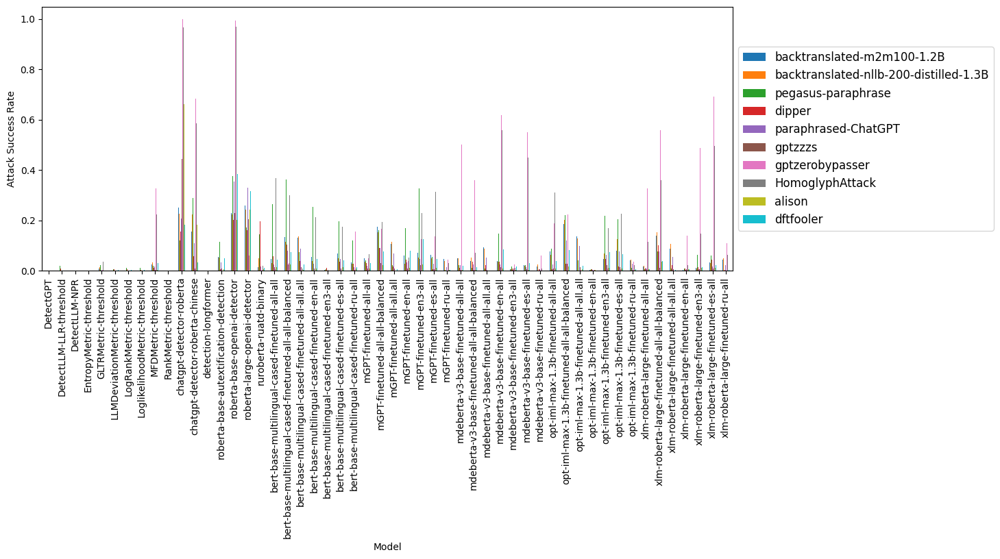

In [ ]:
temp = attack_success.set_index(['Model', 'Obfuscator'])
temp=temp.unstack()
metric = 'Attack Success Rate'
temp = temp.drop(columns=[(metric, 'original')]).sort_index(key=lambda x: x.map(key))
#obfuscators_list = temp[metric].columns.to_list()
#obfuscators_list.insert(0, obfuscators_list.pop(obfuscators_list.index('original')))
temp_obfuscators = obfuscators_order

chart = temp[metric][temp_obfuscators].plot(kind='bar', figsize=[13,5], rot=90)
chart.legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
chart.set_ylabel(metric)

Text(0, 0.5, 'Attack Success Rate')

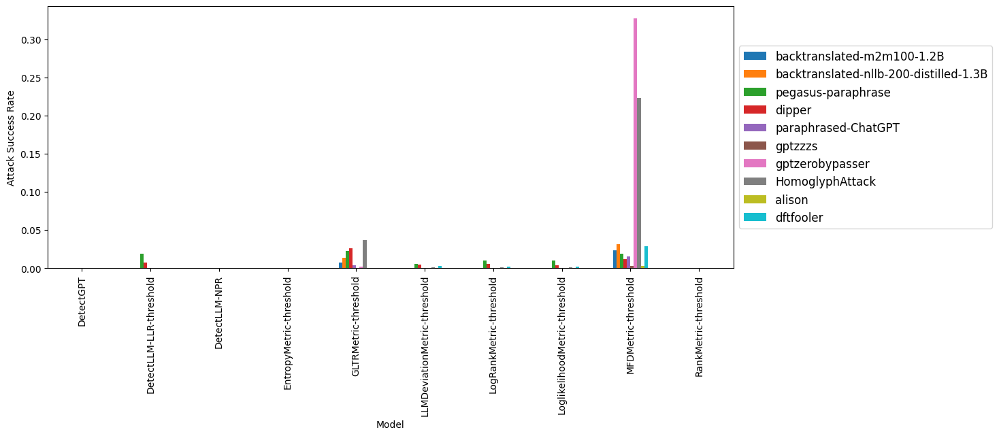

In [ ]:
#only statistical detectors
temp = attack_success[attack_success.Model.isin(statistical)].set_index(['Model', 'Obfuscator'])
temp=temp.unstack()
metric = 'Attack Success Rate'
temp = temp.drop(columns=[(metric, 'original')]).sort_index(key=lambda x: x.map(key))
#obfuscators_list = temp[metric].columns.to_list()
#obfuscators_list.insert(0, obfuscators_list.pop(obfuscators_list.index('original')))
temp_obfuscators = obfuscators_order

chart = temp[metric][temp_obfuscators].plot(kind='bar', figsize=[13,5], rot=90)
chart.legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
chart.set_ylabel(metric)

Text(0, 0.5, 'Attack Success Rate')

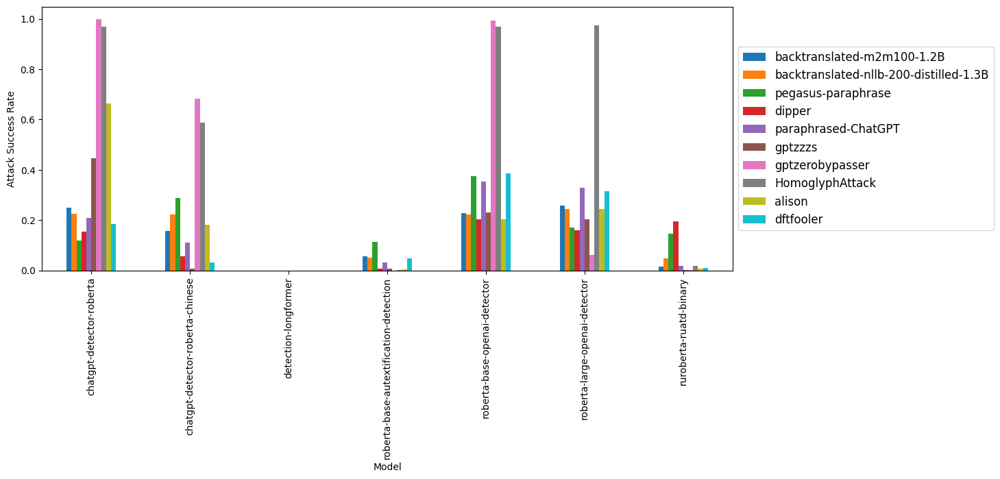

In [ ]:
#only zeroshot detectors
temp = attack_success[attack_success.Model.isin(zeroshot)].set_index(['Model', 'Obfuscator'])
temp=temp.unstack()
metric = 'Attack Success Rate'
temp = temp.drop(columns=[(metric, 'original')]).sort_index(key=lambda x: x.map(key))
#obfuscators_list = temp[metric].columns.to_list()
#obfuscators_list.insert(0, obfuscators_list.pop(obfuscators_list.index('original')))
temp_obfuscators = obfuscators_order

chart = temp[metric][temp_obfuscators].plot(kind='bar', figsize=[13,5], rot=90)
chart.legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
chart.set_ylabel(metric)

In [ ]:
#only finetuned detectors
temp = attack_success[attack_success.Model.isin(finetuned) & ~attack_success.Model.str.contains('\.all') & ~attack_success.Model.str.contains('-balanced')].set_index(['Model', 'Obfuscator'])
temp=temp.unstack()
metric = 'Attack Success Rate'
temp = temp.drop(columns=[(metric, 'original')]).sort_index(key=lambda x: x.map(key))
#obfuscators_list = temp[metric].columns.to_list()
#obfuscators_list.insert(0, obfuscators_list.pop(obfuscators_list.index('original')))
temp_obfuscators = obfuscators_order

chart = temp[metric][temp_obfuscators].plot(kind='bar', figsize=[13,5], rot=90)
chart.legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
chart.set_ylabel(metric)

In [ ]:
print(metric)
temp[metric][obfuscators_order]

Attack Success Rate


Obfuscator,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,dipper,paraphrased-ChatGPT,gptzzzs,gptzerobypasser,HomoglyphAttack,alison,dftfooler
Model,,,,,,,,,,
bert-base-multilingual-cased-finetuned-all-all,0.046155,0.029502,0.264961,0.056163,0.023258,0.014371,0.006405,0.368160,0.013690,0.042993
bert-base-multilingual-cased-finetuned-en-all,0.055187,0.038631,0.253361,0.060996,0.026017,0.008423,0.000456,0.212739,0.007510,0.046846
bert-base-multilingual-cased-finetuned-en3-all,0.002692,0.002038,0.005231,0.011692,0.000385,0.001538,0.000000,0.000115,0.000038,0.001192
bert-base-multilingual-cased-finetuned-es-all,0.067540,0.049394,0.195346,0.034142,0.046170,0.008846,0.000413,0.174720,0.012648,0.039764
bert-base-multilingual-cased-finetuned-ru-all,0.033703,0.028066,0.119075,0.026070,0.014444,0.002035,0.156339,0.446784,0.008651,0.012369
mGPT-finetuned-all-all,0.047651,0.036372,0.042075,0.028726,0.018545,0.008280,0.049045,0.065901,0.007139,0.029486
mGPT-finetuned-en-all,0.060447,0.026138,0.167751,0.042771,0.033183,0.008338,0.037852,0.050609,0.010297,0.078206
mGPT-finetuned-en3-all,0.070769,0.050836,0.326243,0.082497,0.045084,0.020468,0.125842,0.228183,0.023367,0.124013
mGPT-finetuned-es-all,0.061281,0.047840,0.054196,0.005282,0.027055,0.006055,0.136520,0.312806,0.011466,0.046852


In [ ]:
#English only
attack_success = pd.DataFrame()
for model in models:
  #threshold_filter = ' and (meteor > 0.5)'
  threshold_filter = ''
  language_filter = ' and language.str.contains("en")'
#  language_filter = ''
  results = analyze_attack_success(test_results, model=model, filter='language.str.contains("en")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
#    try:
#      asr = round(1 - predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")][col].value_counts(normalize=True)["machine"], 4)
#    except:
#      asr = 0.0
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
temp = attack_success.set_index(['Model', 'Obfuscator'])
temp=temp.unstack()
metric = 'Attack Success Rate'
temp = temp.drop(columns=[(metric, 'original')]).sort_index(key=lambda x: x.map(key))
#obfuscators_list = temp[metric].columns.to_list()
#obfuscators_list.insert(0, obfuscators_list.pop(obfuscators_list.index('original')))
chart = temp[metric][obfuscators_order].plot(kind='bar', figsize=[13,5], rot=90)
chart.legend(loc='center left',bbox_to_anchor=(1.0, 0.5), fontsize=12)
chart.set_ylabel(metric)

In [ ]:
print(metric)
temp[metric][obfuscators_order]

Attack Success Rate


Obfuscator,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,dipper,paraphrased-ChatGPT,gptzzzs,gptzerobypasser,HomoglyphAttack,alison,dftfooler
Model,,,,,,,,,,
DetectGPT,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DetectLLM-LLR-threshold,0.000000,0.000000,0.000000,0.000000,0.000903,0.000000,0.000000,0.000000,0.000000,0.000000
DetectLLM-NPR,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
EntropyMetric-threshold,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
GLTRMetric-threshold,0.000000,0.000000,0.000000,0.001355,0.001355,0.000452,0.000000,0.006775,0.000000,0.000000
LLMDeviationMetric-threshold,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001355
LogRankMetric-threshold,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001355
LoglikelihoodMetric-threshold,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000903
MFDMetric-threshold,0.010393,0.002259,0.000904,0.000452,0.000904,0.009038,0.285133,0.017171,0.000000,0.006326


### Per Language

In [ ]:
bg_cmap = 'RdYlGn'
bg_vmin = -1
bg_vmax = 1
bg_text_color_threshold = 0.15

In [ ]:
def analyze_attack_success_th(results_list, model="", filter=None, threshold=0.501):
  results = pd.DataFrame()
  for detector in results_list:#tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        #print(detector_name)
        if model != detector_name.split('_')[-1]: continue
        #if "TextFooler" in detector_name: continue
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        labels = [label2id[x] for x in temp['label']]
        predictions = [label2id[x] for x in temp['predictions']]
        temp = temp.fillna(0.0)
        temp['prediction_probs'] = temp['prediction_probs'].astype(float)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        temp['predictions'] = ["machine" if x >= threshold else "human" for x in temp['prediction_probs']]
        temp['threshold'] = threshold
        temp = temp.rename(columns={'predictions': f'{detector_name}_predictions', 'threshold': f'{detector_name}_threshold', 'prediction_probs': f'{detector_name}_prediction_probs'})
        results = pd.concat([results, temp], axis=1)
  #results = results.T.drop_duplicates().T.reset_index(drop=True)
  results = results.loc[:,~results.columns.duplicated()].copy()
  return results

In [ ]:
%%time
#only originally (not adversarially) trained models with optimal per-language threshold
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model][test_language]['th_optim'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    maximum = (1 / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])) if len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")]) != 0 else 0
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) * maximum
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

100%|██████████| 37/37 [00:18<00:00,  2.01it/s]

CPU times: user 3min 31s, sys: 914 ms, total: 3min 32s
Wall time: 3min 34s


In [ ]:
if (os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all.pkl'), 'rb') as fp:
    asr_lang = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all.pkl'), 'wb') as fp:
    pickle.dump(asr_lang, fp)

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack()
temp.style.apply(lambda x: ["background-color: yellow" if v > 0.5 else "background-color: orange" if v == 0 else "" for v in x], axis = 1)

In [ ]:
with open('attack_success_rate.html', "wt") as out:
 out.write(temp.style.apply(lambda x: ["background-color: yellow" if v > 0.5 else "background-color: orange" if v == 0 else "" for v in x], axis = 1).set_table_styles([{'selector': 'th,td', 'props': [('font-size', '12pt'),('border-style','solid'),('border-width','1px')]}]).to_html())

In [ ]:
#how many cases (obfuscator-model-language combinations) achieve ASR at least at threshold
threshold = 0.5
temp[temp >= threshold].iloc[:-1,:-1].count().sum() / temp[~temp.index.isin(['original'], level=0)].iloc[:-1,:-1].count().sum()

0.18727272727272729

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
temp2 = temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp2)
#print(temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(' & {\\cellcolor', '} & {\\cellcolor').replace(' \\\\', '} \\\\'))
s = temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,0.3177,0.3101,0.2008,0.2671,0.2727,0.2389,0.2764,0.2495,0.2729,0.2510,0.2911,0.2680
nllb-200-distilled-1.3B,0.2890,0.3475,0.2492,0.2369,0.1985,0.2195,0.2564,0.2297,0.2721,0.3025,0.3350,0.2669
Pegasus-paraphrase,0.3259,0.4803,0.4151,0.4367,0.1708,0.4469,0.4542,0.5319,0.2898,0.2228,0.2371,0.3647
DIPPER,0.3614,0.1842,0.2096,0.2151,0.1382,0.2148,0.1853,0.2262,0.2314,0.2418,0.3444,0.2320
ChatGPT,0.2355,0.1878,0.1865,0.1801,0.1211,0.1426,0.1735,0.1528,0.2154,0.2044,0.2095,0.1826
GPTZzzs,0.0481,0.0837,0.0362,0.0629,0.3269,0.1094,0.0860,0.1181,0.0296,0.0300,0.0387,0.0882
GPTZeroBypasser,0.5392,0.4947,0.3705,0.5409,0.6147,0.5374,0.5696,0.5947,0.5170,0.4818,0.3095,0.5064
HomoglyphAttack,0.5723,0.6496,0.4868,0.6305,0.6839,0.6324,0.7009,0.6687,0.5520,0.5449,0.2532,0.5796
ALISON,0.0740,0.0679,0.0625,0.0700,0.0945,0.0705,0.0582,0.0751,0.0867,0.1208,0.0337,0.0740
DFTFooler,0.0459,0.2070,0.1376,0.3230,0.2289,0.2299,0.2841,0.2810,0.1616,0.1474,0.0397,0.1896


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{BBE278}} \textcolor{black}{0.3177 & {\cellcolor[HTML]{BDE379}} \textcolor{black}{0.3101 & {\cellcolor[HTML]{D9EF8B}} \textcolor{black}{0.2008 & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2671 & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2727 & {\cellcolor[HTML]{CFEB85}} \textcolor{black}{0.2389 & {\cellcolor[HTML]{C5E67E}} \textcolor{black}{0.2764 & {\cellcolor[HTML]{CDEA83}} \textcolor{black}{0.2495 & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2729 & {\cellcolor[HTML]{CBE982}} \textcolor{black}{0.2510 & {\cellcolor[HTML]{C1E57B}} \textcolor{black}{0.2911 & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2680} \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HTML]{C3E67D}} \textcolor{black}{0.28

In [ ]:
%%time
#only originally (not adversarially) trained models
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0687,0.0975,0.1511,0.0805,0.0255,0.0665,0.0977,0.0847,0.0742,0.0966,0.0589,0.0820
backtranslated-nllb-200-distilled-1.3B,0.0728,0.0979,0.1674,0.0828,0.0219,0.0688,0.0974,0.0821,0.0744,0.0989,0.0626,0.0843
pegasus-paraphrase,0.0440,0.1120,0.1958,0.1178,0.0247,0.0951,0.0904,0.1321,0.0603,0.0657,0.0573,0.0905
dipper,0.0427,0.0335,0.0728,0.0353,0.0187,0.0367,0.0345,0.0380,0.0416,0.0417,0.0523,0.0407
paraphrased-ChatGPT,0.0732,0.0800,0.1361,0.0816,0.0180,0.0704,0.0958,0.0772,0.0556,0.0845,0.0689,0.0765
gptzzzs,0.0161,0.0277,0.0266,0.0157,0.0584,0.0236,0.0346,0.0276,0.0104,0.0154,0.0149,0.0246
gptzerobypasser,0.1628,0.1784,0.1955,0.1896,0.1967,0.1818,0.1767,0.1881,0.2070,0.2233,0.0757,0.1796
HomoglyphAttack,0.1602,0.2310,0.2327,0.2423,0.1810,0.2315,0.2137,0.2354,0.2235,0.2367,0.0700,0.2053
alison,0.0325,0.0407,0.0416,0.0337,0.0407,0.0354,0.0378,0.0345,0.0306,0.0440,0.0206,0.0356
dftfooler,0.0154,0.0420,0.0629,0.0934,0.0530,0.0443,0.0711,0.0540,0.0385,0.0304,0.0202,0.0477


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  if (auc_original[model]['auc'] < 0.6): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0155,0.0446,0.1189,0.0349,0.0247,0.0200,0.0305,0.0221,0.0411,0.0534,0.0166,0.0384
backtranslated-nllb-200-distilled-1.3B,0.0214,0.0396,0.1287,0.0310,0.0199,0.0150,0.0268,0.0186,0.0327,0.0439,0.0207,0.0362
pegasus-paraphrase,0.0106,0.1360,0.2280,0.1478,0.0238,0.0974,0.1056,0.1563,0.0014,0.0008,0.0106,0.0835
dipper,0.0148,0.0175,0.0610,0.0206,0.0168,0.0124,0.0228,0.0183,0.0204,0.0211,0.0163,0.0220
paraphrased-ChatGPT,0.0174,0.0203,0.0970,0.0255,0.0020,0.0070,0.0180,0.0085,0.0197,0.0299,0.0118,0.0234
gptzzzs,0.0010,0.0069,0.0084,0.0037,0.0310,0.0054,0.0072,0.0065,0.0003,0.0002,0.0017,0.0066
gptzerobypasser,0.1395,0.1513,0.1698,0.1674,0.1816,0.1550,0.1497,0.1647,0.2193,0.2463,0.0302,0.1613
HomoglyphAttack,0.1199,0.2039,0.2202,0.2182,0.1583,0.2054,0.1826,0.2099,0.1970,0.2233,0.0172,0.1778
alison,0.0057,0.0053,0.0156,0.0070,0.0085,0.0044,0.0053,0.0051,0.0046,0.0112,0.0020,0.0068
dftfooler,0.0006,0.0267,0.0491,0.0872,0.0153,0.0255,0.0565,0.0323,0.0208,0.0107,0.0014,0.0297


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  if (auc_original[model]['auc'] < 0.7): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0173,0.0517,0.1378,0.0399,0.0282,0.0230,0.0353,0.0255,0.0474,0.0620,0.0173,0.0441
backtranslated-nllb-200-distilled-1.3B,0.0229,0.0458,0.1491,0.0353,0.0222,0.0173,0.0311,0.0214,0.0376,0.0509,0.0203,0.0413
pegasus-paraphrase,0.0039,0.1575,0.2621,0.1708,0.0259,0.1124,0.1222,0.1806,0.0014,0.0007,0.0065,0.0949
dipper,0.0121,0.0201,0.0698,0.0235,0.0187,0.0141,0.0262,0.0210,0.0226,0.0232,0.0126,0.0240
paraphrased-ChatGPT,0.0196,0.0235,0.1124,0.0290,0.0022,0.0080,0.0208,0.0097,0.0228,0.0347,0.0129,0.0269
gptzzzs,0.0011,0.0080,0.0097,0.0043,0.0357,0.0062,0.0082,0.0075,0.0003,0.0003,0.0019,0.0076
gptzerobypasser,0.1617,0.1755,0.1968,0.1940,0.2105,0.1798,0.1735,0.1909,0.2543,0.2856,0.0346,0.1870
HomoglyphAttack,0.1306,0.2360,0.2548,0.2515,0.1833,0.2377,0.2107,0.2427,0.2258,0.2584,0.0192,0.2046
alison,0.0064,0.0061,0.0181,0.0080,0.0094,0.0051,0.0062,0.0059,0.0053,0.0130,0.0022,0.0078
dftfooler,0.0007,0.0310,0.0569,0.1011,0.0176,0.0296,0.0655,0.0374,0.0241,0.0124,0.0016,0.0344


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0163,0.0729,0.1528,0.0428,0.0291,0.0301,0.0339,0.0335,0.0577,0.0702,0.0108,0.0500
backtranslated-nllb-200-distilled-1.3B,0.0184,0.0704,0.1667,0.0407,0.0255,0.0235,0.0374,0.0288,0.0462,0.0559,0.0124,0.0478
pegasus-paraphrase,0.0016,0.1542,0.2383,0.1163,0.0203,0.0953,0.0750,0.1672,0.0005,0.0006,0.0038,0.0794
dipper,0.0132,0.0193,0.0557,0.0158,0.0160,0.0106,0.0144,0.0173,0.0139,0.0135,0.0106,0.0182
paraphrased-ChatGPT,0.0200,0.0310,0.0981,0.0284,0.0020,0.0089,0.0201,0.0104,0.0267,0.0388,0.0090,0.0267
gptzzzs,0.0009,0.0095,0.0091,0.0032,0.0273,0.0061,0.0056,0.0073,0.0002,0.0003,0.0012,0.0064
gptzerobypasser,0.1390,0.2131,0.2209,0.2148,0.2257,0.2236,0.1857,0.2392,0.2638,0.2797,0.0200,0.2023
HomoglyphAttack,0.1289,0.3174,0.2958,0.3034,0.2014,0.3191,0.2370,0.3230,0.2680,0.2878,0.0143,0.2451
alison,0.0077,0.0057,0.0158,0.0071,0.0078,0.0054,0.0035,0.0056,0.0056,0.0134,0.0013,0.0072
dftfooler,0.0005,0.0319,0.0416,0.0844,0.0113,0.0268,0.0392,0.0333,0.0083,0.0102,0.0009,0.0262


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original per-language data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  #if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0172,0.0463,0.1212,0.0389,0.0324,0.0243,0.0557,0.0314,0.0624,0.0827,0.0045,0.0470
backtranslated-nllb-200-distilled-1.3B,0.0192,0.0450,0.1336,0.0324,0.0277,0.0171,0.0598,0.0254,0.0465,0.0643,0.0092,0.0437
pegasus-paraphrase,0.0016,0.1356,0.2088,0.1502,0.0318,0.1213,0.0848,0.1796,0.0005,0.0006,0.0033,0.0835
dipper,0.0152,0.0167,0.0544,0.0206,0.0225,0.0151,0.0187,0.0208,0.0130,0.0132,0.0125,0.0202
paraphrased-ChatGPT,0.0221,0.0223,0.0907,0.0241,0.0251,0.0077,0.0497,0.0102,0.0265,0.0434,0.0048,0.0297
gptzzzs,0.0009,0.0071,0.0082,0.0032,0.0659,0.0064,0.0091,0.0076,0.0002,0.0003,0.0009,0.0100
gptzerobypasser,0.1540,0.1711,0.1391,0.1790,0.1811,0.1949,0.2454,0.2020,0.2556,0.2926,0.0266,0.1856
HomoglyphAttack,0.1277,0.2351,0.2061,0.2502,0.1896,0.2579,0.2586,0.2871,0.2478,0.2867,0.0107,0.2143
alison,0.0085,0.0050,0.0139,0.0069,0.0344,0.0054,0.0223,0.0054,0.0052,0.0140,0.0010,0.0111
dftfooler,0.0006,0.0259,0.0444,0.0911,0.0715,0.0320,0.0472,0.0326,0.0084,0.0112,0.0006,0.0332


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original per-language data using optimal per-language threshold for predictions
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  #if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model][test_language]['th_optim'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.1103,0.2942,0.1755,0.1980,0.2300,0.2049,0.2687,0.2137,0.1884,0.1648,0.1100,0.1962
backtranslated-nllb-200-distilled-1.3B,0.1057,0.3540,0.2275,0.1517,0.1525,0.1739,0.2425,0.1567,0.1750,0.1755,0.1497,0.1877
pegasus-paraphrase,0.2005,0.5966,0.4587,0.4314,0.1378,0.4868,0.3844,0.5005,0.1296,0.0484,0.1371,0.3193
dipper,0.2629,0.1747,0.1948,0.1043,0.0995,0.1158,0.1068,0.1189,0.1083,0.0705,0.2223,0.1435
paraphrased-ChatGPT,0.0883,0.1118,0.1236,0.0976,0.0794,0.0785,0.1080,0.0721,0.0894,0.0946,0.0824,0.0932
gptzzzs,0.0045,0.0578,0.0166,0.0154,0.3196,0.0531,0.0331,0.0437,0.0017,0.0006,0.0072,0.0503
gptzerobypasser,0.4348,0.5642,0.3228,0.5925,0.5261,0.7231,0.7455,0.7491,0.5069,0.4181,0.1965,0.5254
HomoglyphAttack,0.4103,0.7744,0.4552,0.6208,0.6736,0.7394,0.7686,0.7403,0.5076,0.4142,0.0808,0.5623
alison,0.0217,0.0386,0.0210,0.0219,0.0607,0.0315,0.0289,0.0260,0.0162,0.0240,0.0075,0.0271
dftfooler,0.0030,0.2134,0.1098,0.2453,0.2265,0.1537,0.1835,0.1533,0.0525,0.0239,0.0050,0.1245


In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original per-language data using per-language threshold for predictions optimized based on 10% of original test data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  #if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model][test_language]['th_optim_valid'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    maximum = (1 / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])) if len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")]) != 0 else 0
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) * maximum
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

100%|██████████| 37/37 [00:03<00:00, 10.15it/s]

CPU times: user 1min 36s, sys: 430 ms, total: 1min 37s
Wall time: 1min 38s


In [ ]:
if (os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-best-10.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-best-10.pkl'), 'rb') as fp:
    asr_lang = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-best-10.pkl'), 'wb') as fp:
    pickle.dump(asr_lang, fp)

In [ ]:
#bg_text_color_threshold = 0.2
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
temp2 = temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
print(temp2.replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n'))
#print(temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(' & {\\cellcolor', '} & {\\cellcolor').replace(' \\\\', '} \\\\'))
s = temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,0.0980,0.2455,0.1281,0.2295,0.2545,0.1738,0.2474,0.2062,0.1718,0.1419,0.1155,0.1829
nllb-200-distilled-1.3B,0.0954,0.2792,0.1589,0.1756,0.1670,0.1338,0.2109,0.1450,0.1513,0.1400,0.1542,0.1647
Pegasus-paraphrase,0.1572,0.4963,0.3787,0.4410,0.1570,0.4026,0.3532,0.4889,0.0597,0.0734,0.1358,0.2858
DIPPER,0.2405,0.1499,0.1585,0.1143,0.1153,0.0919,0.0910,0.1051,0.0885,0.0810,0.2267,0.1330
ChatGPT,0.0847,0.0768,0.0865,0.1137,0.1071,0.0577,0.0919,0.0627,0.0804,0.0791,0.0826,0.0839
GPTZzzs,0.0036,0.0540,0.0145,0.0189,0.3712,0.0369,0.0290,0.0364,0.0013,0.0005,0.0079,0.0522
GPTZeroBypasser,0.3639,0.4910,0.2516,0.5986,0.5430,0.6894,0.6778,0.7087,0.4551,0.3692,0.2067,0.4868
HomoglyphAttack,0.3446,0.7220,0.4143,0.6106,0.7376,0.6785,0.7383,0.7286,0.4699,0.3848,0.0858,0.5377
ALISON,0.0201,0.0283,0.0171,0.0261,0.0739,0.0216,0.0240,0.0221,0.0154,0.0245,0.0071,0.0255
DFTFooler,0.0023,0.1961,0.1001,0.2533,0.2625,0.1165,0.1603,0.1349,0.0361,0.0228,0.0056,0.1173


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{ECF7A6}} \color[HTML]{000000} 0.0980 & {\cellcolor[HTML]{CDEA83}} \color[HTML]{000000} 0.2455 & {\cellcolor[HTML]{E6F59D}} \color[HTML]{000000} 0.1281 & {\cellcolor[HTML]{D1EC86}} \color[HTML]{000000} 0.2295 & {\cellcolor[HTML]{CBE982}} \color[HTML]{000000} 0.2545 & {\cellcolor[HTML]{DDF191}} \color[HTML]{000000} 0.1738 & {\cellcolor[HTML]{CDEA83}} \color[HTML]{000000} 0.2474 & {\cellcolor[HTML]{D7EE8A}} \color[HTML]{000000} 0.2062 & {\cellcolor[HTML]{DFF293}} \color[HTML]{000000} 0.1718 & {\cellcolor[HTML]{E3F399}} \color[HTML]{000000} 0.1419 & {\cellcolor[HTML]{E9F6A1}} \color[HTML]{000000} 0.1155 & {\cellcolor[HTML]{DCF08F}} \color[HTML]{000000} 0.1829 \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HT

In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original per-language data using per-language threshold for predictions optimized based on 10% of original test data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  #if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  #if (auc_original[model][test_language]['auc'] < 0.8): continue #commented using all detectors, not just above threshold
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model][test_language]['th_optim_valid'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    maximum = (1 / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])) if len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")]) != 0 else 0
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) * maximum
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

100%|██████████| 42/42 [00:23<00:00,  1.80it/s]

CPU times: user 4min 21s, sys: 1.15 s, total: 4min 22s
Wall time: 4min 26s


In [ ]:
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all-10.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all-10.pkl'), 'rb') as fp:
    asr_lang = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-all-10.pkl'), 'wb') as fp:
    pickle.dump(asr_lang, fp)

In [ ]:
bg_text_color_threshold = 0.2
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
temp2 = temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
print(temp2)
#print(temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(' & {\\cellcolor', '} & {\\cellcolor').replace(' \\\\', '} \\\\'))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.3315,0.2825,0.1797,0.2672,0.2637,0.2490,0.2861,0.2609,0.2169,0.2699,0.3033,0.2646
backtranslated-nllb-200-distilled-1.3B,0.3111,0.3201,0.2260,0.2328,0.1906,0.2276,0.2592,0.2306,0.2299,0.3225,0.3568,0.2643
pegasus-paraphrase,0.3463,0.4689,0.4012,0.4641,0.1838,0.4921,0.4899,0.5612,0.2758,0.2681,0.2940,0.3859
dipper,0.3683,0.1617,0.1887,0.2096,0.1448,0.2108,0.1807,0.2222,0.1916,0.2624,0.3584,0.2272
paraphrased-ChatGPT,0.2594,0.1688,0.1763,0.1681,0.1181,0.1476,0.1729,0.1458,0.1761,0.2292,0.2292,0.1811
gptzzzs,0.0531,0.0720,0.0291,0.0530,0.3173,0.1029,0.0850,0.1114,0.0205,0.0205,0.0479,0.0830
gptzerobypasser,0.5456,0.5076,0.3505,0.5521,0.6023,0.5799,0.5667,0.6145,0.4559,0.4890,0.3301,0.5086
HomoglyphAttack,0.5736,0.6479,0.4470,0.5961,0.6711,0.6487,0.7033,0.6906,0.5180,0.5481,0.2453,0.5718
alison,0.0712,0.0589,0.0493,0.0624,0.0994,0.0648,0.0553,0.0716,0.0711,0.1166,0.0421,0.0693
dftfooler,0.0495,0.1902,0.1284,0.3180,0.2212,0.2215,0.2906,0.2748,0.1541,0.1438,0.0497,0.1856


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries Language Average \\
\bfseries backtranslated-m2m100-1.2B & {\cellcolor[HTML]{8ECF67}} \color[HTML]{000000} 0.3315 & {\cellcolor[HTML]{A5D86A}} \color[HTML]{000000} 0.2825 & {\cellcolor[HTML]{CBE982}} \color[HTML]{000000} 0.1797 & {\cellcolor[HTML]{ABDB6D}} \color[HTML]{000000} 0.2672 & {\cellcolor[HTML]{ABDB6D}} \color[HTML]{000000} 0.2637 & {\cellcolor[HTML]{B1DE71}} \color[HTML]{000000} 0.2490 & {\cellcolor[HTML]{A2D76A}} \color[HTML]{000000} 0.2861 & {\cellcolor[HTML]{ADDC6F}} \color[HTML]{000000} 0.2609 & {\cellcolor[HTML]{BDE379}} \color[HTML]{000000} 0.2169 & {\cellcolor[HTML]{A9DA6C}} \color[HTML]{000000} 0.2699 & {\cellcolor[HTML]{9BD469}} \color[HTML]{000000} 0.3033 & {\cellcolor[HTML]{ABDB6D}} \color[HTML]{000000} 0.2646 \\
\bfseries backtranslated-nllb-200-distilled-1.3

#### Statistics

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)

In [ ]:
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack()['Attack Success Rate'].reset_index()
temp.head()

Test Language,Obfuscator,Model,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
0,HomoglyphAttack,DetectLLM-LLR-threshold,NaN,0.996324,0.996166,0.999191,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
1,HomoglyphAttack,GLTRMetric-threshold,NaN,0.996815,0.995152,0.996981,1.0,0.999251,1.0,0.999155,NaN,NaN,NaN
2,HomoglyphAttack,LLMDeviationMetric-threshold,NaN,0.997691,0.996522,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
3,HomoglyphAttack,LogRankMetric-threshold,NaN,0.998142,0.996797,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
4,HomoglyphAttack,LoglikelihoodMetric-threshold,NaN,0.998757,0.996923,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN


In [ ]:
#temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]

Test Language,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
backtranslated-m2m100-1.2B,0.106039,0.275890,0.142912,0.245126,0.306256,0.225055,0.269117,0.248449,0.201421,0.144867,0.184115
backtranslated-nllb-200-distilled-1.3B,0.098329,0.326179,0.197996,0.198743,0.213293,0.184605,0.230743,0.199031,0.186793,0.154180,0.272542
pegasus-paraphrase,0.170630,0.527865,0.414336,0.456384,0.191156,0.472998,0.487733,0.588268,0.139515,0.048949,0.275399
dipper,0.242508,0.182951,0.204166,0.219107,0.155576,0.247765,0.211984,0.264472,0.119869,0.071884,0.299116
paraphrased-ChatGPT,0.080319,0.107579,0.095840,0.102033,0.133238,0.079750,0.091989,0.076593,0.102607,0.083071,0.105204
gptzzzs,0.005293,0.074103,0.017306,0.030825,0.414026,0.084946,0.079699,0.092763,0.003073,0.001033,0.009546
gptzerobypasser,0.376380,0.469755,0.232779,0.449166,0.575207,0.537810,0.563370,0.585737,0.471269,0.363337,0.192323
HomoglyphAttack,0.376740,0.715390,0.459292,0.644017,0.768375,0.703304,0.744738,0.749526,0.537093,0.414657,0.113066
alison,0.021595,0.045143,0.017980,0.027455,0.109157,0.031192,0.029813,0.033993,0.022715,0.026103,0.009384


In [ ]:
#statistical significance tests
langs = sorted_languages
#df = temp[sorted_languages]
df = temp#.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(langs, 2):
  if src == trg: continue
  df_temp = df[[src, trg]].dropna() #to have same-lenght arrays
  res = stats.pearsonr(df_temp[src], df_temp[trg])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', '')).format(na_rep='', precision=4)

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,en,de,0.0000,0.6181,0.7565
1,en,nl,0.0000,0.6852,0.7978
2,en,es,0.0000,0.7138,0.8193
3,en,pt,0.0000,0.6586,0.7843
4,en,ca,0.0000,0.6065,0.7429
5,en,cs,0.0000,0.4698,0.6503
6,en,ru,0.0000,0.7402,0.8571
7,en,uk,0.0000,0.7636,0.8677
8,en,ar,0.0000,0.4849,0.7203
9,en,zh,0.0033,0.1009,0.4631


In [ ]:
#statistical significance tests - per language mean
langs = sorted_languages
#df = temp[sorted_languages]
df = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(langs, 2):
  if src == trg: continue
  df_temp = df[[src, trg]].dropna() #to have same-lenght arrays
  res = stats.pearsonr(df_temp[src], df_temp[trg])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', ''))

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,en,de,0.027414,0.105643,0.919785
1,en,nl,0.009925,0.261328,0.941276
2,en,es,0.011959,0.234331,0.937907
3,en,pt,0.022242,0.139384,0.924898
4,en,ca,0.028904,0.096962,0.918424
5,en,cs,0.155858,-0.208825,0.853703
6,en,ru,0.003595,0.396225,0.956302
7,en,uk,0.003813,0.388967,0.955563
8,en,ar,0.041341,0.036791,0.908419
9,en,zh,0.683850,-0.711192,0.531334


In [ ]:
#statistical significance tests
langs = sorted_languages
#df = temp[sorted_languages]
df = temp#.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  if src == trg: continue
  res = stats.pearsonr(df.loc[df['Obfuscator'] == src, :].mean(numeric_only=True, axis=1), df.loc[df['Obfuscator'] == trg, :].mean(numeric_only=True, axis=1))
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', '')).format(na_rep='', precision=4)

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,0.0000,0.7911,0.9471
1,backtranslated-m2m100-1.2B,pegasus-paraphrase,0.0000,0.5454,0.8716
2,backtranslated-m2m100-1.2B,dipper,0.0000,0.5650,0.8782
3,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,0.0010,0.2552,0.7569
4,backtranslated-m2m100-1.2B,gptzzzs,0.0002,0.3306,0.7900
5,backtranslated-m2m100-1.2B,gptzerobypasser,0.4415,-0.2184,0.4667
6,backtranslated-m2m100-1.2B,HomoglyphAttack,0.0000,0.4140,0.8237
7,backtranslated-m2m100-1.2B,alison,0.3448,-0.1874,0.4917
8,backtranslated-m2m100-1.2B,dftfooler,0.0035,0.1838,0.7229
9,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,0.0000,0.5252,0.8646


In [ ]:
#statistical significance tests - per language mean
langs = sorted_languages
#df = temp[sorted_languages]
df = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  if src == trg: continue
  res = stats.pearsonr(df.loc[src, :], df.loc[trg, :])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', ''))

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,0.046485,0.015252,0.885601
1,backtranslated-m2m100-1.2B,pegasus-paraphrase,0.123087,-0.151354,0.843556
2,backtranslated-m2m100-1.2B,dipper,0.951302,-0.586308,0.613105
3,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,0.098201,-0.110981,0.855003
4,backtranslated-m2m100-1.2B,gptzzzs,0.023762,0.119308,0.906188
5,backtranslated-m2m100-1.2B,gptzerobypasser,0.012286,0.213471,0.922075
6,backtranslated-m2m100-1.2B,HomoglyphAttack,0.006208,0.302696,0.935207
7,backtranslated-m2m100-1.2B,alison,0.028030,0.094478,0.901592
8,backtranslated-m2m100-1.2B,dftfooler,0.000436,0.576155,0.966916
9,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,0.133772,-0.166514,0.839011


In [ ]:
temp.head()

Test Language,Obfuscator,Model,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
0,HomoglyphAttack,DetectLLM-LLR-threshold,NaN,0.996324,0.996166,0.999191,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
1,HomoglyphAttack,GLTRMetric-threshold,NaN,0.996815,0.995152,0.996981,1.0,0.999251,1.0,0.999155,NaN,NaN,NaN
2,HomoglyphAttack,LLMDeviationMetric-threshold,NaN,0.997691,0.996522,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
3,HomoglyphAttack,LogRankMetric-threshold,NaN,0.998142,0.996797,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN
4,HomoglyphAttack,LoglikelihoodMetric-threshold,NaN,0.998757,0.996923,1.000000,1.0,1.000000,1.0,1.000000,NaN,NaN,NaN


In [ ]:
for lang in sorted_languages:
  print(lang)
  temp2 = temp[~temp[lang].isna()] #filter missing data
  display(AnovaRM(data=temp2, depvar=lang, subject='Model', within=['Obfuscator'], aggregate_func='mean').fit().anova_table.style.format(na_rep=0, precision=50))
#problem with missing data due to > threshold AUC ???

en


,F Value,Num DF,Den DF,Pr > F
Obfuscator,33.83033289805489118862169561907649040222167968750000,10.00000000000000000000000000000000000000000000000000,260.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000000000001188858820


de


,F Value,Num DF,Den DF,Pr > F
Obfuscator,29.12672130881527365886540792416781187057495117187500,10.00000000000000000000000000000000000000000000000000,220.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000003749796385429102


nl


,F Value,Num DF,Den DF,Pr > F
Obfuscator,38.91117869417427499456607620231807231903076171875000,10.00000000000000000000000000000000000000000000000000,250.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000000000000000171417


es


,F Value,Num DF,Den DF,Pr > F
Obfuscator,34.79192514667250435422829468734562397003173828125000,10.00000000000000000000000000000000000000000000000000,230.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000000000010285823192


pt


,F Value,Num DF,Den DF,Pr > F
Obfuscator,39.71228000090734155946847749873995780944824218750000,10.00000000000000000000000000000000000000000000000000,220.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000000000000006206656


ca


,F Value,Num DF,Den DF,Pr > F
Obfuscator,35.64416227345456888997432542964816093444824218750000,10.00000000000000000000000000000000000000000000000000,250.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000000000000000105234610


cs


,F Value,Num DF,Den DF,Pr > F
Obfuscator,16.30253406840382979225978488102555274963378906250000,10.00000000000000000000000000000000000000000000000000,230.00000000000000000000000000000000000000000000000000,0.00000000000000000000042945080942970885370739846536


ru


,F Value,Num DF,Den DF,Pr > F
Obfuscator,24.20293340152696970335455262102186679840087890625000,10.00000000000000000000000000000000000000000000000000,160.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000255360611190509820839827


uk


,F Value,Num DF,Den DF,Pr > F
Obfuscator,22.90338472771613353984321292955428361892700195312500,10.00000000000000000000000000000000000000000000000000,170.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000872342419399945853097457


ar


,F Value,Num DF,Den DF,Pr > F
Obfuscator,10.13598855559394174008502886863425374031066894531250,10.00000000000000000000000000000000000000000000000000,120.00000000000000000000000000000000000000000000000000,0.00000000000335248419483615768152942679446173269769


zh


,F Value,Num DF,Den DF,Pr > F
Obfuscator,13.89557269441034215162744658300653100013732910156250,10.00000000000000000000000000000000000000000000000000,110.00000000000000000000000000000000000000000000000000,0.00000000000000144514589693024597382606344632329142


In [ ]:
temp2 = temp.set_index(['Obfuscator', 'Model']).stack(dropna=False).reset_index().set_index(['Model', 'Test Language', 'Obfuscator']).unstack()[0].reset_index()
temp2['within'] = temp2['Test Language']
for obfuscator in obfuscators_order:
  print(obfuscator)
  temp2 = temp2[~temp2[obfuscator].isna()].groupby("Model").filter(lambda x: len(x) == 11) #filter missing data, only 6 detectors contain all data
  display(AnovaRM(data=temp2, depvar=obfuscator, subject='Model', within=['within'], aggregate_func='mean').fit().anova_table.style.format(na_rep=0, precision=30))
#problem with missing data due to > threshold AUC ???
print(temp2['Model'].unique())

backtranslated-m2m100-1.2B


,F Value,Num DF,Den DF,Pr > F
within,8.100742207050963372694241115823,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000006791726693528594104356


backtranslated-nllb-200-distilled-1.3B


,F Value,Num DF,Den DF,Pr > F
within,6.358385956560108631663297273917,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000409134445012121189313710


pegasus-paraphrase


,F Value,Num DF,Den DF,Pr > F
within,3.964626627292576976913096586941,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000204548025936889091335249558


dipper


,F Value,Num DF,Den DF,Pr > F
within,6.303640212472522819098230684176,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000468091145994709252917365


paraphrased-ChatGPT


,F Value,Num DF,Den DF,Pr > F
within,7.679530043556145102456866879947,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000017708503234554507658889


gptzzzs


,F Value,Num DF,Den DF,Pr > F
within,10.594173533313337998151837382466,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000000034400210976045803730


gptzerobypasser


,F Value,Num DF,Den DF,Pr > F
within,11.985738935578718056262914615218,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000000002333533610755730259


HomoglyphAttack


,F Value,Num DF,Den DF,Pr > F
within,17.895458792697720440401099040173,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000000000000127234864678179


alison


,F Value,Num DF,Den DF,Pr > F
within,4.400780875402423575337707006838,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000062915260252652683691659830


dftfooler


,F Value,Num DF,Den DF,Pr > F
within,16.034021253216653946083170012571,10.000000000000000000000000000000,80.000000000000000000000000000000,0.000000000000002195459076915928


['bert-base-multilingual-cased-finetuned-all-all' 'mGPT-finetuned-es-all'
 'mdeberta-v3-base-finetuned-all-all' 'mdeberta-v3-base-finetuned-es-all'
 'mdeberta-v3-base-finetuned-ru-all' 'xlm-roberta-large-finetuned-all-all'
 'xlm-roberta-large-finetuned-en-all' 'xlm-roberta-large-finetuned-es-all'
 'xlm-roberta-large-finetuned-ru-all']


In [ ]:
temp2 = temp

In [ ]:
temp = temp2

In [ ]:
#T-test for all combinations of obfuscators
#temp = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs].reset_index()
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   #res = pg.ttest(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang], paired=True)
   res = pg.ttest(temp[temp["Obfuscator"] == trg][lang].dropna(), temp[temp["Obfuscator"] == src][lang].dropna(), paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang].dropna(), temp[temp["Obfuscator"] == src][lang].dropna())
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang].dropna(), alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang].dropna(), alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang].dropna(), alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang].dropna(), alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang].dropna(), alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang].dropna(), alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)

Test language: en, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.311373,26,two-sided,0.000015,[-0.13 -0.06],0.542192,1497.566,0.773975


Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-5.3113728465687196, pvalue=1.4802112447388936e-05, df=26)
Test language: de, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.876987,22,two-sided,0.000814,[-0.07 -0.02],0.274396,42.438,0.242275


Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=-3.8769867914388434, pvalue=0.0008137466898263572, df=22)
Test language: nl, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.780172,25,two-sided,0.087207,[-0.08 0.01],0.326569,0.82,0.360114


Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=-1.7801722275943839, pvalue=0.08720663894312142, df=25)
Test language: es, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.329441,23,two-sided,0.000248,[-0.06 -0.02],0.298911,120.322,0.289329


Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=-4.32944110613371, pvalue=0.00024770480144057077, df=23)
Test language: pt, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.816967,22,two-sided,0.000942,[-0.08 -0.02],0.456625,37.347,0.553255


Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=-3.816966726308172, pvalue=0.000941504441883245, df=22)
Test language: ca, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.537568,25,two-sided,0.017774,[0.01 0.09],0.360053,2.92,0.422947


Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=2.5375681081597143, pvalue=0.0177739216306864, df=25)
Test language: cs, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.488175,23,two-sided,0.001984,[0.02 0.09],0.501556,19.292,0.653087


Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=3.4881746863753933, pvalue=0.001984422960213788, df=23)
Test language: ru, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.941581,16,two-sided,0.360407,[-0.05 0.02],0.173024,0.367,0.103032


Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-0.9415812561678476, pvalue=0.36040736785154726, df=16)
Test language: uk, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.589646,17,two-sided,0.563183,[-0.02 0.04],0.102902,0.284,0.069706


Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=0.5896461537024975, pvalue=0.5631833807047211, df=17)
Test language: ar, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.255551,12,two-sided,0.233177,[-0.02 0.01],0.148447,0.534,0.078359


Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=-1.2555511280958085, pvalue=0.2331766502155538, df=12)
Test language: zh, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.393309,11,two-sided,0.006000,[0.03 0.15],0.567794,8.981,0.434619


Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=3.393308660550342, pvalue=0.005999668231397873, df=11)
Test language: en, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.279227,26,two-sided,0.000016,[-0.16 -0.07],0.619007,1386.548,0.871947


Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-5.279227237439929, pvalue=1.610671793112655e-05, df=26)
Test language: de, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.075663,22,two-sided,0.000502,[0.1 0.32],0.692616,64.964,0.887552


Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=4.075662755952577, pvalue=0.0005015118571850886, df=22)
Test language: nl, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.952374,25,two-sided,0.000560,[0.1 0.33],0.813903,57.352,0.978619


Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=3.952374192615347, pvalue=0.0005598522382553888, df=25)
Test language: es, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.248309,23,two-sided,0.000025,[0.15 0.35],0.946373,936.098,0.993344


Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=5.248309036130042, pvalue=2.52487082977842e-05, df=23)
Test language: pt, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.453326,22,two-sided,0.000002,[0.23 0.45],1.342876,1.092e+04,0.999985


Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=6.4533261050760515, pvalue=1.7138993193114072e-06, df=22)
Test language: ca, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.901652,25,two-sided,0.000048,[0.15 0.36],1.038311,516.551,0.999102


Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=4.9016523048583025, pvalue=4.807741191806237e-05, df=25)
Test language: cs, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.925580,23,two-sided,0.000677,[0.13 0.41],0.977000,49.426,0.995583


Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=3.9255798263037227, pvalue=0.0006766216698710797, df=23)
Test language: ru, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.347451,16,two-sided,0.196608,[-0.16 0.04],0.410384,0.538,0.356203


Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-1.3474511659507395, pvalue=0.19660771376310493, df=16)
Test language: uk, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.199729,17,two-sided,0.005251,[-0.16 -0.03],1.022148,9.058,0.983028


Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-3.199729362726571, pvalue=0.005250613365802262, df=17)
Test language: ar, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.052800,12,two-sided,0.313171,[-0.07 0.2 ],0.343510,0.443,0.207387


Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=1.0527999908985817, pvalue=0.31317091769931876, df=12)
Test language: zh, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.564043,11,two-sided,0.146102,[-0.04 0.22],0.507980,0.754,0.362184


Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=1.5640434774590055, pvalue=0.14610161074296382, df=11)
Test language: en, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.012414,26,two-sided,0.000002,[-0.2 -0.1],0.857847,7981.895,0.990034


Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-6.0124144370514285, pvalue=2.384435476264106e-06, df=26)
Test language: de, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.939822,22,two-sided,0.357514,[-0.08 0.03],0.109278,0.325,0.079283


Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=-0.9398220497232107, pvalue=0.35751405727254915, df=22)
Test language: nl, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.367484,25,two-sided,0.183643,[-0.14 0.03],0.297806,0.476,0.308998


Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=-1.3674835168739297, pvalue=0.18364316006054685, df=25)
Test language: es, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.565971,23,two-sided,0.576895,[-0.06 0.11],0.092455,0.248,0.071876


Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=0.5659706985572469, pvalue=0.5768945807442647, df=23)
Test language: pt, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.338066,22,two-sided,0.738518,[-0.08 0.11],0.071060,0.23,0.062274


Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=0.3380659294085203, pvalue=0.7385183230905512, df=22)
Test language: ca, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.074885,25,two-sided,0.005040,[-0.16 -0.03],0.646658,8.445,0.886536


Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=-3.0748849786070527, pvalue=0.005040299440484164, df=25)
Test language: cs, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.253530,23,two-sided,0.222606,[-0.04 0.16],0.317373,0.431,0.319507


Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=1.2535304107753005, pvalue=0.2226057570247775, df=23)
Test language: ru, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.035020,16,two-sided,0.007882,[-0.14 -0.02],0.828850,6.549,0.893671


Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-3.0350200195528867, pvalue=0.00788168341983292, df=16)
Test language: uk, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.965628,17,two-sided,0.008667,[-0.12 -0.02],0.787869,5.954,0.882738


Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-2.9656279234784626, pvalue=0.00866650910135351, df=17)
Test language: ar, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.422774,12,two-sided,0.032154,[0.01 0.26],0.793809,2.273,0.747880


Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=2.422773656066662, pvalue=0.03215417331357367, df=12)
Test language: zh, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.726455,11,two-sided,0.019703,[0.02 0.21],0.786178,3.431,0.698748


Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=2.7264554713407323, pvalue=0.01970278731911718, df=11)
Test language: en, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.619310,26,two-sided,0.000007,[-0.24 -0.11],0.980329,3129.497,0.998350


Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-5.619310479468577, pvalue=6.6095049524696876e-06, df=26)
Test language: de, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.795829,22,two-sided,0.000086,[-0.2 -0.08],1.036426,310.44,0.997315


Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=-4.795829488080845, pvalue=8.647587621427875e-05, df=22)
Test language: nl, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.162050,25,two-sided,0.000000,[-0.23 -0.13],1.711803,9.399e+04,1.000000


Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=-7.162049527476028, pvalue=1.6609396912012346e-07, df=25)
Test language: es, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.831564,23,two-sided,0.000001,[-0.19 -0.1 ],1.341040,2.979e+04,0.999992


Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=-6.831564475922921, pvalue=5.754121530177477e-07, df=23)
Test language: pt, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.203417,22,two-sided,0.000000,[-0.22 -0.13],1.924111,3.617e+05,1.000000


Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=-8.203416811220865, pvalue=3.8812267779549163e-08, df=22)
Test language: ca, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.131384,25,two-sided,0.000000,[-0.21 -0.13],1.465660,7.679e+05,1.000000


Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=-8.131383804164805, pvalue=1.7437585129210532e-08, df=25)
Test language: cs, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.562222,23,two-sided,0.000139,[-0.07 -0.03],0.605800,202.004,0.811104


Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=-4.562221740387433, pvalue=0.00013860269444669436, df=23)
Test language: ru, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.466786,16,two-sided,0.000008,[-0.13 -0.07],1.320755,2773.929,0.999146


Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-6.466786479301209, pvalue=7.780188470640323e-06, df=16)
Test language: uk, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.714850,17,two-sided,0.000025,[-0.08 -0.04],0.913681,960.748,0.954439


Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-5.71485001896926, pvalue=2.5285931100001776e-05, df=17)
Test language: ar, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.202012,12,two-sided,0.047963,[-0.05 -0. ],0.571022,1.666,0.473583


Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=-2.2020119118828356, pvalue=0.04796334348497455, df=12)
Test language: zh, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.299146,11,two-sided,0.007089,[-0.13 -0.03],0.860774,7.833,0.774694


Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=-3.299146492223117, pvalue=0.007088717887337974, df=11)
Test language: en, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.529392,26,two-sided,0.017828,[0.02 0.2 ],0.367512,2.875,0.451937


Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=2.529392430039937, pvalue=0.01782814405484974, df=26)
Test language: de, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.730302,22,two-sided,0.000001,[-0.28 -0.15],1.584044,1.942e+04,1.000000


Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=-6.7303022844978475, pvalue=9.163084827633641e-07, df=22)
Test language: nl, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.617181,25,two-sided,0.000001,[-0.25 -0.13],1.566523,2.767e+04,1.000000


Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=-6.6171814120743395, pvalue=6.213670040160247e-07, df=25)
Test language: es, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.540735,23,two-sided,0.000000,[-0.18 -0.1 ],1.069710,1.306e+05,0.998862


Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=-7.540735037346583, pvalue=1.1647877132242575e-07, df=23)
Test language: pt, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.679083,22,two-sided,0.000000,[-0.2 -0.11],1.358883,1.313e+05,0.999989


Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=-7.679083332393256, pvalue=1.1569093003935546e-07, df=22)
Test language: ca, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.971998,25,two-sided,0.000000,[-0.26 -0.14],1.694391,6.155e+04,1.000000


Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=-6.971998438575672, pvalue=2.620772366961435e-07, df=25)
Test language: cs, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.081410,23,two-sided,0.000000,[-0.16 -0.09],1.922187,5.044e+04,1.000000


Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=-7.081410222097555, pvalue=3.2533356375471326e-07, df=23)
Test language: ru, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.421273,16,two-sided,0.000000,[-0.24 -0.15],3.185604,2.234e+05,1.000000


Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-9.421272795597693, pvalue=6.25480634443495e-08, df=16)
Test language: uk, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.722969,17,two-sided,0.000001,[-0.18 -0.1 ],2.546991,2.896e+04,1.000000


Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-7.72296887297601, pvalue=5.877830290519885e-07, df=17)
Test language: ar, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.091747,12,two-sided,0.000013,[-0.13 -0.07],2.669296,1776.47,1.000000


Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=-7.091747309251634, pvalue=1.2620763795289046e-05, df=12)
Test language: zh, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.295223,11,two-sided,0.000254,[-0.25 -0.1 ],2.113128,128.863,0.999998


Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=-5.295223205034598, pvalue=0.0002542680068074687, df=11)
Test language: en, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.981766,26,two-sided,0.006152,[0.08 0.45],0.808339,7.041,0.981267


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=2.981765550564227, pvalue=0.006151566838275948, df=26)
Test language: de, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.631908,22,two-sided,0.015228,[0.04 0.36],0.754025,3.457,0.932456


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=2.6319079806493964, pvalue=0.01522780791433325, df=22)
Test language: nl, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.829979,25,two-sided,0.000766,[0.14 0.45],1.025040,43.494,0.998884


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=3.8299794215859753, pvalue=0.0007657141117747499, df=25)
Test language: es, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.770826,23,two-sided,0.000992,[0.14 0.48],1.182611,35.313,0.999827


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=3.7708259017916568, pvalue=0.000992138991830183, df=23)
Test language: pt, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.019761,22,two-sided,0.000575,[0.16 0.51],1.237128,57.607,0.999892


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=4.019761466473374, pvalue=0.000574776207510516, df=22)
Test language: ca, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.363159,25,two-sided,0.026206,[0.02 0.36],0.630408,2.122,0.870514


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=2.3631587199309534, pvalue=0.026206180078698557, df=25)
Test language: cs, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.389486,23,two-sided,0.177991,[-0.04 0.22],0.387819,0.502,0.444615


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=1.3894861113985866, pvalue=0.17799066605509795, df=23)
Test language: ru, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.070123,16,two-sided,0.007324,[0.08 0.46],1.044635,6.961,0.981084


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=3.0701231414385464, pvalue=0.007323938167516252, df=16)
Test language: uk, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.970891,17,two-sided,0.008570,[0.06 0.37],0.984618,6.009,0.975671


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=2.9708908011894026, pvalue=0.00856998289090546, df=17)
Test language: ar, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.029090,12,two-sided,0.010484,[0.08 0.46],1.133452,5.574,0.962656


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=3.0290899733131833, pvalue=0.010484304213779053, df=12)
Test language: zh, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.149235,11,two-sided,0.884069,[-0.11 0.13],0.060952,0.29,0.054295


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=0.1492349180662375, pvalue=0.8840691621673048, df=11)
Test language: en, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.828420,26,two-sided,0.000000,[0.38 0.54],1.878582,1.472e+09,1.000000


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=11.82842009262557, pvalue=5.763800063223637e-12, df=26)
Test language: de, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,10.164998,22,two-sided,0.000000,[0.32 0.48],1.585992,1.221e+07,1.000000


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=10.16499794644165, pvalue=8.955379888646461e-10, df=22)
Test language: nl, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.575059,25,two-sided,0.000000,[0.39 0.56],2.230718,5.72e+08,1.000000


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=11.575059194356172, pvalue=1.5496182668842266e-11, df=25)
Test language: es, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.459499,23,two-sided,0.000000,[0.39 0.56],2.139406,1.693e+08,1.000000


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=11.459499163787365, pvalue=5.51338111317816e-11, df=23)
Test language: pt, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.313994,22,two-sided,0.000000,[0.42 0.59],2.445855,3.643e+08,1.000000


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=12.313993789903087, pvalue=2.4170120379667297e-11, df=22)
Test language: ca, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.548154,25,two-sided,0.000000,[0.33 0.55],1.857386,1.835e+06,1.000000


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=8.548154127431442, pvalue=6.873386007213171e-09, df=25)
Test language: cs, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.459890,23,two-sided,0.000179,[0.17 0.46],1.162773,160.806,0.999755


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=4.459890230292923, pvalue=0.00017890361298128366, df=23)
Test language: ru, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.855974,16,two-sided,0.000024,[0.21 0.46],1.695560,996.516,0.999998


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=5.855973620353052, pvalue=2.4350992321652497e-05, df=16)
Test language: uk, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.111201,17,two-sided,0.000087,[0.16 0.38],1.429575,319.355,0.999907


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=5.111201208640214, pvalue=8.688917599662233e-05, df=17)
Test language: ar, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.467434,12,two-sided,0.004653,[0.1 0.44],1.176592,10.873,0.972794


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=3.4674342281155774, pvalue=0.004652921039288945, df=12)
Test language: zh, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.881208,11,two-sided,0.014939,[-0.13 -0.02],0.698581,4.28,0.597210


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=-2.8812079270174626, pvalue=0.014938968870535734, df=11)
Test language: en, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.475994,26,two-sided,0.000134,[-0.29 -0.11],1.079629,203.62,0.999702


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-4.475993902188638, pvalue=0.00013402246668608339, df=26)
Test language: de, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.235998,22,two-sided,0.000003,[-0.29 -0.15],1.639656,6921.522,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=-6.2359983277656, pvalue=2.8199602449098056e-06, df=22)
Test language: nl, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.248606,25,two-sided,0.000000,[-0.29 -0.19],2.462566,7.589e+06,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=-9.248605713651909, pvalue=1.5140293067576702e-09, df=25)
Test language: es, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.705582,23,two-sided,0.000000,[-0.25 -0.14],1.876235,1.827e+05,1.000000


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=-7.7055818001842935, pvalue=8.1116407198165e-08, df=23)
Test language: pt, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.460837,22,two-sided,0.000000,[-0.26 -0.17],2.498671,2.002e+07,1.000000


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=-10.460837467504119, pvalue=5.285004008356366e-10, df=22)
Test language: ca, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.547380,25,two-sided,0.000000,[-0.28 -0.18],2.492497,1.367e+07,1.000000


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=-9.547379763945528, pvalue=8.097300225992656e-10, df=25)
Test language: cs, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.589296,23,two-sided,0.000000,[-0.16 -0.09],1.929404,1.442e+05,1.000000


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=-7.58929635380137, pvalue=1.0466298000851212e-07, df=23)
Test language: ru, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.174647,16,two-sided,0.000000,[-0.22 -0.14],2.793521,1.603e+05,1.000000


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-9.174646870524954, pvalue=8.98085988963466e-08, df=16)
Test language: uk, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.326582,17,two-sided,0.000001,[-0.15 -0.08],2.034645,1.53e+04,1.000000


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-7.3265824554707075, pvalue=1.1828917506299425e-06, df=17)
Test language: ar, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.159175,12,two-sided,0.000011,[-0.11 -0.06],2.109526,1929.436,1.000000


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=-7.159174989146999, pvalue=1.1495845424604514e-05, df=12)
Test language: zh, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.278798,11,two-sided,0.000261,[-0.25 -0.1 ],2.116883,126.099,0.999998


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=-5.278798126955096, pvalue=0.0002607655557061561, df=11)
Test language: en, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.099623,26,two-sided,0.921408,[-0.11 0.1 ],0.018448,0.205,0.050978


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.3062562199746464, minmax=(0.2256611099699648, 0.38685132997932803))
TtestResult(statistic=-0.0996225743496532, pvalue=0.9214081452289936, df=26)
Test language: de, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.072628,22,two-sided,0.050126,[-0. 0.12],0.270628,1.319,0.236959


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.24512639298140754, minmax=(0.16453767416117715, 0.3257151118016379))
TtestResult(statistic=2.072628082600243, pvalue=0.050126139339320364, df=22)
Test language: nl, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.903738,25,two-sided,0.374761,[-0.06 0.15],0.205593,0.3,0.172159


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.26911680934624715, minmax=(0.21433579615043924, 0.32389782254205507))
TtestResult(statistic=0.9037377659189915, pvalue=0.37476090081475855, df=25)
Test language: es, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.122096,23,two-sided,0.903884,[-0.08 0.07],0.020874,0.216,0.051102


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.22505480524068922, minmax=(0.16421378277011517, 0.28589582771126326))
TtestResult(statistic=-0.1220958289176875, pvalue=0.903883661393311, df=23)
Test language: pt, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.416555,22,two-sided,0.681040,[-0.08 0.12],0.090926,0.237,0.070182


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.24844908015738162, minmax=(0.19711174206671778, 0.29978641824804547))
TtestResult(statistic=0.41655450483921025, pvalue=0.681040397906783, df=22)
Test language: ca, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.333633,25,two-sided,0.194348,[-0.16 0.03],0.323754,0.457,0.354977


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.27588975805943117, minmax=(0.22612915696424804, 0.32565035915461427))
TtestResult(statistic=-1.333633441391808, pvalue=0.19434820364995298, df=25)
Test language: cs, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.093420,23,two-sided,0.285529,[-0.09 0.03],0.278176,0.366,0.257179


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.142912191669991, minmax=(0.10465693162736497, 0.18116745171261703))
TtestResult(statistic=-1.0934203232903514, pvalue=0.2855294954073633, df=23)
Test language: ru, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.679775,16,two-sided,0.016438,[-0.19 -0.02],0.819642,3.574,0.887017


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.20142123418608207, minmax=(0.15619227696065663, 0.2466501914115075))
TtestResult(statistic=-2.67977533725412, pvalue=0.01643849585675486, df=16)
Test language: uk, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.143932,17,two-sided,0.000011,[-0.14 -0.07],1.555701,2061.106,0.999989


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.1448672328817762, minmax=(0.10517136182697298, 0.1845631039365794))
TtestResult(statistic=-6.143931998331125, pvalue=1.0813419475165633e-05, df=17)
Test language: ar, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.170927,12,two-sided,0.000011,[-0.13 -0.07],2.720006,1957.321,1.000000


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.1060389649953594, minmax=(0.07392560901967983, 0.13815232097103897))
TtestResult(statistic=-7.170926674039684, pvalue=1.1310973724236258e-05, df=12)
Test language: zh, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.382011,11,two-sided,0.000223,[-0.25 -0.1 ],2.130662,144.442,0.999999


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.18411534975448196, minmax=(0.11002002188393487, 0.25821067762502903))
TtestResult(statistic=-5.382010579830469, pvalue=0.00022267177357486443, df=11)
Test language: en, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.968543,26,two-sided,0.341697,[-0.07 0.02],0.147695,0.312,0.114603


Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=-0.9685430625864125, pvalue=0.34169727221729373, df=26)
Test language: de, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.290274,22,two-sided,0.000297,[0.13 0.38],0.874102,103.288,0.979471


Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=4.290274393192081, pvalue=0.00029692293976367587, df=22)
Test language: nl, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.105705,25,two-sided,0.000377,[0.13 0.39],0.988715,81.346,0.998012


Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=4.105704903114049, pvalue=0.0003774935629041172, df=25)
Test language: es, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.603228,23,two-sided,0.000011,[0.18 0.39],1.120930,2062.275,0.999500


Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=5.603228065842808, pvalue=1.0582089983928545e-05, df=23)
Test language: pt, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.831188,22,two-sided,0.000001,[0.27 0.51],1.567585,2.39e+04,1.000000


Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=6.831188050884236, pvalue=7.312049159414719e-07, df=22)
Test language: ca, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.824686,25,two-sided,0.000776,[0.09 0.31],0.802120,42.979,0.975491


Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=3.8246860250874213, pvalue=0.0007761279653691888, df=25)
Test language: cs, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.382857,23,two-sided,0.002563,[0.08 0.35],0.759979,15.46,0.945606


Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=3.382856980912194, pvalue=0.0025627481026579794, df=23)
Test language: ru, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.242046,16,two-sided,0.232118,[-0.13 0.03],0.317554,0.482,0.233881


Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-1.2420459738080702, pvalue=0.23211793175623546, df=16)
Test language: uk, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.349779,17,two-sided,0.000436,[-0.16 -0.05],1.020950,77.058,0.982827


Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-4.349778523218561, pvalue=0.0004357345382344489, df=17)
Test language: ar, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.142912,12,two-sided,0.275365,[-0.07 0.21],0.385204,0.48,0.248603


Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=1.142912126493819, pvalue=0.2753653147224937, df=12)
Test language: zh, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.053242,11,two-sided,0.958493,[-0.12 0.12],0.013786,0.288,0.050219


Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=0.05324243948406835, pvalue=0.9584933803138093, df=11)
Test language: en, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.830792,26,two-sided,0.008839,[-0.1 -0.02],0.421590,5.175,0.559395


Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=-2.8307915214119466, pvalue=0.008838946578329471, df=26)
Test language: de, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.630172,22,two-sided,0.535073,[-0.05 0.09],0.090590,0.262,0.070031


Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=0.6301724148330067, pvalue=0.5350730807387695, df=22)
Test language: nl, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.440328,25,two-sided,0.663483,[-0.11 0.07],0.104513,0.226,0.080620


Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=-0.44032835331400616, pvalue=0.6634830892259426, df=25)
Test language: es, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.478864,23,two-sided,0.152743,[-0.03 0.15],0.262510,0.56,0.234237


Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=1.4788639463600946, pvalue=0.15274293129379074, df=23)
Test language: pt, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.421699,22,two-sided,0.169136,[-0.03 0.16],0.297269,0.53,0.275959


Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=1.421699137389971, pvalue=0.16913592675278877, df=22)
Test language: ca, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.821058,25,two-sided,0.000059,[-0.2 -0.08],0.906100,427.723,0.993366


Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=-4.82105776108379, pvalue=5.924189165119964e-05, df=25)
Test language: cs, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.147686,23,two-sided,0.883878,[-0.08 0.09],0.030432,0.217,0.052345


Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=0.14768616957151856, pvalue=0.883877505868508, df=23)
Test language: ru, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.191236,16,two-sided,0.005681,[-0.11 -0.02],0.701903,8.608,0.775459


Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-3.1912357899764174, pvalue=0.005681375410818617, df=16)
Test language: uk, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.866929,17,two-sided,0.001237,[-0.13 -0.04],0.807021,31.102,0.897073


Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-3.8669288617108766, pvalue=0.0012373736779013572, df=17)
Test language: ar, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.489096,12,two-sided,0.028479,[0.02 0.27],0.840457,2.501,0.794247


Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=2.4890960649909895, pvalue=0.02847926670997638, df=12)
Test language: zh, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.570582,11,two-sided,0.579752,[-0.08 0.13],0.148430,0.331,0.075756


Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=0.5705823062761994, pvalue=0.5797515132341224, df=11)
Test language: en, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.065961,26,two-sided,0.005012,[-0.13 -0.03],0.580191,8.39,0.826853


Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=-3.0659606452796417, pvalue=0.0050116114089182, df=26)
Test language: de, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.323938,22,two-sided,0.000273,[-0.14 -0.05],0.851308,111.11,0.973739


Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=-4.3239382097498185, pvalue=0.0002734745061136356, df=22)
Test language: nl, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.238082,25,two-sided,0.000000,[-0.17 -0.1 ],1.773723,9.616e+05,1.000000


Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=-8.23808242592115, pvalue=1.3709494003760888e-08, df=25)
Test language: es, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.056505,23,two-sided,0.000004,[-0.14 -0.07],1.087695,5600.347,0.999142


Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=-6.0565051578203635, pvalue=3.5437257903309017e-06, df=23)
Test language: pt, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.613264,22,two-sided,0.000000,[-0.16 -0.09],1.636658,1.153e+05,1.000000


Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=-7.613264230793288, pvalue=1.3303643607023242e-07, df=22)
Test language: ca, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.436655,25,two-sided,0.000000,[-0.27 -0.17],1.651623,1.1e+07,1.000000


Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=-9.436655483255961, pvalue=1.0197247941270604e-09, df=25)
Test language: cs, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.181956,23,two-sided,0.000030,[-0.14 -0.06],1.027130,807.198,0.997832


Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=-5.181956325857271, pvalue=2.973735753922733e-05, df=23)
Test language: ru, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.398111,16,two-sided,0.000000,[-0.11 -0.06],1.189692,5.423e+04,0.995780


Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-8.398111260186958, pvalue=2.9367213264816455e-07, df=16)
Test language: uk, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.619174,17,two-sided,0.000245,[-0.1 -0.04],0.889401,127.775,0.944411


Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-4.6191736328055635, pvalue=0.0002448539932563455, df=17)
Test language: ar, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.923088,12,two-sided,0.078519,[-0.04 0. ],0.412903,1.147,0.278334


Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=-1.9230882783843914, pvalue=0.07851854815130017, df=12)
Test language: zh, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.621195,11,two-sided,0.004018,[-0.27 -0.07],1.212122,12.499,0.967887


Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-3.6211952672039427, pvalue=0.004018052670039851, df=11)
Test language: en, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.806794,26,two-sided,0.000772,[0.09 0.31],0.738506,42.772,0.958380


Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=3.8067944984454742, pvalue=0.0007722283001069765, df=26)
Test language: de, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.956198,22,two-sided,0.000001,[-0.22 -0.12],1.523616,3.087e+04,1.000000


Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=-6.956198329679676, pvalue=5.538516418584121e-07, df=22)
Test language: nl, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.313876,25,two-sided,0.000001,[-0.2 -0.1],1.507932,1.385e+04,1.000000


Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=-6.313875794436913, pvalue=1.314796282157582e-06, df=25)
Test language: es, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.937545,23,two-sided,0.000005,[-0.13 -0.06],0.821741,4314.343,0.970794


Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=-5.9375451262153796, pvalue=4.71277562129374e-06, df=23)
Test language: pt, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.773485,22,two-sided,0.000001,[-0.14 -0.07],1.025173,2.123e+04,0.996858


Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=-6.773485306143249, pvalue=8.31808410800137e-07, df=22)
Test language: ca, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.217904,25,two-sided,0.000000,[-0.32 -0.19],1.852644,9.217e+05,1.000000


Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=-8.217904155423886, pvalue=1.4345869824351092e-08, df=25)
Test language: cs, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.576028,23,two-sided,0.000000,[-0.23 -0.13],2.004678,1.404e+05,1.000000


Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=-7.576027978827572, pvalue=1.0776359790374623e-07, df=23)
Test language: ru, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.485269,16,two-sided,0.000000,[-0.22 -0.14],3.204644,2.433e+05,1.000000


Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-9.485268511476635, pvalue=5.700672678383524e-08, df=16)
Test language: uk, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.558007,17,two-sided,0.000005,[-0.2 -0.1],2.164327,4230.337,1.000000


Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-6.55800731292133, pvalue=4.876233482564737e-06, df=17)
Test language: ar, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.815725,12,two-sided,0.000019,[-0.12 -0.06],2.582156,1260.671,1.000000


Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=-6.815725197949628, pvalue=1.8607398816300053e-05, df=12)
Test language: zh, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.932672,11,two-sided,0.000448,[-0.38 -0.15],1.989239,79.344,0.999989


Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-4.932671638486241, pvalue=0.00044776337534725106, df=11)
Test language: en, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.508756,26,two-sided,0.000123,[0.2 0.53],1.152613,220.061,0.999927


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=4.508755643678458, pvalue=0.00012292828747556496, df=26)
Test language: de, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.424417,22,two-sided,0.002426,[0.1 0.4],0.966977,16.398,0.993187


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=3.4244167197398347, pvalue=0.0024256670444748173, df=22)
Test language: nl, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.446152,25,two-sided,0.000157,[0.18 0.49],1.192378,178.406,0.999946


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=4.446151505813392, pvalue=0.00015658495007599298, df=25)
Test language: es, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.404180,23,two-sided,0.000206,[0.19 0.52],1.359561,142.057,0.999995


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=4.404180326615112, pvalue=0.0002055764378929765, df=23)
Test language: pt, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.614419,22,two-sided,0.000135,[0.21 0.56],1.441667,209.013,0.999998


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=4.614419430790625, pvalue=0.00013453056456945174, df=22)
Test language: ca, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.753585,25,two-sided,0.091756,[-0.03 0.31],0.456543,0.789,0.609483


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=1.7535849417050315, pvalue=0.09175594120466037, df=25)
Test language: cs, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.511051,23,two-sided,0.614186,[-0.11 0.18],0.144992,0.242,0.104597


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=0.511051280398138, pvalue=0.6141861225767773, df=23)
Test language: ru, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.123010,16,two-sided,0.006556,[0.09 0.48],1.106168,7.636,0.989643


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=3.1230103285226245, pvalue=0.006556009101794997, df=16)
Test language: uk, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.730806,17,two-sided,0.014229,[0.05 0.37],0.925713,3.951,0.958839


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=2.730806286870073, pvalue=0.014228687410735515, df=17)
Test language: ar, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.985979,12,two-sided,0.011359,[0.08 0.48],1.167075,5.222,0.970782


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=2.9859793045856704, pvalue=0.011358835029915162, df=12)
Test language: zh, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.055496,11,two-sided,0.313830,[-0.25 0.09],0.472814,0.457,0.321638


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-1.055496267699572, pvalue=0.3138295391482686, df=11)
Test language: en, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,13.692475,26,two-sided,0.000000,[0.47 0.64],2.523035,3.374e+10,1.000000


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=13.692475060653086, pvalue=2.1343206912315215e-13, df=26)
Test language: de, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,10.328051,22,two-sided,0.000000,[0.36 0.53],1.863411,1.605e+07,1.000000


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=10.328051238288399, pvalue=6.688072340714629e-10, df=22)
Test language: nl, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.539873,25,two-sided,0.000000,[0.42 0.61],2.542378,5.381e+08,1.000000


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=11.5398728005688, pvalue=1.6529476944344786e-11, df=25)
Test language: es, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.596634,23,two-sided,0.000000,[0.43 0.61],2.379346,2.113e+08,1.000000


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=11.596633838271863, pvalue=4.3594488417888783e-11, df=23)
Test language: pt, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.738101,22,two-sided,0.000000,[0.46 0.64],2.766702,6.769e+08,1.000000


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=12.73810143720409, pvalue=1.2528820064307719e-11, df=22)
Test language: ca, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.351310,25,two-sided,0.000000,[0.29 0.49],1.584717,1.219e+06,1.000000


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=8.351309551820888, pvalue=1.063857468201722e-08, df=25)
Test language: cs, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.073999,23,two-sided,0.000468,[0.13 0.39],0.936265,68.42,0.992410


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=4.073998950450678, pvalue=0.00046804639259465997, df=23)
Test language: ru, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.054302,16,two-sided,0.000017,[0.23 0.47],1.782927,1395.323,1.000000


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=6.054301988397913, pvalue=1.671883405666761e-05, df=16)
Test language: uk, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.976089,17,two-sided,0.000115,[0.15 0.37],1.346300,248.659,0.999672


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=4.976088691002715, pvalue=0.00011520340285249625, df=17)
Test language: ar, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.545024,12,two-sided,0.004033,[0.11 0.45],1.211551,12.244,0.979218


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=3.545024125467041, pvalue=0.004033383178478171, df=12)
Test language: zh, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.349086,11,two-sided,0.006488,[-0.26 -0.05],1.100529,8.422,0.933599


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-3.3490856974137104, pvalue=0.006488088038722003, df=11)
Test language: en, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.993429,26,two-sided,0.005980,[-0.18 -0.03],0.714894,7.213,0.946773


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=-2.9934287604626943, pvalue=0.005980064364413705, df=26)
Test language: de, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.227491,22,two-sided,0.000003,[-0.23 -0.11],1.599547,6798.397,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=-6.22749101178484, pvalue=2.875798446360778e-06, df=22)
Test language: nl, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.584087,25,two-sided,0.000000,[-0.24 -0.16],2.883434,9.748e+07,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=-10.584086779836852, pvalue=1.0073572014869486e-10, df=25)
Test language: es, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.073971,23,two-sided,0.000000,[-0.2 -0.11],1.691168,4.966e+04,1.000000


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=-7.073971248746632, pvalue=3.308659656720539e-07, df=23)
Test language: pt, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.261677,22,two-sided,0.000000,[-0.2 -0.13],2.337406,1.437e+07,1.000000


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=-10.261676609314623, pvalue=7.52918225026955e-10, df=22)
Test language: ca, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.342535,25,two-sided,0.000000,[-0.34 -0.23],2.474307,6.233e+07,1.000000


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=-10.342535480841356, pvalue=1.6178523007101159e-10, df=25)
Test language: cs, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.427656,23,two-sided,0.000000,[-0.23 -0.13],2.006764,1.036e+05,1.000000


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=-7.42765574308421, pvalue=1.4960470247695618e-07, df=23)
Test language: ru, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.731546,16,two-sided,0.000000,[-0.2 -0.13],2.772541,3.364e+05,1.000000


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-9.731546350060261, pvalue=4.0057721732785965e-08, df=16)
Test language: uk, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.059931,17,two-sided,0.000013,[-0.17 -0.08],1.771856,1777.535,1.000000


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-6.059931085312389, pvalue=1.2745419418628558e-05, df=17)
Test language: ar, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.409338,12,two-sided,0.000008,[-0.1 -0.05],1.997253,2610.832,0.999998


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=-7.4093376183545665, pvalue=8.170897797827275e-06, df=12)
Test language: zh, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.932445,11,two-sided,0.000448,[-0.38 -0.15],1.991124,79.319,0.999990


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-4.932445208580076, pvalue=0.00044792425513768744, df=11)
Test language: en, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.572946,26,two-sided,0.127823,[-0.03 0.2 ],0.345671,0.607,0.409098


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.21329285981631468, minmax=(0.16127994175627894, 0.26530577787635046))
TtestResult(statistic=1.572945615344294, pvalue=0.12782276327692954, df=26)
Test language: de, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.284773,22,two-sided,0.003382,[0.04 0.18],0.508123,12.317,0.644165


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.19874289323505342, minmax=(0.13399680793216412, 0.26348897853794273))
TtestResult(statistic=3.284773069859864, pvalue=0.0033819945210673994, df=22)
Test language: nl, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.607799,25,two-sided,0.120437,[-0.02 0.19],0.397911,0.644,0.496386


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.23074337173954754, minmax=(0.19195969997319862, 0.26952704350589646))
TtestResult(statistic=1.6077989585932715, pvalue=0.12043690567447513, df=25)
Test language: es, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.941616,23,two-sided,0.356175,[-0.04 0.12],0.174574,0.32,0.129859


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.18460466497351127, minmax=(0.13141669465454556, 0.237792635292477))
TtestResult(statistic=0.9416158956019544, pvalue=0.35617509532816993, df=23)
Test language: pt, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.519092,22,two-sided,0.142981,[-0.03 0.16],0.331586,0.597,0.330603


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.19903059418195126, minmax=(0.15725731200372453, 0.240803876360178))
TtestResult(statistic=1.5190920231322118, pvalue=0.14298088324530359, df=22)
Test language: ca, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.604193,25,two-sided,0.015278,[-0.2 -0.02],0.557701,3.31,0.780268


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.3261787836775661, minmax=(0.26381651737247547, 0.3885410499826567))
TtestResult(statistic=-2.604193124683906, pvalue=0.015278406293472893, df=25)
Test language: cs, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.262323,23,two-sided,0.003427,[-0.14 -0.03],0.662684,12.035,0.874580


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.19799600613608784, minmax=(0.14472409923279883, 0.25126791303937684))
TtestResult(statistic=-3.2623226517044146, pvalue=0.003426976058450553, df=23)
Test language: ru, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.330309,16,two-sided,0.033203,[-0.17 -0.01],0.718881,2.03,0.794583


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.18679259999988648, minmax=(0.14515564128304562, 0.22842955871672735))
TtestResult(statistic=-2.3303092737692594, pvalue=0.03320280984535827, df=16)
Test language: uk, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.226234,17,two-sided,0.000068,[-0.16 -0.07],1.439014,394.8,0.999920


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.15417961817581624, minmax=(0.10443201308308583, 0.20392722326854665))
TtestResult(statistic=-5.226234461725239, pvalue=6.844773844517865e-05, df=17)
Test language: ar, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.886501,12,two-sided,0.000017,[-0.12 -0.06],2.635354,1377.594,1.000000


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.09832865725897243, minmax=(0.06768538959209246, 0.1289719249258524))
TtestResult(statistic=-6.886501005929652, pvalue=1.6828602214145266e-05, df=12)
Test language: zh, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.002360,11,two-sided,0.000401,[-0.38 -0.15],2.000273,87.184,0.999991


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.27254249533833236, minmax=(0.15383035716657714, 0.3912546335100876))
TtestResult(statistic=-5.0023598735208985, pvalue=0.00040103475580734773, df=11)
Test language: en, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.785092,26,two-sided,0.009850,[-0.06 -0.01],0.230055,4.722,0.210358


Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=-2.785092043891087, pvalue=0.009850453050639847, df=26)
Test language: de, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.556998,22,two-sided,0.000155,[-0.35 -0.13],0.699709,184.432,0.893626


Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-4.556998137101695, pvalue=0.00015476427819684718, df=22)
Test language: nl, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.448353,25,two-sided,0.000001,[-0.36 -0.19],0.916332,1.884e+04,0.994240


Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=-6.448353082207419, pvalue=9.418620854768524e-07, df=25)
Test language: es, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.405350,23,two-sided,0.000017,[-0.31 -0.14],0.684676,1328.525,0.894580


Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=-5.405349670092333, pvalue=1.7163047771302632e-05, df=23)
Test language: pt, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.307776,22,two-sided,0.000002,[-0.43 -0.22],1.019933,8051.214,0.996622


Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-6.307775715725078, pvalue=2.3908126687661953e-06, df=22)
Test language: ca, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.729231,25,two-sided,0.000000,[-0.43 -0.26],1.359459,2.663e+06,0.999999


Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-8.729230999444809, pvalue=4.6198305966642436e-09, df=25)
Test language: cs, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.772136,23,two-sided,0.000007,[-0.29 -0.13],0.644856,2996.936,0.856527


Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-5.772136167985768, pvalue=7.022556969100957e-06, df=23)
Test language: ru, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.486216,16,two-sided,0.633406,[-0.11 0.07],0.125009,0.277,0.077375


Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=-0.4862163989172043, pvalue=0.633406009983693, df=16)
Test language: uk, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.115878,17,two-sided,0.280000,[-0.02 0.07],0.218537,0.417,0.141393


Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=1.1158776046964654, pvalue=0.2799999667245011, df=17)
Test language: ar, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.665963,12,two-sided,0.121589,[-0.02 0.17],0.288466,0.834,0.160082


Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=1.6659628931854304, pvalue=0.12158933664811185, df=12)
Test language: zh, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.393878,11,two-sided,0.701199,[-0.11 0.16],0.118450,0.307,0.066326


Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=0.3938780565086812, pvalue=0.7011989989050021, df=11)
Test language: en, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.013539,26,two-sided,0.005695,[-0.1 -0.02],0.372191,7.521,0.461207


Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=-3.013538852987584, pvalue=0.005695005300208729, df=26)
Test language: de, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.950292,22,two-sided,0.000059,[-0.5 -0.21],1.273977,434.789,0.999945


Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-4.950291722630801, pvalue=5.942714714418446e-05, df=22)
Test language: nl, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.728692,25,two-sided,0.000006,[-0.54 -0.25],1.558728,3578.675,1.000000


Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=-5.7286919354584, pvalue=5.73498071632966e-06, df=25)
Test language: es, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.433398,23,two-sided,0.000001,[-0.52 -0.27],1.610529,1.271e+04,1.000000


Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=-6.433398362888584, pvalue=1.4510470847505289e-06, df=23)
Test language: pt, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.853021,22,two-sided,0.000000,[-0.65 -0.38],2.126090,1.843e+05,1.000000


Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-7.8530205302905545, pvalue=8.020087312058343e-08, df=22)
Test language: ca, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.123588,25,two-sided,0.000000,[-0.54 -0.3 ],1.761894,8.63e+04,1.000000


Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-7.123587891801728, pvalue=1.820879741923193e-07, df=25)
Test language: cs, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.256188,23,two-sided,0.000297,[-0.47 -0.16],1.162903,102.286,0.999756


Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-4.256188129790477, pvalue=0.00029734281797753095, df=23)
Test language: ru, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.864751,16,two-sided,0.399955,[-0.13 0.05],0.257063,0.345,0.169388


Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=-0.8647512740062104, pvalue=0.39995510075500984, df=16)
Test language: uk, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.323841,17,two-sided,0.203082,[-0.02 0.09],0.407594,0.515,0.371558


Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=1.3238412584533767, pvalue=0.20308235122954413, df=17)
Test language: ar, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.268515,12,two-sided,0.228670,[-0.25 0.06],0.485790,0.54,0.364102


Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=-1.2685146135137115, pvalue=0.2286704355658232, df=12)
Test language: zh, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.540212,11,two-sided,0.027470,[-0.32 -0.02],1.033926,2.638,0.902418


Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-2.5402119105837273, pvalue=0.02746961190244819, df=11)
Test language: en, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.811461,26,two-sided,0.000055,[0.13 0.32],0.792647,452.433,0.977377


Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=4.811460990172086, pvalue=5.527858034190905e-05, df=26)
Test language: de, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.617691,22,two-sided,0.000012,[-0.58 -0.27],1.537548,1850.485,1.000000


Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-5.617690587978109, pvalue=1.197631542285219e-05, df=22)
Test language: nl, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.922641,25,two-sided,0.000000,[-0.53 -0.29],1.560462,5.511e+04,1.000000


Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=-6.922640907637644, pvalue=2.9524912465929577e-07, df=25)
Test language: es, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.976228,23,two-sided,0.000000,[-0.5 -0.27],1.521648,4.044e+04,1.000000


Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=-6.976228166979659, pvalue=4.1320238362879553e-07, df=23)
Test language: pt, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.452759,22,two-sided,0.000000,[-0.62 -0.37],1.973072,5.794e+05,1.000000


Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-8.452758905601927, pvalue=2.3387734230088776e-08, df=22)
Test language: ca, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.419214,25,two-sided,0.000000,[-0.56 -0.34],1.885807,1.405e+06,1.000000


Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-8.419214095311801, pvalue=9.1450600859982e-09, df=25)
Test language: cs, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.293957,23,two-sided,0.000023,[-0.55 -0.24],1.467036,1036.464,1.000000


Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-5.293956824892111, pvalue=2.2564593688840144e-05, df=23)
Test language: ru, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.909498,16,two-sided,0.010237,[-0.24 -0.04],0.992632,5.272,0.969721


Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=-2.9094984640737733, pvalue=0.010237138175577604, df=16)
Test language: uk, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.914148,17,two-sided,0.072588,[-0.1 0. ],0.638979,1.083,0.724242


Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=-1.9141482481612127, pvalue=0.07258849836848497, df=17)
Test language: ar, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.298157,12,two-sided,0.040332,[-0.32 -0.01],0.897243,1.905,0.843238


Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=-2.2981566675981266, pvalue=0.0403319149256006, df=12)
Test language: zh, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.108247,11,two-sided,0.001735,[-0.41 -0.12],1.664279,25.18,0.999427


Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-4.10824702419748, pvalue=0.0017349380055776266, df=11)
Test language: en, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.087289,26,two-sided,0.000372,[0.19 0.58],1.192213,81.68,0.999968


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=4.087289118054016, pvalue=0.0003722050216443244, df=26)
Test language: de, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.061669,22,two-sided,0.951384,[-0.25 0.24],0.019903,0.219,0.050957


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-0.06166865833076969, pvalue=0.9513835325698173, df=22)
Test language: nl, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.638691,25,two-sided,0.528832,[-0.17 0.32],0.204980,0.25,0.171411


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=0.6386913436672669, pvalue=0.5288322004916988, df=25)
Test language: es, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.565933,23,two-sided,0.576920,[-0.17 0.3 ],0.188818,0.248,0.143813


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=0.5659328759620526, pvalue=0.5769198676910776, df=23)
Test language: pt, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.021976,22,two-sided,0.982666,[-0.24 0.24],0.007180,0.219,0.050124


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-0.021975586742526147, pvalue=0.9826655315505696, df=22)
Test language: ca, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.535865,25,two-sided,0.596787,[-0.28 0.17],0.156268,0.236,0.119555


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-0.5358654910479095, pvalue=0.596787379212042, df=25)
Test language: cs, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.727235,23,two-sided,0.097533,[-0.4 0.04],0.518379,0.777,0.681711


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-1.7272346966588912, pvalue=0.09753309045435206, df=23)
Test language: ru, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.342369,16,two-sided,0.004133,[0.12 0.54],1.160340,11.25,0.994152


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=3.3423692554782236, pvalue=0.00413325663516679, df=16)
Test language: uk, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.992995,17,two-sided,0.000941,[0.15 0.48],1.383133,39.4,0.999810


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=3.9929951671470496, pvalue=0.0009413865054485628, df=17)
Test language: ar, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.915107,12,two-sided,0.079613,[-0.03 0.44],0.688057,1.136,0.625381


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=1.9151073721394931, pvalue=0.07961340509054848, df=12)
Test language: zh, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.045948,11,two-sided,0.318025,[-0.26 0.09],0.432927,0.453,0.278154


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-1.045948429986673, pvalue=0.3180248828017949, df=11)
Test language: en, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.384405,26,two-sided,0.000000,[0.48 0.67],2.493684,3.879e+09,1.000000


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=12.384405225040314, pvalue=2.0772315624818227e-12, df=26)
Test language: de, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.317784,22,two-sided,0.003127,[0.07 0.3 ],0.538163,13.175,0.693957


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=3.3177840906015295, pvalue=0.003127246562348367, df=22)
Test language: nl, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.710053,25,two-sided,0.000079,[0.14 0.37],0.815938,329.934,0.979123


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=4.710052590594219, pvalue=7.899680006456176e-05, df=25)
Test language: es, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.741087,23,two-sided,0.000089,[0.13 0.33],0.736244,301.203,0.932230


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=4.74108722855025, pvalue=8.875523031075326e-05, df=23)
Test language: pt, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.621362,22,two-sided,0.001512,[0.07 0.25],0.531902,24.707,0.683834


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=3.6213616200020526, pvalue=0.0015115914214650361, df=22)
Test language: ca, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.773690,25,two-sided,0.000884,[0.09 0.29],0.593880,38.329,0.828975


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=3.773689899109008, pvalue=0.0008838603150740766, df=25)
Test language: cs, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.420393,23,two-sided,0.168908,[-0.02 0.11],0.118880,0.521,0.086422


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=1.4203925127574293, pvalue=0.16890840400485055, df=23)
Test language: ru, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.133077,16,two-sided,0.000014,[0.26 0.54],1.707592,1593.166,0.999998


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=6.13307699613672, pvalue=1.4420529772849654e-05, df=16)
Test language: uk, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.276327,17,two-sided,0.000008,[0.24 0.49],1.874827,2598.881,1.000000


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=6.276326711832613, pvalue=8.361369791924905e-06, df=17)
Test language: ar, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.970793,12,two-sided,0.011684,[0.05 0.36],0.705026,5.104,0.646375


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=2.9707925521188256, pvalue=0.011683965627624643, df=12)
Test language: zh, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.573379,11,two-sided,0.025894,[-0.3 -0.02],0.952657,2.764,0.851226


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-2.573379423084375, pvalue=0.025894006234976695, df=11)
Test language: en, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.196360,26,two-sided,0.037182,[-0.16 -0.01],0.504711,1.577,0.713882


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=-2.1963603902955415, pvalue=0.03718183652521338, df=26)
Test language: de, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.542108,22,two-sided,0.000014,[-0.59 -0.27],1.556637,1572.094,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-5.542107990515837, pvalue=1.4331342994407313e-05, df=22)
Test language: nl, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.734010,25,two-sided,0.000000,[-0.6 -0.32],1.821566,3.605e+04,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=-6.73401026359963, pvalue=4.6685365622987585e-07, df=25)
Test language: es, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.780996,23,two-sided,0.000001,[-0.58 -0.31],1.825764,2.675e+04,1.000000


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=-6.780996168475801, pvalue=6.464325627248036e-07, df=23)
Test language: pt, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.421281,22,two-sided,0.000000,[-0.69 -0.42],2.315344,5.461e+05,1.000000


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-8.42128131008888, pvalue=2.4920799416377525e-08, df=22)
Test language: ca, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.888344,25,two-sided,0.000000,[-0.61 -0.36],2.111091,4.579e+05,1.000000


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-7.888343690708553, pvalue=3.033112113194554e-08, df=25)
Test language: cs, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.212766,23,two-sided,0.000028,[-0.55 -0.24],1.465320,864.693,1.000000


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-5.212766389336372, pvalue=2.7560622673857802e-05, df=23)
Test language: ru, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.621466,16,two-sided,0.018515,[-0.21 -0.02],0.844929,3.244,0.904602


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=-2.6214659814936474, pvalue=0.018514895828673664, df=16)
Test language: uk, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.935317,17,two-sided,0.362722,[-0.07 0.03],0.298917,0.357,0.223623


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=-0.9353170660908, pvalue=0.36272201053437136, df=17)
Test language: ar, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.120079,12,two-sided,0.055527,[-0.3 0. ],0.806662,1.49,0.761183


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=-2.1200787669796646, pvalue=0.05552718486419011, df=12)
Test language: zh, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.120056,11,two-sided,0.001701,[-0.41 -0.12],1.665671,25.607,0.999436


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-4.120055731971311, pvalue=0.0017005367053882497, df=11)
Test language: en, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.387073,26,two-sided,0.024545,[0.02 0.2 ],0.416406,2.209,0.549157


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.19115599802283267, minmax=(0.1253866655733766, 0.2569253304722887))
TtestResult(statistic=2.3870734478049687, pvalue=0.02454498957641127, df=26)
Test language: de, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.850872,22,two-sided,0.009294,[-0.26 -0.04],0.454793,5.218,0.549938


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.4563842880602267, minmax=(0.2881590688776965, 0.6246095072427569))
TtestResult(statistic=-2.8508717847578726, pvalue=0.009294082293838034, df=22)
Test language: nl, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.875234,25,two-sided,0.000682,[-0.27 -0.08],0.539805,48.164,0.753492


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.48773323342804414, minmax=(0.34441670052929074, 0.6310497663267975))
TtestResult(statistic=-3.87523372672127, pvalue=0.0006821172835178996, df=25)
Test language: es, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.039299,23,two-sided,0.000042,[-0.36 -0.15],0.827996,586.829,0.972687


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.47299780342310077, minmax=(0.3288579626368464, 0.6171376442093551))
TtestResult(statistic=-5.039299388586541, pvalue=4.2315318329633985e-05, df=23)
Test language: pt, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.874531,22,two-sided,0.000007,[-0.43 -0.21],1.037606,3211.761,0.997359


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.5882682204110881, minmax=(0.4422762577885001, 0.734260183033676))
TtestResult(statistic=-5.874530786766654, pvalue=6.534905149394725e-06, df=22)
Test language: ca, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.584527,25,two-sided,0.000001,[-0.41 -0.22],1.112112,2.57e+04,0.999751


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.5278654413214231, minmax=(0.39848352078969895, 0.6572473618531472))
TtestResult(statistic=-6.584526773524038, pvalue=6.732514533924509e-07, df=25)
Test language: cs, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.156768,23,two-sided,0.000032,[-0.43 -0.18],1.057498,763.032,0.998626


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.41433583828405424, minmax=(0.25290493619176463, 0.5757667403763438))
TtestResult(statistic=-5.156767569648381, pvalue=3.164553506620754e-05, df=23)
Test language: ru, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.755748,16,two-sided,0.460783,[-0.17 0.08],0.245136,0.32,0.158296


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.13951525297017472, minmax=(0.039589095297117904, 0.23944141064323154))
TtestResult(statistic=-0.755747859405087, pvalue=0.4607826854574967, df=16)
Test language: uk, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.396113,17,two-sided,0.696949,[-0.07 0.05],0.137890,0.261,0.085658


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.04894854025369192, minmax=(-0.0037734441530138246, 0.10167052466039767))
TtestResult(statistic=-0.3961128903659074, pvalue=0.6969492557650004, df=17)
Test language: ar, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.325615,12,two-sided,0.038374,[-0.32 -0.01],0.906687,1.98,0.850568


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.17062981781855205, minmax=(0.013179201496728049, 0.328080434140376))
TtestResult(statistic=-2.325615184424252, pvalue=0.0383744601267933, df=12)
Test language: zh, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.152165,11,two-sided,0.001611,[-0.41 -0.13],1.673439,26.804,0.999481


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.2753994618666597, minmax=(0.13193450824934902, 0.41886441548397035))
TtestResult(statistic=-4.152165155549296, pvalue=0.001610544108133284, df=11)
Test language: en, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.098510,26,two-sided,0.282051,[-0.06 0.02],0.156038,0.351,0.122303


Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=-1.0985098897895627, pvalue=0.28205074890729814, df=26)
Test language: de, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.289198,22,two-sided,0.032031,[-0.22 -0.01],0.578035,1.883,0.754760


Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=-2.2891980475839815, pvalue=0.03203125413803118, df=22)
Test language: nl, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.429716,25,two-sided,0.022628,[-0.22 -0.02],0.703221,2.393,0.931221


Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=-2.429715671859712, pvalue=0.02262839998960178, df=25)
Test language: es, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.957651,23,two-sided,0.007057,[-0.29 -0.05],0.741685,6.497,0.935501


Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=-2.957650926047237, pvalue=0.007056847092288955, df=23)
Test language: pt, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.212700,22,two-sided,0.004010,[-0.31 -0.07],0.888365,10.644,0.982488


Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=-3.2126998633899, pvalue=0.004010224369573028, df=22)
Test language: ca, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.152080,25,two-sided,0.041241,[-0.15 -0. ],0.551680,1.472,0.771450


Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=-2.1520796394191235, pvalue=0.041240693876042976, df=25)
Test language: cs, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.053842,23,two-sided,0.051529,[-0.22 0. ],0.578368,1.27,0.774425


Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=-2.053841536708207, pvalue=0.051529465992866244, df=23)
Test language: ru, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.872263,16,two-sided,0.395966,[-0.06 0.02],0.198801,0.347,0.120457


Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=-0.8722626475870986, pvalue=0.39596647516035, df=16)
Test language: uk, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.560349,17,two-sided,0.582551,[-0.03 0.05],0.135822,0.28,0.084579


Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=0.5603492159629104, pvalue=0.582551264222823, df=17)
Test language: ar, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.492140,12,two-sided,0.028321,[-0.3 -0.02],0.956372,2.512,0.885317


Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=-2.4921398548369424, pvalue=0.02832076314804991, df=12)
Test language: zh, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.645454,11,two-sided,0.000710,[-0.29 -0.1 ],1.523427,53.547,0.997573


Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-4.645454444287257, pvalue=0.000710313676255742, df=11)
Test language: en, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.202677,26,two-sided,0.000020,[0.16 0.36],0.941624,1154.166,0.996978


Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=5.20267704885466, pvalue=1.9699025623592504e-05, df=26)
Test language: de, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.710814,22,two-sided,0.001218,[-0.29 -0.08],0.938334,29.825,0.990261


Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=-3.710813947625435, pvalue=0.0012177927635225927, df=22)
Test language: nl, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.792285,25,two-sided,0.000843,[-0.2 -0.06],0.727872,39.961,0.945806


Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=-3.7922852270121257, pvalue=0.0008429740149123914, df=25)
Test language: es, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.681920,23,two-sided,0.001235,[-0.25 -0.07],0.683586,29.156,0.893646


Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=-3.6819200835920447, pvalue=0.0012350148025420504, df=23)
Test language: pt, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.024768,22,two-sided,0.000568,[-0.26 -0.08],0.768859,58.23,0.940871


Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=-4.024768277887595, pvalue=0.0005678019277110051, df=22)
Test language: ca, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.969562,25,two-sided,0.000040,[-0.15 -0.06],0.776277,605.634,0.967271


Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=-4.969562079941861, pvalue=4.0325442376339e-05, df=25)
Test language: cs, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.802571,23,two-sided,0.000917,[-0.29 -0.09],1.023797,37.825,0.997724


Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=-3.8025711897563768, pvalue=0.0009173607268547123, df=23)
Test language: ru, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.496419,16,two-sided,0.000366,[-0.17 -0.06],1.531058,90.534,0.999960


Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=-4.496418969009977, pvalue=0.00036624241103204723, df=16)
Test language: uk, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.890086,17,two-sided,0.010174,[-0.12 -0.02],0.964340,5.211,0.970686


Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=-2.890085764337429, pvalue=0.010174039708799668, df=17)
Test language: ar, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.617013,12,two-sided,0.003534,[-0.38 -0.09],1.413707,13.669,0.996510


Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=-3.6170126041906543, pvalue=0.003533873813633083, df=12)
Test language: zh, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.967313,11,two-sided,0.000094,[-0.4 -0.18],2.394666,305.551,1.000000


Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-5.967313035251359, pvalue=9.355820065678856e-05, df=11)
Test language: en, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.643147,26,two-sided,0.000086,[0.23 0.61],1.326676,302.849,0.999998


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=4.643146601939589, pvalue=8.621958047990504e-05, df=26)
Test language: de, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.496217,22,two-sided,0.020536,[0.04 0.42],0.745683,2.702,0.927332


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=2.496216877682286, pvalue=0.020536065735496562, df=22)
Test language: nl, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.462473,25,two-sided,0.001939,[0.14 0.56],1.106673,19.263,0.999726


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=3.462473148156066, pvalue=0.0019394968672915242, df=25)
Test language: es, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.504579,23,two-sided,0.019793,[0.05 0.53],0.876448,2.746,0.984160


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=2.5045785247254977, pvalue=0.019793152168799462, df=23)
Test language: pt, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.673511,22,two-sided,0.013878,[0.07 0.57],0.963924,3.734,0.992918


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=2.6735110918894507, pvalue=0.013878234931400286, df=22)
Test language: ca, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.036066,25,two-sided,0.005536,[0.09 0.48],0.906733,7.794,0.993424


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=3.03606624817067, pvalue=0.005536047992587793, df=25)
Test language: cs, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.315390,23,two-sided,0.755309,[-0.16 0.22],0.099474,0.225,0.075368


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=0.31539034192219195, pvalue=0.7553091676286925, df=23)
Test language: ru, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.607102,16,two-sided,0.002363,[0.14 0.56],1.340961,18.076,0.999346


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=3.6071017283665627, pvalue=0.0023634857594860867, df=16)
Test language: uk, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.427483,17,two-sided,0.003211,[0.11 0.47],1.285031,13.734,0.999222


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=3.42748293244649, pvalue=0.0032109428354873196, df=17)
Test language: ar, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.348663,12,two-sided,0.202348,[-0.08 0.35],0.462955,0.586,0.336203


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=1.3486627153367021, pvalue=0.2023476589654705, df=12)
Test language: zh, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.486799,11,two-sided,0.165159,[-0.26 0.05],0.663210,0.693,0.553738


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-1.4867994664713378, pvalue=0.16515918284609485, df=11)
Test language: en, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.990243,26,two-sided,0.000000,[0.52 0.71],2.744441,1.077e+10,1.000000


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=12.990242751770664, pvalue=7.089022229552226e-13, df=26)
Test language: de, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.029415,22,two-sided,0.000000,[0.33 0.52],1.455572,1.677e+06,0.999999


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=9.029414623429824, pvalue=7.478450900977963e-09, df=22)
Test language: nl, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.083710,25,two-sided,0.000000,[0.44 0.62],2.108035,1.364e+09,1.000000


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=12.08370959174846, pvalue=6.187583290256839e-12, df=25)
Test language: es, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.690563,23,two-sided,0.000000,[0.35 0.56],1.522295,1.276e+06,1.000000


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=8.690562634112394, pvalue=1.0068743855315993e-08, df=23)
Test language: pt, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.442737,22,two-sided,0.000000,[0.38 0.59],1.728802,3.511e+06,1.000000


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=9.442736915927878, pvalue=3.3908279680224525e-09, df=22)
Test language: ca, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.590938,25,two-sided,0.000000,[0.44 0.63],2.147547,5.88e+08,1.000000


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=11.59093802876679, pvalue=1.5051955618494932e-11, df=25)
Test language: cs, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.643892,23,two-sided,0.000001,[0.18 0.33],0.794652,1.997e+04,0.961292


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=6.643891843474799, pvalue=8.876913412650352e-07, df=23)
Test language: ru, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.488649,16,two-sided,0.000001,[0.3 0.54],2.057135,1.406e+04,1.000000


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=7.488648755113288, pvalue=1.2923880323055662e-06, df=16)
Test language: uk, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.308301,17,two-sided,0.000008,[0.23 0.46],1.762466,2747.806,1.000000


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=6.308301469081391, pvalue=7.860642073432272e-06, df=17)
Test language: ar, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.661811,12,two-sided,0.122431,[-0.04 0.31],0.475581,0.83,0.351528


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=1.661810712251148, pvalue=0.1224310559917069, df=12)
Test language: zh, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.671856,11,two-sided,0.003678,[-0.3 -0.07],1.381313,13.45,0.991254


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-3.6718555700704294, pvalue=0.0036777008133098035, df=11)
Test language: en, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.674036,26,two-sided,0.106113,[-0.1 0.01],0.308273,0.697,0.338508


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=-1.6740363816004917, pvalue=0.10611337260837755, df=26)
Test language: de, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.508114,22,two-sided,0.001985,[-0.3 -0.08],0.963284,19.502,0.992860


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=-3.508114319284863, pvalue=0.001985070206732871, df=22)
Test language: nl, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.087263,25,two-sided,0.000396,[-0.27 -0.09],1.091549,77.985,0.999640


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=-4.087263415941212, pvalue=0.00039585489193024825, df=25)
Test language: es, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.610038,23,two-sided,0.001473,[-0.34 -0.09],0.966111,24.995,0.994879


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=-3.6100383665225397, pvalue=0.0014733576885810852, df=23)
Test language: pt, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.008905,22,two-sided,0.000590,[-0.35 -0.11],1.097314,56.28,0.998900


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=-4.0089052459610635, pvalue=0.0005901922181153743, df=22)
Test language: ca, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.651113,25,two-sided,0.000092,[-0.2 -0.08],1.162672,287.509,0.999904


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=-4.6511130308395545, pvalue=9.204208205588892e-05, df=25)
Test language: cs, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.655755,23,two-sided,0.001317,[-0.29 -0.08],1.021291,27.564,0.997639


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=-3.6557553475878293, pvalue=0.0013170289117196365, df=23)
Test language: ru, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.437191,16,two-sided,0.000414,[-0.14 -0.05],1.250623,81.338,0.997933


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=-4.437191259717748, pvalue=0.0004140292324448919, df=16)
Test language: uk, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.091740,17,two-sided,0.051781,[-0.09 0. ],0.610902,1.404,0.685637


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=-2.0917398865511774, pvalue=0.05178057948400756, df=17)
Test language: ar, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.387271,12,two-sided,0.005395,[-0.36 -0.08],1.312411,9.618,0.991043


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=-3.3872712511607546, pvalue=0.005395147432260695, df=12)
Test language: zh, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.905795,11,two-sided,0.000102,[-0.4 -0.18],2.396953,282.888,1.000000


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-5.90579506334173, pvalue=0.00010225492119471965, df=11)
Test language: en, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.886362,26,two-sided,0.007741,[0.04 0.25],0.566422,5.79,0.808677


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.1555758338401434, minmax=(0.09935620839604728, 0.2117954592842395))
TtestResult(statistic=2.886361557995852, pvalue=0.0077410780080949685, df=26)
Test language: de, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.159237,22,two-sided,0.004548,[0.03 0.14],0.322589,9.559,0.315844


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.21910746834921618, minmax=(0.09783268366235941, 0.34038225303607295))
TtestResult(statistic=3.1592373681440447, pvalue=0.004547910566346976, df=22)
Test language: nl, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.744692,25,two-sided,0.000952,[0.05 0.16],0.395273,35.921,0.491234


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.2119842156966819, minmax=(0.11707499214044806, 0.3068934392529158))
TtestResult(statistic=3.744691601142394, pvalue=0.0009515365808394579, df=25)
Test language: es, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.949363,23,two-sided,0.352306,[-0.09 0.03],0.093308,0.322,0.072286


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.2477649899840196, minmax=(0.1142923263959901, 0.3812376535720491))
TtestResult(statistic=-0.949363203614309, pvalue=0.35230563618751787, df=23)
Test language: pt, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.118614,22,two-sided,0.906657,[-0.06 0.06],0.011712,0.22,0.050331


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.26447204425547066, minmax=(0.1364882752712197, 0.3924558132397216))
TtestResult(statistic=0.11861441800830283, pvalue=0.9066572361415215, df=22)
Test language: ca, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.245922,25,two-sided,0.224343,[-0.02 0.08],0.157944,0.415,0.121093


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.1829509903746653, minmax=(0.11765474987373249, 0.24824723087559813))
TtestResult(statistic=1.2459216814315235, pvalue=0.22434320975812977, df=25)
Test language: cs, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.095538,23,two-sided,0.005101,[-0.16 -0.03],0.453717,8.56,0.567301


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.20416590377052243, minmax=(0.09544490694766097, 0.31288690059338387))
TtestResult(statistic=-3.09553781668867, pvalue=0.005101229891035182, df=23)
Test language: ru, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.531018,16,two-sided,0.602701,[-0.12 0.07],0.175811,0.282,0.104792


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.11986938603996768, minmax=(0.06443750234144519, 0.17530126973849017))
TtestResult(statistic=-0.5310175948206286, pvalue=0.6027006560182052, df=16)
Test language: uk, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.215855,17,two-sided,0.240655,[-0.09 0.03],0.414307,0.46,0.381724


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.07188442353040779, minmax=(0.020229020111783937, 0.12353982694903165))
TtestResult(statistic=-1.2158547259539685, pvalue=0.24065492721605597, df=17)
Test language: ar, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.651970,12,two-sided,0.003315,[-0.38 -0.1 ],1.424134,14.42,0.996851


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.24250786227130133, minmax=(0.09914053041581389, 0.3858751941267888))
TtestResult(statistic=-3.6519703510113537, pvalue=0.003314577301655532, df=12)
Test language: zh, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.026507,11,two-sided,0.000086,[-0.4 -0.18],2.406691,328.947,1.000000


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.29911602034190804, minmax=(0.19055336146464677, 0.40767867921916934))
TtestResult(statistic=-6.026507431629724, pvalue=8.593133403044296e-05, df=11)
Test language: en, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.720216,26,two-sided,0.000005,[0.18 0.38],1.021004,3982.2,0.999158


Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
TtestResult(statistic=5.720215866307157, pvalue=5.0817081916627005e-06, df=26)
Test language: de, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.786370,22,two-sided,0.000001,[-0.09 -0.05],1.387485,2.18e+04,0.999994


Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
TtestResult(statistic=-6.786370229812243, pvalue=8.081760896124451e-07, df=22)
Test language: nl, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.502175,25,two-sided,0.619939,[-0.06 0.04],0.147610,0.233,0.111891


Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
TtestResult(statistic=-0.5021751044340493, pvalue=0.6199388970997208, df=25)
Test language: es, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.263961,23,two-sided,0.794161,[-0.04 0.05],0.057604,0.222,0.058431


Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
TtestResult(statistic=0.2639610492025481, pvalue=0.7941606468124367, df=23)
Test language: pt, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.721985,22,two-sided,0.477908,[-0.03 0.06],0.193143,0.277,0.143703


Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
TtestResult(statistic=0.7219854864073618, pvalue=0.47790787137305935, df=22)
Test language: ca, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.104159,25,two-sided,0.280039,[-0.1 0.03],0.303173,0.359,0.318289


Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
TtestResult(statistic=-1.1041589715273323, pvalue=0.2800387601891076, df=25)
Test language: cs, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.111299,23,two-sided,0.000003,[-0.11 -0.05],1.713664,6313.203,1.000000


Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
TtestResult(statistic=-6.111298695982621, pvalue=3.1092235728536243e-06, df=23)
Test language: ru, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.255440,16,two-sided,0.000002,[-0.13 -0.07],2.388912,9807.827,1.000000


Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
TtestResult(statistic=-7.255440225503499, pvalue=1.922739556760566e-06, df=16)
Test language: uk, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.704517,17,two-sided,0.000004,[-0.11 -0.06],2.199198,5432.282,1.000000


Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
TtestResult(statistic=-6.704517455820093, pvalue=3.6993749440059795e-06, df=17)
Test language: ar, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.973634,12,two-sided,0.000004,[-0.1 -0.05],2.990948,5049.35,1.000000


Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
TtestResult(statistic=-7.973633511531035, pvalue=3.88908229524593e-06, df=12)
Test language: zh, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.303156,11,two-sided,0.000058,[-0.13 -0.06],2.369870,462.132,1.000000


Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
TtestResult(statistic=-6.3031560223820255, pvalue=5.811774809488237e-05, df=11)
Test language: en, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.901132,26,two-sided,0.000044,[0.26 0.63],1.395235,560.586,1.000000


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
TtestResult(statistic=4.901131647109862, pvalue=4.3623816638220384e-05, df=26)
Test language: de, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.991259,22,two-sided,0.000054,[0.2 0.49],1.446942,475.405,0.999998


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
TtestResult(statistic=4.991258705333659, pvalue=5.3811242093531444e-05, df=22)
Test language: nl, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.512578,25,two-sided,0.000001,[0.32 0.62],1.724476,2.182e+04,1.000000


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
TtestResult(statistic=6.512578464789889, pvalue=8.037180023108987e-07, df=25)
Test language: es, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.240117,23,two-sided,0.000002,[0.31 0.61],1.855847,8359.572,1.000000


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
TtestResult(statistic=6.240116862495987, pvalue=2.2891110430749795e-06, df=23)
Test language: pt, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.505126,22,two-sided,0.000002,[0.35 0.67],1.949397,1.217e+04,1.000000


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
TtestResult(statistic=6.505126142978847, pvalue=1.5233845491400284e-06, df=22)
Test language: ca, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.654249,25,two-sided,0.000091,[0.2 0.52],1.190311,289.621,0.999944


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
TtestResult(statistic=4.6542485523141774, pvalue=9.129671887145156e-05, df=25)
Test language: cs, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.091010,23,two-sided,0.047769,[0. 0.27],0.603276,1.348,0.807891


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
TtestResult(statistic=2.091010389272662, pvalue=0.04776923464546294, df=23)
Test language: ru, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.082287,16,two-sided,0.000868,[0.18 0.56],1.450626,42.734,0.999861


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
TtestResult(statistic=4.082286819832023, pvalue=0.0008682232739199287, df=16)
Test language: uk, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.747187,17,two-sided,0.001605,[0.12 0.44],1.286837,24.86,0.999241


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
TtestResult(statistic=3.747187022955341, pvalue=0.001604695828719507, df=17)
Test language: ar, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.200344,12,two-sided,0.007628,[0.09 0.5 ],1.250056,7.23,0.984757


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
TtestResult(statistic=3.2003436930938154, pvalue=0.0076276720863087165, df=12)
Test language: zh, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.034744,11,two-sided,0.066704,[-0.01 0.18],0.765969,1.333,0.676334


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
TtestResult(statistic=2.0347441777860173, pvalue=0.06670449663511478, df=11)
Test language: en, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,15.042583,26,two-sided,0.000000,[0.55 0.72],2.836077,2.692e+11,1.000000


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
TtestResult(statistic=15.042582757338277, pvalue=2.411703044548113e-14, df=26)
Test language: de, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.908664,22,two-sided,0.000000,[0.43 0.66],2.484498,7.895e+06,1.000000


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
TtestResult(statistic=9.90866394817062, pvalue=1.4261263464396515e-09, df=22)
Test language: nl, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.571593,25,two-sided,0.000000,[0.55 0.76],3.358595,3.068e+09,1.000000


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
TtestResult(statistic=12.571593020866361, pvalue=2.6319886160361066e-12, df=25)
Test language: es, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.351391,23,two-sided,0.000000,[0.52 0.73],3.081329,6.923e+08,1.000000


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
TtestResult(statistic=12.351390637623725, pvalue=1.2397432847527874e-11, df=23)
Test language: pt, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,13.122796,22,two-sided,0.000000,[0.57 0.78],3.553858,1.172e+09,1.000000


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
TtestResult(statistic=13.122796052823569, pvalue=7.00381171467246e-12, df=22)
Test language: ca, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,10.131210,25,two-sided,0.000000,[0.48 0.73],2.615599,4.193e+07,1.000000


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
TtestResult(statistic=10.131210347541106, pvalue=2.463075551422205e-10, df=25)
Test language: cs, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.787589,23,two-sided,0.000079,[0.21 0.52],1.355792,334.205,0.999994


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
TtestResult(statistic=4.787589084641318, pvalue=7.905461974864962e-05, df=23)
Test language: ru, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.542353,16,two-sided,0.000001,[0.31 0.56],2.257210,1.527e+04,1.000000


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
TtestResult(statistic=7.5423533313319835, pvalue=1.180608108514725e-06, df=16)
Test language: uk, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.094592,17,two-sided,0.000012,[0.22 0.45],1.803116,1889.642,1.000000


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
TtestResult(statistic=6.094591807794456, pvalue=1.1908221532421824e-05, df=17)
Test language: ar, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.484810,12,two-sided,0.004506,[0.11 0.48],1.298171,11.166,0.989853


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
TtestResult(statistic=3.4848100040139993, pvalue=0.004506239459588407, df=12)
Test language: zh, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.417287,11,two-sided,0.684497,[-0.03 0.05],0.109570,0.31,0.063953


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
TtestResult(statistic=0.417286552285037, pvalue=0.6844969640545215, df=11)
Test language: en, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.757003,26,two-sided,0.455854,[-0.09 0.04],0.158893,0.265,0.125041


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
TtestResult(statistic=-0.7570031571609714, pvalue=0.45585377885207257, df=26)
Test language: de, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.001529,22,two-sided,0.000000,[-0.09 -0.06],1.686755,2.457e+05,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
TtestResult(statistic=-8.001528962161817, pvalue=5.884557672290036e-08, df=22)
Test language: nl, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.494913,25,two-sided,0.000010,[-0.09 -0.04],1.483989,2073.645,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
TtestResult(statistic=-5.49491335542889, pvalue=1.0416528864668894e-05, df=25)
Test language: es, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.610724,23,two-sided,0.000001,[-0.06 -0.03],1.193132,1.86e+04,0.999857


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
TtestResult(statistic=-6.610723812247841, pvalue=9.588166259596804e-07, df=23)
Test language: pt, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.753254,22,two-sided,0.000009,[-0.06 -0.03],1.204817,2476.904,0.999809


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
TtestResult(statistic=-5.753253903447935, pvalue=8.691568658402885e-06, df=22)
Test language: ca, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.111904,25,two-sided,0.004607,[-0.1 -0.02],0.769707,9.12,0.964852


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
TtestResult(statistic=-3.111904487597041, pvalue=0.004607355698367009, df=25)
Test language: cs, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.759741,23,two-sided,0.000001,[-0.1 -0.05],1.731086,2.557e+04,1.000000


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
TtestResult(statistic=-6.7597412940336845, pvalue=6.789060713418017e-07, df=23)
Test language: ru, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.570223,16,two-sided,0.000001,[-0.1 -0.06],1.808476,1.593e+04,1.000000


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
TtestResult(statistic=-7.570222664778168, pvalue=1.1266347528135264e-06, df=16)
Test language: uk, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.318405,17,two-sided,0.000008,[-0.08 -0.04],1.419936,2796.556,0.999892


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
TtestResult(statistic=-6.318405461628076, pvalue=7.708956575340456e-06, df=17)
Test language: ar, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.778171,12,two-sided,0.000001,[-0.07 -0.04],2.067047,1.228e+04,0.999999


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
TtestResult(statistic=-8.778171264427423, pvalue=1.4358825641692945e-06, df=12)
Test language: zh, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.078346,11,two-sided,0.000080,[-0.13 -0.06],2.382341,350.796,1.000000


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
TtestResult(statistic=-6.078345586424207, pvalue=7.979621662648561e-05, df=11)
Test language: en, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.802604,26,two-sided,0.000781,[0.08 0.26],0.651880,42.365,0.903162


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.13323831180539156, minmax=(0.07620105288964099, 0.19027557072114212))
TtestResult(statistic=3.80260406047917, pvalue=0.0007806429781850019, df=26)
Test language: de, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.312414,22,two-sided,0.000281,[0.11 0.3 ],1.088488,108.367,0.998742


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.10203300741001063, minmax=(0.07684431431176075, 0.1272217005082605))
TtestResult(statistic=4.312413619793206, pvalue=0.0002812858050209183, df=22)
Test language: nl, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.812605,25,two-sided,0.000800,[0.1 0.34],1.094764,41.827,0.999660


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.09198942161255268, minmax=(0.06979619152997689, 0.11418265169512846))
TtestResult(statistic=3.812604662075714, pvalue=0.0008004204802816819, df=25)
Test language: es, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.925945,23,two-sided,0.007599,[0.04 0.24],0.742455,6.103,0.935954


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.07975032318534223, minmax=(0.05772634952166864, 0.10177429684901582))
TtestResult(statistic=2.9259450396015527, pvalue=0.007598856815820142, df=23)
Test language: pt, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.376577,22,two-sided,0.002719,[0.07 0.31],0.964484,14.86,0.992968


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.07659263092605363, minmax=(0.05793629323365645, 0.09524896861845081))
TtestResult(statistic=3.376576827235014, pvalue=0.0027190389121232697, df=22)
Test language: ca, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.049287,25,two-sided,0.051066,[-0. 0.22],0.586580,1.242,0.819749


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.10757934824302239, minmax=(0.064839570294187, 0.15031912619185778))
TtestResult(statistic=2.049286836378972, pvalue=0.05106575950143241, df=25)
Test language: cs, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.479483,23,two-sided,0.636123,[-0.05 0.08],0.137193,0.238,0.098767


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.09583962541820064, minmax=(0.0695778825336625, 0.12210136830273878))
TtestResult(statistic=0.47948259981047353, pvalue=0.6361231828866443, df=23)
Test language: ru, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.197310,16,two-sided,0.846070,[-0.08 0.06],0.055382,0.253,0.055311


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.10260674668137468, minmax=(0.07237782820614463, 0.13283566515660472))
TtestResult(statistic=-0.19731027302431406, pvalue=0.8460695104661062, df=16)
Test language: uk, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.285289,17,two-sided,0.004367,[-0.08 -0.02],0.838392,10.583,0.917725


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.08307089635938755, minmax=(0.05686580390816951, 0.1092759888106056))
TtestResult(statistic=-3.2852891413168965, pvalue=0.004366561284819601, df=17)
Test language: ar, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.964924,12,two-sided,0.000004,[-0.1 -0.06],3.072460,4999.369,1.000000


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.08031896712544886, minmax=(0.059095357208280005, 0.10154257704261772))
TtestResult(statistic=-7.964924117893065, pvalue=3.932790664573658e-06, df=12)
Test language: zh, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.339562,11,two-sided,0.000055,[-0.13 -0.06],2.404945,482.99,1.000000


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.10520413550328937, minmax=(0.06921266076808101, 0.14119561023849775))
TtestResult(statistic=-6.339562154949669, pvalue=5.524488368648684e-05, df=11)
Test language: en, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.462974,26,two-sided,0.155459,[-0.07 0.39],0.409155,0.527,0.534784


Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
TtestResult(statistic=1.4629741137456707, pvalue=0.15545919528474683, df=26)
Test language: de, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.049413,22,two-sided,0.000004,[0.27 0.56],1.755370,4662.672,1.000000


Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
TtestResult(statistic=6.049412851451566, pvalue=4.3435827638772835e-06, df=22)
Test language: nl, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.135918,25,two-sided,0.000002,[0.32 0.65],1.724842,9199.682,1.000000


Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
TtestResult(statistic=6.135918402819201, pvalue=2.0504749611095207e-06, df=25)
Test language: es, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.508703,23,two-sided,0.000013,[0.28 0.62],1.758312,1671.918,1.000000


Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
TtestResult(statistic=5.508702530702212, pvalue=1.3326582720802918e-05, df=23)
Test language: pt, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.607674,22,two-sided,0.000012,[0.31 0.68],1.820050,1810.964,1.000000


Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
TtestResult(statistic=5.607673910657885, pvalue=1.2264272501103742e-05, df=22)
Test language: ca, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.376022,25,two-sided,0.000188,[0.21 0.58],1.293398,151.628,0.999994


Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
TtestResult(statistic=4.376022391059934, pvalue=0.00018777334123203194, df=25)
Test language: cs, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.276674,23,two-sided,0.003311,[0.08 0.35],0.965964,12.397,0.994869


Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
TtestResult(statistic=3.276674481355106, pvalue=0.0033108504450015015, df=23)
Test language: ru, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.461096,16,two-sided,0.000052,[0.29 0.65],1.867317,504.081,1.000000


Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
TtestResult(statistic=5.461095828344661, pvalue=5.2291371006989803e-05, df=16)
Test language: uk, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.081839,17,two-sided,0.000092,[0.21 0.51],1.688349,302.483,0.999999


Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
TtestResult(statistic=5.08183927686301, pvalue=9.236633355554514e-05, df=17)
Test language: ar, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.059285,12,two-sided,0.001584,[0.17 0.57],1.575348,26.825,0.999368


Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
TtestResult(statistic=4.059284559747285, pvalue=0.001583735859156962, df=12)
Test language: zh, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.266720,11,two-sided,0.001328,[0.09 0.28],1.715141,31.53,0.999674


Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
TtestResult(statistic=4.266719608252683, pvalue=0.0013279544740792768, df=11)
Test language: en, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.522411,26,two-sided,0.000000,[0.26 0.45],1.093566,2.63e+05,0.999770


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
TtestResult(statistic=7.522411349812807, pvalue=5.49952914281632e-08, df=26)
Test language: de, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,10.549903,22,two-sided,0.000000,[0.49 0.73],2.833610,2.32e+07,1.000000


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
TtestResult(statistic=10.549902583978044, pvalue=4.5180636175678483e-10, df=22)
Test language: nl, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,14.271467,25,two-sided,0.000000,[0.57 0.76],3.257242,4.367e+10,1.000000


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
TtestResult(statistic=14.271467417422688, pvalue=1.6063356790252777e-13, df=25)
Test language: es, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,12.692265,23,two-sided,0.000000,[0.52 0.72],2.871682,1.163e+09,1.000000


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
TtestResult(statistic=12.692265129424815, pvalue=7.158365126269704e-12, df=23)
Test language: pt, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,14.122670,22,two-sided,0.000000,[0.56 0.75],3.243402,4.613e+09,1.000000


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
TtestResult(statistic=14.122670482672735, pvalue=1.6411992989869729e-12, df=22)
Test language: ca, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,11.490395,25,two-sided,0.000000,[0.53 0.76],2.734569,4.937e+08,1.000000


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
TtestResult(statistic=11.490395138581613, pvalue=1.810426519434276e-11, df=25)
Test language: cs, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.014199,23,two-sided,0.000004,[0.29 0.59],1.669407,5104.728,1.000000


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
TtestResult(statistic=6.0141994028962245, pvalue=3.921191639142041e-06, df=23)
Test language: ru, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.367554,16,two-sided,0.000000,[0.4 0.67],2.841054,5.19e+04,1.000000


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
TtestResult(statistic=8.367554462266346, pvalue=3.081413646780957e-07, df=16)
Test language: uk, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.928239,17,two-sided,0.000002,[0.29 0.54],2.296759,7922.86,1.000000


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
TtestResult(statistic=6.9282389457042886, pvalue=2.4401045999512896e-06, df=17)
Test language: ar, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.213308,12,two-sided,0.001203,[0.18 0.56],1.636258,33.857,0.999689


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
TtestResult(statistic=4.213308090629336, pvalue=0.001203114526933971, df=12)
Test language: zh, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.504262,11,two-sided,0.000895,[0.05 0.15],1.732824,44.014,0.999733


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
TtestResult(statistic=4.5042618757407435, pvalue=0.0008949089902014907, df=11)
Test language: en, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.055770,26,two-sided,0.000029,[-0.43 -0.18],1.092927,811.714,0.999767


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
TtestResult(statistic=-5.055770408395359, pvalue=2.9008118213745105e-05, df=26)
Test language: de, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.608579,22,two-sided,0.549036,[-0.01 0.01],0.097437,0.259,0.073211


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
TtestResult(statistic=-0.6085792537623431, pvalue=0.5490360739809499, df=22)
Test language: nl, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.764878,25,two-sided,0.010542,[-0.09 -0.01],0.662538,4.515,0.900776


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
TtestResult(statistic=-2.7648784879087214, pvalue=0.010541763011237644, df=25)
Test language: es, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.737433,23,two-sided,0.011736,[-0.09 -0.01],0.639231,4.235,0.850484


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
TtestResult(statistic=-2.737432810305649, pvalue=0.011735914419167237, df=23)
Test language: pt, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.097595,22,two-sided,0.005255,[-0.1 -0.02],0.734708,8.452,0.920144


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
TtestResult(statistic=-3.097595370284945, pvalue=0.005254568519594505, df=22)
Test language: ca, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.399521,25,two-sided,0.173944,[-0.07 0.01],0.332744,0.494,0.371472


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
TtestResult(statistic=-1.3995205023317605, pvalue=0.17394355019946298, df=25)
Test language: cs, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.203291,23,two-sided,0.840696,[-0.01 0.01],0.042162,0.219,0.054506


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
TtestResult(statistic=0.20329059734951357, pvalue=0.8406957132627902, df=23)
Test language: ru, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.242670,16,two-sided,0.000621,[0.01 0.03],1.292897,57.173,0.998777


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
TtestResult(statistic=4.242669686913804, pvalue=0.000620617814198747, df=16)
Test language: uk, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.362708,17,two-sided,0.000052,[0.02 0.03],1.673933,507.111,0.999999


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
TtestResult(statistic=5.362708303468258, pvalue=5.1677205904536206e-05, df=17)
Test language: ar, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.519379,12,two-sided,0.004228,[0.01 0.03],1.144727,11.772,0.965566


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
TtestResult(statistic=3.5193792328635967, pvalue=0.004228259466001156, df=12)
Test language: zh, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.092962,11,two-sided,0.927605,[-0. 0.],0.026262,0.288,0.050796


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
TtestResult(statistic=-0.09296234082972861, pvalue=0.9276050218168069, df=11)
Test language: en, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.078037,26,two-sided,0.004866,[-0.19 -0.04],0.324253,8.605,0.368134


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.4140262720857738, minmax=(0.27113571435653, 0.5569168298150176))
TtestResult(statistic=-3.0780365344354914, pvalue=0.004865682882085574, df=26)
Test language: de, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.003785,22,two-sided,0.000005,[0.18 0.37],1.484342,4231.493,0.999999


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.030824690569035317, minmax=(0.012100113098159792, 0.049549268039910846))
TtestResult(statistic=6.003784867976073, pvalue=4.83046374244887e-06, df=22)
Test language: nl, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.151882,25,two-sided,0.000002,[0.16 0.31],1.104141,9544.592,0.999713


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.07969879570593424, minmax=(0.03763268489345322, 0.12176490651841526))
TtestResult(statistic=6.151881612861884, pvalue=1.9700826202114987e-06, df=25)
Test language: es, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.453724,23,two-sided,0.000182,[0.07 0.2 ],0.666689,158.613,0.878407


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.08494604965544368, minmax=(0.035791598335489734, 0.13410050097539764))
TtestResult(statistic=4.453724291187214, pvalue=0.00018167662517489864, df=23)
Test language: pt, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.873690,22,two-sided,0.000072,[0.1 0.25],0.830239,367.903,0.967305


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.0927633703179594, minmax=(0.04508157984753865, 0.14044516078838015))
TtestResult(statistic=4.87369039080091, pvalue=7.156626053123511e-05, df=22)
Test language: ca, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.824897,25,two-sided,0.000059,[0.08 0.2 ],0.758337,431.584,0.960321


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.07410349632738986, minmax=(0.027719787062613695, 0.12048720559216602))
TtestResult(statistic=4.82489737798957, pvalue=5.8655290670577695e-05, df=25)
Test language: cs, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.796002,23,two-sided,0.000932,[0.04 0.14],0.948976,37.29,0.993567


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.017306359335345984, minmax=(0.009607671546308608, 0.02500504712438336))
TtestResult(statistic=3.796001619664684, pvalue=0.0009323652178857726, df=23)
Test language: ru, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.462033,16,two-sided,0.025550,[0.01 0.17],0.824390,2.502,0.890484


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.003073385300775714, minmax=(0.0010687387881781417, 0.005078031813373286))
TtestResult(statistic=2.462033328520253, pvalue=0.025549577365614893, df=16)
Test language: uk, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.826499,17,two-sided,0.011637,[0.01 0.06],0.903783,4.663,0.950543


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.0010330787993770246, minmax=(-0.00020889179799077947, 0.0022750493967448287))
TtestResult(statistic=2.82649894322945, pvalue=0.011637322939910606, df=17)
Test language: ar, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.330673,12,two-sided,0.005991,[-0. -0.],0.388351,8.821,0.251890


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.005292532029504341, minmax=(0.0022736892801371164, 0.008311374778871564))
TtestResult(statistic=-3.3306729638666246, pvalue=0.005990632618021291, df=12)
Test language: zh, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.615403,11,two-sided,0.134517,[-0. 0.],0.205025,0.799,0.099648


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.009546208375665784, minmax=(0.0050664962652645805, 0.014025920486066986))
TtestResult(statistic=-1.6154032730093901, pvalue=0.1345170494562906, df=11)
Test language: en, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.207578,26,two-sided,0.036301,[0.01 0.37],0.536353,1.608,0.765110


Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
TtestResult(statistic=2.2075777555950453, pvalue=0.03630056092330781, df=26)
Test language: de, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.415046,22,two-sided,0.024490,[0.03 0.36],0.610850,2.34,0.799453


Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
TtestResult(statistic=2.4150461060187265, pvalue=0.024489797167365514, df=22)
Test language: nl, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.271305,25,two-sided,0.031997,[0.02 0.35],0.548162,1.805,0.766208


Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
TtestResult(statistic=2.2713051528046546, pvalue=0.03199685627664663, df=25)
Test language: es, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.003242,23,two-sided,0.057072,[-0.01 0.34],0.525575,1.172,0.693643


Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
TtestResult(statistic=2.003241543221027, pvalue=0.05707207976788574, df=23)
Test language: pt, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.865344,22,two-sided,0.075526,[-0.02 0.35],0.512318,0.959,0.651295


Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
TtestResult(statistic=1.8653436124912852, pvalue=0.07552616885253904, df=22)
Test language: ca, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.869633,25,two-sided,0.008240,[0.07 0.42],0.667589,5.558,0.905019


Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
TtestResult(statistic=2.8696331041760166, pvalue=0.008240261661366453, df=25)
Test language: cs, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.461481,23,two-sided,0.021762,[0.04 0.42],0.655195,2.54,0.867200


Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
TtestResult(statistic=2.461481404272047, pvalue=0.021761516920128513, df=23)
Test language: ru, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.819356,16,two-sided,0.424621,[-0.1 0.24],0.210073,0.334,0.128889


Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
TtestResult(statistic=0.8193558193296605, pvalue=0.4246207532257612, df=16)
Test language: uk, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.770329,17,two-sided,0.451678,[-0.09 0.19],0.183198,0.316,0.113658


Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
TtestResult(statistic=0.7703292610817616, pvalue=0.45167778780801127, df=17)
Test language: ar, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.003625,12,two-sided,0.997168,[-0.22 0.22],0.001100,0.278,0.050002


Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
TtestResult(statistic=0.0036245723616402385, pvalue=0.9971675751849068, df=12)
Test language: zh, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.037020,11,two-sided,0.066444,[-0.16 0.01],0.649827,1.337,0.537085


Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
TtestResult(statistic=-2.037020280085113, pvalue=0.0664438529485085, df=11)
Test language: en, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.602313,26,two-sided,0.000007,[-0.64 -0.3 ],1.455529,3004.913,1.000000


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
TtestResult(statistic=-5.602312951694767, pvalue=6.909233567164211e-06, df=26)
Test language: de, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.133364,22,two-sided,0.000004,[-0.56 -0.28],1.780183,5571.632,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
TtestResult(statistic=-6.133363645424291, pvalue=3.5745553821913775e-06, df=22)
Test language: nl, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.164426,25,two-sided,0.000000,[-0.69 -0.38],1.968656,9.449e+04,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
TtestResult(statistic=-7.164425655395453, pvalue=1.6515428049235114e-07, df=25)
Test language: es, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.997321,23,two-sided,0.000000,[-0.66 -0.36],2.070747,4.228e+04,1.000000


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
TtestResult(statistic=-6.9973205479317135, pvalue=3.9381396824910217e-07, df=23)
Test language: pt, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.081527,22,two-sided,0.000000,[-0.71 -0.39],2.122028,3.984e+04,1.000000


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
TtestResult(statistic=-7.081527360642375, pvalue=4.200769142585948e-07, df=22)
Test language: ca, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.282114,25,two-sided,0.000018,[-0.59 -0.26],1.431668,1260.031,1.000000


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
TtestResult(statistic=-5.282113721933484, pvalue=1.7992241472992182e-05, df=25)
Test language: cs, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.356781,23,two-sided,0.002730,[-0.35 -0.08],0.963693,14.641,0.994710


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
TtestResult(statistic=-3.356781461744775, pvalue=0.0027295766581056625, df=23)
Test language: ru, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.160082,16,two-sided,0.000095,[-0.63 -0.26],1.785920,297.063,1.000000


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
TtestResult(statistic=-5.160081990195288, pvalue=9.489757732524663e-05, df=16)
Test language: uk, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.716823,17,two-sided,0.000199,[-0.49 -0.19],1.567815,153.396,0.999991


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
TtestResult(statistic=-4.716822774053188, pvalue=0.00019897793910873758, df=17)
Test language: ar, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.864032,12,two-sided,0.002252,[-0.55 -0.15],1.503731,19.935,0.998610


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
TtestResult(statistic=-3.8640318259181696, pvalue=0.002252113795867108, df=12)
Test language: zh, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.274046,11,two-sided,0.001312,[-0.28 -0.09],1.717537,31.858,0.999683


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
TtestResult(statistic=-4.274046361617554, pvalue=0.00131174268230872, df=11)
Test language: en, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.487232,26,two-sided,0.019616,[-0.5 -0.05],0.717495,2.657,0.948166


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.5752073901132062, minmax=(0.40742174844284595, 0.7429930317835665))
TtestResult(statistic=-2.4872320506834247, pvalue=0.01961553816100948, df=26)
Test language: de, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.620784,22,two-sided,0.119310,[-0.33 0.04],0.478547,0.681,0.592601


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.4491659940270595, minmax=(0.3046282513651808, 0.5937037366889382))
TtestResult(statistic=-1.6207844907892308, pvalue=0.11931007244535557, df=22)
Test language: nl, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.435012,25,two-sided,0.022364,[-0.46 -0.04],0.739673,2.416,0.951862


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.5633701654978787, minmax=(0.4088159393705267, 0.7179243916252307))
TtestResult(statistic=-2.435012489902278, pvalue=0.022363927635828795, df=25)
Test language: es, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.083589,23,two-sided,0.005248,[-0.53 -0.1 ],1.033431,8.356,0.998025


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.5378095700294868, minmax=(0.3920710865043359, 0.6835480535546377))
TtestResult(statistic=-3.0835890585281387, pvalue=0.005247587281828067, df=23)
Test language: pt, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.814937,22,two-sided,0.010087,[-0.55 -0.08],0.977976,4.872,0.994085


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.5857372541681003, minmax=(0.42710512552872115, 0.7443693828074794))
TtestResult(statistic=-2.8149366411953967, pvalue=0.010087270453578004, df=22)
Test language: ca, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.330989,25,two-sided,0.028115,[-0.48 -0.03],0.751926,2.004,0.957563


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.4697545520898427, minmax=(0.3012888947505303, 0.6382202094291551))
TtestResult(statistic=-2.3309885293731667, pvalue=0.028115235377078898, df=25)
Test language: cs, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.573692,23,two-sided,0.129215,[-0.28 0.04],0.503144,0.631,0.655830


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.23277872661307833, minmax=(0.09979391061876292, 0.36576354260739374))
TtestResult(statistic=-1.57369232578103, pvalue=0.12921503346977192, df=23)
Test language: ru, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.595031,16,two-sided,0.000299,[-0.55 -0.2 ],1.365485,108.179,0.999530


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.4712689185227553, minmax=(0.28896753150492216, 0.6535703055405885))
TtestResult(statistic=-4.595030770465006, pvalue=0.00029880524353354665, df=16)
Test language: uk, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.989598,17,two-sided,0.000112,[-0.46 -0.19],1.493966,254.972,0.999967


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.36333697445938223, minmax=(0.21242655217427073, 0.5142473967444937))
TtestResult(statistic=-4.989598182150234, pvalue=0.00011198989185031392, df=17)
Test language: ar, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.071680,12,two-sided,0.001549,[-0.57 -0.17],1.582755,27.333,0.999419


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.3763802081799555, minmax=(0.17509378581141294, 0.5776666305484981))
TtestResult(statistic=-4.071680229297298, pvalue=0.0015489356138120704, df=12)
Test language: zh, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.219844,11,two-sided,0.001437,[-0.28 -0.09],1.728820,29.506,0.999721


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.19232271796612385, minmax=(0.09667245843731612, 0.28797297749493156))
TtestResult(statistic=-4.219844196896661, pvalue=0.0014367557626301707, df=11)
Test language: en, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-13.365849,26,two-sided,0.000000,[-0.76 -0.56],2.881640,1.995e+10,1.000000


Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
TtestResult(statistic=-13.365848589546939, pvalue=3.7082259058109784e-13, df=26)
Test language: de, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.315681,22,two-sided,0.000000,[-0.74 -0.49],2.870066,1.573e+07,1.000000


Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
TtestResult(statistic=-10.315681380138829, pvalue=6.837099563025429e-10, df=22)
Test language: nl, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-13.992460,25,two-sided,0.000000,[-0.82 -0.61],3.741628,2.872e+10,1.000000


Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
TtestResult(statistic=-13.992460214883947, pvalue=2.495884171565287e-13, df=25)
Test language: es, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-12.449406,23,two-sided,0.000000,[-0.78 -0.56],3.365290,8.046e+08,1.000000


Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
TtestResult(statistic=-12.44940562199829, pvalue=1.0574131030645617e-11, df=23)
Test language: pt, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-13.901724,22,two-sided,0.000000,[-0.82 -0.61],3.811455,3.431e+09,1.000000


Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
TtestResult(statistic=-13.901724212686883, pvalue=2.2452595669128214e-12, df=22)
Test language: ca, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-11.752591,25,two-sided,0.000000,[-0.79 -0.55],3.016097,7.77e+08,1.000000


Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
TtestResult(statistic=-11.752590927621537, pvalue=1.121197119339878e-11, df=25)
Test language: cs, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.910631,23,two-sided,0.000005,[-0.6 -0.29],1.667782,4066.497,1.000000


Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
TtestResult(statistic=-5.910630525847199, pvalue=5.027821600248312e-06, df=23)
Test language: ru, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.431350,16,two-sided,0.000000,[-0.64 -0.39],2.728246,5.687e+04,1.000000


Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
TtestResult(statistic=-8.431349562497546, pvalue=2.7873973843226815e-07, df=16)
Test language: uk, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.910388,17,two-sided,0.000003,[-0.51 -0.27],2.150335,7689.383,1.000000


Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
TtestResult(statistic=-6.910388497160442, pvalue=2.5218489097191322e-06, df=17)
Test language: ar, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.184564,12,two-sided,0.001266,[-0.54 -0.17],1.561750,32.421,0.999263


Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
TtestResult(statistic=-4.184564399203533, pvalue=0.001266183827767952, df=12)
Test language: zh, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.357068,11,two-sided,0.001142,[-0.16 -0.05],1.738353,35.814,0.999750


Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
TtestResult(statistic=-4.35706844843762, pvalue=0.0011418550679811914, df=11)
Test language: en, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.005927,26,two-sided,0.000000,[-0.57 -0.36],1.510256,6.507e+06,1.000000


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.7683746663836046, minmax=(0.6568239566592068, 0.8799253761080025))
TtestResult(statistic=-9.00592658841857, pvalue=1.7899782713186355e-09, df=26)
Test language: de, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.822079,22,two-sided,0.000000,[-0.43 -0.25],1.199402,1.736e+05,0.999790


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.644017242256086, minmax=(0.5130089199850876, 0.7750255645270845))
TtestResult(statistic=-7.822078508989415, pvalue=8.557690840486119e-08, df=22)
Test language: nl, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.114712,25,two-sided,0.000000,[-0.53 -0.33],1.558850,5.811e+06,1.000000


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.7447383022563945, minmax=(0.6359629267928639, 0.853513677719925))
TtestResult(statistic=-9.114711520540036, pvalue=2.0117193050885636e-09, df=25)
Test language: es, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.635262,23,two-sided,0.000000,[-0.59 -0.38],1.771567,7.423e+06,1.000000


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.7033042360153283, minmax=(0.584481643465823, 0.8221268285648337))
TtestResult(statistic=-9.635262470441015, pvalue=1.5338397090349574e-09, df=23)
Test language: pt, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.373507,22,two-sided,0.000000,[-0.59 -0.38],1.779092,3.106e+06,1.000000


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.7495257731888844, minmax=(0.6352394379284481, 0.8638121084493207))
TtestResult(statistic=-9.373506941087696, pvalue=3.865356258181891e-09, df=22)
Test language: ca, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.465081,25,two-sided,0.000000,[-0.61 -0.39],1.812018,1.164e+07,1.000000


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.7153901434985315, minmax=(0.5897210825041074, 0.8410592044929556))
TtestResult(statistic=-9.465080823138893, pvalue=9.60967937273759e-10, df=25)
Test language: cs, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.907339,23,two-sided,0.000005,[-0.47 -0.23],1.237785,4037.165,0.999938


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.4592916858543779, minmax=(0.3013749847924188, 0.617208386916337))
TtestResult(statistic=-5.9073387249860705, pvalue=5.067797484898997e-06, df=23)
Test language: ru, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.626770,16,two-sided,0.000000,[-0.55 -0.33],2.013284,7.509e+04,1.000000


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.5370931487862629, minmax=(0.40043417633960315, 0.6737521212329227))
TtestResult(statistic=-8.626770003955924, pvalue=2.0564952263880647e-07, df=16)
Test language: uk, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.314351,17,two-sided,0.000001,[-0.49 -0.27],2.045965,1.5e+04,1.000000


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.41465718544844465, minmax=(0.2880108290160255, 0.5413035418808638))
TtestResult(statistic=-7.314350885130145, pvalue=1.2091003142835842e-06, df=17)
Test language: ar, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.223811,12,two-sided,0.001181,[-0.57 -0.18],1.643951,34.397,0.999717


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.3767400698045695, minmax=(0.1827603439141534, 0.5707197956949855))
TtestResult(statistic=-4.223810533569261, pvalue=0.0011808902193015294, df=12)
Test language: zh, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.542120,11,two-sided,0.000841,[-0.16 -0.05],1.757011,46.398,0.999799


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.11306608828199595, minmax=(0.05957355483684019, 0.16655862172715172))
TtestResult(statistic=-4.542119504821933, pvalue=0.0008409352675295945, df=11)
Test language: en, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.394759,26,two-sided,0.002214,[0.08 0.31],0.733418,16.991,0.956070


Mean(statistic=0.3011470447810219, minmax=(0.16881623838768983, 0.43347785117435395))
Mean(statistic=0.10915719539135188, minmax=(0.046422826168798434, 0.1718915646139053))
TtestResult(statistic=3.3947593595624816, pvalue=0.002213848502485964, df=26)
Test language: de, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.577590,22,two-sided,0.000013,[0.18 0.38],1.517561,1697.214,1.000000


Mean(statistic=0.30614133045054254, minmax=(0.19426652579079254, 0.41801613511029256))
Mean(statistic=0.027455212824175106, minmax=(0.017624757398328663, 0.03728566825002155))
TtestResult(statistic=5.577590481621832, pvalue=1.3172164196266613e-05, df=22)
Test language: nl, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.338912,25,two-sided,0.000016,[0.17 0.39],1.422357,1439.358,1.000000


Mean(statistic=0.31465220108238384, minmax=(0.20061327174704008, 0.4286911304177276))
Mean(statistic=0.02981339109622684, minmax=(0.020856195028551114, 0.03877058716390257))
TtestResult(statistic=5.338911831220363, pvalue=1.5545816919999394e-05, df=25)
Test language: es, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.822753,23,two-sided,0.000873,[0.09 0.29],1.013461,39.516,0.997355


Mean(statistic=0.2206256927090243, minmax=(0.10947808046814114, 0.3317733049499074))
Mean(statistic=0.031191653955950527, minmax=(0.020914266331778553, 0.041469041580122504))
TtestResult(statistic=3.822752647437158, pvalue=0.0008727417001517947, df=23)
Test language: pt, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.346561,22,two-sided,0.000259,[0.12 0.35],1.188605,116.7,0.999747


Mean(statistic=0.26782957451143335, minmax=(0.14801553210837848, 0.38764361691448823))
Mean(statistic=0.03399315584017109, minmax=(0.02306172361692411, 0.04492458806341807))
TtestResult(statistic=4.346560693445064, pvalue=0.00025876636496916747, df=22)
Test language: ca, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.825580,25,two-sided,0.000774,[0.08 0.26],0.999244,43.065,0.998313


Mean(statistic=0.21491315188781732, minmax=(0.11952901099624173, 0.3102972927793929))
Mean(statistic=0.04514250478249693, minmax=(0.027245864759363365, 0.0630391448056305))
TtestResult(statistic=3.825580025112927, pvalue=0.0007743594491360037, df=25)
Test language: cs, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.433813,23,two-sided,0.002265,[0.04 0.15],0.945912,17.204,0.993304


Mean(statistic=0.11049472197937932, minmax=(0.052360878666332766, 0.16862856529242587))
Mean(statistic=0.01797988478857969, minmax=(0.012346542931235847, 0.02361322664592353))
TtestResult(statistic=3.4338134027323766, pvalue=0.00226491689260402, df=23)
Test language: ru, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.996778,16,two-sided,0.063153,[-0. 0.15],0.644611,1.229,0.703988


Mean(statistic=0.09595740324091465, minmax=(0.01405716037796595, 0.17785764610386334))
Mean(statistic=0.022715009699376173, minmax=(0.011852035250259331, 0.033577984148493015))
TtestResult(statistic=1.9967784094271186, pvalue=0.0631527515138071, df=16)
Test language: uk, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.017487,17,two-sided,0.323185,[-0.01 0.03],0.260689,0.382,0.181261


Mean(statistic=0.03723110884478613, minmax=(0.009091296963082203, 0.06537092072649006))
Mean(statistic=0.026103033550089434, minmax=(0.015643837490285646, 0.03656222960989322))
TtestResult(statistic=1.017487150498611, pvalue=0.32318473374805756, df=17)
Test language: ar, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.636725,12,two-sided,0.003408,[-0.03 -0.01],1.282475,14.088,0.988385


Mean(statistic=0.0035649643071416067, minmax=(0.0012542864377559277, 0.005875642176527286))
Mean(statistic=0.02159524933780194, minmax=(0.009804721228395078, 0.0333857774472088))
TtestResult(statistic=-3.6367254314406043, pvalue=0.0034084475190430076, df=12)
Test language: zh, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.641054,11,two-sided,0.534616,[-0.01 0. ],0.207033,0.343,0.100645


Mean(statistic=0.008072763610021723, minmax=(0.003421708083916292, 0.012723819136127152))
Mean(statistic=0.00938395422971343, minmax=(0.0061049451739748056, 0.012662963285452055))
TtestResult(statistic=-0.6410537085890223, pvalue=0.5346156732688936, df=11)


In [ ]:
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

In [ ]:
res_df

,Test Language,Obfuscator,0.95 Confidence Intrval Min,0.95 Confidence Intrval Max
0,ar,HomoglyphAttack,0.182760,0.570720
1,ar,alison,0.009805,0.033386
2,ar,backtranslated-m2m100-1.2B,0.073926,0.138152
3,ar,backtranslated-nllb-200-distilled-1.3B,0.067685,0.128972
4,ar,dftfooler,0.001254,0.005876
5,ar,dipper,0.099141,0.385875
6,ar,gptzerobypasser,0.175094,0.577667
7,ar,gptzzzs,0.002274,0.008311
8,ar,paraphrased-ChatGPT,0.059095,0.101543
9,ar,pegasus-paraphrase,0.013179,0.328080


In [ ]:
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()

In [ ]:
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,0.1060 (±0.19),0.2759 (±0.13),0.1429 (±0.16),0.2451 (±0.13),0.3063 (±0.11),0.2251 (±0.12),0.2691 (±0.11),0.2484 (±0.11),0.2014 (±0.14),0.1449 (±0.13),0.1841 (±0.05),0.2136
nllb-200-distilled-1.3B,0.0983 (±0.01),0.3262 (±0.02),0.1980 (±0.01),0.1987 (±0.01),0.2133 (±0.06),0.1846 (±0.01),0.2307 (±0.01),0.1990 (±0.01),0.1868 (±0.01),0.1542 (±0.01),0.2725 (±0.00),0.2057
Pegasus-paraphrase,0.1706 (±0.03),0.5279 (±0.05),0.4143 (±0.04),0.4564 (±0.08),0.1912 (±0.08),0.4730 (±0.06),0.4877 (±0.05),0.5883 (±0.05),0.1395 (±0.05),0.0489 (±0.04),0.2754 (±0.07),0.3430
DIPPER,0.2425 (±0.03),0.1830 (±0.06),0.2042 (±0.05),0.2191 (±0.06),0.1556 (±0.05),0.2478 (±0.05),0.2120 (±0.04),0.2645 (±0.04),0.1199 (±0.04),0.0719 (±0.05),0.2991 (±0.12),0.2018
ChatGPT,0.0803 (±0.00),0.1076 (±0.10),0.0958 (±0.06),0.1020 (±0.11),0.1332 (±0.13),0.0798 (±0.11),0.0920 (±0.11),0.0766 (±0.12),0.1026 (±0.08),0.0831 (±0.03),0.1052 (±0.00),0.0962
GPTZzzs,0.0053 (±0.14),0.0741 (±0.07),0.0173 (±0.11),0.0308 (±0.12),0.4140 (±0.06),0.0849 (±0.13),0.0797 (±0.09),0.0928 (±0.13),0.0031 (±0.06),0.0010 (±0.05),0.0095 (±0.11),0.0739
GPTZeroBypasser,0.3764 (±0.20),0.4698 (±0.17),0.2328 (±0.13),0.4492 (±0.14),0.5752 (±0.17),0.5378 (±0.15),0.5634 (±0.15),0.5857 (±0.16),0.4713 (±0.18),0.3633 (±0.15),0.1923 (±0.10),0.4379
HomoglyphAttack,0.3767 (±0.00),0.7154 (±0.05),0.4593 (±0.01),0.6440 (±0.02),0.7684 (±0.14),0.7033 (±0.05),0.7447 (±0.04),0.7495 (±0.05),0.5371 (±0.00),0.4147 (±0.00),0.1131 (±0.00),0.5660
ALISON,0.0216 (±0.02),0.0451 (±0.04),0.0180 (±0.03),0.0275 (±0.03),0.1092 (±0.06),0.0312 (±0.02),0.0298 (±0.02),0.0340 (±0.02),0.0227 (±0.03),0.0261 (±0.03),0.0094 (±0.04),0.0340
DFTFooler,0.0036 (±0.16),0.2149 (±0.13),0.1105 (±0.16),0.3061 (±0.17),0.3011 (±0.07),0.2206 (±0.14),0.3147 (±0.14),0.2678 (±0.15),0.0960 (±0.10),0.0372 (±0.05),0.0081 (±0.14),0.1710


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{EBF7A3}} \textcolor{black}{0.1060 (±0.19)} & {\cellcolor[HTML]{C5E67E}} \textcolor{black}{0.2759 (±0.13)} & {\cellcolor[HTML]{E3F399}} \textcolor{black}{0.1429 (±0.16)} & {\cellcolor[HTML]{CDEA83}} \textcolor{black}{0.2451 (±0.13)} & {\cellcolor[HTML]{BDE379}} \textcolor{black}{0.3063 (±0.11)} & {\cellcolor[HTML]{D3EC87}} \textcolor{black}{0.2251 (±0.12)} & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2691 (±0.11)} & {\cellcolor[HTML]{CDEA83}} \textcolor{black}{0.2484 (±0.11)} & {\cellcolor[HTML]{D9EF8B}} \textcolor{black}{0.2014 (±0.14)} & {\cellcolor[HTML]{E3F399}} \textcolor{black}{0.1449 (±0.13)} & {\cellcolor[HTML]{DCF08F}} \textcolor{black}{0.1841 (±0.05)} & {\cellcolor[HTML]{D5ED88}} \textcolor{blac

In [ ]:
#how many cases achieve above 50% ASR
temp_mean[temp_mean > 0.5].iloc[:-1,:-1].count().sum() / temp_mean.iloc[:-1,:-1].count().sum()

0.11818181818181818

#### Others

In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original data using optimal threshold for predictions
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  #if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model]['th_optim'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.1567,0.3195,0.3853,0.2385,0.2314,0.1626,0.2037,0.1850,0.2419,0.2910,0.1210,0.2306
backtranslated-nllb-200-distilled-1.3B,0.1485,0.3371,0.4948,0.1903,0.1518,0.1277,0.1790,0.1265,0.2415,0.3385,0.1709,0.2279
pegasus-paraphrase,0.2464,0.5537,0.6414,0.4716,0.1638,0.4343,0.2874,0.4453,0.2329,0.2016,0.2047,0.3530
dipper,0.3130,0.1963,0.3015,0.1130,0.1235,0.0929,0.0753,0.0986,0.1569,0.1747,0.2413,0.1715
paraphrased-ChatGPT,0.1308,0.1309,0.2979,0.1120,0.0891,0.0621,0.1027,0.0621,0.1270,0.1875,0.0948,0.1270
gptzzzs,0.0062,0.0919,0.0406,0.0188,0.3130,0.0363,0.0264,0.0370,0.0023,0.0013,0.0065,0.0528
gptzerobypasser,0.4625,0.5551,0.5726,0.6833,0.5699,0.6733,0.6471,0.6504,0.5724,0.5353,0.2204,0.5584
HomoglyphAttack,0.4392,0.7396,0.6786,0.7132,0.7165,0.6841,0.6613,0.6876,0.5985,0.5788,0.0815,0.5981
alison,0.0235,0.0474,0.0530,0.0244,0.0631,0.0235,0.0329,0.0183,0.0209,0.0417,0.0073,0.0324
dftfooler,0.0050,0.2201,0.1871,0.2715,0.2189,0.1297,0.1419,0.1284,0.0738,0.0492,0.0043,0.1300


In [ ]:
%%time
#only originally (not adversarially) trained mdeberta and xml-r models achieving above threshold AUC on original per-language data using optimal train-calibrated threshold for predictions
temp_models = ['mdeberta-v3-base-finetuned-all-all', 'xlm-roberta-large-finetuned-all-all']
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=opt_th[model])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.1074,0.1004,0.1085,0.0885,0.1229,0.0983,0.0675,0.1122,0.1409,0.1408,0.0586,0.1042
backtranslated-nllb-200-distilled-1.3B,0.0774,0.1109,0.2060,0.0892,0.1007,0.0986,0.0779,0.1071,0.1553,0.2176,0.0919,0.1212
pegasus-paraphrase,0.0096,0.0535,0.1376,0.0103,0.0610,0.0386,0.0094,0.0686,0.0078,0.0052,0.0182,0.0382
dipper,0.1546,0.0269,0.0571,0.0388,0.0499,0.0289,0.0314,0.0403,0.0494,0.0557,0.0869,0.0564
paraphrased-ChatGPT,0.0862,0.0407,0.0848,0.0585,0.0066,0.0313,0.0384,0.0358,0.0746,0.0873,0.0491,0.0539
gptzzzs,0.0013,0.0093,0.0020,0.0029,0.0376,0.0110,0.0074,0.0085,0.0002,0.0005,0.0022,0.0075
gptzerobypasser,0.2954,0.6621,0.5697,0.5948,0.6985,0.6618,0.6060,0.6385,0.5223,0.5173,0.0758,0.5311
HomoglyphAttack,0.1216,0.4503,0.3866,0.4209,0.3739,0.4642,0.4014,0.4223,0.4112,0.4177,0.0193,0.3536
alison,0.0065,0.0071,0.0096,0.0097,0.0145,0.0095,0.0041,0.0085,0.0053,0.0136,0.0022,0.0083
dftfooler,0.0009,0.0440,0.0277,0.0920,0.0128,0.0361,0.0494,0.0463,0.0082,0.0169,0.0011,0.0305


In [ ]:
%%time
#absolut attacks success (not a relative rate)
#only originally (not adversarially) trained models achieving above threshold AUC on original data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")])
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2f}'.format, na_rep='', precision=4).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,34.79,161.43,235.07,94.93,61.93,69.79,77.57,76.64,131.79,152.36,25.00,101.94
backtranslated-nllb-200-distilled-1.3B,38.79,152.29,255.57,89.50,54.43,54.29,84.21,65.71,105.79,123.93,29.00,95.77
pegasus-paraphrase,3.64,338.14,454.36,260.71,42.93,220.71,170.00,382.43,1.14,1.29,8.93,171.30
dipper,29.29,43.36,109.43,35.29,33.93,24.57,33.43,39.64,31.64,30.07,24.79,39.58
paraphrased-ChatGPT,41.93,67.14,149.21,62.36,4.21,20.43,45.14,23.71,60.86,85.00,20.71,52.79
gptzzzs,2.00,20.43,13.07,7.00,58.29,14.21,12.64,16.64,0.50,0.64,2.71,13.47
gptzerobypasser,314.21,499.07,492.07,494.57,488.07,523.14,439.64,554.36,603.64,616.64,46.57,461.09
HomoglyphAttack,288.57,722.21,585.79,686.64,436.57,744.00,554.86,743.00,613.21,636.07,33.29,549.47
alison,16.21,12.57,22.71,16.14,16.64,12.57,8.00,12.93,12.71,29.14,3.14,14.80
dftfooler,1.00,70.21,65.29,187.79,24.00,62.14,89.57,75.93,18.86,21.71,2.00,56.23


In [ ]:
%%time
#attacks success normalized to per-language machine samples count
#only originally (not adversarially) trained models achieving above threshold AUC on original data
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if (auc_original[model]['auc'] < 0.8): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  results = analyze_attack_success(test_results, model=model, filter=f'language.str.contains("{test_language}")')
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    language_machine_samples = len(detectors[model][(detectors[model].label == 'machine') & (detectors[model].language == test_language) & (detectors[model].multi_label.str.contains(col.split('_')[2])) & (detectors[model].predictions.isin(['human', 'machine']))])
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) / language_machine_samples
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success (normalized)': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
    print(col.split('_')[2], test_language, len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[col].isin(['human', 'machine'])]), language_machine_samples, len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & ~predictions[col].isna()]))
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success (normalized)'].loc[obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.0147,0.0675,0.0984,0.0397,0.0280,0.0292,0.0324,0.0321,0.0556,0.0643,0.0105,0.0429
backtranslated-nllb-200-distilled-1.3B,0.0163,0.0637,0.1070,0.0374,0.0246,0.0227,0.0351,0.0275,0.0446,0.0523,0.0122,0.0403
pegasus-paraphrase,0.0015,0.1414,0.1902,0.1089,0.0194,0.0923,0.0710,0.1603,0.0005,0.0005,0.0037,0.0718
dipper,0.0123,0.0181,0.0458,0.0147,0.0153,0.0103,0.0140,0.0166,0.0133,0.0127,0.0104,0.0167
paraphrased-ChatGPT,0.0177,0.0281,0.0625,0.0261,0.0019,0.0085,0.0188,0.0099,0.0257,0.0359,0.0087,0.0222
gptzzzs,0.0008,0.0085,0.0055,0.0029,0.0263,0.0059,0.0053,0.0070,0.0002,0.0003,0.0011,0.0058
gptzerobypasser,0.1324,0.2087,0.2060,0.2067,0.2204,0.2187,0.1835,0.2323,0.2546,0.2602,0.0195,0.1948
HomoglyphAttack,0.1216,0.3021,0.2452,0.2869,0.1972,0.3110,0.2316,0.3114,0.2586,0.2684,0.0140,0.2316
alison,0.0068,0.0053,0.0095,0.0067,0.0075,0.0053,0.0033,0.0054,0.0054,0.0123,0.0013,0.0063
dftfooler,0.0004,0.0294,0.0273,0.0785,0.0108,0.0260,0.0374,0.0318,0.0080,0.0092,0.0008,0.0236


### Revision

In [ ]:
%%time
#only originally (not adversarially) trained models achieving above threshold AUC on original per-language data of generators subset with optimal per-language threshold using generators subset
temp_models = []
for model in sorted(models):
  if ('.all' in model) or ('-balanced' in model): continue
  if ('-en3' in model): continue
  temp_models.append(model)
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(temp_models):
  if (auc_original_subset[model][test_language]['auc'] < 0.8): continue
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}") or multi_label.isin({selected_multilabels + ["human_obfuscated-original"]})', threshold=auc_original_subset[model][test_language]['th_optim'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    maximum = (1 / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])) if len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")]) != 0 else 0
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) * maximum
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

100%|██████████| 37/37 [00:42<00:00,  1.16s/it]

CPU times: user 17min 10s, sys: 3.4 s, total: 17min 14s
Wall time: 24min 6s


In [ ]:
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-revision.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-revision.pkl'), 'rb') as fp:
    asr_lang = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_asr-lang-revision.pkl'), 'wb') as fp:
    pickle.dump(asr_lang, fp)

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
temp2 = temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp2)
#print(temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(' & {\\cellcolor', '} & {\\cellcolor').replace(' \\\\', '} \\\\'))
s = temp2.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,0.1060,0.2759,0.1429,0.2451,0.3063,0.2251,0.2691,0.2484,0.2014,0.1449,0.1841,0.2136
nllb-200-distilled-1.3B,0.0983,0.3262,0.1980,0.1987,0.2133,0.1846,0.2307,0.1990,0.1868,0.1542,0.2725,0.2057
Pegasus-paraphrase,0.1706,0.5279,0.4143,0.4564,0.1912,0.4730,0.4877,0.5883,0.1395,0.0489,0.2754,0.3430
DIPPER,0.2425,0.1830,0.2042,0.2191,0.1556,0.2478,0.2120,0.2645,0.1199,0.0719,0.2991,0.2018
ChatGPT,0.0803,0.1076,0.0958,0.1020,0.1332,0.0798,0.0920,0.0766,0.1026,0.0831,0.1052,0.0962
GPTZzzs,0.0053,0.0741,0.0173,0.0308,0.4140,0.0849,0.0797,0.0928,0.0031,0.0010,0.0095,0.0739
GPTZeroBypasser,0.3764,0.4698,0.2328,0.4492,0.5752,0.5378,0.5634,0.5857,0.4713,0.3633,0.1923,0.4379
HomoglyphAttack,0.3767,0.7154,0.4593,0.6440,0.7684,0.7033,0.7447,0.7495,0.5371,0.4147,0.1131,0.5660
ALISON,0.0216,0.0451,0.0180,0.0275,0.1092,0.0312,0.0298,0.0340,0.0227,0.0261,0.0094,0.0340
DFTFooler,0.0036,0.2149,0.1105,0.3061,0.3011,0.2206,0.3147,0.2678,0.0960,0.0372,0.0081,0.1710


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{EBF7A3}} \textcolor{black}{0.1060 & {\cellcolor[HTML]{C5E67E}} \textcolor{black}{0.2759 & {\cellcolor[HTML]{E3F399}} \textcolor{black}{0.1429 & {\cellcolor[HTML]{CDEA83}} \textcolor{black}{0.2451 & {\cellcolor[HTML]{BDE379}} \textcolor{black}{0.3063 & {\cellcolor[HTML]{D3EC87}} \textcolor{black}{0.2251 & {\cellcolor[HTML]{C7E77F}} \textcolor{black}{0.2691 & {\cellcolor[HTML]{CDEA83}} \textcolor{black}{0.2484 & {\cellcolor[HTML]{D9EF8B}} \textcolor{black}{0.2014 & {\cellcolor[HTML]{E3F399}} \textcolor{black}{0.1449 & {\cellcolor[HTML]{DCF08F}} \textcolor{black}{0.1841 & {\cellcolor[HTML]{D5ED88}} \textcolor{black}{0.2136} \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HTML]{ECF7A6}} \textcolor{black}{0.09

In [ ]:
#how many cases (obfuscator-model-language combinations) achieve ASR at least at threshold
threshold = 0.5
temp[temp >= threshold].iloc[:-1,:-1].count().sum() / temp[~temp.index.isin(['original'], level=0)].iloc[:-1,:-1].count().sum()

0.11818181818181818

## RQ2 MGTD performance drop
AUC ROC as a threshold independent performance metric

In [ ]:
bg_drop_cmap = 'OrRd'
bg_drop_vmin = -0.1
bg_drop_vmax = 0.9
bg_drop_text_color_threshold = 0

In [ ]:
#How do zero-shot detectors perform on specified language?
def analyze_language(results_list, test_language):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        #skip fine-tuned detectors
        #if 'finetuned-' in detector_name: continue
        if ('.all' in detector_name) or ('-balanced' in detector_name): continue #skip adversarially finetuned models
        if ('-en3' in detector_name): continue
        temp = detector_data[detector_data.language.str.contains(test_language)]
        if len(temp.label.unique()) < 2: continue
        #cr = classification_report(temp['label'], temp['predictions'], digits=4, output_dict=True, zero_division=0)
        #results = pd.concat([results, pd.DataFrame({'Detector': detector_name, 'Weighted avg F1-score': cr['weighted avg']['f1-score'], 'Macro avg F1-score': cr['macro avg']['f1-score'], 'Human samples': cr['human']['support'], 'Machine samples': cr['machine']['support']}, index=[0])], copy=False, ignore_index=True)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        labels = [label2id[x] for x in temp['label']]
        auc_score = roc_auc_score(labels, temp['prediction_probs'])
        scores = cr2df(temp['label'], temp['predictions'], detector_name)
        scores['AUC ROC'] = auc_score
        results = pd.concat([results, scores], copy=False, ignore_index=True)
  temp = results#.sort_values(by=['Macro avg F1-score'], ascending=False).reset_index(drop=True)
  return temp

In [ ]:
%%time
results_all = pd.DataFrame()
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
    temp = analyze_language(test_results, test_language)
    #temp = temp[temp['Train LLM'].str.contains('N/A')]
    temp = temp[['Model', 'Obfuscator', 'Train Language', 'AUC ROC']]
    #temp = temp.sort_values(by=['Train Language', 'Train LLM', 'Model'])
    temp = temp.set_index(['Model', 'Obfuscator', 'Train Language'])
    temp.rename(columns={'AUC ROC': test_language}, inplace=True)
    if len(results_all) > 0: temp = temp[test_language]
    results_all = pd.concat([results_all, temp], copy=False, axis=1)

 91%|█████████ | 518/572 [00:08<00:00, 60.09it/s]<ipython-input-35-42027210b81c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
 95%|█████████▍| 542/572 [00:08<00:00, 53.65it/s]<ipython-input-35-42027210b81c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
 95%|█████████▌| 545/572 [00:10<00:00, 48.64it/s]<ipython-input-35-42027

CPU times: user 1min 51s, sys: 334 ms, total: 1min 52s
Wall time: 1min 54s


In [ ]:
if(os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_clean_drop.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_drop.pkl'), 'rb') as fp:
    results_all = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_clean_drop.pkl'), 'wb') as fp:
    pickle.dump(results_all, fp)

In [ ]:
#multilingual = ['mdeberta-v3-base', 'xlm-roberta-large', 'mGPT', 'bert-base-multilingual-cased']
sorted_languages = ['en', 'de', 'nl', 'es', 'pt', 'ca', 'cs', 'ru', 'uk','ar', 'zh']
bg_cmap = 'PuBu'
bg_vmin = 0.0
bg_vmax = 2.0
bg_text_color_threshold = 0

In [ ]:
results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean()

ar  \
Obfuscator                             Model                                  Train Language             
HomoglyphAttack                        DetectGPT                              N/A             0.339429   
                                       DetectLLM-LLR-threshold                N/A             0.063443   
                                       DetectLLM-NPR                          N/A             0.440891   
                                       EntropyMetric-threshold                N/A             0.991855   
                                       GLTRMetric-threshold                   N/A             0.019353   
                                       LLMDeviationMetric-threshold           N/A             0.003085   
                                       LogRankMetric-threshold                N/A             0.001601   
                                       LoglikelihoodMetric-threshold          N/A             0.000770   
                                       MFDMetric-threshold                    N/A             0.124254   
                                       RankMetric-threshold                   N/A             0.022453   
                                       bert-base-multilingual-cased           all             0.633656   
                                                                              en              0.410942   
                                                                              es              0.826999   
                                                                              ru              0.372073   
                                       chatgpt-detector-roberta               N/A             0.340900   
                                       chatgpt-detector-roberta-chinese       N/A             0.486087   
                                       detection-longformer                   N/A             0.436601   
                                       mGPT                                   all             0.720322   
                                                                              en              0.106635   
                                                                              es              0.547838   
                                                                              ru              0.891678   
                                       mdeberta-v3-base                       all             0.908242   
                                                                              en              0.278255   
                                                                              es              0.814166   
                                                                              ru              0.966521   
                                       opt-iml-max-1.3b                       all             0.357699   
                                                                              en              0.246437   
                                                                              es              0.422810   
                                                                              ru              0.445751   
                                       roberta-base-autextification-detection N/A             0.499789   
                                       roberta-base-openai-detector           N/A             0.016177   
                                       roberta-large-openai-detector          N/A             0.012213   
                                       ruroberta-ruatd-binary                 N/A             0.509224   
                                       xlm-roberta-large                      all             0.897237   
                                                                              en              0.356330   
                                                                              es              0.744824   
                                                                        

In [ ]:
temp = results_all.groupby(['Model', 'Train Language', 'Obfuscator']).mean().mean(axis=1).unstack()[['original'] + obfuscators_order]
temp = temp.style.format(na_rep=0, precision=4).highlight_max(props='font-weight: bold;', axis=0)
display(temp.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None))

,Obfuscator,original,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,dipper,paraphrased-ChatGPT,gptzzzs,gptzerobypasser,HomoglyphAttack,alison,dftfooler
Model,Train Language,,,,,,,,,,,
DetectGPT,N/A,0.5593,0.5603,0.5603,0.5603,0.5603,0.5603,0.5603,0.5603,0.5603,0.5603,0.5603
DetectLLM-LLR-threshold,N/A,0.6450,0.5645,0.5705,0.4209,0.5015,0.6753,0.5809,0.8233,0.0500,0.6291,0.4809
DetectLLM-NPR,N/A,0.5886,0.5881,0.5881,0.5881,0.5881,0.5881,0.5881,0.5881,0.5881,0.5881,0.5881
EntropyMetric-threshold,N/A,0.5176,0.5958,0.6086,0.7411,0.8303,0.4750,0.5763,0.3244,0.9749,0.5318,0.6728
GLTRMetric-threshold,N/A,0.6352,0.5718,0.5806,0.5446,0.5133,0.6678,0.6221,0.7170,0.0489,0.6308,0.6037
LLMDeviationMetric-threshold,N/A,0.6407,0.5494,0.5606,0.3309,0.3714,0.6922,0.5133,0.6395,0.0272,0.6144,0.3253
LogRankMetric-threshold,N/A,0.6332,0.5531,0.5594,0.3776,0.3769,0.6828,0.5292,0.6643,0.0257,0.6139,0.3795
LoglikelihoodMetric-threshold,N/A,0.6235,0.5449,0.5511,0.3544,0.3427,0.6772,0.5124,0.6364,0.0234,0.6040,0.3535
MFDMetric-threshold,N/A,0.7272,0.7449,0.7552,0.8854,0.8874,0.7593,0.7015,0.1840,0.3315,0.7292,0.6685


In [ ]:
temp = results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp.style.format(na_rep=0, precision=4).highlight_max(props='font-weight: bold;', axis=0)
display(temp.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
original,0.6391,0.7864,0.7799,0.7565,0.8205,0.7861,0.7703,0.7637,0.6995,0.6964,0.6543
backtranslated-m2m100-1.2B,0.6587,0.7260,0.7682,0.7167,0.7427,0.7440,0.7166,0.7257,0.6677,0.6792,0.6396
backtranslated-nllb-200-distilled-1.3B,0.6469,0.7160,0.7564,0.7332,0.7802,0.7573,0.7331,0.7335,0.6750,0.6707,0.6305
pegasus-paraphrase,0.6909,0.6151,0.6461,0.6359,0.8041,0.6330,0.6256,0.5742,0.7450,0.7661,0.7150
dipper,0.6595,0.8110,0.7777,0.7713,0.8192,0.7755,0.7916,0.7655,0.7174,0.7222,0.6530
paraphrased-ChatGPT,0.6725,0.7678,0.7712,0.7586,0.8319,0.7846,0.7651,0.7683,0.7026,0.7068,0.6548
gptzzzs,0.6344,0.7668,0.7738,0.7466,0.6716,0.7572,0.7495,0.7336,0.6978,0.6958,0.6449
gptzerobypasser,0.4743,0.6071,0.6992,0.6221,0.5594,0.6196,0.5812,0.5786,0.5273,0.5211,0.5795
HomoglyphAttack,0.4383,0.4824,0.5841,0.5192,0.4685,0.5240,0.4628,0.4860,0.4822,0.4949,0.5901


In [ ]:
#only multilingually finetuned
filter = results_all.reset_index()['Train Language'] == 'all'
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp.style.format(na_rep=0, precision=4).highlight_max(props='font-weight: bold;', axis=0)
display(temp.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
original,0.8521,0.9415,0.9350,0.9193,0.9810,0.9750,0.9312,0.9497,0.9673,0.9456,0.7727
backtranslated-m2m100-1.2B,0.8727,0.8723,0.9005,0.8755,0.9683,0.9572,0.8566,0.9208,0.9277,0.9079,0.7286
backtranslated-nllb-200-distilled-1.3B,0.8625,0.8896,0.8991,0.8901,0.9705,0.9673,0.8848,0.9319,0.9434,0.9291,0.7163
pegasus-paraphrase,0.8872,0.7992,0.8532,0.8098,0.9717,0.9014,0.8157,0.7909,0.9810,0.9886,0.8255
dipper,0.7965,0.9471,0.9329,0.9128,0.9723,0.9712,0.9048,0.9375,0.9604,0.9625,0.7450
paraphrased-ChatGPT,0.8680,0.9295,0.9197,0.9109,0.9959,0.9824,0.9201,0.9624,0.9634,0.9474,0.7538
gptzzzs,0.8490,0.9337,0.9327,0.9153,0.9650,0.9701,0.9214,0.9405,0.9671,0.9454,0.7667
gptzerobypasser,0.6510,0.7360,0.8446,0.7199,0.9027,0.8381,0.6478,0.7612,0.8309,0.7900,0.7046
HomoglyphAttack,0.7034,0.6665,0.8283,0.7080,0.9283,0.7961,0.6039,0.7116,0.8369,0.8087,0.7361


In [ ]:
#performance drop all detectors relative to original
temp = results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,3.06%,-7.69%,-1.50%,-5.26%,-9.48%,-5.36%,-6.96%,-4.98%,-4.55%,-2.47%,-2.26%,-4.31%
backtranslated-nllb-200-distilled-1.3B,1.22%,-8.96%,-3.01%,-3.08%,-4.91%,-3.67%,-4.83%,-3.95%,-3.49%,-3.69%,-3.64%,-3.82%
pegasus-paraphrase,8.09%,-21.79%,-17.16%,-15.95%,-2.01%,-19.48%,-18.78%,-24.82%,6.52%,10.00%,9.27%,-7.83%
dipper,3.18%,3.12%,-0.28%,1.95%,-0.17%,-1.35%,2.76%,0.23%,2.57%,3.71%,-0.21%,1.41%
paraphrased-ChatGPT,5.22%,-2.37%,-1.11%,0.28%,1.38%,-0.20%,-0.67%,0.60%,0.45%,1.49%,0.07%,0.47%
gptzzzs,-0.74%,-2.49%,-0.78%,-1.31%,-18.15%,-3.68%,-2.70%,-3.94%,-0.24%,-0.09%,-1.44%,-3.23%
gptzerobypasser,-25.79%,-22.81%,-10.35%,-17.77%,-31.83%,-21.18%,-24.54%,-24.24%,-24.62%,-25.18%,-11.44%,-21.79%
HomoglyphAttack,-31.42%,-38.67%,-25.10%,-31.38%,-42.91%,-33.34%,-39.91%,-36.37%,-31.06%,-28.93%,-9.82%,-31.72%
alison,-1.57%,-1.06%,-0.94%,-1.43%,-3.28%,-1.77%,-1.24%,-1.61%,-1.80%,-2.05%,-0.46%,-1.56%
dftfooler,-0.64%,-8.24%,-5.05%,-13.61%,-11.06%,-9.51%,-12.95%,-11.78%,-8.55%,-3.17%,-1.47%,-7.82%


In [ ]:
temp = temp[sorted_languages].corr().style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None).format(na_rep=0, precision=4)
display(temp)
print(temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True))

,en,de,nl,es,pt,ca,cs,ru,uk,ar,zh
en,1.0000,0.7946,0.8361,0.8026,0.7633,0.7792,0.6639,0.9262,0.9168,0.9430,0.7843
de,0.7946,1.0000,0.9914,0.9782,0.9758,0.9625,0.9391,0.7794,0.7059,0.7566,0.4074
nl,0.8361,0.9914,1.0000,0.9879,0.9796,0.9824,0.9403,0.8149,0.7574,0.8048,0.4695
es,0.8026,0.9782,0.9879,1.0000,0.9951,0.9783,0.9649,0.7534,0.6990,0.7726,0.3929
pt,0.7633,0.9758,0.9796,0.9951,1.0000,0.9729,0.9660,0.7064,0.6474,0.7256,0.3288
ca,0.7792,0.9625,0.9824,0.9783,0.9729,1.0000,0.9601,0.7505,0.7042,0.7493,0.4056
cs,0.6639,0.9391,0.9403,0.9649,0.9660,0.9601,1.0000,0.6103,0.5500,0.6370,0.2068
ru,0.9262,0.7794,0.8149,0.7534,0.7064,0.7505,0.6103,1.0000,0.9883,0.9692,0.8834
uk,0.9168,0.7059,0.7574,0.6990,0.6474,0.7042,0.5500,0.9883,1.0000,0.9785,0.9225
ar,0.9430,0.7566,0.8048,0.7726,0.7256,0.7493,0.6370,0.9692,0.9785,1.0000,0.8551


\begin{tabular}{lrrrrrrrrrrr}
 & \bfseries en & \bfseries de & \bfseries nl & \bfseries es & \bfseries pt & \bfseries ca & \bfseries cs & \bfseries ru & \bfseries uk & \bfseries ar & \bfseries zh \\
\bfseries en & {\cellcolor[HTML]{73A9CF}} \color[HTML]{000000} 1.0000 & {\cellcolor[HTML]{9EBAD9}} \color[HTML]{000000} 0.7946 & {\cellcolor[HTML]{94B6D7}} \color[HTML]{000000} 0.8361 & {\cellcolor[HTML]{9CB9D9}} \color[HTML]{000000} 0.8026 & {\cellcolor[HTML]{A4BCDA}} \color[HTML]{000000} 0.7633 & {\cellcolor[HTML]{A1BBDA}} \color[HTML]{000000} 0.7792 & {\cellcolor[HTML]{B5C4DF}} \color[HTML]{000000} 0.6639 & {\cellcolor[HTML]{83AFD3}} \color[HTML]{000000} 0.9262 & {\cellcolor[HTML]{84B0D3}} \color[HTML]{000000} 0.9168 & {\cellcolor[HTML]{80AED2}} \color[HTML]{000000} 0.9430 & {\cellcolor[HTML]{9FBAD9}} \color[HTML]{000000} 0.7843 \\
\bfseries de & {\cellcolor[HTML]{9EBAD9}} \color[HTML]{000000} 0.7946 & {\cellcolor[HTML]{73A9CF}} \color[HTML]{000000} 1.0000 & {\cellcolor[HTML]{76AAD0}} \c

In [ ]:
#performance drop above-threshold detectors relative to original
temp = results_all.reset_index()
temp['Detector'] = [x if y == 'N/A' else f"{x}-finetuned-{y}-all" for x,y in zip(temp['Model'], temp['Train Language'])]
temp['auc'] = [auc_original[x]['auc'] for x in temp['Detector']]
temp = temp[temp.auc >= 0.8] #threshold
temp = temp.drop(columns=['Detector', 'auc'])
temp2 = temp.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - temp.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp2 / temp.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))

NameError: ignored

In [ ]:
#performance drop finetuned detectors
filter = results_all.reset_index()['Train Language'] != 'N/A'
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
s = s.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace('% &', '\\%} &').replace('% \\', '\\%} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{0', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.33%,-9.59%,-3.07%,-4.15%,-6.33%,-5.09%,-9.40%,-5.64%,-4.49%,-3.58%,-4.77%,-4.89%
nllb-200-distilled-1.3B,0.09%,-9.90%,-3.78%,-2.93%,-4.06%,-4.03%,-7.21%,-4.45%,-4.19%,-4.52%,-6.67%,-4.70%
Pegasus-paraphrase,2.70%,-23.66%,-13.09%,-15.34%,1.01%,-16.88%,-18.09%,-24.94%,-0.38%,5.13%,1.41%,-9.28%
DIPPER,0.43%,1.63%,1.78%,3.45%,1.57%,0.71%,1.26%,1.45%,2.08%,4.88%,-1.66%,1.60%
ChatGPT,3.07%,-2.84%,-2.27%,-0.72%,4.60%,0.11%,-2.38%,1.19%,-0.95%,-0.84%,-1.64%,-0.24%
GPTZzzs,-0.41%,-1.28%,-0.34%,-0.53%,-5.23%,-1.20%,-1.51%,-1.77%,-0.11%,-0.04%,-0.71%,-1.19%
GPTZeroBypasser,-27.33%,-36.34%,-12.86%,-21.27%,-36.73%,-27.25%,-37.81%,-32.93%,-24.60%,-22.84%,-11.53%,-26.50%
HomoglyphAttack,-22.62%,-37.03%,-13.79%,-24.46%,-31.89%,-26.95%,-39.08%,-33.39%,-25.36%,-22.46%,-6.26%,-25.75%
ALISON,-0.66%,-0.45%,-0.33%,-0.35%,-0.21%,-0.37%,-0.57%,-0.23%,-0.43%,-0.68%,0.08%,-0.38%
DFTFooler,-0.29%,-4.83%,-2.57%,-9.39%,-1.39%,-3.57%,-9.24%,-6.31%,-3.41%,-1.05%,-0.58%,-3.88%


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries Language Average \\
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FEEFDA}} \textcolor{black}{2.33\%} & {\cellcolor[HTML]{FDC38D}} \textcolor{black}{-9.59\%} & {\cellcolor[HTML]{FEDFB4}} \textcolor{black}{-3.07\%} & {\cellcolor[HTML]{FDDBAC}} \textcolor{black}{-4.15\%} & {\cellcolor[HTML]{FDD29C}} \textcolor{black}{-6.33\%} & {\cellcolor[HTML]{FDD7A4}} \textcolor{black}{-5.09\%} & {\cellcolor[HTML]{FDC48D}} \textcolor{black}{-9.40\%} & {\cellcolor[HTML]{FDD5A0}} \textcolor{black}{-5.64\%} & {\cellcolor[HTML]{FDD9AA}} \textcolor{black}{-4.49\%} & {\cellcolor[HTML]{FDDDB0}} \textcolor{black}{-3.58\%} & {\cellcolor[HTML]{FDD8A7}} \textcolor{black}{-4.77\%} & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-4.89\%} \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HTML]{FEE9CB}} \textcolor{b

In [ ]:
#performance drop statistical detectors
filter = results_all.reset_index()['Model'].isin(statistical)
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
s = s.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace('% &', '\\%} &').replace('% \\', '\\%} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{0', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,6.81%,-4.88%,1.76%,-12.28%,-16.89%,-8.64%,-5.15%,-5.39%,-7.09%,0.25%,-4.10%,-5.06%
nllb-200-distilled-1.3B,4.80%,-9.53%,-4.19%,-6.09%,-6.02%,-5.03%,-1.16%,-4.30%,-4.42%,-1.93%,-6.25%,-4.01%
Pegasus-paraphrase,55.25%,-40.13%,-44.63%,-41.83%,-6.43%,-45.10%,-43.55%,-45.01%,32.75%,17.22%,27.93%,-12.14%
DIPPER,11.59%,-8.57%,-22.86%,-17.06%,-2.23%,-24.20%,-9.17%,-21.33%,-18.13%,-29.21%,-2.63%,-13.07%
ChatGPT,17.38%,1.36%,4.30%,4.97%,-4.74%,2.39%,8.28%,4.53%,3.87%,11.33%,4.81%,5.32%
GPTZzzs,-1.78%,-5.79%,-2.02%,-4.07%,-42.70%,-10.56%,-6.80%,-9.76%,-0.68%,-0.15%,-3.24%,-7.96%
GPTZeroBypasser,-15.75%,-1.36%,2.24%,-4.90%,-14.89%,-8.65%,-0.22%,-2.32%,-38.32%,-43.89%,-11.48%,-12.69%
HomoglyphAttack,-50.03%,-63.87%,-61.39%,-59.23%,-63.06%,-62.02%,-60.20%,-58.66%,-55.02%,-57.24%,-20.15%,-55.53%
ALISON,-0.97%,-1.51%,-0.50%,-1.59%,-2.99%,-1.86%,-1.13%,-1.91%,-2.57%,-3.35%,-0.30%,-1.70%
DFTFooler,-1.58%,-20.14%,-12.58%,-30.72%,-26.25%,-28.20%,-28.47%,-28.79%,-32.29%,-11.69%,-3.28%,-20.36%


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries Language Average \\
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FDAF79}} \textcolor{black}{6.81\%} & {\cellcolor[HTML]{FB8B58}} \textcolor{white}{-4.88\%} & {\cellcolor[HTML]{FCA06B}} \textcolor{black}{1.76\%} & {\cellcolor[HTML]{F57750}} \textcolor{white}{-12.28\%} & {\cellcolor[HTML]{F16A4A}} \textcolor{white}{-16.89\%} & {\cellcolor[HTML]{F88154}} \textcolor{white}{-8.64\%} & {\cellcolor[HTML]{FB8B58}} \textcolor{white}{-5.15\%} & {\cellcolor[HTML]{FB8A58}} \textcolor{white}{-5.39\%} & {\cellcolor[HTML]{FA8656}} \textcolor{white}{-7.09\%} & {\cellcolor[HTML]{FC9B66}} \textcolor{black}{0.25\%} & {\cellcolor[HTML]{FC8E5A}} \textcolor{white}{-4.10\%} & {\cellcolor[HTML]{FB8B58}} \textcolor{white}{-5.06\%} \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HTML]{FDA973}} \textcolor{b

In [ ]:
#performance statistical detectors
filter = results_all.reset_index()['Model'].isin(statistical)
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
display(temp.style.format(na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None).highlight_max(props='font-weight: bold;', axis=0))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
original,0.4016,0.7323,0.7015,0.6212,0.7704,0.6837,0.6698,0.6629,0.4793,0.4904,0.5320
backtranslated-m2m100-1.2B,0.4290,0.6965,0.7139,0.5449,0.6403,0.6246,0.6353,0.6272,0.4453,0.4916,0.5102
backtranslated-nllb-200-distilled-1.3B,0.4209,0.6625,0.6721,0.5834,0.7240,0.6493,0.6620,0.6344,0.4581,0.4809,0.4987
pegasus-paraphrase,0.6235,0.4384,0.3884,0.3613,0.7208,0.3753,0.3781,0.3645,0.6362,0.5748,0.6806
dipper,0.4482,0.6695,0.5411,0.5152,0.7532,0.5182,0.6084,0.5215,0.3924,0.3471,0.5180
paraphrased-ChatGPT,0.4714,0.7422,0.7317,0.6521,0.7339,0.7000,0.7253,0.6930,0.4978,0.5459,0.5576
gptzzzs,0.3945,0.6899,0.6873,0.5959,0.4414,0.6114,0.6242,0.5982,0.4760,0.4896,0.5148
gptzerobypasser,0.3384,0.7223,0.7172,0.5908,0.6557,0.6245,0.6683,0.6475,0.2956,0.2752,0.4710
HomoglyphAttack,0.2007,0.2646,0.2709,0.2533,0.2846,0.2596,0.2666,0.2740,0.2156,0.2097,0.4248


In [ ]:
#performance drop other zeroshot detectors
filter = results_all.reset_index()['Model'].isin(zeroshot)
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp.rename(index=rename_obfuscators, inplace=True)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
s = s.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace('% &', '\\%} &').replace('% \\', '\\%} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{0', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.18%,-4.53%,-0.09%,0.55%,-9.17%,-1.01%,0.36%,-1.44%,-1.59%,-0.83%,9.73%,-0.53%
nllb-200-distilled-1.3B,1.93%,-3.87%,2.72%,0.80%,-6.18%,0.26%,-0.71%,-1.28%,0.90%,-2.09%,11.33%,0.35%
Pegasus-paraphrase,-17.02%,18.96%,13.90%,20.70%,-5.73%,12.08%,17.77%,8.43%,4.83%,23.82%,13.90%,10.15%
DIPPER,5.20%,30.40%,31.29%,24.31%,-3.05%,27.88%,28.04%,29.91%,31.06%,43.55%,8.57%,23.38%
ChatGPT,1.52%,-6.97%,-5.55%,-2.54%,-0.45%,-5.94%,-7.77%,-8.28%,2.53%,-0.69%,0.15%,-3.09%
GPTZzzs,-0.93%,-1.84%,-0.53%,-0.52%,-25.61%,-3.15%,-1.14%,-3.77%,-0.31%,-0.23%,-1.74%,-3.61%
GPTZeroBypasser,-29.72%,-2.85%,-21.55%,-22.17%,-40.54%,-15.05%,-7.78%,-22.52%,-7.34%,-10.75%,-11.08%,-17.39%
HomoglyphAttack,-45.74%,-0.80%,-11.85%,-19.01%,-50.47%,-13.69%,-11.11%,-13.02%,-26.74%,-21.37%,-9.39%,-20.29%
ALISON,-5.44%,-2.89%,-4.61%,-5.85%,-14.29%,-7.89%,-4.24%,-7.00%,-7.09%,-6.97%,-2.70%,-6.27%
DFTFooler,-1.04%,-1.69%,-2.92%,-5.88%,-21.48%,-4.64%,-3.73%,-7.66%,-1.97%,-1.80%,-2.36%,-5.02%


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries Language Average \\
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FCA36E}} \textcolor{black}{2.18\%} & {\cellcolor[HTML]{FB8A58}} \textcolor{white}{-4.53\%} & {\cellcolor[HTML]{FC9B66}} \textcolor{black}{-0.09\%} & {\cellcolor[HTML]{FC9C67}} \textcolor{black}{0.55\%} & {\cellcolor[HTML]{F67A51}} \textcolor{white}{-9.17\%} & {\cellcolor[HTML]{FC9662}} \textcolor{black}{-1.01\%} & {\cellcolor[HTML]{FC9C67}} \textcolor{black}{0.36\%} & {\cellcolor[HTML]{FC9560}} \textcolor{black}{-1.44\%} & {\cellcolor[HTML]{FC9560}} \textcolor{black}{-1.59\%} & {\cellcolor[HTML]{FC9863}} \textcolor{black}{-0.83\%} & {\cellcolor[HTML]{FDBE87}} \textcolor{black}{9.73\%} & {\cellcolor[HTML]{FC9863}} \textcolor{black}{-0.53\%} \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[HTML]{FCA26D}} \textcolor{blac

In [ ]:
temp = results_all.groupby(['Model', 'Train Language']).mean()
display(temp.style.format(na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None))

,,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Model,Train Language,,,,,,,,,,,
DetectGPT,N/A,0.3387,0.7379,0.7558,0.5155,0.6556,0.5914,0.5370,0.5914,0.4424,0.4597,0.5366
DetectLLM-LLR-threshold,N/A,0.4043,0.6606,0.6302,0.5319,0.6698,0.5637,0.6183,0.5470,0.4226,0.4494,0.4439
DetectLLM-NPR,N/A,0.4405,0.6848,0.6377,0.5795,0.6575,0.6351,0.6230,0.6160,0.5060,0.5450,0.5448
EntropyMetric-threshold,N/A,0.7690,0.4386,0.4491,0.6532,0.5567,0.6258,0.5466,0.6176,0.7756,0.7341,0.6823
GLTRMetric-threshold,N/A,0.3668,0.6649,0.6667,0.5552,0.7259,0.6111,0.6068,0.6056,0.3819,0.3910,0.5599
LLMDeviationMetric-threshold,N/A,0.3138,0.6522,0.6114,0.4488,0.6327,0.5031,0.5756,0.4857,0.2938,0.3185,0.4293
LogRankMetric-threshold,N/A,0.3110,0.6560,0.6309,0.4632,0.6566,0.5199,0.5728,0.5121,0.2978,0.3358,0.4396
LoglikelihoodMetric-threshold,N/A,0.2897,0.6466,0.6217,0.4385,0.6434,0.5011,0.5569,0.4975,0.2770,0.3197,0.4316
MFDMetric-threshold,N/A,0.5692,0.6050,0.6570,0.7008,0.7414,0.7253,0.6848,0.7616,0.5941,0.5472,0.7877


In [ ]:
print(temp.style.format(na_rep=0, precision=4).highlight_max(props='font-weight: bold;', axis=0).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('_','\_'))

\begin{tabular}{llrrrrrrrrrrr}
 &  & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh \\
Model & Train Language &  &  &  &  &  &  &  &  &  &  &  \\
\bfseries DetectGPT & \bfseries N/A & 0.3387 & 0.7379 & 0.7558 & 0.5155 & 0.6556 & 0.5914 & 0.5370 & 0.5914 & 0.4424 & 0.4597 & 0.5366 \\
\bfseries DetectLLM-LLR-threshold & \bfseries N/A & 0.4043 & 0.6606 & 0.6302 & 0.5319 & 0.6698 & 0.5637 & 0.6183 & 0.5470 & 0.4226 & 0.4494 & 0.4439 \\
\bfseries DetectLLM-NPR & \bfseries N/A & 0.4405 & 0.6848 & 0.6377 & 0.5795 & 0.6575 & 0.6351 & 0.6230 & 0.6160 & 0.5060 & 0.5450 & 0.5448 \\
\bfseries EntropyMetric-threshold & \bfseries N/A & 0.7690 & 0.4386 & 0.4491 & 0.6532 & 0.5567 & 0.6258 & 0.5466 & 0.6176 & 0.7756 & 0.7341 & 0.6823 \\
\bfseries GLTRMetric-threshold & \bfseries N/A & 0.3668 & 0.6649 & 0.6667 & 0.5552 & 0.7259 & 0.6111 & 0.6068 & 0.6056 & 0.3819 & 0.3910 & 0.5599 \\
\bfse

In [ ]:
temp = results_all.groupby(['Model', 'Train Language']).mean().groupby('Train Language').mean()
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp = temp.sort_index(key=lambda x: x.map(sort_key))
temp = temp.style.format(na_rep=0, precision=4)
display(temp.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Train Language,,,,,,,,,,,
en,0.4468,0.6312,0.7302,0.7142,0.9564,0.6513,0.5960,0.6180,0.5688,0.6228,0.5367
es,0.8369,0.8850,0.8909,0.8670,0.6796,0.9356,0.8845,0.8784,0.8089,0.8490,0.8108
ru,0.8535,0.7486,0.9131,0.8566,0.6635,0.8378,0.7989,0.7816,0.9515,0.9280,0.7990
all,0.8216,0.8690,0.9000,0.8559,0.9641,0.9349,0.8428,0.8874,0.9373,0.9196,0.7538
N/A,0.4710,0.6173,0.5866,0.5467,0.6273,0.5680,0.5908,0.5637,0.4720,0.4700,0.5434


In [ ]:
temp = results_all.reset_index()[results_all.reset_index()['Obfuscator'] != 'original'].groupby('Train Language').mean(numeric_only=True) - results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean(numeric_only=True)
temp = temp / results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean(numeric_only=True)
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp = temp.sort_index(key=lambda x: x.map(sort_key))
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
temp = temp.loc[:'all',:].style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#little hack to properly format latex table
print(temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace('% &', '\\%} &').replace('% \\', '\\%} \\').replace('\\bfseries all', '\\hline\n\\bfseries all'))

#s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None).applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#s = s.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace('% &', '\\%} &').replace('% \\', '\\%} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{0', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
en,-9.00%,-23.99%,-10.40%,-12.58%,-3.36%,-21.16%,-23.78%,-22.10%,-14.43%,-10.32%,-7.21%,-14.39%
es,-2.42%,-7.63%,-3.28%,-6.99%,-16.71%,-4.56%,-8.03%,-7.94%,-7.60%,-4.58%,-1.49%,-6.48%
ru,-3.77%,-11.18%,-3.06%,-3.59%,-12.17%,-5.49%,-9.36%,-7.25%,-2.12%,-2.04%,-2.71%,-5.70%
all,-3.94%,-8.48%,-4.11%,-7.58%,-1.89%,-4.52%,-10.44%,-7.22%,-3.41%,-3.02%,-2.69%,-5.21%


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries Language Average \\
\bfseries en & {\cellcolor[HTML]{FDC38D}} \textcolor{black}{-9.00\%} & {\cellcolor[HTML]{7F0000}} \textcolor{white}{-23.99\%} & {\cellcolor[HTML]{FDB37D}} \textcolor{black}{-10.40\%} & {\cellcolor[HTML]{FC8F5B}} \textcolor{black}{-12.58\%} & {\cellcolor[HTML]{FEEDD4}} \textcolor{black}{-3.36\%} & {\cellcolor[HTML]{B30000}} \textcolor{white}{-21.16\%} & {\cellcolor[HTML]{820000}} \textcolor{white}{-23.78\%} & {\cellcolor[HTML]{A10000}} \textcolor{white}{-22.10\%} & {\cellcolor[HTML]{F4754F}} \textcolor{white}{-14.43\%} & {\cellcolor[HTML]{FDB57E}} \textcolor{black}{-10.32\%} & {\cellcolor[HTML]{FDD39D}} \textcolor{black}{-7.21\%} & {\cellcolor[HTML]{F4764F}} \textcolor{white}{-14.39\%} \\
\bfseries es & {\cellcolor[HTML]{FFF2E1}} \textcolor{black}{-2.42\%} & {\c

#### Statistics

In [ ]:
temp = results_all.reset_index()
temp.head()

,Model,Obfuscator,Train Language,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
0,mdeberta-v3-base,pegasus-paraphrase,ru,0.961922,0.895042,0.992104,0.990208,0.920305,0.948254,0.972804,0.870402,0.964994,0.978846,0.862025
1,bert-base-multilingual-cased,HomoglyphAttack,en,0.410942,0.363874,0.595997,0.540579,0.928313,0.368004,0.387133,0.340635,0.447897,0.594672,0.580066
2,xlm-roberta-large,pegasus-paraphrase,all,0.953519,0.930995,0.980077,0.980233,0.982591,0.978836,0.959702,0.888339,0.963790,0.979424,0.949950
3,mdeberta-v3-base,original,en,0.485478,0.809658,0.777772,0.748079,0.989026,0.865991,0.764389,0.742348,0.607924,0.718821,0.526354
4,bert-base-multilingual-cased,dipper,ru,0.756622,0.763830,0.807147,0.810528,0.586705,0.794264,0.851161,0.790704,0.948439,0.906031,0.719399


In [ ]:
temp[~temp['Model'].isin(zeroshot) & ~temp['Model'].isin(statistical)]

,Model,Obfuscator,Train Language,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
0,mdeberta-v3-base,pegasus-paraphrase,ru,0.961922,0.895042,0.992104,0.990208,0.920305,0.948254,0.972804,0.870402,0.964994,0.978846,0.862025
1,bert-base-multilingual-cased,HomoglyphAttack,en,0.410942,0.363874,0.595997,0.540579,0.928313,0.368004,0.387133,0.340635,0.447897,0.594672,0.580066
2,xlm-roberta-large,pegasus-paraphrase,all,0.953519,0.930995,0.980077,0.980233,0.982591,0.978836,0.959702,0.888339,0.963790,0.979424,0.949950
3,mdeberta-v3-base,original,en,0.485478,0.809658,0.777772,0.748079,0.989026,0.865991,0.764389,0.742348,0.607924,0.718821,0.526354
4,bert-base-multilingual-cased,dipper,ru,0.756622,0.763830,0.807147,0.810528,0.586705,0.794264,0.851161,0.790704,0.948439,0.906031,0.719399
5,mGPT,original,ru,0.968042,0.887101,0.942907,0.927712,0.706956,0.912388,0.882110,0.851317,0.982628,0.970073,0.780533
6,opt-iml-max-1.3b,gptzerobypasser,ru,0.434428,0.425837,0.926518,0.780028,0.169060,0.772226,0.541320,0.734859,0.818492,0.736182,0.560350
7,opt-iml-max-1.3b,dipper,all,0.497030,0.989733,0.982432,0.971403,0.993880,0.985227,0.973948,0.989088,0.962283,0.964344,0.562972
8,bert-base-multilingual-cased,dftfooler,ru,0.868537,0.822630,0.889334,0.754902,0.634209,0.835459,0.840841,0.824778,0.967841,0.942872,0.779645
9,mdeberta-v3-base,dipper,en,0.595382,0.782416,0.767348,0.749161,0.984591,0.836403,0.786169,0.700377,0.611812,0.766037,0.513114


In [ ]:
#temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack().groupby(['Obfuscator']).mean()['Attack Success Rate'].loc[obfuscators_order,:]
temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
backtranslated-m2m100-1.2B,0.658724,0.725976,0.768205,0.716693,0.742732,0.744015,0.716636,0.725706,0.667654,0.679217,0.639554
backtranslated-nllb-200-distilled-1.3B,0.646925,0.716017,0.756385,0.733190,0.780248,0.757280,0.733082,0.733507,0.675036,0.670697,0.630527
pegasus-paraphrase,0.690857,0.615116,0.646064,0.635854,0.804089,0.633004,0.625596,0.574189,0.745038,0.766067,0.715022
dipper,0.659462,0.811019,0.777711,0.771277,0.819160,0.775467,0.791557,0.765485,0.717449,0.722245,0.652986
paraphrased-ChatGPT,0.672514,0.767831,0.771206,0.758616,0.831901,0.784555,0.765109,0.768316,0.702643,0.706817,0.654807
gptzzzs,0.634413,0.766844,0.773828,0.746583,0.671644,0.757228,0.749495,0.733645,0.697757,0.695792,0.644940
gptzerobypasser,0.474305,0.607078,0.699162,0.622112,0.559407,0.619621,0.581217,0.578591,0.527261,0.521058,0.579467
HomoglyphAttack,0.438321,0.482364,0.584096,0.519155,0.468464,0.523995,0.462830,0.485970,0.482242,0.494934,0.590070
alison,0.629112,0.778098,0.772506,0.745684,0.793669,0.772200,0.760683,0.751431,0.686906,0.682125,0.651345


In [ ]:
#statistical significance tests
langs = sorted_languages
#df = temp[sorted_languages]
df = temp#.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(langs, 2):
  if src == trg: continue
  df_temp = df[[src, trg]].dropna() #to have same-lenght arrays
  res = stats.pearsonr(df_temp[src], df_temp[trg])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', '')).format(na_rep='', precision=10)

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,en,de,0.0000000000,0.4863943148,0.6208272785
1,en,nl,0.0000000000,0.3989699414,0.5493479648
2,en,es,0.0000000000,0.4840952311,0.6189757065
3,en,pt,0.0000000000,0.4902432544,0.6239236767
4,en,ca,0.0000000000,0.4343629044,0.5785533052
5,en,cs,0.0000000000,0.4363312481,0.5801667496
6,en,ru,0.0000000000,0.2839794231,0.4518551937
7,en,uk,0.0000000000,0.3061504443,0.4709698309
8,en,ar,0.0000000009,0.2065015900,0.3838251744
9,en,zh,0.0000149837,0.1180061727,0.3036924999


In [ ]:
#statistical significance tests - per language mean
langs = sorted_languages
#df = temp[sorted_languages]
df = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(langs, 2):
  if src == trg: continue
  df_temp = df[[src, trg]].dropna() #to have same-lenght arrays
  res = stats.pearsonr(df_temp[src], df_temp[trg])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', ''))

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,en,de,0.006025,0.330186,0.949298
1,en,nl,0.002576,0.436085,0.960240
2,en,es,0.005196,0.349671,0.951431
3,en,pt,0.010201,0.257395,0.940794
4,en,ca,0.007892,0.293581,0.945132
5,en,cs,0.036301,0.058950,0.912223
6,en,ru,0.000119,0.711472,0.982734
7,en,uk,0.000189,0.679301,0.980464
8,en,ar,0.000043,0.771193,0.986743
9,en,zh,0.007238,0.305478,0.946509


In [ ]:
#statistical significance tests
langs = sorted_languages
#df = temp[sorted_languages]
df = temp#.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  if src == trg: continue
  res = stats.pearsonr(df.loc[df['Obfuscator'] == src, :].mean(numeric_only=True, axis=1), df.loc[df['Obfuscator'] == trg, :].mean(numeric_only=True, axis=1))
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', '')).format(na_rep='', precision=4)

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,0.0000,0.4044,0.8009
1,backtranslated-m2m100-1.2B,pegasus-paraphrase,0.0144,0.0863,0.6404
2,backtranslated-m2m100-1.2B,dipper,0.0003,0.2953,0.7516
3,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,0.0000,0.5686,0.8662
4,backtranslated-m2m100-1.2B,gptzzzs,0.0000,0.5088,0.8435
5,backtranslated-m2m100-1.2B,gptzerobypasser,0.1119,-0.0638,0.5430
6,backtranslated-m2m100-1.2B,HomoglyphAttack,0.0043,0.1586,0.6816
7,backtranslated-m2m100-1.2B,alison,0.0000,0.5020,0.8409
8,backtranslated-m2m100-1.2B,dftfooler,0.0000,0.3956,0.7971
9,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,0.0268,0.0452,0.6154


In [ ]:
#statistical significance tests - per language mean
langs = sorted_languages
#df = temp[sorted_languages]
df = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  if src == trg: continue
  res = stats.pearsonr(df.loc[src, :], df.loc[trg, :])
  res_df = pd.concat([res_df, pd.DataFrame({'src':src, 'trg':trg, 'PearsonR p-value':res[1], '0.95 Confidence Intrval low':res.confidence_interval(0.95)[0], '0.95 Confidence Intrval high':res.confidence_interval(0.95)[1]}, index=[0])], ignore_index=True)
res_df.style.apply(lambda _: np.where(res_df['PearsonR p-value'] >= 0.05, 'background-color: yellow', ''))

,src,trg,PearsonR p-value,0.95 Confidence Intrval low,0.95 Confidence Intrval high
0,backtranslated-m2m100-1.2B,backtranslated-nllb-200-distilled-1.3B,0.000006,0.825021,0.988077
1,backtranslated-m2m100-1.2B,pegasus-paraphrase,0.238207,-0.801403,0.276032
2,backtranslated-m2m100-1.2B,dipper,0.000362,0.591338,0.968382
3,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,0.000079,0.698238,0.978016
4,backtranslated-m2m100-1.2B,gptzzzs,0.005758,0.312025,0.936487
5,backtranslated-m2m100-1.2B,gptzerobypasser,0.010902,0.229691,0.924590
6,backtranslated-m2m100-1.2B,HomoglyphAttack,0.780559,-0.535202,0.657556
7,backtranslated-m2m100-1.2B,alison,0.000033,0.748017,0.982128
8,backtranslated-m2m100-1.2B,dftfooler,0.000806,0.522653,0.961537
9,backtranslated-nllb-200-distilled-1.3B,pegasus-paraphrase,0.433957,-0.745460,0.399662


In [ ]:
temp.head()

,Model,Obfuscator,Train Language,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
0,mdeberta-v3-base,pegasus-paraphrase,ru,0.961922,0.895042,0.992104,0.990208,0.920305,0.948254,0.972804,0.870402,0.964994,0.978846,0.862025
1,bert-base-multilingual-cased,HomoglyphAttack,en,0.410942,0.363874,0.595997,0.540579,0.928313,0.368004,0.387133,0.340635,0.447897,0.594672,0.580066
2,xlm-roberta-large,pegasus-paraphrase,all,0.953519,0.930995,0.980077,0.980233,0.982591,0.978836,0.959702,0.888339,0.963790,0.979424,0.949950
3,mdeberta-v3-base,original,en,0.485478,0.809658,0.777772,0.748079,0.989026,0.865991,0.764389,0.742348,0.607924,0.718821,0.526354
4,bert-base-multilingual-cased,dipper,ru,0.756622,0.763830,0.807147,0.810528,0.586705,0.794264,0.851161,0.790704,0.948439,0.906031,0.719399


In [ ]:
for lang in sorted_languages:
  print(lang)
  temp2 = temp[~temp[lang].isna()] #filter missing data
  temp2['subject_id'] = temp2['Model'] + '_' + temp2['Train Language']
  display(AnovaRM(data=temp2, depvar=lang, subject='subject_id', within=['Obfuscator'], aggregate_func='mean').fit().anova_table.style.format(na_rep=0, precision=50))
#problem with missing data due to > threshold AUC ???

en


,F Value,Num DF,Den DF,Pr > F
Obfuscator,20.94691929095362681323422293644398450851440429687500,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000000124126075002750395658


de


,F Value,Num DF,Den DF,Pr > F
Obfuscator,11.58306263092541144033020827919244766235351562500000,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000002714174845106420589824952161119884


nl


,F Value,Num DF,Den DF,Pr > F
Obfuscator,14.69562042478445640369955071946606040000915527343750,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000059878278066648031366011122771


es


,F Value,Num DF,Den DF,Pr > F
Obfuscator,12.11847953621504458965318917762488126754760742187500,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000413644589646807256000833182926326


pt


,F Value,Num DF,Den DF,Pr > F
Obfuscator,14.72325220653263322390102985082194209098815917968750,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000054568740923933569864685992430


ca


,F Value,Num DF,Den DF,Pr > F
Obfuscator,13.20036895236555807287004427053034305572509765625000,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000009682377523884908092125817264962


cs


,F Value,Num DF,Den DF,Pr > F
Obfuscator,5.70897581481694249561087417532689869403839111328125,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000005831661287187359868844092392926869994340677


ru


,F Value,Num DF,Den DF,Pr > F
Obfuscator,15.41669066969995860461040138034150004386901855468750,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000005379694244109989081616371927


uk


,F Value,Num DF,Den DF,Pr > F
Obfuscator,15.37534935813262571002724143909290432929992675781250,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000006172084937400131928626838838


ar


,F Value,Num DF,Den DF,Pr > F
Obfuscator,18.61771212664522678892353724222630262374877929687500,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000000000000000000000169180439768514687262588


zh


,F Value,Num DF,Den DF,Pr > F
Obfuscator,6.31139330608459214744243581662885844707489013671875,10.00000000000000000000000000000000000000000000000000,360.00000000000000000000000000000000000000000000000000,0.00000000613773025303835530044702179712327871907718


In [ ]:
temp.drop(columns=['Model', 'Train Language']).set_index(['Obfuscator', 'subject_id']).stack(dropna=False).reset_index().rename(columns={'level_2': 'Test Language'}).set_index(['subject_id', 'Test Language', 'Obfuscator']).unstack()[0].reset_index().head()

KeyError: ignored

In [ ]:
temp2 = temp
temp2['subject_id'] = temp2['Model'] + '_' + temp2['Train Language']
#temp2 = temp2.set_index(['Obfuscator', 'subject_id']).stack(dropna=False).reset_index().set_index(['subject_id', 'Test Language', 'Obfuscator']).unstack()[0].reset_index()
temp2 = temp2.drop(columns=['Model', 'Train Language']).set_index(['Obfuscator', 'subject_id']).stack(dropna=False).reset_index().rename(columns={'level_2': 'Test Language'}).set_index(['subject_id', 'Test Language', 'Obfuscator']).unstack()[0].reset_index()
temp2['within'] = temp2['Test Language']
for obfuscator in obfuscators_order:
  print(obfuscator)
  temp2 = temp2[~temp2[obfuscator].isna()].groupby("subject_id").filter(lambda x: len(x) == 11) #filter missing data, only 6 detectors contain all data
  display(AnovaRM(data=temp2, depvar=obfuscator, subject='subject_id', within=['within'], aggregate_func='mean').fit().anova_table.style.format(na_rep=0, precision=30))
#problem with missing data due to > threshold AUC ???
print(temp2['subject_id'].unique())

backtranslated-m2m100-1.2B


,F Value,Num DF,Den DF,Pr > F
within,4.935085907595554211013677559095,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000001045966021703038518122640


backtranslated-nllb-200-distilled-1.3B


,F Value,Num DF,Den DF,Pr > F
within,7.290379811737744297772678692127,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000000159543206612591765310


pegasus-paraphrase


,F Value,Num DF,Den DF,Pr > F
within,6.704386344647861761814056080766,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000001415009407554827138350


dipper


,F Value,Num DF,Den DF,Pr > F
within,8.946791979177147524637803144287,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000000000353846387245078512


paraphrased-ChatGPT


,F Value,Num DF,Den DF,Pr > F
within,9.426454633522400428091714275070,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000000000061549704754689764


gptzzzs


,F Value,Num DF,Den DF,Pr > F
within,7.744368392614666696260883327341,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000000029596802523543142593


gptzerobypasser


,F Value,Num DF,Den DF,Pr > F
within,2.502344879642183883561301627196,10.000000000000000000000000000000,360.000000000000000000000000000000,0.006471792890153453201018685093


HomoglyphAttack


,F Value,Num DF,Den DF,Pr > F
within,3.312968623311868476832842134172,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000394129194903774333555435128


alison


,F Value,Num DF,Den DF,Pr > F
within,10.764974866824733368275701650418,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000000000000494961265772413


dftfooler


,F Value,Num DF,Den DF,Pr > F
within,5.240892389657147987236385233700,10.000000000000000000000000000000,360.000000000000000000000000000000,0.000000334830271870690066164823


['DetectGPT_N/A' 'DetectLLM-LLR-threshold_N/A' 'DetectLLM-NPR_N/A'
 'EntropyMetric-threshold_N/A' 'GLTRMetric-threshold_N/A'
 'LLMDeviationMetric-threshold_N/A' 'LogRankMetric-threshold_N/A'
 'LoglikelihoodMetric-threshold_N/A' 'MFDMetric-threshold_N/A'
 'RankMetric-threshold_N/A' 'bert-base-multilingual-cased_all'
 'bert-base-multilingual-cased_en' 'bert-base-multilingual-cased_es'
 'bert-base-multilingual-cased_ru' 'chatgpt-detector-roberta-chinese_N/A'
 'chatgpt-detector-roberta_N/A' 'detection-longformer_N/A' 'mGPT_all'
 'mGPT_en' 'mGPT_es' 'mGPT_ru' 'mdeberta-v3-base_all'
 'mdeberta-v3-base_en' 'mdeberta-v3-base_es' 'mdeberta-v3-base_ru'
 'opt-iml-max-1.3b_all' 'opt-iml-max-1.3b_en' 'opt-iml-max-1.3b_es'
 'opt-iml-max-1.3b_ru' 'roberta-base-autextification-detection_N/A'
 'roberta-base-openai-detector_N/A' 'roberta-large-openai-detector_N/A'
 'ruroberta-ruatd-binary_N/A' 'xlm-roberta-large_all'
 'xlm-roberta-large_en' 'xlm-roberta-large_es' 'xlm-roberta-large_ru']


In [ ]:
temp2 = temp

In [ ]:
temp = temp2

In [ ]:
#T-test for all combinations of obfuscators (all detectors)
temp = results_all.reset_index()
#temp = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:][langs].reset_index()
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['original'] + obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[['original'] + obfuscators_order,:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (backtranslated-m2m100-1.2B, original)
Test language: de, (backtranslated-m2m100-1.2B, original)
Test language: nl, (backtranslated-m2m100-1.2B, original)
Test language: es, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.7440146249634155, minmax=(0.6876696390120534, 0.8003596109147777))
Mean(statistic=0.7861180723271202, minmax=(0.7306247074583876, 0.8416114371958527))
TtestResult(statistic=-1.8654178323457604, pvalue=0.07028905832388185, df=36)
Test language: pt, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.7257055368956427, minmax=(0.6758407181145433, 0.775570355676742))
Mean(statistic=0.7637013926679999, minmax=(0.7124405918378618, 0.8149621934981379))
TtestResult(statistic=-1.904211149858507, pvalue=0.0648986909409941, df=36)
Test language: ca, (backtranslated-m2m100-1.2B, original)
Test language: cs, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.768204874589952, minmax=(0.7126403171679383, 0.8237694320119657))
Mean(statistic=0.77987

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.6391 (±0.11),0.7864 (±0.10),0.7799 (±0.11),0.7565 (±0.10),0.8205 (±0.12),0.7861 (±0.11),0.7703 (±0.09),0.7637 (±0.10),0.6995 (±0.11),0.6964 (±0.11),0.6543 (±0.07),0.7412
m2m100-1.2B,0.6587 (±0.08),0.7260 (±0.05),0.7682 (±0.06),0.7167 (±0.06),0.7427 (±0.06),0.7440 (±0.06),0.7166 (±0.05),0.7257 (±0.06),0.6677 (±0.08),0.6792 (±0.08),0.6396 (±0.06),0.7077
nllb-200-distilled-1.3B,0.6469 (±0.08),0.7160 (±0.05),0.7564 (±0.06),0.7332 (±0.06),0.7802 (±0.06),0.7573 (±0.06),0.7331 (±0.05),0.7335 (±0.05),0.6750 (±0.08),0.6707 (±0.07),0.6305 (±0.06),0.7121
Pegasus-paraphrase,0.6909 (±0.08),0.6151 (±0.05),0.6461 (±0.06),0.6359 (±0.06),0.8041 (±0.06),0.6330 (±0.06),0.6256 (±0.05),0.5742 (±0.05),0.7450 (±0.08),0.7661 (±0.07),0.7150 (±0.06),0.6774
DIPPER,0.6595 (±0.08),0.8110 (±0.06),0.7777 (±0.06),0.7713 (±0.08),0.8192 (±0.07),0.7755 (±0.08),0.7916 (±0.07),0.7655 (±0.08),0.7174 (±0.10),0.7222 (±0.08),0.6530 (±0.06),0.7513
ChatGPT,0.6725 (±0.09),0.7678 (±0.05),0.7712 (±0.08),0.7586 (±0.08),0.8319 (±0.05),0.7846 (±0.08),0.7651 (±0.07),0.7683 (±0.08),0.7026 (±0.10),0.7068 (±0.11),0.6548 (±0.08),0.7440
GPTZzzs,0.6344 (±0.10),0.7668 (±0.11),0.7738 (±0.11),0.7466 (±0.09),0.6716 (±0.12),0.7572 (±0.10),0.7495 (±0.10),0.7336 (±0.10),0.6978 (±0.11),0.6958 (±0.11),0.6449 (±0.06),0.7157
GPTZeroBypasser,0.4743 (±0.08),0.6071 (±0.06),0.6992 (±0.06),0.6221 (±0.05),0.5594 (±0.09),0.6196 (±0.06),0.5812 (±0.06),0.5786 (±0.06),0.5273 (±0.07),0.5211 (±0.07),0.5795 (±0.06),0.5790
HomoglyphAttack,0.4383 (±0.08),0.4824 (±0.06),0.5841 (±0.06),0.5192 (±0.05),0.4685 (±0.05),0.5240 (±0.06),0.4628 (±0.05),0.4860 (±0.05),0.4822 (±0.07),0.4949 (±0.07),0.5901 (±0.06),0.5029
ALISON,0.6291 (±0.07),0.7781 (±0.06),0.7725 (±0.06),0.7457 (±0.05),0.7937 (±0.05),0.7722 (±0.06),0.7607 (±0.06),0.7514 (±0.06),0.6869 (±0.07),0.6821 (±0.07),0.6513 (±0.06),0.7294


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries original & {\cellcolor[HTML]{B9C6E0}} \textcolor{black}{0.6391 (±0.11)} & {\cellcolor[HTML]{9FBAD9}} \textcolor{black}{0.7864 (±0.10)} & {\cellcolor[HTML]{A1BBDA}} \textcolor{black}{0.7799 (±0.11)} & {\cellcolor[HTML]{A5BDDB}} \textcolor{black}{0.7565 (±0.10)} & {\cellcolor[HTML]{97B7D7}} \textcolor{black}{0.8205 (±0.12)} & {\cellcolor[HTML]{9FBAD9}} \textcolor{black}{0.7861 (±0.11)} & {\cellcolor[HTML]{A2BCDA}} \textcolor{black}{0.7703 (±0.09)} & {\cellcolor[HTML]{A4BCDA}} \textcolor{black}{0.7637 (±0.10)} & {\cellcolor[HTML]{AFC1DD}} \textcolor{black}{0.6995 (±0.11)} & {\cellcolor[HTML]{AFC1DD}} \textcolor{black}{0.6964 (±0.11)} & {\cellcolor[HTML]{B7C5DF}} \textcolor{black}{0.6543 (±0.07)} & {\cellcolor[HTML]{A8BEDC}} \textcolor{black}{

In [ ]:
#T-test for all combinations of obfuscators (finetuned detectors)
temp = results_all.reset_index()
temp = temp[~temp['Model'].isin(statistical) & ~temp['Model'].isin(zeroshot)]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['original'] + obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[['original'] + obfuscators_order,:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.8231563825866898, minmax=(0.7426964426577309, 0.9036163225156486))
Mean(statistic=0.8787506644621199, minmax=(0.8217634760568372, 0.9357378528674026))
TtestResult(statistic=-1.145176191159353, pvalue=0.2663569019688521, df=19)
Test language: de, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.8476044928415641, minmax=(0.8018480725260597, 0.8933609131570686))
Mean(statistic=0.8842665393928637, minmax=(0.848853856387285, 0.9196792223984424))
TtestResult(statistic=-1.3858521355181963, pvalue=0.1818442528175968, df=19)
Test language: nl, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.7970225947928822, minmax=(0.7311603630359318, 0.8628848265498326))
Mean(statistic=0.879712285246872, minmax=(0.8351527245346567, 0.9242718459590872))
TtestResult(statistic=-1.979924514305703, pvalue=0.06238292332927066, df=19)
Test language: es, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.8635018724386454, m

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.7696 (±0.13),0.8832 (±0.10),0.8997 (±0.09),0.8843 (±0.08),0.8788 (±0.16),0.9098 (±0.11),0.8797 (±0.09),0.8766 (±0.10),0.8653 (±0.12),0.8661 (±0.11),0.7470 (±0.09),0.8600
m2m100-1.2B,0.7875 (±0.09),0.7986 (±0.04),0.8721 (±0.03),0.8476 (±0.04),0.8232 (±0.06),0.8635 (±0.04),0.7970 (±0.05),0.8271 (±0.04),0.8264 (±0.07),0.8351 (±0.06),0.7114 (±0.08),0.8172
nllb-200-distilled-1.3B,0.7702 (±0.09),0.7958 (±0.06),0.8657 (±0.04),0.8584 (±0.05),0.8431 (±0.08),0.8731 (±0.06),0.8163 (±0.07),0.8376 (±0.05),0.8290 (±0.07),0.8269 (±0.07),0.6972 (±0.09),0.8194
Pegasus-paraphrase,0.7904 (±0.10),0.6742 (±0.07),0.7820 (±0.05),0.7486 (±0.05),0.8876 (±0.07),0.7562 (±0.06),0.7205 (±0.06),0.6580 (±0.06),0.8620 (±0.08),0.9105 (±0.08),0.7576 (±0.09),0.7771
DIPPER,0.7729 (±0.10),0.8976 (±0.05),0.9157 (±0.04),0.9148 (±0.06),0.8925 (±0.06),0.9163 (±0.05),0.8908 (±0.07),0.8894 (±0.06),0.8833 (±0.09),0.9083 (±0.07),0.7346 (±0.08),0.8742
ChatGPT,0.7932 (±0.09),0.8582 (±0.04),0.8793 (±0.04),0.8779 (±0.04),0.9192 (±0.05),0.9108 (±0.04),0.8588 (±0.04),0.8871 (±0.04),0.8571 (±0.07),0.8588 (±0.05),0.7348 (±0.09),0.8577
GPTZzzs,0.7664 (±0.13),0.8720 (±0.13),0.8966 (±0.11),0.8796 (±0.09),0.8328 (±0.17),0.8989 (±0.12),0.8665 (±0.12),0.8611 (±0.12),0.8643 (±0.13),0.8657 (±0.12),0.7417 (±0.09),0.8496
GPTZeroBypasser,0.5593 (±0.10),0.5623 (±0.05),0.7840 (±0.03),0.6962 (±0.04),0.5560 (±0.07),0.6619 (±0.04),0.5471 (±0.05),0.5880 (±0.05),0.6524 (±0.07),0.6683 (±0.06),0.6609 (±0.08),0.6306
HomoglyphAttack,0.5955 (±0.09),0.5562 (±0.05),0.7756 (±0.03),0.6680 (±0.04),0.5985 (±0.06),0.6646 (±0.04),0.5359 (±0.04),0.5839 (±0.04),0.6458 (±0.07),0.6715 (±0.06),0.7003 (±0.08),0.6360
ALISON,0.7645 (±0.09),0.8793 (±0.06),0.8967 (±0.05),0.8811 (±0.04),0.8769 (±0.05),0.9064 (±0.05),0.8747 (±0.06),0.8746 (±0.05),0.8616 (±0.08),0.8602 (±0.07),0.7476 (±0.10),0.8567


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries original & {\cellcolor[HTML]{A2BCDA}} \textcolor{black}{0.7696 (±0.13)} & {\cellcolor[HTML]{8BB2D4}} \textcolor{black}{0.8832 (±0.10)} & {\cellcolor[HTML]{88B1D4}} \textcolor{black}{0.8997 (±0.09)} & {\cellcolor[HTML]{8BB2D4}} \textcolor{black}{0.8843 (±0.08)} & {\cellcolor[HTML]{8CB3D5}} \textcolor{black}{0.8788 (±0.16)} & {\cellcolor[HTML]{86B0D3}} \textcolor{black}{0.9098 (±0.11)} & {\cellcolor[HTML]{8CB3D5}} \textcolor{black}{0.8797 (±0.09)} & {\cellcolor[HTML]{8CB3D5}} \textcolor{black}{0.8766 (±0.10)} & {\cellcolor[HTML]{8FB4D6}} \textcolor{black}{0.8653 (±0.12)} & {\cellcolor[HTML]{8FB4D6}} \textcolor{black}{0.8661 (±0.11)} & {\cellcolor[HTML]{A7BDDB}} \textcolor{black}{0.7470 (±0.09)} & {\cellcolor[HTML]{8FB4D6}} \textcolor{black}{

In [ ]:
#T-test for all combinations of obfuscators (pretrained zeroshot detectors)
temp = results_all.reset_index()
temp = temp[temp['Model'].isin(zeroshot)]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['original'] + obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[['original'] + obfuscators_order,:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.6593337069695263, minmax=(0.4302882835257063, 0.8883791304133464))
Mean(statistic=0.7259020961363128, minmax=(0.5415371754035591, 0.9102670168690666))
TtestResult(statistic=-1.0711796723289477, pvalue=0.3252733439507481, df=6)
Test language: de, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.5880834756951742, minmax=(0.5060907037799365, 0.6700762476104118))
Mean(statistic=0.5848528364284936, minmax=(0.5195776203997406, 0.6501280524572466))
TtestResult(statistic=0.14483487482496551, pvalue=0.8895839795108613, df=6)
Test language: nl, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.6031919738822548, minmax=(0.449802928896223, 0.7565810188682865))
Mean(statistic=0.601057802979484, minmax=(0.4731059283759629, 0.7290096775830051))
TtestResult(statistic=0.06816471800709566, pvalue=0.9478693489167733, df=6)
Test language: es, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.5732697817338815, min

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.6058 (±0.21),0.5872 (±0.19),0.5494 (±0.17),0.5849 (±0.18),0.7259 (±0.20),0.5791 (±0.24),0.6011 (±0.11),0.5851 (±0.22),0.5403 (±0.26),0.5061 (±0.19),0.5642 (±0.05),0.5845
m2m100-1.2B,0.6190 (±0.07),0.5606 (±0.07),0.5490 (±0.10),0.5881 (±0.06),0.6593 (±0.23),0.5733 (±0.12),0.6032 (±0.11),0.5766 (±0.10),0.5317 (±0.06),0.5019 (±0.05),0.6191 (±0.05),0.5802
nllb-200-distilled-1.3B,0.6175 (±0.08),0.5645 (±0.10),0.5644 (±0.09),0.5895 (±0.08),0.6810 (±0.23),0.5806 (±0.10),0.5968 (±0.15),0.5776 (±0.08),0.5451 (±0.10),0.4955 (±0.04),0.6282 (±0.13),0.5855
Pegasus-paraphrase,0.5027 (±0.09),0.6986 (±0.12),0.6258 (±0.16),0.7059 (±0.10),0.6843 (±0.23),0.6490 (±0.12),0.7079 (±0.15),0.6343 (±0.08),0.5664 (±0.15),0.6266 (±0.12),0.6427 (±0.14),0.6404
DIPPER,0.6373 (±0.07),0.7657 (±0.09),0.7213 (±0.11),0.7271 (±0.13),0.7037 (±0.05),0.7405 (±0.07),0.7696 (±0.13),0.7600 (±0.09),0.7081 (±0.08),0.7265 (±0.03),0.6126 (±0.05),0.7157
ChatGPT,0.6150 (±0.27),0.5463 (±0.23),0.5189 (±0.27),0.5700 (±0.24),0.7226 (±0.20),0.5447 (±0.24),0.5544 (±0.26),0.5366 (±0.25),0.5540 (±0.16),0.5026 (±0.26),0.5651 (±0.26),0.5664
GPTZzzs,0.6001 (±0.30),0.5764 (±0.36),0.5466 (±0.30),0.5818 (±0.31),0.5400 (±0.35),0.5608 (±0.34),0.5942 (±0.27),0.5630 (±0.31),0.5386 (±0.24),0.5049 (±0.25),0.5544 (±0.14),0.5601
GPTZeroBypasser,0.4257 (±0.08),0.5705 (±0.08),0.4310 (±0.08),0.4552 (±0.06),0.4316 (±0.21),0.4919 (±0.07),0.5543 (±0.12),0.4533 (±0.06),0.5006 (±0.08),0.4517 (±0.03),0.5017 (±0.05),0.4789
HomoglyphAttack,0.3287 (±0.07),0.5825 (±0.09),0.4844 (±0.08),0.4737 (±0.07),0.3595 (±0.18),0.4998 (±0.09),0.5343 (±0.13),0.5089 (±0.08),0.3958 (±0.08),0.3980 (±0.03),0.5113 (±0.05),0.4615
ALISON,0.5728 (±0.09),0.5702 (±0.11),0.5241 (±0.10),0.5506 (±0.09),0.6221 (±0.17),0.5334 (±0.08),0.5756 (±0.13),0.5441 (±0.07),0.5020 (±0.12),0.4708 (±0.03),0.5490 (±0.11),0.5468


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries original & {\cellcolor[HTML]{BFC9E1}} \textcolor{black}{0.6058 (±0.21)} & {\cellcolor[HTML]{C1CAE2}} \textcolor{black}{0.5872 (±0.19)} & {\cellcolor[HTML]{C8CDE4}} \textcolor{black}{0.5494 (±0.17)} & {\cellcolor[HTML]{C2CBE2}} \textcolor{black}{0.5849 (±0.18)} & {\cellcolor[HTML]{ABBFDC}} \textcolor{black}{0.7259 (±0.20)} & {\cellcolor[HTML]{C2CBE2}} \textcolor{black}{0.5791 (±0.24)} & {\cellcolor[HTML]{C0C9E2}} \textcolor{black}{0.6011 (±0.11)} & {\cellcolor[HTML]{C2CBE2}} \textcolor{black}{0.5851 (±0.22)} & {\cellcolor[HTML]{C9CEE4}} \textcolor{black}{0.5403 (±0.26)} & {\cellcolor[HTML]{D0D1E6}} \textcolor{black}{0.5061 (±0.19)} & {\cellcolor[HTML]{C5CCE3}} \textcolor{black}{0.5642 (±0.05)} & {\cellcolor[HTML]{C2CBE2}} \textcolor{black}{

In [ ]:
#T-test for all combinations of obfuscators (statistical detectors)
temp = results_all.reset_index()
temp = temp[temp['Model'].isin(statistical)]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['original'] + obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[['original'] + obfuscators_order,:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.6402633104841129, minmax=(0.5789206133643056, 0.7016060076039202))
Mean(statistic=0.7703963354738222, minmax=(0.6543684211398402, 0.8864242498078043))
TtestResult(statistic=-2.0762558436945993, pvalue=0.06767460019742276, df=9)
Test language: de, (backtranslated-m2m100-1.2B, original)
Test language: nl, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.6352719688270245, minmax=(0.5838539468811345, 0.6866899907729146))
Mean(statistic=0.6697966839319094, minmax=(0.586732477979814, 0.7528608898840048))
TtestResult(statistic=-1.4276315191104978, pvalue=0.18716192228195644, df=9)
Test language: es, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.6245615202736299, minmax=(0.5749539017702988, 0.6741691387769609))
Mean(statistic=0.68365953707193, minmax=(0.615882039865433, 0.7514370342784269))
TtestResult(statistic=-2.1589788555559397, pvalue=0.0591657342564733, df=9)
Test language: pt, (backtranslated-m2m

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.4016 (±0.23),0.7323 (±0.27),0.7015 (±0.27),0.6212 (±0.25),0.7704 (±0.27),0.6837 (±0.26),0.6698 (±0.26),0.6629 (±0.26),0.4793 (±0.24),0.4904 (±0.25),0.5320 (±0.15),0.6132
m2m100-1.2B,0.4290 (±0.11),0.6965 (±0.11),0.7139 (±0.11),0.5449 (±0.05),0.6403 (±0.10),0.6246 (±0.07),0.6353 (±0.08),0.6272 (±0.06),0.4453 (±0.10),0.4916 (±0.06),0.5102 (±0.09),0.5781
nllb-200-distilled-1.3B,0.4209 (±0.11),0.6625 (±0.09),0.6721 (±0.12),0.5834 (±0.06),0.7240 (±0.06),0.6493 (±0.05),0.6620 (±0.05),0.6344 (±0.05),0.4581 (±0.11),0.4809 (±0.05),0.4987 (±0.11),0.5860
Pegasus-paraphrase,0.6235 (±0.11),0.4384 (±0.06),0.3884 (±0.08),0.3613 (±0.06),0.7208 (±0.06),0.3753 (±0.05),0.3781 (±0.07),0.3645 (±0.05),0.6362 (±0.11),0.5748 (±0.06),0.6806 (±0.11),0.5038
DIPPER,0.4482 (±0.11),0.6695 (±0.08),0.5411 (±0.12),0.5152 (±0.19),0.7532 (±0.14),0.5182 (±0.16),0.6084 (±0.13),0.5215 (±0.20),0.3924 (±0.16),0.3471 (±0.09),0.5180 (±0.10),0.5303
ChatGPT,0.4714 (±0.19),0.7422 (±0.05),0.7317 (±0.16),0.6521 (±0.14),0.7339 (±0.07),0.7000 (±0.16),0.7253 (±0.10),0.6930 (±0.16),0.4978 (±0.23),0.5459 (±0.27),0.5576 (±0.17),0.6410
GPTZzzs,0.3945 (±0.16),0.6899 (±0.28),0.6873 (±0.26),0.5959 (±0.23),0.4414 (±0.28),0.6114 (±0.26),0.6242 (±0.26),0.5982 (±0.24),0.4760 (±0.21),0.4896 (±0.25),0.5148 (±0.11),0.5567
GPTZeroBypasser,0.3384 (±0.11),0.7223 (±0.11),0.7172 (±0.11),0.5908 (±0.06),0.6557 (±0.21),0.6245 (±0.10),0.6683 (±0.07),0.6475 (±0.08),0.2956 (±0.09),0.2752 (±0.05),0.4710 (±0.10),0.5460
HomoglyphAttack,0.2007 (±0.10),0.2646 (±0.12),0.2709 (±0.11),0.2533 (±0.05),0.2846 (±0.12),0.2596 (±0.07),0.2666 (±0.08),0.2740 (±0.06),0.2156 (±0.09),0.2097 (±0.05),0.4248 (±0.09),0.2658
ALISON,0.3977 (±0.08),0.7212 (±0.14),0.6980 (±0.14),0.6113 (±0.06),0.7473 (±0.10),0.6710 (±0.07),0.6623 (±0.13),0.6502 (±0.08),0.4670 (±0.08),0.4739 (±0.04),0.5304 (±0.06),0.6028


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries original & {\cellcolor[HTML]{DBDAEB}} \textcolor{black}{0.4016 (±0.23)} & {\cellcolor[HTML]{A9BFDC}} \textcolor{black}{0.7323 (±0.27)} & {\cellcolor[HTML]{AFC1DD}} \textcolor{black}{0.7015 (±0.27)} & {\cellcolor[HTML]{BCC7E1}} \textcolor{black}{0.6212 (±0.25)} & {\cellcolor[HTML]{A2BCDA}} \textcolor{black}{0.7704 (±0.27)} & {\cellcolor[HTML]{B1C2DE}} \textcolor{black}{0.6837 (±0.26)} & {\cellcolor[HTML]{B4C4DF}} \textcolor{black}{0.6698 (±0.26)} & {\cellcolor[HTML]{B5C4DF}} \textcolor{black}{0.6629 (±0.26)} & {\cellcolor[HTML]{D2D3E7}} \textcolor{black}{0.4793 (±0.24)} & {\cellcolor[HTML]{D2D2E7}} \textcolor{black}{0.4904 (±0.25)} & {\cellcolor[HTML]{CACEE5}} \textcolor{black}{0.5320 (±0.15)} & {\cellcolor[HTML]{BDC8E1}} \textcolor{black}{

In [ ]:
#how many cases achieve above 50% ASR
temp_mean[temp_mean > 0.5].iloc[:-1,:-1].count().sum() / temp_mean.iloc[:-1,:-1].count().sum()

0.9272727272727272

In [ ]:
temp.head()

AttributeError: ignored

In [ ]:
#T-test for all combinations of train languages
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['en', 'es', 'ru', 'all'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang], paired=True)
   print(res)
   res = stats.ttest_rel(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)

Test language: en, (es, en)
               T  dof alternative         p-val           CI95%   cohen-d  \
T-test -7.936903   54   two-sided  1.247145e-10  [-0.35, -0.21]  1.556322   

             BF10  power  
T-test  8.114e+07    1.0  
Test language: de, (es, en)
               T  dof alternative     p-val        CI95%  cohen-d       BF10  \
T-test  5.416113   54   two-sided  0.000001  [0.1, 0.21]  1.11396  1.139e+04   

        power  
T-test    1.0  
Test language: nl, (es, en)
               T  dof alternative         p-val         CI95%   cohen-d  \
T-test  7.739904   54   two-sided  2.596530e-10  [0.21, 0.36]  1.571375   

             BF10  power  
T-test  4.025e+07    1.0  
Test language: es, (es, en)
               T  dof alternative         p-val         CI95%  cohen-d  \
T-test  9.333057   54   two-sided  7.425113e-13  [0.22, 0.35]  1.82081   

             BF10  power  
T-test  1.109e+10    1.0  
Test language: pt, (es, en)
               T  dof alternative         p-val   

In [ ]:
res_df.head()

,Test Language,Train Language,0.95 Confidence Intrval Min,0.95 Confidence Intrval Max
0,en,es,0.615177,0.744121
1,en,en,0.934833,0.977989
2,de,es,0.835840,0.898208
3,de,en,0.672059,0.756386
4,nl,es,0.845006,0.923940


In [ ]:
#T-test for difference original vs obfuscated
temp = results_all.reset_index()
res_df = pd.DataFrame()
for train_lang in ['en', 'es', 'ru', 'all']:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Train language: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original') & (temp["Train Language"] == train_lang)][lang], temp[(temp['Obfuscator'] != 'original') & (temp["Train Language"] == train_lang)][lang], paired=False)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Train Language']).reset_index(drop=True)

Test language: en, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.803002,49.869579,two-sided,0.007193,[0.01 0.06],0.414179,6.074,0.139578


Test language: de, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.907772,11.397510,two-sided,0.013777,[0.02 0.18],0.656339,7.467,0.279382


Test language: nl, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.444382,19.176133,two-sided,0.000273,[0.1 0.27],0.860414,327.978,0.436991


Test language: es, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.348978,16.300903,two-sided,0.000478,[0.09 0.25],0.876945,250.281,0.450645


Test language: pt, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.189439,38.889756,two-sided,0.000007,[0.1 0.24],0.871332,3052.834,0.446002


Test language: ca, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.624363,19.862540,two-sided,0.000166,[0.11 0.28],0.887940,551.856,0.459761


Test language: cs, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.866351,22.333200,two-sided,0.008887,[0.02 0.14],0.536219,6.876,0.202214


Test language: ru, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.016494,7.895273,two-sided,0.078955,[-0.01 0.2 ],0.542455,1.64,0.205858


Test language: uk, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.465195,8.243671,two-sided,0.179939,[-0.04 0.18],0.384162,0.849,0.126756


Test language: ar, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.845957,6.458058,two-sided,0.427805,[-0.08 0.17],0.264189,0.522,0.085720


Test language: zh, Train language: en, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.662521,5.142602,two-sided,0.536173,[-0.12 0.2 ],0.274618,0.476,0.088647


Test language: en, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.801758,16.406163,two-sided,0.012569,[0.03 0.24],0.563991,6.06,0.218758


Test language: de, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.892955,18.679924,two-sided,0.009435,[0.02 0.11],0.563574,7.249,0.218504


Test language: nl, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.482415,52.588380,two-sided,0.001009,[0.03 0.12],0.525965,26.278,0.196315


Test language: es, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.119214,51.122257,two-sided,0.002978,[0.02 0.07],0.464535,11.579,0.163394


Test language: pt, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.466044,52.726342,two-sided,0.001059,[0.03 0.12],0.524685,25.282,0.195586


Test language: ca, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.465902,52.076935,two-sided,0.001067,[0.03 0.11],0.520271,25.273,0.193088


Test language: cs, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.208547,10.215713,two-sided,0.254067,[-0.03 0.09],0.285008,0.672,0.091683


Test language: ru, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.202806,6.498682,two-sided,0.271035,[-0.07 0.2 ],0.373526,0.669,0.122460


Test language: uk, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.760840,6.083626,two-sided,0.475199,[-0.09 0.17],0.251756,0.499,0.082386


Test language: ar, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.549369,7.692311,two-sided,0.598334,[-0.07 0.11],0.150225,0.454,0.061408


Test language: zh, Train language: es, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.150847,4.664313,two-sided,0.886401,[-0.2 0.22],0.077599,0.413,0.053029


Test language: en, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.772382,10.530255,two-sided,0.105217,[-0.02 0.2 ],0.412697,1.194,0.138920


Test language: de, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.628346,6.215911,two-sided,0.552152,[-0.09 0.15],0.203434,0.469,0.071028


Test language: nl, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.605764,6.614992,two-sided,0.154845,[-0.04 0.2 ],0.490999,0.984,0.177061


Test language: es, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.108152,6.796088,two-sided,0.305467,[-0.06 0.15],0.331308,0.621,0.106678


Test language: pt, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.235409,6.801349,two-sided,0.257644,[-0.06 0.18],0.369123,0.687,0.120720


Test language: ca, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.317520,5.519437,two-sided,0.239707,[-0.08 0.27],0.489502,0.738,0.176267


Test language: cs, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.940487,7.500732,two-sided,0.376263,[-0.04 0.1 ],0.261473,0.553,0.084977


Test language: ru, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.364792,7.043466,two-sided,0.214314,[-0.02 0.06],0.396799,0.771,0.132028


Test language: uk, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.618391,5.451683,two-sided,0.561242,[-0.06 0.1 ],0.233748,0.467,0.077858


Test language: ar, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.476983,5.015654,two-sided,0.653433,[-0.15 0.21],0.207070,0.443,0.071795


Test language: zh, Train language: ru, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.412046,4.839338,two-sided,0.697920,[-0.12 0.16],0.192964,0.434,0.068898


Test language: en, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.410822,49.243391,two-sided,0.019693,[0. 0.03],0.383973,2.997,0.126679


Test language: de, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.954792,21.816820,two-sided,0.007364,[0.02 0.12],0.555565,8.212,0.213653


Test language: nl, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.820380,21.790690,two-sided,0.000946,[0.04 0.15],0.718501,60.41,0.324519


Test language: es, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.634883,52.398821,two-sided,0.000634,[0.02 0.07],0.564455,37.952,0.219042


Test language: pt, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.350275,23.947650,two-sided,0.002669,[0.03 0.11],0.617605,19.322,0.252949


Test language: ca, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.683495,31.756616,two-sided,0.000851,[0.04 0.12],0.642573,42.79,0.269830


Test language: cs, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.071245,13.776620,two-sided,0.057612,[-0. 0.08],0.438309,1.772,0.150630


Test language: ru, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.403318,13.503098,two-sided,0.031252,[0. 0.06],0.511774,2.959,0.188338


Test language: uk, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.186598,6.818852,two-sided,0.275077,[-0.03 0.09],0.353806,0.66,0.114836


Test language: ar, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.498997,5.092164,two-sided,0.638589,[-0.14 0.21],0.210524,0.446,0.072537


Test language: zh, Train language: all, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.236823,4.762200,two-sided,0.822641,[-0.21 0.25],0.115274,0.418,0.056699


In [ ]:
temp_mean = results_all.reset_index()[results_all.reset_index()['Obfuscator'] != 'original'].groupby('Train Language').mean(numeric_only=True) - results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean(numeric_only=True)
temp_base = results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean(numeric_only=True)
temp_mean = temp_mean / temp_base
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp_mean = temp_mean.sort_index(key=lambda x: x.map(sort_key)).loc[:'all',:]
temp_base = temp_base.sort_index(key=lambda x: x.map(sort_key)).loc[:'all',:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Train Language', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Train Language').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

In [ ]:
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap='OrRd', vmin=-0.5, vmax=1, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Train Language,,,,,,,,,,,,
en,-9.00% (n.s.),-23.99% (±10.53%),-10.40% (±7.44%),-12.58% (±9.92%),-3.36% (±2.53%),-21.16% (±9.92%),-23.78% (±11.18%),-22.10% (±9.05%),-14.43% (n.s.),-10.32% (n.s.),-7.21% (n.s.),-14.39%
es,-2.42% (n.s.),-7.63% (±4.21%),-3.28% (n.s.),-6.99% (±4.86%),-16.71% (±13.10%),-4.56% (±2.56%),-8.03% (±4.72%),-7.94% (±4.75%),-7.60% (n.s.),-4.58% (n.s.),-1.49% (n.s.),-6.48%
ru,-3.77% (n.s.),-11.18% (n.s.),-3.06% (n.s.),-3.59% (n.s.),-12.17% (n.s.),-5.49% (n.s.),-9.36% (n.s.),-7.25% (n.s.),-2.12% (n.s.),-2.04% (n.s.),-2.71% (n.s.),-5.70%
all,-3.94% (n.s.),-8.48% (±4.25%),-4.11% (n.s.),-7.58% (±5.44%),-1.89% (±1.53%),-4.52% (±2.56%),-10.44% (±5.91%),-7.22% (±4.21%),-3.41% (±3.10%),-3.02% (n.s.),-2.69% (n.s.),-5.21%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Train Language &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries en & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-9.00\% (n.s.)} & {\cellcolor[HTML]{FC8F5B}} \textcolor{black}{-23.99\% (±10.53\%)} & {\cellcolor[HTML]{FDB07A}} \textcolor{black}{-10.40\% (±7.44\%)} & {\cellcolor[HTML]{FDAC76}} \textcolor{black}{-12.58\% (±9.92\%)} & {\cellcolor[HTML]{FDBF88}} \textcolor{black}{-3.36\% (±2.53\%)} & {\cellcolor[HTML]{FC9662}} \textcolor{black}{-21.16\% (±9.92\%)} & {\cellcolor[HTML]{FC915C}} \textcolor{black}{-23.78\% (±11.18\%)} & {\cellcolor[HTML]{FC935F}} \textcolor{black}{-22.10\% (±9.05\%)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-14.43\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-10.32\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \

In [ ]:
#T-test for all combinations of detector categories
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['Statistical', 'Pretrained', 'Finetuned'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Category"] == trg][lang], temp[temp["Category"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)

Test language: en, (Pretrained, Statistical)


ValueError: ignored

In [ ]:
#T-test for difference original vs obfuscated
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
res_df = pd.DataFrame()
for train_lang in ['Statistical', 'Pretrained', 'Finetuned']:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Category: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original') & (temp["Category"] == train_lang)][lang], temp[(temp['Obfuscator'] != 'original') & (temp["Category"] == train_lang)][lang], paired=False)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Category']).reset_index(drop=True)

Test language: en, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.496531,14.094303,two-sided,0.025541,[0.02 0.27],0.568337,3.676,0.396941


Test language: de, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.210253,36.729908,two-sided,0.002754,[0.04 0.18],0.458017,18.388,0.277609


Test language: nl, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.217450,19.149996,two-sided,0.038882,[0.01 0.19],0.404706,2.188,0.227221


Test language: es, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.338180,25.432872,two-sided,0.002603,[0.05 0.21],0.535477,25.59,0.359687


Test language: pt, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.031727,28.556752,two-sided,0.005129,[0.04 0.19],0.466562,11.84,0.286188


Test language: ca, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.868780,13.523473,two-sided,0.083466,[-0.02 0.24],0.443673,1.249,0.263509


Test language: cs, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.726191,15.687887,two-sided,0.103949,[-0.02 0.22],0.358392,1.021,0.188230


Test language: ru, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.305464,17.418230,two-sided,0.208716,[-0.04 0.15],0.251952,0.62,0.117044


Test language: uk, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.836884,39.445946,two-sided,0.073770,[-0.01 0.12],0.257212,1.192,0.119944


Test language: ar, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.204436,13.264063,two-sided,0.841117,[-0.12 0.1 ],0.049577,0.326,0.052518


Test language: zh, Category: Statistical, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.241471,12.900234,two-sided,0.812986,[-0.08 0.1 ],0.060493,0.328,0.053752


Test language: en, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.584629,8.023994,two-sided,0.151598,[-0.06 0.32],0.520875,0.912,0.254296


Test language: de, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.161078,16.834269,two-sided,0.873949,[-0.07 0.08],0.030943,0.369,0.050681


Test language: nl, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.101976,8.535810,two-sided,0.921131,[-0.14 0.12],0.030797,0.367,0.050674


Test language: es, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.144652,11.253747,two-sided,0.887544,[-0.09 0.1 ],0.034026,0.368,0.050823


Test language: pt, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.396608,13.474896,two-sided,0.697866,[-0.07 0.1 ],0.084015,0.387,0.055030


Test language: ca, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.337399,12.147713,two-sided,0.741575,[-0.1 0.08],0.075639,0.381,0.054075


Test language: cs, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.010991,13.661120,two-sided,0.991390,[-0.09 0.09],0.002312,0.366,0.050004


Test language: ru, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.079131,12.244584,two-sided,0.938207,[-0.08 0.09],0.017657,0.366,0.050222


Test language: uk, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.459861,63.118519,two-sided,0.647196,[-0.06 0.04],0.063908,0.395,0.052907


Test language: ar, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.401869,16.019667,two-sided,0.180033,[-0.03 0.14],0.274609,0.747,0.105065


Test language: zh, Category: Pretrained, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.351421,16.994193,two-sided,0.729592,[-0.06 0.05],0.067264,0.382,0.053221


Test language: en, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.183724,34.294428,two-sided,0.035917,[0. 0.13],0.312723,1.876,0.264075


Test language: de, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.310009,38.067422,two-sided,0.002048,[0.03 0.11],0.442632,27.091,0.467827


Test language: nl, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.228022,40.171335,two-sided,0.000132,[0.06 0.16],0.548140,529.68,0.643203


Test language: es, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.273059,39.167421,two-sided,0.002227,[0.03 0.12],0.430429,24.393,0.447293


Test language: pt, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.802331,39.868872,two-sided,0.000481,[0.04 0.14],0.495027,122.363,0.556301


Test language: ca, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.159964,38.639971,two-sided,0.000171,[0.06 0.16],0.551385,414.945,0.648327


Test language: cs, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.451698,38.134279,two-sided,0.018910,[0.01 0.08],0.327510,3.205,0.284875


Test language: ru, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.486117,27.022164,two-sided,0.148823,[-0.02 0.13],0.265992,0.623,0.204057


Test language: uk, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.235688,27.294370,two-sided,0.227105,[-0.03 0.11],0.218477,0.465,0.152867


Test language: ar, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.687007,24.382191,two-sided,0.498561,[-0.07 0.13],0.143002,0.296,0.093175


Test language: zh, Category: Finetuned, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.580553,23.552619,two-sided,0.567056,[-0.06 0.11],0.128987,0.28,0.084997


In [ ]:
df = results_all.reset_index()
df['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in df['Model']]
temp_mean = df[df['Obfuscator'] != 'original'].groupby('Category').mean(numeric_only=True) - df[df['Obfuscator'] == 'original'].groupby('Category').mean(numeric_only=True)
temp_base = df[df['Obfuscator'] == 'original'].groupby('Category').mean(numeric_only=True)
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Category', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Category').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

In [ ]:
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap='OrRd', vmin=-0.5, vmax=1, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Category,,,,,,,,,,,,
Finetuned,-4.27% (n.s.),-12.43% (±5.66%),-5.03% (±3.89%),-7.57% (±4.52%),-7.87% (±7.40%),-8.45% (±4.95%),-12.40% (±5.68%),-10.70% (±5.70%),-6.18% (n.s.),-4.60% (n.s.),-3.23% (n.s.),-7.52%
Pretrained,-8.91% (n.s.),2.39% (n.s.),0.08% (n.s.),-0.96% (n.s.),-17.70% (n.s.),-1.12% (n.s.),0.97% (n.s.),-2.66% (n.s.),-0.57% (n.s.),2.27% (n.s.),1.64% (n.s.),-2.23%
Statistical,2.57% (n.s.),-15.44% (n.s.),-13.99% (n.s.),-17.28% (±11.27%),-18.62% (±16.23%),-19.19% (±11.70%),-14.76% (±13.44%),-17.29% (±11.31%),-12.19% (n.s.),-11.87% (n.s.),-1.87% (n.s.),-12.72%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Category &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries Finetuned & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.27\% (n.s.)} & {\cellcolor[HTML]{FDAC76}} \textcolor{black}{-12.43\% (±5.66\%)} & {\cellcolor[HTML]{FDBD86}} \textcolor{black}{-5.03\% (±3.89\%)} & {\cellcolor[HTML]{FDB881}} \textcolor{black}{-7.57\% (±4.52\%)} & {\cellcolor[HTML]{FDB881}} \textcolor{black}{-7.87\% (±7.40\%)} & {\cellcolor[HTML]{FDB67F}} \textcolor{black}{-8.45\% (±4.95\%)} & {\cellcolor[HTML]{FDAC76}} \textcolor{black}{-12.40\% (±5.68\%)} & {\cellcolor[HTML]{FDB07A}} \textcolor{black}{-10.70\% (±5.70\%)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-6.18\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.60\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textco

#### Stats for tables in the paper

In [ ]:
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

#Select category
temp = temp[temp['Category'] == 'Finetuned'].reset_index(drop=True)

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"\nTest language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

temp_mean = temp.groupby('Obfuscator').mean(numeric_only=True).loc[obfuscators_order,:]

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))


Test language: en, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.205767,19,two-sided,0.039914,[0. 0.05],0.365945,1.659,0.342640



Test language: de, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.032084,19,two-sided,0.314992,[-0.01 0.03],0.241980,0.372,0.177109


Mean(statistic=-0.03127253344635754, minmax=(-0.048866985577367204, -0.013678081315347874))
Mean(statistic=-0.04268919773959289, minmax=(-0.06848795660760697, -0.01689043887157882))
TtestResult(statistic=1.0320841039642494, pvalue=0.31499211896354673, df=19)

Test language: nl, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.960583,19,two-sided,0.348828,[-0.03 0.07],0.270294,0.349,0.209431


Mean(statistic=-0.07655657521633123, minmax=(-0.10790138013625412, -0.04521177029640834))
Mean(statistic=-0.09884924347112035, minmax=(-0.14354133352093723, -0.05415715342130348))
TtestResult(statistic=0.9605828315238457, pvalue=0.3488279127352172, df=19)

Test language: es, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.621122,19,two-sided,0.541900,[-0.02 0.04],0.155506,0.276,0.101344


Mean(statistic=-0.04489261168445537, minmax=(-0.07054667266906597, -0.019238550699844766))
Mean(statistic=-0.054182026822788464, minmax=(-0.084267221647018, -0.02409683199855893))
TtestResult(statistic=0.621121556870243, pvalue=0.5419002639625043, df=19)

Test language: pt, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.653995,19,two-sided,0.520953,[-0.02 0.04],0.174270,0.281,0.114812


Mean(statistic=-0.048225200916827575, minmax=(-0.07019474284478062, -0.026255658988874525))
Mean(statistic=-0.05844004265437623, minmax=(-0.0904156535782108, -0.02646443173054166))
TtestResult(statistic=0.6539954212764328, pvalue=0.5209525653522696, df=19)

Test language: ca, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.343614,19,two-sided,0.734910,[-0.07 0.05],0.090618,0.245,0.067162


Mean(statistic=-0.10397955277891355, minmax=(-0.14634969154745067, -0.06160941401037643))
Mean(statistic=-0.09393001008498078, minmax=(-0.15386805724933483, -0.03399196292062674))
TtestResult(statistic=-0.34361387244293623, pvalue=0.7349098920688155, df=19)

Test language: cs, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.493053,19,two-sided,0.627626,[-0.05 0.03],0.134079,0.259,0.087954


Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
Mean(statistic=-0.030932678815144915, minmax=(-0.05054261780871688, -0.011322739821572943))
TtestResult(statistic=-0.49305261583093707, pvalue=0.6276255343146628, df=19)

Test language: ru, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.143674,19,two-sided,0.887271,[-0.04 0.03],0.042868,0.235,0.053812


Mean(statistic=-0.04855147233610889, minmax=(-0.0765626487900813, -0.020540295882136475))
Mean(statistic=-0.046255986638428136, minmax=(-0.06796955037280487, -0.0245424229040514))
TtestResult(statistic=-0.14367415813098466, pvalue=0.8872706605352011, df=19)

Test language: uk, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.775893,19,two-sided,0.447363,[-0.06 0.03],0.242037,0.304,0.177170


Mean(statistic=-0.053853339901570055, minmax=(-0.09444201548308437, -0.013264664320055748))
Mean(statistic=-0.03687862280476141, minmax=(-0.05940148012865167, -0.014355765480871148))
TtestResult(statistic=-0.7758928802160361, pvalue=0.44736328530568814, df=19)

Test language: ar, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.399756,19,two-sided,0.026819,[-0.06 -0. ],0.612814,2.28,0.738936



Test language: zh, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.549147,19,two-sided,0.137843,[-0.05 0.01],0.294084,0.647,0.239297


Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
Mean(statistic=-0.05103397525343789, minmax=(-0.08612180770652586, -0.01594614280034993))
TtestResult(statistic=-1.5491473912750704, pvalue=0.13784264923476525, df=19)

Test language: en, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.839908,19,two-sided,0.001104,[0.04 0.13],1.159360,33.545,0.998404



Test language: de, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.998845,19,two-sided,0.007381,[-0.2 -0.04],0.736859,6.605,0.877962



Test language: nl, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.376097,19,two-sided,0.028169,[-0.18 -0.01],0.534256,2.191,0.620760



Test language: es, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.956212,19,two-sided,0.008110,[-0.22 -0.04],0.734044,6.103,0.875536



Test language: pt, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.108995,19,two-sided,0.000597,[-0.31 -0.1 ],1.065931,57.338,0.994685



Test language: ca, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.929081,19,two-sided,0.008610,[-0.27 -0.04],0.778833,5.805,0.910254



Test language: cs, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.911747,19,two-sided,0.008945,[-0.18 -0.03],0.832770,5.623,0.941825



Test language: ru, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.728457,19,two-sided,0.475217,[-0.06 0.12],0.260877,0.295,0.198282


Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
Mean(statistic=-0.046255986638428136, minmax=(-0.06796955037280487, -0.0245424229040514))
TtestResult(statistic=0.7284567673435991, pvalue=0.4752174078407956, df=19)

Test language: uk, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.984204,19,two-sided,0.061868,[-0. 0.18],0.742413,1.178,0.882651


Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
Mean(statistic=-0.03687862280476141, minmax=(-0.05940148012865167, -0.014355765480871148))
TtestResult(statistic=1.9842035170619918, pvalue=0.06186848123310417, df=19)

Test language: ar, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.238014,19,two-sided,0.814418,[-0.11 0.09],0.073204,0.238,0.061164


Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
Mean(statistic=0.02653357091955666, minmax=(0.00425019400681435, 0.048816947832298965))
TtestResult(statistic=-0.23801442308309578, pvalue=0.8144178677299239, df=19)

Test language: zh, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.082484,19,two-sided,0.292585,[-0.05 0.17],0.383569,0.389,0.370437


Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
Mean(statistic=-0.05103397525343789, minmax=(-0.08612180770652586, -0.01594614280034993))
TtestResult(statistic=1.0824841568364327, pvalue=0.29258480230235906, df=19)

Test language: en, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.987801,19,two-sided,0.000788,[0.04 0.14],1.253174,45.016,0.999587



Test language: de, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.903344,19,two-sided,0.000099,[0.05 0.11],1.080028,281.537,0.995527



Test language: nl, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.927347,19,two-sided,0.000094,[0.07 0.16],1.313485,295.359,0.999840



Test language: es, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.532149,19,two-sided,0.002227,[0.03 0.1 ],0.924342,18.297,0.974832



Test language: pt, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.786549,19,two-sided,0.001247,[0.03 0.12],0.890104,30.179,0.965045



Test language: ca, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.689703,19,two-sided,0.000160,[0.07 0.17],0.957729,183.614,0.982050



Test language: cs, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.456710,19,two-sided,0.002642,[0.02 0.08],0.855210,15.796,0.952053



Test language: ru, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.649732,19,two-sided,0.001704,[0.03 0.11],1.308368,23.039,0.999826



Test language: uk, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.883056,19,two-sided,0.001001,[0.04 0.14],1.479681,36.545,0.999991



Test language: ar, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.061123,19,two-sided,0.951900,[-0.1 0.09],0.019710,0.233,0.050805


Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
Mean(statistic=0.02653357091955666, minmax=(0.00425019400681435, 0.048816947832298965))
TtestResult(statistic=-0.06112290251449122, pvalue=0.951899709812896, df=19)

Test language: zh, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.781458,19,two-sided,0.444162,[-0.06 0.13],0.281095,0.305,0.222693


Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
Mean(statistic=-0.05103397525343789, minmax=(-0.08612180770652586, -0.01594614280034993))
TtestResult(statistic=0.7814584163115563, pvalue=0.44416212986958514, df=19)

Test language: en, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.871731,19,two-sided,0.000106,[0.07 0.17],1.759663,264.306,1.000000



Test language: de, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.679788,19,two-sided,0.014821,[0.01 0.06],0.725325,3.698,0.867807



Test language: nl, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.906406,19,two-sided,0.009050,[0.02 0.12],0.798277,5.568,0.922851



Test language: es, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.434433,19,two-sided,0.002779,[0.02 0.09],1.019107,15.128,0.990791



Test language: pt, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.041233,19,two-sided,0.000073,[0.04 0.1 ],1.288032,370.656,0.999759



Test language: ca, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.021191,19,two-sided,0.057577,[-0. 0.12],0.603682,1.245,0.726218


Mean(statistic=-0.03256321146367863, minmax=(-0.06312972424728984, -0.001996698680067424))
Mean(statistic=-0.09393001008498078, minmax=(-0.15386805724933483, -0.03399196292062674))
TtestResult(statistic=2.021190708854067, pvalue=0.05757746384965052, df=19)

Test language: cs, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.429532,19,two-sided,0.672368,[-0.02 0.03],0.112129,0.253,0.076401


Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
Mean(statistic=-0.030932678815144915, minmax=(-0.05054261780871688, -0.011322739821572943))
TtestResult(statistic=0.42953222422252185, pvalue=0.672367541983723, df=19)

Test language: ru, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.260735,19,two-sided,0.035705,[0. 0.06],0.687451,1.813,0.830436



Test language: uk, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.493187,19,two-sided,0.151809,[-0.01 0.06],0.479489,0.604,0.530101


Mean(statistic=-0.012580191943969542, minmax=(-0.03743394175144438, 0.012273557863505296))
Mean(statistic=-0.03687862280476141, minmax=(-0.05940148012865167, -0.014355765480871148))
TtestResult(statistic=1.4931870687540874, pvalue=0.1518088713731155, df=19)

Test language: ar, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.499319,19,two-sided,0.623287,[-0.03 0.06],0.153288,0.26,0.099859


Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
Mean(statistic=0.02653357091955666, minmax=(0.00425019400681435, 0.048816947832298965))
TtestResult(statistic=0.49931899233565485, pvalue=0.6232871279420058, df=19)

Test language: zh, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.032103,19,two-sided,0.314983,[-0.03 0.07],0.327125,0.372,0.284564


Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
Mean(statistic=-0.05103397525343789, minmax=(-0.08612180770652586, -0.01594614280034993))
TtestResult(statistic=1.032103189625275, pvalue=0.31498340866916913, df=19)

Test language: en, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.845537,19,two-sided,0.408334,[-0.02 0.06],0.209091,0.319,0.144170


Mean(statistic=-0.05559443272763108, minmax=(-0.08889275106258365, -0.022296114392678507))
Mean(statistic=-0.07220140770713027, minmax=(-0.11287957070743482, -0.03152324470682572))
TtestResult(statistic=0.8455367063623053, pvalue=0.40833371047687717, df=19)

Test language: de, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.258524,19,two-sided,0.004134,[0.01 0.06],0.944736,10.78,0.979484



Test language: nl, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.239937,19,two-sided,0.000443,[0.04 0.12],1.198888,74.517,0.999081



Test language: es, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.393539,19,two-sided,0.003049,[0.02 0.07],0.869780,13.976,0.957885



Test language: pt, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.101989,19,two-sided,0.005869,[0.01 0.07],0.766647,8.01,0.901615



Test language: ca, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.825789,19,two-sided,0.010799,[0.02 0.14],0.878906,4.805,0.961235



Test language: cs, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.997684,19,two-sided,0.007400,[0.01 0.05],0.917710,6.591,0.973140



Test language: ru, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.400715,19,two-sided,0.000307,[0.02 0.07],1.366998,102.857,0.999934



Test language: uk, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.382453,19,two-sided,0.003126,[0.01 0.06],1.068541,13.68,0.994851



Test language: ar, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.004275,19,two-sided,0.007292,[-0.05 -0.01],0.943926,6.672,0.979314



Test language: zh, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.597853,19,two-sided,0.017666,[0.01 0.08],0.792769,3.201,0.919427



Test language: en, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.034905,19,two-sided,0.000074,[-0.47 -0.19],1.282596,366.015,0.999738



Test language: de, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.641064,19,two-sided,0.001738,[-0.27 -0.07],1.069868,22.65,0.994934



Test language: nl, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.566996,19,two-sided,0.000211,[-0.42 -0.16],1.373278,143.576,0.999941



Test language: es, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.478194,19,two-sided,0.000258,[-0.34 -0.12],1.225495,120.151,0.999375



Test language: pt, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.781777,19,two-sided,0.000130,[-0.4 -0.16],1.351584,220.79,0.999914



Test language: ca, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.967810,19,two-sided,0.000825,[-0.42 -0.13],1.209946,43.258,0.999216



Test language: cs, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.596181,19,two-sided,0.126947,[-0.23 0.03],0.527998,0.687,0.610636


Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
Mean(statistic=-0.030932678815144915, minmax=(-0.05054261780871688, -0.011322739821572943))
TtestResult(statistic=-1.5961808929181331, pvalue=0.1269471674409297, df=19)

Test language: ru, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.454130,19,two-sided,0.002658,[-0.35 -0.09],1.105149,15.717,0.996736



Test language: uk, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.462007,19,two-sided,0.002611,[-0.33 -0.08],1.112298,15.96,0.997022



Test language: ar, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.429206,19,two-sided,0.000031,[-0.47 -0.21],1.720204,799.308,1.000000



Test language: zh, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.727829,19,two-sided,0.013361,[-0.13 -0.02],0.901047,4.028,0.968466



Test language: en, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.714666,19,two-sided,0.000151,[-0.4 -0.16],1.156764,193.03,0.998347



Test language: de, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.964976,19,two-sided,0.000010,[-0.28 -0.13],1.478122,2269.825,0.999991



Test language: nl, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.855648,19,two-sided,0.000000,[-0.38 -0.22],1.885798,7.21e+04,1.000000



Test language: es, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.449000,19,two-sided,0.000029,[-0.31 -0.14],1.355778,831.06,0.999920



Test language: pt, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.506848,19,two-sided,0.000003,[-0.37 -0.19],1.657706,6355.025,1.000000



Test language: ca, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.141861,19,two-sided,0.000007,[-0.37 -0.18],1.482721,3186.376,0.999992



Test language: cs, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.565719,19,two-sided,0.018917,[-0.2 -0.02],0.794001,3.027,0.920203



Test language: ru, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.928690,19,two-sided,0.000093,[-0.33 -0.13],1.495071,296.152,0.999994



Test language: uk, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.437070,19,two-sided,0.000283,[-0.3 -0.11],1.414095,110.638,0.999971



Test language: ar, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.158720,19,two-sided,0.000006,[-0.39 -0.19],1.969346,3290.563,1.000000



Test language: zh, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.058126,19,two-sided,0.303266,[-0.06 0.02],0.329534,0.38,0.288025


Mean(statistic=-0.07281730786225205, minmax=(-0.0989531355424963, -0.046681480182007795))
Mean(statistic=-0.05103397525343789, minmax=(-0.08612180770652586, -0.01594614280034993))
TtestResult(statistic=-1.0581259306641115, pvalue=0.30326601895177824, df=19)

Test language: en, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.758931,19,two-sided,0.001329,[0.03 0.11],1.122398,28.574,0.997387



Test language: de, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.844260,19,two-sided,0.001094,[0.02 0.06],0.972345,33.836,0.984604



Test language: nl, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.819946,19,two-sided,0.000119,[0.05 0.13],1.355265,238.311,0.999920



Test language: es, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.022418,19,two-sided,0.000728,[0.02 0.08],1.076647,48.233,0.995337



Test language: pt, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.527473,19,two-sided,0.000230,[0.03 0.08],1.120805,132.635,0.997332



Test language: ca, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.506038,19,two-sided,0.002363,[0.04 0.14],0.984189,17.388,0.986439



Test language: cs, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.916125,19,two-sided,0.008859,[0.01 0.05],0.873847,5.668,0.959406



Test language: ru, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.758627,19,two-sided,0.001330,[0.02 0.06],1.209557,28.557,0.999212



Test language: uk, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.302074,19,two-sided,0.032813,[0. 0.05],0.774027,1.939,0.906917



Test language: ar, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.263715,19,two-sided,0.004086,[-0.06 -0.01],0.975553,10.888,0.985121



Test language: zh, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.845551,19,two-sided,0.010342,[0.01 0.09],0.955927,4.981,0.981711



Test language: en, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.168736,19,two-sided,0.005056,[0.02 0.1 ],0.889374,9.086,0.964807



Test language: de, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.357191,19,two-sided,0.003310,[-0.09 -0.02],0.665077,13.029,0.805445



Test language: nl, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.064120,19,two-sided,0.949544,[-0.05 0.05],0.013276,0.233,0.050365


Mean(statistic=-0.0974014798200877, minmax=(-0.15408009505854153, -0.04072286458163387))
Mean(statistic=-0.09884924347112035, minmax=(-0.14354133352093723, -0.05415715342130348))
TtestResult(statistic=0.06412049798241587, pvalue=0.9495440917285846, df=19)

Test language: es, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.253030,19,two-sided,0.225397,[-0.01 0.05],0.256222,0.46,0.192917


Mean(statistic=-0.03653482614852447, minmax=(-0.07078377713031907, -0.0022858751667298727))
Mean(statistic=-0.054182026822788464, minmax=(-0.084267221647018, -0.02409683199855893))
TtestResult(statistic=1.2530300896083932, pvalue=0.2253967923935049, df=19)

Test language: pt, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.567482,19,two-sided,0.577031,[-0.04 0.02],0.098146,0.269,0.070164


Mean(statistic=-0.06603424085419429, minmax=(-0.10603859616358038, -0.026029885544808208))
Mean(statistic=-0.05844004265437623, minmax=(-0.0904156535782108, -0.02646443173054166))
TtestResult(statistic=-0.5674819058090524, pvalue=0.5770313371948298, df=19)

Test language: ca, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.655282,19,two-sided,0.114292,[-0.01 0.1 ],0.442774,0.741,0.468123


Mean(statistic=-0.04969613704158953, minmax=(-0.07761680912838823, -0.021775464954790835))
Mean(statistic=-0.09393001008498078, minmax=(-0.15386805724933483, -0.03399196292062674))
TtestResult(statistic=1.6552822502743112, pvalue=0.11429150106850358, df=19)

Test language: cs, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.343452,19,two-sided,0.735030,[-0.02 0.03],0.085853,0.245,0.065391


Mean(statistic=-0.027349134069197707, minmax=(-0.046809140363157836, -0.007889127775237582))
Mean(statistic=-0.030932678815144915, minmax=(-0.05054261780871688, -0.011322739821572943))
TtestResult(statistic=0.3434520404436279, pvalue=0.735029676601495, df=19)

Test language: ru, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.187142,19,two-sided,0.853533,[-0.03 0.04],0.048389,0.236,0.054861


Mean(statistic=-0.0429668953477964, minmax=(-0.08236843223034306, -0.003565358465249746))
Mean(statistic=-0.046255986638428136, minmax=(-0.06796955037280487, -0.0245424229040514))
TtestResult(statistic=0.18714245918316189, pvalue=0.8535328547466252, df=19)

Test language: uk, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.139559,19,two-sided,0.045585,[0. 0.05],0.601762,1.494,0.723506



Test language: ar, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.893912,19,two-sided,0.009302,[-0.05 -0.01],0.905815,5.441,0.969868



Test language: zh, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.670075,19,two-sided,0.015134,[0.01 0.08],0.812985,3.635,0.931450



Test language: en, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.678295,19,two-sided,0.001597,[0.02 0.09],1.090552,24.371,0.996075



Test language: de, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.763089,19,two-sided,0.012378,[-0.23 -0.03],0.820099,4.291,0.935334



Test language: nl, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.300542,19,two-sided,0.032916,[-0.23 -0.01],0.679886,1.934,0.822227



Test language: es, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.811782,19,two-sided,0.011134,[-0.24 -0.04],0.794699,4.685,0.920640



Test language: pt, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.930445,19,two-sided,0.000898,[-0.33 -0.1 ],1.138883,40.156,0.997897



Test language: ca, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.842233,19,two-sided,0.010418,[-0.25 -0.04],0.769321,4.951,0.903561



Test language: cs, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.455740,19,two-sided,0.023860,[-0.18 -0.01],0.715017,2.506,0.858249



Test language: ru, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.949291,19,two-sided,0.354392,[-0.04 0.11],0.273303,0.346,0.213074


Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
Mean(statistic=-0.04855147233610889, minmax=(-0.0765626487900813, -0.020540295882136475))
TtestResult(statistic=0.9492914455019611, pvalue=0.35439186595025296, df=19)

Test language: uk, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.869369,19,two-sided,0.009817,[0.03 0.18],0.813535,5.202,0.931756



Test language: ar, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.477037,19,two-sided,0.638777,[-0.07 0.11],0.127001,0.257,0.083991


Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
Mean(statistic=-0.0049131583817504055, minmax=(-0.03054547426690939, 0.020719157503408577))
TtestResult(statistic=0.47703690926143955, pvalue=0.6387768051578979, df=19)

Test language: zh, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.894790,19,two-sided,0.073442,[-0.01 0.17],0.527563,1.032,0.609928


Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
TtestResult(statistic=1.894789518270101, pvalue=0.07344206636584727, df=19)

Test language: en, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.488343,19,two-sided,0.002460,[0.03 0.1 ],1.221838,16.799,0.999341



Test language: de, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.963297,19,two-sided,0.007984,[0.02 0.12],1.003141,6.183,0.988982



Test language: nl, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.244867,19,two-sided,0.004263,[0.03 0.15],1.268988,10.502,0.999676



Test language: es, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.326896,19,two-sided,0.031182,[0.01 0.1 ],0.840832,2.02,0.945682



Test language: pt, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.411277,19,two-sided,0.026183,[0.01 0.13],0.844455,2.324,0.947347



Test language: ca, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.817163,19,two-sided,0.001163,[0.06 0.2 ],1.217693,32.066,0.999299



Test language: cs, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.375012,19,two-sided,0.028232,[0.01 0.11],0.766450,2.187,0.901470



Test language: ru, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.240381,19,two-sided,0.004306,[0.03 0.12],1.209419,10.413,0.999210



Test language: uk, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.565635,19,two-sided,0.002064,[0.04 0.17],1.352876,19.535,0.999916



Test language: ar, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.651073,19,two-sided,0.522797,[-0.06 0.12],0.206739,0.281,0.142008


Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
Mean(statistic=-0.0049131583817504055, minmax=(-0.03054547426690939, 0.020719157503408577))
TtestResult(statistic=0.6510725183993908, pvalue=0.5227966860433793, df=19)

Test language: zh, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.641015,19,two-sided,0.117244,[-0.02 0.13],0.453992,0.728,0.487046


Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
TtestResult(statistic=1.6410154521315885, pvalue=0.11724420231118385, df=19)

Test language: en, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.092443,19,two-sided,0.000065,[0.06 0.14],1.963645,410.424,1.000000



Test language: de, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.333498,19,two-sided,0.000358,[0.01 0.03],0.607275,89.886,0.731258



Test language: nl, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.992931,19,two-sided,0.000081,[0.03 0.07],0.650921,336.646,0.788531



Test language: es, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.432097,19,two-sided,0.000031,[0.03 0.06],0.944528,803.871,0.979440



Test language: pt, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.418841,19,two-sided,0.000004,[0.04 0.08],1.445491,5387.046,0.999984



Test language: ca, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.191811,19,two-sided,0.000006,[0.05 0.1 ],0.904747,3504.803,0.969558



Test language: cs, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.334494,19,two-sided,0.197816,[-0.01 0.04],0.201913,0.503,0.137652


Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
TtestResult(statistic=1.3344937106709498, pvalue=0.1978157019934461, df=19)

Test language: ru, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.077652,19,two-sided,0.000008,[0.02 0.05],0.642251,2818.197,0.777760



Test language: uk, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.467506,19,two-sided,0.002579,[0.02 0.07],0.573976,16.131,0.682842



Test language: ar, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.284791,19,two-sided,0.033995,[0. 0.08],0.576516,1.885,0.686664



Test language: zh, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.947918,19,two-sided,0.066354,[-0. 0.1],0.632724,1.116,0.765569


Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
TtestResult(statistic=1.9479177943158452, pvalue=0.06635355665530976, df=19)

Test language: en, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.562804,19,two-sided,0.580150,[-0.05 0.03],0.154047,0.268,0.100365


Mean(statistic=-0.05559443272763108, minmax=(-0.08889275106258365, -0.022296114392678507))
Mean(statistic=-0.045997242977649164, minmax=(-0.07031867111112272, -0.0216758148441756))
TtestResult(statistic=-0.5628035351948323, pvalue=0.5801496910696428, df=19)

Test language: de, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.161971,19,two-sided,0.005133,[0.01 0.04],0.951277,8.971,0.980812



Test language: nl, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.021031,19,two-sided,0.000730,[0.03 0.09],1.224652,48.1,0.999367



Test language: es, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.703848,19,two-sided,0.014072,[0.01 0.06],0.778421,3.859,0.909972



Test language: pt, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.037281,19,two-sided,0.006778,[0.01 0.05],0.777378,7.095,0.909253



Test language: ca, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.415691,19,two-sided,0.000297,[0.05 0.13],1.387455,105.994,0.999954



Test language: cs, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.936474,19,two-sided,0.067827,[-0. 0.07],0.625650,1.097,0.756283


Mean(statistic=-0.0035867163968008563, minmax=(-0.005690835435226327, -0.0014825973583753854))
Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
TtestResult(statistic=1.9364743424467632, pvalue=0.06782685652675856, df=19)

Test language: ru, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.577084,19,two-sided,0.002011,[0.02 0.07],1.114236,19.978,0.997095



Test language: uk, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.760275,19,two-sided,0.012454,[0.01 0.09],0.869773,4.269,0.957882



Test language: ar, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.062624,19,two-sided,0.950720,[-0.03 0.02],0.019286,0.233,0.050770


Mean(statistic=-0.005667570781120774, minmax=(-0.009310250879389952, -0.002024890682851597))
Mean(statistic=-0.0049131583817504055, minmax=(-0.03054547426690939, 0.020719157503408577))
TtestResult(statistic=-0.06262354210425074, pvalue=0.950720395203833, df=19)

Test language: zh, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.138336,19,two-sided,0.000559,[0.03 0.1 ],1.265313,60.803,0.999657



Test language: en, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.002566,19,two-sided,0.000079,[-0.51 -0.21],1.410418,343.175,0.999969



Test language: de, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.824870,19,two-sided,0.001143,[-0.28 -0.08],1.159926,32.559,0.998416



Test language: nl, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.281756,19,two-sided,0.000043,[-0.44 -0.19],1.518955,597.495,0.999996



Test language: es, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.572522,19,two-sided,0.000208,[-0.35 -0.13],1.285630,145.176,0.999750



Test language: pt, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.823658,19,two-sided,0.000118,[-0.41 -0.16],1.422167,240.087,0.999975



Test language: ca, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.570567,19,two-sided,0.000209,[-0.39 -0.15],1.214303,144.608,0.999264



Test language: cs, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.501052,19,two-sided,0.149778,[-0.22 0.04],0.467108,0.61,0.509208


Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
TtestResult(statistic=-1.5010523294307654, pvalue=0.1497781323844455, df=19)

Test language: ru, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.424142,19,two-sided,0.002845,[-0.35 -0.08],1.083712,14.829,0.995726



Test language: uk, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.123541,19,two-sided,0.005594,[-0.31 -0.06],0.983576,8.342,0.986349



Test language: ar, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.037423,19,two-sided,0.000073,[-0.43 -0.18],1.552679,367.855,0.999998



Test language: zh, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.078475,19,two-sided,0.051458,[-0.11 0. ],0.660100,1.359,0.799595


Mean(statistic=-0.1264360259659283, minmax=(-0.1692915210635833, -0.08358053086827327))
Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
TtestResult(statistic=-2.0784754343800786, pvalue=0.05145767917413616, df=19)

Test language: en, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.535422,19,two-sided,0.000226,[-0.45 -0.16],1.292280,134.766,0.999775



Test language: de, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.297524,19,two-sided,0.000041,[-0.3 -0.13],1.595473,616.422,0.999999



Test language: nl, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.728990,19,two-sided,0.000002,[-0.42 -0.22],2.126353,9610.012,1.000000



Test language: es, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.881971,19,two-sided,0.000104,[-0.33 -0.13],1.427227,269.77,0.999977



Test language: pt, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.787760,19,two-sided,0.000014,[-0.39 -0.18],1.757188,1611.347,1.000000



Test language: ca, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.365253,19,two-sided,0.000035,[-0.37 -0.16],1.520867,704.655,0.999996



Test language: cs, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.124711,19,two-sided,0.046954,[-0.2 -0. ],0.689552,1.46,0.832671



Test language: ru, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.006130,19,two-sided,0.000078,[-0.32 -0.13],1.458603,345.621,0.999987



Test language: uk, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.294635,19,two-sided,0.000391,[-0.28 -0.1 ],1.221792,83.149,0.999340



Test language: ar, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.910770,19,two-sided,0.000011,[-0.35 -0.17],1.740989,2044.579,1.000000



Test language: zh, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.021255,19,two-sided,0.983264,[-0.04 0.04],0.005694,0.232,0.050067


Mean(statistic=-0.07281730786225205, minmax=(-0.0989531355424963, -0.046681480182007795))
Mean(statistic=-0.07245473834748942, minmax=(-0.10551606765197127, -0.03939340904300755))
TtestResult(statistic=-0.021254919530435557, pvalue=0.9832639357295044, df=19)

Test language: en, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.551188,19,two-sided,0.002132,[0.02 0.07],1.137239,18.991,0.997851



Test language: de, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.103878,19,two-sided,0.005844,[0.01 0.05],0.973862,8.039,0.984850



Test language: nl, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.691830,19,two-sided,0.000159,[0.04 0.1 ],1.451038,184.399,0.999985



Test language: es, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.261661,19,two-sided,0.004105,[0.01 0.07],1.019264,10.845,0.990807



Test language: pt, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.031326,19,two-sided,0.000713,[0.02 0.07],1.281327,49.098,0.999732



Test language: ca, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.977687,19,two-sided,0.000084,[0.06 0.14],1.528743,326.568,0.999997



Test language: cs, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.950989,19,two-sided,0.065963,[-0. 0.07],0.615316,1.121,0.742367


Mean(statistic=-0.0037629171624615843, minmax=(-0.010003643621813753, 0.0024778092968905843))
Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
TtestResult(statistic=1.9509886816646342, pvalue=0.06596306655177646, df=19)

Test language: ru, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.171231,19,two-sided,0.005028,[0.01 0.07],1.002930,9.129,0.988956



Test language: uk, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.339208,19,two-sided,0.030401,[0. 0.09],0.723544,2.061,0.866187



Test language: ar, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.241497,19,two-sided,0.811757,[-0.03 0.02],0.073518,0.239,0.061260


Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
Mean(statistic=-0.0049131583817504055, minmax=(-0.03054547426690939, 0.020719157503408577))
TtestResult(statistic=-0.24149652509776884, pvalue=0.8117574475352122, df=19)

Test language: zh, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.705823,19,two-sided,0.000154,[0.04 0.1 ],1.436934,189.641,0.999981



Test language: en, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.536904,19,two-sided,0.020110,[0.01 0.06],0.744867,2.879,0.884682



Test language: de, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.808038,19,two-sided,0.011225,[-0.11 -0.02],0.859350,4.653,0.953773



Test language: nl, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.624178,19,two-sided,0.539933,[-0.09 0.05],0.213015,0.277,0.147835


Mean(statistic=-0.0974014798200877, minmax=(-0.15408009505854153, -0.04072286458163387))
Mean(statistic=-0.07655657521633123, minmax=(-0.10790138013625412, -0.04521177029640834))
TtestResult(statistic=-0.62417840769553, pvalue=0.5399333873973589, df=19)

Test language: es, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.400990,19,two-sided,0.692901,[-0.04 0.05],0.129273,0.25,0.085238


Mean(statistic=-0.03653482614852447, minmax=(-0.07078377713031907, -0.0022858751667298727))
Mean(statistic=-0.04489261168445537, minmax=(-0.07054667266906597, -0.019238550699844766))
TtestResult(statistic=0.4009898373763429, pvalue=0.6929012786743404, df=19)

Test language: pt, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.920475,19,two-sided,0.368865,[-0.06 0.02],0.258267,0.338,0.195263


Mean(statistic=-0.06603424085419429, minmax=(-0.10603859616358038, -0.026029885544808208))
Mean(statistic=-0.048225200916827575, minmax=(-0.07019474284478062, -0.026255658988874525))
TtestResult(statistic=-0.9204748699936888, pvalue=0.3688646438483606, df=19)

Test language: ca, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.171603,19,two-sided,0.042755,[0. 0.11],0.708060,1.571,0.851541



Test language: cs, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.548981,19,two-sided,0.589412,[-0.03 0.06],0.189800,0.266,0.127202


Mean(statistic=-0.027349134069197707, minmax=(-0.046809140363157836, -0.007889127775237582))
Mean(statistic=-0.039602913038602125, minmax=(-0.0776461570199174, -0.0015596690572868624))
TtestResult(statistic=0.5489813822286352, pvalue=0.5894123602711401, df=19)

Test language: ru, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.243615,19,two-sided,0.810140,[-0.04 0.05],0.076458,0.239,0.062185


Mean(statistic=-0.0429668953477964, minmax=(-0.08236843223034306, -0.003565358465249746))
Mean(statistic=-0.04855147233610889, minmax=(-0.0765626487900813, -0.020540295882136475))
TtestResult(statistic=0.24361548715652612, pvalue=0.8101396496651204, df=19)

Test language: uk, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.978889,19,two-sided,0.062508,[-0. 0.08],0.633414,1.168,0.766465


Mean(statistic=-0.012757462420266633, minmax=(-0.026778683912197745, 0.0012637590716644779))
Mean(statistic=-0.053853339901570055, minmax=(-0.09444201548308437, -0.013264664320055748))
TtestResult(statistic=1.978888517355079, pvalue=0.0625080489278698, df=19)

Test language: ar, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.049472,19,two-sided,0.961060,[-0.02 0.03],0.015271,0.233,0.050483


Mean(statistic=-0.004316570398079004, minmax=(-0.007721237493210426, -0.0009119033029475823))
Mean(statistic=-0.0049131583817504055, minmax=(-0.03054547426690939, 0.020719157503408577))
TtestResult(statistic=0.049472021607839665, pvalue=0.9610595013765697, df=19)

Test language: zh, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.229109,19,two-sided,0.000454,[0.03 0.1 ],1.285970,72.918,0.999751



Test language: en, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.586642,19,two-sided,0.564350,[-0.02 0.03],0.120446,0.271,0.080523


Mean(statistic=0.017639678292648522, minmax=(-0.006789925878618916, 0.04206928246391596))
Mean(statistic=0.011297935402650566, minmax=(-0.01355464258642586, 0.03615051339172699))
TtestResult(statistic=0.5866416581478521, pvalue=0.5643502249779775, df=19)

Test language: de, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.587332,19,two-sided,0.000201,[0.11 0.29],1.177863,149.552,0.998763



Test language: nl, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.131765,19,two-sided,0.000567,[0.1 0.32],1.186231,60.009,0.998900



Test language: es, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.053393,19,two-sided,0.000678,[0.09 0.29],1.086878,51.309,0.995891



Test language: pt, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.322731,19,two-sided,0.000039,[0.17 0.39],1.416444,647.912,0.999972



Test language: ca, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.154705,19,two-sided,0.000056,[0.16 0.38],1.394254,464.483,0.999959



Test language: cs, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.992015,19,two-sided,0.000081,[0.09 0.22],1.163187,336.032,0.998485



Test language: ru, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.221980,19,two-sided,0.236660,[-0.03 0.11],0.316341,0.446,0.269333


Mean(statistic=0.02397642419229398, minmax=(-0.004145194490346733, 0.05209804287493469))
Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
TtestResult(statistic=1.2219795029375038, pvalue=0.23665982981629086, df=19)

Test language: uk, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.172824,19,two-sided,0.864618,[-0.06 0.06],0.040351,0.236,0.053377


Mean(statistic=0.05455264378556747, minmax=(0.02041529824987693, 0.08868998932125802))
Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
TtestResult(statistic=0.1728235165079236, pvalue=0.8646178963780627, df=19)

Test language: ar, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.170714,19,two-sided,0.866253,[-0.1 0.12],0.043054,0.235,0.053846


Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
TtestResult(statistic=0.17071437026891265, pvalue=0.8662531913226159, df=19)

Test language: zh, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.974536,19,two-sided,0.342036,[-0.07 0.03],0.123818,0.354,0.082283


Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-0.9745357451382675, pvalue=0.34203569145812796, df=19)

Test language: en, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.950143,19,two-sided,0.000089,[0.02 0.05],0.779507,309.109,0.910715



Test language: de, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.189750,19,two-sided,0.004824,[0.05 0.25],0.961276,9.456,0.982701



Test language: nl, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.244211,19,two-sided,0.004269,[0.06 0.28],0.937052,10.489,0.977825



Test language: es, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.495682,19,two-sided,0.002419,[0.07 0.29],1.063900,17.041,0.994553



Test language: pt, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.936692,19,two-sided,0.000092,[0.16 0.39],1.466244,300.921,0.999989



Test language: ca, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.202090,19,two-sided,0.000483,[0.11 0.32],1.182253,69.077,0.998837



Test language: cs, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.927118,19,two-sided,0.008647,[0.03 0.19],0.852072,5.784,0.950717



Test language: ru, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.047026,19,two-sided,0.962983,[-0.07 0.08],0.013719,0.233,0.050390


Mean(statistic=-0.013287790005230254, minmax=(-0.03644041180593466, 0.00986483179547415))
Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
TtestResult(statistic=0.04702586600417156, pvalue=0.9629833910899714, df=19)

Test language: uk, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.950372,19,two-sided,0.066041,[-0.13 0. ],0.528920,1.12,0.612132


Mean(statistic=-0.012580191943969542, minmax=(-0.03743394175144438, 0.012273557863505296))
Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
TtestResult(statistic=-1.9503723330944573, pvalue=0.06604127623576302, df=19)

Test language: ar, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.513902,19,two-sided,0.613246,[-0.07 0.11],0.135256,0.262,0.088634


Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
TtestResult(statistic=0.5139020610092656, pvalue=0.6132455474679248, df=19)

Test language: zh, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.677696,19,two-sided,0.506134,[-0.14 0.07],0.224057,0.285,0.158536


Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-0.6776959281322235, pvalue=0.5061340163846495, df=19)

Test language: en, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.270786,19,two-sided,0.004021,[-0.11 -0.02],1.065556,11.036,0.994661



Test language: de, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.225743,19,two-sided,0.004450,[0.05 0.26],0.994456,10.126,0.987873



Test language: nl, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.568184,19,two-sided,0.002052,[0.07 0.29],1.056001,19.633,0.994011



Test language: es, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.406141,19,two-sided,0.002963,[0.07 0.27],1.002461,14.321,0.988898



Test language: pt, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.481647,19,two-sided,0.000256,[0.13 0.36],1.309358,120.986,0.999829



Test language: ca, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.383666,19,two-sided,0.000319,[0.12 0.35],1.325769,99.399,0.999869



Test language: cs, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.447095,19,two-sided,0.002701,[0.05 0.22],1.073437,15.504,0.995150



Test language: ru, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.372375,19,two-sided,0.713735,[-0.06 0.09],0.117533,0.247,0.079044


Mean(statistic=-0.0013715404948676732, minmax=(-0.0022695088188340092, -0.00047357217090133693))
Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
TtestResult(statistic=0.37237462444440134, pvalue=0.7137350947663212, df=19)

Test language: uk, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.421923,19,two-sided,0.171257,[-0.12 0.02],0.449840,0.555,0.480037


Mean(statistic=-0.0005137609057565139, minmax=(-0.0008257543559236667, -0.0002017674555893611))
Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
TtestResult(statistic=-1.4219233651814323, pvalue=0.1712571201434767, df=19)

Test language: ar, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.433084,19,two-sided,0.669831,[-0.12 0.08],0.135877,0.253,0.088996


Mean(statistic=-0.005667570781120774, minmax=(-0.009310250879389952, -0.002024890682851597))
Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
TtestResult(statistic=-0.43308356374079576, pvalue=0.6698306270401664, df=19)

Test language: zh, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.357706,19,two-sided,0.724506,[-0.11 0.08],0.112683,0.246,0.076666


Mean(statistic=-0.008655037787916976, minmax=(-0.013205177297005845, -0.004104898278828105))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-0.3577057936453012, pvalue=0.7245063893193597, df=19)

Test language: en, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.030029,19,two-sided,0.000074,[-0.59 -0.24],1.636355,362.477,1.000000



Test language: de, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.843645,19,two-sided,0.409364,[-0.18 0.08],0.233433,0.319,0.168067


Mean(statistic=-0.21364053214185627, minmax=(-0.31620440465428035, -0.11107665962943218))
Mean(statistic=-0.1620978060501212, minmax=(-0.26620584784148665, -0.057989764258755724))
TtestResult(statistic=-0.8436446983905881, pvalue=0.4093643020014486, df=19)

Test language: nl, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.604266,19,two-sided,0.017426,[-0.35 -0.04],0.731024,3.237,0.872895



Test language: es, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.151768,19,two-sided,0.044487,[-0.2 -0. ],0.408073,1.523,0.410230



Test language: pt, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.129162,19,two-sided,0.272885,[-0.21 0.06],0.273461,0.406,0.213267


Mean(statistic=-0.3362666004498746, minmax=(-0.4685077363586361, -0.20402546454111314))
Mean(statistic=-0.261872530365476, minmax=(-0.38407650841902885, -0.1396685523119231))
TtestResult(statistic=-1.129161740430891, pvalue=0.27288494236130245, df=19)

Test language: ca, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.752250,19,two-sided,0.095855,[-0.27 0.02],0.447921,0.845,0.476798


Mean(statistic=-0.3721598981598818, minmax=(-0.5120598351094703, -0.23225996121029338))
Mean(statistic=-0.2487029271658589, minmax=(-0.3657822631163382, -0.1316235912153796))
TtestResult(statistic=-1.7522497699255748, pvalue=0.09585459861680884, df=19)

Test language: cs, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.121767,19,two-sided,0.904363,[-0.11 0.12],0.029800,0.234,0.051840


Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
Mean(statistic=-0.13823166014920174, minmax=(-0.2212259266714072, -0.055237393626996284))
TtestResult(statistic=0.12176656420632981, pvalue=0.9043625310133308, df=19)

Test language: ru, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.874180,19,two-sided,0.001021,[-0.39 -0.11],1.102624,35.906,0.996630



Test language: uk, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.374791,19,two-sided,0.000326,[-0.43 -0.15],1.370550,97.646,0.999938



Test language: ar, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.673151,19,two-sided,0.000018,[-0.45 -0.21],1.324170,1289.258,0.999865



Test language: zh, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.978457,19,two-sided,0.007721,[-0.23 -0.04],0.852858,6.359,0.951054



Test language: en, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.677612,19,two-sided,0.000164,[-0.53 -0.2 ],1.533555,179.219,0.999997



Test language: de, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.259168,19,two-sided,0.035819,[-0.16 -0.01],0.410264,1.808,0.413842



Test language: nl, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.920469,19,two-sided,0.000095,[-0.29 -0.12],0.904604,291.331,0.969517



Test language: es, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.538301,19,two-sided,0.002196,[-0.15 -0.04],0.410955,18.518,0.414982



Test language: pt, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.880148,19,two-sided,0.075510,[-0.16 0.01],0.307239,1.011,0.256815


Mean(statistic=-0.33714437725957913, minmax=(-0.44372962869680893, -0.23055912582234933))
Mean(statistic=-0.261872530365476, minmax=(-0.38407650841902885, -0.1396685523119231))
TtestResult(statistic=-1.8801477074362463, pvalue=0.07550976926159818, df=19)

Test language: ca, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.940389,19,two-sided,0.008398,[-0.21 -0.04],0.509097,5.927,0.579623



Test language: cs, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.103969,19,two-sided,0.918284,[-0.06 0.06],0.016333,0.233,0.050552


Mean(statistic=-0.14124999641912625, minmax=(-0.2310943364164435, -0.05140565642180901))
Mean(statistic=-0.13823166014920174, minmax=(-0.2212259266714072, -0.055237393626996284))
TtestResult(statistic=-0.10396857451184344, pvalue=0.9182839154119276, df=19)

Test language: ru, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.554235,19,two-sided,0.000217,[-0.38 -0.14],1.380418,139.948,0.999948



Test language: uk, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.941377,19,two-sided,0.000091,[-0.41 -0.17],1.622047,303.748,1.000000



Test language: ar, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.880985,19,two-sided,0.000104,[-0.4 -0.16],1.329627,269.239,0.999877



Test language: zh, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.864637,19,two-sided,0.077756,[-0.17 0.01],0.541098,0.989,0.631735


Mean(statistic=-0.07281730786225205, minmax=(-0.0989531355424963, -0.046681480182007795))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-1.8646373960557339, pvalue=0.07775592186472483, df=19)

Test language: en, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.179204,19,two-sided,0.252873,[-0.04 0.01],0.328316,0.427,0.286274


Mean(statistic=-0.001730668877846698, minmax=(-0.010228110560815159, 0.006766772805121763))
Mean(statistic=0.011297935402650566, minmax=(-0.01355464258642586, 0.03615051339172699))
TtestResult(statistic=-1.1792038423139237, pvalue=0.25287300923638195, df=19)

Test language: de, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.338053,19,two-sided,0.003456,[0.06 0.26],1.006456,12.557,0.989381



Test language: nl, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.714065,19,two-sided,0.001472,[0.08 0.3 ],1.116147,26.151,0.997166



Test language: es, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.518583,19,two-sided,0.002296,[0.07 0.28],1.056848,17.819,0.994071



Test language: pt, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.688289,19,two-sided,0.000160,[0.14 0.38],1.403125,183.095,0.999965



Test language: ca, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.580375,19,two-sided,0.000204,[0.13 0.36],1.380557,147.48,0.999948



Test language: cs, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.580771,19,two-sided,0.001994,[0.06 0.21],1.069358,20.122,0.994902



Test language: ru, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.271707,19,two-sided,0.788777,[-0.06 0.08],0.083740,0.24,0.064636


Mean(statistic=-0.005247714123441662, minmax=(-0.010910478333722818, 0.00041505008683949494))
Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
TtestResult(statistic=0.2717074402274307, pvalue=0.788777359505374, df=19)

Test language: uk, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.656934,19,two-sided,0.113954,[-0.13 0.02],0.515203,0.743,0.589706


Mean(statistic=-0.008273277816488556, minmax=(-0.01781457721893076, 0.0012680215859536496))
Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
TtestResult(statistic=-1.656933971264892, pvalue=0.11395377272068771, df=19)

Test language: ar, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.480263,19,two-sided,0.636523,[-0.12 0.08],0.149991,0.258,0.097695


Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
TtestResult(statistic=-0.4802633496975235, pvalue=0.6365231011131862, df=19)

Test language: zh, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.168750,19,two-sided,0.867777,[-0.1 0.08],0.050961,0.235,0.055393


Mean(statistic=0.00018236183332101706, minmax=(-0.004952422592398809, 0.0053171462590408435))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-0.1687503243436956, pvalue=0.8677765416205052, df=19)

Test language: en, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.201771,19,two-sided,0.040237,[-0.05 -0. ],0.592739,1.649,0.710585



Test language: de, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.935055,19,two-sided,0.068012,[-0.01 0.14],0.377168,1.095,0.360252


Mean(statistic=-0.09691317344099519, minmax=(-0.14430932962718793, -0.049517017254802446))
Mean(statistic=-0.1620978060501212, minmax=(-0.26620584784148665, -0.057989764258755724))
TtestResult(statistic=1.9350552160188845, pvalue=0.06801157435799551, df=19)

Test language: nl, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.625268,19,two-sided,0.016661,[0.02 0.18],0.521044,3.358,0.599296



Test language: es, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.375388,19,two-sided,0.003176,[0.06 0.24],0.826948,13.494,0.938909



Test language: pt, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.176874,19,two-sided,0.000512,[0.1 0.29],1.008047,65.677,0.989568



Test language: ca, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.051400,19,two-sided,0.000681,[0.1 0.3],1.094336,51.106,0.996257



Test language: cs, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.238816,19,two-sided,0.004321,[0.04 0.18],0.860929,10.382,0.954415



Test language: ru, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.748301,19,two-sided,0.463441,[-0.11 0.05],0.215730,0.298,0.150413


Mean(statistic=-0.0429668953477964, minmax=(-0.08236843223034306, -0.003565358465249746))
Mean(statistic=-0.01494287466639609, minmax=(-0.09136273998481538, 0.06147699065202321))
TtestResult(statistic=-0.7483013485052208, pvalue=0.463441309484689, df=19)

Test language: uk, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.683708,19,two-sided,0.108597,[-0.14 0.02],0.549897,0.77,0.645690


Mean(statistic=-0.012757462420266633, minmax=(-0.026778683912197745, 0.0012637590716644779))
Mean(statistic=0.04959912748265655, minmax=(-0.024133798745844863, 0.12333205371115796))
TtestResult(statistic=-1.683707733516412, pvalue=0.10859668620081286, df=19)

Test language: ar, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.404334,19,two-sided,0.690483,[-0.12 0.08],0.127044,0.25,0.084014


Mean(statistic=-0.004316570398079004, minmax=(-0.007721237493210426, -0.0009119033029475823))
Mean(statistic=0.01508944067617703, minmax=(-0.08595452718997508, 0.11613340854232913))
TtestResult(statistic=-0.40433384147562873, pvalue=0.6904825251186989, df=19)

Test language: zh, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.332510,19,two-sided,0.743145,[-0.11 0.08],0.104714,0.244,0.072986


Mean(statistic=-0.007516531880308597, minmax=(-0.012419239410152234, -0.0026138243504649607))
Mean(statistic=0.007483173750441064, minmax=(-0.08719954523474929, 0.10216589273563143))
TtestResult(statistic=-0.3325098663374589, pvalue=0.7431448465700059, df=19)

Test language: en, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.805294,19,two-sided,0.001195,[0.01 0.05],0.657557,31.32,0.796565



Test language: de, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.996236,19,two-sided,0.060442,[-0.1 0. ],0.682216,1.199,0.824782


Mean(statistic=-0.00893237703278433, minmax=(-0.025763678947881237, 0.007898924882312577))
Mean(statistic=0.03762397438251649, minmax=(-0.004290919610679865, 0.07953886837571283))
TtestResult(statistic=-1.996236047790879, pvalue=0.06044213670076695, df=19)

Test language: nl, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.488952,19,two-sided,0.152912,[-0.11 0.02],0.561911,0.601,0.664428


Mean(statistic=-0.028687381489757795, minmax=(-0.06592605270708804, 0.00855128972757245))
Mean(statistic=0.015508270358973526, minmax=(-0.02086893875450931, 0.051885479472456364))
TtestResult(statistic=-1.4889518005058895, pvalue=0.15291172768727557, df=19)

Test language: es, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.499814,19,two-sided,0.622945,[-0.05 0.03],0.175792,0.26,0.115977


Mean(statistic=-0.0009912644833867345, minmax=(-0.017969712326949185, 0.015987183360175714))
Mean(statistic=0.009067539460110793, minmax=(-0.024785584094176392, 0.04292066301439798))
TtestResult(statistic=-0.4998142322330528, pvalue=0.6229448567739699, df=19)

Test language: pt, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.335116,19,two-sided,0.741209,[-0.06 0.04],0.103289,0.244,0.072358


Mean(statistic=0.011163522191791123, minmax=(-0.004862017073876401, 0.027189061457458648))
Mean(statistic=0.019051140431136676, minmax=(-0.02888443035121814, 0.06698671121349149))
TtestResult(statistic=-0.33511599751084686, pvalue=0.741209189697531, df=19)

Test language: ca, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.739776,19,two-sided,0.098073,[-0.12 0.01],0.592798,0.83,0.710671


Mean(statistic=-0.03256321146367863, minmax=(-0.06312972424728984, -0.001996698680067424))
Mean(statistic=0.02384108459148787, minmax=(-0.031220186816830982, 0.07890235599980672))
TtestResult(statistic=-1.739776023979982, pvalue=0.09807261064351339, df=19)

Test language: cs, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.895988,19,two-sided,0.073275,[-0.09 0. ],0.656542,1.034,0.795349


Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
Mean(statistic=0.018821175713773806, minmax=(-0.014317322366386963, 0.051959673793934576))
TtestResult(statistic=-1.8959882684732834, pvalue=0.07327501488783007, df=19)

Test language: ru, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.909729,19,two-sided,0.071384,[-0.08 0. ],0.677099,1.055,0.819141


Mean(statistic=-0.013287790005230254, minmax=(-0.03644041180593466, 0.00986483179547415))
Mean(statistic=0.02397642419229398, minmax=(-0.004145194490346733, 0.05209804287493469))
TtestResult(statistic=-1.9097285904314285, pvalue=0.07138408360437934, df=19)

Test language: uk, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.171857,19,two-sided,0.005021,[-0.11 -0.02],1.052266,9.14,0.993738



Test language: ar, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.433255,19,two-sided,0.669708,[-0.05 0.08],0.092133,0.253,0.067746


Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
TtestResult(statistic=0.4332551352814706, pvalue=0.6697081668552951, df=19)

Test language: zh, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.265674,19,two-sided,0.793351,[-0.1 0.08],0.089533,0.24,0.066750


Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
TtestResult(statistic=-0.26567444170347876, pvalue=0.7933512961162937, df=19)

Test language: en, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.448436,19,two-sided,0.002692,[-0.12 -0.03],1.173684,15.545,0.998689



Test language: de, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.197586,19,two-sided,0.040578,[-0.08 -0. ],0.680908,1.638,0.823351



Test language: nl, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.814194,19,two-sided,0.085472,[-0.07 0. ],0.564803,0.92,0.668880


Mean(statistic=-0.016397266931355774, minmax=(-0.025036399268270823, -0.007758134594440726))
Mean(statistic=0.015508270358973526, minmax=(-0.02086893875450931, 0.051885479472456364))
TtestResult(statistic=-1.814194364086026, pvalue=0.0854718953953446, df=19)

Test language: es, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.425207,19,two-sided,0.170319,[-0.05 0.01],0.412958,0.557,0.418292


Mean(statistic=-0.012825981587523511, minmax=(-0.022060404114260596, -0.0035915590607864256))
Mean(statistic=0.009067539460110793, minmax=(-0.024785584094176392, 0.04292066301439798))
TtestResult(statistic=-1.4252069713003497, pvalue=0.1703186123497185, df=19)

Test language: pt, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.715820,19,two-sided,0.102457,[-0.08 0.01],0.510955,0.804,0.582697


Mean(statistic=-0.019028255341187676, minmax=(-0.030659991135410798, -0.0073965195469645525))
Mean(statistic=0.019051140431136676, minmax=(-0.02888443035121814, 0.06698671121349149))
TtestResult(statistic=-1.7158202420918929, pvalue=0.10245662684077714, df=19)

Test language: ca, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.409415,19,two-sided,0.174871,[-0.09 0.02],0.446384,0.547,0.474207


Mean(statistic=-0.013665233719494227, minmax=(-0.021473371137786627, -0.005857096301201826))
Mean(statistic=0.02384108459148787, minmax=(-0.031220186816830982, 0.07890235599980672))
TtestResult(statistic=-1.4094147841038542, pvalue=0.17487064148370637, df=19)

Test language: cs, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.439820,19,two-sided,0.166192,[-0.05 0.01],0.446651,0.567,0.474658


Mean(statistic=-0.0035867163968008563, minmax=(-0.005690835435226327, -0.0014825973583753854))
Mean(statistic=0.018821175713773806, minmax=(-0.014317322366386963, 0.051959673793934576))
TtestResult(statistic=-1.4398202666944706, pvalue=0.1661922876711109, df=19)

Test language: ru, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.869186,19,two-sided,0.077091,[-0.05 0. ],0.596287,0.995,0.715700


Mean(statistic=-0.0013715404948676732, minmax=(-0.0022695088188340092, -0.00047357217090133693))
Mean(statistic=0.02397642419229398, minmax=(-0.004145194490346733, 0.05209804287493469))
TtestResult(statistic=-1.8691858252630684, pvalue=0.07709121786787831, df=19)

Test language: uk, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.362560,19,two-sided,0.003270,[-0.09 -0.02],1.067611,13.164,0.994793



Test language: ar, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.682218,19,two-sided,0.503334,[-0.12 0.06],0.220729,0.286,0.155251


Mean(statistic=-0.005667570781120774, minmax=(-0.009310250879389952, -0.002024890682851597))
Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
TtestResult(statistic=-0.6822182931474084, pvalue=0.5033338824487776, df=19)

Test language: zh, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.179539,19,two-sided,0.859416,[-0.07 0.08],0.057290,0.236,0.056821


Mean(statistic=-0.008655037787916976, minmax=(-0.013205177297005845, -0.004104898278828105))
Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
TtestResult(statistic=0.17953879935880035, pvalue=0.8594155099552627, df=19)

Test language: en, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.985828,19,two-sided,0.000082,[-0.6 -0.24],1.662055,331.912,1.000000



Test language: de, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.583408,19,two-sided,0.000022,[-0.35 -0.16],1.500974,1081.892,0.999994



Test language: nl, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.209820,19,two-sided,0.000006,[-0.54 -0.27],1.949160,3627.039,1.000000



Test language: es, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.574734,19,two-sided,0.000022,[-0.4 -0.18],1.551807,1063.675,0.999998



Test language: pt, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.203726,19,two-sided,0.000006,[-0.48 -0.24],1.671927,3585.22,1.000000



Test language: ca, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.940441,19,two-sided,0.000010,[-0.54 -0.26],1.743333,2165.025,1.000000



Test language: cs, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.703313,19,two-sided,0.014088,[-0.27 -0.03],0.772085,3.855,0.905543



Test language: ru, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.458050,19,two-sided,0.000270,[-0.42 -0.15],1.446560,115.393,0.999984



Test language: uk, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.750047,19,two-sided,0.000139,[-0.43 -0.17],1.573030,207.203,0.999999



Test language: ar, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.324926,19,two-sided,0.000365,[-0.5 -0.17],1.425566,88.355,0.999976



Test language: zh, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.784281,19,two-sided,0.011821,[-0.19 -0.03],0.838930,4.458,0.944791



Test language: en, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.805380,19,two-sided,0.000123,[-0.53 -0.21],1.560999,231.467,0.999998



Test language: de, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.545557,19,two-sided,0.000000,[-0.35 -0.21],1.937732,2.31e+05,1.000000



Test language: nl, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.254904,19,two-sided,0.000000,[-0.5 -0.33],2.689665,3.321e+06,1.000000



Test language: es, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.960720,19,two-sided,0.000001,[-0.37 -0.2 ],1.722984,1.471e+04,1.000000



Test language: pt, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.312933,19,two-sided,0.000000,[-0.44 -0.28],2.017276,7.939e+05,1.000000



Test language: ca, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-9.792474,19,two-sided,0.000000,[-0.48 -0.31],2.151663,1.664e+06,1.000000



Test language: cs, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.754162,19,two-sided,0.000138,[-0.23 -0.09],1.106366,208.917,0.996787



Test language: ru, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.619801,19,two-sided,0.000020,[-0.41 -0.19],1.920076,1161.715,1.000000



Test language: uk, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.771850,19,two-sided,0.000015,[-0.4 -0.19],1.978641,1562.33,1.000000



Test language: ar, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.128091,19,two-sided,0.000572,[-0.43 -0.14],1.466226,59.57,0.999989



Test language: zh, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.534590,19,two-sided,0.141369,[-0.14 0.02],0.470982,0.636,0.515750


Mean(statistic=-0.07281730786225205, minmax=(-0.0989531355424963, -0.046681480182007795))
Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
TtestResult(statistic=-1.5345903475572826, pvalue=0.14136880948377195, df=19)

Test language: en, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.082549,19,two-sided,0.051046,[-0.04 0. ],0.495672,1.367,0.557277


Mean(statistic=-0.001730668877846698, minmax=(-0.010228110560815159, 0.006766772805121763))
Mean(statistic=0.017639678292648522, minmax=(-0.006789925878618916, 0.04206928246391596))
TtestResult(statistic=-2.0825492993497754, pvalue=0.051045678743286596, df=19)

Test language: de, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.361987,19,two-sided,0.029004,[-0.08 -0. ],0.639637,2.141,0.774451



Test language: nl, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.370292,19,two-sided,0.186571,[-0.06 0.01],0.391800,0.523,0.383672


Mean(statistic=-0.006368464835957372, minmax=(-0.012886845687174193, 0.0001499160152594499))
Mean(statistic=0.015508270358973526, minmax=(-0.02086893875450931, 0.051885479472456364))
TtestResult(statistic=-1.3702917550520883, pvalue=0.18657050119180152, df=19)

Test language: es, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.964938,19,two-sided,0.346698,[-0.04 0.02],0.247662,0.351,0.183305


Mean(statistic=-0.0038793861580154244, minmax=(-0.011031865241440198, 0.0032730929254093486))
Mean(statistic=0.009067539460110793, minmax=(-0.024785584094176392, 0.04292066301439798))
TtestResult(statistic=-0.9649376166000708, pvalue=0.34669814599831494, df=19)

Test language: pt, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.101137,19,two-sided,0.284592,[-0.06 0.02],0.286251,0.396,0.229199


Mean(statistic=-0.0020642859230082236, minmax=(-0.011332557112056864, 0.0072039852660404175))
Mean(statistic=0.019051140431136676, minmax=(-0.02888443035121814, 0.06698671121349149))
TtestResult(statistic=-1.1011372548637408, pvalue=0.2845917459893027, df=19)

Test language: ca, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.238546,19,two-sided,0.230598,[-0.07 0.02],0.326196,0.453,0.283236


Mean(statistic=-0.003694749890717113, minmax=(-0.013178327945207376, 0.005788828163773149))
Mean(statistic=0.02384108459148787, minmax=(-0.031220186816830982, 0.07890235599980672))
TtestResult(statistic=-1.2385461654167205, pvalue=0.23059812464270513, df=19)

Test language: cs, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.529122,19,two-sided,0.142713,[-0.05 0.01],0.443278,0.631,0.468972


Mean(statistic=-0.0037629171624615843, minmax=(-0.010003643621813753, 0.0024778092968905843))
Mean(statistic=0.018821175713773806, minmax=(-0.014317322366386963, 0.051959673793934576))
TtestResult(statistic=-1.5291215370193563, pvalue=0.14271273224341932, df=19)

Test language: ru, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.190357,19,two-sided,0.041173,[-0.06 -0. ],0.674286,1.619,0.815992



Test language: uk, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.746279,19,two-sided,0.001368,[-0.1 -0.03],1.173141,27.869,0.998679



Test language: ar, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.712367,19,two-sided,0.484894,[-0.12 0.06],0.236634,0.292,0.171414


Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
TtestResult(statistic=-0.7123669093252123, pvalue=0.484894399964501, df=19)

Test language: zh, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.441268,19,two-sided,0.663999,[-0.06 0.09],0.133547,0.254,0.087648


Mean(statistic=0.00018236183332101706, minmax=(-0.004952422592398809, 0.0053171462590408435))
Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
TtestResult(statistic=0.44126833605823723, pvalue=0.663999317853354, df=19)

Test language: en, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.437283,19,two-sided,0.024800,[-0.06 -0. ],0.749068,2.429,0.888099



Test language: de, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.103541,19,two-sided,0.000007,[-0.18 -0.09],1.407375,2961.367,0.999967



Test language: nl, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.278776,19,two-sided,0.000406,[-0.17 -0.06],1.109635,80.547,0.996918



Test language: es, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.958181,19,two-sided,0.008075,[-0.08 -0.01],0.626771,6.125,0.757768



Test language: pt, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.806615,19,two-sided,0.001192,[-0.13 -0.04],0.901984,31.402,0.968746



Test language: ca, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.825546,19,two-sided,0.010805,[-0.13 -0.02],0.788396,4.803,0.916629



Test language: cs, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.902039,19,two-sided,0.009138,[-0.08 -0.01],0.795186,5.523,0.920943



Test language: ru, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.939855,19,two-sided,0.008408,[-0.11 -0.02],0.915307,5.921,0.972504



Test language: uk, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.679021,19,two-sided,0.001594,[-0.11 -0.03],1.207184,24.406,0.999184



Test language: ar, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.650615,19,two-sided,0.523086,[-0.12 0.06],0.210639,0.281,0.145607


Mean(statistic=-0.004316570398079004, minmax=(-0.007721237493210426, -0.0009119033029475823))
Mean(statistic=0.02382027056378375, minmax=(-0.06452598574175866, 0.11216652686932616))
TtestResult(statistic=-0.6506147424293389, pvalue=0.523085834317867, df=19)

Test language: zh, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.209698,19,two-sided,0.836136,[-0.07 0.09],0.067103,0.237,0.059371


Mean(statistic=-0.007516531880308597, minmax=(-0.012419239410152234, -0.0026138243504649607))
Mean(statistic=-0.015288737465475172, minmax=(-0.09179265246100497, 0.061215177530054635))
TtestResult(statistic=0.20969788463208608, pvalue=0.8361356199137511, df=19)

Test language: en, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.151618,19,two-sided,0.000057,[-0.15 -0.06],1.766230,461.644,1.000000



Test language: de, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.424809,19,two-sided,0.675748,[-0.01 0.02],0.128574,0.252,0.084852


Mean(statistic=-0.005609816371713694, minmax=(-0.008651359641704087, -0.0025682731017233))
Mean(statistic=-0.00893237703278433, minmax=(-0.025763678947881237, 0.007898924882312577))
TtestResult(statistic=0.4248089415029422, pvalue=0.6757478911803912, df=19)

Test language: nl, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.694946,19,two-sided,0.495501,[-0.02 0.05],0.212791,0.288,0.147624


Mean(statistic=-0.016397266931355774, minmax=(-0.025036399268270823, -0.007758134594440726))
Mean(statistic=-0.028687381489757795, minmax=(-0.06592605270708804, 0.00855128972757245))
TtestResult(statistic=0.6949464085706069, pvalue=0.49550061657984124, df=19)

Test language: es, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.292346,19,two-sided,0.211735,[-0.03 0.01],0.405287,0.48,0.405649


Mean(statistic=-0.012825981587523511, minmax=(-0.022060404114260596, -0.0035915590607864256))
Mean(statistic=-0.0009912644833867345, minmax=(-0.017969712326949185, 0.015987183360175714))
TtestResult(statistic=-1.2923461560272262, pvalue=0.2117345085308314, df=19)

Test language: pt, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.021853,19,two-sided,0.000729,[-0.05 -0.01],1.009151,48.179,0.989696



Test language: ca, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.310219,19,two-sided,0.205741,[-0.01 0.05],0.396476,0.489,0.391253


Mean(statistic=-0.013665233719494227, minmax=(-0.021473371137786627, -0.005857096301201826))
Mean(statistic=-0.03256321146367863, minmax=(-0.06312972424728984, -0.001996698680067424))
TtestResult(statistic=1.3102187389710112, pvalue=0.2057414158406358, df=19)

Test language: cs, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.513570,19,two-sided,0.146592,[-0.01 0.05],0.483949,0.619,0.537611


Mean(statistic=-0.0035867163968008563, minmax=(-0.005690835435226327, -0.0014825973583753854))
Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
TtestResult(statistic=1.5135698137863356, pvalue=0.14659243562450047, df=19)

Test language: ru, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.087005,19,two-sided,0.290633,[-0.01 0.03],0.340398,0.391,0.303878


Mean(statistic=-0.0013715404948676732, minmax=(-0.0022695088188340092, -0.00047357217090133693))
Mean(statistic=-0.013287790005230254, minmax=(-0.03644041180593466, 0.00986483179547415))
TtestResult(statistic=1.0870051389092363, pvalue=0.2906327022459452, df=19)

Test language: uk, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.018431,19,two-sided,0.321267,[-0.01 0.04],0.321312,0.367,0.276301


Mean(statistic=-0.0005137609057565139, minmax=(-0.0008257543559236667, -0.0002017674555893611))
Mean(statistic=-0.012580191943969542, minmax=(-0.03743394175144438, 0.012273557863505296))
TtestResult(statistic=1.0184314799596035, pvalue=0.32126673737308203, df=19)

Test language: ar, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.068938,19,two-sided,0.052434,[-0.09 0. ],0.688157,1.339,0.831189


Mean(statistic=-0.005667570781120774, minmax=(-0.009310250879389952, -0.002024890682851597))
Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
TtestResult(statistic=-2.0689379559083494, pvalue=0.0524340046528601, df=19)

Test language: zh, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.099106,19,two-sided,0.285454,[-0.02 0.05],0.340546,0.395,0.304096


Mean(statistic=-0.008655037787916976, minmax=(-0.013205177297005845, -0.004104898278828105))
Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
TtestResult(statistic=1.0991059967417585, pvalue=0.285454344690726, df=19)

Test language: en, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.300644,19,two-sided,0.000041,[-0.63 -0.27],1.793968,620.237,1.000000



Test language: de, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.146922,19,two-sided,0.000548,[-0.31 -0.1 ],1.303600,61.856,0.999812



Test language: nl, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.813917,19,two-sided,0.000013,[-0.49 -0.23],1.733098,1695.221,1.000000



Test language: es, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.075008,19,two-sided,0.000067,[-0.4 -0.17],1.541553,396.433,0.999997



Test language: pt, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.588799,19,two-sided,0.000022,[-0.48 -0.22],1.726273,1093.368,1.000000



Test language: ca, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.339972,19,two-sided,0.000037,[-0.47 -0.21],1.569618,670.355,0.999999



Test language: cs, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.696397,19,two-sided,0.106134,[-0.24 0.02],0.551231,0.783,0.647789


Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
TtestResult(statistic=-1.696396663884511, pvalue=0.10613386681464103, df=19)

Test language: ru, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.854357,19,two-sided,0.001069,[-0.39 -0.12],1.269315,34.52,0.999677



Test language: uk, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.771624,19,two-sided,0.001291,[-0.36 -0.1 ],1.239274,29.301,0.999491



Test language: ar, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.048829,19,two-sided,0.000071,[-0.49 -0.2 ],1.715346,376.305,1.000000



Test language: zh, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.268525,19,two-sided,0.000415,[-0.15 -0.05],1.197995,78.91,0.999069



Test language: en, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.033536,19,two-sided,0.000074,[-0.57 -0.23],1.701932,365.018,1.000000



Test language: de, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.563679,19,two-sided,0.000023,[-0.33 -0.15],1.764077,1040.893,1.000000



Test language: nl, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.402759,19,two-sided,0.000001,[-0.47 -0.27],2.395007,3.262e+04,1.000000



Test language: es, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.521522,19,two-sided,0.000025,[-0.38 -0.17],1.724754,958.322,1.000000



Test language: pt, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.942646,19,two-sided,0.000001,[-0.45 -0.24],2.138879,1.423e+04,1.000000



Test language: ca, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.415102,19,two-sided,0.000004,[-0.45 -0.23],1.991280,5349.26,1.000000



Test language: cs, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.396882,19,two-sided,0.026979,[-0.22 -0.01],0.814683,2.269,0.932393



Test language: ru, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.408443,19,two-sided,0.000032,[-0.37 -0.16],1.702965,767.285,1.000000



Test language: uk, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.924484,19,two-sided,0.000094,[-0.32 -0.13],1.573307,293.677,0.999999



Test language: ar, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.549526,19,two-sided,0.000024,[-0.41 -0.19],1.924523,1012.423,1.000000



Test language: zh, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.720345,19,two-sided,0.013579,[-0.08 -0.01],0.703649,3.974,0.847178



Test language: en, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.657236,19,two-sided,0.000019,[-0.07 -0.03],1.490955,1249.84,0.999993



Test language: de, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.651851,19,two-sided,0.522305,[-0.01 0.02],0.199753,0.281,0.135738


Mean(statistic=-0.0034363322687232336, minmax=(-0.01038939660200961, 0.0035167320645631416))
Mean(statistic=-0.00893237703278433, minmax=(-0.025763678947881237, 0.007898924882312577))
TtestResult(statistic=0.6518506764509477, pvalue=0.5223053761758747, df=19)

Test language: nl, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.276300,19,two-sided,0.217231,[-0.01 0.06],0.390751,0.472,0.381976


Mean(statistic=-0.006368464835957372, minmax=(-0.012886845687174193, 0.0001499160152594499))
Mean(statistic=-0.028687381489757795, minmax=(-0.06592605270708804, 0.00855128972757245))
TtestResult(statistic=1.2762996169466099, pvalue=0.21723063590947636, df=19)

Test language: es, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.342606,19,two-sided,0.735656,[-0.02 0.01],0.103757,0.245,0.072563


Mean(statistic=-0.0038793861580154244, minmax=(-0.011031865241440198, 0.0032730929254093486))
Mean(statistic=-0.0009912644833867345, minmax=(-0.017969712326949185, 0.015987183360175714))
TtestResult(statistic=-0.34260612454930556, pvalue=0.7356559184755487, df=19)

Test language: pt, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.904055,19,two-sided,0.072160,[-0.03 0. ],0.472926,1.046,0.519032


Mean(statistic=-0.0020642859230082236, minmax=(-0.011332557112056864, 0.0072039852660404175))
Mean(statistic=0.011163522191791123, minmax=(-0.004862017073876401, 0.027189061457458648))
TtestResult(statistic=-1.90405486917163, pvalue=0.07215960084098264, df=19)

Test language: ca, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.899059,19,two-sided,0.072849,[-0. 0.06],0.597028,1.039,0.716762


Mean(statistic=-0.003694749890717113, minmax=(-0.013178327945207376, 0.005788828163773149))
Mean(statistic=-0.03256321146367863, minmax=(-0.06312972424728984, -0.001996698680067424))
TtestResult(statistic=1.8990590830943763, pvalue=0.07284861278526979, df=19)

Test language: cs, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.565205,19,two-sided,0.134038,[-0.01 0.05],0.470566,0.66,0.515049


Mean(statistic=-0.0037629171624615843, minmax=(-0.010003643621813753, 0.0024778092968905843))
Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
TtestResult(statistic=1.565205352994208, pvalue=0.13403818245382843, df=19)

Test language: ru, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.673809,19,two-sided,0.508548,[-0.02 0.03],0.223264,0.285,0.157747


Mean(statistic=-0.005247714123441662, minmax=(-0.010910478333722818, 0.00041505008683949494))
Mean(statistic=-0.013287790005230254, minmax=(-0.03644041180593466, 0.00986483179547415))
TtestResult(statistic=0.6738089202770726, pvalue=0.5085478139748499, df=19)

Test language: uk, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.342253,19,two-sided,0.735917,[-0.02 0.03],0.107077,0.245,0.074048


Mean(statistic=-0.008273277816488556, minmax=(-0.01781457721893076, 0.0012680215859536496))
Mean(statistic=-0.012580191943969542, minmax=(-0.03743394175144438, 0.012273557863505296))
TtestResult(statistic=0.3422534378461136, pvalue=0.7359170728686067, df=19)

Test language: ar, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.091797,19,two-sided,0.050121,[-0.09 0. ],0.716015,1.387,0.859195


Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
TtestResult(statistic=-2.0917974002400475, pvalue=0.05012144483157282, df=19)

Test language: zh, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.551741,19,two-sided,0.137222,[-0.01 0.06],0.506607,0.649,0.575495


Mean(statistic=0.00018236183332101706, minmax=(-0.004952422592398809, 0.0053171462590408435))
Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
TtestResult(statistic=1.5517407104774201, pvalue=0.1372222146102507, df=19)

Test language: en, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.771450,19,two-sided,0.000015,[-0.09 -0.04],1.662327,1561.115,1.000000



Test language: de, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.701243,19,two-sided,0.001515,[-0.14 -0.04],1.157787,25.498,0.998369



Test language: nl, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.945996,19,two-sided,0.066599,[-0.14 0.01],0.670625,1.113,0.811842


Mean(statistic=-0.0974014798200877, minmax=(-0.15408009505854153, -0.04072286458163387))
Mean(statistic=-0.028687381489757795, minmax=(-0.06592605270708804, 0.00855128972757245))
TtestResult(statistic=-1.9459961762828897, pvalue=0.06659895183288408, df=19)

Test language: es, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.769900,19,two-sided,0.092790,[-0.08 0.01],0.615420,0.865,0.742509


Mean(statistic=-0.03653482614852447, minmax=(-0.07078377713031907, -0.0022858751667298727))
Mean(statistic=-0.0009912644833867345, minmax=(-0.017969712326949185, 0.015987183360175714))
TtestResult(statistic=-1.7699000323756144, pvalue=0.0927902988183848, df=19)

Test language: pt, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.178355,19,two-sided,0.000510,[-0.12 -0.04],1.185642,65.872,0.998891



Test language: ca, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.849670,19,two-sided,0.406088,[-0.06 0.03],0.273915,0.32,0.213821


Mean(statistic=-0.04969613704158953, minmax=(-0.07761680912838823, -0.021775464954790835))
Mean(statistic=-0.03256321146367863, minmax=(-0.06312972424728984, -0.001996698680067424))
TtestResult(statistic=-0.8496701335163457, pvalue=0.4060880150637488, df=19)

Test language: cs, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.146191,19,two-sided,0.885310,[-0.04 0.03],0.044769,0.235,0.054159


Mean(statistic=-0.027349134069197707, minmax=(-0.046809140363157836, -0.007889127775237582))
Mean(statistic=-0.024976847818384794, minmax=(-0.054155252807495224, 0.00420155717072564))
TtestResult(statistic=-0.14619126526860482, pvalue=0.8853103215644711, df=19)

Test language: ru, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.268897,19,two-sided,0.219803,[-0.08 0.02],0.429838,0.468,0.446394


Mean(statistic=-0.0429668953477964, minmax=(-0.08236843223034306, -0.003565358465249746))
Mean(statistic=-0.013287790005230254, minmax=(-0.03644041180593466, 0.00986483179547415))
TtestResult(statistic=-1.2688968166997314, pvalue=0.2198032723730677, df=19)

Test language: uk, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.013032,19,two-sided,0.989738,[-0.03 0.03],0.004112,0.232,0.050035


Mean(statistic=-0.012757462420266633, minmax=(-0.026778683912197745, 0.0012637590716644779))
Mean(statistic=-0.012580191943969542, minmax=(-0.03743394175144438, 0.012273557863505296))
TtestResult(statistic=-0.013032471224050405, pvalue=0.9897377610211745, df=19)

Test language: ar, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.011251,19,two-sided,0.058704,[-0.09 0. ],0.666893,1.226,0.807553


Mean(statistic=-0.004316570398079004, minmax=(-0.007721237493210426, -0.0009119033029475823))
Mean(statistic=0.037392838599307074, minmax=(-0.0038623374029860616, 0.0786480146016002))
TtestResult(statistic=-2.0112512879649636, pvalue=0.05870353945803462, df=19)

Test language: zh, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.165203,19,two-sided,0.258358,[-0.02 0.05],0.361598,0.421,0.335908


Mean(statistic=-0.007516531880308597, minmax=(-0.012419239410152234, -0.0026138243504649607))
Mean(statistic=-0.02665119429770595, minmax=(-0.061330654682397, 0.008028266086985095))
TtestResult(statistic=1.1652032451475929, pvalue=0.25835750229456067, df=19)

Test language: en, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.855193,19,two-sided,0.000110,[-0.5 -0.2],1.359933,255.712,0.999926



Test language: de, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.273056,19,two-sided,0.000411,[-0.31 -0.11],1.341888,79.629,0.999899



Test language: nl, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.979343,19,two-sided,0.000009,[-0.5 -0.24],1.857930,2333.477,1.000000



Test language: es, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.890305,19,two-sided,0.000102,[-0.39 -0.15],1.487220,274.299,0.999993



Test language: pt, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.155396,19,two-sided,0.000056,[-0.45 -0.19],1.581684,465.121,0.999999



Test language: ca, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.395723,19,two-sided,0.000033,[-0.5 -0.22],1.693417,748.291,1.000000



Test language: cs, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.149271,19,two-sided,0.044710,[-0.25 -0. ],0.679758,1.517,0.822086



Test language: ru, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.287427,19,two-sided,0.000398,[-0.39 -0.13],1.350544,81.956,0.999913



Test language: uk, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.218755,19,two-sided,0.000465,[-0.36 -0.12],1.331962,71.421,0.999881



Test language: ar, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.101097,19,two-sided,0.000063,[-0.43 -0.18],1.578953,417.549,0.999999



Test language: zh, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.067382,19,two-sided,0.000008,[-0.16 -0.08],1.808876,2763.293,1.000000



Test language: en, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.662149,19,two-sided,0.000170,[-0.43 -0.16],1.238740,173.751,0.999487



Test language: de, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.887050,19,two-sided,0.000011,[-0.33 -0.16],1.820461,1953.022,1.000000



Test language: nl, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.863255,19,two-sided,0.000000,[-0.47 -0.29],2.646795,3.881e+05,1.000000



Test language: es, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.653633,19,two-sided,0.000019,[-0.36 -0.17],1.665960,1241.08,1.000000



Test language: pt, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.664316,19,two-sided,0.000002,[-0.42 -0.22],1.963776,8524.416,1.000000



Test language: ca, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.079754,19,two-sided,0.000001,[-0.46 -0.25],2.178653,1.827e+04,1.000000



Test language: cs, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.241476,19,two-sided,0.004295,[-0.23 -0.05],1.013871,10.435,0.990229



Test language: ru, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.818353,19,two-sided,0.000013,[-0.38 -0.18],1.826721,1709.863,1.000000



Test language: uk, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.439293,19,two-sided,0.000030,[-0.33 -0.15],1.715216,815.337,1.000000



Test language: ar, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.844602,19,two-sided,0.000013,[-0.35 -0.17],1.796893,1799.065,1.000000



Test language: zh, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.744386,19,two-sided,0.000016,[-0.09 -0.04],1.600788,1481.123,0.999999



Test language: en, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.490154,19,two-sided,0.002449,[0.02 0.09],1.037406,16.858,0.992540



Test language: de, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.751964,19,two-sided,0.461287,[-0. 0.01],0.189555,0.299,0.126998


Mean(statistic=-0.0034363322687232336, minmax=(-0.01038939660200961, 0.0035167320645631416))
Mean(statistic=-0.005609816371713694, minmax=(-0.008651359641704087, -0.0025682731017233))
TtestResult(statistic=0.7519640649571889, pvalue=0.46128714052888775, df=19)

Test language: nl, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.520650,19,two-sided,0.002286,[0. 0.02],0.613339,17.891,0.739658



Test language: es, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.362070,19,two-sided,0.028999,[0. 0.02],0.506959,2.141,0.576080



Test language: pt, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.362682,19,two-sided,0.003269,[0.01 0.03],0.754937,13.167,0.892753



Test language: ca, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.025750,19,two-sided,0.057067,[-0. 0.02],0.537203,1.254,0.625499


Mean(statistic=-0.003694749890717113, minmax=(-0.013178327945207376, 0.005788828163773149))
Mean(statistic=-0.013665233719494227, minmax=(-0.021473371137786627, -0.005857096301201826))
TtestResult(statistic=2.025749739353138, pvalue=0.05706747000395003, df=19)

Test language: cs, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.067198,19,two-sided,0.947126,[-0.01 0.01],0.017708,0.233,0.050649


Mean(statistic=-0.0037629171624615843, minmax=(-0.010003643621813753, 0.0024778092968905843))
Mean(statistic=-0.0035867163968008563, minmax=(-0.005690835435226327, -0.0014825973583753854))
TtestResult(statistic=-0.0671980758872396, pvalue=0.9471261164639415, df=19)

Test language: ru, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.578791,19,two-sided,0.130888,[-0.01 0. ],0.447462,0.672,0.476025


Mean(statistic=-0.005247714123441662, minmax=(-0.010910478333722818, 0.00041505008683949494))
Mean(statistic=-0.0013715404948676732, minmax=(-0.0022695088188340092, -0.00047357217090133693))
TtestResult(statistic=-1.5787907436477255, pvalue=0.13088838591837942, df=19)

Test language: uk, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.739966,19,two-sided,0.098038,[-0.02 0. ],0.537984,0.83,0.626752


Mean(statistic=-0.008273277816488556, minmax=(-0.01781457721893076, 0.0012680215859536496))
Mean(statistic=-0.0005137609057565139, minmax=(-0.0008257543559236667, -0.0002017674555893611))
TtestResult(statistic=-1.739966256914748, pvalue=0.09803845467508424, df=19)

Test language: ar, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.858058,19,two-sided,0.401555,[-0.01 0. ],0.185546,0.322,0.123696


Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
Mean(statistic=-0.005667570781120774, minmax=(-0.009310250879389952, -0.002024890682851597))
TtestResult(statistic=-0.8580584808981938, pvalue=0.401555166706704, df=19)

Test language: zh, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.096778,19,two-sided,0.005938,[0. 0.01],0.852565,7.932,0.950929



Test language: en, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.934542,19,two-sided,0.000890,[0.02 0.06],0.754908,40.485,0.892729



Test language: de, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.292300,19,two-sided,0.000393,[-0.14 -0.05],1.272405,82.761,0.999693



Test language: nl, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.448987,19,two-sided,0.002689,[-0.13 -0.03],0.935137,15.561,0.977394



Test language: es, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.904302,19,two-sided,0.072126,[-0.05 0. ],0.442383,1.047,0.467464


Mean(statistic=-0.03653482614852447, minmax=(-0.07078377713031907, -0.0022858751667298727))
Mean(statistic=-0.012825981587523511, minmax=(-0.022060404114260596, -0.0035915590607864256))
TtestResult(statistic=-1.9043022278979798, pvalue=0.07212563567955392, df=19)

Test language: pt, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.344977,19,two-sided,0.003402,[-0.08 -0.02],0.746787,12.725,0.886253



Test language: ca, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.522379,19,two-sided,0.002277,[-0.06 -0.01],0.822569,17.951,0.936642



Test language: cs, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.834573,19,two-sided,0.010594,[-0.04 -0.01],0.803522,4.883,0.926007



Test language: ru, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.253172,19,two-sided,0.036259,[-0.08 -0. ],0.698543,1.791,0.842023



Test language: uk, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.854617,19,two-sided,0.079238,[-0.03 0. ],0.577821,0.975,0.688620


Mean(statistic=-0.012757462420266633, minmax=(-0.026778683912197745, 0.0012637590716644779))
Mean(statistic=-0.0005137609057565139, minmax=(-0.0008257543559236667, -0.0002017674555893611))
TtestResult(statistic=-1.8546174274731397, pvalue=0.07923803836638725, df=19)

Test language: ar, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.399181,19,two-sided,0.003010,[0. 0.],0.179338,14.129,0.118731



Test language: zh, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.542345,19,two-sided,0.019879,[0. 0.],0.112657,2.907,0.076654



Test language: en, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.429096,19,two-sided,0.169212,[-0.02 0.12],0.147873,0.56,0.096332


Mean(statistic=-0.35183822695133715, minmax=(-0.5065823933984026, -0.19709406050427167))
Mean(statistic=-0.4024586466035295, minmax=(-0.567959138860255, -0.23695815434680398))
TtestResult(statistic=1.4290962020184321, pvalue=0.16921239761987325, df=19)

Test language: de, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.897613,19,two-sided,0.380625,[-0.11 0.04],0.160793,0.332,0.104972


Mean(statistic=-0.24639062019581925, minmax=(-0.33387939627852625, -0.15890184411311228))
Mean(statistic=-0.21364053214185627, minmax=(-0.31620440465428035, -0.11107665962943218))
TtestResult(statistic=-0.8976133534512695, pvalue=0.38062548554890485, df=19)

Test language: nl, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.193399,19,two-sided,0.848699,[-0.11 0.09],0.038747,0.236,0.053113


Mean(statistic=-0.39818637431001513, minmax=(-0.4932670313288891, -0.30310571729114116))
Mean(statistic=-0.3886473434567768, minmax=(-0.5209766952619528, -0.25631799165160085))
TtestResult(statistic=-0.19339927024692385, pvalue=0.848698780098617, df=19)

Test language: es, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.173101,19,two-sided,0.864403,[-0.07 0.08],0.025175,0.236,0.051313


Mean(statistic=-0.2771252118691352, minmax=(-0.38172228006751896, -0.17252814367075142))
Mean(statistic=-0.28317909803589386, minmax=(-0.40314214615503124, -0.16321604991675648))
TtestResult(statistic=0.17310097000669591, pvalue=0.8644028234214735, df=19)

Test language: pt, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.021341,19,two-sided,0.983196,[-0.09 0.09],0.003421,0.232,0.050024


Mean(statistic=-0.33714437725957913, minmax=(-0.44372962869680893, -0.23055912582234933))
Mean(statistic=-0.3362666004498746, minmax=(-0.4685077363586361, -0.20402546454111314))
TtestResult(statistic=-0.021340824157838, pvalue=0.9831963054522911, df=19)

Test language: ca, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.014650,19,two-sided,0.988464,[-0.1 0.1],0.002713,0.232,0.050015


Mean(statistic=-0.3714345045494566, minmax=(-0.4798435543072741, -0.2630254547916391))
Mean(statistic=-0.3721598981598818, minmax=(-0.5120598351094703, -0.23225996121029338))
TtestResult(statistic=0.014650209782821355, pvalue=0.9884639858297817, df=19)

Test language: cs, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.261139,19,two-sided,0.796795,[-0.09 0.07],0.042052,0.24,0.053668


Mean(statistic=-0.14124999641912625, minmax=(-0.2310943364164435, -0.05140565642180901))
Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
TtestResult(statistic=-0.26113876111583917, pvalue=0.7967951124400507, df=19)

Test language: ru, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.347060,19,two-sided,0.732361,[-0.09 0.06],0.050646,0.245,0.055326


Mean(statistic=-0.27752094620596346, minmax=(-0.37757360734056566, -0.17746828507136125))
Mean(statistic=-0.26501659428771107, minmax=(-0.3942201610997845, -0.13581302747563764))
TtestResult(statistic=-0.34705996270009454, pvalue=0.7323608294149841, df=19)

Test language: uk, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.053634,19,two-sided,0.957787,[-0.07 0.07],0.008018,0.233,0.050133


Mean(statistic=-0.2404982436365001, minmax=(-0.3331035958861612, -0.14789289138683903))
Mean(statistic=-0.24233603908760465, minmax=(-0.3625008197349204, -0.12217125844028891))
TtestResult(statistic=0.05363368879106629, pvalue=0.9577869395240046, df=19)

Test language: ar, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.904765,19,two-sided,0.376920,[-0.06 0.16],0.199167,0.334,0.135223


Mean(statistic=-0.26326994946873805, minmax=(-0.35808595800573506, -0.16845394093174104))
Mean(statistic=-0.3112098866011147, minmax=(-0.4392366076227041, -0.1831831655795253))
TtestResult(statistic=0.9047652208303139, pvalue=0.37691979362537886, df=19)

Test language: zh, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.395225,19,two-sided,0.003037,[0.02 0.09],0.706998,14.022,0.850498



Test language: en, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.043870,19,two-sided,0.000072,[0.23 0.57],1.600490,372.608,0.999999



Test language: de, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.435416,19,two-sided,0.000284,[0.11 0.31],1.353398,110.271,0.999917



Test language: nl, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.160113,19,two-sided,0.000006,[0.25 0.51],1.909731,3299.318,1.000000



Test language: es, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.054864,19,two-sided,0.000070,[0.16 0.39],1.538249,380.854,0.999997



Test language: pt, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.483227,19,two-sided,0.000027,[0.21 0.46],1.668603,888.909,1.000000



Test language: ca, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.598772,19,two-sided,0.000021,[0.23 0.51],1.739232,1114.913,1.000000



Test language: cs, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.192557,19,two-sided,0.040991,[0.01 0.25],0.678067,1.625,0.820217



Test language: ru, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.322562,19,two-sided,0.000367,[0.13 0.39],1.329444,87.937,0.999876



Test language: uk, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.293027,19,two-sided,0.000393,[0.12 0.35],1.285182,82.881,0.999748



Test language: ar, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.030960,19,two-sided,0.000074,[0.18 0.43],1.565952,363.15,0.999998



Test language: zh, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.338143,19,two-sided,0.000004,[0.08 0.17],1.941643,4626.426,1.000000



Test language: en, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.038216,19,two-sided,0.000073,[0.23 0.55],1.546590,368.436,0.999998



Test language: de, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.438601,19,two-sided,0.024732,[0.02 0.22],0.683792,2.434,0.826496



Test language: nl, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.471677,19,two-sided,0.000261,[0.15 0.43],1.339067,118.591,0.999895



Test language: es, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.753470,19,two-sided,0.000138,[0.14 0.36],1.308528,208.627,0.999826



Test language: pt, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.608499,19,two-sided,0.000192,[0.15 0.39],1.294585,156.035,0.999783



Test language: ca, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.843366,19,two-sided,0.000113,[0.18 0.46],1.496085,249.737,0.999994



Test language: cs, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.757648,19,two-sided,0.094908,[-0.02 0.23],0.546914,0.851,0.640980


Mean(statistic=-0.027349134069197707, minmax=(-0.046809140363157836, -0.007889127775237582))
Mean(statistic=-0.13149408327280318, minmax=(-0.2560182720922343, -0.006969894453372025))
TtestResult(statistic=1.7576476197664146, pvalue=0.0949083050260857, df=19)

Test language: ru, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.149628,19,two-sided,0.000544,[0.11 0.33],1.088028,62.192,0.995950



Test language: uk, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.268410,19,two-sided,0.000415,[0.12 0.34],1.256006,78.891,0.999604



Test language: ar, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.103044,19,two-sided,0.000063,[0.18 0.43],1.586016,419.169,0.999999



Test language: zh, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.119521,19,two-sided,0.000007,[0.08 0.16],1.824724,3053.254,1.000000



Test language: en, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.779743,19,two-sided,0.000130,[0.2 0.5],1.495229,219.893,0.999994



Test language: de, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.154697,19,two-sided,0.000006,[0.16 0.33],1.832227,3265.408,1.000000



Test language: nl, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.076045,19,two-sided,0.000000,[0.3 0.48],2.721123,5.46e+05,1.000000



Test language: es, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.786247,19,two-sided,0.000014,[0.17 0.37],1.725024,1606.621,1.000000



Test language: pt, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.059210,19,two-sided,0.000001,[0.24 0.43],2.072955,1.76e+04,1.000000



Test language: ca, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.555902,19,two-sided,0.000000,[0.27 0.47],2.236628,4.276e+04,1.000000



Test language: cs, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.313545,19,two-sided,0.003652,[0.05 0.22],1.010416,11.979,0.989841



Test language: ru, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.927452,19,two-sided,0.000010,[0.18 0.37],1.798275,2111.467,1.000000



Test language: uk, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.689787,19,two-sided,0.000017,[0.15 0.32],1.651027,1331.762,1.000000



Test language: ar, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.807538,19,two-sided,0.000014,[0.16 0.35],1.778152,1674.381,1.000000



Test language: zh, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.232487,19,two-sided,0.000006,[0.05 0.1 ],1.813990,3786.801,1.000000



Test language: en, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.768472,19,two-sided,0.000134,[0.19 0.49],1.437617,214.988,0.999981



Test language: de, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.933119,19,two-sided,0.000092,[0.09 0.21],0.994300,298.782,0.987852



Test language: nl, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.485514,19,two-sided,0.000000,[0.23 0.37],1.798509,2.092e+05,1.000000



Test language: es, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.142183,19,two-sided,0.000007,[0.16 0.32],1.446828,3188.339,0.999984



Test language: pt, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.655512,19,two-sided,0.000002,[0.19 0.36],1.576176,8386.15,0.999999



Test language: ca, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.914806,19,two-sided,0.000001,[0.22 0.42],1.902240,1.353e+04,1.000000



Test language: cs, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.894929,19,two-sided,0.009282,[0.03 0.2 ],0.820078,5.452,0.935322



Test language: ru, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.168308,19,two-sided,0.000006,[0.15 0.31],1.443715,3351.294,0.999983



Test language: uk, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.598024,19,two-sided,0.000021,[0.14 0.31],1.609375,1113.283,0.999999



Test language: ar, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.863255,19,two-sided,0.000012,[0.17 0.35],1.806485,1865.201,1.000000



Test language: zh, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.917013,19,two-sided,0.000011,[0.04 0.09],1.625349,2069.367,1.000000



Test language: en, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.085711,19,two-sided,0.050728,[-0.03 0. ],0.504426,1.374,0.571874


Mean(statistic=-0.014321021564522576, minmax=(-0.028488210767358087, -0.00015383236168706703))
Mean(statistic=-0.001730668877846698, minmax=(-0.010228110560815159, 0.006766772805121763))
TtestResult(statistic=-2.0857105408582988, pvalue=0.05072803186849193, df=19)

Test language: de, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.512040,19,two-sided,0.000239,[-0.14 -0.05],1.291551,128.592,0.999772



Test language: nl, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.658200,19,two-sided,0.001672,[-0.14 -0.04],1.056089,23.426,0.994017



Test language: es, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.279856,19,two-sided,0.034339,[-0.06 -0. ],0.617750,1.87,0.745681



Test language: pt, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.819289,19,two-sided,0.001158,[-0.1 -0.03],1.031073,32.201,0.991971



Test language: ca, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.974809,19,two-sided,0.000812,[-0.07 -0.02],1.032547,43.865,0.992107



Test language: cs, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.933002,19,two-sided,0.008536,[-0.04 -0.01],0.763892,5.847,0.899580



Test language: ru, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.240336,19,two-sided,0.037217,[-0.07 -0. ],0.627168,1.754,0.758292



Test language: uk, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.019733,19,two-sided,0.320665,[-0.01 0. ],0.175001,0.368,0.115370


Mean(statistic=-0.012757462420266633, minmax=(-0.026778683912197745, 0.0012637590716644779))
Mean(statistic=-0.008273277816488556, minmax=(-0.01781457721893076, 0.0012680215859536496))
TtestResult(statistic=-1.019732813670781, pvalue=0.3206648784063889, df=19)

Test language: ar, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.417904,19,two-sided,0.172412,[-0. 0.01],0.303937,0.552,0.252353


Mean(statistic=-0.004316570398079004, minmax=(-0.007721237493210426, -0.0009119033029475823))
Mean(statistic=-0.007862517012157387, minmax=(-0.014793281334821353, -0.0009317526894934225))
TtestResult(statistic=1.4179038446529153, pvalue=0.17241165302002862, df=19)

Test language: zh, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.728725,19,two-sided,0.013335,[-0.01 -0. ],0.717755,4.034,0.860833


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.65% (±2.23%),-9.39% (±5.99%),-3.09% (±1.96%),-4.27% (±2.58%),-7.22% (±4.07%),-5.42% (±3.01%),-9.88% (±4.47%),-5.84% (±3.20%),-4.63% (±2.17%),-3.69% (±2.25%),-5.10% (±3.51%),-5.08%
nllb-200-distilled-1.3B,-0.49% (±2.56%),-10.40% (±4.24%),-3.96% (±3.80%),-3.13% (±1.76%),-4.60% (±2.43%),-4.49% (±2.57%),-7.66% (±3.13%),-4.82% (±2.20%),-4.86% (±2.80%),-5.39% (±4.06%),-7.25% (±3.31%),-5.18%
Pegasus-paraphrase,1.51% (±10.10%),-24.87% (±11.71%),-13.82% (±8.30%),-16.21% (±10.41%),1.13% (±2.49%),-18.22% (±11.15%),-19.67% (±11.27%),-26.19% (±12.22%),-1.49% (±7.64%),4.96% (±7.37%),0.75% (±9.47%),-10.19%
DIPPER,2.38% (±8.83%),2.38% (±5.51%),1.88% (±3.31%),3.76% (±4.19%),1.76% (±2.44%),0.91% (±3.39%),1.55% (±3.64%),1.91% (±4.79%),2.40% (±2.81%),5.46% (±3.41%),-1.53% (±7.65%),2.08%
ChatGPT,3.74% (±4.13%),-3.26% (±3.06%),-2.50% (±2.92%),-0.89% (±1.68%),4.98% (±2.12%),-0.10% (±1.70%),-2.87% (±3.72%),1.12% (±1.60%),-1.33% (±2.32%),-1.26% (±2.49%),-2.67% (±3.47%),-0.46%
GPTZzzs,-0.57% (±0.36%),-1.37% (±0.78%),-0.36% (±0.21%),-0.56% (±0.30%),-5.56% (±3.33%),-1.28% (±0.92%),-1.64% (±0.86%),-1.90% (±1.16%),-0.14% (±0.09%),-0.05% (±0.03%),-0.87% (±0.46%),-1.30%
GPTZeroBypasser,-31.12% (±12.80%),-37.22% (±13.99%),-13.15% (±12.45%),-21.36% (±10.26%),-40.25% (±16.55%),-28.32% (±12.00%),-38.86% (±13.23%),-33.63% (±13.22%),-26.50% (±12.92%),-24.23% (±12.02%),-12.64% (±4.29%),-27.93%
HomoglyphAttack,-26.33% (±9.48%),-37.14% (±10.84%),-14.12% (±8.98%),-24.64% (±8.75%),-35.18% (±15.47%),-27.71% (±10.46%),-39.82% (±9.51%),-33.71% (±10.66%),-27.75% (±10.01%),-24.05% (±9.26%),-7.28% (±2.61%),-27.07%
ALISON,-0.79% (±0.69%),-0.37% (±0.95%),-0.38% (±0.62%),-0.34% (±0.70%),-0.17% (±0.85%),-0.39% (±0.72%),-0.64% (±0.65%),-0.21% (±0.93%),-0.52% (±0.57%),-0.83% (±0.95%),0.02% (±0.51%),-0.42%
DFTFooler,-0.43% (±0.34%),-4.97% (±2.79%),-2.73% (±1.95%),-9.69% (±4.74%),-1.43% (±1.42%),-3.65% (±3.42%),-9.74% (±5.67%),-6.60% (±4.00%),-4.30% (±3.94%),-1.28% (±1.40%),-0.75% (±0.49%),-4.14%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FEEFD8}} \textcolor{black}{2.65\% (±2.23\%)} & {\cellcolor[HTML]{FDDDB1}} \textcolor{black}{-9.39\% (±5.99\%)} & {\cellcolor[HTML]{FEE7C7}} \textcolor{black}{-3.09\% (±1.96\%)} & {\cellcolor[HTML]{FEE5C3}} \textcolor{black}{-4.27\% (±2.58\%)} & {\cellcolor[HTML]{FEE0B8}} \textcolor{black}{-7.22\% (±4.07\%)} & {\cellcolor[HTML]{FEE4BF}} \textcolor{black}{-5.42\% (±3.01\%)} & {\cellcolor[HTML]{FDDDB0}} \textcolor{black}{-9.88\% (±4.47\%)} & {\cellcolor[HTML]{FEE3BD}} \textcolor{black}{-5.84\% (±3.20\%)} & {\cellcolor[HTML]{FEE5C1}} \textcolor{black}{-4.63\% (±2.17\%)} & {\cellcolor[HTML]{FEE6C4}} \textcolor{black}{-3.69\% (±2.25\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-5.10\% (±3.51\%)} & {\cellcolo

In [ ]:
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

#Select category
temp = temp[temp['Category'] == 'Pretrained'].reset_index(drop=True)

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"\nTest language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

temp_mean = temp.groupby('Obfuscator').mean(numeric_only=True).loc[obfuscators_order,:]

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))


Test language: en, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.960428,6,two-sided,0.097637,[-0.01 0.07],0.214375,1.221,0.077051


Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=1.960428248258666, pvalue=0.09763717091261569, df=6)

Test language: de, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.028591,6,two-sided,0.978118,[-0.07 0.06],0.009726,0.353,0.050055


Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-0.02859134442517479, pvalue=0.9781177890920455, df=6)

Test language: nl, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.211678,6,two-sided,0.839365,[-0.1 0.08],0.088365,0.36,0.054551


Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.21167807258569088, pvalue=0.8393653549744128, df=6)

Test language: es, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.343140,6,two-sided,0.743196,[-0.05 0.07],0.128630,0.371,0.059667


Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=0.34314015635752854, pvalue=0.7431963293768217, df=6)

Test language: pt, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.109264,6,two-sided,0.916556,[-0.04 0.04],0.032818,0.355,0.050627


Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=0.1092641352455486, pvalue=0.9165557064786992, df=6)

Test language: ca, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.098155,6,two-sided,0.925006,[-0.12 0.13],0.044838,0.355,0.051170


Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=0.09815485928170832, pvalue=0.9250062853652657, df=6)

Test language: cs, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.195972,6,two-sided,0.851101,[-0.12 0.14],0.088883,0.359,0.054605


Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=0.19597206545643117, pvalue=0.8511007576538814, df=6)

Test language: ru, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.107007,6,two-sided,0.918272,[-0.15 0.16],0.045198,0.355,0.051189


Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=0.10700730198196533, pvalue=0.9182715019912285, df=6)

Test language: uk, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.263339,6,two-sided,0.801099,[-0.2 0.16],0.117134,0.364,0.058010


Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=-0.26333920631171426, pvalue=0.801099246947286, df=6)

Test language: ar, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.236215,6,two-sided,0.821123,[-0.07 0.06],0.076438,0.362,0.053404


Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-0.2362147840995915, pvalue=0.8211231338802012, df=6)

Test language: zh, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.482694,6,two-sided,0.646419,[-0.07 0.11],0.065673,0.389,0.052511


Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=0.48269375722796914, pvalue=0.6464188225908715, df=6)

Test language: en, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.992006,6,two-sided,0.359500,[-0.05 0.13],0.274644,0.519,0.094687


Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=0.9920056585787244, pvalue=0.3594997066966006, df=6)

Test language: de, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.567450,6,two-sided,0.168054,[-0.11 0.5 ],0.789132,0.838,0.419176


Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=1.5674500127266426, pvalue=0.16805444119680393, df=6)

Test language: nl, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.437850,6,two-sided,0.200517,[-0.13 0.51],0.723381,0.745,0.364013


Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=1.437849842705683, pvalue=0.2005169755051118, df=6)

Test language: es, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.946622,6,two-sided,0.380378,[-0.24 0.54],0.505458,0.502,0.204692


Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=0.9466224528266263, pvalue=0.3803779761910707, df=6)

Test language: pt, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.570351,6,two-sided,0.589144,[-0.31 0.49],0.313756,0.404,0.108580


Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=0.5703506022942781, pvalue=0.5891444484327735, df=6)

Test language: ca, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.995917,6,two-sided,0.092951,[-0.05 0.51],1.013446,1.264,0.611697


Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=1.9959166050849462, pvalue=0.09295077857818941, df=6)

Test language: cs, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.673638,6,two-sided,0.525626,[-0.26 0.46],0.346734,0.425,0.121806


Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=0.6736384621890406, pvalue=0.5256262668838638, df=6)

Test language: ru, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.554102,6,two-sided,0.599537,[-0.38 0.6 ],0.303319,0.401,0.104682


Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=0.5541015285792231, pvalue=0.5995367006085964, df=6)

Test language: uk, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.179615,6,two-sided,0.282802,[-0.25 0.71],0.606671,0.598,0.273105


Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=1.1796151436325992, pvalue=0.2828015832455954, df=6)

Test language: ar, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.135062,6,two-sided,0.299649,[-0.67 0.25],0.662028,0.577,0.314862


Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-1.1350621692273708, pvalue=0.2996490649850337, df=6)

Test language: zh, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.425980,6,two-sided,0.684980,[-0.25 0.36],0.159081,0.381,0.064820


Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=0.4259804911422413, pvalue=0.6849798927360136, df=6)

Test language: en, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.713484,6,two-sided,0.137456,[-0.03 0.18],0.651189,0.961,0.306475


Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=1.7134844878660398, pvalue=0.13745610923526166, df=6)

Test language: de, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.576136,6,two-sided,0.166066,[-0.12 0.54],0.789566,0.844,0.419546


Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=1.5761355853913586, pvalue=0.16606574794539428, df=6)

Test language: nl, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.648303,6,two-sided,0.150387,[-0.14 0.71],0.898739,0.903,0.513910


Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=1.6483025585617785, pvalue=0.15038692764537795, df=6)

Test language: es, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.692655,6,two-sided,0.141467,[-0.13 0.7 ],0.901157,0.942,0.516006


Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=1.6926549821986134, pvalue=0.14146666572942823, df=6)

Test language: pt, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.905757,6,two-sided,0.105326,[-0.08 0.67],1.000364,1.157,0.600802


Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=1.9057569307010371, pvalue=0.10532574442725372, df=6)

Test language: ca, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.316943,6,two-sided,0.059698,[-0.02 0.69],1.264573,1.742,0.795172


Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=2.3169428136189585, pvalue=0.05969837895307709, df=6)

Test language: cs, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.600462,6,two-sided,0.160614,[-0.16 0.77],0.863257,0.864,0.483112


Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=1.6004624911446608, pvalue=0.16061397920234324, df=6)

Test language: ru, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.159705,6,two-sided,0.019572,[0.07 0.59],1.675217,4.013,0.955170



Test language: uk, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.258015,6,two-sided,0.064724,[-0.04 0.89],1.151702,1.642,0.719765


Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=2.2580148979809183, pvalue=0.06472441452426801, df=6)

Test language: ar, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.066592,6,two-sided,0.949070,[-0.4 0.42],0.035903,0.354,0.050750


Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=0.06659241230431724, pvalue=0.9490697127333712, df=6)

Test language: zh, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.038813,6,two-sided,0.970299,[-0.46 0.45],0.017743,0.353,0.050183


Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-0.03881305571302771, pvalue=0.9702986429350713, df=6)

Test language: en, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.851089,6,two-sided,0.113618,[-0.03 0.25],1.020553,1.097,0.617579


Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=1.8510891152311482, pvalue=0.11361848013988637, df=6)

Test language: de, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.907189,6,two-sided,0.399274,[-0.12 0.05],0.448418,0.489,0.171299


Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-0.9071886477090975, pvalue=0.39927443596638645, df=6)

Test language: nl, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.209053,6,two-sided,0.069234,[-0.16 0.01],1.182824,1.563,0.741857


Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-2.209052936406722, pvalue=0.06923352234280496, df=6)

Test language: es, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.053072,6,two-sided,0.332858,[-0.14 0.06],0.639256,0.542,0.297355


Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-1.053071932430645, pvalue=0.33285756718368226, df=6)

Test language: pt, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.583453,6,two-sided,0.164408,[-0.16 0.04],0.977773,0.85,0.581790


Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-1.5834525652696136, pvalue=0.16440775650874093, df=6)

Test language: ca, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.610080,6,two-sided,0.564185,[-0.13 0.08],0.355694,0.411,0.125640


Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=-0.6100798087084579, pvalue=0.5641849991432555, df=6)

Test language: cs, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.455251,6,two-sided,0.195842,[-0.15 0.04],0.844974,0.756,0.467254


Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-1.4552513095865303, pvalue=0.19584225031935437, df=6)

Test language: ru, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.765027,6,two-sided,0.473262,[-0.08 0.16],0.428051,0.447,0.160341


Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=0.7650271848444086, pvalue=0.4732624035063502, df=6)

Test language: uk, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.130212,6,two-sided,0.900655,[-0.07 0.08],0.080604,0.356,0.053786


Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=0.13021174028277085, pvalue=0.9006547534137346, df=6)

Test language: ar, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.343108,6,two-sided,0.743220,[-0.09 0.07],0.120665,0.371,0.058502


Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-0.3431076382434446, pvalue=0.7432195842141993, df=6)

Test language: zh, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.805057,6,two-sided,0.451501,[-0.44 0.22],0.519450,0.458,0.213475


Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-0.8050572335706097, pvalue=0.45150109406548566, df=6)

Test language: en, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.995752,6,two-sided,0.357818,[-0.4 0.17],0.510633,0.52,0.207914


Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=-0.9957516496503643, pvalue=0.357817686006527, df=6)

Test language: de, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.385527,6,two-sided,0.713145,[-0.05 0.04],0.189772,0.376,0.071148


Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-0.38552664375745055, pvalue=0.7131451218470103, df=6)

Test language: nl, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.124793,6,two-sided,0.904764,[-0.07 0.06],0.056889,0.356,0.051884


Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.12479256367797234, pvalue=0.9047638414423089, df=6)

Test language: es, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.699840,6,two-sided,0.510237,[-0.07 0.04],0.382195,0.431,0.137577


Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-0.699839679658528, pvalue=0.510236623362117, df=6)

Test language: pt, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.670893,6,two-sided,0.527256,[-0.09 0.05],0.400633,0.424,0.146410


Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-0.6708932045930347, pvalue=0.5272560192948594, df=6)

Test language: ca, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.175661,6,two-sided,0.284263,[-0.03 0.1 ],0.620955,0.596,0.283614


Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=1.175661435181639, pvalue=0.28426327596794737, df=6)

Test language: cs, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.148346,6,two-sided,0.886930,[-0.05 0.04],0.091456,0.356,0.054876


Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-0.14834569710025083, pvalue=0.8869299848214456, df=6)

Test language: ru, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.656859,6,two-sided,0.535638,[-0.05 0.08],0.371817,0.421,0.132796


Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=0.656859084628156, pvalue=0.5356383642625161, df=6)

Test language: uk, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.435798,6,two-sided,0.678225,[-0.04 0.05],0.248436,0.382,0.086460


Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=0.43579772520042276, pvalue=0.6782254388967677, df=6)

Test language: ar, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.916505,6,two-sided,0.394746,[-0.13 0.06],0.495391,0.492,0.198514


Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-0.9165053999695048, pvalue=0.39474628123603867, df=6)

Test language: zh, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.273548,6,two-sided,0.249934,[-0.35 0.11],0.638271,0.646,0.296608


Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-1.273547862827667, pvalue=0.24993421040483446, df=6)

Test language: en, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.627728,6,two-sided,0.039179,[-0.66 -0.02],1.039547,2.378,0.633151



Test language: de, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.281622,6,two-sided,0.247272,[-0.7 0.22],0.637294,0.65,0.295868


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-1.2816218791203042, pvalue=0.24727184938817465, df=6)

Test language: nl, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.235098,6,two-sided,0.821951,[-0.57 0.47],0.128415,0.362,0.059635


Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.23509801046977058, pvalue=0.8219508598879492, df=6)

Test language: es, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.915580,6,two-sided,0.395194,[-0.7 0.32],0.484980,0.492,0.192252


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-0.9155795615897525, pvalue=0.39519449619621433, df=6)

Test language: pt, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.292614,6,two-sided,0.243688,[-0.71 0.22],0.710365,0.656,0.353369


Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-1.2926140614695083, pvalue=0.24368758070446248, df=6)

Test language: ca, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.096649,6,two-sided,0.926152,[-0.61 0.66],0.053508,0.355,0.051666


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=0.09664936426335899, pvalue=0.9261523348110103, df=6)

Test language: cs, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.131474,6,two-sided,0.301042,[-0.7 0.26],0.584964,0.576,0.257516


Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-1.1314742042981114, pvalue=0.3010420506023925, df=6)

Test language: ru, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.003976,6,two-sided,0.996956,[-0.53 0.53],0.002312,0.353,0.050003


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=0.003976264756231372, pvalue=0.9969563156900106, df=6)

Test language: uk, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.527169,6,two-sided,0.616990,[-0.58 0.38],0.279959,0.396,0.096461


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=-0.5271693770651881, pvalue=0.6169904131117874, df=6)

Test language: ar, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.717399,6,two-sided,0.136715,[-0.83 0.15],0.985177,0.964,0.588046


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-1.7173993149768703, pvalue=0.136714763548276, df=6)

Test language: zh, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.145750,6,two-sided,0.295532,[-0.65 0.24],0.748925,0.582,0.385193


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-1.1457496124413082, pvalue=0.29553197280167204, df=6)

Test language: en, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.366555,6,two-sided,0.055782,[-0.72 0.01],1.218957,1.831,0.766291


Mean(statistic=-0.4648767103664401, minmax=(-0.8231550557258277, -0.10659836500705255))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=-2.366555377612342, pvalue=0.05578242091314953, df=6)

Test language: de, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.305112,6,two-sided,0.239668,[-0.5 0.15],0.669969,0.663,0.321068


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-1.305112383422747, pvalue=0.23966827419445186, df=6)

Test language: nl, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.384074,6,two-sided,0.714166,[-0.4 0.29],0.224643,0.376,0.079736


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.3840740928728533, pvalue=0.7141660618115867, df=6)

Test language: es, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.878430,6,two-sided,0.413501,[-0.52 0.24],0.477297,0.48,0.187714


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-0.878429665148342, pvalue=0.41350082744578914, df=6)

Test language: pt, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.741975,6,two-sided,0.486121,[-0.49 0.26],0.415823,0.441,0.154011


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-0.7419747073149248, pvalue=0.4861214582262563, df=6)

Test language: ca, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.419403,6,two-sided,0.689523,[-0.27 0.38],0.238406,0.38,0.083539


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=0.41940308558746475, pvalue=0.6895232500461039, df=6)

Test language: cs, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.850414,6,two-sided,0.427722,[-0.39 0.19],0.423326,0.471,0.157873


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-0.8504136462244299, pvalue=0.4277216024991334, df=6)

Test language: ru, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.649403,6,two-sided,0.540126,[-0.78 0.46],0.354999,0.42,0.125339


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=-0.6494028096058992, pvalue=0.5401263015427081, df=6)

Test language: uk, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.313989,6,two-sided,0.236850,[-0.57 0.17],0.689627,0.668,0.336640


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=-1.3139893436776178, pvalue=0.2368495024066657, df=6)

Test language: ar, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.852750,6,two-sided,0.029077,[-0.85 -0.07],1.596706,2.974,0.937164



Test language: zh, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.792646,6,two-sided,0.123201,[-0.47 0.07],1.029188,1.036,0.624685


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-1.7926461873697987, pvalue=0.12320065004081006, df=6)

Test language: en, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.223465,6,two-sided,0.830588,[-0.31 0.26],0.123966,0.361,0.058976


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=-0.22346471691506264, pvalue=0.8305879159892499, df=6)

Test language: de, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.754796,6,two-sided,0.129827,[-0.14 0.02],0.932597,0.999,0.543183


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-1.7547957056773273, pvalue=0.1298265448081643, df=6)

Test language: nl, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.702443,6,two-sided,0.508724,[-0.13 0.07],0.438437,0.432,0.165864


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.7024433254951771, pvalue=0.5087237384277712, df=6)

Test language: es, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.249796,6,two-sided,0.257913,[-0.21 0.07],0.706440,0.633,0.350181


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-1.2497963880227687, pvalue=0.257913128103615, df=6)

Test language: pt, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.020304,6,two-sided,0.346948,[-0.19 0.08],0.638522,0.529,0.296798


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-1.0203043968222243, pvalue=0.34694795540697476, df=6)

Test language: ca, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.704999,6,two-sided,0.507241,[-0.06 0.1 ],0.421597,0.432,0.156977


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=0.7049992908332126, pvalue=0.5072414573921951, df=6)

Test language: cs, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.945364,6,two-sided,0.099698,[-0.11 0.01],0.746183,1.203,0.382902


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-1.9453641838597289, pvalue=0.09969767617989884, df=6)

Test language: ru, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.585358,6,two-sided,0.163978,[-0.12 0.02],0.723970,0.852,0.364498


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=-1.5853584083163814, pvalue=0.16397848909438478, df=6)

Test language: uk, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.926290,6,two-sided,0.102369,[-0.14 0.02],0.909177,1.181,0.522953


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=-1.926289599778535, pvalue=0.10236949470040643, df=6)

Test language: ar, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.429957,6,two-sided,0.202671,[-0.21 0.06],0.978281,0.739,0.582220


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-1.4299568034081254, pvalue=0.20267108413461538, df=6)

Test language: zh, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.276369,6,two-sided,0.249001,[-0.38 0.12],0.685548,0.648,0.333385


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-1.27636923891784, pvalue=0.2490010138240876, df=6)

Test language: en, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.610274,6,two-sided,0.564064,[-0.33 0.2 ],0.409926,0.412,0.151026


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.10910663293579696, minmax=(-0.24086620948377796, 0.02265294361218402))
TtestResult(statistic=-0.6102742321974337, pvalue=0.5640644502599353, df=6)

Test language: de, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.506695,6,two-sided,0.630446,[-0.29 0.19],0.265552,0.393,0.091735


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=0.002824312512751556, minmax=(-0.042598103831354935, 0.04824672885685805))
TtestResult(statistic=-0.506695413557335, pvalue=0.6304455975247755, df=6)

Test language: nl, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.384215,6,two-sided,0.714067,[-0.17 0.12],0.180406,0.376,0.069095


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.00595149315169157, minmax=(-0.07285882764810625, 0.060955841344723115))
TtestResult(statistic=-0.38421535882058766, pvalue=0.7140667431128269, df=6)

Test language: es, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.338976,6,two-sided,0.746177,[-0.17 0.13],0.194859,0.371,0.072307


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.011230910431630766, minmax=(-0.041847649559836025, 0.019385828696574497))
TtestResult(statistic=-0.3389761698732956, pvalue=0.7461765483336318, df=6)

Test language: pt, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.688204,6,two-sided,0.517034,[-0.24 0.13],0.399152,0.428,0.145685


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.014456353910847371, minmax=(-0.050649419621904515, 0.021736711800209776))
TtestResult(statistic=-0.6882037649992646, pvalue=0.5170341570797814, df=6)

Test language: ca, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.136520,6,two-sided,0.299085,[-0.04 0.1 ],0.451351,0.578,0.172919


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.04923282866021121, minmax=(-0.11281390712908367, 0.014348249808661243))
TtestResult(statistic=1.136520145959815, pvalue=0.2990845768796954, df=6)

Test language: cs, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.779086,6,two-sided,0.465537,[-0.14 0.07],0.458973,0.451,0.177180


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.0025706526687438894, minmax=(-0.039724410460512304, 0.03458310512302453))
TtestResult(statistic=-0.7790864066645892, pvalue=0.46553707757790463, df=6)

Test language: ru, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.045112,6,two-sided,0.965482,[-0.06 0.06],0.022195,0.353,0.050287


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.020432342608200624, minmax=(-0.08044274051220465, 0.0395780552958034))
TtestResult(statistic=-0.04511243819112938, pvalue=0.9654816416905719, df=6)

Test language: uk, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.478993,6,two-sided,0.648901,[-0.05 0.03],0.240646,0.389,0.084181


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.009930781883592274, minmax=(-0.05091199713223837, 0.031050433365053816))
TtestResult(statistic=-0.47899261297348783, pvalue=0.6489007407216114, df=6)

Test language: ar, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.932925,6,two-sided,0.386862,[-0.13 0.06],0.508710,0.498,0.206713


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=0.02507162898467944, minmax=(-0.06528058604884149, 0.11542384401820038))
TtestResult(statistic=-0.9329248600259827, pvalue=0.3868619174873612, df=6)

Test language: zh, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.291752,6,two-sided,0.243967,[-0.37 0.11],0.675970,0.656,0.325791


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=0.10281196660131019, minmax=(-0.14092076434686396, 0.34654469754948436))
TtestResult(statistic=-1.2917524937298952, pvalue=0.24396684324752946, df=6)

Test language: en, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.175736,6,two-sided,0.866282,[-0.1 0.12],0.060027,0.358,0.052098


Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=0.17573621062575534, pvalue=0.8662822122856607, df=6)

Test language: de, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.691900,6,two-sided,0.141614,[-0.09 0.48],0.769018,0.941,0.402088


Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=1.6919003062395062, pvalue=0.14161408189604857, df=6)

Test language: nl, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.818435,6,two-sided,0.118878,[-0.07 0.46],0.739337,1.063,0.377201


Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=1.8184348863098598, pvalue=0.11887780602408864, df=6)

Test language: es, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.921345,6,two-sided,0.392410,[-0.24 0.52],0.467366,0.494,0.181954


Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=0.9213446885664492, pvalue=0.3924098253056579, df=6)

Test language: pt, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.558076,6,two-sided,0.596985,[-0.31 0.49],0.304893,0.402,0.105261


Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=0.558076175576266, pvalue=0.5969849690119797, df=6)

Test language: ca, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.720006,6,two-sided,0.034643,[0.02 0.42],0.920721,2.607,0.532938



Test language: cs, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.727155,6,two-sided,0.494513,[-0.21 0.39],0.290253,0.438,0.099999


Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=0.7271553180732235, pvalue=0.49451332143001114, df=6)

Test language: ru, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.448234,6,two-sided,0.669716,[-0.46 0.67],0.266672,0.384,0.092093


Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=0.44823397503821233, pvalue=0.6697159228499284, df=6)

Test language: uk, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.323184,6,two-sided,0.233961,[-0.21 0.71],0.606466,0.674,0.272956


Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=1.3231844959490617, pvalue=0.23396093218750083, df=6)

Test language: ar, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.189444,6,two-sided,0.279196,[-0.63 0.22],0.649240,0.603,0.304977


Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-1.189444086005446, pvalue=0.2791956873334041, df=6)

Test language: zh, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.261806,6,two-sided,0.802227,[-0.3 0.37],0.101503,0.364,0.056009


Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=0.2618062247098328, pvalue=0.8022266932284519, df=6)

Test language: en, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.032780,6,two-sided,0.341527,[-0.06 0.15],0.414361,0.534,0.153267


Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=1.0327799584575243, pvalue=0.34152747847404546, df=6)

Test language: de, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.838663,6,two-sided,0.115592,[-0.07 0.5 ],0.772484,1.084,0.405022


Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=1.8386634515159688, pvalue=0.11559206084302905, df=6)

Test language: nl, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.141840,6,two-sided,0.075957,[-0.04 0.63],0.911650,1.462,0.525095


Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=2.141840371413518, pvalue=0.07595710818474477, df=6)

Test language: es, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.714878,6,two-sided,0.137192,[-0.12 0.67],0.859181,0.962,0.479574


Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=1.7148783520013642, pvalue=0.1371917081583107, df=6)

Test language: pt, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.962381,6,two-sided,0.097373,[-0.07 0.65],0.985290,1.223,0.588141


Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=1.9623808881754923, pvalue=0.09737323598003121, df=6)

Test language: ca, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.994971,6,two-sided,0.024165,[0.06 0.6 ],1.180124,3.419,0.739978



Test language: cs, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.632478,6,two-sided,0.153699,[-0.15 0.73],0.796275,0.89,0.425279


Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=1.632477833623143, pvalue=0.15369880753311294, df=6)

Test language: ru, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.004248,6,two-sided,0.023877,[0.06 0.59],1.349207,3.451,0.842672



Test language: uk, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.102832,6,two-sided,0.021040,[0.09 0.8 ],1.106727,3.798,0.686255



Test language: ar, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.103981,6,two-sided,0.920573,[-0.4 0.43],0.057477,0.355,0.051923


Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=0.10398148265003052, pvalue=0.920572687558183, df=6)

Test language: zh, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.142644,6,two-sided,0.891241,[-0.46 0.41],0.061380,0.356,0.052193


Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-0.14264350681288002, pvalue=0.8912413348965855, df=6)

Test language: en, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.507052,6,two-sided,0.182518,[-0.05 0.21],0.797229,0.793,0.426095


Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=1.5070515509246247, pvalue=0.18251793998646923, df=6)

Test language: de, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.957830,6,two-sided,0.375136,[-0.11 0.05],0.332038,0.506,0.115741


Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-0.957829533771781, pvalue=0.37513602082447084, df=6)

Test language: nl, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.697754,6,two-sided,0.140475,[-0.16 0.03],0.822146,0.946,0.447513


Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=-1.6977538621469639, pvalue=0.1404745534288998, df=6)

Test language: es, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.021176,6,two-sided,0.346567,[-0.18 0.07],0.579577,0.53,0.253721


Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-1.0211755204273938, pvalue=0.3465672244850106, df=6)

Test language: pt, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.385799,6,two-sided,0.215119,[-0.18 0.05],0.864075,0.711,0.483822


Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-1.3857992552411456, pvalue=0.21511864310057388, df=6)

Test language: ca, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.547398,6,two-sided,0.603855,[-0.17 0.11],0.268849,0.4,0.092794


Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=-0.5473979664395178, pvalue=0.6038545365028474, df=6)

Test language: cs, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.060519,6,two-sided,0.329721,[-0.22 0.09],0.528619,0.545,0.219353


Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-1.0605189650440041, pvalue=0.32972111643790547, df=6)

Test language: ru, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.436443,6,two-sided,0.677783,[-0.14 0.2 ],0.187060,0.382,0.070542


Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=0.43644274040700426, pvalue=0.6777827910288168, df=6)

Test language: uk, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.248490,6,two-sided,0.812042,[-0.21 0.25],0.140372,0.363,0.061522


Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=0.24848953202574622, pvalue=0.8120422528244629, df=6)

Test language: ar, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.371125,6,two-sided,0.723296,[-0.03 0.02],0.056455,0.374,0.051855


Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-0.37112455969427577, pvalue=0.7232962181861311, df=6)

Test language: zh, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.849452,6,two-sided,0.428216,[-0.49 0.24],0.558898,0.471,0.239434


Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-0.8494522438841098, pvalue=0.4282159452088949, df=6)

Test language: en, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.177893,6,two-sided,0.283437,[-0.45 0.16],0.650022,0.597,0.305578


Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=-1.177893266012753, pvalue=0.28343737161226523, df=6)

Test language: de, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.177882,6,two-sided,0.864669,[-0.09 0.08],0.088547,0.358,0.054570


Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-0.17788176893673205, pvalue=0.8646694635211263, df=6)

Test language: nl, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.138873,6,two-sided,0.894094,[-0.07 0.08],0.057253,0.356,0.051908


Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=0.13887347462492824, pvalue=0.8940940559109772, df=6)

Test language: es, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.600080,6,two-sided,0.570406,[-0.12 0.07],0.332703,0.41,0.116009


Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-0.6000799287850734, pvalue=0.5704063770496881, df=6)

Test language: pt, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.576147,6,two-sided,0.585463,[-0.11 0.07],0.335811,0.405,0.117272


Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-0.5761468684056904, pvalue=0.5854629651958423, df=6)

Test language: ca, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.467979,6,two-sided,0.656315,[-0.11 0.17],0.262919,0.387,0.090900


Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=0.4679793492721516, pvalue=0.6563152036545674, df=6)

Test language: cs, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.213961,6,two-sided,0.837663,[-0.16 0.14],0.116277,0.36,0.057893


Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-0.21396097096000324, pvalue=0.8376632710411877, df=6)

Test language: ru, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.134465,6,two-sided,0.897432,[-0.18 0.2 ],0.072171,0.356,0.053034


Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=0.134465060525139, pvalue=0.8974320303214867, df=6)

Test language: uk, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.310654,6,two-sided,0.766572,[-0.19 0.24],0.167713,0.368,0.066484


Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=0.3106538916696537, pvalue=0.7665724840039965, df=6)

Test language: ar, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.202583,6,two-sided,0.274437,[-0.09 0.03],0.555255,0.609,0.236965


Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-1.2025825046306116, pvalue=0.27443743118336067, df=6)

Test language: zh, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.288568,6,two-sided,0.245002,[-0.4 0.12],0.665557,0.654,0.317614


Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-1.2885679628478532, pvalue=0.24500151975312318, df=6)

Test language: en, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.779622,6,two-sided,0.032013,[-0.69 -0.04],1.137363,2.766,0.709278



Test language: de, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.332155,6,two-sided,0.231173,[-0.68 0.2 ],0.627032,0.679,0.288144


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-1.3321553737577605, pvalue=0.23117323840829332, df=6)

Test language: nl, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.228093,6,two-sided,0.827149,[-0.5 0.41],0.107463,0.361,0.056738


Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=-0.2280928051722627, pvalue=0.8271486384579828, df=6)

Test language: es, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.039187,6,two-sided,0.338770,[-0.67 0.27],0.501457,0.537,0.202222


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-1.0391873159364324, pvalue=0.33877029848116863, df=6)

Test language: pt, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.354826,6,two-sided,0.224261,[-0.69 0.2 ],0.711032,0.692,0.353912


Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-1.354825672946236, pvalue=0.22426093828578186, df=6)

Test language: ca, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.086765,6,two-sided,0.933681,[-0.54 0.58],0.041937,0.354,0.051023


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=0.08676521159223863, pvalue=0.9336812761987603, df=6)

Test language: cs, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.265764,6,two-sided,0.252525,[-0.68 0.22],0.588316,0.642,0.259893


Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-1.2657637590671833, pvalue=0.2525248897153763, df=6)

Test language: ru, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.024580,6,two-sided,0.981187,[-0.6 0.59],0.015174,0.353,0.050134


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=-0.024580456744358607, pvalue=0.9811867174933191, df=6)

Test language: uk, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.369843,6,two-sided,0.724203,[-0.64 0.47],0.209017,0.374,0.075702


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=-0.3698426743622228, pvalue=0.7242027724701587, df=6)

Test language: ar, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.816083,6,two-sided,0.119266,[-0.79 0.12],0.976029,1.06,0.580313


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-1.8160825662576123, pvalue=0.11926583510928365, df=6)

Test language: zh, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.152680,6,two-sided,0.292888,[-0.71 0.25],0.776340,0.585,0.408290


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-1.1526801369728734, pvalue=0.2928878075990505, df=6)

Test language: en, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.602023,6,two-sided,0.040552,[-0.75 -0.02],1.331202,2.318,0.833239



Test language: de, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.200378,6,two-sided,0.275231,[-0.52 0.18],0.648742,0.608,0.304595


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-1.200378390485214, pvalue=0.2752307681775117, df=6)

Test language: nl, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.339338,6,two-sided,0.745917,[-0.38 0.28],0.187644,0.371,0.070672


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=-0.3393378660200557, pvalue=0.7459174858905597, df=6)

Test language: es, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.960112,6,two-sided,0.374075,[-0.52 0.23],0.497224,0.507,0.199630


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-0.9601123548706636, pvalue=0.37407521009614664, df=6)

Test language: pt, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.772824,6,two-sided,0.468967,[-0.48 0.25],0.418170,0.449,0.155211


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-0.7728241166476081, pvalue=0.46896711777178257, df=6)

Test language: ca, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.396679,6,two-sided,0.705328,[-0.26 0.36],0.202578,0.377,0.074127


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=0.39667904605745163, pvalue=0.7053283616810133, df=6)

Test language: cs, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.798176,6,two-sided,0.455190,[-0.46 0.23],0.424646,0.456,0.158559


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-0.7981758411526664, pvalue=0.4551904484807012, df=6)

Test language: ru, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.553922,6,two-sided,0.599652,[-0.93 0.59],0.354666,0.401,0.125195


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=-0.5539216952677092, pvalue=0.5996523018239068, df=6)

Test language: uk, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.929945,6,two-sided,0.388284,[-0.66 0.3 ],0.546669,0.497,0.231202


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=-0.9299449149296972, pvalue=0.38828376252360447, df=6)

Test language: ar, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.758388,6,two-sided,0.032924,[-0.85 -0.05],1.597010,2.708,0.937243



Test language: zh, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.733116,6,two-sided,0.133777,[-0.52 0.09],1.020921,0.979,0.617882


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-1.7331159099986642, pvalue=0.13377749647295456, df=6)

Test language: en, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.483687,6,two-sided,0.645753,[-0.33 0.22],0.270105,0.389,0.093201


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=-0.48368743657821966, pvalue=0.6457533258269423, df=6)

Test language: de, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.104400,6,two-sided,0.311730,[-0.18 0.07],0.650633,0.564,0.306047


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-1.1044001009284432, pvalue=0.3117296100197981, df=6)

Test language: nl, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.431629,6,two-sided,0.681089,[-0.15 0.1 ],0.258226,0.382,0.089432


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=-0.4316293646328058, pvalue=0.6810894030961643, df=6)

Test language: es, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.303687,6,two-sided,0.240124,[-0.23 0.07],0.686247,0.663,0.333942


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-1.3036867461951687, pvalue=0.24012374307522052, df=6)

Test language: pt, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.012004,6,two-sided,0.350593,[-0.2 0.08],0.601205,0.526,0.269136


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-1.0120036201542706, pvalue=0.3505927675678074, df=6)

Test language: ca, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.336081,6,two-sided,0.748251,[-0.11 0.15],0.172977,0.37,0.067543


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=0.3360811562766143, pvalue=0.7482513900132022, df=6)

Test language: cs, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.144348,6,two-sided,0.296069,[-0.19 0.07],0.466875,0.582,0.181673


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-1.144347590800326, pvalue=0.29606932951602527, df=6)

Test language: ru, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.585268,6,two-sided,0.579697,[-0.27 0.17],0.349509,0.407,0.122982


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=-0.5852678567837618, pvalue=0.5796972914377845, df=6)

Test language: uk, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.429716,6,two-sided,0.682406,[-0.27 0.19],0.235800,0.381,0.082801


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=-0.4297159521157543, pvalue=0.6824060123871322, df=6)

Test language: ar, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.744978,6,two-sided,0.131601,[-0.17 0.03],1.131315,0.99,0.704798


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-1.7449780614812174, pvalue=0.1316014019284191, df=6)

Test language: zh, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.285890,6,two-sided,0.245875,[-0.43 0.13],0.708374,0.653,0.351751


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-1.2858895263619419, pvalue=0.24587477176009043, df=6)

Test language: en, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.909488,6,two-sided,0.398153,[-0.35 0.16],0.612087,0.49,0.277067


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.07968136648059712, minmax=(-0.2016221510257514, 0.04225941806455716))
TtestResult(statistic=-0.9094884446838293, pvalue=0.3981530176123035, df=6)

Test language: de, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.467807,6,two-sided,0.656431,[-0.31 0.21],0.248514,0.387,0.086483


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=0.002056517035946024, minmax=(-0.09066601637680932, 0.09477905044870136))
TtestResult(statistic=-0.46780713236440324, pvalue=0.6564314896503036, df=6)

Test language: nl, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.278275,6,two-sided,0.790143,[-0.15 0.12],0.110462,0.365,0.057121


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.013779690941264064, minmax=(-0.10837848874712248, 0.08081910686459436))
TtestResult(statistic=-0.27827453245405204, pvalue=0.7901427955422858, df=6)

Test language: es, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.413047,6,two-sided,0.693927,[-0.21 0.15],0.241654,0.379,0.084472


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.002558112634026753, minmax=(-0.08525912772788606, 0.08014290245983256))
TtestResult(statistic=-0.41304721112406173, pvalue=0.6939271030893386, df=6)

Test language: pt, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.675550,6,two-sided,0.524493,[-0.25 0.14],0.395489,0.425,0.143903


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.012634152060066966, minmax=(-0.07559432284976716, 0.050326018729633236))
TtestResult(statistic=-0.6755504502209602, pvalue=0.5244931231247179, df=6)

Test language: ca, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.513750,6,two-sided,0.625791,[-0.11 0.16],0.242837,0.394,0.084814


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.044185842119666106, minmax=(-0.17696948856331576, 0.08859780432398354))
TtestResult(statistic=0.513750113400281, pvalue=0.6257914161559299, df=6)

Test language: cs, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.666755,6,two-sided,0.529719,[-0.2 0.11],0.330347,0.423,0.115060


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=0.007745994626674587, minmax=(-0.13944801961876446, 0.15494000887211362))
TtestResult(statistic=-0.666755000397568, pvalue=0.5297188705489186, df=6)

Test language: ru, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.112082,6,two-sided,0.914414,[-0.18 0.17],0.054589,0.355,0.051735


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.013595284510479255, minmax=(-0.20212599115288957, 0.17493542213193106))
TtestResult(statistic=-0.11208195512373371, pvalue=0.914414104041772, df=6)

Test language: uk, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.133367,6,two-sided,0.898264,[-0.2 0.22],0.070014,0.356,0.052855


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.02925712833340913, minmax=(-0.24113062460061188, 0.18261636793379363))
TtestResult(statistic=0.13336707810597448, pvalue=0.8982637644766348, df=6)

Test language: ar, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.176121,6,two-sided,0.284093,[-0.09 0.03],0.575967,0.597,0.251194


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=0.018585491006173342, minmax=(-0.04586528790121514, 0.08303626991356183))
TtestResult(statistic=-1.176121402228022, pvalue=0.2840928937672268, df=6)

Test language: zh, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.302496,6,two-sided,0.240505,[-0.42 0.13],0.699556,0.662,0.344613


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=0.12106557386937082, minmax=(-0.1486572075222029, 0.3907883552609446))
TtestResult(statistic=-1.3024955548244863, pvalue=0.240504900795033, df=6)

Test language: en, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.754852,6,two-sided,0.478909,[-0.08 0.15],0.347855,0.445,0.122280


Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=0.7548523724153734, pvalue=0.4789087309643547, df=6)

Test language: de, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.174647,6,two-sided,0.867101,[-0.21 0.25],0.044884,0.358,0.051172


Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=0.17464674678371764, pvalue=0.8671013987852214, df=6)

Test language: nl, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.828408,6,two-sided,0.439142,[-0.19 0.39],0.242720,0.465,0.084780


Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=0.8284083339995886, pvalue=0.4391418247840434, df=6)

Test language: es, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.272703,6,two-sided,0.250214,[-0.12 0.39],0.311315,0.646,0.107656


Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=1.2727028232664384, pvalue=0.2502143151712344, df=6)

Test language: pt, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.596116,6,two-sided,0.161575,[-0.11 0.51],0.483835,0.86,0.191572


Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=1.5961162696305617, pvalue=0.16157532803293334, df=6)

Test language: ca, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.163091,6,two-sided,0.288953,[-0.12 0.33],0.315362,0.59,0.109192


Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=1.1630913302059096, pvalue=0.2889534330721344, df=6)

Test language: cs, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.043663,6,two-sided,0.336855,[-0.27 0.68],0.451840,0.539,0.173190


Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=1.0436626608955237, pvalue=0.33685522564362214, df=6)

Test language: ru, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.096446,6,two-sided,0.314929,[-0.27 0.71],0.535063,0.56,0.223541


Mean(statistic=0.31046021228031206, minmax=(0.05918167626384896, 0.5617387482967752))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=1.0964455495887642, pvalue=0.31492925445017583, df=6)

Test language: uk, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.895854,6,two-sided,0.404837,[-0.34 0.74],0.374814,0.485,0.134162


Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=0.8958539367737994, pvalue=0.404836540581038, df=6)

Test language: ar, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.680578,6,two-sided,0.143844,[-0.1 0.55],0.512713,0.931,0.209218


Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=1.6805780010061588, pvalue=0.1438436743715029, df=6)

Test language: zh, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.430141,6,two-sided,0.682114,[-0.41 0.29],0.133289,0.382,0.060383


Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-0.4301408117546046, pvalue=0.6821135626439212, df=6)

Test language: en, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.225497,6,two-sided,0.266306,[-0.07 0.21],0.736054,0.621,0.374476


Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=1.2254969379250114, pvalue=0.26630618544597556, df=6)

Test language: de, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.946205,6,two-sided,0.099581,[-0.52 0.06],0.898593,1.204,0.513783


Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=-1.9462053842891114, pvalue=0.09958147136853261, df=6)

Test language: nl, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.996488,6,two-sided,0.092877,[-0.58 0.06],1.021072,1.265,0.618007


Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=-1.996487912007625, pvalue=0.09287722002918082, df=6)

Test language: es, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.407528,6,two-sided,0.208909,[-0.53 0.14],0.638236,0.725,0.296582


Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.4075279756379913, pvalue=0.20890873238174112, df=6)

Test language: pt, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.093837,6,two-sided,0.315985,[-0.51 0.19],0.524431,0.559,0.216656


Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-1.093836616131026, pvalue=0.31598460067029777, df=6)

Test language: ca, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.457702,6,two-sided,0.049273,[-0.5 -0. ],1.122641,2.006,0.698316



Test language: cs, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.116414,6,two-sided,0.306948,[-0.5 0.19],0.538419,0.569,0.225741


Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-1.1164144232501725, pvalue=0.3069483746478597, df=6)

Test language: ru, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.337814,6,two-sided,0.747009,[-0.61 0.46],0.199510,0.371,0.073395


Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-0.33781365920076223, pvalue=0.7470094349088425, df=6)

Test language: uk, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.089584,6,two-sided,0.317711,[-0.73 0.28],0.594575,0.558,0.264361


Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.089583602173982, pvalue=0.3177112885428362, df=6)

Test language: ar, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.153245,6,two-sided,0.292673,[-0.23 0.63],0.634194,0.586,0.293525


Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=1.1532454050545915, pvalue=0.29267303150289165, df=6)

Test language: zh, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.942727,6,two-sided,0.382213,[-0.58 0.26],0.546550,0.501,0.231123


Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-0.9427274405840382, pvalue=0.38221309787262614, df=6)

Test language: en, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.266162,6,two-sided,0.252392,[-0.45 0.14],0.688239,0.642,0.335531


Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=-1.266162082573951, pvalue=0.2523917489502392, df=6)

Test language: de, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.611075,6,two-sided,0.158289,[-0.51 0.11],0.824387,0.872,0.449446


Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=-1.6110749609396096, pvalue=0.1582894458269419, df=6)

Test language: nl, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.559592,6,two-sided,0.169873,[-0.49 0.11],0.746165,0.832,0.382887


Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=-1.5595916704344668, pvalue=0.16987314144414387, df=6)

Test language: es, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.099642,6,two-sided,0.313640,[-0.53 0.2 ],0.553518,0.562,0.235792


Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.099641891731363, pvalue=0.31364028758521884, df=6)

Test language: pt, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.742948,6,two-sided,0.485574,[-0.48 0.26],0.375545,0.442,0.134497


Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-0.7429475643014034, pvalue=0.48557397633915145, df=6)

Test language: ca, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.694103,6,two-sided,0.141184,[-0.48 0.09],0.888243,0.943,0.504804


Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=-1.694102585925047, pvalue=0.1411843109471459, df=6)

Test language: cs, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.670729,6,two-sided,0.527354,[-0.47 0.27],0.358134,0.424,0.126701


Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-0.6707288340309914, pvalue=0.5273537032028222, df=6)

Test language: ru, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.478298,6,two-sided,0.649367,[-0.57 0.39],0.258183,0.388,0.089419


Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-0.47829808954354924, pvalue=0.6493670274158698, df=6)

Test language: uk, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.095325,6,two-sided,0.315382,[-0.72 0.27],0.587924,0.56,0.259614


Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.0953253376980228, pvalue=0.31538203502061013, df=6)

Test language: ar, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.064998,6,two-sided,0.327846,[-0.23 0.58],0.565921,0.547,0.244236


Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=1.0649977824920684, pvalue=0.32784646168687076, df=6)

Test language: zh, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.188077,6,two-sided,0.279695,[-0.53 0.18],0.615617,0.602,0.279664


Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-1.1880771309009082, pvalue=0.27969480066905544, df=6)

Test language: en, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.527837,6,two-sided,0.044810,[-0.74 -0.01],1.163969,2.152,0.728585



Test language: de, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.084312,6,two-sided,0.082243,[-0.95 0.08],0.971715,1.38,0.576654


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=-2.0843117644320763, pvalue=0.08224278689781517, df=6)

Test language: nl, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.237577,6,two-sided,0.262104,[-0.71 0.23],0.512705,0.627,0.209212


Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=-1.2375773305198594, pvalue=0.26210428159067545, df=6)

Test language: es, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.439169,6,two-sided,0.200159,[-0.92 0.24],0.693311,0.746,0.339590


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.4391693978570923, pvalue=0.2001589159905427, df=6)

Test language: pt, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.518023,6,two-sided,0.179806,[-0.88 0.21],0.746493,0.8,0.383161


Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-1.518023288331694, pvalue=0.17980649157915188, df=6)

Test language: ca, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.853108,6,two-sided,0.426339,[-0.78 0.38],0.393751,0.472,0.143063


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=-0.8531076651619035, pvalue=0.42633860785121086, df=6)

Test language: cs, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.273615,6,two-sided,0.249912,[-0.93 0.29],0.678151,0.646,0.327514


Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-1.2736154134923123, pvalue=0.24991183137206194, df=6)

Test language: ru, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.654184,6,two-sided,0.537246,[-0.52 0.3 ],0.213419,0.421,0.076808


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-0.6541842452089154, pvalue=0.5372456132157448, df=6)

Test language: uk, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.141520,6,two-sided,0.297156,[-1.05 0.38],0.632127,0.58,0.291966


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.1415196743537053, pvalue=0.2971557075941866, df=6)

Test language: ar, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.659420,6,two-sided,0.534103,[-0.62 0.36],0.283572,0.422,0.097688


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=-0.6594198929717772, pvalue=0.5341025109234294, df=6)

Test language: zh, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.488879,6,two-sided,0.187093,[-0.69 0.17],0.751185,0.78,0.387084


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-1.4888790645956198, pvalue=0.18709316244665036, df=6)

Test language: en, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.275227,6,two-sided,0.063212,[-0.82 0.03],1.361940,1.67,0.849123


Mean(statistic=-0.4648767103664401, minmax=(-0.8231550557258277, -0.10659836500705255))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=-2.2752269004049626, pvalue=0.06321248887021431, df=6)

Test language: de, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.181166,6,two-sided,0.071946,[-0.79 0.05],1.039855,1.52,0.633402


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=-2.1811660847237047, pvalue=0.0719455644054246, df=6)

Test language: nl, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.394895,6,two-sided,0.212499,[-0.66 0.18],0.698755,0.717,0.343967


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=-1.3948952222590987, pvalue=0.21249888105080175, df=6)

Test language: es, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.389387,6,two-sided,0.214082,[-0.79 0.22],0.697408,0.713,0.342883


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.3893873463457205, pvalue=0.21408173169200886, df=6)

Test language: pt, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.157274,6,two-sided,0.291146,[-0.64 0.23],0.515115,0.588,0.210729


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-1.1572739018996758, pvalue=0.29114625468579575, df=6)

Test language: ca, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.969423,6,two-sided,0.369773,[-0.6 0.26],0.541539,0.51,0.227797


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=-0.9694225880300709, pvalue=0.36977312168679766, df=6)

Test language: cs, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.859092,6,two-sided,0.423278,[-0.77 0.37],0.540925,0.474,0.227392


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-0.8590924323033126, pvalue=0.4232781031876067, df=6)

Test language: ru, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.326507,6,two-sided,0.232925,[-0.78 0.23],0.469421,0.676,0.183136


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-1.3265066561194179, pvalue=0.23292508146794305, df=6)

Test language: uk, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.485852,6,two-sided,0.187866,[-1.14 0.28],0.905010,0.777,0.519344


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.4858522041050746, pvalue=0.1878655385950825, df=6)

Test language: ar, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.887249,6,two-sided,0.409098,[-0.92 0.43],0.586691,0.483,0.258739


Mean(statistic=-0.4328218461563166, minmax=(-0.796856848740559, -0.06878684357207421))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=-0.8872487281358472, pvalue=0.4090982502488065, df=6)

Test language: zh, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.547702,6,two-sided,0.172660,[-0.65 0.15],0.881086,0.823,0.498591


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-1.5477021103903792, pvalue=0.17266021324914507, df=6)

Test language: en, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.516069,6,two-sided,0.624266,[-0.36 0.24],0.310034,0.394,0.107174


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=-0.5160687100473427, pvalue=0.6242658731957313, df=6)

Test language: de, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.880517,6,two-sided,0.109077,[-0.59 0.08],1.008546,1.129,0.607627


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=0.19994644910958698, minmax=(-0.12359622275781978, 0.5234891209769937))
TtestResult(statistic=-1.8805165277502118, pvalue=0.10907687941404576, df=6)

Test language: nl, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.624866,6,two-sided,0.155317,[-0.54 0.11],0.842347,0.884,0.464977


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=0.1812878107247772, minmax=(-0.15057828831628775, 0.5131539097658422))
TtestResult(statistic=-1.6248659682135698, pvalue=0.15531666147431503, df=6)

Test language: es, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.294821,6,two-sided,0.242973,[-0.64 0.2 ],0.711513,0.658,0.354304


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.2948213833703985, pvalue=0.24297340870904774, df=6)

Test language: pt, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.942294,6,two-sided,0.382418,[-0.53 0.24],0.486004,0.501,0.192863


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-0.9422936431082483, pvalue=0.38241790454135194, df=6)

Test language: ca, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.694408,6,two-sided,0.141125,[-0.5 0.09],0.925986,0.943,0.537483


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=-1.6944082438266161, pvalue=0.14112476227792303, df=6)

Test language: cs, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.010758,6,two-sided,0.351142,[-0.51 0.21],0.510113,0.526,0.207589


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-1.0107582177891525, pvalue=0.35114225642712976, df=6)

Test language: ru, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.849616,6,two-sided,0.428132,[-0.61 0.29],0.428733,0.471,0.160699


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-0.8496155487074595, pvalue=0.42813194597529536, df=6)

Test language: uk, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.533502,6,two-sided,0.176045,[-0.75 0.17],0.758554,0.812,0.393266


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.5335018847261783, pvalue=0.17604544706995903, df=6)

Test language: ar, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.819772,6,two-sided,0.443684,[-0.27 0.54],0.426498,0.462,0.159526


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=0.8197723323864987, pvalue=0.4436838458698168, df=6)

Test language: zh, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.243002,6,two-sided,0.260236,[-0.54 0.18],0.647259,0.63,0.303458


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-1.2430023259832887, pvalue=0.26023620768367317, df=6)

Test language: en, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.990518,6,two-sided,0.360169,[-0.36 0.15],0.668935,0.518,0.320257


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.07187243617623472, minmax=(-0.1905381366937754, 0.04679326434130594))
TtestResult(statistic=-0.9905183764924658, pvalue=0.36016926472573924, df=6)

Test language: de, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.915314,6,two-sided,0.026794,[-0.45 -0.04],0.799541,3.163,0.428075



Test language: nl, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.501740,6,two-sided,0.046419,[-0.42 -0. ],0.752681,2.097,0.388337



Test language: es, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.461683,6,two-sided,0.194140,[-0.46 0.12],0.544596,0.761,0.229823


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=0.13940828792057655, minmax=(-0.24918346322270554, 0.5280000390638586))
TtestResult(statistic=-1.4616830840018962, pvalue=0.19414006390407068, df=6)

Test language: pt, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.305158,6,two-sided,0.239654,[-0.42 0.13],0.451566,0.663,0.173039


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=0.07826299516552583, minmax=(-0.3065507462496369, 0.46307673658068854))
TtestResult(statistic=-1.3051576693219664, pvalue=0.23965381866846588, df=6)

Test language: ca, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.944622,6,two-sided,0.099800,[-0.44 0.05],0.860392,1.202,0.480625


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=0.17779524743194836, minmax=(-0.10822006992154765, 0.46381056478544436))
TtestResult(statistic=-1.9446219904322026, pvalue=0.09980031703264312, df=6)

Test language: cs, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.916516,6,two-sided,0.394741,[-0.48 0.22],0.451591,0.492,0.173052


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=0.09648885679578707, minmax=(-0.27532608765087985, 0.46830380124245397))
TtestResult(statistic=-0.9165156252506572, pvalue=0.3947413331663243, df=6)

Test language: ru, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.560403,6,two-sided,0.595494,[-0.6 0.38],0.308380,0.402,0.106555


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=0.09061005955449615, minmax=(-0.38443659925486523, 0.5656567183638576))
TtestResult(statistic=-0.5604025889731489, pvalue=0.5954943141450024, df=6)

Test language: uk, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.185595,6,two-sided,0.280603,[-0.73 0.25],0.629599,0.601,0.290067


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=0.21984191721360433, minmax=(-0.27382987208075193, 0.7135137065079606))
TtestResult(statistic=-1.1855950795089987, pvalue=0.2806030257014964, df=6)

Test language: ar, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.051329,6,two-sided,0.333595,[-0.23 0.59],0.563786,0.542,0.242771


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=-0.1871037148831893, minmax=(-0.5964325615133266, 0.22222513174694794))
TtestResult(statistic=1.0513293538490833, pvalue=0.3335949929749805, df=6)

Test language: zh, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.201258,6,two-sided,0.274914,[-0.55 0.19],0.640235,0.609,0.298099


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=0.1564355755067036, minmax=(-0.21094985137523067, 0.5238210023886378))
TtestResult(statistic=-1.2012578160396252, pvalue=0.27491399557442375, df=6)

Test language: en, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.887587,6,two-sided,0.408930,[-0.06 0.13],0.579842,0.483,0.253907


Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
TtestResult(statistic=0.8875872826238391, pvalue=0.4089299453528562, df=6)

Test language: de, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.056154,6,two-sided,0.085510,[-0.54 0.05],0.892166,1.342,0.508208


Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-2.056154113019363, pvalue=0.08551043678392058, df=6)

Test language: nl, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.240694,6,two-sided,0.066284,[-0.75 0.03],1.140991,1.614,0.711949


Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
TtestResult(statistic=-2.240693985150635, pvalue=0.06628378451868198, df=6)

Test language: es, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.278484,6,two-sided,0.062931,[-0.68 0.02],1.020093,1.676,0.617198


Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-2.278484033836249, pvalue=0.06293052642047794, df=6)

Test language: pt, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.402778,6,two-sided,0.053094,[-0.72 0.01],1.201538,1.898,0.754680


Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
TtestResult(statistic=-2.4027775413998116, pvalue=0.05309358436812786, df=6)

Test language: ca, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.981316,6,two-sided,0.024595,[-0.66 -0.06],1.357023,3.374,0.846653



Test language: cs, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.894748,6,two-sided,0.106946,[-0.83 0.1 ],1.015131,1.145,0.613094


Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
TtestResult(statistic=-1.8947484794439444, pvalue=0.10694569327825634, df=6)

Test language: ru, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.487236,6,two-sided,0.047339,[-0.58 -0. ],1.428088,2.066,0.879733



Test language: uk, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.181430,6,two-sided,0.071919,[-0.9 0.05],1.138131,1.521,0.709845


Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-2.1814297879436184, pvalue=0.07191941261098364, df=6)

Test language: ar, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.129031,6,two-sided,0.901550,[-0.44 0.39],0.070836,0.356,0.052922


Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-0.1290310078123572, pvalue=0.9015497606707481, df=6)

Test language: zh, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.519624,6,two-sided,0.621931,[-0.57 0.37],0.271332,0.395,0.093600


Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.5196240563116004, pvalue=0.6219305589429361, df=6)

Test language: en, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.992396,6,two-sided,0.093405,[-0.42 0.04],0.904812,1.26,0.519173


Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
TtestResult(statistic=-1.9923955127325261, pvalue=0.09340543673875781, df=6)

Test language: de, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.558907,6,two-sided,0.170033,[-0.57 0.13],0.821657,0.831,0.447090


Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-1.5589068573778628, pvalue=0.17003251038686182, df=6)

Test language: nl, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.790615,6,two-sided,0.123548,[-0.68 0.11],0.917343,1.034,0.530019


Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
TtestResult(statistic=-1.790614544302312, pvalue=0.12354770947647532, df=6)

Test language: es, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.785570,6,two-sided,0.124414,[-0.71 0.11],0.945663,1.029,0.554414


Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-1.7855698151329076, pvalue=0.1244136473738428, df=6)

Test language: pt, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.981723,6,two-sided,0.094797,[-0.7 0.07],1.060109,1.247,0.649752


Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
TtestResult(statistic=-1.9817230748116543, pvalue=0.0947972640241099, df=6)

Test language: ca, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.154663,6,two-sided,0.074624,[-0.64 0.04],1.160025,1.481,0.725765


Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
TtestResult(statistic=-2.154663073100429, pvalue=0.07462443897403225, df=6)

Test language: cs, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.633867,6,two-sided,0.153405,[-0.76 0.15],0.873680,0.891,0.492161


Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
TtestResult(statistic=-1.6338666679283678, pvalue=0.15340536666754506, df=6)

Test language: ru, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.008281,6,two-sided,0.023753,[-0.57 -0.06],1.631476,3.464,0.945740



Test language: uk, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.120113,6,two-sided,0.078271,[-0.9 0.06],1.134546,1.43,0.707196


Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-2.1201131097150587, pvalue=0.07827120258636033, df=6)

Test language: ar, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.283743,6,two-sided,0.786144,[-0.44 0.35],0.151838,0.365,0.063494


Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-0.2837427911716294, pvalue=0.7861442728990932, df=6)

Test language: zh, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.600085,6,two-sided,0.570403,[-0.57 0.35],0.312937,0.41,0.108269


Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.6000854975533593, pvalue=0.5704029009634488, df=6)

Test language: en, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.835717,6,two-sided,0.029734,[-0.77 -0.06],1.311536,2.924,0.822520



Test language: de, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.344506,6,two-sided,0.057489,[-0.93 0.02],0.982504,1.791,0.585790


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-2.3445059880076675, pvalue=0.05748860752950364, df=6)

Test language: nl, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.603966,6,two-sided,0.040446,[-0.65 -0.02],0.673104,2.322,0.323531



Test language: es, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.956126,6,two-sided,0.098221,[-1.07 0.12],0.944949,1.216,0.553802


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-1.9561255054691569, pvalue=0.09822130718371101, df=6)

Test language: pt, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.600482,6,two-sided,0.040636,[-1.05 -0.03],1.193382,2.314,0.749135



Test language: ca, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.782198,6,two-sided,0.124996,[-0.73 0.12],0.581134,1.026,0.254815


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
TtestResult(statistic=-1.7821975164690393, pvalue=0.12499583234745434, df=6)

Test language: cs, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.658628,6,two-sided,0.037593,[-1.01 -0.04],1.019084,2.453,0.616365



Test language: ru, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.680401,6,two-sided,0.143879,[-0.81 0.15],0.796827,0.931,0.425751


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=0.31046021228031206, minmax=(0.05918167626384896, 0.5617387482967752))
TtestResult(statistic=-1.6804014408985666, pvalue=0.14387871004642996, df=6)

Test language: uk, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.131797,6,two-sided,0.077018,[-1.14 0.08],1.018141,1.447,0.615585


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-2.131796920144165, pvalue=0.07701796127443417, df=6)

Test language: ar, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.417043,6,two-sided,0.206241,[-0.97 0.26],0.776625,0.731,0.408532


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-1.4170425910181519, pvalue=0.2062414498617019, df=6)

Test language: zh, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.853881,6,two-sided,0.425942,[-0.78 0.37],0.484781,0.472,0.192133


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.8538807042767173, pvalue=0.4259423723681664, df=6)

Test language: en, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.194090,6,two-sided,0.018739,[-0.76 -0.1 ],1.540685,4.148,0.921141



Test language: de, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.764134,6,two-sided,0.128160,[-0.92 0.15],1.042686,1.008,0.635704


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-1.7641342871839176, pvalue=0.12816003013391072, df=6)

Test language: nl, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.773829,6,two-sided,0.126452,[-0.81 0.13],0.867467,1.018,0.486767


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
TtestResult(statistic=-1.7738294224586797, pvalue=0.12645205724711972, df=6)

Test language: es, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.648187,6,two-sided,0.150411,[-1.05 0.2 ],0.991563,0.903,0.593423


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-1.6481871511325255, pvalue=0.15041083076072936, df=6)

Test language: pt, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.790702,6,two-sided,0.123533,[-0.96 0.15],1.020127,1.035,0.617227


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
TtestResult(statistic=-1.7907022488149023, pvalue=0.12353270734284377, df=6)

Test language: ca, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.599585,6,two-sided,0.160808,[-0.7 0.15],0.804647,0.863,0.432454


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
TtestResult(statistic=-1.5995845286285482, pvalue=0.16080773713026023, df=6)

Test language: cs, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.629559,6,two-sided,0.154317,[-1.01 0.2 ],0.955728,0.887,0.563034


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
TtestResult(statistic=-1.6295590472749748, pvalue=0.15431725969262775, df=6)

Test language: ru, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.887880,6,two-sided,0.107969,[-1.14 0.15],0.991299,1.137,0.593201


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=0.31046021228031206, minmax=(0.05918167626384896, 0.5617387482967752))
TtestResult(statistic=-1.8878795723048492, pvalue=0.10796905701906168, df=6)

Test language: uk, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.958241,6,two-sided,0.097934,[-1.41 0.16],1.337980,1.218,0.836833


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-1.958240863020548, pvalue=0.0979336904705964, df=6)

Test language: ar, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.718958,6,two-sided,0.136421,[-1.14 0.2 ],1.140094,0.966,0.711290


Mean(statistic=-0.4328218461563166, minmax=(-0.796856848740559, -0.06878684357207421))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-1.7189583780076634, pvalue=0.13642060939686262, df=6)

Test language: zh, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.916512,6,two-sided,0.394743,[-0.7 0.32],0.523426,0.492,0.216012


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.9165121565972326, pvalue=0.3947430116614502, df=6)

Test language: en, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.204472,6,two-sided,0.273759,[-0.3 0.1],0.525204,0.61,0.217152


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
TtestResult(statistic=-1.2044724816669798, pvalue=0.2737587354463026, df=6)

Test language: de, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.757831,6,two-sided,0.129283,[-0.65 0.11],0.993197,1.002,0.594796


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-1.7578308030424539, pvalue=0.129282604158488, df=6)

Test language: nl, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.864963,6,two-sided,0.111454,[-0.73 0.1 ],0.995717,1.112,0.596910


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
TtestResult(statistic=-1.8649628340719142, pvalue=0.11145437218911793, df=6)

Test language: es, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.803870,6,two-sided,0.121301,[-0.84 0.13],1.080000,1.048,0.665530


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-1.8038701325358408, pvalue=0.1213005179975483, df=6)

Test language: pt, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.977947,6,two-sided,0.095295,[-0.78 0.08],1.150635,1.242,0.718992


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
TtestResult(statistic=-1.977946645797995, pvalue=0.09529475461475861, df=6)

Test language: ca, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.201418,6,two-sided,0.069965,[-0.66 0.03],1.191606,1.551,0.747919


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
TtestResult(statistic=-2.2014176696485546, pvalue=0.06996541651580468, df=6)

Test language: cs, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.687579,6,two-sided,0.142461,[-0.86 0.16],0.992389,0.937,0.594117


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
TtestResult(statistic=-1.6875786075855308, pvalue=0.14246113836994542, df=6)

Test language: ru, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.303485,6,two-sided,0.016337,[-0.66 -0.1 ],1.912192,4.606,0.985912



Test language: uk, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.274009,6,two-sided,0.063318,[-1.01 0.04],1.301736,1.668,0.817017


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-2.2740094236385286, pvalue=0.0633182194683969, df=6)

Test language: ar, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.517815,6,two-sided,0.623118,[-0.51 0.33],0.290737,0.395,0.100169


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-0.5178149614241803, pvalue=0.6231182553128257, df=6)

Test language: zh, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.622881,6,two-sided,0.556282,[-0.6 0.36],0.337800,0.414,0.118086


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.6228807518191058, pvalue=0.5562816405857474, df=6)

Test language: en, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.763865,6,two-sided,0.128208,[-0.33 0.05],1.038578,1.008,0.632362


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.03579058851064359, minmax=(-0.10154806264235167, 0.029966885621064483))
TtestResult(statistic=-1.7638648222387514, pvalue=0.12820782269316305, df=6)

Test language: de, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.680333,6,two-sided,0.143892,[-0.65 0.12],0.808400,0.931,0.435676


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=0.21632144598885117, minmax=(-0.1344110959852592, 0.5670539879629615))
TtestResult(statistic=-1.6803331038080875, pvalue=0.14389227271906396, df=6)

Test language: nl, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.004103,6,two-sided,0.091902,[-0.68 0.07],0.922053,1.275,0.534088


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=0.2790863746460134, minmax=(-0.13029592489938713, 0.6884686741914139))
TtestResult(statistic=-2.0041026958161496, pvalue=0.0919023763954256, df=6)

Test language: es, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.958024,6,two-sided,0.097963,[-0.69 0.08],0.920207,1.218,0.532494


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=0.2744781420260914, minmax=(-0.13906507205588148, 0.6880213561080643))
TtestResult(statistic=-1.9580240206453647, pvalue=0.0979631346718013, df=6)

Test language: pt, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.205688,6,two-sided,0.069555,[-0.73 0.04],1.084328,1.558,0.668924


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=0.27875160308573843, minmax=(-0.10289182350613596, 0.6603950296776129))
TtestResult(statistic=-2.2056880785419057, pvalue=0.06955508925027132, df=6)

Test language: ca, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.190405,6,two-sided,0.071035,[-0.64 0.04],1.134244,1.534,0.706972


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=0.28485787444738014, minmax=(-0.05478748562557062, 0.624503234520331))
TtestResult(statistic=-2.1904047212298443, pvalue=0.07103516800363881, df=6)

Test language: cs, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.695439,6,two-sided,0.140924,[-0.82 0.15],0.943278,0.944,0.552367


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=0.299992312543742, minmax=(-0.1569156819793357, 0.7569003070668197))
TtestResult(statistic=-1.695439329385743, pvalue=0.14092406427625773, df=6)

Test language: ru, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.234733,6,two-sided,0.017804,[-0.58 -0.08],1.721184,4.313,0.963597



Test language: uk, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.194257,6,two-sided,0.070659,[-0.92 0.05],1.176835,1.54,0.737679


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=0.41801683065532924, minmax=(-0.06625075739674408, 0.9022844187074026))
TtestResult(statistic=-2.1942569016137154, pvalue=0.07065907905920002, df=6)

Test language: ar, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.285958,6,two-sided,0.784526,[-0.45 0.35],0.154270,0.366,0.063932


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=0.036228388409702404, minmax=(-0.3600417854539598, 0.4324985622733646))
TtestResult(statistic=-0.28595802051367175, pvalue=0.7845264678607495, df=6)

Test language: zh, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.621295,6,two-sided,0.557257,[-0.59 0.35],0.331796,0.414,0.115643


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=0.09562755778522734, minmax=(-0.3745553867541903, 0.565810502324645))
TtestResult(statistic=-0.6212953265035186, pvalue=0.5572567719440995, df=6)

Test language: en, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.993390,6,two-sided,0.093277,[-0.5 0.05],1.091195,1.261,0.674280


Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
TtestResult(statistic=-1.9933902160799932, pvalue=0.09327676940101197, df=6)

Test language: de, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.793803,6,two-sided,0.457546,[-0.05 0.1 ],0.387031,0.455,0.139852


Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
TtestResult(statistic=0.7938032015622507, pvalue=0.45754591171241155, df=6)

Test language: nl, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.168795,6,two-sided,0.019348,[0.02 0.13],1.510257,4.048,0.911214



Test language: es, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.915755,6,two-sided,0.395109,[-0.05 0.1 ],0.406030,0.492,0.149078


Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
TtestResult(statistic=0.9157554576118647, pvalue=0.3951093118400771, df=6)

Test language: pt, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.230296,6,two-sided,0.067239,[-0. 0.1],0.650281,1.597,0.305777


Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
TtestResult(statistic=2.2302962907490005, pvalue=0.0672385034207536, df=6)

Test language: ca, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.022463,6,two-sided,0.089594,[-0.01 0.13],1.017740,1.298,0.615255


Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
TtestResult(statistic=2.0224627600786294, pvalue=0.08959425298667612, df=6)

Test language: cs, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.823551,6,two-sided,0.118038,[-0.02 0.13],0.864731,1.068,0.484391


Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
TtestResult(statistic=1.8235514609663934, pvalue=0.11803809605302287, df=6)

Test language: ru, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.543998,6,two-sided,0.606051,[-0.11 0.07],0.268772,0.399,0.092769


Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
TtestResult(statistic=-0.5439976341395206, pvalue=0.6060514784543376, df=6)

Test language: uk, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.192946,6,two-sided,0.853367,[-0.04 0.05],0.093358,0.359,0.055081


Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
TtestResult(statistic=0.19294550543549718, pvalue=0.8533670974369024, df=6)

Test language: ar, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.983992,6,two-sided,0.363119,[-0.08 0.04],0.427456,0.516,0.160029


Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
TtestResult(statistic=-0.983992278385574, pvalue=0.3631189475852853, df=6)

Test language: zh, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.251014,6,two-sided,0.810179,[-0.13 0.11],0.127918,0.363,0.059560


Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
TtestResult(statistic=-0.2510139611064105, pvalue=0.8101785869497948, df=6)

Test language: en, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.572733,6,two-sided,0.042180,[-0.87 -0.02],1.433562,2.251,0.882051



Test language: de, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.031684,6,two-sided,0.342001,[-0.71 0.29],0.547179,0.534,0.231542


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
TtestResult(statistic=-1.0316839706641223, pvalue=0.34200091306613517, df=6)

Test language: nl, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.120392,6,two-sided,0.908103,[-0.47 0.52],0.062662,0.355,0.052286


Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
TtestResult(statistic=0.12039167596046245, pvalue=0.9081031989528884, df=6)

Test language: es, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.690515,6,two-sided,0.515679,[-0.67 0.38],0.370946,0.429,0.132400


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
TtestResult(statistic=-0.6905150817153384, pvalue=0.5156792034271176, df=6)

Test language: pt, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.947367,6,two-sided,0.380028,[-0.65 0.29],0.516649,0.503,0.211699


Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
TtestResult(statistic=-0.9473671031204212, pvalue=0.3800279174923043, df=6)

Test language: ca, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.206745,6,two-sided,0.843046,[-0.55 0.65],0.108833,0.36,0.056912


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
TtestResult(statistic=0.20674545190634966, pvalue=0.8430462601193529, df=6)

Test language: cs, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.771376,6,two-sided,0.469763,[-0.68 0.35],0.427958,0.449,0.160292


Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
TtestResult(statistic=-0.7713757390020529, pvalue=0.4697629521474256, df=6)

Test language: ru, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.175698,6,two-sided,0.866311,[-0.54 0.47],0.096873,0.358,0.055472


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
TtestResult(statistic=-0.1756980812680458, pvalue=0.8663108793344841, df=6)

Test language: uk, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.572069,6,two-sided,0.588051,[-0.57 0.35],0.290401,0.404,0.100051


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
TtestResult(statistic=-0.5720692825613527, pvalue=0.5880514225249656, df=6)

Test language: ar, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.735232,6,two-sided,0.133387,[-0.8 0.14],0.961552,0.981,0.568006


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
TtestResult(statistic=-1.7352319865926744, pvalue=0.1333867497615726, df=6)

Test language: zh, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.914926,6,two-sided,0.395511,[-0.37 0.17],0.444580,0.492,0.169194


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
TtestResult(statistic=-0.9149261694148846, pvalue=0.395511049255253, df=6)

Test language: en, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.201948,6,two-sided,0.018554,[-0.82 -0.11],1.682253,4.179,0.956554



Test language: de, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.906894,6,two-sided,0.399418,[-0.52 0.24],0.534343,0.489,0.223071


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
TtestResult(statistic=-0.9068944162285533, pvalue=0.39941808138315404, df=6)

Test language: nl, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.167522,6,two-sided,0.872463,[-0.28 0.33],0.088284,0.357,0.054543


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
TtestResult(statistic=0.16752166197914803, pvalue=0.8724632841643176, df=6)

Test language: es, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.571865,6,two-sided,0.588181,[-0.49 0.31],0.319608,0.404,0.110825


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
TtestResult(statistic=-0.5718648639373467, pvalue=0.5881813640344264, df=6)

Test language: pt, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.312205,6,two-sided,0.765450,[-0.43 0.33],0.175465,0.368,0.068056


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
TtestResult(statistic=-0.3122053306488607, pvalue=0.7654497267031473, df=6)

Test language: ca, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.590555,6,two-sided,0.576371,[-0.26 0.42],0.347375,0.408,0.122077


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
TtestResult(statistic=0.59055452643492, pvalue=0.5763709026357036, df=6)

Test language: cs, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.291291,6,two-sided,0.780637,[-0.41 0.33],0.178713,0.366,0.068735


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
TtestResult(statistic=-0.2912905497724541, pvalue=0.7806369171608171, df=6)

Test language: ru, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.720267,6,two-sided,0.498447,[-0.89 0.48],0.431712,0.436,0.162272


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
TtestResult(statistic=-0.7202671328173599, pvalue=0.49844716560050184, df=6)

Test language: uk, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.217298,6,two-sided,0.269191,[-0.62 0.21],0.701159,0.617,0.345907


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
TtestResult(statistic=-1.2172977074702984, pvalue=0.2691913798908932, df=6)

Test language: ar, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.706267,6,two-sided,0.035281,[-0.85 -0.04],1.576373,2.572,0.931674



Test language: zh, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.882274,6,two-sided,0.108811,[-0.2 0.03],0.881649,1.131,0.499080


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
TtestResult(statistic=-1.8822741789291648, pvalue=0.10881140387716462, df=6)

Test language: en, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.244370,6,two-sided,0.259767,[-0.4 0.13],0.726512,0.631,0.366590


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.0003943244693435268, minmax=(-0.04567912790445198, 0.04489047896576493))
TtestResult(statistic=-1.244370447524927, pvalue=0.25976694212049994, df=6)

Test language: de, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.453460,6,two-sided,0.666156,[-0.16 0.11],0.312756,0.385,0.108200


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
TtestResult(statistic=-0.45346044975304867, pvalue=0.6661555723680721, df=6)

Test language: nl, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.589847,6,two-sided,0.162972,[-0.02 0.11],0.773095,0.855,0.405538


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
TtestResult(statistic=1.5898468550538019, pvalue=0.16297172665420834, df=6)

Test language: es, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.402702,6,two-sided,0.701123,[-0.21 0.15],0.245938,0.378,0.085721


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
TtestResult(statistic=-0.40270157368062137, pvalue=0.7011234016516876, df=6)

Test language: pt, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.144239,6,two-sided,0.890034,[-0.14 0.16],0.087063,0.356,0.054418


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
TtestResult(statistic=0.1442394367132267, pvalue=0.8900342556877487, df=6)

Test language: ca, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.235234,6,two-sided,0.262915,[-0.05 0.15],0.818744,0.626,0.444579


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
TtestResult(statistic=1.2352344882712365, pvalue=0.26291464208598625, df=6)

Test language: cs, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.217675,6,two-sided,0.834896,[-0.09 0.1 ],0.099284,0.36,0.055749


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
TtestResult(statistic=0.21767518300546543, pvalue=0.8348960886843715, df=6)

Test language: ru, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.416088,6,two-sided,0.206508,[-0.23 0.06],0.969888,0.73,0.575102


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
TtestResult(statistic=-1.416088139983536, pvalue=0.20650760161275084, df=6)

Test language: uk, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.465800,6,two-sided,0.193058,[-0.17 0.04],0.908729,0.764,0.522566


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
TtestResult(statistic=-1.4657999351851403, pvalue=0.1930577305359712, df=6)

Test language: ar, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.530772,6,two-sided,0.176703,[-0.17 0.04],0.992710,0.81,0.594386


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
TtestResult(statistic=-1.5307717999148607, pvalue=0.17670339899549062, df=6)

Test language: zh, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.421207,6,two-sided,0.688276,[-0.14 0.1 ],0.222202,0.38,0.079086


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
TtestResult(statistic=-0.4212071137628968, pvalue=0.6882756906085433, df=6)

Test language: en, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.826630,6,two-sided,0.030091,[-0.32 -0.02],1.355006,2.898,0.845632



Test language: de, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.172369,6,two-sided,0.868815,[-0.27 0.24],0.091244,0.358,0.054853


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=-0.029434588866740042, minmax=(-0.11183615617564828, 0.0529669784421682))
TtestResult(statistic=-0.17236901051389447, pvalue=0.868814650992883, df=6)

Test language: nl, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.839139,6,two-sided,0.433545,[-0.1 0.2],0.420961,0.468,0.156648


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.08050756189739806, minmax=(-0.12867449471844994, -0.032340629076346196))
TtestResult(statistic=0.8391387644512116, pvalue=0.4335454794964567, df=6)

Test language: es, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.479242,6,two-sided,0.648733,[-0.09 0.14],0.179131,0.389,0.068824


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.05449811175024468, minmax=(-0.13756065390011107, 0.028564430399621706))
TtestResult(statistic=0.47924196054246687, pvalue=0.6487333771360169, df=6)

Test language: pt, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.222975,6,two-sided,0.830952,[-0.13 0.15],0.090033,0.361,0.054725


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.07922859092374228, minmax=(-0.1579504753235875, -0.0005067065238970603))
TtestResult(statistic=0.22297541318532596, pvalue=0.830951775012911, df=6)

Test language: ca, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.610112,6,two-sided,0.158499,[-0.03 0.15],0.765061,0.871,0.398746


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.07512295929638928, minmax=(-0.14597974906245476, -0.004266169530323785))
TtestResult(statistic=1.6101122209174115, pvalue=0.15849899129770761, df=6)

Test language: cs, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.232423,6,two-sided,0.263890,[-0.02 0.07],0.277225,0.624,0.095545


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.06016498464790505, minmax=(-0.14120378997805985, 0.020873820682249765))
TtestResult(statistic=1.2324232061684142, pvalue=0.2638899134933154, df=6)

Test language: ru, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.124595,6,two-sided,0.303728,[-0.12 0.04],0.505795,0.573,0.204901


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=0.016676066266084456, minmax=(-0.0795281445139745, 0.1128802770461434))
TtestResult(statistic=-1.1245952842799096, pvalue=0.3037279550859986, df=6)

Test language: uk, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.551068,6,two-sided,0.601489,[-0.07 0.04],0.291299,0.4,0.100366


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.005834810127989941, minmax=(-0.05816021505113053, 0.04649059479515065))
TtestResult(statistic=-0.5510676336525091, pvalue=0.601488671456305, df=6)

Test language: ar, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.957026,6,two-sided,0.375510,[-0.09 0.04],0.444331,0.506,0.169059


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=0.014416112464591976, minmax=(-0.05753219869969902, 0.08636442362888297))
TtestResult(statistic=-0.9570263702550323, pvalue=0.3755098039409703, df=6)

Test language: zh, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.410588,6,two-sided,0.695635,[-0.13 0.09],0.201132,0.379,0.073781


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=-0.005020868864041488, minmax=(-0.12466234535945839, 0.11462060763137541))
TtestResult(statistic=-0.4105878184438771, pvalue=0.6956346979495922, df=6)

Test language: en, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.237840,6,two-sided,0.262013,[-0.67 0.22],0.604282,0.627,0.271367


Mean(statistic=-0.44884629448693, minmax=(-0.8554837401639555, -0.04220884880990444))
Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
TtestResult(statistic=-1.2378402206406507, pvalue=0.2620134872587892, df=6)

Test language: de, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.161821,6,two-sided,0.289431,[-0.73 0.26],0.620488,0.59,0.283268


Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
TtestResult(statistic=-1.1618212025469212, pvalue=0.28943099198818956, df=6)

Test language: nl, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.231809,6,two-sided,0.824390,[-0.54 0.45],0.120515,0.361,0.058481


Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
TtestResult(statistic=-0.23180912548440055, pvalue=0.8243899585408925, df=6)

Test language: es, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.821929,6,two-sided,0.442546,[-0.7 0.35],0.447167,0.463,0.170611


Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
TtestResult(statistic=-0.821929084716785, pvalue=0.4425463493632336, df=6)

Test language: pt, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.185360,6,two-sided,0.280689,[-0.69 0.24],0.654565,0.601,0.309077


Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
TtestResult(statistic=-1.1853598943923611, pvalue=0.280689215106924, df=6)

Test language: ca, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.028632,6,two-sided,0.978087,[-0.62 0.61],0.015436,0.353,0.050139


Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
TtestResult(statistic=-0.02863187321503078, pvalue=0.9780867805099254, df=6)

Test language: cs, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.088172,6,two-sided,0.318286,[-0.71 0.27],0.578701,0.557,0.253107


Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
TtestResult(statistic=-1.088171516177829, pvalue=0.3182863100115854, df=6)

Test language: ru, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.083810,6,two-sided,0.935934,[-0.5 0.46],0.044679,0.354,0.051162


Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
TtestResult(statistic=-0.08381027590470118, pvalue=0.9359336052076834, df=6)

Test language: uk, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.566195,6,two-sided,0.591792,[-0.59 0.37],0.302308,0.403,0.104312


Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
TtestResult(statistic=-0.5661954577454712, pvalue=0.5917918855046269, df=6)

Test language: ar, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.688655,6,two-sided,0.142250,[-0.76 0.14],0.902290,0.938,0.516987


Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
TtestResult(statistic=-1.688655493695446, pvalue=0.1422496102151734, df=6)

Test language: zh, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.811857,6,two-sided,0.447877,[-0.35 0.18],0.424794,0.46,0.158636


Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
TtestResult(statistic=-0.8118567880260913, pvalue=0.44787669222545445, df=6)

Test language: en, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.034239,6,two-sided,0.088145,[-0.53 0.05],0.705224,1.313,0.349195


Mean(statistic=-0.4648767103664401, minmax=(-0.8231550557258277, -0.10659836500705255))
Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
TtestResult(statistic=-2.0342393834794685, pvalue=0.08814475091896459, df=6)

Test language: de, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.238050,6,two-sided,0.261941,[-0.49 0.16],0.646938,0.627,0.303212


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
TtestResult(statistic=-1.2380503827350418, pvalue=0.26194092334627705, df=6)

Test language: nl, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.415305,6,two-sided,0.692361,[-0.35 0.25],0.213899,0.38,0.076930


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
TtestResult(statistic=-0.41530509159861934, pvalue=0.6923611526606208, df=6)

Test language: es, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.799636,6,two-sided,0.454406,[-0.5 0.25],0.425116,0.457,0.158804


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
TtestResult(statistic=-0.7996362252705449, pvalue=0.4544056930860597, df=6)

Test language: pt, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.644802,6,two-sided,0.542907,[-0.46 0.27],0.346042,0.419,0.121514


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
TtestResult(statistic=-0.644802416214976, pvalue=0.5429071361026778, df=6)

Test language: ca, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.188401,6,two-sided,0.856773,[-0.28 0.33],0.102796,0.359,0.056164


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
TtestResult(statistic=0.1884006536629932, pvalue=0.8567732360982305, df=6)

Test language: cs, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.770613,6,two-sided,0.470183,[-0.41 0.21],0.413728,0.449,0.152946


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
TtestResult(statistic=-0.7706127427334174, pvalue=0.47018257248386897, df=6)

Test language: ru, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.733643,6,two-sided,0.490828,[-0.79 0.42],0.394089,0.439,0.143226


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
TtestResult(statistic=-0.7336426105759547, pvalue=0.49082769180464936, df=6)

Test language: uk, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.340338,6,two-sided,0.228656,[-0.59 0.17],0.720777,0.684,0.361876


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
TtestResult(statistic=-1.3403383313600714, pvalue=0.2286564144663199, df=6)

Test language: ar, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.799769,6,two-sided,0.031173,[-0.79 -0.05],1.517928,2.822,0.913801



Test language: zh, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.144054,6,two-sided,0.019965,[-0.14 -0.02],1.578834,3.952,0.932358



Test language: en, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.860047,6,two-sided,0.422791,[-0.17 0.35],0.329701,0.474,0.114801


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
TtestResult(statistic=0.8600474777630555, pvalue=0.42279121814401904, df=6)

Test language: de, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.780214,6,two-sided,0.125340,[-0.12 0.02],0.946516,1.024,0.555147


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
TtestResult(statistic=-1.7802137329600753, pvalue=0.125339556721887, df=6)

Test language: nl, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.953383,6,two-sided,0.377209,[-0.09 0.04],0.493789,0.505,0.197542


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
TtestResult(statistic=-0.9533825341116152, pvalue=0.37720925817846024, df=6)

Test language: es, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.021733,6,two-sided,0.346324,[-0.2 0.08],0.553245,0.53,0.235609


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
TtestResult(statistic=-1.0217327429959475, pvalue=0.3463238627594505, df=6)

Test language: pt, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.736147,6,two-sided,0.489410,[-0.16 0.09],0.408409,0.44,0.150265


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
TtestResult(statistic=-0.7361468312471201, pvalue=0.48940997612902837, df=6)

Test language: ca, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.472675,6,two-sided,0.653148,[-0.06 0.04],0.288571,0.388,0.099412


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
TtestResult(statistic=-0.47267525546375017, pvalue=0.653148461815075, df=6)

Test language: cs, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.381006,6,two-sided,0.216511,[-0.13 0.04],0.761218,0.708,0.395508


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
TtestResult(statistic=-1.381006354569508, pvalue=0.21651085550894003, df=6)

Test language: ru, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.510533,6,two-sided,0.045870,[-0.12 -0. ],1.430199,2.115,0.880631



Test language: uk, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.150995,6,two-sided,0.075003,[-0.14 0.01],1.166129,1.475,0.730123


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.0020804082754570835, minmax=(-0.007434990250821947, 0.0032741736999077806))
TtestResult(statistic=-2.1509950064291097, pvalue=0.07500319385515387, df=6)

Test language: ar, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.879398,6,two-sided,0.109246,[-0.1 0.01],1.031459,1.128,0.626547


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
TtestResult(statistic=-1.8793975455112955, pvalue=0.10924622630232937, df=6)

Test language: zh, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.477022,6,two-sided,0.650224,[-0.06 0.04],0.257373,0.388,0.089169


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
TtestResult(statistic=-0.4770224548963129, pvalue=0.6502239119538694, df=6)

Test language: en, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.499317,6,two-sided,0.635334,[-0.2 0.3],0.211077,0.392,0.076217


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.22462096074677582, minmax=(-0.48954128842529177, 0.040299366931740105))
TtestResult(statistic=0.49931660262265465, pvalue=0.635333556443219, df=6)

Test language: de, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.461525,6,two-sided,0.660681,[-0.27 0.18],0.230685,0.386,0.081376


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=-0.004361402068092482, minmax=(-0.02409718959548339, 0.015374385459298425))
TtestResult(statistic=-0.461524823545714, pvalue=0.6606806796060847, df=6)

Test language: nl, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.401927,6,two-sided,0.701664,[-0.14 0.1 ],0.163105,0.378,0.065585


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.009308979425276033, minmax=(-0.04780473553507639, 0.029186776684524324))
TtestResult(statistic=-0.4019266744932233, pvalue=0.7016637945723182, df=6)

Test language: es, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.141632,6,two-sided,0.892007,[-0.12 0.11],0.058676,0.356,0.052004


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.025904721138638655, minmax=(-0.06570751434452227, 0.013898072067244957))
TtestResult(statistic=-0.14163159782380388, pvalue=0.8920068565148886, df=6)

Test language: pt, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.601331,6,two-sided,0.569626,[-0.17 0.1 ],0.251420,0.41,0.087353


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.03312118305572644, minmax=(-0.08214200796571651, 0.015899641854263624))
TtestResult(statistic=-0.6013311720253269, pvalue=0.5696256586921558, df=6)

Test language: ca, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.040546,6,two-sided,0.968973,[-0.05 0.06],0.015896,0.353,0.050147


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.017086490460698326, minmax=(-0.0403706961923214, 0.006197715270924747))
TtestResult(statistic=0.040546083259464495, pvalue=0.9689732879117037, df=6)

Test language: cs, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.000442,6,two-sided,0.355721,[-0.1 0.04],0.448064,0.522,0.171104


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.00542634282391921, minmax=(-0.02238223463281376, 0.011529548984975338))
TtestResult(statistic=-1.0004415667921613, pvalue=0.3557206628051186, df=6)

Test language: ru, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.277652,6,two-sided,0.063002,[-0.04 0. ],0.994598,1.675,0.595972


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.0031803491962800914, minmax=(-0.012215435308340057, 0.005854736915779873))
TtestResult(statistic=-2.2776521739328395, pvalue=0.06300241419665237, df=6)

Test language: uk, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.907994,6,two-sided,0.027051,[-0.03 -0. ],1.390730,3.14,0.863040



Test language: ar, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.295134,6,two-sided,0.777838,[-0.01 0.01],0.040447,0.366,0.050952


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=-0.009822284451085347, minmax=(-0.02781737173801018, 0.008172802835839488))
TtestResult(statistic=-0.2951339776876051, pvalue=0.7778378178158989, df=6)

Test language: zh, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.142518,6,two-sided,0.296772,[-0.02 0.01],0.217479,0.581,0.077849


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=-0.017121933355979693, minmax=(-0.048668475774775885, 0.014424609062816503))
TtestResult(statistic=-1.1425179017488702, pvalue=0.2967718423585289, df=6)

Test language: en, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.096141,6,two-sided,0.926540,[-0.42 0.39],0.038687,0.355,0.050871


Mean(statistic=-0.4648767103664401, minmax=(-0.8231550557258277, -0.10659836500705255))
Mean(statistic=-0.44884629448693, minmax=(-0.8554837401639555, -0.04220884880990444))
TtestResult(statistic=-0.0961405792141563, pvalue=0.9265396885789674, df=6)

Test language: de, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.402231,6,two-sided,0.701452,[-0.35 0.49],0.150611,0.378,0.063275


Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
TtestResult(statistic=0.4022306671207608, pvalue=0.7014517758434021, df=6)

Test language: nl, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.020984,6,two-sided,0.983939,[-0.41 0.41],0.007774,0.353,0.050035


Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
TtestResult(statistic=-0.020984229999415814, pvalue=0.9839386701278694, df=6)

Test language: es, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.344126,6,two-sided,0.742492,[-0.33 0.44],0.111498,0.371,0.057255


Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
TtestResult(statistic=0.34412581519909247, pvalue=0.7424915913653987, df=6)

Test language: pt, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.773820,6,two-sided,0.468421,[-0.28 0.55],0.300217,0.45,0.103551


Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
TtestResult(statistic=0.7738198662511547, pvalue=0.4684205350802101, df=6)

Test language: ca, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.167910,6,two-sided,0.872171,[-0.42 0.48],0.059407,0.357,0.052055


Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
TtestResult(statistic=0.16790975964892219, pvalue=0.8721710323034764, df=6)

Test language: cs, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.761891,6,two-sided,0.474998,[-0.26 0.5 ],0.267769,0.446,0.092446


Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
TtestResult(statistic=0.7618906588534256, pvalue=0.4749980069767581, df=6)

Test language: ru, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.730641,6,two-sided,0.492531,[-0.72 0.39],0.280687,0.438,0.096707


Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
TtestResult(statistic=-0.7306405445398831, pvalue=0.4925309315759544, df=6)

Test language: uk, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.383395,6,two-sided,0.714644,[-0.72 0.52],0.207614,0.376,0.075355


Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
TtestResult(statistic=-0.3833950600072076, pvalue=0.7146435495193708, df=6)

Test language: ar, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.524107,6,two-sided,0.618993,[-0.65 0.42],0.259250,0.396,0.089750


Mean(statistic=-0.4328218461563166, minmax=(-0.796856848740559, -0.06878684357207421))
Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
TtestResult(statistic=-0.5241072738228838, pvalue=0.6189926380316013, df=6)

Test language: zh, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.107710,6,two-sided,0.917737,[-0.25 0.27],0.054240,0.355,0.051712


Mean(statistic=-0.09382751264543412, minmax=(-0.14898780126180894, -0.03866722402905931))
Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
TtestResult(statistic=0.1077103135371363, pvalue=0.9177369733950549, df=6)

Test language: en, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.129338,6,two-sided,0.077280,[-0.05 0.67],0.871715,1.444,0.490455


Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
Mean(statistic=-0.44884629448693, minmax=(-0.8554837401639555, -0.04220884880990444))
TtestResult(statistic=2.12933788727254, pvalue=0.07728000626643537, df=6)

Test language: de, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.963908,6,two-sided,0.372317,[-0.28 0.65],0.483259,0.508,0.191230


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
TtestResult(statistic=0.9639076948850634, pvalue=0.37231674053174746, df=6)

Test language: nl, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.097988,6,two-sided,0.925134,[-0.49 0.53],0.052294,0.355,0.051592


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
TtestResult(statistic=0.09798755253483031, pvalue=0.9251336369790202, df=6)

Test language: es, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.648951,6,two-sided,0.540399,[-0.33 0.57],0.292538,0.42,0.100802


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
TtestResult(statistic=0.6489512404785238, pvalue=0.5403988651938295, df=6)

Test language: pt, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.140163,6,two-sided,0.297678,[-0.22 0.6 ],0.535088,0.58,0.223558


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
TtestResult(statistic=1.1401630708711277, pvalue=0.2976780577077893, df=6)

Test language: ca, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.007516,6,two-sided,0.994247,[-0.59 0.59],0.003913,0.353,0.050009


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
TtestResult(statistic=-0.00751573487917613, pvalue=0.9942470270948264, df=6)

Test language: cs, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.828947,6,two-sided,0.438859,[-0.34 0.68],0.450765,0.465,0.172595


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
TtestResult(statistic=0.8289473917439792, pvalue=0.4388594361030301, df=6)

Test language: ru, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.235962,6,two-sided,0.821311,[-0.53 0.44],0.126235,0.362,0.059309


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
TtestResult(statistic=-0.23596186039402406, pvalue=0.8213105728393402, df=6)

Test language: uk, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.209138,6,two-sided,0.841260,[-0.46 0.55],0.116624,0.36,0.057940


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
TtestResult(statistic=0.20913828118537608, pvalue=0.8412600924540806, df=6)

Test language: ar, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.497342,6,two-sided,0.184949,[-0.17 0.7 ],0.772881,0.786,0.405357


Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
TtestResult(statistic=1.4973415795546485, pvalue=0.18494942576913084, df=6)

Test language: zh, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.731653,6,two-sided,0.491956,[-0.19 0.34],0.381239,0.439,0.137131


Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
TtestResult(statistic=0.7316534445213564, pvalue=0.49195580868823763, df=6)

Test language: en, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.361274,6,two-sided,0.222329,[-0.22 0.77],0.819802,0.696,0.445491


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.44884629448693, minmax=(-0.8554837401639555, -0.04220884880990444))
TtestResult(statistic=1.3612741549647216, pvalue=0.222329087103016, df=6)

Test language: de, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.882473,6,two-sided,0.411478,[-0.34 0.72],0.455581,0.481,0.175275


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=-0.23931522207393632, minmax=(-0.7341817539760768, 0.25555130982820407))
TtestResult(statistic=0.8824725697375311, pvalue=0.4114781696484709, df=6)

Test language: nl, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.134933,6,two-sided,0.897077,[-0.47 0.52],0.067158,0.356,0.052626


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.05612562998039983, minmax=(-0.5627593101203775, 0.45050805015957784))
TtestResult(statistic=0.1349332791015381, pvalue=0.8970773928028739, df=6)

Test language: es, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.767676,6,two-sided,0.471800,[-0.37 0.71],0.417162,0.448,0.154695


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.2021870805045264, minmax=(-0.7162611652521524, 0.3118870042430997))
TtestResult(statistic=0.7676755435559748, pvalue=0.4718003709448474, df=6)

Test language: pt, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.924704,6,two-sided,0.390794,[-0.32 0.7 ],0.526413,0.495,0.217930


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.25976929088619755, minmax=(-0.7099887498152362, 0.19045016804284115))
TtestResult(statistic=0.9247040567129213, pvalue=0.39079413664349266, df=6)

Test language: ca, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.031912,6,two-sided,0.975578,[-0.61 0.63],0.017300,0.353,0.050174


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.024257496274156885, minmax=(-0.6314265918514373, 0.5829115993031236))
TtestResult(statistic=0.03191156240177631, pvalue=0.9755776342792948, df=6)

Test language: cs, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.890502,6,two-sided,0.407483,[-0.33 0.71],0.492596,0.484,0.196821


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.2235182513054885, minmax=(-0.7161387210943888, 0.26910221848341187))
TtestResult(statistic=0.8905022446935049, pvalue=0.40748299358865686, df=6)

Test language: ru, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.009787,6,two-sided,0.992509,[-0.49 0.48],0.005286,0.353,0.050016


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.01957749386869829, minmax=(-0.49950640110924066, 0.4603514133718441))
TtestResult(statistic=-0.009786803479183639, pvalue=0.9925086786640657, df=6)

Test language: uk, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.477217,6,two-sided,0.650093,[-0.39 0.58],0.259214,0.388,0.089739


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.11323164697478101, minmax=(-0.5940957103198216, 0.3676324163702595))
TtestResult(statistic=0.47721673822080385, pvalue=0.6500933677656279, df=6)

Test language: ar, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.685056,6,two-sided,0.142958,[-0.14 0.76],0.900407,0.935,0.515356


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=-0.31853416759160824, minmax=(-0.7656708484851706, 0.1286025133019541))
TtestResult(statistic=1.685056388674206, pvalue=0.1429577589236723, df=6)

Test language: zh, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.754722,6,two-sided,0.478981,[-0.18 0.35],0.393502,0.445,0.142943


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=-0.10523348470308942, minmax=(-0.37468637920449527, 0.16421940979831645))
TtestResult(statistic=0.7547219581062254, pvalue=0.4789814034535873, df=6)

Test language: en, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.202858,6,two-sided,0.018533,[0.08 0.58],1.003683,4.183,0.603574



Test language: de, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.014236,6,two-sided,0.349609,[-0.16 0.39],0.442545,0.527,0.168086


Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
TtestResult(statistic=1.0142364053134907, pvalue=0.3496093582620269, df=6)

Test language: nl, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.211688,6,two-sided,0.839358,[-0.25 0.3 ],0.100574,0.36,0.055900


Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
TtestResult(statistic=0.2116878146252343, pvalue=0.8393580894711331, df=6)

Test language: es, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.635487,6,two-sided,0.548566,[-0.18 0.31],0.213039,0.417,0.076711


Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
TtestResult(statistic=0.6354868168245998, pvalue=0.5485657876229301, df=6)

Test language: pt, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.555808,6,two-sided,0.598440,[-0.2 0.31],0.203284,0.401,0.074298


Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
TtestResult(statistic=0.5558081973001926, pvalue=0.5984402492462872, df=6)

Test language: ca, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.294702,6,two-sided,0.778152,[-0.3 0.24],0.141554,0.366,0.061718


Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
TtestResult(statistic=-0.29470192681839696, pvalue=0.7781522914146523, df=6)

Test language: cs, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.412728,6,two-sided,0.694148,[-0.26 0.36],0.213863,0.379,0.076921


Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
TtestResult(statistic=0.4127283077097428, pvalue=0.694148411938686, df=6)

Test language: ru, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.515800,6,two-sided,0.624443,[-0.44 0.68],0.256387,0.394,0.088865


Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
TtestResult(statistic=0.5158000343006939, pvalue=0.6244425467099628, df=6)

Test language: uk, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.982891,6,two-sided,0.363618,[-0.21 0.49],0.476821,0.515,0.187435


Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
TtestResult(statistic=0.9828912732277013, pvalue=0.3636184638498113, df=6)

Test language: ar, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.720852,6,two-sided,0.034604,[0.04 0.72],1.352834,2.609,0.844528



Test language: zh, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.692023,6,two-sided,0.010184,[0.02 0.11],1.377993,6.621,0.856997



Test language: en, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.316390,6,two-sided,0.059744,[-0.02 0.6 ],0.965976,1.741,0.571775


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.4648767103664401, minmax=(-0.8231550557258277, -0.10659836500705255))
TtestResult(statistic=2.3163898696302194, pvalue=0.05974360444462439, df=6)

Test language: de, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.134347,6,two-sided,0.299926,[-0.14 0.39],0.389171,0.577,0.140868


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=-0.17048326814982628, minmax=(-0.5057555143348291, 0.16478897803517656))
TtestResult(statistic=1.1343473991993789, pvalue=0.2999261320560187, df=6)

Test language: nl, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.252538,6,two-sided,0.809054,[-0.27 0.33],0.117553,0.363,0.058068


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.059641620864871715, minmax=(-0.36499452421248413, 0.24571128248274068))
TtestResult(statistic=0.2525380937049854, pvalue=0.809054051430733, df=6)

Test language: es, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.793146,6,two-sided,0.457901,[-0.24 0.47],0.379607,0.455,0.136372


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.14801428028647792, minmax=(-0.5215869432169701, 0.22555838264401426))
TtestResult(statistic=0.7931463165445612, pvalue=0.4579005113074298, df=6)

Test language: pt, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.466463,6,two-sided,0.657339,[-0.26 0.38],0.204983,0.387,0.074710


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.12808524886916098, minmax=(-0.4836562215279726, 0.22748572378965062))
TtestResult(statistic=0.46646323735707057, pvalue=0.65733928969681, df=6)

Test language: ca, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.172054,6,two-sided,0.869052,[-0.34 0.3 ],0.096371,0.358,0.055416


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=0.006482857261654017, minmax=(-0.2924960835305883, 0.3054617980538964))
TtestResult(statistic=-0.17205393848382486, pvalue=0.8690517014502661, df=6)

Test language: cs, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.472352,6,two-sided,0.653366,[-0.29 0.43],0.279043,0.388,0.096153


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.10417149413085133, minmax=(-0.41587612466307966, 0.20753313640137697))
TtestResult(statistic=0.4723518856463286, pvalue=0.6533662776639658, df=6)

Test language: ru, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.646493,6,two-sided,0.541884,[-0.46 0.78],0.354152,0.419,0.124972


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.18506595906756576, minmax=(-0.7886522584443934, 0.4185203403092619))
TtestResult(statistic=0.6464928938041441, pvalue=0.5418842312686524, df=6)

Test language: uk, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.240603,6,two-sided,0.261061,[-0.19 0.57],0.665665,0.629,0.317698


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.2103023452533578, minmax=(-0.5881060399800707, 0.16750134947335513))
TtestResult(statistic=1.240603299422335, pvalue=0.26106086279088836, df=6)

Test language: ar, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.835598,6,two-sided,0.029738,[0.06 0.79],1.515917,2.924,0.913129



Test language: zh, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.638983,6,two-sided,0.010848,[0.02 0.12],1.511746,6.306,0.911721



Test language: en, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.382897,6,two-sided,0.714994,[-0.29 0.21],0.180229,0.376,0.069057


Mean(statistic=-0.17451912926463237, minmax=(-0.3363788875435285, -0.012659370985736218))
Mean(statistic=-0.13487679561198426, minmax=(-0.3727107023142263, 0.10295711109025782))
TtestResult(statistic=-0.3828968718759385, pvalue=0.7149939594465622, df=6)

Test language: de, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.082120,6,two-sided,0.937222,[-0.22 0.23],0.038904,0.354,0.050881


Mean(statistic=-0.04731907234247893, minmax=(-0.29007815669549875, 0.1954400120105409))
Mean(statistic=-0.05480866108740766, minmax=(-0.12166636907032377, 0.012049046895508453))
TtestResult(statistic=0.08212008017064984, pvalue=0.9372222101820211, df=6)

Test language: nl, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.119920,6,two-sided,0.908461,[-0.13 0.15],0.054218,0.355,0.051711


Mean(statistic=-0.028954663711177584, minmax=(-0.1817162026991093, 0.12380687527675413))
Mean(statistic=-0.03573492979082222, minmax=(-0.09419453453144098, 0.022724674949796547))
TtestResult(statistic=0.11991993821405793, pvalue=0.9084612732191237, df=6)

Test language: es, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.717426,6,two-sided,0.500076,[-0.12 0.23],0.351935,0.435,0.124019


Mean(statistic=-0.032372315101839334, minmax=(-0.17093496145314102, 0.10619033124946237))
Mean(statistic=-0.0835665158340813, minmax=(-0.21394463604107972, 0.046811604372917134))
TtestResult(statistic=0.7174256528525172, pvalue=0.5000760608809716, df=6)

Test language: pt, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.053654,6,two-sided,0.958952,[-0.17 0.18],0.024782,0.354,0.050357


Mean(statistic=-0.06653440961685, minmax=(-0.2332998832988254, 0.10023106406512539))
Mean(statistic=-0.07030439623077098, minmax=(-0.1788255733623455, 0.038216780900803535))
TtestResult(statistic=0.053654369364137505, pvalue=0.9589524039192205, df=6)

Test language: ca, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.278628,6,two-sided,0.789884,[-0.08 0.1 ],0.163823,0.365,0.065723


Mean(statistic=-0.01617064787424387, minmax=(-0.0878407970655008, 0.05549950131701306))
Mean(statistic=-0.0260765810789756, minmax=(-0.05951548515401992, 0.007362322996068725))
TtestResult(statistic=0.2786276120129801, pvalue=0.7898844021185931, df=6)

Test language: cs, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.423669,6,two-sided,0.686575,[-0.08 0.11],0.186281,0.381,0.070370


Mean(statistic=-0.035224395825239, minmax=(-0.12053831236060106, 0.05008952071012305))
Mean(statistic=-0.05164855264692263, minmax=(-0.12923664796304904, 0.025939542669203786))
TtestResult(statistic=0.4236692691038987, pvalue=0.6865747427019386, df=6)

Test language: ru, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.531320,6,two-sided,0.176571,[-0.03 0.12],0.955797,0.81,0.563093


Mean(statistic=-0.02151909324848141, minmax=(-0.04387867853295733, 0.0008404920359945112))
Mean(statistic=-0.0662226644777066, minmax=(-0.12316301948811627, -0.009282309467296926))
TtestResult(statistic=1.5313199664647716, pvalue=0.17657110533379017, df=6)

Test language: uk, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.856090,6,two-sided,0.112834,[-0.02 0.12],0.881555,1.102,0.498999


Mean(statistic=-0.01789116779291066, minmax=(-0.03176301921371693, -0.004019316372104393))
Mean(statistic=-0.06982531664473182, minmax=(-0.14561902760615508, 0.005968394316691425))
TtestResult(statistic=1.8560899492235838, pvalue=0.11283365370509021, df=6)

Test language: ar, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.957534,6,two-sided,0.098030,[-0.01 0.09],1.032071,1.217,0.627048


Mean(statistic=-0.010544722972137665, minmax=(-0.02544221735604535, 0.0043527714117700175))
Mean(statistic=-0.05258877578158958, minmax=(-0.1037455910452335, -0.0014319605179456685))
TtestResult(statistic=1.9575343695792675, pvalue=0.09802965527109495, df=6)

Test language: zh, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.149908,6,two-sided,0.885750,[-0.04 0.04],0.072264,0.357,0.053042


Mean(statistic=-0.023817357489588156, minmax=(-0.04884171031401523, 0.0012069953348389194))
Mean(statistic=-0.02610562283496131, minmax=(-0.05910682345704638, 0.006895577787123762))
TtestResult(statistic=0.1499075097646275, pvalue=0.8857498516337701, df=6)


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.51% (±9.04%),-4.92% (±6.36%),-0.26% (±3.72%),0.28% (±4.54%),-10.91% (±13.18%),-1.12% (±3.06%),-0.60% (±6.69%),-1.45% (±3.62%),-2.04% (±6.00%),-0.99% (±4.10%),10.28% (±24.37%),-0.84%
nllb-200-distilled-1.3B,1.86% (±6.45%),-4.42% (±13.28%),0.77% (±14.72%),0.21% (±9.27%),-7.97% (±12.19%),-0.26% (±8.27%),-1.38% (±9.46%),-1.26% (±6.30%),-1.36% (±18.85%),-2.93% (±21.19%),12.11% (±26.97%),-0.42%
Pegasus-paraphrase,-18.71% (±40.93%),17.78% (±28.60%),9.65% (±37.18%),19.99% (±32.35%),-7.19% (±11.87%),13.94% (±38.86%),18.13% (±33.19%),7.83% (±38.48%),9.06% (±47.50%),21.98% (±49.37%),15.64% (±36.74%),9.83%
DIPPER,3.62% (±39.63%),28.49% (±33.96%),30.00% (±45.69%),21.63% (±35.07%),-3.58% (±6.58%),27.45% (±41.35%),27.91% (±40.94%),27.88% (±38.16%),31.05% (±25.13%),41.80% (±48.43%),9.56% (±47.02%),22.35%
ChatGPT,1.44% (±7.19%),-7.51% (±7.09%),-6.02% (±8.10%),-2.94% (±8.24%),-0.04% (±4.53%),-5.45% (±8.31%),-8.05% (±4.82%),-7.92% (±7.87%),1.67% (±9.62%),-0.58% (±5.23%),-0.50% (±11.96%),-3.26%
GPTZzzs,-0.98% (±1.80%),-1.71% (±2.33%),-0.54% (±1.70%),-0.44% (±1.97%),-22.46% (±26.49%),-2.59% (±3.98%),-0.93% (±3.85%),-3.31% (±4.90%),-0.32% (±0.90%),-0.21% (±0.54%),-1.71% (±3.15%),-3.20%
GPTZeroBypasser,-31.85% (±44.71%),-2.43% (±60.72%),-22.35% (±49.26%),-23.93% (±49.49%),-44.88% (±40.66%),-20.22% (±51.41%),-5.61% (±50.66%),-25.98% (±45.02%),-1.96% (±47.99%),-11.32% (±48.09%),-10.52% (±26.95%),-18.28%
HomoglyphAttack,-43.28% (±36.40%),0.65% (±29.90%),-10.42% (±31.17%),-17.05% (±33.53%),-46.49% (±35.83%),-14.80% (±37.36%),-5.96% (±30.54%),-12.81% (±35.56%),-18.51% (±60.36%),-21.03% (±37.78%),-9.38% (±5.52%),-18.10%
ALISON,-5.26% (±5.12%),-2.61% (±3.34%),-5.16% (±7.76%),-5.48% (±6.69%),-13.49% (±23.78%),-8.36% (±13.04%),-3.57% (±5.85%),-7.03% (±10.85%),-6.62% (±5.69%),-6.98% (±7.58%),-2.61% (±3.30%),-6.11%
DFTFooler,-1.05% (±1.49%),-1.62% (±7.17%),-3.52% (±8.53%),-4.73% (±24.28%),-17.45% (±16.19%),-3.24% (±13.86%),-2.90% (±15.28%),-6.65% (±16.68%),-2.15% (±2.24%),-1.79% (±1.39%),-2.38% (±2.50%),-4.32%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FEEED7}} \textcolor{black}{2.51\% (±9.04\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-4.92\% (±6.36\%)} & {\cellcolor[HTML]{FEEBCF}} \textcolor{black}{-0.26\% (±3.72\%)} & {\cellcolor[HTML]{FEECD1}} \textcolor{black}{0.28\% (±4.54\%)} & {\cellcolor[HTML]{FDDBAC}} \textcolor{black}{-10.91\% (±13.18\%)} & {\cellcolor[HTML]{FEEACC}} \textcolor{black}{-1.12\% (±3.06\%)} & {\cellcolor[HTML]{FEEACE}} \textcolor{black}{-0.60\% (±6.69\%)} & {\cellcolor[HTML]{FEE9CB}} \textcolor{black}{-1.45\% (±3.62\%)} & {\cellcolor[HTML]{FEE9CA}} \textcolor{black}{-2.04\% (±6.00\%)} & {\cellcolor[HTML]{FEEACC}} \textcolor{black}{-0.99\% (±4.10\%)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{10.28\% (±24.37\%)} & {\cellco

In [ ]:
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

#Select category
temp = temp[temp['Category'] == 'Statistical'].reset_index(drop=True)

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"\nTest language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

temp_mean = temp.groupby('Obfuscator').mean(numeric_only=True).loc[obfuscators_order,:]

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))


Test language: en, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.773636,9,two-sided,0.109874,[-0.02 0.19],0.311369,0.986,0.142955


Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
Mean(statistic=-0.11246460906381299, minmax=(-0.3481122163162648, 0.12318299818863883))
TtestResult(statistic=1.7736363441314447, pvalue=0.1098743888134225, df=9)

Test language: de, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.771247,9,two-sided,0.004408,[0.02 0.09],0.434885,12.02,0.233855



Test language: nl, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.980813,9,two-sided,0.015429,[0.01 0.06],0.360411,4.388,0.175412



Test language: es, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.788636,9,two-sided,0.000989,[0.02 0.05],0.282110,41.23,0.125949



Test language: pt, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.090543,9,two-sided,0.002715,[0. 0.02],0.136259,17.872,0.067319



Test language: ca, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.448994,9,two-sided,0.664052,[-0.11 0.08],0.086755,0.337,0.056984


Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-0.4489939011689162, pvalue=0.6640523467662864, df=9)

Test language: cs, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.758500,9,two-sided,0.467549,[-0.13 0.07],0.290738,0.393,0.130779


Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-0.7585003073789167, pvalue=0.46754888585073673, df=9)

Test language: ru, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.021118,9,two-sided,0.003013,[0.01 0.04],0.327338,16.407,0.152982



Test language: uk, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.971616,9,two-sided,0.080134,[-0.05 0. ],0.516934,1.24,0.309700


Mean(statistic=-0.021339669137441297, minmax=(-0.06058183076231656, 0.017902492487433964))
Mean(statistic=0.003879107021674831, minmax=(-0.026052805828162818, 0.03381101987151248))
TtestResult(statistic=-1.9716162509212387, pvalue=0.0801335033608078, df=9)

Test language: ar, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.142305,9,two-sided,0.060793,[-0.04 0. ],0.242799,1.522,0.105890


Mean(statistic=0.049130754590100315, minmax=(-0.009404840116165894, 0.10766634929636652))
Mean(statistic=0.06965527908843759, minmax=(0.007308540731001248, 0.13200201744587392))
TtestResult(statistic=-2.1423046470700444, pvalue=0.060792952986598356, df=9)

Test language: zh, (backtranslated-nllb-200-distilled-1.3B, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.727725,9,two-sided,0.485282,[-0.07 0.04],0.136811,0.386,0.067461


Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=-0.7277252386442792, pvalue=0.4852820432924454, df=9)

Test language: en, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.619122,9,two-sided,0.027851,[0.01 0.16],0.303707,2.761,0.138330



Test language: de, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.061239,9,two-sided,0.069341,[-0.61 0.03],0.668210,1.38,0.470953


Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
Mean(statistic=-0.11587321065690474, minmax=(-0.22776048447519642, -0.003985936838613077))
TtestResult(statistic=-2.0612394426410807, pvalue=0.06934086469277131, df=9)

Test language: nl, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.653138,9,two-sided,0.132693,[-0.72 0.11],0.616581,0.863,0.413921


Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=-1.653137548435741, pvalue=0.13269287012152, df=9)

Test language: es, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.469471,9,two-sided,0.035601,[-0.65 -0.03],0.844231,2.284,0.662404



Test language: pt, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.314686,9,two-sided,0.045883,[-0.74 -0.01],0.901065,1.881,0.718184



Test language: ca, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.790583,9,two-sided,0.449517,[-0.74 0.36],0.296334,0.401,0.133995


Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-0.7905828697164408, pvalue=0.4495170198967937, df=9)

Test language: cs, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.914150,9,two-sided,0.384475,[-0.98 0.42],0.406527,0.436,0.210345


Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-0.9141499240900504, pvalue=0.384474532528036, df=9)

Test language: ru, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.605004,9,two-sided,0.028503,[0.06 0.86],1.327729,2.712,0.960812



Test language: uk, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.188843,9,two-sided,0.264922,[-0.13 0.41],0.539693,0.544,0.332532


Mean(statistic=0.14419364860583567, minmax=(-0.11712062232868531, 0.40550791954035664))
Mean(statistic=0.003879107021674831, minmax=(-0.026052805828162818, 0.03381101987151248))
TtestResult(statistic=1.1888429551936053, pvalue=0.26492217847397964, df=9)

Test language: ar, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.238654,9,two-sided,0.010181,[0.18 1.02],1.424344,6.111,0.978641



Test language: zh, (pegasus-paraphrase, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.486074,9,two-sided,0.034644,[0.03 0.73],1.277905,2.332,0.947669



Test language: en, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.693926,9,two-sided,0.024638,[0.02 0.22],0.448338,3.037,0.245522



Test language: de, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.821588,9,two-sided,0.432536,[-0.18 0.08],0.181759,0.409,0.081013


Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
Mean(statistic=-0.11587321065690474, minmax=(-0.22776048447519642, -0.003985936838613077))
TtestResult(statistic=-0.8215883270380724, pvalue=0.43253605704522236, df=9)

Test language: nl, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.001657,9,two-sided,0.998714,[-0.23 0.23],0.000544,0.309,0.050000


Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=0.0016568997701881982, pvalue=0.9987141307510568, df=9)

Test language: es, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.656326,9,two-sided,0.132037,[-0.34 0.05],0.485872,0.866,0.279716


Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=-1.6563259968863806, pvalue=0.13203718231368666, df=9)

Test language: pt, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.386182,9,two-sided,0.199068,[-0.38 0.09],0.500614,0.654,0.293768


Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=-1.3861816443774082, pvalue=0.19906828770041365, df=9)

Test language: ca, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.227337,9,two-sided,0.825242,[-0.18 0.22],0.064950,0.316,0.053908


Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=0.2273369785437583, pvalue=0.8252419074250035, df=9)

Test language: cs, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.588037,9,two-sided,0.570966,[-0.6 0.35],0.260556,0.358,0.114555


Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-0.5880370968884397, pvalue=0.5709660353799797, df=9)

Test language: ru, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.567422,9,two-sided,0.151460,[-0.45 0.08],0.576164,0.787,0.370427


Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
Mean(statistic=-0.08578726377571202, minmax=(-0.15099846734354486, -0.020576060207879193))
TtestResult(statistic=-1.5674215438166021, pvalue=0.15145962054779263, df=9)

Test language: uk, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.801230,9,two-sided,0.105186,[-0.81 0.09],0.791373,1.018,0.607001


Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
Mean(statistic=0.003879107021674831, minmax=(-0.026052805828162818, 0.03381101987151248))
TtestResult(statistic=-1.8012299458281729, pvalue=0.10518569725010894, df=9)

Test language: ar, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.130196,9,two-sided,0.899275,[-0.24 0.21],0.054849,0.311,0.052785


Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
Mean(statistic=0.06965527908843759, minmax=(0.007308540731001248, 0.13200201744587392))
TtestResult(statistic=-0.1301957152560516, pvalue=0.8992751367351388, df=9)

Test language: zh, (dipper, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.194344,9,two-sided,0.850222,[-0.13 0.11],0.058244,0.314,0.053141


Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=-0.19434425611601433, pvalue=0.8502223015067898, df=9)

Test language: en, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.747465,9,two-sided,0.473858,[-0.14 0.29],0.303662,0.39,0.138303


Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
Mean(statistic=-0.11246460906381299, minmax=(-0.3481122163162648, 0.12318299818863883))
TtestResult(statistic=0.7474654989106398, pvalue=0.47385849425791304, df=9)

Test language: de, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.708796,9,two-sided,0.024045,[0.03 0.3 ],1.424958,3.096,0.978727



Test language: nl, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.298336,9,two-sided,0.226453,[-0.07 0.27],0.807376,0.601,0.624072


Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=1.2983357033958631, pvalue=0.22645325637292568, df=9)

Test language: es, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.982214,9,two-sided,0.078778,[-0.01 0.21],1.034875,1.256,0.828848


Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=1.982213678399953, pvalue=0.07877834288748682, df=9)

Test language: pt, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.994861,9,two-sided,0.077190,[-0.01 0.19],1.214705,1.275,0.926190


Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=1.994860818917741, pvalue=0.07718963090936257, df=9)

Test language: ca, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.329852,9,two-sided,0.749059,[-0.12 0.16],0.191581,0.324,0.084508


Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=0.3298521565151524, pvalue=0.7490594864166508, df=9)

Test language: cs, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.342109,9,two-sided,0.740122,[-0.05 0.07],0.117613,0.325,0.062875


Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=0.34210884810207876, pvalue=0.74012221162017, df=9)

Test language: ru, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.386071,9,two-sided,0.008049,[0.04 0.22],1.713828,7.379,0.997606



Test language: uk, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.381373,9,two-sided,0.008109,[0.04 0.2 ],1.362018,7.335,0.968184



Test language: ar, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.812210,9,two-sided,0.020304,[0.03 0.27],0.990681,3.534,0.795834



Test language: zh, (paraphrased-ChatGPT, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.479626,9,two-sided,0.035013,[0.01 0.22],1.164953,2.313,0.904956



Test language: en, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.312029,9,two-sided,0.046083,[-0.43 -0. ],0.454260,1.875,0.250758



Test language: de, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.791885,9,two-sided,0.106752,[-0.02 0.17],0.612709,1.007,0.409700


Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
Mean(statistic=-0.11587321065690474, minmax=(-0.22776048447519642, -0.003985936838613077))
TtestResult(statistic=1.7918849568491422, pvalue=0.10675239602057798, df=9)

Test language: nl, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.826795,9,two-sided,0.429727,[-0.08 0.04],0.197226,0.41,0.086604


Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=-0.8267954817572051, pvalue=0.4297274193629078, df=9)

Test language: es, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.578304,9,two-sided,0.577241,[-0.14 0.08],0.182544,0.356,0.081286


Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=-0.5783041864556042, pvalue=0.5772408398095296, df=9)

Test language: pt, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.243651,9,two-sided,0.245046,[-0.14 0.04],0.408455,0.571,0.211896


Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=-1.243651232523709, pvalue=0.24504553621431904, df=9)

Test language: ca, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.714714,9,two-sided,0.492907,[-0.09 0.05],0.162127,0.383,0.074605


Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-0.7147136820070278, pvalue=0.4929067092226018, df=9)

Test language: cs, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.631838,9,two-sided,0.137149,[-0.08 0.01],0.627457,0.843,0.425830


Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-1.6318377847891037, pvalue=0.13714928823029884, df=9)

Test language: ru, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.008128,9,two-sided,0.014761,[0.02 0.14],1.196325,4.545,0.918816



Test language: uk, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.432730,9,two-sided,0.675396,[-0.04 0.02],0.191905,0.335,0.084626


Mean(statistic=-0.002002720483696465, minmax=(-0.010097793364587698, 0.006092352397194768))
Mean(statistic=0.003879107021674831, minmax=(-0.026052805828162818, 0.03381101987151248))
TtestResult(statistic=-0.43272967141469787, pvalue=0.6753955481760137, df=9)

Test language: ar, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.977796,9,two-sided,0.015505,[-0.16 -0.02],1.414412,4.371,0.977202



Test language: zh, (gptzzzs, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.393415,9,two-sided,0.703170,[-0.05 0.08],0.145760,0.33,0.069843


Mean(statistic=-0.03913952143784579, minmax=(-0.07069699026923215, -0.00758205260645943))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=0.39341497457057645, pvalue=0.7031702254987701, df=9)

Test language: en, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.363308,9,two-sided,0.724762,[-0.6 0.43],0.206239,0.327,0.090083


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=-0.11246460906381299, minmax=(-0.3481122163162648, 0.12318299818863883))
TtestResult(statistic=-0.363308368143959, pvalue=0.7247615636826235, df=9)

Test language: de, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.327607,9,two-sided,0.750701,[-0.37 0.49],0.171240,0.323,0.077484


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=-0.11587321065690474, minmax=(-0.22776048447519642, -0.003985936838613077))
TtestResult(statistic=0.3276069086461125, pvalue=0.7507010110065855, df=9)

Test language: nl, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.040282,9,two-sided,0.968748,[-0.42 0.41],0.020822,0.309,0.050401


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=-0.04028208764665305, pvalue=0.968747678369434, df=9)

Test language: es, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.139020,9,two-sided,0.892495,[-0.45 0.4 ],0.072071,0.311,0.054814


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=-0.13902042469163403, pvalue=0.892495095404646, df=9)

Test language: pt, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.011435,9,two-sided,0.991126,[-0.38 0.38],0.005722,0.309,0.050030


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=0.011435441390881736, pvalue=0.991125513992899, df=9)

Test language: ca, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.384688,9,two-sided,0.709401,[-0.5 0.36],0.207979,0.329,0.090774


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-0.3846876503949703, pvalue=0.7094013269431357, df=9)

Test language: cs, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.476220,9,two-sided,0.645266,[-0.4 0.26],0.218457,0.34,0.095062


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-0.47621973354029085, pvalue=0.6452660242832216, df=9)

Test language: ru, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.454560,9,two-sided,0.036483,[-0.65 -0.03],0.968307,2.241,0.777751



Test language: uk, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.485045,9,two-sided,0.034703,[-0.93 -0.04],1.142336,2.329,0.893926



Test language: ar, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.599250,9,two-sided,0.144229,[-0.56 0.1 ],0.783086,0.814,0.598075


Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
Mean(statistic=0.06965527908843759, minmax=(0.007308540731001248, 0.13200201744587392))
TtestResult(statistic=-1.5992499201422627, pvalue=0.14422939198000145, df=9)

Test language: zh, (gptzerobypasser, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.829412,9,two-sided,0.428321,[-0.26 0.12],0.414414,0.411,0.216733


Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=-0.8294120594386858, pvalue=0.4283207910153839, df=9)

Test language: en, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.321093,9,two-sided,0.045404,[-0.73 -0.01],0.590073,1.896,0.385241



Test language: de, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.875374,9,two-sided,0.018316,[-0.79 -0.09],0.954547,3.832,0.766186



Test language: nl, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.076622,9,two-sided,0.067634,[-0.94 0.04],0.797403,1.405,0.613461


Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=-2.076621618896398, pvalue=0.06763449721540853, df=9)

Test language: es, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.873259,9,two-sided,0.018379,[-0.87 -0.1 ],1.022005,3.822,0.819609



Test language: pt, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.633358,9,two-sided,0.027208,[-0.92 -0.07],1.040267,2.811,0.832626



Test language: ca, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.228888,9,two-sided,0.250275,[-1.1 0.33],0.482876,0.564,0.276901


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-1.228888352742986, pvalue=0.25027531057919533, df=9)

Test language: cs, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.343718,9,two-sided,0.211933,[-1.19 0.3 ],0.609478,0.628,0.406185


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-1.3437176767202077, pvalue=0.21193297648366421, df=9)

Test language: ru, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.678290,9,two-sided,0.005089,[-0.87 -0.21],1.384780,10.693,0.972412



Test language: uk, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.254068,9,two-sided,0.009933,[-1.05 -0.19],1.464059,6.233,0.983650



Test language: ar, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.865095,9,two-sided,0.003817,[-1.08 -0.28],1.842065,13.517,0.999241



Test language: zh, (HomoglyphAttack, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.639421,9,two-sided,0.026939,[-0.35 -0.03],0.955704,2.833,0.767171



Test language: en, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.000187,9,two-sided,0.343351,[-0.11 0.29],0.382612,0.465,0.191708


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.11246460906381299, minmax=(-0.3481122163162648, 0.12318299818863883))
TtestResult(statistic=1.0001867599176866, pvalue=0.34335081925593, df=9)

Test language: de, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.278583,9,two-sided,0.048675,[0. 0.2],0.894749,1.799,0.712213



Test language: nl, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.959552,9,two-sided,0.362348,[-0.04 0.09],0.356106,0.451,0.172367


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=0.9595517033813545, pvalue=0.36234807575049777, df=9)

Test language: es, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.622430,9,two-sided,0.139160,[-0.02 0.14],0.619165,0.835,0.416744


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=1.6224304890026302, pvalue=0.1391602541414838, df=9)

Test language: pt, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.450114,9,two-sided,0.180965,[-0.02 0.07],0.499348,0.697,0.292548


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=1.4501140210324122, pvalue=0.18096522115950894, df=9)

Test language: ca, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.348852,9,two-sided,0.735223,[-0.06 0.09],0.115005,0.325,0.062307


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=0.34885153961854165, pvalue=0.735223014802443, df=9)

Test language: cs, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.087207,9,two-sided,0.305203,[-0.06 0.02],0.421140,0.499,0.222273


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-1.0872065919840042, pvalue=0.30520333503452113, df=9)

Test language: ru, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.477542,9,two-sided,0.035133,[0. 0.1],0.737582,2.307,0.548237



Test language: uk, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.046819,9,two-sided,0.070978,[-0.09 0. ],0.898917,1.356,0.716160


Mean(statistic=-0.038050187495877213, minmax=(-0.07453074633611184, -0.0015696286556425854))
Mean(statistic=0.003879107021674831, minmax=(-0.026052805828162818, 0.03381101987151248))
TtestResult(statistic=-2.04681861924182, pvalue=0.07097810583808653, df=9)

Test language: ar, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.630179,9,two-sided,0.027351,[-0.16 -0.01],1.294901,2.8,0.952500



Test language: zh, (alison, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.500763,9,two-sided,0.167657,[-0.02 0.11],0.635786,0.734,0.434996


Mean(statistic=-0.005153340095654123, minmax=(-0.013129976714687895, 0.00282329652337965))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=1.5007630677868238, pvalue=0.16765670465919705, df=9)

Test language: en, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.619056,9,two-sided,0.139888,[-0.23 0.04],0.259663,0.832,0.114104


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.11246460906381299, minmax=(-0.3481122163162648, 0.12318299818863883))
TtestResult(statistic=-1.6190556779659224, pvalue=0.1398881354619097, df=9)

Test language: de, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.881803,9,two-sided,0.092540,[-0.4 0.04],0.559743,1.116,0.353182


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.11587321065690474, minmax=(-0.22776048447519642, -0.003985936838613077))
TtestResult(statistic=-1.8818030853198024, pvalue=0.09253960830659606, df=9)

Test language: nl, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.888358,9,two-sided,0.091576,[-0.43 0.04],0.632269,1.125,0.431121


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.03656363759976232, minmax=(-0.11430343938616941, 0.04117616418664477))
TtestResult(statistic=-1.8883581446713944, pvalue=0.09157608479719387, df=9)

Test language: es, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.084027,9,two-sided,0.066827,[-0.4 0.02],0.670506,1.418,0.473511


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.07554925558624458, minmax=(-0.16838775990803967, 0.01728924873555053))
TtestResult(statistic=-2.0840274999689496, pvalue=0.06682743317277624, df=9)

Test language: pt, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.804992,9,two-sided,0.104561,[-0.51 0.06],0.695896,1.022,0.501841


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.04813024852627298, minmax=(-0.10291094523436536, 0.006650448181819417))
TtestResult(statistic=-1.8049921262615638, pvalue=0.10456101581190454, df=9)

Test language: ca, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.562318,9,two-sided,0.152649,[-0.27 0.05],0.416506,0.783,0.218447


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.020163803712182106, minmax=(-0.12065456115241416, 0.08032695372804996))
TtestResult(statistic=-1.562317930601226, pvalue=0.15264863905718573, df=9)

Test language: cs, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.418792,9,two-sided,0.189648,[-0.28 0.07],0.572347,0.676,0.366394


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=0.015977754020878854, minmax=(-0.02897768338805314, 0.06093319142981085))
TtestResult(statistic=-1.4187921254875533, pvalue=0.18964814259394225, df=9)

Test language: ru, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.284888,9,two-sided,0.009455,[-0.47 -0.09],1.151731,6.484,0.898616



Test language: uk, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.855816,9,two-sided,0.018909,[-0.24 -0.03],1.264226,3.737,0.943503



Test language: ar, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.856318,9,two-sided,0.018894,[-0.16 -0.02],1.371596,3.74,0.970024



Test language: zh, (dftfooler, backtranslated-m2m100-1.2B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.335854,9,two-sided,0.744678,[-0.06 0.08],0.128667,0.324,0.065428


Mean(statistic=-0.04028532002892676, minmax=(-0.07512797658270383, -0.005442663475149698))
Mean(statistic=-0.050408899804834637, minmax=(-0.12197672108845138, 0.02115892147878211))
TtestResult(statistic=0.3358538497204099, pvalue=0.7446781553448025, df=9)

Test language: en, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.216367,9,two-sided,0.833526,[-0.03 0.04],0.017462,0.315,0.050282


Mean(statistic=-0.025700201225319092, minmax=(-0.19303622447897115, 0.14163582202833294))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=0.2163671349819745, pvalue=0.8335262145615905, df=9)

Test language: de, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.263027,9,two-sided,0.049929,[-0.7 -0. ],0.818183,1.765,0.635463



Test language: nl, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.749321,9,two-sided,0.114166,[-0.78 0.1 ],0.690591,0.96,0.495919


Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-1.7493205662437905, pvalue=0.11416569440140453, df=9)

Test language: es, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.612754,9,two-sided,0.028143,[-0.7 -0.05],0.934970,2.739,0.749165



Test language: pt, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.374725,9,two-sided,0.041586,[-0.75 -0.02],0.926305,2.028,0.741425



Test language: ca, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.858818,9,two-sided,0.412729,[-0.63 0.28],0.259483,0.419,0.114013


Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=-0.8588180583274174, pvalue=0.41272937962839307, df=9)

Test language: cs, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.937756,9,two-sided,0.372851,[-0.85 0.35],0.355488,0.444,0.171933


Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=-0.9377555490448055, pvalue=0.3728514872206449, df=9)

Test language: ru, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.492294,9,two-sided,0.034293,[0.04 0.83],1.252349,2.351,0.939676



Test language: uk, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.418729,9,two-sided,0.189666,[-0.1 0.43],0.633749,0.676,0.432751


Mean(statistic=0.14419364860583567, minmax=(-0.11712062232868531, 0.40550791954035664))
Mean(statistic=-0.021339669137441297, minmax=(-0.06058183076231656, 0.017902492487433964))
TtestResult(statistic=1.4187293220818114, pvalue=0.1896659086737454, df=9)

Test language: ar, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.268047,9,two-sided,0.009713,[0.19 1.05],1.474888,6.345,0.984826



Test language: zh, (pegasus-paraphrase, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.440881,9,two-sided,0.037311,[0.03 0.76],1.297407,2.203,0.953181



Test language: en, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.835067,9,two-sided,0.000927,[0.02 0.06],0.202546,43.514,0.088638



Test language: de, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.516332,9,two-sided,0.163742,[-0.26 0.05],0.431993,0.746,0.231389


Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
Mean(statistic=-0.056828913248158905, minmax=(-0.1364991320269081, 0.022841305530590286))
TtestResult(statistic=-1.5163317458268106, pvalue=0.16374244074579394, df=9)

Test language: nl, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.310006,9,two-sided,0.763615,[-0.29 0.22],0.112633,0.322,0.061801


Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-0.3100055451035189, pvalue=0.7636148887006903, df=9)

Test language: es, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.940279,9,two-sided,0.084272,[-0.38 0.03],0.610044,1.195,0.406800


Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
Mean(statistic=-0.040874503473940095, minmax=(-0.12359711967753764, 0.04184811272965746))
TtestResult(statistic=-1.9402791265287944, pvalue=0.08427157040216511, df=9)

Test language: pt, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.480222,9,two-sided,0.172947,[-0.39 0.08],0.536673,0.719,0.329464


Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=-1.4802215907511798, pvalue=0.17294708335664838, df=9)

Test language: ca, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.794112,9,two-sided,0.447562,[-0.07 0.15],0.111052,0.402,0.061470


Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=0.7941123571535303, pvalue=0.44756184188020975, df=9)

Test language: cs, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.541239,9,two-sided,0.601481,[-0.47 0.29],0.186663,0.35,0.082734


Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=-0.5412391953141769, pvalue=0.6014808625216462, df=9)

Test language: ru, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.759867,9,two-sided,0.112286,[-0.49 0.06],0.666826,0.971,0.469412


Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
Mean(statistic=-0.05778352405695734, minmax=(-0.1146874487343339, -0.0008795993795807783))
TtestResult(statistic=-1.7598667555385012, pvalue=0.11228581697849882, df=9)

Test language: uk, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.758811,9,two-sided,0.112473,[-0.76 0.1 ],0.734520,0.97,0.544846


Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
Mean(statistic=-0.021339669137441297, minmax=(-0.06058183076231656, 0.017902492487433964))
TtestResult(statistic=-1.758811486127079, pvalue=0.11247262612831348, df=9)

Test language: ar, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.069283,9,two-sided,0.946279,[-0.24 0.25],0.031228,0.309,0.050902


Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
Mean(statistic=0.049130754590100315, minmax=(-0.009404840116165894, 0.10766634929636652))
TtestResult(statistic=0.06928282026790125, pvalue=0.9462794435949913, df=9)

Test language: zh, (dipper, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.130309,9,two-sided,0.899188,[-0.11 0.12],0.035028,0.311,0.051135


Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
TtestResult(statistic=0.13030874398019437, pvalue=0.8991882406739505, df=9)

Test language: en, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.237396,9,two-sided,0.817666,[-0.13 0.1 ],0.089418,0.316,0.057421


Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=-0.2373956369878993, pvalue=0.8176657238618837, df=9)

Test language: de, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.300899,9,two-sided,0.046930,[0. 0.21],1.234718,1.849,0.933623



Test language: nl, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.967573,9,two-sided,0.358538,[-0.09 0.22],0.573914,0.454,0.368048


Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=0.9675732575673054, pvalue=0.3585377319769072, df=9)

Test language: es, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.432062,9,two-sided,0.185926,[-0.04 0.16],0.745971,0.685,0.557511


Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
Mean(statistic=-0.040874503473940095, minmax=(-0.12359711967753764, 0.04184811272965746))
TtestResult(statistic=1.4320621245538074, pvalue=0.18592639028523789, df=9)

Test language: pt, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.783886,9,two-sided,0.108111,[-0.02 0.18],1.084324,0.998,0.861452


Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=1.7838859493650927, pvalue=0.1081106133150754, df=9)

Test language: ca, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.378380,9,two-sided,0.713919,[-0.2 0.28],0.201785,0.328,0.088343


Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=0.3783801656178523, pvalue=0.7139190069889022, df=9)

Test language: cs, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.601718,9,two-sided,0.562211,[-0.12 0.2 ],0.339827,0.36,0.161190


Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=0.6017180051228799, pvalue=0.5622108068722879, df=9)

Test language: ru, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.010528,9,two-sided,0.014703,[0.03 0.18],1.477676,4.559,0.985117



Test language: uk, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.053648,9,two-sided,0.013712,[0.04 0.25],1.586975,4.819,0.993308



Test language: ar, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.176547,9,two-sided,0.011247,[0.05 0.29],1.140382,5.643,0.892931



Test language: zh, (paraphrased-ChatGPT, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.498942,9,two-sided,0.033921,[0.01 0.25],1.077101,2.37,0.856976



Test language: en, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.213346,9,two-sided,0.054149,[-0.61 0.01],0.684506,1.66,0.489126


Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=-2.2133457319276917, pvalue=0.054148853336322904, df=9)

Test language: de, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.505314,9,two-sided,0.625481,[-0.06 0.09],0.167901,0.344,0.076410


Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
Mean(statistic=-0.056828913248158905, minmax=(-0.1364991320269081, 0.022841305530590286))
TtestResult(statistic=0.50531368419871, pvalue=0.6254806357637439, df=9)

Test language: nl, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.250998,9,two-sided,0.050920,[-0.11 0. ],0.596597,1.739,0.392249


Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-2.2509979295538023, pvalue=0.050920169730333115, df=9)

Test language: es, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.230873,9,two-sided,0.249567,[-0.18 0.05],0.422819,0.565,0.223669


Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
Mean(statistic=-0.040874503473940095, minmax=(-0.12359711967753764, 0.04184811272965746))
TtestResult(statistic=-1.230873287561018, pvalue=0.24956686331316277, df=9)

Test language: pt, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.501405,9,two-sided,0.167494,[-0.15 0.03],0.497830,0.735,0.291088


Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=-1.5014054804656451, pvalue=0.16749357352849964, df=9)

Test language: ca, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.038860,9,two-sided,0.969850,[-0.15 0.14],0.011894,0.309,0.050131


Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=-0.03886024854734081, pvalue=0.9698501652547958, df=9)

Test language: cs, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.024023,9,two-sided,0.981359,[-0.09 0.09],0.008582,0.309,0.050068


Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=0.0240225508809995, pvalue=0.9813588154304635, df=9)

Test language: ru, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.222169,9,two-sided,0.053375,[-0. 0.1],0.874831,1.678,0.692994


Mean(statistic=-0.00807873493330226, minmax=(-0.016191477604713067, 3.40077381085456e-05))
Mean(statistic=-0.05778352405695734, minmax=(-0.1146874487343339, -0.0008795993795807783))
TtestResult(statistic=2.222168803414204, pvalue=0.05337477935176154, df=9)

Test language: uk, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.177041,9,two-sided,0.269369,[-0.02 0.06],0.488229,0.538,0.281940


Mean(statistic=-0.002002720483696465, minmax=(-0.010097793364587698, 0.006092352397194768))
Mean(statistic=-0.021339669137441297, minmax=(-0.06058183076231656, 0.017902492487433964))
TtestResult(statistic=1.1770411971271546, pvalue=0.2693687998813858, df=9)

Test language: ar, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.443983,9,two-sided,0.037121,[-0.14 -0.01],1.163941,2.212,0.904481



Test language: zh, (gptzzzs, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.663128,9,two-sided,0.523868,[-0.07 0.12],0.266645,0.372,0.117677


Mean(statistic=-0.03913952143784579, minmax=(-0.07069699026923215, -0.00758205260645943))
Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
TtestResult(statistic=0.6631277331769808, pvalue=0.5238678802330354, df=9)

Test language: en, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.878478,9,two-sided,0.402528,[-0.59 0.26],0.473421,0.425,0.268113


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=-0.8784777408307365, pvalue=0.4025281314314767, df=9)

Test language: de, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.018887,9,two-sided,0.985344,[-0.41 0.41],0.009632,0.309,0.050086


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=-0.056828913248158905, minmax=(-0.1364991320269081, 0.022841305530590286))
TtestResult(statistic=0.01888664143712689, pvalue=0.9853436157667723, df=9)

Test language: nl, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.238315,9,two-sided,0.816975,[-0.44 0.36],0.119958,0.316,0.063397


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-0.23831463773437278, pvalue=0.8169745151019778, df=9)

Test language: es, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.325483,9,two-sided,0.752255,[-0.48 0.36],0.168481,0.323,0.076595


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=-0.040874503473940095, minmax=(-0.12359711967753764, 0.04184811272965746))
TtestResult(statistic=-0.3254829265249215, pvalue=0.7522550978527617, df=9)

Test language: pt, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.049864,9,two-sided,0.961320,[-0.39 0.37],0.025009,0.309,0.050578


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=-0.04986391307078551, pvalue=0.9613199315078733, df=9)

Test language: ca, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.240273,9,two-sided,0.815502,[-0.57 0.46],0.140480,0.317,0.068419


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=-0.24027284843847943, pvalue=0.8155022427476786, df=9)

Test language: cs, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.200628,9,two-sided,0.845450,[-0.45 0.38],0.110628,0.314,0.061382


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=-0.20062823279827485, pvalue=0.8454498114986316, df=9)

Test language: ru, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.545522,9,two-sided,0.031425,[-0.69 -0.04],1.052404,2.514,0.840931



Test language: uk, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.495073,9,two-sided,0.034137,[-0.88 -0.04],1.081117,2.359,0.859476



Test language: ar, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.481528,9,two-sided,0.172606,[-0.54 0.11],0.716188,0.72,0.524473


Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
Mean(statistic=0.049130754590100315, minmax=(-0.009404840116165894, 0.10766634929636652))
TtestResult(statistic=-1.4815280197032918, pvalue=0.17260630770340712, df=9)

Test language: zh, (gptzerobypasser, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.619859,9,two-sided,0.550719,[-0.25 0.14],0.289994,0.363,0.130357


Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
TtestResult(statistic=-0.6198594966316897, pvalue=0.5507193430391459, df=9)

Test language: en, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.208520,9,two-sided,0.054577,[-0.92 0.01],0.758267,1.65,0.571042


Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=-2.208519821448681, pvalue=0.05457686938947658, df=9)

Test language: de, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.965064,9,two-sided,0.015829,[-0.89 -0.12],1.097144,4.3,0.869158



Test language: nl, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.134618,9,two-sided,0.061558,[-1. 0.03],0.862395,1.508,0.680711


Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-2.1346184654909055, pvalue=0.0615575705681838, df=9)

Test language: es, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.971678,9,two-sided,0.015660,[-0.92 -0.12],1.098885,4.337,0.870182



Test language: pt, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.678319,9,two-sided,0.025276,[-0.93 -0.08],1.062363,2.977,0.847539



Test language: ca, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.337838,9,two-sided,0.213769,[-1. 0.26],0.450571,0.624,0.247488


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=-1.3378376531458929, pvalue=0.21376883736816962, df=9)

Test language: cs, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.423241,9,two-sided,0.188393,[-1.06 0.24],0.559023,0.679,0.352432


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=-1.4232406402529483, pvalue=0.18839338109666057, df=9)

Test language: ru, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.726978,9,two-sided,0.004719,[-0.91 -0.22],1.461452,11.369,0.983355



Test language: uk, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.310086,9,two-sided,0.009083,[-1. -0.19],1.402245,6.696,0.975328



Test language: ar, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.847941,9,two-sided,0.003919,[-1.05 -0.27],1.789384,13.231,0.998767



Test language: zh, (HomoglyphAttack, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.357152,9,two-sided,0.042801,[-0.33 -0.01],0.816526,1.984,0.633725



Test language: en, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.156202,9,two-sided,0.879321,[-0.09 0.11],0.051535,0.312,0.052458


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=0.15620212329365535, pvalue=0.8793213174832673, df=9)

Test language: de, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.362895,9,two-sided,0.206038,[-0.03 0.11],0.510296,0.639,0.303174


Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
Mean(statistic=-0.056828913248158905, minmax=(-0.1364991320269081, 0.022841305530590286))
TtestResult(statistic=1.362895231778879, pvalue=0.20603799780194207, df=9)

Test language: nl, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.329092,9,two-sided,0.749615,[-0.06 0.04],0.116471,0.324,0.062625


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-0.32909176438862936, pvalue=0.7496152681722495, df=9)

Test language: es, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.729822,9,two-sided,0.484061,[-0.05 0.09],0.276444,0.386,0.122861


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=-0.040874503473940095, minmax=(-0.12359711967753764, 0.04184811272965746))
TtestResult(statistic=0.7298217774359033, pvalue=0.4840605288162807, df=9)

Test language: pt, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.955835,9,two-sided,0.364124,[-0.03 0.06],0.325087,0.45,0.151537


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=0.9558352267002402, pvalue=0.364123509649422, df=9)

Test language: ca, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.406740,9,two-sided,0.693702,[-0.14 0.2 ],0.158212,0.331,0.073418


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=0.40673968047017733, pvalue=0.693701834886108, df=9)

Test language: cs, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.324187,9,two-sided,0.753204,[-0.08 0.11],0.131593,0.323,0.066144


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=0.32418721310942106, pvalue=0.7532037325897454, df=9)

Test language: ru, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.307365,9,two-sided,0.223500,[-0.02 0.07],0.387108,0.606,0.195126


Mean(statistic=-0.03276815240737071, minmax=(-0.06495276562905497, -0.0005835391856864394))
Mean(statistic=-0.05778352405695734, minmax=(-0.1146874487343339, -0.0008795993795807783))
TtestResult(statistic=1.3073648728857499, pvalue=0.22349954955773504, df=9)

Test language: uk, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.103817,9,two-sided,0.298310,[-0.05 0.02],0.315521,0.506,0.145511


Mean(statistic=-0.038050187495877213, minmax=(-0.07453074633611184, -0.0015696286556425854))
Mean(statistic=-0.021339669137441297, minmax=(-0.06058183076231656, 0.017902492487433964))
TtestResult(statistic=-1.1038168595300486, pvalue=0.298309513176339, df=9)

Test language: ar, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.053158,9,two-sided,0.070254,[-0.13 0.01],1.036668,1.366,0.830111


Mean(statistic=-0.014831585969086425, minmax=(-0.036506824045752034, 0.0068436521075791856))
Mean(statistic=0.049130754590100315, minmax=(-0.009404840116165894, 0.10766634929636652))
TtestResult(statistic=-2.05315814425046, pvalue=0.07025383905567423, df=9)

Test language: zh, (alison, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.399765,9,two-sided,0.195097,[-0.04 0.16],0.614860,0.663,0.412044


Mean(statistic=-0.005153340095654123, minmax=(-0.013129976714687895, 0.00282329652337965))
Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
TtestResult(statistic=1.3997648909694742, pvalue=0.19509674330871493, df=9)

Test language: en, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.195829,9,two-sided,0.055718,[-0.36 0.01],0.574513,1.624,0.368681


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.029376002637473513, minmax=(-0.16109497311762985, 0.10234296784268283))
TtestResult(statistic=-2.195828562449342, pvalue=0.05571828328188823, df=9)

Test language: de, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.226898,9,two-sided,0.052964,[-0.49 0. ],0.761424,1.688,0.574503


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.056828913248158905, minmax=(-0.1364991320269081, 0.022841305530590286))
TtestResult(statistic=-2.226897554398159, pvalue=0.0529643714204425, df=9)

Test language: nl, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.051611,9,two-sided,0.070430,[-0.48 0.02],0.755639,1.364,0.568157


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.0016921865498750633, minmax=(-0.061170868378861015, 0.057786495279110894))
TtestResult(statistic=-2.051610630630796, pvalue=0.07042997938092749, df=9)

Test language: es, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.328962,9,two-sided,0.044823,[-0.44 -0.01],0.801698,1.915,0.618042



Test language: pt, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.884347,9,two-sided,0.092165,[-0.52 0.05],0.727943,1.12,0.537548


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.03777451248526304, minmax=(-0.09172575511969983, 0.016176730149173736))
TtestResult(statistic=-1.8843468384831799, pvalue=0.09216457738258205, df=9)

Test language: ca, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.238098,9,two-sided,0.052005,[-0.19 0. ],0.296601,1.711,0.134149


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.038830016898587616, minmax=(-0.23191418303821337, 0.15425414924103814))
TtestResult(statistic=-2.2380976112576785, pvalue=0.05200458466588913, df=9)

Test language: cs, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.621546,9,two-sided,0.139351,[-0.18 0.03],0.357660,0.834,0.173462


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.017122192633293558, minmax=(-0.12316274443469238, 0.08891835916810525))
TtestResult(statistic=-1.6215463762903422, pvalue=0.13935060918182826, df=9)

Test language: ru, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.399258,9,two-sided,0.007883,[-0.51 -0.1 ],1.279190,7.505,0.948048



Test language: uk, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.064738,9,two-sided,0.013468,[-0.19 -0.03],0.996147,4.888,0.800113



Test language: ar, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.284575,9,two-sided,0.048201,[-0.14 -0. ],1.120323,1.812,0.882324



Test language: zh, (dftfooler, backtranslated-nllb-200-distilled-1.3B)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.611997,9,two-sided,0.555683,[-0.07 0.13],0.253354,0.362,0.110963


Mean(statistic=-0.04028532002892676, minmax=(-0.07512797658270383, -0.005442663475149698))
Mean(statistic=-0.06724240351732633, minmax=(-0.1690894856598572, 0.034604678625204555))
TtestResult(statistic=0.6119969798383507, pvalue=0.5556830544988285, df=9)

Test language: en, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.554380,9,two-sided,0.030971,[0. 0.07],0.161661,2.543,0.074462



Test language: de, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.648469,9,two-sided,0.026543,[0.04 0.45],0.506791,2.866,0.299753



Test language: nl, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.235551,9,two-sided,0.010231,[0.09 0.52],0.530937,6.087,0.323668



Test language: es, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.460950,9,two-sided,0.007150,[0.07 0.33],0.411400,8.119,0.214278



Test language: pt, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.376409,9,two-sided,0.008173,[0.08 0.38],0.457083,7.289,0.253276



Test language: ca, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.319407,9,two-sided,0.219611,[-0.15 0.58],0.301443,0.613,0.136987


Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=1.3194069813509743, pvalue=0.21961057438241463, df=9)

Test language: cs, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.521129,9,two-sided,0.162553,[-0.08 0.4 ],0.190100,0.75,0.083968


Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=1.5211290587925435, pvalue=0.1625526710101968, df=9)

Test language: ru, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.607524,9,two-sided,0.028386,[-1.21 -0.09],1.393107,2.721,0.973836



Test language: uk, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.848794,9,two-sided,0.019127,[-0.89 -0.1 ],0.958123,3.704,0.769223



Test language: ar, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.702564,9,two-sided,0.024291,[-1.13 -0.1 ],1.287428,3.071,0.950422



Test language: zh, (dipper, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.003105,9,two-sided,0.076170,[-0.83 0.05],1.181315,1.287,0.912389


Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
Mean(statistic=0.3295970818174888, minmax=(0.037398135838066116, 0.6217960277969115))
TtestResult(statistic=-2.003105269849287, pvalue=0.0761704758375331, df=9)

Test language: en, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.234541,9,two-sided,0.819814,[-0.17 0.13],0.092874,0.316,0.058008


Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
Mean(statistic=-0.025700201225319092, minmax=(-0.19303622447897115, 0.14163582202833294))
TtestResult(statistic=-0.23454092078567712, pvalue=0.8198139032529529, df=9)

Test language: de, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.287165,9,two-sided,0.047997,[0. 0.9],1.081500,1.818,0.859713



Test language: nl, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.552954,9,two-sided,0.154852,[-0.18 0.99],0.813266,0.775,0.630295


Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
TtestResult(statistic=1.5529538322273029, pvalue=0.15485190406316116, df=9)

Test language: es, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.362556,9,two-sided,0.042423,[0.02 0.86],1.114871,1.997,0.879315



Test language: pt, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.253224,9,two-sided,0.050735,[-0. 0.93],1.120552,1.743,0.882449


Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
Mean(statistic=-0.4213364158514, minmax=(-0.8367560507827569, -0.005916780920043163))
TtestResult(statistic=2.253224295189506, pvalue=0.05073527257828848, df=9)

Test language: ca, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.697075,9,two-sided,0.503362,[-0.48 0.9 ],0.331681,0.379,0.155801


Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=0.6970749994735321, pvalue=0.5033623556671198, df=9)

Test language: cs, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.867454,9,two-sided,0.408226,[-0.47 1.05],0.419331,0.422,0.220775


Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=0.8674544197450854, pvalue=0.40822604842319954, df=9)

Test language: ru, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.132322,9,two-sided,0.061788,[-0.68 0.02],0.965404,1.503,0.775339


Mean(statistic=0.04383519490384917, minmax=(0.0038082598380908134, 0.08386212996960753))
Mean(statistic=0.3759682825979872, minmax=(0.030228242436708297, 0.7217083227592661))
TtestResult(statistic=-2.1323224103778475, pvalue=0.0617877823738431, df=9)

Test language: uk, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.175114,9,two-sided,0.864867,[-0.3 0.26],0.079807,0.313,0.055907


Mean(statistic=0.1225663784000525, minmax=(0.03964584325400086, 0.20548691354610413))
Mean(statistic=0.14419364860583567, minmax=(-0.11712062232868531, 0.40550791954035664))
TtestResult(statistic=-0.175113522656959, pvalue=0.8648667053853394, df=9)

Test language: ar, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.980680,9,two-sided,0.015433,[-0.8 -0.11],1.033628,4.387,0.827967



Test language: zh, (paraphrased-ChatGPT, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.390085,9,two-sided,0.040552,[-0.52 -0.01],0.900260,2.067,0.717426



Test language: en, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.489175,9,two-sided,0.034469,[-0.58 -0.03],0.674998,2.341,0.478519



Test language: de, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.109430,9,two-sided,0.064129,[-0.03 0.75],0.863862,1.462,0.682171


Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
TtestResult(statistic=2.109429721971214, pvalue=0.06412912806821972, df=9)

Test language: nl, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.454325,9,two-sided,0.179825,[-0.16 0.73],0.575168,0.7,0.369373


Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
TtestResult(statistic=1.454325350833835, pvalue=0.17982452635404847, df=9)

Test language: es, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.207154,9,two-sided,0.054699,[-0.01 0.63],0.758470,1.647,0.571264


Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
Mean(statistic=-0.4168754726041956, minmax=(-0.8152217121574068, -0.018529233050984417))
TtestResult(statistic=2.207154031467236, pvalue=0.054698601111506755, df=9)

Test language: pt, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.156529,9,two-sided,0.059402,[-0.02 0.67],0.766958,1.548,0.580555


Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
Mean(statistic=-0.4213364158514, minmax=(-0.8367560507827569, -0.005916780920043163))
TtestResult(statistic=2.156529155055828, pvalue=0.059402121787646596, df=9)

Test language: ca, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.659926,9,two-sided,0.525828,[-0.42 0.76],0.264579,0.371,0.116609


Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=0.6599258385287636, pvalue=0.525827665055171, df=9)

Test language: cs, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.829987,9,two-sided,0.428012,[-0.43 0.93],0.360633,0.411,0.175570


Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=0.8299870935179973, pvalue=0.42801208413589775, df=9)

Test language: ru, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.478225,9,two-sided,0.035094,[-0.73 -0.03],1.123448,2.309,0.884024



Test language: uk, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.269456,9,two-sided,0.236121,[-0.41 0.11],0.565722,0.585,0.359429


Mean(statistic=-0.002002720483696465, minmax=(-0.010097793364587698, 0.006092352397194768))
Mean(statistic=0.14419364860583567, minmax=(-0.11712062232868531, 0.40550791954035664))
TtestResult(statistic=-1.2694556009827604, pvalue=0.23612054930546905, df=9)

Test language: ar, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.562244,9,two-sided,0.006098,[-1.13 -0.25],1.659683,9.234,0.996238



Test language: zh, (gptzzzs, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.604158,9,two-sided,0.028543,[-0.69 -0.05],1.269279,2.709,0.945072



Test language: en, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.845037,9,two-sided,0.419987,[-0.62 0.28],0.464548,0.415,0.260000


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=-0.025700201225319092, minmax=(-0.19303622447897115, 0.14163582202833294))
TtestResult(statistic=-0.8450367258992959, pvalue=0.4199867938252987, df=9)

Test language: de, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.138477,9,two-sided,0.284318,[-0.35 1.05],0.646224,0.521,0.446529


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
TtestResult(statistic=1.1384765066306228, pvalue=0.2843184071826873, df=9)

Test language: nl, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.841321,9,two-sided,0.421959,[-0.5 1.1],0.496162,0.414,0.289489


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
TtestResult(statistic=0.8413208183343613, pvalue=0.4219586240657437, df=9)

Test language: es, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.049962,9,two-sided,0.321110,[-0.36 0.99],0.596556,0.484,0.392204


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=-0.4168754726041956, minmax=(-0.8152217121574068, -0.018529233050984417))
TtestResult(statistic=1.0499622516056868, pvalue=0.32111045466289967, df=9)

Test language: pt, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.241590,9,two-sided,0.245770,[-0.31 1.06],0.709817,0.57,0.517373


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=-0.4213364158514, minmax=(-0.8367560507827569, -0.005916780920043163))
TtestResult(statistic=1.2415898333852091, pvalue=0.24577035044827503, df=9)

Test language: ca, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.284967,9,two-sided,0.782118,[-0.83 1.06],0.164484,0.32,0.075334


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=0.2849666853711803, pvalue=0.7821184910534651, df=9)

Test language: cs, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.478906,9,two-sided,0.643426,[-0.79 1.21],0.278087,0.341,0.123749


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=0.47890647722109475, pvalue=0.6434261595489564, df=9)

Test language: ru, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.010897,9,two-sided,0.014694,[-1.4 -0.2],1.650821,4.561,0.995957



Test language: uk, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.892286,9,two-sided,0.017818,[-1.12 -0.14],1.260549,3.916,0.942340



Test language: ar, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.204754,9,two-sided,0.010749,[-1.42 -0.25],1.638393,5.851,0.995531



Test language: zh, (gptzerobypasser, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.673986,9,two-sided,0.025456,[-0.83 -0.07],1.375792,2.961,0.970802



Test language: en, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.383406,9,two-sided,0.040998,[-0.89 -0.02],0.753586,2.05,0.565901



Test language: de, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.170245,9,two-sided,0.058090,[-0.32 0.01],0.251408,1.574,0.110010


Mean(statistic=-0.5591383143700008, minmax=(-1.0154103657065396, -0.10286626303346208))
Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
TtestResult(statistic=-2.170244640320997, pvalue=0.05809033513479095, df=9)

Test language: nl, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.499122,9,two-sided,0.033911,[-0.28 -0.01],0.196489,2.371,0.086326



Test language: es, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.167694,9,two-sided,0.058332,[-0.3 0.01],0.239058,1.57,0.104147


Mean(statistic=-0.5631139878371247, minmax=(-1.0367336756744503, -0.08949429999979919))
Mean(statistic=-0.4168754726041956, minmax=(-0.8152217121574068, -0.018529233050984417))
TtestResult(statistic=-2.167694091576397, pvalue=0.05833212753783272, df=9)

Test language: pt, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.068944,9,two-sided,0.068481,[-0.25 0.01],0.190649,1.393,0.084168


Mean(statistic=-0.5403283046944864, minmax=(-1.0158496313089194, -0.06480697808005359))
Mean(statistic=-0.4213364158514, minmax=(-0.8367560507827569, -0.005916780920043163))
TtestResult(statistic=-2.0689437481781265, pvalue=0.0684811035323458, df=9)

Test language: ca, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.667389,9,two-sided,0.129785,[-0.46 0.07],0.192049,0.877,0.084679


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=-1.6673886128818138, pvalue=0.1297849600728389, df=9)

Test language: cs, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.401269,9,two-sided,0.194661,[-0.42 0.1 ],0.159515,0.664,0.073809


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=-1.4012694491566957, pvalue=0.1946610482203897, df=9)

Test language: ru, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.314257,9,two-sided,0.009022,[-1.68 -0.32],1.947145,6.732,0.999728



Test language: uk, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.394611,9,two-sided,0.007941,[-1.27 -0.25],1.535896,7.46,0.990181



Test language: ar, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.734636,9,two-sided,0.004664,[-2.06 -0.5 ],2.313044,11.479,0.999996



Test language: zh, (HomoglyphAttack, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.724388,9,two-sided,0.023439,[-1.04 -0.1 ],1.659760,3.158,0.996240



Test language: en, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.054219,9,two-sided,0.957945,[-0.13 0.14],0.019245,0.309,0.050342


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.025700201225319092, minmax=(-0.19303622447897115, 0.14163582202833294))
TtestResult(statistic=0.05421885366499326, pvalue=0.9579452771203365, df=9)

Test language: de, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.158509,9,two-sided,0.059211,[-0.02 0.8 ],0.930478,1.552,0.745168


Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
TtestResult(statistic=2.1585093857502287, pvalue=0.059210965602545886, df=9)

Test language: nl, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.563475,9,two-sided,0.152378,[-0.15 0.81],0.680865,0.784,0.485064


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
TtestResult(statistic=1.5634754729407883, pvalue=0.152378232058472, df=9)

Test language: es, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.357495,9,two-sided,0.042777,[0.02 0.78],1.012597,1.984,0.812659



Test language: pt, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.281396,9,two-sided,0.048452,[0. 0.8],0.978145,1.805,0.785813



Test language: ca, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.739295,9,two-sided,0.478566,[-0.42 0.83],0.318037,0.388,0.147078


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=0.7392950960027214, pvalue=0.47856550533982334, df=9)

Test language: cs, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.858957,9,two-sided,0.412656,[-0.43 0.95],0.379527,0.419,0.189384


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=0.8589573896165842, pvalue=0.41265645357825753, df=9)

Test language: ru, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.608113,9,two-sided,0.028358,[-0.76 -0.05],1.190852,2.723,0.916515



Test language: uk, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.669906,9,two-sided,0.129277,[-0.43 0.06],0.698773,0.879,0.505052


Mean(statistic=-0.038050187495877213, minmax=(-0.07453074633611184, -0.0015696286556425854))
Mean(statistic=0.14419364860583567, minmax=(-0.11712062232868531, 0.40550791954035664))
TtestResult(statistic=-1.6699057669950996, pvalue=0.1292773981909207, df=9)

Test language: ar, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.578783,9,two-sided,0.005942,[-1.12 -0.25],1.640185,9.429,0.995594



Test language: zh, (alison, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.538073,9,two-sided,0.031811,[-0.63 -0.04],1.158560,2.491,0.901928



Test language: en, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.585987,9,two-sided,0.029406,[-0.34 -0.02],0.556919,2.647,0.350246



Test language: de, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.419150,9,two-sided,0.189547,[-0.06 0.27],0.202427,0.676,0.088591


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.404594420192223, minmax=(-0.8271550115390984, 0.017966171154652433))
TtestResult(statistic=1.4191497004634954, pvalue=0.1895470177349096, df=9)

Test language: nl, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.037726,9,two-sided,0.326473,[-0.13 0.35],0.193339,0.479,0.085154


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.34136024337182763, minmax=(-0.8353823438769641, 0.15266185713330882))
TtestResult(statistic=1.0377257852870354, pvalue=0.3264733359674034, df=9)

Test language: es, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.826507,9,two-sided,0.101054,[-0.04 0.34],0.318100,1.047,0.147117


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.4168754726041956, minmax=(-0.8152217121574068, -0.018529233050984417))
TtestResult(statistic=1.8265072028814417, pvalue=0.1010544268390318, df=9)

Test language: pt, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.973678,9,two-sided,0.079868,[-0.02 0.31],0.280279,1.243,0.124944


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.4213364158514, minmax=(-0.8367560507827569, -0.005916780920043163))
TtestResult(statistic=1.9736778708515497, pvalue=0.07986814523615147, df=9)

Test language: ca, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.444815,9,two-sided,0.666958,[-0.33 0.49],0.116861,0.336,0.062710


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.2123421939984441, minmax=(-0.8606872560671078, 0.4360028680702196))
TtestResult(statistic=0.44481504531744187, pvalue=0.6669583532448664, df=9)

Test language: cs, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.702051,9,two-sided,0.500399,[-0.38 0.73],0.240660,0.38,0.104890


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.2659766652923124, minmax=(-0.9661962842434193, 0.43424295365879456))
TtestResult(statistic=0.7020513073986647, pvalue=0.5003986897452424, df=9)

Test language: ru, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.359080,9,two-sided,0.008401,[-1.24 -0.24],1.789194,7.129,0.998765



Test language: uk, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.421844,9,two-sided,0.038494,[-0.53 -0.02],0.985025,2.151,0.791349



Test language: ar, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.563342,9,two-sided,0.006087,[-1.13 -0.25],1.654398,9.247,0.996072



Test language: zh, (dftfooler, pegasus-paraphrase)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.602220,9,two-sided,0.028634,[-0.69 -0.05],1.271619,2.702,0.945786



Test language: en, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.917079,9,two-sided,0.383018,[-0.18 0.07],0.355547,0.437,0.171974


Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
Mean(statistic=0.009293608235483464, minmax=(-0.13196895632583408, 0.15055617279680103))
TtestResult(statistic=-0.9170791672366582, pvalue=0.38301821047905704, df=9)

Test language: de, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.838492,9,two-sided,0.099149,[-0.05 0.47],0.902019,1.062,0.719080


Mean(statistic=0.04852953277839406, minmax=(0.015291665116505086, 0.08176740044028302))
Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
TtestResult(statistic=1.8384916635796649, pvalue=0.09914902702915604, df=9)

Test language: nl, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.562033,9,two-sided,0.587816,[-0.3 0.5],0.314713,0.353,0.145011


Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
TtestResult(statistic=0.5620328979803513, pvalue=0.5878155051612544, df=9)

Test language: es, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.792007,9,two-sided,0.106732,[-0.06 0.55],0.861024,1.007,0.679344


Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
TtestResult(statistic=1.7920065254962376, pvalue=0.10673187653813461, df=9)

Test language: pt, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.579571,9,two-sided,0.148662,[-0.1 0.57],0.814737,0.797,0.631844


Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
TtestResult(statistic=1.5795706423824418, pvalue=0.14866238383741398, df=9)

Test language: ca, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.006435,9,two-sided,0.995006,[-0.34 0.34],0.003274,0.309,0.050010


Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
TtestResult(statistic=0.006435209550400312, pvalue=0.9950058663964407, df=9)

Test language: cs, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.560163,9,two-sided,0.589037,[-0.4 0.67],0.279420,0.353,0.124474


Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=0.5601630111900288, pvalue=0.5890374560021763, df=9)

Test language: ru, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.067618,9,two-sided,0.068628,[-0.03 0.66],0.993489,1.39,0.798040


Mean(statistic=0.04383519490384917, minmax=(0.0038082598380908134, 0.08386212996960753))
Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
TtestResult(statistic=2.067617629338507, pvalue=0.06862835773307985, df=9)

Test language: uk, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.109664,9,two-sided,0.064105,[-0.03 0.99],1.038915,1.463,0.831684


Mean(statistic=0.1225663784000525, minmax=(0.03964584325400086, 0.20548691354610413))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=2.1096638002966004, pvalue=0.06410475934104323, df=9)

Test language: ar, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.129260,9,two-sided,0.287987,[-0.16 0.48],0.599746,0.517,0.395644


Mean(statistic=0.21696367290830848, minmax=(0.08006321139930492, 0.353864134417312))
Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
TtestResult(statistic=1.1292596139613194, pvalue=0.28798732916458036, df=9)

Test language: zh, (paraphrased-ChatGPT, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.350388,9,two-sided,0.209867,[-0.08 0.33],0.710858,0.632,0.518534


Mean(statistic=0.06275787484266307, minmax=(-0.004593902829672883, 0.130109652514999))
Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
TtestResult(statistic=1.350388133543956, pvalue=0.20986651601723588, df=9)

Test language: en, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.517699,9,two-sided,0.032893,[-0.65 -0.03],0.767240,2.427,0.580863



Test language: de, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.342039,9,two-sided,0.212456,[-0.08 0.33],0.511921,0.627,0.304766


Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
TtestResult(statistic=1.342038995550755, pvalue=0.21245572758678247, df=9)

Test language: nl, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.183327,9,two-sided,0.858605,[-0.28 0.24],0.067566,0.313,0.054230


Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
TtestResult(statistic=-0.18332746751819845, pvalue=0.858604672579129, df=9)

Test language: es, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.213698,9,two-sided,0.255751,[-0.1 0.33],0.375062,0.556,0.186055


Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
TtestResult(statistic=1.213698406258332, pvalue=0.255751425636815, df=9)

Test language: pt, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.003538,9,two-sided,0.341818,[-0.12 0.31],0.319192,0.466,0.147802


Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
TtestResult(statistic=1.003537695758654, pvalue=0.34181807344670045, df=9)

Test language: ca, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.389666,9,two-sided,0.705844,[-0.28 0.2 ],0.135761,0.33,0.067192


Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
TtestResult(statistic=-0.3896660219918217, pvalue=0.7058440545815029, df=9)

Test language: cs, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.451371,9,two-sided,0.662402,[-0.36 0.55],0.192939,0.337,0.085006


Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=0.4513712545729324, pvalue=0.6624017572084088, df=9)

Test language: ru, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.905951,9,two-sided,0.089037,[-0.05 0.57],0.835615,1.148,0.653578


Mean(statistic=-0.00807873493330226, minmax=(-0.016191477604713067, 3.40077381085456e-05))
Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
TtestResult(statistic=1.9059507370725632, pvalue=0.08903663289933349, df=9)

Test language: uk, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.760285,9,two-sided,0.112212,[-0.1 0.8],0.779922,0.972,0.594653


Mean(statistic=-0.002002720483696465, minmax=(-0.010097793364587698, 0.006092352397194768))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=1.7602848793289516, pvalue=0.11221187786871924, df=9)

Test language: ar, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.810297,9,two-sided,0.438669,[-0.3 0.14],0.343487,0.406,0.163656


Mean(statistic=-0.02305307381404858, minmax=(-0.045634804341529306, -0.00047134328656785185))
Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
TtestResult(statistic=-0.810297207069846, pvalue=0.4386690056809158, df=9)

Test language: zh, (gptzzzs, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.352748,9,two-sided,0.732398,[-0.12 0.16],0.131510,0.326,0.066123


Mean(statistic=-0.03913952143784579, minmax=(-0.07069699026923215, -0.00758205260645943))
Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
TtestResult(statistic=0.3527476891680015, pvalue=0.7323978358420802, df=9)

Test language: en, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.057745,9,two-sided,0.317735,[-0.64 0.23],0.578087,0.487,0.372465


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=0.009293608235483464, minmax=(-0.13196895632583408, 0.15055617279680103))
TtestResult(statistic=-1.0577451834785276, pvalue=0.31773470195307907, df=9)

Test language: de, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.469624,9,two-sided,0.649793,[-0.42 0.63],0.261219,0.339,0.114891


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
TtestResult(statistic=0.4696244563918049, pvalue=0.6497932324245946, df=9)

Test language: nl, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.027593,9,two-sided,0.978589,[-0.63 0.61],0.016455,0.309,0.050250


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
TtestResult(statistic=-0.027592534352058416, pvalue=0.9785892855646354, df=9)

Test language: es, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.453060,9,two-sided,0.661230,[-0.47 0.7 ],0.259380,0.337,0.113961


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
TtestResult(statistic=0.4530604079777118, pvalue=0.661230151225275, df=9)

Test language: pt, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.582347,9,two-sided,0.574630,[-0.42 0.72],0.335503,0.357,0.158312


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
TtestResult(statistic=0.5823474442363556, pvalue=0.5746295238907226, df=9)

Test language: ca, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.351350,9,two-sided,0.733411,[-0.69 0.51],0.209016,0.326,0.091188


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
TtestResult(statistic=-0.3513495801079237, pvalue=0.733411146647375, df=9)

Test language: cs, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.154587,9,two-sided,0.880558,[-0.72 0.83],0.093083,0.312,0.058044


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=0.1545866476851521, pvalue=0.8805583547674021, df=9)

Test language: ru, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.102324,9,two-sided,0.298924,[-0.47 0.16],0.332656,0.505,0.156439


Mean(statistic=-0.42538619765956154, minmax=(-0.7741479160942832, -0.07662447922483984))
Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
TtestResult(statistic=-1.1023235953759143, pvalue=0.2989242414737983, df=9)

Test language: uk, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.645202,9,two-sided,0.534896,[-0.57 0.32],0.205597,0.368,0.089830


Mean(statistic=-0.4816163327426722, minmax=(-0.9105341431236819, -0.0526985223616625))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=-0.6452015350960749, pvalue=0.5348963856654371, df=9)

Test language: ar, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.289836,9,two-sided,0.229264,[-0.61 0.17],0.593040,0.596,0.388424


Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
TtestResult(statistic=-1.2898356250452014, pvalue=0.22926365264998405, df=9)

Test language: zh, (gptzerobypasser, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.683537,9,two-sided,0.511480,[-0.26 0.14],0.269792,0.376,0.119320


Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
TtestResult(statistic=-0.6835367513159133, pvalue=0.5114799903180901, df=9)

Test language: en, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.413693,9,two-sided,0.039012,[-0.96 -0.03],0.819791,2.129,0.637148



Test language: de, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.474996,9,two-sided,0.006993,[-0.65 -0.14],0.782208,8.265,0.597126



Test language: nl, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.459000,9,two-sided,0.007172,[-0.75 -0.16],0.708488,8.098,0.515891



Test language: es, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.436060,9,two-sided,0.007437,[-0.57 -0.12],0.632601,7.865,0.431486



Test language: pt, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.534836,9,two-sided,0.006365,[-0.57 -0.13],0.632182,8.918,0.431025



Test language: ca, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.735505,9,two-sided,0.116672,[-0.94 0.12],0.480745,0.945,0.274908


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
TtestResult(statistic=-1.7355050599237578, pvalue=0.11667223436153971, df=9)

Test language: cs, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.134682,9,two-sided,0.061551,[-0.66 0.02],0.369549,1.508,0.182001


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=-2.1346817492910772, pvalue=0.061551237254696946, df=9)

Test language: ru, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.985075,9,two-sided,0.015323,[-0.62 -0.09],0.715483,4.412,0.523688



Test language: uk, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.671755,9,two-sided,0.128906,[-0.62 0.09],0.425900,0.881,0.226245


Mean(statistic=-0.6180101735007147, minmax=(-1.0466931616188877, -0.18932718538254178))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=-1.6717548190441098, pvalue=0.12890570442390653, df=9)

Test language: ar, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.817806,9,two-sided,0.004104,[-1.06 -0.27],1.547266,12.742,0.990971



Test language: zh, (HomoglyphAttack, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.809903,9,two-sided,0.004154,[-0.28 -0.07],0.727802,12.616,0.537392



Test language: en, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.649553,9,two-sided,0.532207,[-0.14 0.08],0.221281,0.369,0.096257


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=0.009293608235483464, minmax=(-0.13196895632583408, 0.15055617279680103))
TtestResult(statistic=-0.6495531084251097, pvalue=0.5322066287108278, df=9)

Test language: de, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.507926,9,two-sided,0.165846,[-0.07 0.37],0.632381,0.74,0.431244


Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
Mean(statistic=-0.16253370864552474, minmax=(-0.39690861017344936, 0.07184119288239987))
TtestResult(statistic=1.5079260530884002, pvalue=0.16584566479216062, df=9)

Test language: nl, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.212787,9,two-sided,0.836235,[-0.27 0.32],0.091349,0.315,0.057746


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.03639391169695884, minmax=(-0.3423552538572891, 0.26956743046337145))
TtestResult(statistic=0.2127870675610049, pvalue=0.8362346032209554, df=9)

Test language: es, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.697045,9,two-sided,0.123919,[-0.07 0.47],0.717046,0.906,0.525429


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
TtestResult(statistic=1.6970447287422468, pvalue=0.12391877113004436, df=9)

Test language: pt, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.450035,9,two-sided,0.180987,[-0.1 0.45],0.609839,0.697,0.406577


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
TtestResult(statistic=1.4500347974225472, pvalue=0.18098674014803026, df=9)

Test language: ca, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.068110,9,two-sided,0.947187,[-0.28 0.26],0.027903,0.309,0.050720


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.00021082838297728225, minmax=(-0.29430683743151764, 0.29388518066556313))
TtestResult(statistic=-0.06810991770723149, pvalue=0.9471873150836095, df=9)

Test language: cs, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.502637,9,two-sided,0.627288,[-0.36 0.57],0.220711,0.344,0.096014


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=0.5026366405535482, pvalue=0.6272883232139228, df=9)

Test language: ru, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.862012,9,two-sided,0.095507,[-0.05 0.53],0.753329,1.091,0.565618


Mean(statistic=-0.03276815240737071, minmax=(-0.06495276562905497, -0.0005835391856864394))
Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
TtestResult(statistic=1.8620118308034757, pvalue=0.09550682125148652, df=9)

Test language: uk, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.675023,9,two-sided,0.128251,[-0.11 0.74],0.698000,0.884,0.504189


Mean(statistic=-0.038050187495877213, minmax=(-0.07453074633611184, -0.0015696286556425854))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=1.6750227918109573, pvalue=0.12825115914711227, df=9)

Test language: ar, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.731569,9,two-sided,0.483044,[-0.29 0.15],0.308127,0.387,0.140983


Mean(statistic=-0.014831585969086425, minmax=(-0.036506824045752034, 0.0068436521075791856))
Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
TtestResult(statistic=-0.7315694980954895, pvalue=0.4830437448022652, df=9)

Test language: zh, (alison, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.805364,9,two-sided,0.441367,[-0.1 0.21],0.345610,0.405,0.165098


Mean(statistic=-0.005153340095654123, minmax=(-0.013129976714687895, 0.00282329652337965))
Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
TtestResult(statistic=0.8053639978986407, pvalue=0.4413668906165512, df=9)

Test language: en, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.679574,9,two-sided,0.025224,[-0.4 -0.03],0.690336,2.982,0.495634



Test language: de, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.284461,9,two-sided,0.048209,[-0.27 -0. ],0.354699,1.812,0.171379



Test language: nl, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.124027,9,two-sided,0.012239,[-0.34 -0.05],0.458314,5.275,0.254378



Test language: es, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.867999,9,two-sided,0.407943,[-0.17 0.08],0.121697,0.422,0.063791


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.2183119356167697, minmax=(-0.5006985469150094, 0.0640746756814699))
TtestResult(statistic=-0.8679993338971924, pvalue=0.40794306470160147, df=9)

Test language: pt, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.422495,9,two-sided,0.188603,[-0.21 0.05],0.191220,0.678,0.084376


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.19303729349852228, minmax=(-0.4807033889138835, 0.09462880191683892))
TtestResult(statistic=-1.4224945911761362, pvalue=0.18860331179387166, df=9)

Test language: ca, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.101946,9,two-sided,0.012683,[-0.23 -0.04],0.344014,5.127,0.164013



Test language: cs, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.092706,9,two-sided,0.928168,[-0.32 0.34],0.026655,0.31,0.050657


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.10696052558615383, minmax=(-0.5821745289927676, 0.3682534778204599))
TtestResult(statistic=0.09270608591242652, pvalue=0.9281679152206118, df=9)

Test language: ru, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.029215,9,two-sided,0.330243,[-0.3 0.11],0.236997,0.476,0.103199


Mean(statistic=-0.36275618941501964, minmax=(-0.5971399463280254, -0.12837243250201394))
Mean(statistic=-0.27032585679179855, minmax=(-0.5877212019843364, 0.04706948840073932))
TtestResult(statistic=-1.0292151212442586, pvalue=0.3302433929472635, df=9)

Test language: uk, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.346156,9,two-sided,0.211176,[-0.15 0.6 ],0.487007,0.629,0.280786


Mean(statistic=-0.12892457753890638, minmax=(-0.23089538928854847, -0.026953765789264283))
Mean(statistic=-0.35426467114447957, minmax=(-0.811125703356911, 0.10259636106795189))
TtestResult(statistic=1.3461563316927414, pvalue=0.2111755068328946, df=9)

Test language: ar, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.800293,9,two-sided,0.444152,[-0.3 0.14],0.334348,0.403,0.157550


Mean(statistic=-0.02098615467750058, minmax=(-0.04512259856269421, 0.0031502892076930473))
Mean(statistic=0.05655802382546887, minmax=(-0.17682972406788153, 0.2899457717188193))
TtestResult(statistic=-0.8002933952064041, pvalue=0.44415151488988014, df=9)

Test language: zh, (dftfooler, dipper)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.334768,9,two-sided,0.745470,[-0.12 0.16],0.123998,0.324,0.064321


Mean(statistic=-0.04028532002892676, minmax=(-0.07512797658270383, -0.005442663475149698))
Mean(statistic=-0.06061272514148732, minmax=(-0.2227572368000939, 0.10153178651711925))
TtestResult(statistic=0.3347683660554772, pvalue=0.7454698628170726, df=9)

Test language: en, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.605413,9,two-sided,0.142866,[-0.7 0.12],0.686856,0.82,0.491750


Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
TtestResult(statistic=-1.6054134510275921, pvalue=0.14286558599610139, df=9)

Test language: de, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.405594,9,two-sided,0.039534,[-0.17 -0.01],1.454130,2.108,0.982503



Test language: nl, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.717941,9,two-sided,0.119932,[-0.28 0.04],0.996326,0.927,0.800253


Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
TtestResult(statistic=-1.717941237726616, pvalue=0.11993189558279814, df=9)

Test language: es, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.908145,9,two-sided,0.088725,[-0.28 0.02],1.000047,1.151,0.803133


Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
TtestResult(statistic=-1.9081449719558234, pvalue=0.08872459621932079, df=9)

Test language: pt, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.035773,9,two-sided,0.072257,[-0.29 0.02],1.189122,1.338,0.915777


Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
TtestResult(statistic=-2.0357729024158826, pvalue=0.07225718129814218, df=9)

Test language: ca, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.789496,9,two-sided,0.450120,[-0.16 0.08],0.438507,0.401,0.236963


Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
TtestResult(statistic=-0.7894962191262492, pvalue=0.45012011877932145, df=9)

Test language: cs, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.077605,9,two-sided,0.309244,[-0.13 0.05],0.561320,0.495,0.354826


Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
TtestResult(statistic=-1.077605319606596, pvalue=0.3092443999390449, df=9)

Test language: ru, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.590768,9,two-sided,0.029177,[-0.1 -0.01],1.285959,2.663,0.950005



Test language: uk, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.194308,9,two-sided,0.010931,[-0.21 -0.04],1.512608,5.773,0.988372



Test language: ar, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.473646,9,two-sided,0.007008,[-0.4 -0.08],1.750028,8.251,0.998250



Test language: zh, (gptzzzs, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.391930,9,two-sided,0.040429,[-0.2 -0.01],1.385972,2.072,0.972620



Test language: en, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.010328,9,two-sided,0.338728,[-0.5 0.19],0.471879,0.469,0.266694


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
TtestResult(statistic=-1.010327768812183, pvalue=0.3387280001395052, df=9)

Test language: de, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.653369,9,two-sided,0.529854,[-0.45 0.25],0.291845,0.37,0.131410


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=0.04852953277839406, minmax=(0.015291665116505086, 0.08176740044028302))
TtestResult(statistic=-0.6533694992602677, pvalue=0.529854305024277, df=9)

Test language: nl, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.845643,9,two-sided,0.419666,[-0.4 0.18],0.298047,0.416,0.134992


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
TtestResult(statistic=-0.8456425409774706, pvalue=0.41966592390639523, df=9)

Test language: es, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.806194,9,two-sided,0.440912,[-0.47 0.23],0.353542,0.405,0.170571


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
TtestResult(statistic=-0.8061938743078322, pvalue=0.44091226669672834, df=9)

Test language: pt, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.633171,9,two-sided,0.542375,[-0.4 0.23],0.263067,0.366,0.115833


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
TtestResult(statistic=-0.6331705461783288, pvalue=0.542374598449409, df=9)

Test language: ca, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.682840,9,two-sided,0.511900,[-0.41 0.22],0.276397,0.376,0.122835


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
TtestResult(statistic=-0.6828404612202262, pvalue=0.5118996524440691, df=9)

Test language: cs, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.651145,9,two-sided,0.531224,[-0.36 0.2 ],0.245403,0.369,0.107120


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
TtestResult(statistic=-0.6511453995549533, pvalue=0.5312244276386859, df=9)

Test language: ru, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.843444,9,two-sided,0.019294,[-0.84 -0.1 ],1.352213,3.678,0.966204



Test language: uk, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.686167,9,two-sided,0.024953,[-1.11 -0.1 ],1.399150,3.007,0.974831



Test language: ar, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.465429,9,two-sided,0.035838,[-0.73 -0.03],1.183581,2.272,0.913383



Test language: zh, (gptzerobypasser, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.029715,9,two-sided,0.072968,[-0.39 0.02],1.094321,1.329,0.867488


Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
Mean(statistic=0.06275787484266307, minmax=(-0.004593902829672883, 0.130109652514999))
TtestResult(statistic=-2.029715354720637, pvalue=0.07296798415512919, df=9)

Test language: en, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.759715,9,two-sided,0.112313,[-1.01 0.13],0.755676,0.971,0.568198


Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
TtestResult(statistic=-1.7597153621186874, pvalue=0.11231259979513002, df=9)

Test language: de, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.850926,9,two-sided,0.019060,[-1.09 -0.13],1.343788,3.714,0.964423



Test language: nl, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.877232,9,two-sided,0.093217,[-1.21 0.11],0.969162,1.11,0.778459


Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
TtestResult(statistic=-1.8772321854564267, pvalue=0.09321711283968986, df=9)

Test language: es, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.684362,9,two-sided,0.025027,[-1.08 -0.09],1.250164,3.001,0.938951



Test language: pt, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.515453,9,two-sided,0.033014,[-1.11 -0.06],1.232368,2.42,0.932782



Test language: ca, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.086037,9,two-sided,0.305694,[-1.26 0.44],0.511937,0.498,0.304781


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
TtestResult(statistic=-1.0860367375129982, pvalue=0.30569350538809736, df=9)

Test language: cs, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.276266,9,two-sided,0.233810,[-1.25 0.35],0.621219,0.589,0.418991


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
TtestResult(statistic=-1.2762662562054328, pvalue=0.23381037612033412, df=9)

Test language: ru, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.677453,9,two-sided,0.005096,[-1.08 -0.26],1.732393,10.682,0.997959



Test language: uk, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.297559,9,two-sided,0.009266,[-1.25 -0.23],1.715912,6.59,0.997648



Test language: ar, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.796207,9,two-sided,0.004242,[-1.32 -0.33],2.130660,12.402,0.999962



Test language: zh, (HomoglyphAttack, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.791331,9,two-sided,0.021008,[-0.54 -0.06],1.546166,3.441,0.990897



Test language: en, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.694100,9,two-sided,0.124490,[-0.01 0.04],0.442218,0.903,0.240173


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
TtestResult(statistic=1.694100233996021, pvalue=0.12449020041653835, df=9)

Test language: de, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.885222,9,two-sided,0.018024,[-0.11 -0.01],1.704819,3.881,0.997415



Test language: nl, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.476070,9,two-sided,0.174034,[-0.18 0.04],0.734938,0.716,0.545308


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
TtestResult(statistic=-1.4760700535891604, pvalue=0.17403390728443188, df=9)

Test language: es, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.180790,9,two-sided,0.057101,[-0.08 0. ],1.341047,1.595,0.963827


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
TtestResult(statistic=-2.180790406160921, pvalue=0.057100897356328756, df=9)

Test language: pt, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.953512,9,two-sided,0.082500,[-0.13 0.01],1.114247,1.214,0.878968


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
TtestResult(statistic=-1.9535116143660174, pvalue=0.08250007399961563, df=9)

Test language: ca, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.300363,9,two-sided,0.770723,[-0.08 0.06],0.174306,0.321,0.078490


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
TtestResult(statistic=-0.3003631383584698, pvalue=0.7707225770705495, df=9)

Test language: cs, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.862483,9,two-sided,0.410814,[-0.11 0.05],0.408563,0.42,0.211982


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
TtestResult(statistic=-0.8624827953669645, pvalue=0.41081423742658363, df=9)

Test language: ru, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.492087,9,two-sided,0.034304,[-0.15 -0.01],1.508856,2.35,0.988055



Test language: uk, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.179808,9,two-sided,0.011188,[-0.27 -0.05],1.793681,5.667,0.998814



Test language: ar, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.337286,9,two-sided,0.008698,[-0.39 -0.07],1.691847,6.933,0.997117



Test language: zh, (alison, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.065487,9,two-sided,0.068866,[-0.14 0.01],1.012991,1.387,0.812954


Mean(statistic=-0.005153340095654123, minmax=(-0.013129976714687895, 0.00282329652337965))
Mean(statistic=0.06275787484266307, minmax=(-0.004593902829672883, 0.130109652514999))
TtestResult(statistic=-2.0654867493415106, pvalue=0.06886561171267812, df=9)

Test language: en, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.386205,9,two-sided,0.199061,[-0.44 0.1 ],0.588244,0.654,0.383284


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.041263604472059776, minmax=(-0.06844819666258663, -0.014079012281532927))
TtestResult(statistic=-1.3862052804831602, pvalue=0.1990613170807102, df=9)

Test language: de, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.311627,9,two-sided,0.046114,[-0.69 -0.01],1.120708,1.874,0.882534



Test language: nl, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.703565,9,two-sided,0.122662,[-0.69 0.1 ],0.940618,0.912,0.754143


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=0.06359941028922257, minmax=(-0.03493301542938983, 0.16213183600783498))
TtestResult(statistic=-1.7035648598394453, pvalue=0.12266195320031198, df=9)

Test language: es, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.207350,9,two-sided,0.054681,[-0.58 0.01],1.071945,1.648,0.853720


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=0.023030165903388244, minmax=(-0.0028144992003723106, 0.0488748310071488))
TtestResult(statistic=-2.207350327312747, pvalue=0.05468108914292145, df=9)

Test language: pt, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.914203,9,two-sided,0.087868,[-0.69 0.06],0.974716,1.159,0.783023


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=0.04235035378404657, minmax=(-0.00939639800322379, 0.09409710557131692))
TtestResult(statistic=-1.9142033970757282, pvalue=0.08786839122206669, df=9)

Test language: ca, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.019834,9,two-sided,0.334437,[-0.43 0.16],0.523619,0.472,0.316335


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=0.0007522893248591775, minmax=(-0.04508219695804485, 0.046586775607763205))
TtestResult(statistic=-1.0198339210171556, pvalue=0.3344372860511755, df=9)

Test language: cs, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.151249,9,two-sided,0.279296,[-0.35 0.12],0.599692,0.526,0.395585


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=0.025750462486127716, minmax=(-0.04528058582499211, 0.09678151079724753))
TtestResult(statistic=-1.151248932709927, pvalue=0.27929561457210916, df=9)

Test language: ru, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.432093,9,two-sided,0.007483,[-0.67 -0.14],1.729920,7.826,0.997915



Test language: uk, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.147027,9,two-sided,0.011794,[-0.43 -0.07],1.935822,5.433,0.999695



Test language: ar, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.422981,9,two-sided,0.007592,[-0.4 -0.08],1.731694,7.735,0.997947



Test language: zh, (dftfooler, paraphrased-ChatGPT)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.326235,9,two-sided,0.045024,[-0.2 -0. ],1.374716,1.909,0.970604



Test language: en, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.471618,9,two-sided,0.648423,[-0.52 0.79],0.256345,0.34,0.112442


Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
TtestResult(statistic=0.47161758407690285, pvalue=0.6484234730306153, df=9)

Test language: de, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.080549,9,two-sided,0.937563,[-0.36 0.34],0.035316,0.31,0.051154


Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
TtestResult(statistic=-0.08054911927045048, pvalue=0.9375632708997715, df=9)

Test language: nl, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.080999,9,two-sided,0.937216,[-0.36 0.39],0.037836,0.31,0.051324


Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
TtestResult(statistic=0.08099861306764305, pvalue=0.9372156940154068, df=9)

Test language: es, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.011717,9,two-sided,0.990907,[-0.38 0.38],0.005250,0.309,0.050025


Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
TtestResult(statistic=0.011716984412139166, pvalue=0.9909070332187274, df=9)

Test language: pt, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.316207,9,two-sided,0.759056,[-0.31 0.41],0.143650,0.322,0.069267


Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
TtestResult(statistic=0.3162074365300048, pvalue=0.7590555835882812, df=9)

Test language: ca, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.299770,9,two-sided,0.771161,[-0.44 0.34],0.149442,0.321,0.070868


Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
TtestResult(statistic=-0.2997699525254079, pvalue=0.7711605781185922, df=9)

Test language: cs, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.256080,9,two-sided,0.803646,[-0.37 0.3 ],0.119011,0.318,0.063185


Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
TtestResult(statistic=-0.25607983176590526, pvalue=0.8036463201930946, df=9)

Test language: ru, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.747670,9,two-sided,0.022563,[-0.76 -0.07],1.210174,3.254,0.924422



Test language: uk, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.554430,9,two-sided,0.030969,[-0.9 -0.05],1.131040,2.543,0.888080



Test language: ar, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.098752,9,two-sided,0.300399,[-0.43 0.15],0.481731,0.503,0.275829


Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
Mean(statistic=-0.02305307381404858, minmax=(-0.045634804341529306, -0.00047134328656785185))
TtestResult(statistic=-1.0987520514398066, pvalue=0.3003985522149035, df=9)

Test language: zh, (gptzerobypasser, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.309351,9,two-sided,0.222854,[-0.22 0.06],0.518960,0.607,0.311705


Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
Mean(statistic=-0.03913952143784579, minmax=(-0.07069699026923215, -0.00758205260645943))
TtestResult(statistic=-1.309350719748565, pvalue=0.22285427156277618, df=9)

Test language: en, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.378891,9,two-sided,0.201229,[-0.41 0.1 ],0.212779,0.649,0.092711


Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
TtestResult(statistic=-1.3788905500964113, pvalue=0.20122853482792483, df=9)

Test language: de, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.729763,9,two-sided,0.023234,[-0.95 -0.09],1.141310,3.18,0.893404



Test language: nl, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.881925,9,two-sided,0.092522,[-0.95 0.09],0.761295,1.116,0.574362


Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
TtestResult(statistic=-1.8819246268580783, pvalue=0.0925216565906355, df=9)

Test language: es, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.532447,9,two-sided,0.032106,[-0.87 -0.05],0.948469,2.473,0.760971



Test language: pt, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.443975,9,two-sided,0.037122,[-0.86 -0.03],0.922014,2.212,0.737545



Test language: ca, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.102585,9,two-sided,0.298816,[-1.12 0.39],0.457578,0.505,0.253719


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
TtestResult(statistic=-1.1025852712746094, pvalue=0.2988164463902161, df=9)

Test language: cs, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.297729,9,two-sided,0.226653,[-1.12 0.3 ],0.565789,0.601,0.359499


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
TtestResult(statistic=-1.2977294970438777, pvalue=0.2266527292398778, df=9)

Test language: ru, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.655652,9,two-sided,0.005271,[-1. -0.24],1.606071,10.392,0.994228



Test language: uk, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.294924,9,two-sided,0.009305,[-1.04 -0.19],1.453483,6.568,0.982426



Test language: ar, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.801525,9,two-sided,0.004208,[-0.94 -0.24],1.610376,12.485,0.994419



Test language: zh, (HomoglyphAttack, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.897138,9,two-sided,0.017678,[-0.35 -0.04],1.071425,3.941,0.853389



Test language: en, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.771896,9,two-sided,0.110176,[-0.09 0.7 ],0.730691,0.984,0.540599


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
TtestResult(statistic=1.7718961895855287, pvalue=0.11017647084048639, df=9)

Test language: de, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.606241,9,two-sided,0.142683,[-0.01 0.06],0.460485,0.82,0.256328


Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
TtestResult(statistic=1.6062411661593254, pvalue=0.14268332289987182, df=9)

Test language: nl, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.831743,9,two-sided,0.100218,[-0.01 0.11],0.658300,1.054,0.459926


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
TtestResult(statistic=1.8317431139607703, pvalue=0.1002178070864183, df=9)

Test language: es, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.756992,9,two-sided,0.112795,[-0.02 0.2 ],0.685964,0.968,0.490753


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
TtestResult(statistic=1.7569916478341103, pvalue=0.11279545740099516, df=9)

Test language: pt, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.032922,9,two-sided,0.072591,[-0.01 0.16],0.722089,1.334,0.531041


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
TtestResult(statistic=2.0329224430159094, pvalue=0.07259082884820776, df=9)

Test language: ca, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.187866,9,two-sided,0.265288,[-0.03 0.1 ],0.372541,0.543,0.184193


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
TtestResult(statistic=1.1878655899779051, pvalue=0.2652881612670569, df=9)

Test language: cs, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.764390,9,two-sided,0.111488,[-0. 0.03],0.467304,0.976,0.262506


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
TtestResult(statistic=1.7643895736982675, pvalue=0.11148840643621957, df=9)

Test language: ru, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.166133,9,two-sided,0.058481,[-0.05 0. ],0.752530,1.567,0.564738


Mean(statistic=-0.03276815240737071, minmax=(-0.06495276562905497, -0.0005835391856864394))
Mean(statistic=-0.00807873493330226, minmax=(-0.016191477604713067, 3.40077381085456e-05))
TtestResult(statistic=-2.1661326499072655, pvalue=0.05848063476705923, df=9)

Test language: uk, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.687121,9,two-sided,0.024914,[-0.07 -0.01],0.975919,3.011,0.784004



Test language: ar, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.450046,9,two-sided,0.180984,[-0. 0.02],0.265724,0.697,0.117200


Mean(statistic=-0.014831585969086425, minmax=(-0.036506824045752034, 0.0068436521075791856))
Mean(statistic=-0.02305307381404858, minmax=(-0.045634804341529306, -0.00047134328656785185))
TtestResult(statistic=1.4500455193601671, pvalue=0.18098382768829532, df=9)

Test language: zh, (alison, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.124116,9,two-sided,0.012237,[0.01 0.06],1.056306,5.275,0.843542



Test language: en, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.691328,9,two-sided,0.125030,[-0.04 0.29],0.244705,0.9,0.106789


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.3310406071813209, minmax=(-0.7569851440017382, 0.09490392963909644))
TtestResult(statistic=1.6913281106993348, pvalue=0.12503037720332927, df=9)

Test language: de, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.158993,9,two-sided,0.059164,[-0.53 0.01],0.825486,1.553,0.643093


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.040979110373735715, minmax=(-0.09363996236975874, 0.011681741622287314))
TtestResult(statistic=-2.1589926959017243, pvalue=0.059164401309349676, df=9)

Test language: nl, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.675769,9,two-sided,0.128102,[-0.41 0.06],0.566345,0.885,0.360081


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.05740794761154235, minmax=(-0.13081468985312597, 0.01599879463004126))
TtestResult(statistic=-1.6757693855689966, pvalue=0.12810204848008183, df=9)

Test language: es, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.206543,9,two-sided,0.054753,[-0.33 0. ],0.547581,1.646,0.340600


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.10373199797958058, minmax=(-0.22933579366634316, 0.021871797707182006))
TtestResult(statistic=-2.2065426319521935, pvalue=0.05475318042007407, df=9)

Test language: pt, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.745754,9,two-sided,0.114808,[-0.41 0.05],0.528577,0.956,0.321296


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.09630847347340452, minmax=(-0.20231975200013214, 0.009702805053323105))
TtestResult(statistic=-1.7457544027468583, pvalue=0.11480790778896913, df=9)

Test language: ca, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.122626,9,two-sided,0.290651,[-0.27 0.09],0.344279,0.514,0.164193


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.041312814555477174, minmax=(-0.126854525344919, 0.04422889623396465))
TtestResult(statistic=-1.122625880779164, pvalue=0.2906510941382577, df=9)

Test language: cs, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.071927,9,two-sided,0.311654,[-0.24 0.09],0.411627,0.492,0.214462


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.01619620368866026, minmax=(-0.042081054618528915, 0.009688647241208392))
TtestResult(statistic=-1.0719269451201252, pvalue=0.31165381601563696, df=9)

Test language: ru, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.531593,9,two-sided,0.006398,[-0.58 -0.13],1.529973,8.882,0.989746



Test language: uk, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.977483,9,two-sided,0.015513,[-0.22 -0.03],1.255261,4.37,0.940633



Test language: ar, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.915334,9,two-sided,0.383885,[-0. 0.01],0.063263,0.436,0.053707


Mean(statistic=-0.02098615467750058, minmax=(-0.04512259856269421, 0.0031502892076930473))
Mean(statistic=-0.02305307381404858, minmax=(-0.045634804341529306, -0.00047134328656785185))
TtestResult(statistic=0.9153337964390453, pvalue=0.3838854726286275, df=9)

Test language: zh, (dftfooler, gptzzzs)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.464719,9,two-sided,0.653170,[-0.01 0. ],0.024658,0.339,0.050562


Mean(statistic=-0.04028532002892676, minmax=(-0.07512797658270383, -0.005442663475149698))
Mean(statistic=-0.03913952143784579, minmax=(-0.07069699026923215, -0.00758205260645943))
TtestResult(statistic=-0.46471943466793464, pvalue=0.6531700812253123, df=9)

Test language: en, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.785370,9,two-sided,0.452415,[-1.12 0.54],0.432643,0.4,0.231942


Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
TtestResult(statistic=-0.7853702051527996, pvalue=0.4524149834294422, df=9)

Test language: de, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.585154,9,two-sided,0.147392,[-1.23 0.22],0.888089,0.802,0.705851


Mean(statistic=-0.5591383143700008, minmax=(-1.0154103657065396, -0.10286626303346208))
Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
TtestResult(statistic=-1.5851540609543044, pvalue=0.14739241116460933, df=9)

Test language: nl, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.168781,9,two-sided,0.272517,[-1.3 0.41],0.672665,0.534,0.475918


Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
TtestResult(statistic=-1.168780888433091, pvalue=0.2725166861942262, df=9)

Test language: es, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.410282,9,two-sided,0.192069,[-1.2 0.28],0.787577,0.67,0.602920


Mean(statistic=-0.5631139878371247, minmax=(-1.0367336756744503, -0.08949429999979919))
Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
TtestResult(statistic=-1.4102823187143512, pvalue=0.19206856014824658, df=9)

Test language: pt, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.500220,9,two-sided,0.167795,[-1.24 0.25],0.858053,0.734,0.676373


Mean(statistic=-0.5403283046944864, minmax=(-1.0158496313089194, -0.06480697808005359))
Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
TtestResult(statistic=-1.5002204877240606, pvalue=0.16779459370621827, df=9)

Test language: ca, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.669199,9,two-sided,0.520164,[-1.38 0.75],0.364118,0.373,0.178064


Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
TtestResult(statistic=-0.6691993496438665, pvalue=0.5201637225393236, df=9)

Test language: cs, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.842672,9,two-sided,0.421241,[-1.37 0.63],0.470216,0.415,0.265167


Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
TtestResult(statistic=-0.8426721410137263, pvalue=0.4212408144460331, df=9)

Test language: ru, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.726362,9,two-sided,0.118359,[-0.46 0.06],0.387113,0.935,0.195130


Mean(statistic=-0.6251994456477374, minmax=(-1.0138404998150277, -0.23655839148044716))
Mean(statistic=-0.42538619765956154, minmax=(-0.7741479160942832, -0.07662447922483984))
TtestResult(statistic=-1.7263617643201037, pvalue=0.1183588367699944, df=9)

Test language: uk, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.301054,9,two-sided,0.225561,[-0.37 0.1 ],0.227542,0.603,0.098962


Mean(statistic=-0.6180101735007147, minmax=(-1.0466931616188877, -0.18932718538254178))
Mean(statistic=-0.4816163327426722, minmax=(-0.9105341431236819, -0.0526985223616625))
TtestResult(statistic=-1.3010538825562472, pvalue=0.2255606413645556, df=9)

Test language: ar, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.657642,9,two-sided,0.026147,[-0.82 -0.07],0.954897,2.9,0.766484



Test language: zh, (HomoglyphAttack, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.692858,9,two-sided,0.124732,[-0.27 0.04],0.489654,0.901,0.283289


Mean(statistic=-0.2372537593737786, minmax=(-0.4216373910425516, -0.052870127705005626))
Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
TtestResult(statistic=-1.6928576730400235, pvalue=0.12473206206554487, df=9)

Test language: en, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.131187,9,two-sided,0.287217,[-0.17 0.52],0.528773,0.517,0.321492


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
TtestResult(statistic=1.1311873950170568, pvalue=0.2872168627893578, df=9)

Test language: de, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.241808,9,two-sided,0.814349,[-0.32 0.39],0.108629,0.317,0.060972


Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
TtestResult(statistic=0.2418075843320431, pvalue=0.8143488922682353, df=9)

Test language: nl, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.222185,9,two-sided,0.829130,[-0.32 0.39],0.101309,0.315,0.059536


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
TtestResult(statistic=0.2221851057310184, pvalue=0.8291297700395754, df=9)

Test language: es, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.523152,9,two-sided,0.613503,[-0.28 0.45],0.238210,0.347,0.103756


Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
TtestResult(statistic=0.5231518521523155, pvalue=0.6135031757328533, df=9)

Test language: pt, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.179184,9,two-sided,0.861762,[-0.31 0.37],0.081095,0.313,0.056099


Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
TtestResult(statistic=0.17918391969225914, pvalue=0.8617622972318565, df=9)

Test language: ca, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.531062,9,two-sided,0.608230,[-0.28 0.45],0.251115,0.348,0.109867


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
TtestResult(statistic=0.531062110828384, pvalue=0.6082300462331216, df=9)

Test language: cs, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.350441,9,two-sided,0.734070,[-0.28 0.38],0.159994,0.326,0.073954


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
TtestResult(statistic=0.35044100678173856, pvalue=0.7340699481577588, df=9)

Test language: ru, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.675722,9,two-sided,0.025383,[0.06 0.72],1.134065,2.968,0.889668



Test language: uk, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.478258,9,two-sided,0.035092,[0.04 0.85],1.042454,2.309,0.834143



Test language: ar, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.142346,9,two-sided,0.282789,[-0.15 0.45],0.509892,0.522,0.302778


Mean(statistic=-0.014831585969086425, minmax=(-0.036506824045752034, 0.0068436521075791856))
Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
TtestResult(statistic=1.1423464013342894, pvalue=0.2827890355811639, df=9)

Test language: zh, (alison, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.703817,9,two-sided,0.122614,[-0.04 0.27],0.749706,0.912,0.561630


Mean(statistic=-0.005153340095654123, minmax=(-0.013129976714687895, 0.00282329652337965))
Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
TtestResult(statistic=1.7038170759667786, pvalue=0.1226135712059003, df=9)

Test language: en, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.056112,9,two-sided,0.956479,[-0.51 0.49],0.028885,0.309,0.050772


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.1948091951517648, minmax=(-0.5228731938974871, 0.13325480359395753))
TtestResult(statistic=-0.05611172566519756, pvalue=0.9564787576151664, df=9)

Test language: de, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.016927,9,two-sided,0.335745,[-0.79 0.3 ],0.529157,0.471,0.321877


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.053394969448168475, minmax=(-0.4051442311428074, 0.2983542922464705))
TtestResult(statistic=-1.0169270598218203, pvalue=0.33574495156626627, df=9)

Test language: nl, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.739553,9,two-sided,0.478416,[-0.76 0.38],0.408425,0.388,0.211872


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.0439748204315734, minmax=(-0.39557078865526324, 0.3076211477921164))
TtestResult(statistic=-0.7395531690338473, pvalue=0.4784163706560237, df=9)

Test language: es, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.725208,9,two-sided,0.486751,[-0.67 0.35],0.369859,0.385,0.182226


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.10177186171675881, minmax=(-0.45795894456541486, 0.2544152211318973))
TtestResult(statistic=-0.7252084657412566, pvalue=0.4867509852397015, df=9)

Test language: pt, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.938702,9,two-sided,0.372391,[-0.78 0.32],0.494688,0.444,0.288079


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.04620130906464111, minmax=(-0.3827864713105079, 0.2903838531812257))
TtestResult(statistic=-0.9387022848448398, pvalue=0.37239070330767665, df=9)

Test language: ca, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.160789,9,two-sided,0.875811,[-0.58 0.51],0.092391,0.312,0.057925


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.09324098060508035, minmax=(-0.43420819088277857, 0.24772622967261787))
TtestResult(statistic=-0.16078926600461582, pvalue=0.8758106471749977, df=9)

Test language: cs, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.192474,9,two-sided,0.851644,[-0.5 0.42],0.106768,0.314,0.060598


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.05416077524656907, minmax=(-0.3758443808170617, 0.2675228303239235))
TtestResult(statistic=-0.19247426868214815, pvalue=0.8516437552191611, df=9)

Test language: ru, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.743729,9,two-sided,0.476007,[-0.13 0.25],0.150786,0.389,0.071249


Mean(statistic=-0.36275618941501964, minmax=(-0.5971399463280254, -0.12837243250201394))
Mean(statistic=-0.42538619765956154, minmax=(-0.7741479160942832, -0.07662447922483984))
TtestResult(statistic=0.7437293522455792, pvalue=0.47600719368867084, df=9)

Test language: uk, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.273271,9,two-sided,0.049100,[0. 0.7],0.809320,1.787,0.626130



Test language: ar, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.113616,9,two-sided,0.294300,[-0.15 0.43],0.488580,0.51,0.282272


Mean(statistic=-0.02098615467750058, minmax=(-0.04512259856269421, 0.0031502892076930473))
Mean(statistic=-0.1642728976475569, minmax=(-0.45998326786923216, 0.13143747257411834))
TtestResult(statistic=1.1136156298736977, pvalue=0.29430023358275526, df=9)

Test language: zh, (dftfooler, gptzerobypasser)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.305077,9,two-sided,0.224245,[-0.06 0.22],0.509451,0.605,0.302347


Mean(statistic=-0.04028532002892676, minmax=(-0.07512797658270383, -0.005442663475149698))
Mean(statistic=-0.12051954871482343, minmax=(-0.2759923411853641, 0.03495324375571726))
TtestResult(statistic=1.305076663982095, pvalue=0.22424501884785134, df=9)

Test language: en, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.862620,9,two-sided,0.095414,[-0.1 1.02],0.787321,1.092,0.602644


Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
TtestResult(statistic=1.8626204770596537, pvalue=0.09541425434060133, df=9)

Test language: de, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.771595,9,two-sided,0.021697,[0.1 0.99],1.204228,3.355,0.922053



Test language: nl, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.953198,9,two-sided,0.082542,[-0.08 1.03],0.854282,1.213,0.672586


Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
TtestResult(statistic=1.9531980204655426, pvalue=0.08254164467422749, df=9)

Test language: es, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.681043,9,two-sided,0.025163,[0.09 1.01],1.164058,2.988,0.904536



Test language: pt, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.556292,9,two-sided,0.030874,[0.06 0.98],1.107682,2.549,0.875266



Test language: ca, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.151116,9,two-sided,0.279347,[-0.39 1.19],0.501099,0.526,0.294236


Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
TtestResult(statistic=1.1511164336849238, pvalue=0.2793473548936619, df=9)

Test language: cs, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.317737,9,two-sided,0.220147,[-0.3 1.15],0.583968,0.612,0.378717


Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
TtestResult(statistic=1.3177368630740132, pvalue=0.22014651396267146, df=9)

Test language: ru, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.665640,9,two-sided,0.005190,[0.23 0.96],1.536891,10.524,0.990252



Test language: uk, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.285534,9,two-sided,0.009445,[0.18 0.98],1.363743,6.489,0.968523



Test language: ar, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.811432,9,two-sided,0.004144,[0.24 0.95],1.633181,12.64,0.995340



Test language: zh, (alison, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.953445,9,two-sided,0.016130,[0.05 0.41],1.272288,4.237,0.945989



Test language: en, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.649946,9,two-sided,0.133352,[-0.1 0.66],0.426848,0.86,0.227040


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.48458151363054125, minmax=(-1.0774537743888204, 0.1082907471277379))
TtestResult(statistic=1.649946374987967, pvalue=0.13335207437627145, df=9)

Test language: de, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.248367,9,two-sided,0.051139,[-0. 0.52],0.475121,1.733,0.269683


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.5591383143700008, minmax=(-1.0154103657065396, -0.10286626303346208))
TtestResult(statistic=2.2483672330578472, pvalue=0.05113949681510439, df=9)

Test language: nl, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.765589,9,two-sided,0.111278,[-0.07 0.59],0.404547,0.977,0.208760


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.48736679152164486, minmax=(-1.0539938642217168, 0.0792602811784271))
TtestResult(statistic=1.76558860300098, pvalue=0.11127788677351566, df=9)

Test language: es, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.270601,9,two-sided,0.049315,[0. 0.59],0.551989,1.781,0.345141



Test language: pt, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.192775,9,two-sided,0.055996,[-0.01 0.54],0.465599,1.618,0.260954


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.5403283046944864, minmax=(-1.0158496313089194, -0.06480697808005359))
TtestResult(statistic=2.1927746014577965, pvalue=0.05599640131237275, df=9)

Test language: ca, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.077158,9,two-sided,0.309434,[-0.3 0.86],0.330962,0.494,0.155331


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.40909593072906014, minmax=(-1.2177223282957894, 0.399530466837669))
TtestResult(statistic=1.077157695762984, pvalue=0.30943380759501926, df=9)

Test language: cs, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.226791,9,two-sided,0.251026,[-0.28 0.94],0.444791,0.563,0.242414


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.425664114114383, minmax=(-1.1573616376403821, 0.30603340941161616))
TtestResult(statistic=1.2267912048181584, pvalue=0.2510255964358988, df=9)

Test language: ru, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.726987,9,two-sided,0.023339,[0.04 0.48],0.585010,3.169,0.379828



Test language: uk, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.267462,9,two-sided,0.009722,[0.15 0.83],1.122884,6.341,0.883718



Test language: ar, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.803130,9,two-sided,0.004197,[0.24 0.94],1.615617,12.51,0.994644



Test language: zh, (dftfooler, HomoglyphAttack)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.907861,9,two-sided,0.017372,[0.04 0.35],1.061923,3.996,0.847251



Test language: en, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.655639,9,two-sided,0.132178,[-0.44 0.07],0.653426,0.865,0.454513


Mean(statistic=-0.207199842335071, minmax=(-0.4912805557596488, 0.07688087108950681))
Mean(statistic=-0.022454320718031544, minmax=(-0.05581000322781072, 0.010901361791747631))
TtestResult(statistic=-1.655639224610916, pvalue=0.13217816450042433, df=9)

Test language: de, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.176554,9,two-sided,0.057496,[-0.58 0.01],0.917811,1.587,0.733717


Mean(statistic=-0.29945062213837714, minmax=(-0.6118102100368598, 0.012908965760105473))
Mean(statistic=-0.015573142173489967, minmax=(-0.03407321903509489, 0.0029269346881149565))
TtestResult(statistic=-2.176553690765685, pvalue=0.057496414230628956, df=9)

Test language: nl, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.750035,9,two-sided,0.114038,[-0.51 0.06],0.745727,0.961,0.557242


Mean(statistic=-0.23081124668232045, minmax=(-0.5317395320299438, 0.07011703866530294))
Mean(statistic=-0.008736532552263374, minmax=(-0.023093867495771046, 0.005620802391244297))
TtestResult(statistic=-1.7500346076538438, pvalue=0.1140375046647371, df=9)

Test language: es, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.198494,9,two-sided,0.055477,[-0.5 0.01],0.922568,1.63,0.738048


Mean(statistic=-0.26539088691396007, minmax=(-0.5363637644325583, 0.0055819906046380985))
Mean(statistic=-0.017810189378454973, minmax=(-0.03458135791569569, -0.0010390208412142561))
TtestResult(statistic=-2.1984941472607433, pvalue=0.05547663429596083, df=9)

Test language: pt, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.891308,9,two-sided,0.091146,[-0.56 0.05],0.794065,1.129,0.609889


Mean(statistic=-0.2751355924262777, minmax=(-0.6005690916999129, 0.05029790684735741))
Mean(statistic=-0.01916801572107356, minmax=(-0.040192788152091555, 0.0018567567099444342))
TtestResult(statistic=-1.891307937868755, pvalue=0.0911455828883571, df=9)

Test language: ca, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.228286,9,two-sided,0.250491,[-0.35 0.1 ],0.492998,0.563,0.286466


Mean(statistic=-0.13197855255676885, minmax=(-0.38429433783750444, 0.12033723272396676))
Mean(statistic=-0.008354649868010895, minmax=(-0.034679689883156825, 0.017970390147135036))
TtestResult(statistic=-1.2282862125827574, pvalue=0.2504905470237599, df=9)

Test language: cs, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.146380,9,two-sided,0.281202,[-0.27 0.09],0.484263,0.524,0.278203


Mean(statistic=-0.09349353943345132, minmax=(-0.2816977207480512, 0.09471064188114856))
Mean(statistic=-0.003258918860448611, minmax=(-0.013955643419354936, 0.007437805698457714))
TtestResult(statistic=-1.1463795549154794, pvalue=0.28120211130992606, df=9)

Test language: ru, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.609679,9,two-sided,0.005662,[-0.54 -0.12],1.411082,9.806,0.976701



Test language: uk, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.003863,9,two-sided,0.014863,[-0.16 -0.02],0.848889,4.52,0.667139



Test language: ar, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.071553,9,two-sided,0.311813,[-0.02 0.01],0.191932,0.492,0.084636


Mean(statistic=-0.02098615467750058, minmax=(-0.04512259856269421, 0.0031502892076930473))
Mean(statistic=-0.014831585969086425, minmax=(-0.036506824045752034, 0.0068436521075791856))
TtestResult(statistic=-1.0715527363304238, pvalue=0.3118131069370445, df=9)

Test language: zh, (dftfooler, alison)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.852052,9,two-sided,0.019025,[-0.06 -0.01],0.994344,3.719,0.798708


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,6.97% (±6.23%),-2.02% (±10.05%),1.60% (±4.50%),-11.59% (±11.19%),-11.25% (±23.56%),-7.55% (±9.28%),-3.66% (±7.77%),-4.81% (±5.48%),-8.58% (±6.52%),0.39% (±2.99%),-5.04% (±7.16%),-4.14%
nllb-200-distilled-1.3B,4.91% (±5.85%),-3.88% (±19.31%),-1.71% (±10.60%),-5.68% (±7.97%),-2.94% (±13.17%),-4.09% (±8.27%),-0.17% (±5.95%),-3.78% (±5.40%),-5.78% (±5.69%),-2.13% (±3.92%),-6.72% (±10.18%),-2.91%
Pegasus-paraphrase,67.02% (±42.20%),-21.23% (±64.83%),-26.60% (±70.02%),-40.46% (±42.26%),-2.57% (±16.73%),-41.69% (±39.83%),-34.14% (±49.40%),-42.13% (±41.54%),37.60% (±34.57%),14.42% (±26.13%),32.96% (±29.22%),-5.17%
DIPPER,5.66% (±23.34%),-0.02% (±29.41%),-10.70% (±47.52%),-16.25% (±23.44%),0.93% (±14.13%),-21.83% (±28.24%),-3.64% (±30.60%),-19.30% (±28.77%),-27.03% (±31.74%),-35.43% (±45.69%),-6.06% (±16.21%),-12.15%
ChatGPT,21.70% (±13.69%),0.08% (±4.58%),2.58% (±7.10%),4.85% (±3.32%),-4.13% (±2.72%),2.30% (±2.58%),6.36% (±9.85%),4.24% (±5.17%),4.38% (±4.00%),12.26% (±8.29%),6.28% (±6.74%),5.54%
GPTZzzs,-2.31% (±2.26%),-4.13% (±8.55%),-1.62% (±2.59%),-4.10% (±5.27%),-33.10% (±42.59%),-10.37% (±12.56%),-5.74% (±7.34%),-9.63% (±10.60%),-0.81% (±0.81%),-0.20% (±0.81%),-3.91% (±3.16%),-6.90%
GPTZeroBypasser,-16.43% (±29.57%),-9.32% (±34.10%),-5.42% (±32.17%),-5.34% (±35.17%),-19.48% (±32.81%),-10.18% (±35.62%),-4.40% (±35.16%),-4.62% (±33.66%),-42.54% (±34.88%),-48.16% (±42.89%),-12.05% (±15.55%),-16.18%
HomoglyphAttack,-60.98% (±36.79%),-40.91% (±80.86%),-42.57% (±73.17%),-55.91% (±45.63%),-48.46% (±59.29%),-56.31% (±47.36%),-48.74% (±56.66%),-54.03% (±47.55%),-62.52% (±38.86%),-61.80% (±42.87%),-23.73% (±18.44%),-50.54%
ALISON,-1.48% (±2.17%),-0.84% (±2.63%),-0.33% (±1.07%),-1.56% (±1.85%),-2.25% (±3.34%),-1.78% (±1.68%),-0.87% (±1.44%),-1.92% (±2.10%),-3.28% (±3.22%),-3.81% (±3.65%),-0.52% (±0.80%),-1.69%
DFTFooler,-2.10% (±2.41%),-13.20% (±25.23%),-9.35% (±18.82%),-29.95% (±31.24%),-20.72% (±28.41%),-26.54% (±27.10%),-23.08% (±30.09%),-27.51% (±32.54%),-36.28% (±23.44%),-12.89% (±10.20%),-4.03% (±3.48%),-18.69%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FFF4E4}} \textcolor{black}{6.97\% (±6.23\%)} & {\cellcolor[HTML]{FEE9CA}} \textcolor{black}{-2.02\% (±10.05\%)} & {\cellcolor[HTML]{FEEDD4}} \textcolor{black}{1.60\% (±4.50\%)} & {\cellcolor[HTML]{FDD9AA}} \textcolor{black}{-11.59\% (±11.19\%)} & {\cellcolor[HTML]{FDDAAB}} \textcolor{black}{-11.25\% (±23.56\%)} & {\cellcolor[HTML]{FEE0B8}} \textcolor{black}{-7.55\% (±9.28\%)} & {\cellcolor[HTML]{FEE7C5}} \textcolor{black}{-3.66\% (±7.77\%)} & {\cellcolor[HTML]{FEE5C1}} \textcolor{black}{-4.81\% (±5.48\%)} & {\cellcolor[HTML]{FEDFB4}} \textcolor{black}{-8.58\% (±6.52\%)} & {\cellcolor[HTML]{FEECD1}} \textcolor{black}{0.39\% (±2.99\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-5.04\% (±7.16\%)} & {\cellc

In [ ]:
#T-test for all combinations of detector categories
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['Statistical', 'Pretrained', 'Finetuned'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Category"] == trg][lang], temp[temp["Category"] == src][lang], paired=False)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   #res = stats.ttest_rel(temp[temp["Category"] == trg][lang], temp[temp["Category"] == src][lang])
   #if (res.pvalue >= 0.05):
   #  print(stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0])
   #  print(stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0])
   #  print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Category']).reset_index(drop=True)

temp_mean = temp.groupby('Category').mean(numeric_only=True)
sort_key = {'Finetuned': 0, 'Pretrained': 1, 'Statistical': 2}
temp_mean = temp_mean.sort_index(key=lambda x: x.map(sort_key))
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Category', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Category').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('\\bfseries all', '\hline\n\\bfseries all')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.575876,167.390467,two-sided,0.565473,[-0.14 0.07],0.083619,0.196,0.083194


Test language: de, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.907593,167.429823,two-sided,0.004136,[0.05 0.26],0.430260,7.908,0.783818


Test language: nl, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.453645,167.377851,two-sided,0.015166,[0.03 0.24],0.356241,2.646,0.622839


Test language: es, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.017397,165.742661,two-sided,0.002952,[0.06 0.27],0.450804,10.577,0.820226


Test language: pt, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.486216,167.643606,two-sided,0.013890,[0.03 0.24],0.367175,2.846,0.649026


Test language: ca, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.898280,160.997109,two-sided,0.059449,[-0. 0.24],0.269456,0.883,0.404979


Test language: cs, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.364529,163.153026,two-sided,0.174280,[-0.04 0.21],0.194748,0.397,0.237238


Test language: ru, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.679277,165.023514,two-sided,0.008126,[0.04 0.27],0.401461,4.462,0.726221


Test language: uk, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.616859,163.678754,two-sided,0.009705,[0.04 0.27],0.393963,3.845,0.710070


Test language: ar, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.056833,167.715669,two-sided,0.041251,[-0.22 -0. ],0.303519,1.175,0.490693


Test language: zh, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.122212,137.910083,two-sided,0.263722,[-0.03 0.12],0.178334,0.301,0.206470


Test language: en, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.292909,126.603928,two-sided,0.198397,[-0.03 0.15],0.192230,0.297,0.346459


Test language: de, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.161998,114.230834,two-sided,0.032704,[0.01 0.17],0.340641,1.224,0.791715


Test language: nl, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.244201,121.582686,two-sided,0.807486,[-0.1 0.08],0.037112,0.138,0.060515


Test language: es, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.160629,118.548116,two-sided,0.032736,[0.01 0.17],0.333077,1.221,0.773623


Test language: pt, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.257609,124.255464,two-sided,0.210891,[-0.03 0.14],0.188861,0.285,0.336424


Test language: ca, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.582084,115.970316,two-sided,0.561640,[-0.14 0.07],0.090888,0.158,0.114655


Test language: cs, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.793305,105.839786,two-sided,0.429375,[-0.06 0.15],0.131226,0.181,0.187439


Test language: ru, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.758187,114.638728,two-sided,0.081385,[-0.01 0.16],0.276423,0.581,0.614007


Test language: uk, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.987533,112.676847,two-sided,0.049289,[0. 0.17],0.315776,0.871,0.729078


Test language: ar, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.642756,118.830671,two-sided,0.103077,[-0.16 0.01],0.252898,0.483,0.539176


Test language: zh, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.597052,119.313727,two-sided,0.551604,[-0.06 0.03],0.091702,0.159,0.115847


Test language: en, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.433806,101.155923,two-sided,0.016694,[0.02 0.16],0.377161,2.39,0.772218


Test language: de, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.770071,82.703401,two-sided,0.080401,[-0.14 0.01],0.325818,0.654,0.647213


Test language: nl, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.960376,95.243800,two-sided,0.000144,[-0.22 -0.07],0.641829,207.049,0.995917


Test language: es, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.896544,84.662350,two-sided,0.061298,[-0.15 0. ],0.340875,0.812,0.686456


Test language: pt, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.087941,92.466778,two-sided,0.039553,[-0.15 -0. ],0.346526,1.157,0.700684


Test language: ca, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.969003,96.374697,two-sided,0.000139,[-0.22 -0.07],0.637373,213.54,0.995514


Test language: cs, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.188499,78.990162,two-sided,0.238198,[-0.12 0.03],0.230186,0.293,0.379051


Test language: ru, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.889292,81.064646,two-sided,0.062428,[-0.16 0. ],0.355304,0.802,0.722187


Test language: uk, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.587904,78.959514,two-sided,0.116305,[-0.15 0.02],0.307682,0.492,0.597815


Test language: ar, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.086647,87.544793,two-sided,0.280176,[-0.04 0.12],0.189159,0.263,0.273795


Test language: zh, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.820768,76.924240,two-sided,0.072531,[-0.12 0.01],0.364197,0.712,0.743171


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Category,,,,,,,,,,,,
Finetuned,-4.94% (±2.60%),-12.66% (±2.94%),-5.22% (±1.89%),-7.73% (±2.14%),-8.65% (±3.03%),-8.87% (±2.42%),-12.92% (±2.85%),-10.99% (±2.80%),-6.91% (±2.28%),-5.04% (±2.18%),-3.73% (±1.45%),-7.97%
Pretrained,-9.17% (±7.30%),2.17% (±6.84%),-0.78% (±7.20%),-1.25% (±6.98%),-17.45% (±6.52%),-1.46% (±7.39%),1.70% (±6.78%),-3.07% (±7.01%),0.88% (±7.90%),1.80% (±8.29%),2.05% (±6.16%),-2.23%
Statistical,2.30% (±8.34%),-9.55% (±10.19%),-9.41% (±10.30%),-16.60% (±7.84%),-14.40% (±8.27%),-17.80% (±7.84%),-11.81% (±8.60%),-16.35% (±7.98%),-14.48% (±8.23%),-13.74% (±8.40%),-2.28% (±4.59%),-11.28%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Category &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries Finetuned & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-4.94\% (±2.60\%)} & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-12.66\% (±2.94\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-5.22\% (±1.89\%)} & {\cellcolor[HTML]{FEE0B7}} \textcolor{black}{-7.73\% (±2.14\%)} & {\cellcolor[HTML]{FEDFB4}} \textcolor{black}{-8.65\% (±3.03\%)} & {\cellcolor[HTML]{FDDEB3}} \textcolor{black}{-8.87\% (±2.42\%)} & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-12.92\% (±2.85\%)} & {\cellcolor[HTML]{FDDBAC}} \textcolor{black}{-10.99\% (±2.80\%)} & {\cellcolor[HTML]{FEE1B9}} \textcolor{black}{-6.91\% (±2.28\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-5.04\% (±2.18\%)} & {\cellcolor[HTML]{FEE6C4}

In [ ]:
#T-test for all combinations of train languages
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['en', 'es', 'ru', 'all'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Train Language']).reset_index(drop=True)

temp_mean = temp.groupby('Train Language').mean(numeric_only=True)
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp_mean = temp_mean.sort_index(key=lambda x: x.map(sort_key)).loc[:'all',:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Train Language', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Train Language').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('\\bfseries all', '\hline\n\\bfseries all')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.673106,49,two-sided,0.000593,[-0.2 -0.06],0.593233,45.561,0.984273


Test language: de, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.116144,49,two-sided,0.003062,[0.02 0.09],0.360357,10.536,0.704695


Test language: nl, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.901305,49,two-sided,0.000000,[0.11 0.21],0.714352,4.606e+04,0.998606


Test language: es, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.341157,49,two-sided,0.000000,[0.11 0.22],0.876224,2.007e+05,0.999980


Test language: pt, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.096501,49,two-sided,0.000000,[0.09 0.19],0.653029,8.834e+04,0.994848


Test language: ca, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.867549,49,two-sided,0.000000,[0.11 0.22],0.757456,4.117e+04,0.999497


Test language: cs, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.842173,49,two-sided,0.000351,[0.04 0.11],0.463999,73.093,0.895452


Test language: ru, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.239223,49,two-sided,0.002155,[0.03 0.12],0.339779,14.369,0.653713


Test language: uk, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.746984,49,two-sided,0.008391,[0.02 0.11],0.308069,4.37,0.569717


Test language: ar, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.419440,49,two-sided,0.019301,[0.01 0.13],0.305729,2.146,0.563339


Test language: zh, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.572343,49,two-sided,0.013183,[0.02 0.12],0.579750,2.966,0.980200


Test language: en, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.634835,49,two-sided,0.011237,[-0.17 -0.02],0.468692,3.399,0.901225


Test language: de, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.271111,49,two-sided,0.001965,[0.04 0.15],0.530516,15.592,0.956998


Test language: nl, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.325343,49,two-sided,0.000075,[0.08 0.22],0.642209,299.865,0.993622


Test language: es, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.953106,49,two-sided,0.000009,[0.09 0.22],0.759933,2093.15,0.999526


Test language: pt, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.739539,49,two-sided,0.000019,[0.09 0.22],0.659436,1068.151,0.995470


Test language: ca, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.087505,49,two-sided,0.000161,[0.07 0.21],0.566295,148.108,0.975276


Test language: cs, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.642606,49,two-sided,0.011015,[0.02 0.13],0.483773,3.458,0.918198


Test language: ru, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.902006,49,two-sided,0.000291,[0.06 0.19],0.733177,86.645,0.999097


Test language: uk, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.633872,49,two-sided,0.011265,[0.02 0.15],0.497807,3.392,0.931924


Test language: ar, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.365441,49,two-sided,0.178350,[-0.03 0.14],0.253175,0.368,0.418949


Mean(statistic=-0.03882515607091135, minmax=(-0.07085410929783711, -0.006796202843985584))
Mean(statistic=-0.09493742295941081, minmax=(-0.1780581006292279, -0.011816745289593741))
TtestResult(statistic=1.3654412277356327, pvalue=0.178350356401066, df=49)
Test language: zh, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.220510,49,two-sided,0.031040,[0.01 0.1 ],0.464351,1.443,0.895893


Test language: en, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.409685,49,two-sided,0.019767,[0. 0.03],0.209288,2.104,0.305690


Test language: de, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.334208,49,two-sided,0.023729,[0.01 0.09],0.308985,1.805,0.572206


Test language: nl, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.157380,49,two-sided,0.000004,[0.08 0.19],0.617652,4021.494,0.989841


Test language: es, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.127359,49,two-sided,0.000000,[0.11 0.22],0.900767,9.795e+04,0.999991


Test language: pt, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.508652,49,two-sided,0.000001,[0.09 0.2 ],0.728246,1.259e+04,0.998987


Test language: ca, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.825539,49,two-sided,0.000000,[0.1 0.21],0.737584,3.581e+04,0.999186


Test language: cs, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.141975,49,two-sided,0.002846,[0.02 0.11],0.428933,11.238,0.844495


Test language: ru, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.964821,49,two-sided,0.000239,[0.06 0.17],0.646657,103.742,0.994154


Test language: uk, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.779273,49,two-sided,0.007705,[0.02 0.13],0.436212,4.705,0.856231


Test language: ar, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.639232,49,two-sided,0.107571,[-0.01 0.12],0.241262,0.535,0.387038


Mean(statistic=-0.04063764181591182, minmax=(-0.07632327612802159, -0.00495200750380205))
Mean(statistic=-0.09493742295941081, minmax=(-0.1780581006292279, -0.011816745289593741))
TtestResult(statistic=1.6392324544319103, pvalue=0.10757053645484331, df=49)
Test language: zh, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.182920,49,two-sided,0.033862,[0. 0.1],0.445807,1.343,0.870765


Test language: en, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.219320,49,two-sided,0.228560,[-0.02 0.09],0.120195,0.309,0.132559


Mean(statistic=-0.12950174691001898, minmax=(-0.20820267863059988, -0.05080081518943809))
Mean(statistic=-0.16418508188730627, minmax=(-0.24937137763056808, -0.07899878614404446))
TtestResult(statistic=1.219319536423615, pvalue=0.22856001623376296, df=49)
Test language: de, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.430831,49,two-sided,0.158825,[-0.01 0.08],0.242616,0.4,0.390632


Mean(statistic=-0.035384211747594166, minmax=(-0.0802515242143195, 0.009483100719131166))
Mean(statistic=-0.06986371276379469, minmax=(-0.10521087292103237, -0.03451655260655701))
TtestResult(statistic=1.430831273464921, pvalue=0.15882543715159925, df=49)
Test language: nl, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.485416,49,two-sided,0.629545,[-0.06 0.04],0.072313,0.172,0.079260


Mean(statistic=-0.0921332082300456, minmax=(-0.14217727670709057, -0.04208913975300063))
Mean(statistic=-0.08000618198659439, minmax=(-0.1251572563124651, -0.034855107660723667))
TtestResult(statistic=-0.48541624142894463, pvalue=0.6295445384528557, df=49)
Test language: es, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.365991,49,two-sided,0.715947,[-0.05 0.04],0.061971,0.164,0.071405


Mean(statistic=-0.05369495670175645, minmax=(-0.09834050114803786, -0.009049412255475037))
Mean(statistic=-0.04547699708112916, minmax=(-0.07458708618742102, -0.016366907974837294))
TtestResult(statistic=-0.36599144570275, pvalue=0.7159468962844906, df=49)
Test language: pt, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.425982,49,two-sided,0.671986,[-0.04 0.07],0.065209,0.168,0.073728


Mean(statistic=-0.06781437499869092, minmax=(-0.12360463188408041, -0.012024118113301424))
Mean(statistic=-0.07940657684398887, minmax=(-0.12404276776048678, -0.03477038592749097))
TtestResult(statistic=0.4259823505383264, pvalue=0.6719861294687688, df=49)
Test language: ca, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.000523,49,two-sided,0.321973,[-0.08 0.03],0.147581,0.247,0.175864


Mean(statistic=-0.1036609044701995, minmax=(-0.16516121935671385, -0.04216058958368514))
Mean(statistic=-0.07601240064613009, minmax=(-0.11945533816154119, -0.03256946313071898))
TtestResult(statistic=-1.0005231323226127, pvalue=0.3219728675717642, df=49)
Test language: cs, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.007917,49,two-sided,0.993715,[-0.04 0.04],0.001376,0.154,0.050010


Mean(statistic=-0.031145457379798236, minmax=(-0.06084073507981022, -0.001450179679786251))
Mean(statistic=-0.030988061637868117, minmax=(-0.06608597456001483, 0.004109851284278598))
TtestResult(statistic=-0.007916980147766681, pvalue=0.9937153752186976, df=49)
Test language: ru, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.187778,49,two-sided,0.033485,[0. 0.1],0.383588,1.356,0.757699


Test language: uk, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.171367,49,two-sided,0.247116,[-0.02 0.07],0.190330,0.293,0.261463


Mean(statistic=-0.020334826163560686, minmax=(-0.03975575533218409, -0.0009138969949372862))
Mean(statistic=-0.04428732900245728, minmax=(-0.09099021837455085, 0.002415560369636284))
TtestResult(statistic=1.1713669704905099, pvalue=0.2471159221595427, df=49)
Test language: ar, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.683659,49,two-sided,0.497411,[-0.06 0.03],0.114033,0.192,0.124107


Mean(statistic=-0.03882515607091135, minmax=(-0.07085410929783711, -0.006796202843985584))
Mean(statistic=-0.023361191907420344, minmax=(-0.06746104559673777, 0.020738661781897087))
TtestResult(statistic=-0.6836586268666317, pvalue=0.49741111272920135, df=49)
Test language: zh, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.680631,49,two-sided,0.099200,[-0.03 0. ],0.181978,0.569,0.243122


Mean(statistic=-0.02661451377296767, minmax=(-0.048867890724808946, -0.004361136821126394))
Mean(statistic=-0.011856459088534388, minmax=(-0.0356722018316811, 0.011959283654612327))
TtestResult(statistic=-1.6806310652069587, pvalue=0.09919950438323943, df=49)
Test language: en, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.746479,49,two-sided,0.000473,[0.07 0.22],0.675601,55.852,0.996753


Test language: de, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.548448,49,two-sided,0.585874,[-0.03 0.02],0.058387,0.177,0.068977


Mean(statistic=-0.07729071731584142, minmax=(-0.11422722718480016, -0.04035420744688267))
Mean(statistic=-0.06986371276379469, minmax=(-0.10521087292103237, -0.03451655260655701))
TtestResult(statistic=-0.5484483739157859, pvalue=0.585874373060701, df=49)
Test language: nl, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.617821,49,two-sided,0.112121,[-0.05 0.01],0.159877,0.518,0.198313


Mean(statistic=-0.10440995797364559, minmax=(-0.14594341426475088, -0.06287650168254032))
Mean(statistic=-0.08000618198659439, minmax=(-0.1251572563124651, -0.034855107660723667))
TtestResult(statistic=-1.617820892996822, pvalue=0.11212134727464328, df=49)
Test language: es, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.033856,49,two-sided,0.973130,[-0.02 0.02],0.003496,0.154,0.050067


Mean(statistic=-0.045150479942339804, minmax=(-0.06884265144915629, -0.021458308435523325))
Mean(statistic=-0.04547699708112916, minmax=(-0.07458708618742102, -0.016366907974837294))
TtestResult(statistic=0.03385597930590746, pvalue=0.9731295366809388, df=49)
Test language: pt, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.538066,49,two-sided,0.592967,[-0.02 0.04],0.054987,0.177,0.066812


Mean(statistic=-0.07168267930445275, minmax=(-0.10624975990910443, -0.03711559869980108))
Mean(statistic=-0.07940657684398887, minmax=(-0.12404276776048678, -0.03477038592749097))
TtestResult(statistic=0.5380658948563604, pvalue=0.5929673099197124, df=49)
Test language: ca, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.633255,49,two-sided,0.529512,[-0.04 0.02],0.058293,0.186,0.068915


Mean(statistic=-0.08445374590731758, minmax=(-0.12318394773800961, -0.045723544076625544))
Mean(statistic=-0.07601240064613009, minmax=(-0.11945533816154119, -0.03256946313071898))
TtestResult(statistic=-0.6332551644728509, pvalue=0.5295117097912259, df=49)
Test language: cs, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.750978,49,two-sided,0.456257,[-0.04 0.02],0.094423,0.201,0.100362


Mean(statistic=-0.04127992106039142, minmax=(-0.06749528332810814, -0.015064558792674692))
Mean(statistic=-0.030988061637868117, minmax=(-0.06608597456001483, 0.004109851284278598))
TtestResult(statistic=-0.7509781396009424, pvalue=0.45625736723166044, df=49)
Test language: ru, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.975660,49,two-sided,0.053839,[-0. 0.08],0.282841,0.921,0.500348


Mean(statistic=-0.034026733782570776, minmax=(-0.05293539915755777, -0.015118068407583778))
Mean(statistic=-0.07404887301705831, minmax=(-0.12768451116771895, -0.020413234866397678))
TtestResult(statistic=1.975659518818564, pvalue=0.05383908427411591, df=49)
Test language: uk, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.850884,49,two-sided,0.398973,[-0.02 0.05],0.111914,0.217,0.121310


Mean(statistic=-0.029734049742522535, minmax=(-0.05319625105888992, -0.006271848426155149))
Mean(statistic=-0.04428732900245728, minmax=(-0.09099021837455085, 0.002415560369636284))
TtestResult(statistic=0.8508843714076795, pvalue=0.3989726323832262, df=49)
Test language: ar, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.105042,49,two-sided,0.274538,[-0.05 0.01],0.122399,0.273,0.135698


Mean(statistic=-0.04063764181591182, minmax=(-0.07632327612802159, -0.00495200750380205))
Mean(statistic=-0.023361191907420344, minmax=(-0.06746104559673777, 0.020738661781897087))
TtestResult(statistic=-1.105042220472184, pvalue=0.2745378857842879, df=49)
Test language: zh, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.697907,49,two-sided,0.095868,[-0.04 0. ],0.216338,0.584,0.322969


Mean(statistic=-0.029156224287801038, minmax=(-0.05073793636145868, -0.0075745122141433995))
Mean(statistic=-0.011856459088534388, minmax=(-0.0356722018316811, 0.011959283654612327))
TtestResult(statistic=-1.6979070146522302, pvalue=0.09586831779893862, df=49)
Test language: en, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.967455,49,two-sided,0.004634,[0.04 0.19],0.555323,7.323,0.970534


Test language: de, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.245034,49,two-sided,0.029312,[-0.08 -0. ],0.289818,1.513,0.519622


Test language: nl, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.667362,49,two-sided,0.507672,[-0.05 0.02],0.075871,0.19,0.082257


Mean(statistic=-0.10440995797364559, minmax=(-0.14594341426475088, -0.06287650168254032))
Mean(statistic=-0.0921332082300456, minmax=(-0.14217727670709057, -0.04208913975300063))
TtestResult(statistic=-0.6673622237644173, pvalue=0.5076716938545345, df=49)
Test language: es, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.465762,49,two-sided,0.643449,[-0.03 0.05],0.067946,0.171,0.075789


Mean(statistic=-0.045150479942339804, minmax=(-0.06884265144915629, -0.021458308435523325))
Mean(statistic=-0.05369495670175645, minmax=(-0.09834050114803786, -0.009049412255475037))
TtestResult(statistic=0.465762307777039, pvalue=0.6434493781761202, df=49)
Test language: pt, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.189555,49,two-sided,0.850441,[-0.04 0.04],0.023689,0.157,0.053096


Mean(statistic=-0.07168267930445275, minmax=(-0.10624975990910443, -0.03711559869980108))
Mean(statistic=-0.06781437499869092, minmax=(-0.12360463188408041, -0.012024118113301424))
TtestResult(statistic=-0.1895546393279566, pvalue=0.8504411705747493, df=49)
Test language: ca, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.803340,49,two-sided,0.425658,[-0.03 0.07],0.106215,0.209,0.114067


Mean(statistic=-0.08445374590731758, minmax=(-0.12318394773800961, -0.045723544076625544))
Mean(statistic=-0.1036609044701995, minmax=(-0.16516121935671385, -0.04216058958368514))
TtestResult(statistic=0.8033395444567341, pvalue=0.4256583708239098, df=49)
Test language: cs, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.884775,49,two-sided,0.380599,[-0.03 0.01],0.102829,0.223,0.109955


Mean(statistic=-0.04127992106039142, minmax=(-0.06749528332810814, -0.015064558792674692))
Mean(statistic=-0.031145457379798236, minmax=(-0.06084073507981022, -0.001450179679786251))
TtestResult(statistic=-0.8847748225178664, pvalue=0.3805992323855102, df=49)
Test language: ru, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.079174,49,two-sided,0.042857,[-0.02 -0. ],0.221527,1.107,0.335947


Test language: uk, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.100992,49,two-sided,0.276280,[-0.03 0.01],0.124032,0.272,0.138063


Mean(statistic=-0.029734049742522535, minmax=(-0.05319625105888992, -0.006271848426155149))
Mean(statistic=-0.020334826163560686, minmax=(-0.03975575533218409, -0.0009138969949372862))
TtestResult(statistic=-1.1009916229144154, pvalue=0.276279504030392, df=49)
Test language: ar, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.127830,49,two-sided,0.898806,[-0.03 0.03],0.015192,0.155,0.051272


Mean(statistic=-0.04063764181591182, minmax=(-0.07632327612802159, -0.00495200750380205))
Mean(statistic=-0.03882515607091135, minmax=(-0.07085410929783711, -0.006796202843985584))
TtestResult(statistic=-0.12783047833759512, pvalue=0.8988063199899202, df=49)
Test language: zh, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.306868,49,two-sided,0.760244,[-0.02 0.01],0.032954,0.161,0.056002


Mean(statistic=-0.029156224287801038, minmax=(-0.05073793636145868, -0.0075745122141433995))
Mean(statistic=-0.02661451377296767, minmax=(-0.048867890724808946, -0.004361136821126394))
TtestResult(statistic=-0.30686803053763356, pvalue=0.7602441489885566, df=49)


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Train Language,,,,,,,,,,,,
en,-9.49% (±8.31%),-24.23% (±7.68%),-10.55% (±5.42%),-12.68% (±5.28%),-3.35% (±2.40%),-21.04% (±6.98%),-24.04% (±7.81%),-22.06% (±7.46%),-14.70% (±6.76%),-10.71% (±6.73%),-8.16% (±4.21%),-14.64%
es,-2.34% (±4.41%),-7.60% (±4.34%),-3.10% (±3.51%),-6.99% (±3.53%),-16.42% (±8.52%),-4.55% (±2.91%),-8.00% (±4.52%),-7.94% (±4.46%),-7.40% (±5.36%),-4.43% (±4.67%),-1.19% (±2.38%),-6.36%
ru,-3.88% (±3.20%),-10.37% (±6.15%),-3.11% (±2.97%),-3.54% (±4.49%),-12.95% (±7.87%),-5.37% (±4.46%),-9.21% (±5.00%),-6.78% (±5.58%),-2.14% (±1.30%),-2.03% (±1.94%),-2.66% (±2.23%),-5.64%
all,-4.06% (±3.57%),-8.45% (±3.87%),-4.13% (±2.62%),-7.73% (±3.69%),-1.89% (±1.45%),-4.52% (±2.37%),-10.44% (±4.15%),-7.17% (±3.46%),-3.40% (±1.89%),-2.97% (±2.35%),-2.92% (±2.16%),-5.24%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Train Language &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries en & {\cellcolor[HTML]{FDDDB1}} \textcolor{black}{-9.49\% (±8.31\%)} & {\cellcolor[HTML]{FDC28B}} \textcolor{black}{-24.23\% (±7.68\%)} & {\cellcolor[HTML]{FDDBAD}} \textcolor{black}{-10.55\% (±5.42\%)} & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-12.68\% (±5.28\%)} & {\cellcolor[HTML]{FEE7C5}} \textcolor{black}{-3.35\% (±2.40\%)} & {\cellcolor[HTML]{FDC892}} \textcolor{black}{-21.04\% (±6.98\%)} & {\cellcolor[HTML]{FDC28B}} \textcolor{black}{-24.04\% (±7.81\%)} & {\cellcolor[HTML]{FDC68F}} \textcolor{black}{-22.06\% (±7.46\%)} & {\cellcolor[HTML]{FDD49F}} \textcolor{black}{-14.70\% (±6.76\%)} & {\cellcolor[HTML]{FDDBAC}} \textcolor{black}{-10.71\% (±6.73\%)} & {\cellcolor[HTML]{FED

##### Revision

In [ ]:
#T-test for all combinations of train languages
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp = temp[~temp.Obfuscator.str.contains('pegasus') & ~temp.Obfuscator.str.contains('dipper')].reset_index(drop=True) #remove obfuscators not passing the quality evaluation
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['en', 'es', 'ru', 'all'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res = stats.ttest_rel(temp[temp["Train Language"] == trg][lang], temp[temp["Train Language"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Train Language':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Train Language"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Train Language']).reset_index(drop=True)

temp_mean = temp.groupby('Train Language').mean(numeric_only=True)
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp_mean = temp_mean.sort_index(key=lambda x: x.map(sort_key)).loc[:'all',:]
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Train Language', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Train Language').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('\\bfseries all', '\hline\n\\bfseries all')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.251961,39,two-sided,0.000128,[-0.26 -0.09],0.758004,194.27,0.996667


Test language: de, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.618038,39,two-sided,0.012526,[0.01 0.08],0.295012,3.366,0.444358


Test language: nl, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.196525,39,two-sided,0.000007,[0.09 0.2 ],0.626154,2899.114,0.971343


Test language: es, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.602297,39,two-sided,0.000002,[0.09 0.19],0.756541,9612.41,0.996575


Test language: pt, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.009922,39,two-sided,0.000001,[0.08 0.15],0.549493,3.241e+04,0.923434


Test language: ca, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.874914,39,two-sided,0.000019,[0.08 0.2 ],0.653989,1135.62,0.980886


Test language: cs, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.751118,39,two-sided,0.008962,[0.01 0.1 ],0.348634,4.478,0.575559


Test language: ru, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.246124,39,two-sided,0.002406,[0.02 0.09],0.247545,14.039,0.332807


Test language: uk, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.636900,39,two-sided,0.000797,[0.03 0.1 ],0.327535,37.375,0.524118


Test language: ar, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.270386,39,two-sided,0.002250,[0.03 0.12],0.339125,14.892,0.552480


Test language: zh, (es, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.639054,39,two-sided,0.000792,[0.02 0.07],0.576846,37.583,0.944879


Test language: en, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.040864,39,two-sided,0.004202,[-0.22 -0.04],0.605895,8.615,0.962141


Test language: de, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.399403,39,two-sided,0.021298,[0.01 0.14],0.465984,2.153,0.819616


Test language: nl, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.298468,39,two-sided,0.002081,[0.05 0.2 ],0.530132,15.949,0.904775


Test language: es, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.753336,39,two-sided,0.000568,[0.06 0.19],0.625165,50.598,0.970942


Test language: pt, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.588147,39,two-sided,0.000917,[0.05 0.18],0.540900,32.97,0.915528


Test language: ca, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.903451,39,two-sided,0.006046,[0.03 0.17],0.422304,6.283,0.740429


Test language: cs, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.871951,39,two-sided,0.068727,[-0. 0.13],0.403346,0.831,0.701184


Mean(statistic=-0.03215685332710932, minmax=(-0.06206118113782824, -0.002252525516390394))
Mean(statistic=-0.09275364927947582, minmax=(-0.15376888923074122, -0.03173840932821041))
TtestResult(statistic=1.8719510549216878, pvalue=0.06872653473719922, df=39)
Test language: ru, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.800271,39,two-sided,0.000495,[0.06 0.21],0.784007,57.244,0.997969


Test language: uk, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.204261,39,two-sided,0.002699,[0.04 0.18],0.659949,12.688,0.982533


Test language: ar, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.325781,39,two-sided,0.025322,[0.01 0.17],0.427128,1.864,0.749971


Test language: zh, (ru, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.842313,39,two-sided,0.007090,[0.01 0.06],0.436565,5.477,0.768090


Test language: en, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.432782,39,two-sided,0.019671,[0. 0.03],0.232384,2.3,0.299668


Test language: de, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.065371,39,two-sided,0.045579,[0. 0.08],0.278999,1.152,0.405719


Test language: nl, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.952591,39,two-sided,0.000015,[0.07 0.18],0.568921,1422.264,0.939222


Test language: es, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.342493,39,two-sided,0.000004,[0.09 0.2 ],0.817420,4454.287,0.998962


Test language: pt, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.038118,39,two-sided,0.000011,[0.08 0.18],0.689755,1824.062,0.989068


Test language: ca, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.086024,39,two-sided,0.000010,[0.08 0.19],0.664839,2097.748,0.983792


Test language: cs, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.364598,39,two-sided,0.023122,[0.01 0.1 ],0.358768,2.01,0.599871


Test language: ru, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.925331,39,two-sided,0.000342,[0.06 0.19],0.681482,79.809,0.987512


Test language: uk, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.456743,39,two-sided,0.001335,[0.04 0.16],0.571603,23.619,0.941185


Test language: ar, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.726309,39,two-sided,0.009545,[0.02 0.14],0.379093,4.243,0.647398


Test language: zh, (all, en)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.810665,39,two-sided,0.007694,[0.01 0.05],0.371436,5.105,0.629716


Test language: en, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.264012,39,two-sided,0.213729,[-0.03 0.12],0.145824,0.357,0.146634


Mean(statistic=-0.1710745653192384, minmax=(-0.2647380466772833, -0.07741108396119353))
Mean(statistic=-0.21541430100770204, minmax=(-0.3161116818938667, -0.11471692012153738))
TtestResult(statistic=1.264011559835642, pvalue=0.2137287785823473, df=39)
Test language: de, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.042316,39,two-sided,0.303683,[-0.03 0.09],0.218275,0.283,0.270290


Mean(statistic=-0.04703974395102254, minmax=(-0.09369415762949959, -0.0003853302725454824))
Mean(statistic=-0.07672513517176874, minmax=(-0.11681214999352993, -0.03663812035000755))
TtestResult(statistic=1.0423163152540436, pvalue=0.30368345492007975, df=39)
Test language: nl, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.732733,39,two-sided,0.468103,[-0.08 0.04],0.127086,0.219,0.122861


Mean(statistic=-0.11501924303376035, minmax=(-0.1701364112448588, -0.059902074822661924))
Mean(statistic=-0.0931381973995993, minmax=(-0.1481494188929745, -0.038126975906224096))
TtestResult(statistic=-0.7327328530623874, pvalue=0.4681026862483929, df=39)
Test language: es, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.593035,39,two-sided,0.556581,[-0.07 0.04],0.113823,0.201,0.108135


Mean(statistic=-0.06683319219007655, minmax=(-0.11618979206944124, -0.017476592310711858))
Mean(statistic=-0.051462030688891366, minmax=(-0.0874421143042301, -0.015481947073552625))
TtestResult(statistic=-0.5930351040664933, pvalue=0.556581251830478, df=39)
Test language: pt, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.078170,39,two-sided,0.938092,[-0.06 0.07],0.013784,0.171,0.050829


Mean(statistic=-0.0803102727921107, minmax=(-0.14025728563709278, -0.020363259947128627))
Mean(statistic=-0.08276733470522925, minmax=(-0.1366805553112665, -0.028854114099192016))
TtestResult(statistic=0.0781703146602404, pvalue=0.9380922731986159, df=39)
Test language: ca, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.396413,39,two-sided,0.170488,[-0.11 0.02],0.233412,0.418,0.301865


Mean(statistic=-0.1258109181016421, minmax=(-0.19187155839725745, -0.05975027780602675))
Mean(statistic=-0.0821068737747174, minmax=(-0.13509527098309673, -0.029118476566338064))
TtestResult(statistic=-1.396413318754127, pvalue=0.17048757746883286, df=39)
Test language: cs, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.179395,39,two-sided,0.858557,[-0.04 0.05],0.038615,0.173,0.056529


Mean(statistic=-0.03215685332710932, minmax=(-0.06206118113782824, -0.002252525516390394))
Mean(statistic=-0.03643404692401705, minmax=(-0.07662751412574681, 0.0037594202777127134))
TtestResult(statistic=0.17939473948559131, pvalue=0.8585565645707355, df=39)
Test language: ru, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.095830,39,two-sided,0.003625,[0.03 0.14],0.621630,9.8,0.969468


Test language: uk, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.971778,39,two-sided,0.055758,[-0. 0.1],0.398650,0.98,0.691060


Mean(statistic=-0.032964263399248905, minmax=(-0.052367893380320586, -0.013560633418177225))
Mean(statistic=-0.08021502021816565, minmax=(-0.13018850750309274, -0.030241532933238544))
TtestResult(statistic=1.9717779986821282, pvalue=0.055757940423512425, df=39)
Test language: ar, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.552462,39,two-sided,0.583784,[-0.04 0.06],0.100587,0.197,0.095163


Mean(statistic=-0.03895477612475221, minmax=(-0.07589826636208842, -0.0020112858874160033))
Mean(statistic=-0.05276821669286935, minmax=(-0.10269854731378952, -0.0028378860719491736))
TtestResult(statistic=0.5524621879022682, pvalue=0.5837843786715046, df=39)
Test language: zh, (ru, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.053166,39,two-sided,0.298746,[-0.03 0.01],0.178903,0.286,0.197034


Mean(statistic=-0.03872355816336905, minmax=(-0.05737594807439806, -0.020071168252340045))
Mean(statistic=-0.02861382566459041, minmax=(-0.046087445208390254, -0.011140206120790568))
TtestResult(statistic=-1.0531661929356442, pvalue=0.29874636416781103, df=39)
Test language: en, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.291031,39,two-sided,0.000114,[0.1 0.29],0.858082,216.492,0.999565


Test language: de, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.214825,39,two-sided,0.831023,[-0.03 0.03],0.027192,0.174,0.053231


Mean(statistic=-0.08002674404528666, minmax=(-0.1175617993198808, -0.04249168877069252))
Mean(statistic=-0.07672513517176874, minmax=(-0.11681214999352993, -0.03663812035000755))
TtestResult(statistic=-0.21482530890828117, pvalue=0.8310229292056974, df=39)
Test language: nl, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.028934,39,two-sided,0.309850,[-0.05 0.02],0.112231,0.279,0.106485


Mean(statistic=-0.11113461140391316, minmax=(-0.158395748771712, -0.06387347403611432))
Mean(statistic=-0.0931381973995993, minmax=(-0.1481494188929745, -0.038126975906224096))
TtestResult(statistic=-1.0289340750101383, pvalue=0.3098500410766807, df=39)
Test language: es, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.443518,39,two-sided,0.659842,[-0.02 0.03],0.050122,0.187,0.061027


Mean(statistic=-0.04649139370058537, minmax=(-0.07327421221462503, -0.01970857518654572))
Mean(statistic=-0.051462030688891366, minmax=(-0.0874421143042301, -0.015481947073552625))
TtestResult(statistic=0.4435182495583163, pvalue=0.6598417853115133, df=39)
Test language: pt, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.950236,39,two-sided,0.347844,[-0.02 0.05],0.109525,0.26,0.103735


Mean(statistic=-0.06708811879415197, minmax=(-0.10294436265351861, -0.031231874934785325))
Mean(statistic=-0.08276733470522925, minmax=(-0.1366805553112665, -0.028854114099192016))
TtestResult(statistic=0.9502358602493582, pvalue=0.34784426958893777, df=39)
Test language: ca, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.331715,39,two-sided,0.741880,[-0.04 0.03],0.034109,0.18,0.055090


Mean(statistic=-0.0872379258641382, minmax=(-0.12991609730898837, -0.04455975441928803))
Mean(statistic=-0.0821068737747174, minmax=(-0.13509527098309673, -0.029118476566338064))
TtestResult(statistic=-0.3317152944710502, pvalue=0.7418803318988423, df=39)
Test language: cs, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.234189,39,two-sided,0.816064,[-0.04 0.03],0.034936,0.175,0.055340


Mean(statistic=-0.04013309396565853, minmax=(-0.06616676889569469, -0.014099419035622372))
Mean(statistic=-0.03643404692401705, minmax=(-0.07662751412574681, 0.0037594202777127134))
TtestResult(statistic=-0.23418858505641102, pvalue=0.8160636609943283, df=39)
Test language: ru, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.086729,39,two-sided,0.003715,[0.02 0.11],0.489840,9.592,0.855639


Test language: uk, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.769802,39,two-sided,0.084578,[-0. 0.07],0.278303,0.706,0.404057


Mean(statistic=-0.04557343451819397, minmax=(-0.07149892969912973, -0.01964793933725821))
Mean(statistic=-0.08021502021816565, minmax=(-0.13018850750309274, -0.030241532933238544))
TtestResult(statistic=1.7698022201984465, pvalue=0.08457846625400765, df=39)
Test language: ar, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.342219,39,two-sided,0.734024,[-0.03 0.04],0.035988,0.18,0.055668


Mean(statistic=-0.04765083012513238, minmax=(-0.0881864207937223, -0.007115239456542459))
Mean(statistic=-0.05276821669286935, minmax=(-0.10269854731378952, -0.0028378860719491736))
TtestResult(statistic=0.34221875308164934, pvalue=0.7340237232354032, df=39)
Test language: zh, (all, es)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.610388,39,two-sided,0.115379,[-0.03 0. ],0.234276,0.557,0.303718


Mean(statistic=-0.042739918643318955, minmax=(-0.06367811211232147, -0.02180172517431644))
Mean(statistic=-0.02861382566459041, minmax=(-0.046087445208390254, -0.011140206120790568))
TtestResult(statistic=-1.610388186003981, pvalue=0.11537853793658373, df=39)
Test language: en, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.398970,39,two-sided,0.001571,[0.06 0.24],0.710032,20.441,0.992189


Test language: de, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.483529,39,two-sided,0.145971,[-0.08 0.01],0.249162,0.468,0.336428


Mean(statistic=-0.08002674404528666, minmax=(-0.1175617993198808, -0.04249168877069252))
Mean(statistic=-0.04703974395102254, minmax=(-0.09369415762949959, -0.0003853302725454824))
TtestResult(statistic=-1.4835293791738025, pvalue=0.1459710704573555, df=39)
Test language: nl, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.179005,39,two-sided,0.858861,[-0.04 0.05],0.024199,0.173,0.052558


Mean(statistic=-0.11113461140391316, minmax=(-0.158395748771712, -0.06387347403611432))
Mean(statistic=-0.11501924303376035, minmax=(-0.1701364112448588, -0.059902074822661924))
TtestResult(statistic=0.17900452108925646, pvalue=0.8588608738295611, df=39)
Test language: es, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.956276,39,two-sided,0.344823,[-0.02 0.06],0.163838,0.261,0.172761


Mean(statistic=-0.04649139370058537, minmax=(-0.07327421221462503, -0.01970857518654572))
Mean(statistic=-0.06683319219007655, minmax=(-0.11618979206944124, -0.017476592310711858))
TtestResult(statistic=0.9562759679896091, pvalue=0.34482332826849815, df=39)
Test language: pt, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.567854,39,two-sided,0.573389,[-0.03 0.06],0.085613,0.198,0.082531


Mean(statistic=-0.06708811879415197, minmax=(-0.10294436265351861, -0.031231874934785325))
Mean(statistic=-0.0803102727921107, minmax=(-0.14025728563709278, -0.020363259947128627))
TtestResult(statistic=0.5678540817243422, pvalue=0.5733889524785034, df=39)
Test language: ca, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.421026,39,two-sided,0.163256,[-0.02 0.09],0.221826,0.432,0.277542


Mean(statistic=-0.0872379258641382, minmax=(-0.12991609730898837, -0.04455975441928803))
Mean(statistic=-0.1258109181016421, minmax=(-0.19187155839725745, -0.05975027780602675))
TtestResult(statistic=1.4210257443587668, pvalue=0.16325616413337135, df=39)
Test language: cs, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.571967,39,two-sided,0.570627,[-0.04 0.02],0.090988,0.199,0.086818


Mean(statistic=-0.04013309396565853, minmax=(-0.06616676889569469, -0.014099419035622372))
Mean(statistic=-0.03215685332710932, minmax=(-0.06206118113782824, -0.002252525516390394))
TtestResult(statistic=-0.5719670996627435, pvalue=0.5706266009739612, df=39)
Test language: ru, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.118842,39,two-sided,0.040526,[-0.03 -0. ],0.261351,1.267,0.364207


Test language: uk, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.232092,39,two-sided,0.225292,[-0.03 0.01],0.176112,0.344,0.192374


Mean(statistic=-0.04557343451819397, minmax=(-0.07149892969912973, -0.01964793933725821))
Mean(statistic=-0.032964263399248905, minmax=(-0.052367893380320586, -0.013560633418177225))
TtestResult(statistic=-1.2320915469536677, pvalue=0.22529178641277853, df=39)
Test language: ar, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.655269,39,two-sided,0.516142,[-0.04 0.02],0.071714,0.209,0.072716


Mean(statistic=-0.04765083012513238, minmax=(-0.0881864207937223, -0.007115239456542459))
Mean(statistic=-0.03895477612475221, minmax=(-0.07589826636208842, -0.0020112858874160033))
TtestResult(statistic=-0.6552685905669404, pvalue=0.516141611691578, df=39)
Test language: zh, (all, ru)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.744213,39,two-sided,0.461208,[-0.01 0.01],0.064781,0.221,0.068496


Mean(statistic=-0.042739918643318955, minmax=(-0.06367811211232147, -0.02180172517431644))
Mean(statistic=-0.03872355816336905, minmax=(-0.05737594807439806, -0.020071168252340045))
TtestResult(statistic=-0.7442134008476134, pvalue=0.4612081775422717, df=39)


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Train Language,,,,,,,,,,,,
en,-12.73% (±8.59%),-22.54% (±8.37%),-9.28% (±6.10%),-12.07% (±5.41%),-3.93% (±3.00%),-19.20% (±7.59%),-23.63% (±8.75%),-19.79% (±7.79%),-16.62% (±7.83%),-14.51% (±7.44%),-7.26% (±2.97%),-14.69%
es,-5.28% (±4.99%),-8.21% (±5.30%),-3.64% (±4.02%),-7.67% (±4.01%),-21.54% (±10.07%),-5.15% (±3.60%),-9.31% (±5.50%),-8.28% (±5.39%),-11.24% (±5.95%),-8.02% (±5.00%),-2.86% (±1.75%),-8.29%
ru,-3.90% (±3.69%),-12.58% (±6.61%),-3.22% (±2.99%),-4.70% (±4.67%),-17.11% (±9.37%),-6.68% (±4.94%),-11.50% (±5.51%),-8.03% (±5.99%),-2.80% (±1.50%),-3.30% (±1.94%),-3.87% (±1.87%),-7.06%
all,-4.77% (±4.05%),-8.72% (±4.27%),-4.01% (±2.60%),-8.00% (±3.75%),-2.14% (±1.79%),-4.65% (±2.68%),-11.11% (±4.73%),-6.71% (±3.59%),-4.35% (±2.23%),-4.56% (±2.59%),-4.27% (±2.09%),-5.75%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Train Language &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries en & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-12.73\% (±8.59\%)} & {\cellcolor[HTML]{FDC58E}} \textcolor{black}{-22.54\% (±8.37\%)} & {\cellcolor[HTML]{FDDDB1}} \textcolor{black}{-9.28\% (±6.10\%)} & {\cellcolor[HTML]{FDD9A8}} \textcolor{black}{-12.07\% (±5.41\%)} & {\cellcolor[HTML]{FEE6C4}} \textcolor{black}{-3.93\% (±3.00\%)} & {\cellcolor[HTML]{FDCC96}} \textcolor{black}{-19.20\% (±7.59\%)} & {\cellcolor[HTML]{FDC38C}} \textcolor{black}{-23.63\% (±8.75\%)} & {\cellcolor[HTML]{FDCA94}} \textcolor{black}{-19.79\% (±7.79\%)} & {\cellcolor[HTML]{FDD19B}} \textcolor{black}{-16.62\% (±7.83\%)} & {\cellcolor[HTML]{FDD5A0}} \textcolor{black}{-14.51\% (±7.44\%)} & {\cellcolor[HTML]{FEE

In [ ]:
#T-test for all combinations of detector categories
temp = results_all.reset_index()
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)
for base_model in temp.Model.unique():
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
temp = temp[~temp.Obfuscator.str.contains('pegasus') & ~temp.Obfuscator.str.contains('dipper')].reset_index(drop=True) #remove obfuscators not passing the quality evaluation
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]

res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['Statistical', 'Pretrained', 'Finetuned'], 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = pg.ttest(temp[temp["Category"] == trg][lang], temp[temp["Category"] == src][lang], paired=False)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   #res = stats.ttest_rel(temp[temp["Category"] == trg][lang], temp[temp["Category"] == src][lang])
   #if (res.pvalue >= 0.05):
   #  print(stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0])
   #  print(stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0])
   #  print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Category':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Category"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Category']).reset_index(drop=True)

temp_mean = temp.groupby('Category').mean(numeric_only=True)
sort_key = {'Finetuned': 0, 'Pretrained': 1, 'Statistical': 2}
temp_mean = temp_mean.sort_index(key=lambda x: x.map(sort_key))
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Category', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Category').drop(columns=['level_1']).sort_index(key=lambda x: x.map(sort_key))
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

temp = temp.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('\\bfseries all', '\hline\n\\bfseries all')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.419183,133.538983,two-sided,0.675756,[-0.15 0.1 ],0.068055,0.202,0.067400


Test language: de, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.298274,133.924610,two-sided,0.196424,[-0.04 0.17],0.211945,0.401,0.226725


Test language: nl, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.208077,129.857330,two-sided,0.229213,[-0.04 0.17],0.192550,0.362,0.195256


Test language: es, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.383896,133.951988,two-sided,0.168692,[-0.03 0.18],0.226094,0.444,0.251500


Test language: pt, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.861869,132.856156,two-sided,0.390313,[-0.06 0.15],0.139186,0.261,0.124591


Test language: ca, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.005270,127.143259,two-sided,0.316676,[-0.06 0.18],0.158943,0.295,0.147966


Test language: cs, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.207978,128.350112,two-sided,0.835576,[-0.1 0.12],0.032993,0.19,0.054059


Test language: ru, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.770797,130.549262,two-sided,0.006409,[0.04 0.27],0.466315,5.791,0.757162


Test language: uk, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.636656,132.916223,two-sided,0.104068,[-0.02 0.19],0.264411,0.627,0.325442


Test language: ar, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.650795,130.744926,two-sided,0.516321,[-0.14 0.07],0.109438,0.226,0.095608


Test language: zh, (Pretrained, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.847459,105.503107,two-sided,0.067482,[-0. 0.12],0.331501,0.872,0.471769


Test language: en, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.236640,101.259207,two-sided,0.219081,[-0.04 0.17],0.205359,0.306,0.320783


Test language: de, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.299190,90.917373,two-sided,0.197164,[-0.03 0.14],0.229283,0.329,0.385183


Test language: nl, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.827286,101.018186,two-sided,0.410025,[-0.13 0.05],0.137554,0.206,0.170199


Test language: es, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.255337,95.946760,two-sided,0.212405,[-0.03 0.14],0.214680,0.313,0.345351


Test language: pt, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.469249,100.453027,two-sided,0.639909,[-0.07 0.11],0.078255,0.166,0.087864


Test language: ca, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.688596,94.654757,two-sided,0.492762,[-0.15 0.07],0.118671,0.187,0.138741


Test language: cs, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.432444,86.895215,two-sided,0.666490,[-0.07 0.12],0.078513,0.163,0.088118


Test language: ru, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.534667,96.713588,two-sided,0.012860,[0.02 0.19],0.431532,2.977,0.880753


Test language: uk, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.558720,91.925484,two-sided,0.122499,[-0.02 0.16],0.273267,0.466,0.511064


Test language: ar, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.113982,102.832058,two-sided,0.909474,[-0.08 0.07],0.018776,0.15,0.052139


Test language: zh, (Finetuned, Statistical)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.892804,95.307526,two-sided,0.374211,[-0.02 0.05],0.153261,0.217,0.200049


Test language: en, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.132193,80.849577,two-sided,0.036026,[0.01 0.18],0.368771,1.358,0.657078


Test language: de, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.381702,67.708957,two-sided,0.703878,[-0.08 0.06],0.076476,0.179,0.077969


Test language: nl, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.002906,88.402778,two-sided,0.003477,[-0.17 -0.03],0.489708,10.352,0.880975


Test language: es, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.532392,72.986741,two-sided,0.596072,[-0.09 0.05],0.099621,0.191,0.097893


Test language: pt, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.692266,81.808616,two-sided,0.490731,[-0.09 0.04],0.118749,0.209,0.118597


Test language: ca, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.666957,81.819040,two-sided,0.009223,[-0.17 -0.03],0.457441,4.371,0.834722


Test language: cs, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.275073,67.648771,two-sided,0.784099,[-0.06 0.07],0.055161,0.174,0.064449


Test language: ru, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.169888,67.953770,two-sided,0.246133,[-0.13 0.03],0.233566,0.316,0.322168


Test language: uk, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.536742,70.917514,two-sided,0.593125,[-0.09 0.05],0.102972,0.192,0.101241


Test language: ar, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.750716,72.673036,two-sided,0.455248,[-0.05 0.11],0.140987,0.218,0.147579


Test language: zh, (Finetuned, Pretrained)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.561217,60.665505,two-sided,0.123675,[-0.09 0.01],0.354135,0.516,0.621972


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Category,,,,,,,,,,,,
Finetuned,-6.67% (±2.80%),-13.01% (±3.19%),-5.04% (±2.05%),-8.11% (±2.22%),-11.18% (±3.67%),-8.92% (±2.62%),-13.89% (±3.18%),-10.70% (±2.96%),-8.75% (±2.61%),-7.60% (±2.40%),-4.57% (±1.11%),-8.95%
Pretrained,-9.58% (±7.23%),-3.07% (±6.73%),-5.94% (±6.22%),-6.76% (±6.72%),-20.46% (±7.89%),-7.00% (±6.71%),-3.63% (±6.04%),-8.30% (±6.26%),-3.91% (±7.86%),-5.73% (±6.53%),-0.59% (±4.98%),-6.82%
Statistical,-6.22% (±7.36%),-9.28% (±10.31%),-7.10% (±9.28%),-13.66% (±8.20%),-17.79% (±9.98%),-14.32% (±8.14%),-10.04% (±8.69%),-12.76% (±8.20%),-19.42% (±7.95%),-14.54% (±8.54%),-6.22% (±3.50%),-11.94%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
Category &  &  &  &  &  &  &  &  &  &  &  & } \\
\bfseries Finetuned & {\cellcolor[HTML]{FEE2BB}} \textcolor{black}{-6.67\% (±2.80\%)} & {\cellcolor[HTML]{FDD8A6}} \textcolor{black}{-13.01\% (±3.19\%)} & {\cellcolor[HTML]{FEE4C0}} \textcolor{black}{-5.04\% (±2.05\%)} & {\cellcolor[HTML]{FEDFB5}} \textcolor{black}{-8.11\% (±2.22\%)} & {\cellcolor[HTML]{FDDAAB}} \textcolor{black}{-11.18\% (±3.67\%)} & {\cellcolor[HTML]{FDDEB3}} \textcolor{black}{-8.92\% (±2.62\%)} & {\cellcolor[HTML]{FDD6A2}} \textcolor{black}{-13.89\% (±3.18\%)} & {\cellcolor[HTML]{FDDBAD}} \textcolor{black}{-10.70\% (±2.96\%)} & {\cellcolor[HTML]{FDDEB3}} \textcolor{black}{-8.75\% (±2.61\%)} & {\cellcolor[HTML]{FEE0B7}} \textcolor{black}{-7.60\% (±2.40\%)} & {\cellcolor[HTML]{FEE5C1

In [ ]:
temp_mean.style.background_gradient(cmap=bg_drop_cmap, vmin=bg_drop_vmin, vmax=bg_drop_vmax, text_color_threshold = bg_drop_text_color_threshold, gmap=-temp_mean, axis=None).format('{:.2%}'.format, precision=4)

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
Category,,,,,,,,,,,,
Finetuned,-6.67%,-13.01%,-5.04%,-8.11%,-11.18%,-8.92%,-13.89%,-10.70%,-8.75%,-7.60%,-4.57%,-8.95%
Pretrained,-9.58%,-3.07%,-5.94%,-6.76%,-20.46%,-7.00%,-3.63%,-8.30%,-3.91%,-5.73%,-0.59%,-6.82%
Statistical,-6.22%,-9.28%,-7.10%,-13.66%,-17.79%,-14.32%,-10.04%,-12.76%,-19.42%,-14.54%,-6.22%,-11.94%


#### Other stats

In [ ]:
#T-test for difference original vs obfuscated (finetuned)
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[temp['Category'] == 'Finetuned'].reset_index(drop=True)
res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original')][lang], temp[(temp['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

df = temp

temp_mean = df[df['Obfuscator'] != 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean(numeric_only=True).groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp_mean = temp_mean - temp_base
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

temp_base_df = temp_mean.copy()
for idx in temp_base_df.index:
  temp_base_df.loc[idx, :] = temp_base

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base_df[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap='OrRd', vmin=-0.5, vmax=1, text_color_threshold = 0, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.145176,19,two-sided,0.266357,[-0.05 0.16],0.373200,0.413,0.353988


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.385852,19,two-sided,0.181844,[-0.02 0.09],0.419389,0.532,0.428956


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.979925,19,two-sided,0.062383,[-0. 0.17],0.688257,1.17,0.831296


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.260032,19,two-sided,0.222915,[-0.03 0.12],0.434373,0.464,0.453995


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.461546,19,two-sided,0.160208,[-0.02 0.12],0.470989,0.582,0.515762


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.072682,19,two-sided,0.052049,[-0. 0.17],0.734288,1.347,0.875747


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.249635,19,two-sided,0.226608,[-0.02 0.07],0.370269,0.459,0.349387


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.784782,19,two-sided,0.442257,[-0.06 0.14],0.259366,0.306,0.196531


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.631529,19,two-sided,0.535220,[-0.07 0.13],0.227974,0.278,0.162467


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.264131,19,two-sided,0.794522,[-0.16 0.12],0.090232,0.24,0.067015


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.548448,19,two-sided,0.589771,[-0.1 0.17],0.195508,0.266,0.132041


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.914302,19,two-sided,0.372016,[-0.05 0.12],0.260156,0.337,0.197445


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.007643,19,two-sided,0.326287,[-0.03 0.08],0.297011,0.364,0.243134


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.151834,19,two-sided,0.044481,[0. 0.13],0.564008,1.523,0.667660


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.371661,19,two-sided,0.186151,[-0.02 0.09],0.339690,0.524,0.302832


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.365722,19,two-sided,0.187977,[-0.02 0.1 ],0.367163,0.52,0.344535


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.782757,19,two-sided,0.011861,[0.02 0.15],0.719913,4.445,0.862846


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.531191,19,two-sided,0.142203,[-0.01 0.08],0.379781,0.633,0.364399


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.772068,19,two-sided,0.449571,[-0.06 0.13],0.227395,0.303,0.161881


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.915036,19,two-sided,0.371640,[-0.05 0.13],0.255160,0.337,0.191707


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.010521,19,two-sided,0.991716,[-0.13 0.13],0.003198,0.232,0.050021


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.006300,19,two-sided,0.326916,[-0.05 0.15],0.272941,0.363,0.212634


Test language: en, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.252654,19,two-sided,0.803249,[-0.08 0.06],0.073398,0.239,0.061223


Test language: de, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.425460,19,two-sided,0.025420,[0.02 0.25],0.792278,2.381,0.919117


Test language: nl, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.595724,19,two-sided,0.017746,[0.03 0.29],0.825979,3.189,0.938413


Test language: es, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.587678,19,two-sided,0.018053,[0.03 0.28],0.804008,3.145,0.926294


Test language: pt, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.588219,19,two-sided,0.001960,[0.09 0.35],1.118890,20.418,0.997265


Test language: ca, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.533908,19,two-sided,0.002218,[0.09 0.33],1.073626,18.36,0.995161


Test language: cs, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.462754,19,two-sided,0.023512,[0.02 0.22],0.802878,2.536,0.925625


Test language: ru, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.055310,19,two-sided,0.956469,[-0.12 0.13],0.018379,0.233,0.050700


Test language: uk, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.982776,19,two-sided,0.338068,[-0.14 0.05],0.296295,0.356,0.242192


Test language: ar, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.269670,19,two-sided,0.790321,[-0.18 0.14],0.092329,0.24,0.067823


Test language: zh, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.157811,19,two-sided,0.876271,[-0.15 0.13],0.054355,0.235,0.056138


Test language: en, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.338747,19,two-sided,0.738515,[-0.1 0.07],0.116110,0.245,0.078336


Test language: de, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.262458,19,two-sided,0.222060,[-0.08 0.02],0.389040,0.465,0.379218


Test language: nl, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.372576,19,two-sided,0.713588,[-0.07 0.05],0.116585,0.247,0.078571


Test language: es, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.252538,19,two-sided,0.803337,[-0.06 0.05],0.072899,0.239,0.061070


Test language: pt, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.462587,19,two-sided,0.648914,[-0.07 0.04],0.140397,0.256,0.091683


Test language: ca, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.498032,19,two-sided,0.624177,[-0.07 0.05],0.155638,0.26,0.101432


Test language: cs, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.691572,19,two-sided,0.497570,[-0.06 0.03],0.207170,0.288,0.142402


Test language: ru, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.402370,19,two-sided,0.691902,[-0.11 0.08],0.125266,0.25,0.083054


Test language: uk, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.142500,19,two-sided,0.267440,[-0.12 0.04],0.341543,0.412,0.305572


Test language: ar, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.058368,19,two-sided,0.954065,[-0.12 0.11],0.016861,0.233,0.050589


Test language: zh, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.208801,19,two-sided,0.836826,[-0.11 0.14],0.069327,0.237,0.060006


Test language: en, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.283688,19,two-sided,0.214686,[-0.11 0.03],0.353322,0.475,0.323241


Test language: de, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.224298,19,two-sided,0.824920,[-0.05 0.07],0.073559,0.238,0.061273


Test language: nl, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.508937,19,two-sided,0.616656,[-0.07 0.11],0.180008,0.261,0.119258


Test language: es, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.027729,19,two-sided,0.978167,[-0.07 0.07],0.009960,0.232,0.050205


Test language: pt, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.294511,19,two-sided,0.771561,[-0.08 0.06],0.108418,0.242,0.074661


Test language: ca, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.603365,19,two-sided,0.553401,[-0.06 0.11],0.217289,0.274,0.151909


Test language: cs, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.754263,19,two-sided,0.459938,[-0.04 0.08],0.235573,0.3,0.170298


Test language: ru, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.157348,19,two-sided,0.876631,[-0.1 0.12],0.052734,0.235,0.055776


Test language: uk, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.160862,19,two-sided,0.873900,[-0.09 0.1 ],0.051690,0.235,0.055549


Test language: ar, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.370210,19,two-sided,0.715321,[-0.16 0.11],0.119365,0.247,0.079970


Test language: zh, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.233057,19,two-sided,0.818209,[-0.1 0.12],0.064293,0.238,0.058599


Test language: en, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.973577,19,two-sided,0.342499,[-0.05 0.14],0.338105,0.353,0.300498


Test language: de, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.169197,19,two-sided,0.867430,[-0.05 0.06],0.060611,0.235,0.057638


Test language: nl, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.414758,19,two-sided,0.682965,[-0.05 0.08],0.132341,0.251,0.086960


Test language: es, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.379887,19,two-sided,0.708243,[-0.05 0.07],0.119805,0.248,0.080194


Test language: pt, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.513780,19,two-sided,0.613329,[-0.05 0.08],0.160755,0.262,0.104946


Test language: ca, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.348937,19,two-sided,0.730974,[-0.06 0.08],0.111330,0.245,0.076021


Test language: cs, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.127726,19,two-sided,0.899708,[-0.05 0.05],0.044118,0.234,0.054038


Test language: ru, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.018165,19,two-sided,0.985697,[-0.11 0.11],0.006435,0.232,0.050086


Test language: uk, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.008065,19,two-sided,0.993649,[-0.1 0.1],0.002874,0.232,0.050017


Test language: ar, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.044409,19,two-sided,0.965042,[-0.15 0.15],0.015760,0.233,0.050514


Test language: zh, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.083062,19,two-sided,0.934671,[-0.13 0.14],0.030000,0.233,0.051865


Test language: en, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.535494,19,two-sided,0.002210,[0.13 0.51],1.194173,18.417,0.999017


Test language: de, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.968957,19,two-sided,0.000822,[0.09 0.29],1.237306,43.357,0.999476


Test language: nl, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.303289,19,two-sided,0.000041,[0.2 0.46],1.659980,623.488,1.000000


Test language: es, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.047131,19,two-sided,0.000688,[0.12 0.38],1.288360,50.672,0.999760


Test language: pt, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.623920,19,two-sided,0.000185,[0.16 0.42],1.469733,160.935,0.999990


Test language: ca, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.878595,19,two-sided,0.000104,[0.18 0.46],1.502234,267.956,0.999994


Test language: cs, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.071594,19,two-sided,0.052160,[-0. 0.23],0.643808,1.344,0.779717


Test language: ru, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.853275,19,two-sided,0.010169,[0.06 0.37],0.932405,5.052,0.976767


Test language: uk, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.877672,19,two-sided,0.009640,[0.05 0.34],0.954161,5.282,0.981374


Test language: ar, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.588431,19,two-sided,0.018024,[0.04 0.38],0.856952,3.149,0.952783


Test language: zh, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.345755,19,two-sided,0.194222,[-0.05 0.22],0.460569,0.509,0.498159


Test language: en, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.437757,19,two-sided,0.002758,[0.11 0.45],1.079624,15.226,0.995505


Test language: de, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.919729,19,two-sided,0.000095,[0.12 0.31],1.598721,290.902,0.999999


Test language: nl, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.103775,19,two-sided,0.000007,[0.23 0.46],2.195196,2962.693,1.000000


Test language: es, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.158444,19,two-sided,0.000534,[0.12 0.37],1.431700,63.299,0.999979


Test language: pt, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.505047,19,two-sided,0.000026,[0.18 0.4 ],1.847442,927.831,1.000000


Test language: ca, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.517399,19,two-sided,0.000025,[0.2 0.45],1.996404,950.601,1.000000


Test language: cs, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.578234,19,two-sided,0.018420,[0.02 0.22],0.872376,3.093,0.958861


Test language: ru, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.498948,19,two-sided,0.002401,[0.09 0.35],1.042467,17.15,0.992969


Test language: uk, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.245921,19,two-sided,0.004253,[0.07 0.32],1.028390,10.523,0.991719


Test language: ar, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.226057,19,two-sided,0.038310,[0.01 0.34],0.728631,1.714,0.870775


Test language: zh, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.812655,19,two-sided,0.426482,[-0.07 0.17],0.250843,0.312,0.186838


Test language: en, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.060139,19,two-sided,0.952673,[-0.06 0.07],0.015648,0.233,0.050507


Test language: de, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.112436,19,two-sided,0.911657,[-0.06 0.06],0.041453,0.234,0.053564


Test language: nl, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.144077,19,two-sided,0.886957,[-0.07 0.08],0.051563,0.235,0.055521


Test language: es, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.107661,19,two-sided,0.915393,[-0.06 0.07],0.038500,0.234,0.053074


Test language: pt, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.059307,19,two-sided,0.953327,[-0.07 0.07],0.022079,0.233,0.051010


Test language: ca, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.110417,19,two-sided,0.913236,[-0.07 0.08],0.040792,0.234,0.053451


Test language: cs, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.124224,19,two-sided,0.902443,[-0.05 0.05],0.041807,0.234,0.053626


Test language: ru, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.078504,19,two-sided,0.938248,[-0.09 0.1 ],0.024625,0.233,0.051256


Test language: uk, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.133886,19,two-sided,0.894901,[-0.09 0.1 ],0.043500,0.234,0.053926


Test language: ar, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.073569,19,two-sided,0.942123,[-0.14 0.15],0.025230,0.233,0.051319


Test language: zh, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.010805,19,two-sided,0.991492,[-0.11 0.11],0.003303,0.232,0.050023


Test language: en, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.297765,19,two-sided,0.769114,[-0.07 0.1 ],0.098601,0.242,0.070353


Test language: de, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.949468,19,two-sided,0.008232,[0.02 0.14],0.789348,6.027,0.917244


Test language: nl, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.003775,19,two-sided,0.059564,[-0. 0.17],0.636872,1.213,0.770923


Test language: es, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.991014,19,two-sided,0.334132,[-0.04 0.1 ],0.321429,0.359,0.276467


Test language: pt, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.512189,19,two-sided,0.146941,[-0.02 0.13],0.498817,0.618,0.562531


Test language: ca, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.199042,19,two-sided,0.245252,[-0.03 0.12],0.395913,0.435,0.390337


Test language: cs, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.893880,19,two-sided,0.382569,[-0.03 0.08],0.283987,0.331,0.226329


Test language: ru, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.507191,19,two-sided,0.617857,[-0.09 0.15],0.175589,0.261,0.115820


Test language: uk, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.189931,19,two-sided,0.851378,[-0.09 0.11],0.065886,0.236,0.059033


Test language: ar, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.033740,19,two-sided,0.973436,[-0.14 0.14],0.011101,0.232,0.050255


Test language: zh, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.074461,19,two-sided,0.941422,[-0.12 0.13],0.024421,0.233,0.051235


<ipython-input-97-29225f66bc1b>:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
<ipython-input-97-29225f66bc1b>:43: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-97-292

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.33% (n.s.),-9.59% (n.s.),-3.07% (n.s.),-4.15% (n.s.),-6.33% (n.s.),-5.09% (n.s.),-9.40% (n.s.),-5.64% (n.s.),-4.49% (n.s.),-3.58% (n.s.),-4.77% (n.s.),-4.89%
nllb-200-distilled-1.3B,0.09% (n.s.),-9.90% (±7.36%),-3.78% (n.s.),-2.93% (n.s.),-4.06% (n.s.),-4.03% (n.s.),-7.21% (±7.39%),-4.45% (n.s.),-4.19% (n.s.),-4.52% (n.s.),-6.67% (n.s.),-4.70%
Pegasus-paraphrase,2.70% (n.s.),-23.66% (±13.59%),-13.09% (±11.11%),-15.34% (±13.01%),1.01% (n.s.),-16.88% (±13.74%),-18.09% (±14.78%),-24.94% (±14.83%),-0.38% (n.s.),5.13% (n.s.),1.41% (n.s.),-9.28%
DIPPER,0.43% (n.s.),1.63% (n.s.),1.78% (n.s.),3.45% (n.s.),1.57% (n.s.),0.71% (n.s.),1.26% (n.s.),1.45% (n.s.),2.08% (n.s.),4.88% (n.s.),-1.66% (n.s.),1.60%
ChatGPT,3.07% (n.s.),-2.84% (n.s.),-2.27% (n.s.),-0.72% (n.s.),4.60% (n.s.),0.11% (n.s.),-2.38% (n.s.),1.19% (n.s.),-0.95% (n.s.),-0.84% (n.s.),-1.64% (n.s.),-0.24%
GPTZzzs,-0.41% (n.s.),-1.28% (n.s.),-0.34% (n.s.),-0.53% (n.s.),-5.23% (n.s.),-1.20% (n.s.),-1.51% (n.s.),-1.77% (n.s.),-0.11% (n.s.),-0.04% (n.s.),-0.71% (n.s.),-1.19%
GPTZeroBypasser,-27.33% (±22.09%),-36.34% (±15.85%),-12.86% (n.s.),-21.27% (±11.31%),-36.73% (±21.62%),-27.25% (±14.29%),-37.81% (±14.78%),-32.93% (±14.83%),-24.60% (±17.91%),-22.84% (±16.74%),-11.53% (n.s.),-26.50%
HomoglyphAttack,-22.62% (±21.44%),-37.03% (±14.15%),-13.79% (±11.11%),-24.46% (±10.74%),-31.89% (±19.35%),-26.95% (±13.74%),-39.08% (±13.07%),-33.39% (±12.55%),-25.36% (±15.02%),-22.46% (±14.43%),-6.26% (n.s.),-25.75%
ALISON,-0.66% (n.s.),-0.45% (n.s.),-0.33% (n.s.),-0.35% (n.s.),-0.21% (n.s.),-0.37% (n.s.),-0.57% (n.s.),-0.23% (n.s.),-0.43% (n.s.),-0.68% (n.s.),0.08% (n.s.),-0.38%
DFTFooler,-0.29% (n.s.),-4.83% (n.s.),-2.57% (n.s.),-9.39% (±6.79%),-1.39% (n.s.),-3.57% (n.s.),-9.24% (n.s.),-6.31% (n.s.),-3.41% (n.s.),-1.05% (n.s.),-0.58% (n.s.),-3.88%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{2.33\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-9.59\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-3.07\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.15\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-6.33\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-5.09\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-9.40\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-5.64\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.49\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-3.58\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.77\% (n.s.)} & {\cellcolor[HTML]{FDBD86}} \textcolor{black

In [ ]:
#T-test for difference original vs obfuscated (pretrained zeroshot)
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[temp['Category'] == 'Pretrained'].reset_index(drop=True)
res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original')][lang], temp[(temp['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

df = temp

temp_mean = df[df['Obfuscator'] != 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean(numeric_only=True).groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp_mean = temp_mean - temp_base
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

temp_base_df = temp_mean.copy()
for idx in temp_base_df.index:
  temp_base_df.loc[idx, :] = temp_base

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base_df[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap='OrRd', vmin=-0.5, vmax=1, text_color_threshold = 0, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.071180,6,two-sided,0.325273,[-0.09 0.22],0.296118,0.55,0.102074


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.144835,6,two-sided,0.889584,[-0.06 0.05],0.040318,0.356,0.050946


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.068165,6,two-sided,0.947869,[-0.08 0.07],0.013974,0.354,0.050114


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.129150,6,two-sided,0.901460,[-0.1 0.12],0.056821,0.356,0.051879


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.240083,6,two-sided,0.818258,[-0.08 0.09],0.099678,0.362,0.055795


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.623844,6,two-sided,0.555690,[-0.08 0.13],0.262295,0.414,0.090703


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.042388,6,two-sided,0.967565,[-0.03 0.03],0.005196,0.353,0.050016


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.277820,6,two-sided,0.790476,[-0.07 0.08],0.089106,0.365,0.054628


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.452463,6,two-sided,0.666834,[-0.02 0.03],0.105389,0.385,0.056480


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.393862,6,two-sided,0.707299,[-0.1 0.07],0.162588,0.377,0.065485


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.977746,6,two-sided,0.365960,[-0.19 0.08],0.520185,0.513,0.213943


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.529065,6,two-sided,0.615752,[-0.16 0.25],0.199583,0.397,0.073413


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.159797,6,two-sided,0.878285,[-0.08 0.07],0.050357,0.357,0.051476


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.113496,6,two-sided,0.913339,[-0.09 0.1 ],0.028528,0.355,0.050473


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.026983,6,two-sided,0.979348,[-0.14 0.14],0.013482,0.353,0.050106


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.211525,6,two-sided,0.839479,[-0.08 0.09],0.085969,0.36,0.054307


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.605799,6,two-sided,0.566843,[-0.07 0.11],0.200615,0.411,0.073658


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.316366,6,two-sided,0.762442,[-0.13 0.1 ],0.107898,0.368,0.056793


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.087752,6,two-sided,0.932929,[-0.14 0.13],0.036322,0.354,0.050768


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.213704,6,two-sided,0.837855,[-0.11 0.13],0.110338,0.36,0.057105


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.239870,6,two-sided,0.818416,[-0.13 0.11],0.132522,0.362,0.060264


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.881818,6,two-sided,0.411805,[-0.24 0.11],0.567253,0.481,0.245152


Test language: en, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.725346,6,two-sided,0.495545,[-0.1 0.18],0.186872,0.437,0.070501


Test language: de, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.690498,6,two-sided,0.141888,[-0.3 0.05],0.711751,0.94,0.354498


Test language: nl, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.509399,6,two-sided,0.181935,[-0.28 0.07],0.530302,0.794,0.220442


Test language: es, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.011092,6,two-sided,0.350995,[-0.24 0.1 ],0.395311,0.526,0.143816


Test language: pt, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.570984,6,two-sided,0.588741,[-0.26 0.16],0.253697,0.404,0.088043


Test language: ca, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.492234,6,two-sided,0.186241,[-0.29 0.07],0.652819,0.782,0.307729


Test language: cs, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.822210,6,two-sided,0.442399,[-0.3 0.15],0.344405,0.463,0.120826


Test language: ru, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.257384,6,two-sided,0.805482,[-0.27 0.22],0.144090,0.363,0.062144


Test language: uk, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.126628,6,two-sided,0.302932,[-0.38 0.14],0.565997,0.574,0.244288


Test language: ar, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.871462,6,two-sided,0.417004,[-0.19 0.39],0.488070,0.478,0.194097


Test language: zh, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.928481,6,two-sided,0.388984,[-0.29 0.13],0.535579,0.496,0.223878


Test language: en, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.275262,6,two-sided,0.792348,[-0.17 0.22],0.105818,0.365,0.056533


Test language: de, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.832375,6,two-sided,0.116604,[-0.33 0.05],0.743682,1.077,0.380817


Test language: nl, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.816319,6,two-sided,0.119227,[-0.4 0.06],0.751262,1.06,0.387149


Test language: es, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.772629,6,two-sided,0.126662,[-0.38 0.06],0.809165,1.017,0.436334


Test language: pt, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.028111,6,two-sided,0.088896,[-0.39 0.04],0.866490,1.305,0.485918


Test language: ca, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.308994,6,two-sided,0.060352,[-0.37 0.01],0.939757,1.728,0.549343


Test language: cs, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.800592,6,two-sided,0.121853,[-0.41 0.06],0.792580,1.044,0.422119


Test language: ru, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.322024,6,two-sided,0.015964,[-0.29 -0.04],1.204793,4.688,0.756873


Test language: uk, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.230919,6,two-sided,0.067181,[-0.46 0.02],1.105240,1.598,0.685117


Test language: ar, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.304101,6,two-sided,0.771322,[-0.29 0.22],0.147576,0.367,0.062742


Test language: zh, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.439923,6,two-sided,0.675397,[-0.32 0.22],0.242168,0.383,0.084620


Test language: en, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.145806,6,two-sided,0.888850,[-0.05 0.06],0.016974,0.356,0.050168


Test language: de, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.556534,6,two-sided,0.597975,[-0.05 0.08],0.172779,0.401,0.067503


Test language: nl, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.355863,6,two-sided,0.056603,[-0. 0.1],0.331190,1.811,0.115399


Test language: es, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.169142,6,two-sided,0.286688,[-0.04 0.11],0.368786,0.593,0.131425


Test language: pt, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.164000,6,two-sided,0.288612,[-0.05 0.15],0.602014,0.591,0.269722


Test language: ca, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.938606,6,two-sided,0.100636,[-0.01 0.09],0.392955,1.195,0.142680


Test language: cs, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.612368,6,two-sided,0.158008,[-0.02 0.08],0.308297,0.873,0.106524


Test language: ru, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.351110,6,two-sided,0.737506,[-0.11 0.08],0.123610,0.372,0.058924


Test language: uk, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.230561,6,two-sided,0.825316,[-0.03 0.04],0.111875,0.361,0.057305


Test language: ar, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.241468,6,two-sided,0.817233,[-0.1 0.08],0.103157,0.362,0.056207


Test language: zh, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.027540,6,two-sided,0.978923,[-0.08 0.08],0.009238,0.353,0.050050


Test language: en, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.365586,6,two-sided,0.055856,[-0.01 0.38],0.880626,1.829,0.498192


Test language: de, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.320564,6,two-sided,0.759412,[-0.02 0.03],0.044842,0.369,0.051170


Test language: nl, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.202722,6,two-sided,0.846052,[-0.08 0.09],0.050407,0.359,0.051479


Test language: es, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.397192,6,two-sided,0.704970,[-0.09 0.13],0.206488,0.377,0.075078


Test language: pt, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.165569,6,two-sided,0.288024,[-0.02 0.07],0.293646,0.592,0.101194


Test language: ca, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.293799,6,two-sided,0.778809,[-0.08 0.1 ],0.121225,0.366,0.058582


Test language: cs, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.131919,6,two-sided,0.899361,[-0.05 0.06],0.032758,0.356,0.050624


Test language: ru, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.063954,6,two-sided,0.951085,[-0.06 0.07],0.019343,0.354,0.050218


Test language: uk, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.077631,6,two-sided,0.940646,[-0.04 0.04],0.040822,0.354,0.050970


Test language: ar, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.149145,6,two-sided,0.886326,[-0.09 0.1 ],0.070078,0.357,0.052860


Test language: zh, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.341400,6,two-sided,0.744441,[-0.06 0.08],0.182741,0.371,0.069597


Test language: en, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.964544,6,two-sided,0.025134,[0.05 0.54],0.977772,3.319,0.581789


Test language: de, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.013774,6,two-sided,0.349813,[-0.18 0.44],0.540636,0.527,0.227201


Test language: nl, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.449157,6,two-sided,0.669086,[-0.21 0.3 ],0.201649,0.384,0.073905


Test language: es, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.649943,6,two-sided,0.539800,[-0.24 0.42],0.326032,0.42,0.113341


Test language: pt, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.050440,6,two-sided,0.333972,[-0.18 0.44],0.546116,0.541,0.230833


Test language: ca, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.128478,6,two-sided,0.901969,[-0.3 0.34],0.059595,0.356,0.052068


Test language: cs, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.098130,6,two-sided,0.314250,[-0.15 0.38],0.504665,0.561,0.204201


Test language: ru, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.407265,6,two-sided,0.697945,[-0.2 0.28],0.205000,0.379,0.074714


Test language: uk, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.531450,6,two-sided,0.614198,[-0.2 0.3],0.280256,0.397,0.096562


Test language: ar, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.271691,6,two-sided,0.250550,[-0.17 0.53],0.761110,0.645,0.395417


Test language: zh, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.035017,6,two-sided,0.340563,[-0.09 0.21],0.549129,0.535,0.232845


Test language: en, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.231629,6,two-sided,0.017874,[0.09 0.64],1.768318,4.3,0.970834


Test language: de, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.227445,6,two-sided,0.265625,[-0.11 0.33],0.742878,0.622,0.380147


Test language: nl, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.859921,6,two-sided,0.422855,[-0.12 0.26],0.522400,0.474,0.215356


Test language: es, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.728063,6,two-sided,0.493997,[-0.19 0.35],0.408421,0.438,0.150271


Test language: pt, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.816785,6,two-sided,0.445263,[-0.15 0.3 ],0.435174,0.461,0.164115


Test language: ca, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.048892,6,two-sided,0.962592,[-0.23 0.24],0.029960,0.354,0.050522


Test language: cs, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.794644,6,two-sided,0.457092,[-0.14 0.27],0.443145,0.455,0.168412


Test language: ru, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.125978,6,two-sided,0.303186,[-0.17 0.46],0.687800,0.573,0.335180


Test language: uk, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.268767,6,two-sided,0.251522,[-0.1 0.32],0.732780,0.643,0.371764


Test language: ar, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.652684,6,two-sided,0.037892,[0.02 0.53],1.661714,2.438,0.952413


Test language: zh, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.890438,6,two-sided,0.107587,[-0.02 0.12],0.951341,1.14,0.559281


Test language: en, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.902301,6,two-sided,0.401666,[-0.18 0.39],0.464347,0.487,0.180227


Test language: de, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.390916,6,two-sided,0.213641,[-0.03 0.09],0.518115,0.714,0.212627


Test language: nl, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.543383,6,two-sided,0.606449,[-0.09 0.14],0.197305,0.399,0.072876


Test language: es, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.604514,6,two-sided,0.567643,[-0.14 0.23],0.384039,0.41,0.138441


Test language: pt, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.689097,6,two-sided,0.516510,[-0.1 0.19],0.420880,0.428,0.156606


Test language: ca, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.704546,6,two-sided,0.507504,[-0.04 0.08],0.198917,0.432,0.073255


Test language: cs, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.601792,6,two-sided,0.569338,[-0.08 0.13],0.253360,0.41,0.087940


Test language: ru, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.947228,6,two-sided,0.380093,[-0.06 0.14],0.487474,0.503,0.193741


Test language: uk, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.485312,6,two-sided,0.188004,[-0.02 0.09],0.855179,0.777,0.476101


Test language: ar, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.300714,6,two-sided,0.241076,[-0.03 0.09],0.438690,0.661,0.166001


Test language: zh, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.500111,6,two-sided,0.634807,[-0.06 0.09],0.294829,0.392,0.101615


Test language: en, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.379849,6,two-sided,0.054779,[-0. 0.32],1.071588,1.855,0.658893


Test language: de, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.583228,6,two-sided,0.580984,[-0.11 0.18],0.300840,0.406,0.103777


Test language: nl, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.426225,6,two-sided,0.684812,[-0.11 0.15],0.160759,0.381,0.065137


Test language: es, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.867091,6,two-sided,0.419213,[-0.05 0.1 ],0.297354,0.476,0.102518


Test language: pt, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.347980,6,two-sided,0.226328,[-0.04 0.13],0.492410,0.688,0.196708


Test language: ca, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.217759,6,two-sided,0.834834,[-0.1 0.12],0.103960,0.36,0.056305


Test language: cs, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.652233,6,two-sided,0.538420,[-0.04 0.08],0.152633,0.42,0.063636


Test language: ru, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.438369,6,two-sided,0.676461,[-0.05 0.07],0.120687,0.383,0.058506


Test language: uk, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.230094,6,two-sided,0.067257,[-0. 0.02],0.314680,1.597,0.108931


Test language: ar, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.144451,6,two-sided,0.889875,[-0.1 0.11],0.078925,0.356,0.053629


Test language: zh, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.630558,6,two-sided,0.154105,[-0.01 0.03],0.244908,0.888,0.085418


<ipython-input-98-1cd1ceb07a84>:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
<ipython-input-98-1cd1ceb07a84>:43: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-98-1cd

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,2.18% (n.s.),-4.53% (n.s.),-0.09% (n.s.),0.55% (n.s.),-9.17% (n.s.),-1.01% (n.s.),0.36% (n.s.),-1.44% (n.s.),-1.59% (n.s.),-0.83% (n.s.),9.73% (n.s.),-0.53%
nllb-200-distilled-1.3B,1.93% (n.s.),-3.87% (n.s.),2.72% (n.s.),0.80% (n.s.),-6.18% (n.s.),0.26% (n.s.),-0.71% (n.s.),-1.28% (n.s.),0.90% (n.s.),-2.09% (n.s.),11.33% (n.s.),0.35%
Pegasus-paraphrase,-17.02% (n.s.),18.96% (n.s.),13.90% (n.s.),20.70% (n.s.),-5.73% (n.s.),12.08% (n.s.),17.77% (n.s.),8.43% (n.s.),4.83% (n.s.),23.82% (n.s.),13.90% (n.s.),10.15%
DIPPER,5.20% (n.s.),30.40% (n.s.),31.29% (n.s.),24.31% (n.s.),-3.05% (n.s.),27.88% (n.s.),28.04% (n.s.),29.91% (n.s.),31.06% (±23.14%),43.55% (n.s.),8.57% (n.s.),23.38%
ChatGPT,1.52% (n.s.),-6.97% (n.s.),-5.55% (n.s.),-2.54% (n.s.),-0.45% (n.s.),-5.94% (n.s.),-7.77% (n.s.),-8.28% (n.s.),2.53% (n.s.),-0.69% (n.s.),0.15% (n.s.),-3.09%
GPTZzzs,-0.93% (n.s.),-1.84% (n.s.),-0.53% (n.s.),-0.52% (n.s.),-25.61% (n.s.),-3.15% (n.s.),-1.14% (n.s.),-3.77% (n.s.),-0.31% (n.s.),-0.23% (n.s.),-1.74% (n.s.),-3.61%
GPTZeroBypasser,-29.72% (n.s.),-2.85% (n.s.),-21.55% (n.s.),-22.17% (n.s.),-40.54% (±33.75%),-15.05% (n.s.),-7.78% (n.s.),-22.52% (n.s.),-7.34% (n.s.),-10.75% (n.s.),-11.08% (n.s.),-17.39%
HomoglyphAttack,-45.74% (±42.09%),-0.80% (n.s.),-11.85% (n.s.),-19.01% (n.s.),-50.47% (±37.88%),-13.69% (n.s.),-11.11% (n.s.),-13.02% (n.s.),-26.74% (n.s.),-21.37% (n.s.),-9.39% (n.s.),-20.29%
ALISON,-5.44% (n.s.),-2.89% (n.s.),-4.61% (n.s.),-5.85% (n.s.),-14.29% (n.s.),-7.89% (n.s.),-4.24% (n.s.),-7.00% (n.s.),-7.09% (n.s.),-6.97% (n.s.),-2.70% (n.s.),-6.27%
DFTFooler,-1.04% (n.s.),-1.69% (n.s.),-2.92% (n.s.),-5.88% (n.s.),-21.48% (n.s.),-4.64% (n.s.),-3.73% (n.s.),-7.66% (n.s.),-1.97% (n.s.),-1.80% (n.s.),-2.36% (n.s.),-5.02%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{2.18\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.53\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-0.09\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{0.55\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-9.17\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-1.01\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{0.36\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-1.44\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-1.59\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-0.83\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{9.73\% (n.s.)} & {\cellcolor[HTML]{FDC38C}} \textcolor{black}{-

In [ ]:
#T-test for difference original vs obfuscated (statistical)
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[temp['Category'] == 'Statistical'].reset_index(drop=True)
res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original')][lang], temp[(temp['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

df = temp

temp_mean = df[df['Obfuscator'] != 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean(numeric_only=True).groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp_mean = temp_mean - temp_base
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

temp_base_df = temp_mean.copy()
for idx in temp_base_df.index:
  temp_base_df.loc[idx, :] = temp_base

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base_df[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap='OrRd', vmin=-0.5, vmax=1, text_color_threshold = 0, gmap=-temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average'])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.076256,9,two-sided,0.067675,[-0.01 0.27],1.003092,1.405,0.805471


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.365433,9,two-sided,0.042224,[0. 0.15],0.938370,2.004,0.752168


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.427632,9,two-sided,0.187162,[-0.02 0.09],0.357532,0.682,0.173371


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.158979,9,two-sided,0.059166,[-0. 0.12],0.711822,1.553,0.519608


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.837288,9,two-sided,0.099339,[-0.01 0.08],0.452609,1.06,0.249292


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.396280,9,two-sided,0.196109,[-0.02 0.09],0.239406,0.661,0.104308


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.389889,9,two-sided,0.705685,[-0.08 0.06],0.077185,0.33,0.055524


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.088474,9,two-sided,0.066347,[-0. 0.07],0.249513,1.426,0.109090


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.076476,9,two-sided,0.940714,[-0.04 0.04],0.018677,0.31,0.050323


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.331281,9,two-sided,0.215832,[-0.07 0.02],0.182663,0.62,0.081327


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.872230,9,two-sided,0.405750,[-0.03 0.08],0.158856,0.423,0.073611


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.266566,9,two-sided,0.237106,[-0.04 0.13],0.353651,0.584,0.170647


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.615955,9,two-sided,0.140560,[-0.02 0.09],0.496843,0.829,0.290141


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.383211,9,two-sided,0.710458,[-0.04 0.05],0.074211,0.329,0.055105


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.490699,9,two-sided,0.170231,[-0.02 0.09],0.408629,0.727,0.212036


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.502169,9,two-sided,0.167300,[-0.01 0.07],0.352129,0.735,0.169587


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.730851,9,two-sided,0.117528,[-0.02 0.16],0.518098,0.94,0.310851


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.758410,9,two-sided,0.467600,[-0.06 0.12],0.214010,0.393,0.093215


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.418761,9,two-sided,0.189657,[-0.01 0.06],0.155897,0.676,0.072730


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.581370,9,two-sided,0.575260,[-0.03 0.05],0.127295,0.356,0.065099


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.037824,9,two-sided,0.326430,[-0.06 0.02],0.129604,0.479,0.065656


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.588099,9,two-sided,0.146727,[-0.01 0.08],0.245467,0.805,0.107150


Test language: en, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.900506,9,two-sided,0.391310,[-0.07 0.17],0.384198,0.432,0.192909


Test language: de, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.232395,9,two-sided,0.052491,[-0. 0.52],1.017249,1.699,0.816117


Test language: nl, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.783742,9,two-sided,0.021270,[0.05 0.53],1.228924,3.407,0.931534


Test language: es, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.889330,9,two-sided,0.017904,[0.07 0.55],1.298607,3.902,0.953504


Test language: pt, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.737900,9,two-sided,0.022926,[0.05 0.54],1.217419,3.213,0.927235


Test language: ca, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.055713,9,two-sided,0.013666,[0.08 0.51],1.195789,4.832,0.918592


Test language: cs, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.635494,9,two-sided,0.027113,[0.04 0.58],1.044210,2.819,0.835355


Test language: ru, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.704671,9,two-sided,0.122450,[-0.37 0.05],0.929524,0.913,0.744315


Test language: uk, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.021941,9,two-sided,0.333492,[-0.27 0.1 ],0.499914,0.473,0.293093


Test language: ar, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.694487,9,two-sided,0.024615,[-0.41 -0.04],1.320690,3.04,0.959138


Test language: zh, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.801868,9,two-sided,0.105080,[-0.34 0.04],0.939300,1.018,0.752986


Test language: en, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.297237,9,two-sided,0.773032,[-0.11 0.15],0.127419,0.321,0.065128


Test language: de, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.668320,9,two-sided,0.129597,[-0.04 0.25],0.727146,0.877,0.536663


Test language: nl, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.183993,9,two-sided,0.266742,[-0.06 0.18],0.474055,0.542,0.268698


Test language: es, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.269523,9,two-sided,0.049402,[0. 0.33],0.976536,1.779,0.784507


Test language: pt, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.967662,9,two-sided,0.080645,[-0.02 0.3 ],0.833855,1.234,0.651764


Test language: ca, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.121933,9,two-sided,0.290931,[-0.06 0.19],0.482995,0.513,0.277013


Test language: cs, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.397666,9,two-sided,0.040051,[0.01 0.31],0.841591,2.087,0.659710


Test language: ru, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.718943,9,two-sided,0.490420,[-0.19 0.36],0.354980,0.384,0.171576


Test language: uk, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.172385,9,two-sided,0.271140,[-0.13 0.42],0.535456,0.536,0.328231


Test language: ar, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.424578,9,two-sided,0.681114,[-0.29 0.2 ],0.215525,0.334,0.093840


Test language: zh, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.159484,9,two-sided,0.876809,[-0.18 0.21],0.074702,0.312,0.055173


Test language: en, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.520471,9,two-sided,0.615296,[-0.12 0.2 ],0.242802,0.347,0.105891


Test language: de, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.985423,9,two-sided,0.350165,[-0.1 0.04],0.388917,0.46,0.196513


Test language: nl, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.825355,9,two-sided,0.430503,[-0.21 0.1 ],0.356859,0.41,0.172897


Test language: es, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.364314,9,two-sided,0.724036,[-0.12 0.09],0.166488,0.327,0.075962


Test language: pt, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.637525,9,two-sided,0.539661,[-0.14 0.08],0.299730,0.367,0.135977


Test language: ca, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.112261,9,two-sided,0.913081,[-0.21 0.19],0.053938,0.311,0.052693


Test language: cs, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.353256,9,two-sided,0.732030,[-0.22 0.16],0.171493,0.326,0.077567


Test language: ru, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.313762,9,two-sided,0.760852,[-0.15 0.12],0.157992,0.322,0.073352


Test language: uk, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.672656,9,two-sided,0.128725,[-0.13 0.02],0.884788,0.882,0.702673


Test language: ar, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.121014,9,two-sided,0.291301,[-0.21 0.07],0.545771,0.513,0.338742


Test language: zh, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.498231,9,two-sided,0.630269,[-0.14 0.09],0.242614,0.343,0.105803


Test language: en, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.346478,9,two-sided,0.008571,[0.11 0.55],1.401915,7.015,0.975275


Test language: de, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.655958,9,two-sided,0.528262,[-0.06 0.11],0.320856,0.37,0.148848


Test language: nl, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.988036,9,two-sided,0.348952,[-0.06 0.15],0.433477,0.461,0.232652


Test language: es, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.171860,9,two-sided,0.271340,[-0.07 0.21],0.608862,0.536,0.405516


Test language: pt, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.186156,9,two-sided,0.265929,[-0.06 0.19],0.619644,0.543,0.417268


Test language: ca, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.562813,9,two-sided,0.587306,[-0.13 0.21],0.259979,0.353,0.114264


Test language: cs, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.191243,9,two-sided,0.852580,[-0.15 0.18],0.093394,0.314,0.058098


Test language: ru, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.052014,9,two-sided,0.959654,[-0.14 0.14],0.026954,0.309,0.050672


Test language: uk, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.022071,9,two-sided,0.982873,[-0.08 0.08],0.011064,0.309,0.050113


Test language: ar, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.094530,9,two-sided,0.926759,[-0.16 0.18],0.048479,0.31,0.052175


Test language: zh, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.271031,9,two-sided,0.792481,[-0.13 0.16],0.136087,0.319,0.067275


Test language: en, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.749152,9,two-sided,0.472891,[-0.23 0.46],0.380210,0.391,0.189897


Test language: de, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.271972,9,two-sided,0.791779,[-0.22 0.28],0.130730,0.319,0.065931


Test language: nl, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.011195,9,two-sided,0.991312,[-0.29 0.3 ],0.005387,0.309,0.050027


Test language: es, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.454516,9,two-sided,0.660221,[-0.24 0.35],0.225923,0.337,0.098255


Test language: pt, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.127025,9,two-sided,0.901713,[-0.26 0.29],0.063510,0.311,0.053736


Test language: ca, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.065277,9,two-sided,0.949381,[-0.34 0.36],0.032962,0.309,0.051005


Test language: cs, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.111473,9,two-sided,0.913688,[-0.33 0.3 ],0.055909,0.31,0.052894


Test language: ru, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.687585,9,two-sided,0.125763,[-0.06 0.43],0.812573,0.896,0.629564


Test language: uk, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.935536,9,two-sided,0.084915,[-0.04 0.47],0.869040,1.188,0.687301


Test language: ar, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.684152,9,two-sided,0.511109,[-0.15 0.27],0.332135,0.376,0.156097


Test language: zh, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.795289,9,two-sided,0.446911,[-0.11 0.23],0.454149,0.402,0.250660


Test language: en, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.654639,9,two-sided,0.005279,[0.19 0.79],1.650263,10.379,0.995938


Test language: de, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.290729,9,two-sided,0.009367,[0.12 0.62],1.444643,6.532,0.981343


Test language: nl, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.426588,9,two-sided,0.007549,[0.14 0.67],1.517613,7.771,0.988784


Test language: es, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.629672,9,two-sided,0.005488,[0.16 0.69],1.605632,10.057,0.994208


Test language: pt, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.415272,9,two-sided,0.007685,[0.13 0.65],1.467974,7.659,0.984084


Test language: ca, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.717232,9,two-sided,0.004791,[0.18 0.75],1.582233,11.231,0.993061


Test language: cs, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.536126,9,two-sided,0.006353,[0.16 0.71],1.498856,8.933,0.987173


Test language: ru, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.334525,9,two-sided,0.044417,[0.01 0.52],1.044787,1.928,0.835751


Test language: uk, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.575494,9,two-sided,0.029917,[0.03 0.53],1.128051,2.612,0.886496


Test language: ar, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.755778,9,two-sided,0.113011,[-0.06 0.46],0.812881,0.967,0.629890


Test language: zh, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.698259,9,two-sided,0.123684,[-0.04 0.25],0.617631,0.907,0.415068


Test language: en, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.331552,9,two-sided,0.747818,[-0.13 0.18],0.152213,0.324,0.071657


Test language: de, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.463266,9,two-sided,0.654172,[-0.04 0.06],0.136356,0.338,0.067344


Test language: nl, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.142711,9,two-sided,0.889663,[-0.11 0.13],0.067441,0.312,0.054214


Test language: es, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.390431,9,two-sided,0.705298,[-0.06 0.09],0.135865,0.33,0.067218


Test language: pt, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.408784,9,two-sided,0.692254,[-0.06 0.08],0.142069,0.332,0.068842


Test language: ca, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.131154,9,two-sided,0.898539,[-0.18 0.2 ],0.066621,0.311,0.054112


Test language: cs, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.043927,9,two-sided,0.965922,[-0.18 0.19],0.022970,0.309,0.050488


Test language: ru, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.258546,9,two-sided,0.801801,[-0.1 0.12],0.096989,0.318,0.058737


Test language: uk, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.538039,9,two-sided,0.603599,[-0.05 0.09],0.214724,0.349,0.093509


Test language: ar, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.059599,9,two-sided,0.953777,[-0.14 0.15],0.026218,0.309,0.050636


Test language: zh, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.038388,9,two-sided,0.970216,[-0.09 0.1 ],0.013172,0.309,0.050160


Test language: en, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.494830,9,two-sided,0.034150,[0.02 0.39],1.106928,2.358,0.874836


Test language: de, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.136637,9,two-sided,0.061356,[-0.01 0.39],0.995226,1.511,0.799396


Test language: nl, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.728120,9,two-sided,0.023296,[0.03 0.35],1.219227,3.173,0.927924


Test language: es, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.317225,9,two-sided,0.045693,[0. 0.38],1.112120,1.887,0.877777


Test language: pt, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.010002,9,two-sided,0.075328,[-0.02 0.41],0.930668,1.298,0.745337


Test language: ca, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.313283,9,two-sided,0.045989,[0. 0.29],0.999256,1.878,0.802523


Test language: cs, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.275238,9,two-sided,0.234158,[-0.07 0.24],0.555681,0.588,0.348961


Test language: ru, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.756800,9,two-sided,0.112829,[-0.04 0.35],0.871711,0.968,0.689932


Test language: uk, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.308678,9,two-sided,0.223073,[-0.04 0.16],0.577636,0.607,0.371986


Test language: ar, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.086576,9,two-sided,0.932904,[-0.16 0.17],0.042953,0.31,0.051707


Test language: zh, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.250018,9,two-sided,0.808187,[-0.14 0.18],0.136600,0.317,0.067407


<ipython-input-99-6d6ddd5a8844>:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
<ipython-input-99-6d6ddd5a8844>:43: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-99-6d6

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,6.81% (n.s.),-4.88% (n.s.),1.76% (n.s.),-12.28% (±12.07%),-16.89% (n.s.),-8.64% (n.s.),-5.15% (n.s.),-5.39% (n.s.),-7.09% (n.s.),0.25% (n.s.),-4.10% (n.s.),-5.06%
nllb-200-distilled-1.3B,4.80% (n.s.),-9.53% (n.s.),-4.19% (n.s.),-6.09% (n.s.),-6.02% (n.s.),-5.03% (n.s.),-1.16% (n.s.),-4.30% (n.s.),-4.42% (n.s.),-1.93% (n.s.),-6.25% (n.s.),-4.01%
Pegasus-paraphrase,55.25% (±46.06%),-40.13% (±29.36%),-44.63% (±38.49%),-41.83% (n.s.),-6.43% (n.s.),-45.10% (±35.11%),-43.55% (±35.83%),-45.01% (±36.96%),32.75% (n.s.),17.22% (n.s.),27.93% (n.s.),-12.14%
DIPPER,11.59% (n.s.),-8.57% (n.s.),-22.86% (±21.38%),-17.06% (n.s.),-2.23% (n.s.),-24.20% (±24.13%),-9.17% (n.s.),-21.33% (n.s.),-18.13% (n.s.),-29.21% (n.s.),-2.63% (n.s.),-13.07%
ChatGPT,17.38% (n.s.),1.36% (n.s.),4.30% (n.s.),4.97% (n.s.),-4.74% (n.s.),2.39% (n.s.),8.28% (n.s.),4.53% (n.s.),3.87% (n.s.),11.33% (n.s.),4.81% (n.s.),5.32%
GPTZzzs,-1.78% (n.s.),-5.79% (n.s.),-2.02% (n.s.),-4.07% (n.s.),-42.70% (±28.56%),-10.56% (n.s.),-6.80% (n.s.),-9.76% (n.s.),-0.68% (n.s.),-0.15% (n.s.),-3.24% (n.s.),-7.96%
GPTZeroBypasser,-15.75% (n.s.),-1.36% (n.s.),2.24% (n.s.),-4.90% (n.s.),-14.89% (n.s.),-8.65% (n.s.),-0.22% (n.s.),-2.32% (n.s.),-38.32% (n.s.),-43.89% (n.s.),-11.48% (n.s.),-12.69%
HomoglyphAttack,-50.03% (n.s.),-63.87% (±38.92%),-61.39% (±39.20%),-59.23% (±40.24%),-63.06% (±38.94%),-62.02% (±38.76%),-60.20% (±39.56%),-58.66% (±39.22%),-55.02% (±53.21%),-57.24% (±50.98%),-20.15% (n.s.),-55.53%
ALISON,-0.97% (n.s.),-1.51% (n.s.),-0.50% (n.s.),-1.59% (n.s.),-2.99% (n.s.),-1.86% (n.s.),-1.13% (n.s.),-1.91% (n.s.),-2.57% (n.s.),-3.35% (n.s.),-0.30% (n.s.),-1.70%
DFTFooler,-1.58% (n.s.),-20.14% (±19.80%),-12.58% (n.s.),-30.72% (n.s.),-26.25% (±24.01%),-28.20% (±27.79%),-28.47% (±23.89%),-28.79% (n.s.),-32.29% (n.s.),-11.69% (n.s.),-3.28% (n.s.),-20.36%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{6.81\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.88\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{1.76\% (n.s.)} & {\cellcolor[HTML]{FDAC76}} \textcolor{black}{-12.28\% (±12.07\%)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-16.89\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-8.64\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-5.15\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-5.39\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-7.09\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{0.25\% (n.s.)} & {\cellcolor[HTML]{FFF7EC}} \textcolor{black}{-4.10\% (n.s.)} & {\cellcolor[HTML]{FDBD86}} \textcolor{b

### Recall (machine) performance

In [ ]:
%%time
results_all = pd.DataFrame()
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
    temp = analyze_language(test_results, test_language)
    #temp = temp[temp['Train LLM'].str.contains('N/A')]
    temp = temp[['Model', 'Obfuscator', 'Train Language', 'Recall (machine)']]
    #temp = temp.sort_values(by=['Train Language', 'Train LLM', 'Model'])
    temp = temp.set_index(['Model', 'Obfuscator', 'Train Language'])
    temp.rename(columns={'Recall (machine)': test_language}, inplace=True)#Recall (machine)
    if len(results_all) > 0: temp = temp[test_language]
    results_all = pd.concat([results_all, temp], copy=False, axis=1)

 90%|█████████ | 517/572 [00:20<00:01, 27.70it/s]<ipython-input-67-470210e26165>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
 96%|█████████▌| 548/572 [00:21<00:01, 23.07it/s]<ipython-input-67-470210e26165>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
 96%|█████████▌| 547/572 [00:22<00:01, 14.40it/s]<ipython-input-67-47021

CPU times: user 3min 19s, sys: 1.18 s, total: 3min 20s
Wall time: 4min 30s


In [ ]:
#machine recall drop all detectors relative to original
temp = results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
backtranslated-m2m100-1.2B,2.34%,-2.96%,-3.21%,-0.99%,-0.57%,-1.00%,-1.55%,-0.65%,-1.97%,-1.69%,0.93%
backtranslated-nllb-200-distilled-1.3B,1.33%,-2.67%,-3.45%,-0.60%,-0.31%,-0.51%,-1.17%,-0.51%,-1.10%,-0.54%,1.37%
pegasus-paraphrase,3.37%,-7.38%,-8.94%,-5.34%,-0.14%,-4.63%,-3.53%,-8.94%,1.61%,4.90%,2.16%
dipper,5.64%,4.65%,11.81%,5.03%,0.29%,4.13%,7.04%,5.32%,3.85%,7.50%,3.25%
paraphrased-ChatGPT,2.25%,-0.74%,-2.01%,0.44%,0.75%,0.51%,-0.71%,0.78%,0.63%,0.91%,0.52%
gptzzzs,-0.10%,-0.51%,-0.36%,-0.20%,-4.35%,-0.34%,-0.54%,-0.41%,-0.02%,-0.02%,-0.20%
gptzerobypasser,-8.86%,-8.78%,-1.76%,-9.67%,-17.37%,-10.17%,-7.16%,-9.97%,-15.30%,-15.21%,-2.02%
HomoglyphAttack,-9.36%,-15.65%,-11.58%,-16.55%,-16.02%,-16.59%,-12.61%,-16.18%,-16.02%,-15.94%,-1.72%
alison,-0.64%,-0.68%,-0.34%,-0.70%,-3.19%,-0.69%,-0.47%,-0.57%,-0.53%,-0.68%,-0.20%


In [ ]:
temp = temp[sorted_languages].corr().style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None).format(na_rep=0, precision=4)
display(temp)
print(temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True))

,en,de,nl,es,pt,ca,cs,ru,uk,ar,zh
en,1.0000,0.8313,0.7778,0.8735,0.7799,0.7538,0.3643,0.9596,0.9385,0.9710,0.8381
de,0.8313,1.0000,0.9732,0.9679,0.9584,0.9520,0.7563,0.8692,0.8379,0.8608,0.7348
nl,0.7778,0.9732,1.0000,0.9398,0.9322,0.9504,0.8471,0.8505,0.8499,0.8523,0.7880
es,0.8735,0.9679,0.9398,1.0000,0.9724,0.9737,0.7211,0.9187,0.8827,0.8910,0.7175
pt,0.7799,0.9584,0.9322,0.9724,1.0000,0.9835,0.8004,0.8206,0.7732,0.7970,0.6249
ca,0.7538,0.9520,0.9504,0.9737,0.9835,1.0000,0.8428,0.8392,0.8045,0.7946,0.6274
cs,0.3643,0.7563,0.8471,0.7211,0.8004,0.8428,1.0000,0.4986,0.5123,0.4946,0.4753
ru,0.9596,0.8692,0.8505,0.9187,0.8206,0.8392,0.4986,1.0000,0.9872,0.9674,0.8267
uk,0.9385,0.8379,0.8499,0.8827,0.7732,0.8045,0.5123,0.9872,1.0000,0.9753,0.8877
ar,0.9710,0.8608,0.8523,0.8910,0.7970,0.7946,0.4946,0.9674,0.9753,1.0000,0.9159


\begin{tabular}{lrrrrrrrrrrr}
 & \bfseries en & \bfseries de & \bfseries nl & \bfseries es & \bfseries pt & \bfseries ca & \bfseries cs & \bfseries ru & \bfseries uk & \bfseries ar & \bfseries zh \\
\bfseries en & {\cellcolor[HTML]{73A9CF}} \color[HTML]{000000} 1.0000 & {\cellcolor[HTML]{96B6D7}} \color[HTML]{000000} 0.8313 & {\cellcolor[HTML]{A1BBDA}} \color[HTML]{000000} 0.7778 & {\cellcolor[HTML]{8EB3D5}} \color[HTML]{000000} 0.8735 & {\cellcolor[HTML]{A1BBDA}} \color[HTML]{000000} 0.7799 & {\cellcolor[HTML]{A5BDDB}} \color[HTML]{000000} 0.7538 & {\cellcolor[HTML]{E0DDED}} \color[HTML]{000000} 0.3643 & {\cellcolor[HTML]{7DACD1}} \color[HTML]{000000} 0.9596 & {\cellcolor[HTML]{80AED2}} \color[HTML]{000000} 0.9385 & {\cellcolor[HTML]{79ABD0}} \color[HTML]{000000} 0.9710 & {\cellcolor[HTML]{94B6D7}} \color[HTML]{000000} 0.8381 \\
\bfseries de & {\cellcolor[HTML]{96B6D7}} \color[HTML]{000000} 0.8313 & {\cellcolor[HTML]{73A9CF}} \color[HTML]{000000} 1.0000 & {\cellcolor[HTML]{79ABD0}} \c

In [ ]:
#differently finetuned
temp = results_all.reset_index()[results_all.reset_index()['Obfuscator'] != 'original'].groupby('Train Language').mean() - results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean()
temp = temp / results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean()
sort_key = {'en': 0, 'es': 1, 'ru': 2, 'all': 3, 'en3': 4}
temp = temp.sort_index(key=lambda x: x.map(sort_key))
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap='OrRd', gmap=-temp, axis=None))

<ipython-input-90-9c232d15f18e>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp = results_all.reset_index()[results_all.reset_index()['Obfuscator'] != 'original'].groupby('Train Language').mean() - results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Train Language').mean()
<ipython-input-90-9c232d15f18e>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp = results_all.reset_index()[results_all.reset_index()['Obfuscator'] != 'original'].groupby('Train Language').mean() - results_all.reset_index()[results_all.reset_index()['Obfuscator'] == 'original'].groupby('Tr

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Train Language,,,,,,,,,,,
en,1.40%,-4.69%,-6.25%,-8.20%,-4.89%,-4.49%,-7.09%,-5.59%,-3.39%,-2.69%,0.37%
es,-1.92%,-10.60%,-5.15%,-8.45%,-6.25%,-8.42%,-7.67%,-9.49%,-6.96%,-6.09%,0.01%
ru,-0.76%,-2.12%,-2.30%,-1.02%,-1.05%,-1.88%,-1.78%,-1.97%,-3.30%,-2.77%,-0.04%
all,-1.24%,-8.04%,-5.97%,-6.70%,-5.06%,-6.85%,-5.73%,-7.18%,-5.21%,-4.96%,-0.27%
en3,-0.27%,-5.18%,-3.65%,-6.78%,-4.33%,-4.27%,-6.31%,-5.48%,-2.63%,-2.81%,0.22%
N/A,-0.14%,0.62%,1.65%,1.34%,-4.72%,0.67%,3.57%,1.40%,-0.81%,0.92%,0.97%


## RQ3 Effect of adversarial retraining

In [ ]:
def analyze_language_adversarial(results_list, test_language, filter=None):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        #skip fine-tuned detectors
        #if 'finetuned-' in detector_name: continue
        #if ('.all' not in detector_name) and ('-balanced' not in detector_name): continue #skip models unrelated to adversarial training
        temp = detector_data[detector_data.language.str.contains(test_language)]
        if len(temp.label.unique()) < 2: continue
        if filter is not None:
          temp = temp.query(filter, engine='python')
        #cr = classification_report(temp['label'], temp['predictions'], digits=4, output_dict=True, zero_division=0)
        #results = pd.concat([results, pd.DataFrame({'Detector': detector_name, 'Weighted avg F1-score': cr['weighted avg']['f1-score'], 'Macro avg F1-score': cr['macro avg']['f1-score'], 'Human samples': cr['human']['support'], 'Machine samples': cr['machine']['support']}, index=[0])], copy=False, ignore_index=True)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        labels = [label2id[x] for x in temp['label']]
        auc_score = roc_auc_score(labels, temp['prediction_probs'])
        scores = cr2df(temp['label'], temp['predictions'], detector_name)
        scores['AUC ROC'] = auc_score
        results = pd.concat([results, scores], copy=False, ignore_index=True)
  temp = results#.sort_values(by=['Macro avg F1-score'], ascending=False).reset_index(drop=True)
  return temp

In [ ]:
#temp_models = sorted([x for x in models if '.all' in x or '-balanced' in x])
temp_models = sorted(adversarial_models)
temp_models

['bert-base-multilingual-cased-finetuned-all-all-balanced',
 'bert-base-multilingual-cased-finetuned-all-all.HomoglyphAttack',
 'bert-base-multilingual-cased-finetuned-all-all.all',
 'bert-base-multilingual-cased-finetuned-all-all.backtranslated-m2m100-1.2B',
 'bert-base-multilingual-cased-finetuned-all-all.dftfooler',
 'bert-base-multilingual-cased-finetuned-all-all.paraphrased-ChatGPT',
 'mGPT-finetuned-all-all-balanced',
 'mGPT-finetuned-all-all.HomoglyphAttack',
 'mGPT-finetuned-all-all.all',
 'mGPT-finetuned-all-all.backtranslated-m2m100-1.2B',
 'mGPT-finetuned-all-all.dftfooler',
 'mGPT-finetuned-all-all.paraphrased-ChatGPT',
 'mdeberta-v3-base-finetuned-all-all-balanced',
 'mdeberta-v3-base-finetuned-all-all.HomoglyphAttack',
 'mdeberta-v3-base-finetuned-all-all.all',
 'mdeberta-v3-base-finetuned-all-all.backtranslated-m2m100-1.2B',
 'mdeberta-v3-base-finetuned-all-all.dftfooler',
 'mdeberta-v3-base-finetuned-all-all.paraphrased-ChatGPT',
 'opt-iml-max-1.3b-finetuned-all-all-bal

In [ ]:
base_models = [x.split('-finetuned')[0] for x in temp_models]
base_models = list(set(base_models))
base_models

['mGPT',
 'xlm-roberta-large',
 'mdeberta-v3-base',
 'opt-iml-max-1.3b',
 'bert-base-multilingual-cased']

In [ ]:
%%time
auc_dict = {}
for model in tqdm(temp_models, total=len(temp_models)):
  temp = adversarial_detectors[model].copy()
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

100%|██████████| 30/30 [00:08<00:00,  3.38it/s]

CPU times: user 8.7 s, sys: 53.5 ms, total: 8.75 s
Wall time: 8.88 s


In [ ]:
%%time
cr = {}
for model in temp_models:
  #print(model)#, f1_score(detectors[model].label.to_numpy(), detectors[model].predictions.to_numpy(), average='macro'))
  temp = adversarial_detectors[model].copy()
  labels = [label2id[x] for x in temp['label']]
  predictions = [label2id[x] for x in temp['predictions']]
  cr[model] = report_todict(*report_np(np.array(labels), np.array(predictions), 2))

CPU times: user 8.28 s, sys: 2.08 ms, total: 8.28 s
Wall time: 14.7 s


In [ ]:
at_detectors_order = {'originally trained': 1,
                      'adversarially trained backtranslated-m2m100-1.2B': 2,
                      'adversarially trained pegasus-paraphrase': 3,
                      'adversarially trained HomoglyphAttack': 4,
                      'adversarially trained dftfooler': 5,
                      'adversarially trained all': 6}

CPU times: user 215 ms, sys: 41.2 ms, total: 256 ms
Wall time: 463 ms


Text(0, 0.5, 'Recall (machine)')

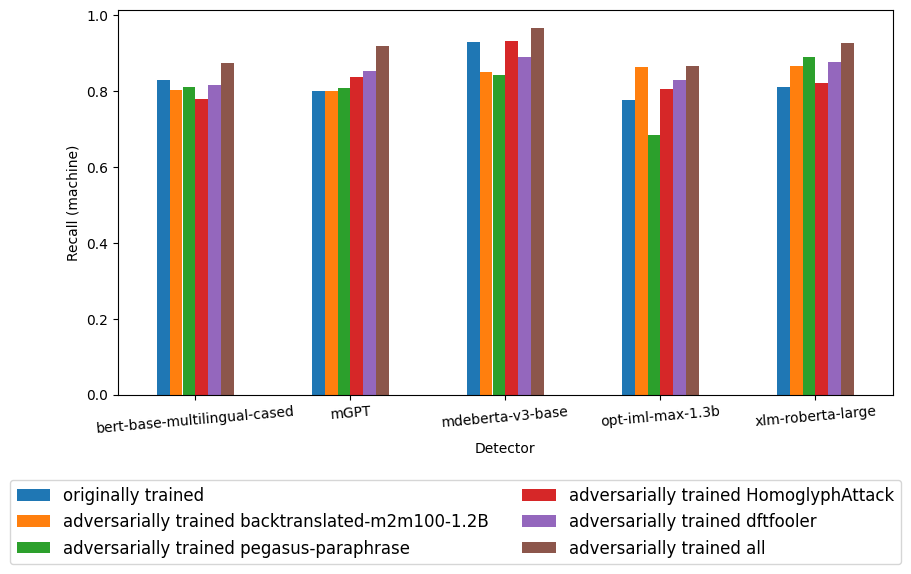

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(cr[model]['machine']['recall'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + x.split('-finetuned-all-all.')[-1] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,5], rot=5)
chart.legend(loc='upper left', bbox_to_anchor=(-0.15, -0.2), ncol=2, fontsize=12)
chart.set_ylabel('Recall (machine)')

CPU times: user 162 ms, sys: 19.6 ms, total: 182 ms
Wall time: 560 ms


Text(0, 0.5, 'Macro avg. F1-score')

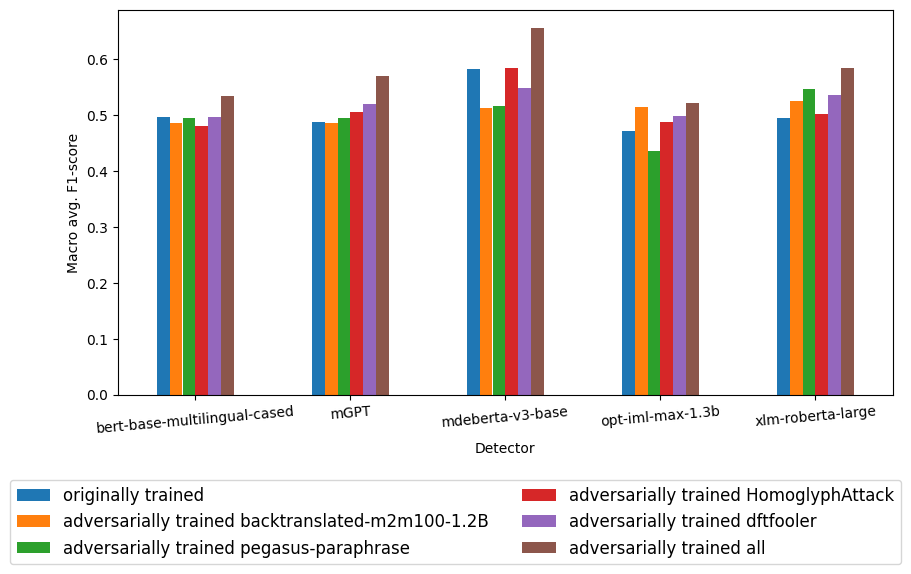

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(cr[model]['macro avg']['f1-score'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + x.split('-finetuned-all-all.')[-1] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,5], rot=5)
chart.legend(loc='upper left', bbox_to_anchor=(-0.15, -0.2), ncol=2, fontsize=12)
chart.set_ylabel('Macro avg. F1-score')

CPU times: user 123 ms, sys: 11 ms, total: 134 ms
Wall time: 127 ms


(0.8, 1.0)

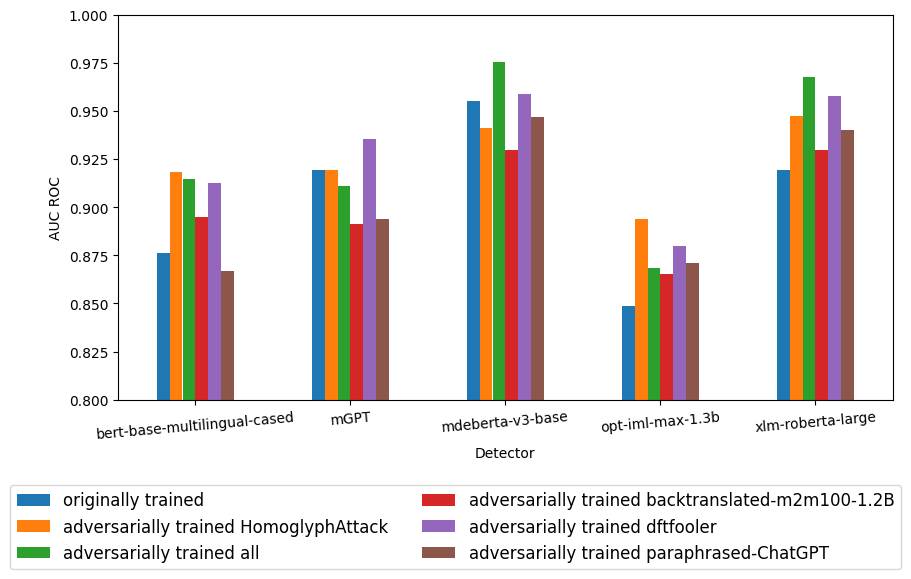

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(auc_dict[model]['auc'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + x.split('-finetuned-all-all.')[-1] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,5], rot=5)
chart.legend(loc='upper left', bbox_to_anchor=(-0.15, -0.2), ncol=2, fontsize=12)
chart.set_ylabel('AUC ROC')
chart.set_ylim(0.8, 1.0)

In [ ]:
at_detectors_order = {'originally trained': 1,
                      'adversarially trained m2m100-1.2B': 2,
                      'adversarially trained Pegasus-paraphrase': 3,
                      'adversarially trained ChatGPT': 3,
                      'adversarially trained HomoglyphAttack': 4,
                      'adversarially trained DFTFooler': 5,
                      'adversarially trained all': 6}

CPU times: user 124 ms, sys: 32.2 ms, total: 156 ms
Wall time: 179 ms


(0.8, 1.0)

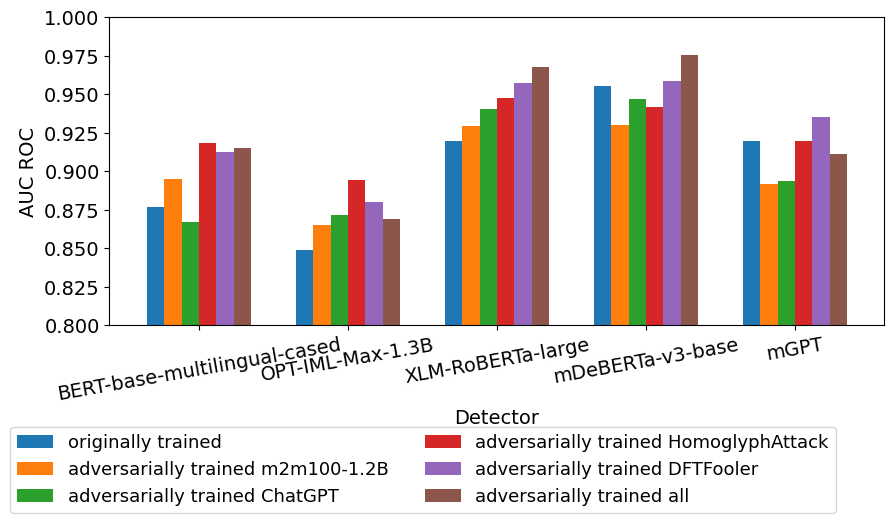

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(auc_dict[model]['auc'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + rename_obfuscators[x.split('-finetuned-all-all.')[-1]] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
temp['Detector'] = [x.replace('xlm', 'XLM').replace('roberta', 'RoBERTa').replace('mdeberta', 'mDeBERTa').replace('bert', 'BERT').replace('opt-iml-max-1.3b', 'OPT-IML-Max-1.3B') for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,4], rot=10, fontsize=14, width=0.7)
chart.legend(loc='upper left', bbox_to_anchor=(-0.14, -0.3), ncol=2, fontsize=13)
chart.set_ylabel('AUC ROC', fontsize=14)
chart.set_xlabel('Detector', fontsize=14)
chart.set_ylim(0.8, 1.0)

100%|██████████| 30/30 [00:16<00:00,  1.80it/s]


CPU times: user 17 s, sys: 305 ms, total: 17.3 s
Wall time: 17.1 s


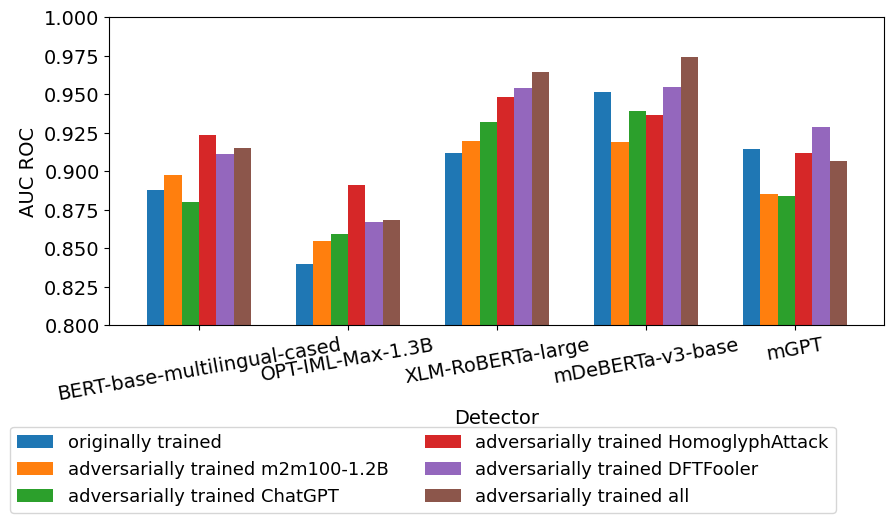

In [ ]:
#revision - test data without pegasus and dipper
%%time
auc_dict_qualityAO = {}
for model in tqdm(temp_models, total=len(temp_models)):
  temp = adversarial_detectors[model].copy()
  #temp = temp[temp.multi_label.str.contains('|'.join(selected_generators + ['human']))].reset_index(drop=True) #using only data of selected generators
  temp = temp[~temp.multi_label.str.contains('pegasus') & ~temp.multi_label.str.contains('dipper')].reset_index(drop=True) #remove obfuscators not passing the quality evaluation
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict_qualityAO[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

metric = []
for model in temp_models:
  metric.append(auc_dict_qualityAO[model]['auc'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + rename_obfuscators[x.split('-finetuned-all-all.')[-1]] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
temp['Detector'] = [x.replace('xlm', 'XLM').replace('roberta', 'RoBERTa').replace('mdeberta', 'mDeBERTa').replace('bert', 'BERT').replace('opt-iml-max-1.3b', 'OPT-IML-Max-1.3B') for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,4], rot=10, fontsize=14, width=0.7)
chart.legend(loc='upper left', bbox_to_anchor=(-0.14, -0.3), ncol=2, fontsize=13)
chart.set_ylabel('AUC ROC', fontsize=14)
chart.set_xlabel('Detector', fontsize=14)
chart.set_ylim(0.8, 1.0)
chart.get_figure().savefig('at.pdf', bbox_inches="tight")

In [ ]:
bg_cmap = 'RdYlGn'
bg_vmin = -0.7
bg_vmax = 0.7
bg_text_color_threshold = 0.15

In [ ]:
%%time
results_all = pd.DataFrame()
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
    temp = analyze_language_adversarial(adversarial_test_results, test_language)
    temp = temp[['Model', 'Obfuscator', 'Train Language', 'Train LLM', 'AUC ROC']]
    temp = temp.set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
    temp.rename(columns={'AUC ROC': test_language}, inplace=True)
    if len(results_all) > 0: temp = temp[test_language]
    results_all = pd.concat([results_all, temp], copy=False, axis=1)

100%|██████████| 330/330 [00:17<00:00, 19.13it/s]

CPU times: user 2min 27s, sys: 932 ms, total: 2min 27s
Wall time: 3min 10s


In [ ]:
if (os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_at_results_revision.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_at_results_revision.pkl'), 'rb') as fp:
    results_all = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_at_results_revision.pkl'), 'wb') as fp:
    pickle.dump(results_all, fp)

In [ ]:
if (os.path.isfile(RESULTS_FILE.replace('results.pkl', 'results_at_results.pkl'))):
  with open(RESULTS_FILE.replace('results.pkl', 'results_at_results.pkl'), 'rb') as fp:
    results_all = pickle.load(fp)
else:
  with open(RESULTS_FILE.replace('results.pkl', 'results_at_results.pkl'), 'wb') as fp:
    pickle.dump(results_all, fp)

In [ ]:
#AUC ROC drop of originally finetuned detectors
filter = results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
recall_orig = temp
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

#display(results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().loc[['original'] + obfuscators_order,:])

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,1.29%,-5.62%,-3.79%,-5.24%,-1.46%,-1.26%,-5.77%,-3.40%,-3.43%,-3.46%,-3.26%,-3.22%
backtranslated-nllb-200-distilled-1.3B,-0.72%,-6.07%,-5.85%,-3.83%,-1.20%,-0.95%,-4.57%,-2.61%,-3.06%,-3.35%,-4.56%,-3.34%
paraphrased-ChatGPT,-0.59%,-1.78%,-3.39%,-2.10%,1.03%,0.43%,-2.37%,0.07%,-1.19%,-1.41%,-2.87%,-1.29%
gptzzzs,-0.25%,-1.05%,-0.37%,-0.54%,-1.72%,-0.55%,-1.00%,-1.08%,-0.02%,-0.01%,-0.54%,-0.65%
gptzerobypasser,-17.72%,-9.91%,-5.28%,-14.29%,-5.15%,-7.28%,-12.52%,-12.04%,-10.12%,-10.55%,-4.77%,-9.96%
HomoglyphAttack,-9.51%,-10.32%,-4.21%,-17.30%,-2.90%,-6.28%,-13.46%,-11.85%,-7.42%,-7.01%,-2.78%,-8.46%
alison,-0.89%,-0.76%,-0.19%,-0.85%,-0.39%,-0.32%,-0.67%,-0.50%,-0.19%,-0.34%,-0.13%,-0.48%
dftfooler,-0.12%,-2.90%,-1.37%,-7.95%,-0.54%,-1.18%,-6.09%,-2.80%,-0.17%,-0.03%,-0.33%,-2.13%
Obfuscator Average,-3.56%,-4.80%,-3.06%,-6.51%,-1.54%,-2.17%,-5.81%,-4.28%,-3.20%,-3.27%,-2.40%,0


In [ ]:
#T-test for difference original vs obfuscated (AUC drop, originally finetuned)
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
#temp = temp[temp['Category'] == 'Statistical'].reset_index(drop=True)
temp = temp[temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original')][lang], temp[(temp['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

df = temp

temp_mean = df[df['Obfuscator'] != 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean(numeric_only=True).groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp_mean = temp_mean - temp_base
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

temp_base_df = temp_mean.copy()
for idx in temp_base_df.index:
  temp_base_df.loc[idx, :] = temp_base

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base_df[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).apply(lambda x: ["color: black; background-color: white" if ("n.s." in str(v)) else "" for v in x])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.616932,4,two-sided,0.022418,[0. 0.03],2.160600,3.939,0.942850


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.533055,4,two-sided,0.200036,[-0.04 0.14],0.742398,0.85,0.249627


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.141578,4,two-sided,0.098912,[-0.02 0.13],1.455250,1.372,0.685998


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.105594,4,two-sided,0.103001,[-0. 0.03],1.592542,1.334,0.758468


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.984530,4,two-sided,0.016339,[0.01 0.06],2.641487,4.945,0.989328


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.437044,4,two-sided,0.224069,[-0.05 0.16],1.183179,0.79,0.519392


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.798738,4,two-sided,0.469180,[-0.09 0.16],0.569917,0.509,0.167849


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.723752,4,two-sided,0.159847,[-0.02 0.09],1.120692,0.987,0.478983


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.791036,4,two-sided,0.473184,[-0.08 0.15],0.526060,0.507,0.150291


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.184586,4,two-sided,0.862534,[-0.18 0.16],0.090668,0.403,0.052922


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.284418,4,two-sided,0.790207,[-0.24 0.3 ],0.184675,0.411,0.062159


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.668655,4,two-sided,0.001554,[0.01 0.02],2.064636,27.259,0.924053


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.980461,4,two-sided,0.040720,[0. 0.07],0.594864,2.568,0.178447


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.000942,4,two-sided,0.016117,[0.01 0.07],1.701715,4.994,0.808512


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.289713,4,two-sided,0.006130,[0. 0.01],1.618096,10.044,0.770814


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.822754,4,two-sided,0.002413,[0.01 0.04],2.755496,19.777,0.993262


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.977107,4,two-sided,0.040856,[0. 0.11],1.094461,2.562,0.462004


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.075301,4,two-sided,0.007104,[0.02 0.08],0.905165,9.026,0.342455


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.369393,4,two-sided,0.011974,[0.01 0.05],0.998196,6.188,0.400246


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.273991,4,two-sided,0.030674,[0. 0.06],0.518412,3.145,0.147371


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.173974,4,two-sided,0.870336,[-0.09 0.1 ],0.046689,0.402,0.050774


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.285891,4,two-sided,0.084238,[-0.01 0.09],0.266733,1.535,0.075460


Test language: en, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.565972,4,two-sided,0.005103,[0.01 0.02],1.691630,11.472,0.804187


Test language: de, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.121662,4,two-sided,0.324788,[-0.18 0.42],0.777230,0.626,0.268378


Test language: nl, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.352236,4,two-sided,0.247696,[-0.11 0.33],0.926018,0.74,0.355178


Test language: es, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.226895,4,two-sided,0.287138,[-0.07 0.18],0.800072,0.675,0.281032


Test language: pt, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.649857,4,two-sided,0.174317,[-0.09 0.37],1.062119,0.931,0.441125


Test language: ca, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.120300,4,two-sided,0.325304,[-0.16 0.37],0.795727,0.625,0.278604


Test language: cs, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.529547,4,two-sided,0.624453,[-0.21 0.31],0.397598,0.445,0.106966


Test language: ru, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.852168,4,two-sided,0.442137,[-0.06 0.03],0.658969,0.525,0.207644


Test language: uk, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.426675,4,two-sided,0.226833,[-0.12 0.04],1.040035,0.783,0.426929


Test language: ar, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.374997,4,two-sided,0.241123,[-0.29 0.1 ],0.942382,0.753,0.365264


Test language: zh, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.576845,4,two-sided,0.594952,[-0.31 0.21],0.429225,0.454,0.116496


Test language: en, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.870347,4,two-sided,0.433226,[-0.01 0.02],0.722726,0.531,0.239344


Test language: de, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.053730,4,two-sided,0.959727,[-0.11 0.12],0.041588,0.398,0.050614


Test language: nl, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.737201,4,two-sided,0.501904,[-0.04 0.07],0.493651,0.492,0.138211


Test language: es, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.272326,4,two-sided,0.798851,[-0.02 0.01],0.168337,0.41,0.060096


Test language: pt, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.451250,4,two-sided,0.675192,[-0.03 0.04],0.317001,0.432,0.086056


Test language: ca, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.067994,4,two-sided,0.345692,[-0.06 0.02],0.448665,0.603,0.122724


Test language: cs, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.275596,4,two-sided,0.796510,[-0.12 0.1 ],0.155721,0.41,0.058636


Test language: ru, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.011002,4,two-sided,0.991749,[-0.03 0.03],0.006428,0.397,0.050015


Test language: uk, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.878861,4,two-sided,0.429103,[-0.09 0.05],0.584185,0.534,0.173857


Test language: ar, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.162069,4,two-sided,0.879109,[-0.25 0.22],0.112377,0.402,0.054491


Test language: zh, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.063384,4,two-sided,0.952502,[-0.22 0.21],0.042294,0.398,0.050635


Test language: en, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.787501,4,two-sided,0.019310,[-0.02 -0. ],2.534121,4.385,0.983898


Test language: de, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.696315,4,two-sided,0.524573,[-0.06 0.1 ],0.347051,0.481,0.093286


Test language: nl, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.964611,4,two-sided,0.120914,[-0.01 0.05],0.914247,1.194,0.347977


Test language: es, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.995202,4,two-sided,0.375966,[-0.02 0.01],0.680146,0.575,0.217889


Test language: pt, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.082286,4,two-sided,0.938373,[-0.02 0.02],0.058515,0.399,0.051216


Test language: ca, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.181404,4,two-sided,0.302884,[-0.02 0.06],0.470673,0.653,0.130113


Test language: cs, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.945946,4,two-sided,0.397739,[-0.06 0.12],0.560738,0.557,0.164060


Test language: ru, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.674721,4,two-sided,0.536842,[-0.04 0.06],0.459444,0.476,0.126298


Test language: uk, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.369712,4,two-sided,0.730339,[-0.09 0.11],0.243720,0.421,0.071232


Test language: ar, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.079491,4,two-sided,0.940460,[-0.17 0.18],0.036339,0.398,0.050469


Test language: zh, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.225154,4,two-sided,0.832894,[-0.28 0.33],0.143781,0.406,0.057359


Test language: en, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.048177,4,two-sided,0.109918,[-0.01 0.04],1.487144,1.275,0.703707


Test language: de, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.174384,4,two-sided,0.870034,[-0.07 0.08],0.096727,0.403,0.053326


Test language: nl, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.143513,4,two-sided,0.316612,[-0.01 0.03],0.417108,0.636,0.112757


Test language: es, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.111958,4,two-sided,0.328481,[-0.01 0.02],0.619618,0.622,0.189391


Test language: pt, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.077547,4,two-sided,0.341885,[-0.02 0.04],0.699914,0.607,0.227710


Test language: ca, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.516255,4,two-sided,0.632903,[-0.04 0.06],0.283703,0.443,0.078828


Test language: cs, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.135824,4,two-sided,0.898521,[-0.07 0.07],0.070022,0.4,0.051742


Test language: ru, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.012827,4,two-sided,0.990380,[-0.04 0.04],0.008306,0.397,0.050024


Test language: uk, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.003150,4,two-sided,0.997638,[-0.09 0.09],0.002021,0.397,0.050001


Test language: ar, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.029628,4,two-sided,0.977783,[-0.2 0.2],0.016198,0.398,0.050093


Test language: zh, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.046088,4,two-sided,0.965449,[-0.27 0.28],0.030189,0.398,0.050324


Test language: en, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.550269,4,two-sided,0.196012,[-0.04 0.14],0.934179,0.862,0.360197


Test language: de, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.627220,4,two-sided,0.058356,[-0.01 0.27],1.425613,1.988,0.669111


Test language: nl, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.446693,4,two-sided,0.070697,[-0.02 0.25],1.430447,1.736,0.671892


Test language: es, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.005314,4,two-sided,0.115414,[-0.03 0.17],1.204249,1.233,0.532952


Test language: pt, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.107229,4,two-sided,0.102811,[-0.04 0.27],1.250762,1.336,0.562655


Test language: ca, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.578223,4,two-sided,0.189655,[-0.07 0.26],0.859917,0.881,0.315415


Test language: cs, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.164418,4,two-sided,0.308968,[-0.07 0.17],0.657342,0.645,0.206869


Test language: ru, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.029209,4,two-sided,0.015744,[0.03 0.17],2.251284,5.08,0.956985


Test language: uk, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.012672,4,two-sided,0.015961,[0.03 0.17],1.542185,5.03,0.733055


Test language: ar, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.561904,4,two-sided,0.010324,[0.06 0.24],0.935640,6.888,0.361098


Test language: zh, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.012063,4,two-sided,0.114529,[-0.02 0.1 ],0.250662,1.239,0.072467


Test language: en, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.201946,4,two-sided,0.092452,[-0.01 0.06],1.612611,1.438,0.768196


Test language: de, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.408482,4,two-sided,0.073676,[-0.02 0.34],1.653344,1.686,0.787214


Test language: nl, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.283122,4,two-sided,0.012816,[0.05 0.21],2.635978,5.892,0.989095


Test language: es, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.188977,4,two-sided,0.013818,[0.02 0.1 ],2.755903,5.581,0.993273


Test language: pt, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.970366,4,two-sided,0.007649,[0.05 0.18],3.343522,8.556,0.999568


Test language: ca, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.971626,4,two-sided,0.041078,[0.01 0.19],1.545446,2.552,0.734743


Test language: cs, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.839269,4,two-sided,0.448549,[-0.09 0.17],0.562320,0.521,0.164709


Test language: ru, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.567742,4,two-sided,0.062127,[-0.01 0.15],1.697633,1.902,0.806769


Test language: uk, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.438112,4,two-sided,0.223786,[-0.06 0.2 ],0.936923,0.79,0.361890


Test language: ar, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.663179,4,two-sided,0.543482,[-0.26 0.42],0.417095,0.473,0.112753


Test language: zh, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.198295,4,two-sided,0.852484,[-0.31 0.36],0.140504,0.404,0.057027


Test language: en, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.943028,4,two-sided,0.399062,[-0.01 0.02],0.736432,0.555,0.246484


Test language: de, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.260146,4,two-sided,0.807593,[-0.08 0.09],0.157265,0.409,0.058808


Test language: nl, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.504466,4,two-sided,0.640455,[-0.03 0.04],0.289738,0.441,0.080077


Test language: es, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.036553,4,two-sided,0.358493,[-0.01 0.01],0.514972,0.591,0.146072


Test language: pt, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.720047,4,two-sided,0.511326,[-0.01 0.02],0.454330,0.487,0.124591


Test language: ca, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.403521,4,two-sided,0.707205,[-0.04 0.06],0.219662,0.425,0.067228


Test language: cs, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.071575,4,two-sided,0.946376,[-0.07 0.07],0.037136,0.398,0.050490


Test language: ru, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.145601,4,two-sided,0.891279,[-0.03 0.04],0.087007,0.401,0.052691


Test language: uk, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.105340,4,two-sided,0.921177,[-0.08 0.09],0.065613,0.399,0.051530


Test language: ar, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.083910,4,two-sided,0.937160,[-0.24 0.26],0.058295,0.399,0.051207


Test language: zh, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.010316,4,two-sided,0.992263,[-0.29 0.29],0.007097,0.397,0.050018


Test language: en, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.217343,4,two-sided,0.090880,[-0. 0.01],0.775247,1.455,0.267292


Test language: de, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.535298,4,two-sided,0.024115,[0.02 0.13],1.006769,3.738,0.405687


Test language: nl, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.838476,4,two-sided,0.046940,[0. 0.11],1.494962,2.321,0.707971


Test language: es, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.940131,4,two-sided,0.124359,[-0. 0.03],0.946095,1.171,0.367565


Test language: pt, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.334962,4,two-sided,0.028971,[0. 0.05],1.451093,3.276,0.683653


Test language: ca, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.125387,4,two-sided,0.323381,[-0.04 0.09],0.745820,0.628,0.251439


Test language: cs, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.555475,4,two-sided,0.608170,[-0.05 0.08],0.228033,0.45,0.068573


Test language: ru, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.329380,4,two-sided,0.758394,[-0.01 0.02],0.072217,0.416,0.051853


Test language: uk, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.037704,4,two-sided,0.971730,[-0.02 0.02],0.006576,0.398,0.050015


Test language: ar, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.106606,4,two-sided,0.920234,[-0.03 0.03],0.008013,0.399,0.050023


Test language: zh, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.370636,4,two-sided,0.729702,[-0.02 0.02],0.018131,0.421,0.050117


<ipython-input-158-0f579b101bb5>:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
<ipython-input-158-0f579b101bb5>:44: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-158-

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,1.29% (n.s.),-5.62% (n.s.),-3.79% (n.s.),-5.24% (n.s.),-1.46% (±1.52%),-1.26% (n.s.),-5.77% (n.s.),-3.40% (±2.59%),-3.43% (n.s.),-3.46% (n.s.),-3.26% (n.s.),-3.22%
nllb-200-distilled-1.3B,-0.72% (n.s.),-6.07% (±5.83%),-5.85% (±3.23%),-3.83% (±3.81%),-1.20% (±0.51%),-0.95% (±0.51%),-4.57% (±3.15%),-2.61% (±1.56%),-3.06% (±2.06%),-3.35% (±3.15%),-4.56% (n.s.),-3.34%
Pegasus-paraphrase,11.09% (n.s.),-11.28% (n.s.),-5.38% (n.s.),-13.16% (n.s.),-1.18% (±0.51%),-5.63% (n.s.),-11.23% (n.s.),-14.19% (n.s.),1.42% (n.s.),4.11% (n.s.),6.32% (n.s.),-3.56%
DIPPER,1.59% (n.s.),1.64% (n.s.),1.14% (n.s.),-0.24% (n.s.),-0.54% (n.s.),0.16% (n.s.),-1.60% (n.s.),-0.61% (n.s.),-0.01% (n.s.),2.40% (n.s.),0.58% (n.s.),0.41%
ChatGPT,-0.59% (n.s.),-1.78% (n.s.),-3.39% (n.s.),-2.10% (n.s.),1.03% (±1.02%),0.43% (n.s.),-2.37% (n.s.),0.07% (n.s.),-1.19% (n.s.),-1.41% (n.s.),-2.87% (n.s.),-1.29%
GPTZzzs,-0.25% (n.s.),-1.05% (n.s.),-0.37% (n.s.),-0.54% (n.s.),-1.72% (n.s.),-0.55% (n.s.),-1.00% (n.s.),-1.08% (n.s.),-0.02% (n.s.),-0.01% (n.s.),-0.54% (n.s.),-0.65%
GPTZeroBypasser,-17.72% (±10.52%),-9.91% (n.s.),-5.28% (n.s.),-14.29% (n.s.),-5.15% (n.s.),-7.28% (n.s.),-12.52% (n.s.),-12.04% (n.s.),-10.12% (±7.19%),-10.55% (±7.36%),-4.77% (n.s.),-9.96%
HomoglyphAttack,-9.51% (n.s.),-10.32% (±9.54%),-4.21% (n.s.),-17.30% (n.s.),-2.90% (n.s.),-6.28% (±4.07%),-13.46% (±8.41%),-11.85% (±6.74%),-7.42% (n.s.),-7.01% (n.s.),-2.78% (n.s.),-8.46%
ALISON,-0.89% (n.s.),-0.76% (n.s.),-0.19% (n.s.),-0.85% (n.s.),-0.39% (n.s.),-0.32% (n.s.),-0.67% (n.s.),-0.50% (n.s.),-0.19% (n.s.),-0.34% (n.s.),-0.13% (n.s.),-0.48%
DFTFooler,-0.12% (n.s.),-2.90% (n.s.),-1.37% (n.s.),-7.95% (±5.99%),-0.54% (n.s.),-1.18% (n.s.),-6.09% (±5.78%),-2.80% (±2.59%),-0.17% (n.s.),-0.03% (n.s.),-0.33% (n.s.),-2.13%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} 1.29\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -5.62\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -3.79\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -5.24\% (n.s.)} & {\cellcolor[HTML]{FFFCBA}} \textcolor{black}{-1.46\% (±1.52\%)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -1.26\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -5.77\% (n.s.)} & {\cellcolor[HTML]{FFF7B2}} \textcolor{black}{-3.40\% (±2.59\%)} & {\cellcolor[HTML]{0068

In [ ]:
#T-test for all combinations of obfuscators (originally finetuned detectors)
temp = results_all.reset_index()
temp = temp[temp['Train LLM'].str.contains('-balanced')]
res_df = pd.DataFrame()
for (src, trg) in itertools.combinations_with_replacement(['original'] + obfuscators_order, 2):
  for lang in sorted_languages:
   if src == trg: continue
   print(f"Test language: {lang}, ({trg}, {src})")
   res = stats.ttest_rel(temp[temp["Obfuscator"] == trg][lang], temp[temp["Obfuscator"] == src][lang])
   if (res.pvalue >= 0.05):
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0])
     print(stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0])
     print(res)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':trg, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == trg][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':src, '0.95 Confidence Intrval Min':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[0], '0.95 Confidence Intrval Max':stats.bayes_mvs(temp[temp["Obfuscator"] == src][lang], alpha=0.95)[0].minmax[1]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)
temp_mean = temp[temp['Obfuscator'] != 'original'].groupby('Obfuscator').mean(numeric_only=True).loc[obfuscators_order,:] - temp[temp['Obfuscator'] == 'original'].groupby('Obfuscator').mean(numeric_only=True).values
temp_mean = temp_mean / temp[temp['Obfuscator'] == 'original'].groupby('Obfuscator').mean(numeric_only=True).values

#ToDO - CI is for mean per obfuscator, not for differences to original
res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).sort_values(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1'])
temp_mean_bak = temp_mean.copy()
#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.4f' % x)} (±{str('%.2f' % y)})" for x,y in zip(temp_mean[col], temp_ci[col])]

temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)
temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
print(s[:s.rfind('\hline')])
print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, (backtranslated-m2m100-1.2B, original)
Test language: de, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.8695146803748376, minmax=(0.7735275137093609, 0.9655018470403143))
Mean(statistic=0.9175577741014032, minmax=(0.8567346756442294, 0.9783808725585769))
TtestResult(statistic=-1.5330549735619754, pvalue=0.20003573004715547, df=4)
Test language: nl, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.8965518059642325, minmax=(0.8349516808078441, 0.9581519311206208))
Mean(statistic=0.9514949665272668, minmax=(0.9269849517689382, 0.9760049812855954))
TtestResult(statistic=-2.14157836028807, pvalue=0.09891229753202795, df=4)
Test language: es, (backtranslated-m2m100-1.2B, original)
Mean(statistic=0.969893188562815, minmax=(0.9577281711650636, 0.9820582059605665))
Mean(statistic=0.9822274365255076, minmax=(0.9761468031690705, 0.9883080698819446))
TtestResult(statistic=-2.105594270832331, pvalue=0.10300098385343011, df=4)
Test language: pt, (backtranslated-m2

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,0.0129 (±0.30),-0.0562 (±0.10),-0.0379 (±0.11),-0.0524 (±0.16),-0.0146 (±0.03),-0.0126 (±0.04),-0.0577 (±0.08),-0.0340 (±0.06),-0.0343 (±0.07),-0.0346 (±0.11),-0.0326 (±0.23),-0.0322
nllb-200-distilled-1.3B,-0.0072 (±0.16),-0.0607 (±0.04),-0.0585 (±0.06),-0.0383 (±0.06),-0.0120 (±0.01),-0.0095 (±0.01),-0.0457 (±0.03),-0.0261 (±0.02),-0.0306 (±0.03),-0.0335 (±0.06),-0.0456 (±0.19),-0.0334
Pegasus-paraphrase,0.1109 (±0.14),-0.1128 (±0.07),-0.0538 (±0.09),-0.1316 (±0.10),-0.0118 (±0.01),-0.0563 (±0.01),-0.1123 (±0.06),-0.1419 (±0.02),0.0142 (±0.04),0.0411 (±0.09),0.0632 (±0.19),-0.0356
DIPPER,0.0159 (±0.17),0.0164 (±0.08),0.0114 (±0.09),-0.0024 (±0.08),-0.0054 (±0.01),0.0016 (±0.01),-0.0160 (±0.04),-0.0061 (±0.01),-0.0001 (±0.04),0.0240 (±0.09),0.0058 (±0.18),0.0041
ChatGPT,-0.0059 (±0.17),-0.0178 (±0.05),-0.0339 (±0.08),-0.0210 (±0.11),0.0103 (±0.01),0.0043 (±0.02),-0.0237 (±0.06),0.0007 (±0.03),-0.0119 (±0.03),-0.0141 (±0.06),-0.0287 (±0.19),-0.0129
GPTZzzs,-0.0025 (±0.14),-0.0105 (±0.05),-0.0037 (±0.10),-0.0054 (±0.07),-0.0172 (±0.01),-0.0055 (±0.02),-0.0100 (±0.05),-0.0108 (±0.03),-0.0002 (±0.03),-0.0001 (±0.03),-0.0054 (±0.09),-0.0065
GPTZeroBypasser,-0.1772 (±0.23),-0.0991 (±0.19),-0.0528 (±0.12),-0.1429 (±0.15),-0.0515 (±0.10),-0.0728 (±0.10),-0.1252 (±0.14),-0.1204 (±0.16),-0.1012 (±0.07),-0.1055 (±0.10),-0.0477 (±0.21),-0.0996
HomoglyphAttack,-0.0951 (±0.17),-0.1032 (±0.05),-0.0421 (±0.06),-0.1730 (±0.07),-0.0290 (±0.02),-0.0628 (±0.01),-0.1346 (±0.03),-0.1185 (±0.02),-0.0742 (±0.03),-0.0701 (±0.06),-0.0278 (±0.19),-0.0846
ALISON,-0.0089 (±0.16),-0.0076 (±0.04),-0.0019 (±0.06),-0.0085 (±0.06),-0.0039 (±0.01),-0.0032 (±0.01),-0.0067 (±0.02),-0.0050 (±0.01),-0.0019 (±0.03),-0.0034 (±0.06),-0.0013 (±0.19),-0.0048
DFTFooler,-0.0012 (±0.18),-0.0290 (±0.05),-0.0137 (±0.08),-0.0795 (±0.08),-0.0054 (±0.00),-0.0118 (±0.01),-0.0609 (±0.04),-0.0280 (±0.02),-0.0017 (±0.03),-0.0003 (±0.07),-0.0033 (±0.23),-0.0213


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FBFDBA}} \textcolor{black}{0.0129 (±0.30)} & {\cellcolor[HTML]{FFF2AA}} \textcolor{black}{-0.0562 (±0.10)} & {\cellcolor[HTML]{FFF7B2}} \textcolor{black}{-0.0379 (±0.11)} & {\cellcolor[HTML]{FFF3AC}} \textcolor{black}{-0.0524 (±0.16)} & {\cellcolor[HTML]{FFFCBA}} \textcolor{black}{-0.0146 (±0.03)} & {\cellcolor[HTML]{FFFCBA}} \textcolor{black}{-0.0126 (±0.04)} & {\cellcolor[HTML]{FFF2AA}} \textcolor{black}{-0.0577 (±0.08)} & {\cellcolor[HTML]{FFF7B2}} \textcolor{black}{-0.0340 (±0.06)} & {\cellcolor[HTML]{FFF7B2}} \textcolor{black}{-0.0343 (±0.07)} & {\cellcolor[HTML]{FFF7B2}} \textcolor{black}{-0.0346 (±0.11)} & {\cellcolor[HTML]{FFF8B4}} \textcolor{black}{-0.0326 (±0.23)} & {\cellcolor[HTML]{FFF8B4}} \text

In [ ]:
#AUC ROC drop of adversarially finetuned detectors
filter = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[obfuscators_order,:] - results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp = temp / results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
recall_adv = temp
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

#display(results_all.reset_index()[filter].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().loc[['original'] + obfuscators_order,:])

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
backtranslated-m2m100-1.2B,0.38%,-4.08%,-1.82%,-3.69%,-0.36%,-0.76%,-3.59%,-1.99%,-2.70%,-2.50%,-4.21%,-2.30%
backtranslated-nllb-200-distilled-1.3B,0.57%,-4.23%,-2.63%,-3.10%,-0.30%,-0.47%,-3.64%,-1.68%,-1.70%,-1.56%,-5.99%,-2.25%
paraphrased-ChatGPT,1.29%,-0.76%,-1.27%,-0.81%,1.55%,0.83%,-0.96%,0.92%,-0.01%,0.18%,-2.58%,-0.15%
gptzzzs,-0.08%,-0.27%,-0.14%,-0.21%,-0.69%,-0.02%,-0.61%,-0.10%,-0.01%,-0.01%,-0.23%,-0.22%
gptzerobypasser,-6.78%,-1.82%,3.29%,-2.12%,-0.37%,-1.50%,-3.07%,-3.61%,-3.68%,-2.10%,-0.14%,-1.99%
HomoglyphAttack,0.51%,-3.66%,2.24%,-3.42%,-0.26%,-2.54%,-5.38%,-5.00%,-2.15%,0.02%,1.27%,-1.67%
alison,-0.26%,-0.13%,-0.06%,-0.26%,-0.22%,-0.23%,-0.20%,-0.20%,0.20%,0.33%,0.53%,-0.04%
dftfooler,0.03%,0.87%,0.54%,-2.77%,0.18%,-0.01%,-2.03%,-0.25%,0.33%,0.78%,0.02%,-0.21%
Obfuscator Average,-0.54%,-1.76%,0.02%,-2.05%,-0.06%,-0.59%,-2.43%,-1.49%,-1.22%,-0.61%,-1.42%,0


In [ ]:
#T-test for difference original vs obfuscated (AUC drop, adversarially finetuned)
temp = results_all.reset_index()
temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
#temp = temp[temp['Category'] == 'Statistical'].reset_index(drop=True)
temp = temp[~temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (original vs. obfuscated)")
   res = pg.ttest(temp[(temp['Obfuscator'] == 'original')][lang], temp[(temp['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

df = temp

temp_mean = df[df['Obfuscator'] != 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean(numeric_only=True).groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
temp_mean = temp_mean - temp_base
temp_mean = temp_mean / temp_base

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

temp_base_df = temp_mean.copy()
for idx in temp_base_df.index:
  temp_base_df.loc[idx, :] = temp_base

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y/z*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y,z in zip(temp_mean[col], temp_ci[col], temp_base_df[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).apply(lambda x: ["color: black; background-color: white" if ("n.s." in str(v)) else "" for v in x])
display(temp)
templ = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = templ.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.694044,24,two-sided,0.494318,[-0. 0.01],0.201342,0.262,0.162033


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.980757,24,two-sided,0.059191,[-0. 0.06],0.595755,1.122,0.815351


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.981118,24,two-sided,0.006490,[0.01 0.05],0.851067,6.889,0.982983


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.798789,24,two-sided,0.009957,[0. 0.01],0.745498,4.797,0.946805


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.912688,24,two-sided,0.000657,[0.01 0.03],1.146307,50.262,0.999793


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.167998,24,two-sided,0.004150,[0.01 0.07],0.909506,10.093,0.991782


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.423363,24,two-sided,0.167502,[-0.01 0.05],0.409099,0.516,0.501408


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.265529,24,two-sided,0.032784,[0. 0.05],0.683132,1.795,0.905938


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.194573,24,two-sided,0.243927,[-0.02 0.08],0.367247,0.399,0.421917


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.046374,24,two-sided,0.963396,[-0.08 0.08],0.014976,0.211,0.050593


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.804234,24,two-sided,0.429157,[-0.05 0.11],0.232776,0.283,0.200857


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.283960,24,two-sided,0.211414,[-0. 0.01],0.306728,0.439,0.313257


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.845120,24,two-sided,0.077396,[-0. 0.06],0.569945,0.912,0.780586


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.465204,24,two-sided,0.002008,[0.01 0.05],1.021796,18.891,0.998337


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.309746,24,two-sided,0.029818,[0. 0.01],0.659720,1.938,0.885718


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.737346,24,two-sided,0.000081,[0.01 0.02],1.225006,324.851,0.999953


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.401667,24,two-sided,0.002348,[0.02 0.07],1.005310,16.492,0.997862


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.339021,24,two-sided,0.027990,[0. 0.06],0.593675,2.039,0.812684


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.995656,24,two-sided,0.057441,[-0. 0.04],0.639639,1.149,0.866053


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.102132,24,two-sided,0.281334,[-0.02 0.07],0.341223,0.363,0.373872


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.121852,24,two-sided,0.904031,[-0.07 0.08],0.036813,0.212,0.053589


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.009551,24,two-sided,0.322781,[-0.04 0.12],0.305048,0.334,0.310417


Test language: en, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.713452,24,two-sided,0.482447,[-0.01 0. ],0.208698,0.266,0.170600


Test language: de, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.089570,24,two-sided,0.929372,[-0.05 0.04],0.022847,0.212,0.051381


Test language: nl, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.292783,24,two-sided,0.772204,[-0.02 0.03],0.075184,0.219,0.065068


Test language: es, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.256679,24,two-sided,0.799614,[-0.01 0.02],0.071159,0.217,0.063486


Test language: pt, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.318870,24,two-sided,0.199659,[-0.01 0.06],0.368806,0.456,0.424842


Test language: ca, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.148682,24,two-sided,0.883047,[-0.03 0.03],0.037581,0.213,0.053741


Test language: cs, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.505757,24,two-sided,0.019404,[-0.07 -0.01],0.666594,2.752,0.891952


Test language: ru, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.924956,24,two-sided,0.000004,[-0.04 -0.02],1.577803,4885.738,1.000000


Test language: uk, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.067089,24,two-sided,0.000035,[-0.08 -0.03],1.403675,691.277,0.999999


Test language: ar, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.106186,24,two-sided,0.000403,[-0.16 -0.05],1.210138,77.463,0.999937


Test language: zh, Obfuscator: pegasus-paraphrase, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.596528,24,two-sided,0.001450,[-0.16 -0.04],1.056473,25.081,0.999037


Test language: en, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.023994,24,two-sided,0.316049,[-0.01 0. ],0.308178,0.338,0.315718


Test language: de, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.574789,24,two-sided,0.016624,[-0.06 -0.01],0.700628,3.127,0.919227


Test language: nl, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.441777,24,two-sided,0.000172,[-0.03 -0.01],0.984028,165.487,0.997068


Test language: es, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.617543,24,two-sided,0.000000,[-0.02 -0.01],2.071778,1.986e+05,1.000000


Test language: pt, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-6.865435,24,two-sided,0.000000,[-0.03 -0.01],1.430818,3.956e+04,0.999999


Test language: ca, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-7.766751,24,two-sided,0.000000,[-0.05 -0.03],1.486623,2.715e+05,1.000000


Test language: cs, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.158116,24,two-sided,0.000028,[-0.07 -0.03],1.272224,851.551,0.999982


Test language: ru, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.086418,24,two-sided,0.000423,[-0.03 -0.01],1.118707,74.1,0.999662


Test language: uk, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.314360,24,two-sided,0.000237,[-0.07 -0.03],1.176765,123.916,0.999882


Test language: ar, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.186936,24,two-sided,0.246869,[-0.09 0.02],0.338945,0.396,0.369748


Test language: zh, Obfuscator: dipper, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.988103,24,two-sided,0.332960,[-0.09 0.03],0.301733,0.327,0.304847


Test language: en, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.434468,24,two-sided,0.000000,[-0.02 -0.01],2.612055,1.068e+06,1.000000


Test language: de, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.993820,24,two-sided,0.330226,[-0.01 0.04],0.241584,0.329,0.212754


Test language: nl, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.642556,24,two-sided,0.113514,[-0. 0.03],0.509023,0.683,0.685216


Test language: es, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.795472,24,two-sided,0.010034,[-0.01 -0. ],0.781913,4.766,0.963182


Test language: pt, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.663041,24,two-sided,0.109310,[-0.01 0. ],0.439542,0.703,0.559384


Test language: ca, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.556213,24,two-sided,0.132747,[-0. 0.03],0.445057,0.609,0.569788


Test language: cs, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.444025,24,two-sided,0.161660,[-0.01 0.04],0.362923,0.529,0.413831


Test language: ru, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.575756,24,two-sided,0.570140,[-0.01 0.02],0.179590,0.245,0.138584


Test language: uk, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.289741,24,two-sided,0.774503,[-0.04 0.05],0.090135,0.219,0.071732


Test language: ar, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.110972,24,two-sided,0.912562,[-0.07 0.08],0.034224,0.212,0.053101


Test language: zh, Obfuscator: paraphrased-ChatGPT, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.762013,24,two-sided,0.453477,[-0.06 0.13],0.243215,0.274,0.215005


Test language: en, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.419278,24,two-sided,0.168676,[-0. 0.01],0.355960,0.513,0.400887


Test language: de, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.097756,24,two-sided,0.922938,[-0.02 0.02],0.024319,0.212,0.051565


Test language: nl, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.660556,24,two-sided,0.515188,[-0.01 0.02],0.182655,0.257,0.141716


Test language: es, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.305968,24,two-sided,0.762268,[-0. 0.],0.087187,0.22,0.070319


Test language: pt, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.204949,24,two-sided,0.839340,[-0.01 0.01],0.063621,0.215,0.060764


Test language: ca, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.254058,24,two-sided,0.801615,[-0.02 0.02],0.074253,0.217,0.064694


Test language: cs, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.049021,24,two-sided,0.961308,[-0.03 0.03],0.014891,0.211,0.050586


Test language: ru, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.006633,24,two-sided,0.994762,[-0.01 0.01],0.001428,0.211,0.050005


Test language: uk, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.003851,24,two-sided,0.996960,[-0.03 0.03],0.000875,0.211,0.050002


Test language: ar, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.016480,24,two-sided,0.986988,[-0.06 0.06],0.004301,0.211,0.050049


Test language: zh, Obfuscator: gptzzzs, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.018271,24,two-sided,0.985573,[-0.06 0.06],0.004246,0.211,0.050048


Test language: en, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.660223,24,two-sided,0.515398,[-0.01 0.01],0.184019,0.257,0.143129


Test language: de, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.074362,24,two-sided,0.941339,[-0.04 0.04],0.020822,0.211,0.051147


Test language: nl, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.165810,24,two-sided,0.869695,[-0.05 0.06],0.047073,0.214,0.055876


Test language: es, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.600269,24,two-sided,0.553954,[-0.01 0.02],0.166898,0.248,0.126212


Test language: pt, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.709840,24,two-sided,0.484644,[-0.02 0.05],0.202092,0.265,0.162891


Test language: ca, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.004069,24,two-sided,0.996787,[-0.05 0.05],0.001146,0.211,0.050003


Test language: cs, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.650586,24,two-sided,0.014002,[-0.06 -0.01],0.714352,3.607,0.928619


Test language: ru, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.748296,24,two-sided,0.093195,[-0. 0.05],0.513440,0.792,0.692693


Test language: uk, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.479223,24,two-sided,0.636117,[-0.03 0.05],0.140891,0.234,0.103875


Test language: ar, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.222490,24,two-sided,0.233392,[-0.04 0.14],0.362183,0.41,0.412452


Test language: zh, Obfuscator: gptzerobypasser, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.079615,24,two-sided,0.937203,[-0.07 0.08],0.021845,0.211,0.051262


Test language: en, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.467800,24,two-sided,0.155143,[-0.02 0. ],0.382101,0.544,0.449934


Test language: de, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.104981,24,two-sided,0.917264,[-0.05 0.06],0.030846,0.212,0.052518


Test language: nl, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.785792,24,two-sided,0.439679,[-0.03 0.06],0.217832,0.279,0.181682


Test language: es, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.735622,24,two-sided,0.469089,[-0.01 0.02],0.208659,0.27,0.170554


Test language: pt, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.928628,24,two-sided,0.362328,[-0.02 0.05],0.266633,0.311,0.248903


Test language: ca, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.365176,24,two-sided,0.718179,[-0.03 0.05],0.104858,0.224,0.079526


Test language: cs, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.867828,24,two-sided,0.074044,[-0.06 0. ],0.555983,0.943,0.760310


Test language: ru, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.617132,24,two-sided,0.542959,[-0.01 0.03],0.148997,0.251,0.110405


Test language: uk, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.918722,24,two-sided,0.367383,[-0.04 0.02],0.197922,0.309,0.158158


Test language: ar, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.523608,24,two-sided,0.605353,[-0.08 0.05],0.114246,0.239,0.085142


Test language: zh, Obfuscator: HomoglyphAttack, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.792694,24,two-sided,0.435723,[-0.08 0.04],0.171676,0.28,0.130756


Test language: en, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.904435,24,two-sided,0.374755,[-0. 0.01],0.278027,0.305,0.266423


Test language: de, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.302842,24,two-sided,0.764620,[-0.02 0.03],0.082638,0.22,0.068235


Test language: nl, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.431607,24,two-sided,0.669880,[-0.01 0.01],0.106937,0.23,0.080726


Test language: es, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.973355,24,two-sided,0.340086,[-0. 0.01],0.292203,0.323,0.289096


Test language: pt, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.562822,24,two-sided,0.578776,[-0.01 0.01],0.154083,0.244,0.114701


Test language: ca, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.281827,24,two-sided,0.780492,[-0.02 0.02],0.080272,0.219,0.067196


Test language: cs, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.089478,24,two-sided,0.929445,[-0.03 0.02],0.027074,0.212,0.051939


Test language: ru, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.193464,24,two-sided,0.848223,[-0.02 0.01],0.061388,0.214,0.060018


Test language: uk, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.129072,24,two-sided,0.898376,[-0.04 0.03],0.040192,0.212,0.054280


Test language: ar, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.106029,24,two-sided,0.916440,[-0.07 0.07],0.031481,0.212,0.052623


Test language: zh, Obfuscator: alison, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.093762,24,two-sided,0.926076,[-0.08 0.07],0.027512,0.212,0.052003


Test language: en, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.114006,24,two-sided,0.276309,[-0.01 0. ],0.293971,0.368,0.291987


Test language: de, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.111291,24,two-sided,0.912311,[-0.03 0.03],0.028117,0.212,0.052092


Test language: nl, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.626105,24,two-sided,0.537156,[-0.01 0.03],0.153801,0.252,0.114458


Test language: es, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.830294,24,two-sided,0.079654,[-0.01 0. ],0.473333,0.892,0.622227


Test language: pt, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.434600,24,two-sided,0.164304,[-0.02 0. ],0.386244,0.523,0.457799


Test language: ca, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.324453,24,two-sided,0.197827,[-0.03 0.01],0.339770,0.459,0.371241


Test language: cs, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.982310,24,two-sided,0.335747,[-0.04 0.01],0.292460,0.326,0.289514


Test language: ru, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.680321,24,two-sided,0.502812,[-0.02 0.01],0.189144,0.26,0.148535


Test language: uk, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.530701,24,two-sided,0.600503,[-0.04 0.03],0.150558,0.24,0.111707


Test language: ar, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.015752,24,two-sided,0.987563,[-0.07 0.07],0.004557,0.211,0.050055


Test language: zh, Obfuscator: dftfooler, (original vs. obfuscated)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.052356,24,two-sided,0.958679,[-0.07 0.07],0.013698,0.211,0.050496


<ipython-input-157-d52a63030d32>:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp_base = df[df['Obfuscator'] == 'original'].set_index(['Model', 'Obfuscator', 'Train Language']).groupby(['Obfuscator', 'Model', 'Train Language']).mean().groupby(['Obfuscator']).mean().loc[['original'],:].values
<ipython-input-157-d52a63030d32>:44: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-157-

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,-0.21% (n.s.),-4.21% (±3.19%),-2.10% (n.s.),-3.31% (n.s.),-0.22% (n.s.),-0.77% (±0.51%),-3.09% (±2.13%),-1.82% (±1.04%),-2.91% (±2.58%),-2.94% (n.s.),-3.60% (n.s.),-2.29%
nllb-200-distilled-1.3B,-0.50% (n.s.),-4.76% (±2.66%),-3.15% (±3.22%),-3.02% (n.s.),-0.30% (n.s.),-0.61% (±0.51%),-3.58% (±2.13%),-1.78% (±0.52%),-2.20% (n.s.),-2.57% (n.s.),-4.55% (n.s.),-2.46%
Pegasus-paraphrase,12.09% (±6.34%),0.23% (n.s.),3.84% (±3.22%),0.21% (n.s.),0.23% (n.s.),-0.20% (n.s.),-0.43% (n.s.),-2.25% (n.s.),3.01% (±1.03%),6.28% (±2.66%),12.51% (±7.20%),3.23%
DIPPER,3.86% (n.s.),4.01% (±1.06%),5.01% (±2.15%),3.50% (±2.76%),0.32% (n.s.),1.44% (±0.51%),2.50% (±1.06%),2.10% (±1.04%),2.25% (±1.03%),5.35% (±2.13%),3.65% (n.s.),3.09%
ChatGPT,-0.47% (n.s.),-1.55% (n.s.),-1.82% (n.s.),-1.26% (n.s.),1.47% (±0.51%),0.55% (±0.51%),-1.50% (n.s.),0.56% (n.s.),-0.52% (n.s.),-0.61% (n.s.),-4.26% (n.s.),-0.86%
GPTZzzs,-0.06% (n.s.),-0.24% (n.s.),-0.07% (n.s.),-0.10% (n.s.),-0.48% (n.s.),0.06% (n.s.),-0.47% (n.s.),0.09% (n.s.),-0.00% (n.s.),-0.01% (n.s.),-0.07% (n.s.),-0.12%
GPTZeroBypasser,-6.04% (n.s.),0.01% (n.s.),3.73% (±2.69%),0.17% (n.s.),0.34% (n.s.),-0.57% (n.s.),-0.44% (n.s.),-1.32% (n.s.),-2.20% (n.s.),-0.93% (n.s.),-0.35% (n.s.),-0.69%
HomoglyphAttack,1.95% (n.s.),-0.79% (n.s.),3.24% (n.s.),-0.30% (n.s.),0.65% (n.s.),-0.65% (n.s.),-1.84% (n.s.),-1.66% (n.s.),-0.62% (n.s.),1.33% (n.s.),2.64% (n.s.),0.36%
ALISON,-0.42% (n.s.),-0.27% (n.s.),0.12% (n.s.),-0.38% (n.s.),-0.23% (n.s.),-0.29% (n.s.),-0.28% (n.s.),-0.22% (n.s.),0.16% (n.s.),0.25% (n.s.),0.42% (n.s.),-0.10%
DFTFooler,0.06% (n.s.),1.32% (n.s.),1.31% (n.s.),-0.19% (n.s.),0.30% (n.s.),0.65% (n.s.),-0.63% (n.s.),0.96% (n.s.),0.52% (n.s.),0.95% (n.s.),0.21% (n.s.),0.50%


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -0.21\% (n.s.)} & {\cellcolor[HTML]{FFF6B0}} \textcolor{black}{-4.21\% (±3.19\%)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -2.10\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -3.31\% (n.s.)} & {\cellcolor[HTML]{006837}} \textcolor{white}{\color{black} {\cellcolor{white}} -0.22\% (n.s.)} & {\cellcolor[HTML]{FFFDBC}} \textcolor{black}{-0.77\% (±0.51\%)} & {\cellcolor[HTML]{FFF8B4}} \textcolor{black}{-3.09\% (±2.13\%)} & {\cellcolor[HTML]{FFFBB8}} \textcolor{black}{-1.82\% (±1.04\%)} & {\cellcolor[HTML]{FFF8B4}} \textcolor{black}{-2.91\% (±2.58\%)} & {\cellcolor[HTML]

In [ ]:
#up to 17% difference in relative drop decrease caused by obfuscated data
temp = (recall_adv - recall_orig)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
temp.rename(index=rename_obfuscators, inplace=True)
#s = df.style.set_table_styles(styles).format('{:.4f}'.format, na_rep='', precision=4).format('{:.2%}'.format, na_rep='', precision=4, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference']).background_gradient(cmap='PuBu', vmin=0.7, vmax=1.4, text_color_threshold=0, gmap=df2, axis=None, subset=pd.IndexSlice[:, 'Absolute AUC ROC']).background_gradient(cmap='RdYlGn', vmin=-0.7, vmax=0.7, text_color_threshold=0, gmap=df1, axis=None, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference'])
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None)
display(s)#.highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
print(s.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('%', '\\%'))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,-0.91%,1.54%,1.97%,1.55%,1.10%,0.50%,2.19%,1.42%,0.73%,0.95%,-0.96%,0.92%
nllb-200-distilled-1.3B,1.29%,1.85%,3.22%,0.73%,0.90%,0.48%,0.94%,0.93%,1.36%,1.79%,-1.42%,1.10%
ChatGPT,1.88%,1.02%,2.12%,1.29%,0.52%,0.40%,1.41%,0.86%,1.18%,1.59%,0.30%,1.14%
GPTZzzs,0.17%,0.77%,0.23%,0.33%,1.04%,0.53%,0.39%,0.98%,0.01%,0.00%,0.31%,0.43%
GPTZeroBypasser,10.94%,8.09%,8.57%,12.17%,4.78%,5.78%,9.45%,8.43%,6.43%,8.45%,4.62%,7.97%
HomoglyphAttack,10.02%,6.66%,6.45%,13.88%,2.64%,3.74%,8.09%,6.86%,5.27%,7.03%,4.05%,6.79%
ALISON,0.63%,0.63%,0.13%,0.59%,0.17%,0.10%,0.47%,0.30%,0.39%,0.67%,0.66%,0.43%
DFTFooler,0.15%,3.76%,1.91%,5.18%,0.72%,1.17%,4.06%,2.55%,0.50%,0.82%,0.35%,1.92%
Obfuscator Average,3.02%,3.04%,3.07%,4.46%,1.48%,1.59%,3.37%,2.79%,1.99%,2.66%,0.99%,0


\begin{tabular}{lrrrrrrrrrrrr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & {\cellcolor[HTML]{FFFDBC}} \color[HTML]{000000} -0.91\% & {\cellcolor[HTML]{FBFDBA}} \color[HTML]{000000} 1.54\% & {\cellcolor[HTML]{FAFDB8}} \color[HTML]{000000} 1.97\% & {\cellcolor[HTML]{FBFDBA}} \color[HTML]{000000} 1.55\% & {\cellcolor[HTML]{FBFDBA}} \color[HTML]{000000} 1.10\% & {\cellcolor[HTML]{FEFFBE}} \color[HTML]{000000} 0.50\% & {\cellcolor[HTML]{FAFDB8}} \color[HTML]{000000} 2.19\% & {\cellcolor[HTML]{FBFDBA}} \color[HTML]{000000} 1.42\% & {\cellcolor[HTML]{FDFEBC}} \color[HTML]{000000} 0.73\% & {\cellcolor[HTML]{FDFEBC}} \color[HTML]{000000} 0.95\% & {\cellcolor[HTML]{FFFDBC}} \color[HTML]{000000} -0.96\% & {\cellcolor[HTML]{FDFEBC}} \color[HTML]{000000} 0.92\% \\
\bfseries nllb-200-distilled-1.3B & {\cellcolor[

In [ ]:
#T-test of relative AUC drop between adversarially and originally finetuned detectors
temp = results_all.reset_index()
#temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language', 'Train LLM']).reset_index(drop=True)
for base_model in base_models:
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
originally_trained = pd.concat([temp] * 5, ignore_index=True)

temp = results_all.reset_index()
#temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[~temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language', 'Train LLM']).reset_index(drop=True)
for base_model in base_models:
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = pd.concat([single_orig] * 11, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
adversarially_trained = temp.sort_values(by=['Train LLM', 'Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)

res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (originally vs. adversarially finetuned)")
   res = pg.ttest(originally_trained[(originally_trained['Obfuscator'] == train_lang)][lang], adversarially_trained[(adversarially_trained['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

temp = adversarially_trained.copy()
temp[sorted_languages] = adversarially_trained[sorted_languages] - originally_trained[sorted_languages]
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).apply(lambda x: ["color: black; background-color: white" if ("n.s." in str(v)) else "" for v in x])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('% &', '%} &').replace(' {\\cellcolor{white}}','').replace('\\textcolor{white}{\\color{black} ','\\textcolor{black}{').replace('{\\cellcolor[HTML]{006837}} ','')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.190017,24,two-sided,0.000326,[-0.02 -0.01],1.102342,93.551,0.999551


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.943158,24,two-sided,0.063816,[-0.03 0. ],0.430579,1.058,0.542391


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.128658,24,two-sided,0.004562,[-0.04 -0.01],0.623823,9.305,0.849011


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.162175,24,two-sided,0.040793,[-0.01 -0. ],0.566649,1.506,0.775891


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.311797,24,two-sided,0.002926,[-0.02 -0.01],0.911501,13.632,0.991994


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.955270,24,two-sided,0.062292,[-0.03 0. ],0.489957,1.078,0.652097


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.731744,24,two-sided,0.011627,[-0.04 -0.01],0.585577,4.212,0.802073


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.494419,24,two-sided,0.148099,[-0.02 0. ],0.309127,0.563,0.317332


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.680069,24,two-sided,0.105916,[-0.02 0. ],0.305695,0.719,0.311510


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.032356,24,two-sided,0.312197,[-0.01 0.04],0.291884,0.34,0.288575


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.211021,24,two-sided,0.237678,[-0.01 0.03],0.324623,0.406,0.344188


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.215850,24,two-sided,0.000305,[-0.01 -0. ],1.234168,99.166,0.999961


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.133504,24,two-sided,0.268199,[-0.02 0.01],0.268313,0.375,0.251446


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.783857,24,two-sided,0.087098,[-0.02 0. ],0.361662,0.833,0.411480


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.691698,24,two-sided,0.012747,[-0.01 -0. ],0.660818,3.9,0.886732


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.723967,24,two-sided,0.011837,[-0.02 -0. ],0.711980,4.149,0.927058


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.153313,24,two-sided,0.041556,[-0.04 -0. ],0.459392,1.484,0.596590


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.838844,24,two-sided,0.000791,[-0.05 -0.02],1.012309,42.669,0.998077


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.518821,24,two-sided,0.000141,[-0.02 -0.01],0.767802,197.219,0.957407


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.885439,24,two-sided,0.008134,[-0.03 -0.01],0.619574,5.689,0.844195


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.659251,24,two-sided,0.110078,[-0.03 0. ],0.429319,0.699,0.539996


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.363987,24,two-sided,0.185228,[-0.01 0.04],0.367135,0.48,0.421707


Test language: en, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.467585,24,two-sided,0.000161,[-0.01 -0. ],0.917888,175.496,0.992640


Test language: de, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.052549,24,two-sided,0.051175,[-0.03 0. ],0.524430,1.258,0.710946


Test language: nl, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.625794,24,two-sided,0.014813,[-0.03 -0. ],0.635216,3.441,0.861426


Test language: es, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.630784,24,two-sided,0.014646,[-0.01 -0. ],0.610631,3.474,0.833735


Test language: pt, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.216946,24,two-sided,0.036352,[-0.02 -0. ],0.563016,1.651,0.770650


Test language: ca, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.777078,24,two-sided,0.088233,[-0.02 0. ],0.519435,0.825,0.702712


Test language: cs, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.843471,24,two-sided,0.008973,[-0.04 -0.01],0.818378,5.236,0.975195


Test language: ru, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.844812,24,two-sided,0.000779,[-0.02 -0.01],0.883488,43.237,0.988538


Test language: uk, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.626397,24,two-sided,0.014793,[-0.03 -0. ],0.688603,3.445,0.910256


Test language: ar, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.757641,24,two-sided,0.091559,[-0.05 0. ],0.465558,0.802,0.607987


Test language: zh, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.533054,24,two-sided,0.598898,[-0.02 0.01],0.056931,0.24,0.058609


Test language: en, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.718750,24,two-sided,0.001069,[-0.02 -0. ],0.691005,32.749,0.912105


Test language: de, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.865391,24,two-sided,0.000740,[-0.01 -0. ],0.547897,45.253,0.748115


Test language: nl, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.863667,24,two-sided,0.008559,[-0.01 -0. ],0.484914,5.449,0.643125


Test language: es, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.186681,24,two-sided,0.000328,[-0.01 -0. ],0.870455,92.85,0.986530


Test language: pt, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.062387,24,two-sided,0.000450,[-0.01 -0. ],0.882399,70.211,0.988381


Test language: ca, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.289171,24,two-sided,0.003093,[-0.01 -0. ],0.775539,12.997,0.960658


Test language: cs, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.379730,24,two-sided,0.000201,[-0. -0.],0.637362,143.722,0.863686


Test language: ru, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.313794,24,two-sided,0.201336,[-0. 0.],0.273050,0.454,0.258692


Test language: uk, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.690669,24,two-sided,0.496399,[-0. 0.],0.152047,0.262,0.112963


Test language: ar, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.995995,24,two-sided,0.006265,[-0. -0.],0.647655,7.099,0.874166


Test language: zh, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.214202,24,two-sided,0.036564,[-0.01 -0. ],0.466961,1.644,0.610567


Test language: en, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.238374,24,two-sided,0.003499,[-0.08 -0.02],0.854576,11.684,0.983678


Test language: de, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.469884,24,two-sided,0.000160,[-0.18 -0.07],1.028577,176.417,0.998502


Test language: nl, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.493175,24,two-sided,0.001874,[-0.15 -0.04],0.681367,20.061,0.904512


Test language: es, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.058812,24,two-sided,0.000454,[-0.09 -0.03],0.837362,69.65,0.980018


Test language: pt, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.758767,24,two-sided,0.000967,[-0.13 -0.04],0.712576,35.759,0.927453


Test language: ca, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.971597,24,two-sided,0.006638,[-0.14 -0.02],0.498949,6.758,0.667882


Test language: cs, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.012493,24,two-sided,0.000040,[-0.12 -0.05],0.838940,609.996,0.980380


Test language: ru, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.345133,24,two-sided,0.000220,[-0.09 -0.03],0.995079,132.869,0.997509


Test language: uk, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.687423,24,two-sided,0.000092,[-0.12 -0.05],1.171249,289.803,0.999869


Test language: ar, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.517532,24,two-sided,0.001764,[-0.19 -0.05],0.840462,21.141,0.980724


Test language: zh, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.037821,24,two-sided,0.052736,[-0.12 0. ],0.609293,1.229,0.832131


Test language: en, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.469241,24,two-sided,0.001988,[-0.04 -0.01],0.938263,19.056,0.994403


Test language: de, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.078007,24,two-sided,0.000433,[-0.22 -0.07],1.107400,72.714,0.999588


Test language: nl, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.624880,24,two-sided,0.014844,[-0.15 -0.02],0.715536,3.435,0.929388


Test language: es, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.676558,24,two-sided,0.013196,[-0.07 -0.01],0.747708,3.789,0.947941


Test language: pt, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.887322,24,two-sided,0.008098,[-0.12 -0.02],0.814670,5.711,0.974147


Test language: ca, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.290087,24,two-sided,0.031105,[-0.13 -0.01],0.525266,1.872,0.712313


Test language: cs, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.789023,24,two-sided,0.000896,[-0.1 -0.03],0.738886,38.223,0.943288


Test language: ru, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.473959,24,two-sided,0.001965,[-0.09 -0.02],1.021617,19.249,0.998332


Test language: uk, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.581547,24,two-sided,0.001505,[-0.12 -0.03],1.066080,24.279,0.999176


Test language: ar, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.748976,24,two-sided,0.011174,[-0.21 -0.03],0.696825,4.355,0.916466


Test language: zh, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.308731,24,two-sided,0.029883,[-0.1 -0.01],0.700498,1.934,0.919134


Test language: en, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.993880,24,two-sided,0.330197,[-0.01 0. ],0.266272,0.329,0.248358


Test language: de, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.634855,24,two-sided,0.115129,[-0.01 0. ],0.395300,0.676,0.475046


Test language: nl, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.723655,24,two-sided,0.097631,[-0.01 0. ],0.439460,0.765,0.559231


Test language: es, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.459015,24,two-sided,0.650354,[-0.01 0. ],0.116826,0.232,0.086775


Test language: pt, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.994107,24,two-sided,0.330089,[-0.01 0. ],0.258558,0.329,0.236886


Test language: ca, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.480037,24,two-sided,0.151872,[-0.02 0. ],0.396365,0.553,0.477078


Test language: cs, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.495695,24,two-sided,0.624618,[-0.01 0.01],0.122396,0.236,0.090431


Test language: ru, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.158884,24,two-sided,0.041075,[-0.01 -0. ],0.535915,1.498,0.729456


Test language: uk, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.704674,24,two-sided,0.101169,[-0.02 0. ],0.428531,0.744,0.538496


Test language: ar, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.522144,24,two-sided,0.141041,[-0.02 0. ],0.376007,0.583,0.438401


Test language: zh, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.458030,24,two-sided,0.021572,[-0.01 -0. ],0.697425,2.523,0.916906


Test language: en, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.837748,24,two-sided,0.000793,[-0.01 -0. ],0.765670,42.566,0.956474


Test language: de, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.455671,24,two-sided,0.002056,[-0.09 -0.02],0.732326,18.509,0.939621


Test language: nl, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.404198,24,two-sided,0.002333,[-0.07 -0.02],0.814869,16.581,0.974204


Test language: es, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.813207,24,two-sided,0.009629,[-0.02 -0. ],0.681851,4.934,0.904905


Test language: pt, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.542629,24,two-sided,0.001658,[-0.04 -0.01],0.880072,22.318,0.988039


Test language: ca, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.027956,24,two-sided,0.005806,[-0.07 -0.01],0.827494,7.573,0.977621


Test language: cs, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.269567,24,two-sided,0.003244,[-0.03 -0.01],0.631736,12.473,0.857711


Test language: ru, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.834638,24,two-sided,0.009160,[-0.01 -0. ],0.665381,5.146,0.890870


Test language: uk, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.494142,24,two-sided,0.001869,[-0.01 -0. ],0.942448,20.103,0.994715


Test language: ar, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.606707,24,two-sided,0.015468,[-0. -0.],0.668639,3.32,0.893759


Test language: zh, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.481179,24,two-sided,0.020494,[-0.01 -0. ],0.538869,2.631,0.734120


<ipython-input-136-61f1c37b9eef>:61: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-136-61f1c37b9eef>:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,-1.36% (n.s.),1.60% (n.s.),2.11% (±1.50%),1.60% (n.s.),1.10% (±0.50%),0.50% (±0.50%),2.18% (±1.50%),1.43% (±0.50%),0.72% (n.s.),0.97% (n.s.),-1.20% (n.s.),0.88%
nllb-200-distilled-1.3B,1.34% (n.s.),1.86% (±2.00%),3.31% (±1.50%),0.72% (n.s.),0.90% (±0.50%),0.48% (±0.50%),0.90% (n.s.),0.94% (±1.00%),1.38% (±0.50%),1.85% (±1.00%),-1.77% (n.s.),1.08%
ChatGPT,2.09% (n.s.),1.05% (n.s.),2.18% (±1.50%),1.27% (n.s.),0.52% (±0.50%),0.40% (±0.50%),1.41% (±1.50%),0.88% (±1.00%),1.20% (±0.50%),1.63% (±1.50%),0.39% (n.s.),1.18%
GPTZzzs,0.19% (±0.00%),0.81% (±0.50%),0.24% (±0.00%),0.34% (±0.50%),1.04% (±1.00%),0.54% (±0.50%),0.38% (±0.50%),0.98% (±0.50%),0.01% (n.s.),0.00% (n.s.),0.33% (±0.50%),0.44%
GPTZeroBypasser,11.80% (±7.00%),8.07% (±6.00%),8.66% (±3.50%),12.57% (±5.50%),4.78% (±3.00%),5.76% (±3.00%),9.57% (±5.50%),8.44% (±4.50%),6.40% (±3.00%),8.50% (±3.50%),5.78% (n.s.),8.21%
HomoglyphAttack,11.77% (±9.00%),6.86% (±6.00%),6.73% (±3.50%),14.47% (±7.50%),2.64% (±1.50%),3.74% (±3.00%),8.33% (±6.50%),6.82% (±5.00%),5.34% (±3.50%),7.37% (±4.50%),5.03% (±4.50%),7.19%
ALISON,0.69% (n.s.),0.68% (n.s.),0.17% (n.s.),0.61% (n.s.),0.17% (n.s.),0.10% (n.s.),0.49% (n.s.),0.30% (n.s.),0.40% (±0.50%),0.70% (n.s.),0.73% (±0.50%),0.46%
DFTFooler,0.18% (±0.00%),3.96% (±3.00%),2.05% (±1.00%),5.38% (±3.50%),0.72% (±0.50%),1.17% (±1.00%),4.14% (±2.50%),2.54% (±1.50%),0.50% (±0.50%),0.83% (±0.50%),0.37% (±0.50%),1.99%
Obfuscator Average,3.34%,3.11%,3.18%,4.62%,1.48%,1.59%,3.43%,2.79%,1.99%,2.73%,1.21%,


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & \textcolor{black}{-1.36\% (n.s.)} & \textcolor{black}{1.60\% (n.s.)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{2.11\% (±1.50\%)} & \textcolor{black}{1.60\% (n.s.)} & {\cellcolor[HTML]{FBFDBA}} \textcolor{black}{1.10\% (±0.50\%)} & {\cellcolor[HTML]{FEFFBE}} \textcolor{black}{0.50\% (±0.50\%)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{2.18\% (±1.50\%)} & {\cellcolor[HTML]{FBFDBA}} \textcolor{black}{1.43\% (±0.50\%)} & \textcolor{black}{0.72\% (n.s.)} & \textcolor{black}{0.97\% (n.s.)} & \textcolor{black}{-1.20\% (n.s.)} & {\cellcolor[HTML]{FDFEBC}} \textcolor{black}{0.88\%} \\
\bfseries nllb-200-distilled-1.3B & \textcolor{black}{1.34\% (n.s.)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{1.86\% (±2.00\%)} & {\cell

In [ ]:
#revision - dropping dipper and pegasus data
results_all = results_all.iloc[(results_all.index.get_level_values('Obfuscator') != 'pegasus-paraphrase') & (results_all.index.get_level_values('Obfuscator') != 'dipper')]

In [ ]:
#revision
#T-test of relative AUC drop between adversarially and originally finetuned detectors
temp = results_all.reset_index()
#temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language', 'Train LLM']).reset_index(drop=True)
for base_model in base_models:
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = pd.concat([single_orig] * 9, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
originally_trained = pd.concat([temp] * 5, ignore_index=True)

temp = results_all.reset_index()
#temp['Category'] = ['Statistical' if x in statistical else 'Pretrained' if x in zeroshot else 'Finetuned' for x in temp['Model']]
temp = temp[~temp['Train LLM'].str.contains('-balanced')].reset_index(drop=True)
temp = temp.sort_values(by=['Model', 'Obfuscator', 'Train Language', 'Train LLM']).reset_index(drop=True)
for base_model in base_models:
  single = temp[temp.Model == base_model].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = temp[(temp.Model == base_model) & (temp.Obfuscator == 'original')].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
  single_orig = pd.concat([single_orig] * 9, ignore_index=True).values
  diff = (single - single_orig) / single_orig
  diff = diff.reset_index()
  temp.loc[temp.Model == base_model, :] = diff.values
temp = temp[temp.Obfuscator != 'original'].reset_index(drop=True)
adversarially_trained = temp.sort_values(by=['Train LLM', 'Model', 'Obfuscator', 'Train Language']).reset_index(drop=True)

res_df = pd.DataFrame()
for train_lang in obfuscators_order:
  for lang in sorted_languages:
   print(f"Test language: {lang}, Obfuscator: {train_lang}, (originally vs. adversarially finetuned)")
   res = pg.ttest(originally_trained[(originally_trained['Obfuscator'] == train_lang)][lang], adversarially_trained[(adversarially_trained['Obfuscator'] == train_lang)][lang], paired=True)
   display(res.style.apply(lambda _: np.where(res['p-val'] >= 0.05, 'background-color: yellow', '')))
   res_df = pd.concat([res_df, pd.DataFrame({'Test Language':lang, 'Obfuscator':train_lang, '0.95 Confidence Intrval Min':res['CI95%'][0][0], '0.95 Confidence Intrval Max':res['CI95%'][0][1], 'p-val':res['p-val'][0]}, index=[0])], ignore_index=True)
res_df = res_df.drop_duplicates().sort_values(by=['Test Language', 'Obfuscator']).reset_index(drop=True)

temp = adversarially_trained.copy()
temp[sorted_languages] = adversarially_trained[sorted_languages] - originally_trained[sorted_languages]
temp_mean = temp.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]

res_df['ci'] = (res_df['0.95 Confidence Intrval Max'] - res_df['0.95 Confidence Intrval Min']) / 2
res_df.drop(columns=['0.95 Confidence Intrval Max', '0.95 Confidence Intrval Min'], inplace=True)
if 'p-val' in res_df.columns:
  res_df.loc[res_df['p-val'] >= 0.05, 'ci'] = 'n.s.'
  res_df.drop(columns=['p-val'], inplace=True)
temp_ci = res_df.set_index(['Obfuscator', 'Test Language']).stack().unstack(level=1).reset_index().set_index('Obfuscator').drop(columns=['level_1']).loc[obfuscators_order,:]
temp_mean_bak = temp_mean.copy()

#bg_text_color_threshold = 0.1
temp_mean = temp_mean_bak.copy()
temp = temp_mean.copy()
for col in temp_mean.columns:
  temp[col] = [f"{str('%.2f%%' % (x*100))} (±{str('%.2f%%' % (y*100))})" if y!='n.s.' else f"{str('%.2f%%' % (x*100))} (n.s.)" for x,y in zip(temp_mean[col], temp_ci[col])]

#temp = pd.concat([temp, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
#temp_mean = pd.concat([temp_mean, pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_mean = pd.concat([pd.concat([temp_mean, pd.DataFrame({'Obfuscator Average': temp_mean.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_mean.mean(axis=1)})], axis=1)
temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)

temp_mean.rename(index=rename_obfuscators, inplace=True)
temp.rename(index=rename_obfuscators, inplace=True)

for col in temp_mean.columns[:-1]:
  temp_mean[col] = [x if y!='n.s.' else 1 for x,y in zip(temp_mean[col], temp_ci[col])]

temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp_mean, axis=None).format({'Language Average': '{:.2%}'.format}, precision=4).format('{:.2%}'.format, precision=4, subset=pd.IndexSlice['Obfuscator Average', :]).format(''.format, subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).highlight_null("white", subset=pd.IndexSlice['Obfuscator Average', 'Language Average']).apply(lambda x: ["color: black; background-color: white" if ("n.s." in str(v)) else "" for v in x])
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
#print(temp)
#little hack to properly format latex table
s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}').replace('%', '\\%').replace('% &', '%} &').replace(' {\\cellcolor{white}}','').replace('\\textcolor{white}{\\color{black} ','\\textcolor{black}{').replace('{\\cellcolor[HTML]{006837}} ','')
print(s)
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

Test language: en, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.190017,24,two-sided,0.000326,[-0.02 -0.01],1.102342,93.551,0.999551


Test language: de, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.943158,24,two-sided,0.063816,[-0.03 0. ],0.430579,1.058,0.542391


Test language: nl, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.128658,24,two-sided,0.004562,[-0.04 -0.01],0.623823,9.305,0.849011


Test language: es, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.162175,24,two-sided,0.040793,[-0.01 -0. ],0.566649,1.506,0.775891


Test language: pt, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.311797,24,two-sided,0.002926,[-0.02 -0.01],0.911501,13.632,0.991994


Test language: ca, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.955270,24,two-sided,0.062292,[-0.03 0. ],0.489957,1.078,0.652097


Test language: cs, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.731744,24,two-sided,0.011627,[-0.04 -0.01],0.585577,4.212,0.802073


Test language: ru, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.494419,24,two-sided,0.148099,[-0.02 0. ],0.309127,0.563,0.317332


Test language: uk, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.680069,24,two-sided,0.105916,[-0.02 0. ],0.305695,0.719,0.311510


Test language: ar, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.032356,24,two-sided,0.312197,[-0.01 0.04],0.291884,0.34,0.288575


Test language: zh, Obfuscator: backtranslated-m2m100-1.2B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.211021,24,two-sided,0.237678,[-0.01 0.03],0.324623,0.406,0.344188


Test language: en, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.215850,24,two-sided,0.000305,[-0.01 -0. ],1.234168,99.166,0.999961


Test language: de, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.133504,24,two-sided,0.268199,[-0.02 0.01],0.268313,0.375,0.251446


Test language: nl, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.783857,24,two-sided,0.087098,[-0.02 0. ],0.361662,0.833,0.411480


Test language: es, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.691698,24,two-sided,0.012747,[-0.01 -0. ],0.660818,3.9,0.886732


Test language: pt, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.723967,24,two-sided,0.011837,[-0.02 -0. ],0.711980,4.149,0.927058


Test language: ca, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.153313,24,two-sided,0.041556,[-0.04 -0. ],0.459392,1.484,0.596590


Test language: cs, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.838844,24,two-sided,0.000791,[-0.05 -0.02],1.012309,42.669,0.998077


Test language: ru, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.518821,24,two-sided,0.000141,[-0.02 -0.01],0.767802,197.219,0.957407


Test language: uk, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.885439,24,two-sided,0.008134,[-0.03 -0.01],0.619574,5.689,0.844195


Test language: ar, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.659251,24,two-sided,0.110078,[-0.03 0. ],0.429319,0.699,0.539996


Test language: zh, Obfuscator: backtranslated-nllb-200-distilled-1.3B, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.363987,24,two-sided,0.185228,[-0.01 0.04],0.367135,0.48,0.421707


Test language: en, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.467585,24,two-sided,0.000161,[-0.01 -0. ],0.917888,175.496,0.992640


Test language: de, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.052549,24,two-sided,0.051175,[-0.03 0. ],0.524430,1.258,0.710946


Test language: nl, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.625794,24,two-sided,0.014813,[-0.03 -0. ],0.635216,3.441,0.861426


Test language: es, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.630784,24,two-sided,0.014646,[-0.01 -0. ],0.610631,3.474,0.833735


Test language: pt, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.216946,24,two-sided,0.036352,[-0.02 -0. ],0.563016,1.651,0.770650


Test language: ca, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.777078,24,two-sided,0.088233,[-0.02 0. ],0.519435,0.825,0.702712


Test language: cs, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.843471,24,two-sided,0.008973,[-0.04 -0.01],0.818378,5.236,0.975195


Test language: ru, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.844812,24,two-sided,0.000779,[-0.02 -0.01],0.883488,43.237,0.988538


Test language: uk, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.626397,24,two-sided,0.014793,[-0.03 -0. ],0.688603,3.445,0.910256


Test language: ar, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.757641,24,two-sided,0.091559,[-0.05 0. ],0.465558,0.802,0.607987


Test language: zh, Obfuscator: paraphrased-ChatGPT, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.533054,24,two-sided,0.598898,[-0.02 0.01],0.056931,0.24,0.058609


Test language: en, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.718750,24,two-sided,0.001069,[-0.02 -0. ],0.691005,32.749,0.912105


Test language: de, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.865391,24,two-sided,0.000740,[-0.01 -0. ],0.547897,45.253,0.748115


Test language: nl, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.863667,24,two-sided,0.008559,[-0.01 -0. ],0.484914,5.449,0.643125


Test language: es, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.186681,24,two-sided,0.000328,[-0.01 -0. ],0.870455,92.85,0.986530


Test language: pt, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.062387,24,two-sided,0.000450,[-0.01 -0. ],0.882399,70.211,0.988381


Test language: ca, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.289171,24,two-sided,0.003093,[-0.01 -0. ],0.775539,12.997,0.960658


Test language: cs, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.379730,24,two-sided,0.000201,[-0. -0.],0.637362,143.722,0.863686


Test language: ru, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.313794,24,two-sided,0.201336,[-0. 0.],0.273050,0.454,0.258692


Test language: uk, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.690669,24,two-sided,0.496399,[-0. 0.],0.152047,0.262,0.112963


Test language: ar, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.995995,24,two-sided,0.006265,[-0. -0.],0.647655,7.099,0.874166


Test language: zh, Obfuscator: gptzzzs, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.214202,24,two-sided,0.036564,[-0.01 -0. ],0.466961,1.644,0.610567


Test language: en, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.238374,24,two-sided,0.003499,[-0.08 -0.02],0.854576,11.684,0.983678


Test language: de, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.469884,24,two-sided,0.000160,[-0.18 -0.07],1.028577,176.417,0.998502


Test language: nl, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.493175,24,two-sided,0.001874,[-0.15 -0.04],0.681367,20.061,0.904512


Test language: es, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.058812,24,two-sided,0.000454,[-0.09 -0.03],0.837362,69.65,0.980018


Test language: pt, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.758767,24,two-sided,0.000967,[-0.13 -0.04],0.712576,35.759,0.927453


Test language: ca, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.971597,24,two-sided,0.006638,[-0.14 -0.02],0.498949,6.758,0.667882


Test language: cs, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.012493,24,two-sided,0.000040,[-0.12 -0.05],0.838940,609.996,0.980380


Test language: ru, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.345133,24,two-sided,0.000220,[-0.09 -0.03],0.995079,132.869,0.997509


Test language: uk, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.687423,24,two-sided,0.000092,[-0.12 -0.05],1.171249,289.803,0.999869


Test language: ar, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.517532,24,two-sided,0.001764,[-0.19 -0.05],0.840462,21.141,0.980724


Test language: zh, Obfuscator: gptzerobypasser, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.037821,24,two-sided,0.052736,[-0.12 0. ],0.609293,1.229,0.832131


Test language: en, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.469241,24,two-sided,0.001988,[-0.04 -0.01],0.938263,19.056,0.994403


Test language: de, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-4.078007,24,two-sided,0.000433,[-0.22 -0.07],1.107400,72.714,0.999588


Test language: nl, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.624880,24,two-sided,0.014844,[-0.15 -0.02],0.715536,3.435,0.929388


Test language: es, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.676558,24,two-sided,0.013196,[-0.07 -0.01],0.747708,3.789,0.947941


Test language: pt, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.887322,24,two-sided,0.008098,[-0.12 -0.02],0.814670,5.711,0.974147


Test language: ca, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.290087,24,two-sided,0.031105,[-0.13 -0.01],0.525266,1.872,0.712313


Test language: cs, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.789023,24,two-sided,0.000896,[-0.1 -0.03],0.738886,38.223,0.943288


Test language: ru, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.473959,24,two-sided,0.001965,[-0.09 -0.02],1.021617,19.249,0.998332


Test language: uk, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.581547,24,two-sided,0.001505,[-0.12 -0.03],1.066080,24.279,0.999176


Test language: ar, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.748976,24,two-sided,0.011174,[-0.21 -0.03],0.696825,4.355,0.916466


Test language: zh, Obfuscator: HomoglyphAttack, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.308731,24,two-sided,0.029883,[-0.1 -0.01],0.700498,1.934,0.919134


Test language: en, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.993880,24,two-sided,0.330197,[-0.01 0. ],0.266272,0.329,0.248358


Test language: de, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.634855,24,two-sided,0.115129,[-0.01 0. ],0.395300,0.676,0.475046


Test language: nl, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.723655,24,two-sided,0.097631,[-0.01 0. ],0.439460,0.765,0.559231


Test language: es, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.459015,24,two-sided,0.650354,[-0.01 0. ],0.116826,0.232,0.086775


Test language: pt, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.994107,24,two-sided,0.330089,[-0.01 0. ],0.258558,0.329,0.236886


Test language: ca, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.480037,24,two-sided,0.151872,[-0.02 0. ],0.396365,0.553,0.477078


Test language: cs, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.495695,24,two-sided,0.624618,[-0.01 0.01],0.122396,0.236,0.090431


Test language: ru, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.158884,24,two-sided,0.041075,[-0.01 -0. ],0.535915,1.498,0.729456


Test language: uk, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.704674,24,two-sided,0.101169,[-0.02 0. ],0.428531,0.744,0.538496


Test language: ar, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.522144,24,two-sided,0.141041,[-0.02 0. ],0.376007,0.583,0.438401


Test language: zh, Obfuscator: alison, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.458030,24,two-sided,0.021572,[-0.01 -0. ],0.697425,2.523,0.916906


Test language: en, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.837748,24,two-sided,0.000793,[-0.01 -0. ],0.765670,42.566,0.956474


Test language: de, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.455671,24,two-sided,0.002056,[-0.09 -0.02],0.732326,18.509,0.939621


Test language: nl, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.404198,24,two-sided,0.002333,[-0.07 -0.02],0.814869,16.581,0.974204


Test language: es, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.813207,24,two-sided,0.009629,[-0.02 -0. ],0.681851,4.934,0.904905


Test language: pt, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.542629,24,two-sided,0.001658,[-0.04 -0.01],0.880072,22.318,0.988039


Test language: ca, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.027956,24,two-sided,0.005806,[-0.07 -0.01],0.827494,7.573,0.977621


Test language: cs, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.269567,24,two-sided,0.003244,[-0.03 -0.01],0.631736,12.473,0.857711


Test language: ru, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.834638,24,two-sided,0.009160,[-0.01 -0. ],0.665381,5.146,0.890870


Test language: uk, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.494142,24,two-sided,0.001869,[-0.01 -0. ],0.942448,20.103,0.994715


Test language: ar, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.606707,24,two-sided,0.015468,[-0. -0.],0.668639,3.32,0.893759


Test language: zh, Obfuscator: dftfooler, (originally vs. adversarially finetuned)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.481179,24,two-sided,0.020494,[-0.01 -0. ],0.538869,2.631,0.734120


<ipython-input-138-7503d555cc1f>:62: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)
<ipython-input-138-7503d555cc1f>:62: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  temp_ci = pd.concat([pd.concat([temp_ci, pd.DataFrame({'Obfuscator Average': temp_ci.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp_ci.mean(axis=1)})], axis=1)


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
m2m100-1.2B,-1.36% (n.s.),1.60% (n.s.),2.11% (±1.50%),1.60% (n.s.),1.10% (±0.50%),0.50% (±0.50%),2.18% (±1.50%),1.43% (±0.50%),0.72% (n.s.),0.97% (n.s.),-1.20% (n.s.),0.88%
nllb-200-distilled-1.3B,1.34% (n.s.),1.86% (±2.00%),3.31% (±1.50%),0.72% (n.s.),0.90% (±0.50%),0.48% (±0.50%),0.90% (n.s.),0.94% (±1.00%),1.38% (±0.50%),1.85% (±1.00%),-1.77% (n.s.),1.08%
ChatGPT,2.09% (n.s.),1.05% (n.s.),2.18% (±1.50%),1.27% (n.s.),0.52% (±0.50%),0.40% (±0.50%),1.41% (±1.50%),0.88% (±1.00%),1.20% (±0.50%),1.63% (±1.50%),0.39% (n.s.),1.18%
GPTZzzs,0.19% (±0.00%),0.81% (±0.50%),0.24% (±0.00%),0.34% (±0.50%),1.04% (±1.00%),0.54% (±0.50%),0.38% (±0.50%),0.98% (±0.50%),0.01% (n.s.),0.00% (n.s.),0.33% (±0.50%),0.44%
GPTZeroBypasser,11.80% (±7.00%),8.07% (±6.00%),8.66% (±3.50%),12.57% (±5.50%),4.78% (±3.00%),5.76% (±3.00%),9.57% (±5.50%),8.44% (±4.50%),6.40% (±3.00%),8.50% (±3.50%),5.78% (n.s.),8.21%
HomoglyphAttack,11.77% (±9.00%),6.86% (±6.00%),6.73% (±3.50%),14.47% (±7.50%),2.64% (±1.50%),3.74% (±3.00%),8.33% (±6.50%),6.82% (±5.00%),5.34% (±3.50%),7.37% (±4.50%),5.03% (±4.50%),7.19%
ALISON,0.69% (n.s.),0.68% (n.s.),0.17% (n.s.),0.61% (n.s.),0.17% (n.s.),0.10% (n.s.),0.49% (n.s.),0.30% (n.s.),0.40% (±0.50%),0.70% (n.s.),0.73% (±0.50%),0.46%
DFTFooler,0.18% (±0.00%),3.96% (±3.00%),2.05% (±1.00%),5.38% (±3.50%),0.72% (±0.50%),1.17% (±1.00%),4.14% (±2.50%),2.54% (±1.50%),0.50% (±0.50%),0.83% (±0.50%),0.37% (±0.50%),1.99%
Obfuscator Average,3.34%,3.11%,3.18%,4.62%,1.48%,1.59%,3.43%,2.79%,1.99%,2.73%,1.21%,


\begin{tabular}{llllllllllllr}
 & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh & \bfseries $\rightarrow$ Average \\
\hline
\bfseries m2m100-1.2B & \textcolor{black}{-1.36\% (n.s.)} & \textcolor{black}{1.60\% (n.s.)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{2.11\% (±1.50\%)} & \textcolor{black}{1.60\% (n.s.)} & {\cellcolor[HTML]{FBFDBA}} \textcolor{black}{1.10\% (±0.50\%)} & {\cellcolor[HTML]{FEFFBE}} \textcolor{black}{0.50\% (±0.50\%)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{2.18\% (±1.50\%)} & {\cellcolor[HTML]{FBFDBA}} \textcolor{black}{1.43\% (±0.50\%)} & \textcolor{black}{0.72\% (n.s.)} & \textcolor{black}{0.97\% (n.s.)} & \textcolor{black}{-1.20\% (n.s.)} & {\cellcolor[HTML]{FDFEBC}} \textcolor{black}{0.88\%} \\
\bfseries nllb-200-distilled-1.3B & \textcolor{black}{1.34\% (n.s.)} & {\cellcolor[HTML]{FAFDB8}} \textcolor{black}{1.86\% (±2.00\%)} & {\cell

In [ ]:
temp = originally_trained.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp.rename(index=rename_obfuscators, inplace=True)
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None)
display(s)#.highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
#print(s.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('%', '\\%'))

temp = adversarially_trained.groupby(['Obfuscator']).mean(numeric_only=True).loc[obfuscators_order,:]
temp.rename(index=rename_obfuscators, inplace=True)
s = temp.style.format('{:.2%}'.format, na_rep=0, precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None)
display(s)#.highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))
#print(s.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('%', '\\%'))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
m2m100-1.2B,1.75%,-5.69%,-3.90%,-5.38%,-1.45%,-1.26%,-5.82%,-3.41%,-3.46%,-3.57%,-3.30%
nllb-200-distilled-1.3B,-0.74%,-6.16%,-5.96%,-3.93%,-1.20%,-0.95%,-4.59%,-2.60%,-3.09%,-3.45%,-4.43%
ChatGPT,-0.80%,-1.80%,-3.47%,-2.16%,1.03%,0.43%,-2.39%,0.06%,-1.20%,-1.45%,-3.78%
GPTZzzs,-0.29%,-1.06%,-0.39%,-0.56%,-1.73%,-0.55%,-1.01%,-1.09%,-0.02%,-0.01%,-0.62%
GPTZeroBypasser,-18.43%,-9.46%,-4.99%,-14.33%,-5.16%,-7.25%,-12.41%,-11.99%,-10.06%,-10.45%,-5.36%
HomoglyphAttack,-11.50%,-10.23%,-4.20%,-17.68%,-2.90%,-6.29%,-13.53%,-11.87%,-7.48%,-7.16%,-3.62%
ALISON,-0.86%,-0.77%,-0.20%,-0.85%,-0.39%,-0.32%,-0.68%,-0.50%,-0.19%,-0.32%,-0.13%
DFTFooler,-0.15%,-2.91%,-1.43%,-8.14%,-0.54%,-1.18%,-6.14%,-2.81%,-0.18%,-0.03%,-0.41%


,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh
Obfuscator,,,,,,,,,,,
m2m100-1.2B,0.40%,-4.09%,-1.79%,-3.78%,-0.36%,-0.76%,-3.64%,-1.98%,-2.74%,-2.60%,-4.50%
nllb-200-distilled-1.3B,0.60%,-4.30%,-2.65%,-3.21%,-0.30%,-0.47%,-3.69%,-1.67%,-1.71%,-1.61%,-6.20%
ChatGPT,1.29%,-0.75%,-1.29%,-0.89%,1.55%,0.83%,-0.97%,0.95%,-0.00%,0.18%,-3.39%
GPTZzzs,-0.10%,-0.25%,-0.14%,-0.22%,-0.69%,-0.02%,-0.62%,-0.11%,-0.01%,-0.01%,-0.30%
GPTZeroBypasser,-6.63%,-1.39%,3.67%,-1.75%,-0.38%,-1.49%,-2.84%,-3.55%,-3.66%,-1.95%,0.41%
HomoglyphAttack,0.27%,-3.36%,2.54%,-3.21%,-0.26%,-2.55%,-5.21%,-5.05%,-2.13%,0.21%,1.41%
ALISON,-0.17%,-0.08%,-0.02%,-0.25%,-0.22%,-0.23%,-0.19%,-0.20%,0.21%,0.37%,0.60%
DFTFooler,0.02%,1.05%,0.62%,-2.75%,0.18%,-0.01%,-2.00%,-0.27%,0.33%,0.80%,-0.04%


In [ ]:
#difference in absolute AUC ROC caused by adversarial training
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.0049,-0.0127,0.0014,-0.0176,-0.0055,-0.0070,-0.0199,-0.0084,-0.0081,-0.0122,-0.0354,-0.0109
backtranslated-m2m100-1.2B,-0.0029,0.0024,0.0197,-0.0028,0.0053,-0.0020,0.0016,0.0054,-0.0008,-0.0028,-0.0421,-0.0017
backtranslated-nllb-200-distilled-1.3B,0.0159,0.0053,0.0313,-0.0104,0.0034,-0.0022,-0.0103,0.0007,0.0053,0.0051,-0.0455,-0.0001
paraphrased-ChatGPT,0.0210,-0.0030,0.0212,-0.0057,-0.0005,-0.0031,-0.0063,-0.0002,0.0034,0.0029,-0.0319,-0.0002
gptzzzs,0.0063,-0.0054,0.0035,-0.0146,0.0047,-0.0017,-0.0161,0.0011,-0.0080,-0.0121,-0.0327,-0.0068
gptzerobypasser,0.0981,0.0639,0.0811,0.0944,0.0416,0.0499,0.0706,0.0732,0.0548,0.0685,0.0043,0.0637
HomoglyphAttack,0.0906,0.0506,0.0614,0.1103,0.0205,0.0300,0.0581,0.0581,0.0434,0.0547,-0.0011,0.0524
alison,0.0103,-0.0067,0.0027,-0.0122,-0.0038,-0.0060,-0.0154,-0.0055,-0.0043,-0.0059,-0.0299,-0.0070
dftfooler,0.0062,0.0227,0.0192,0.0304,0.0015,0.0046,0.0191,0.0162,-0.0032,-0.0045,-0.0324,0.0073
Obfuscator Average,0.0278,0.0130,0.0268,0.0191,0.0075,0.0070,0.0091,0.0156,0.0091,0.0104,-0.0274,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.57%,-1.35%,0.15%,-1.92%,-0.56%,-0.71%,-2.09%,-0.87%,-0.83%,-1.28%,-4.13%,-1.18%
backtranslated-m2m100-1.2B,-0.33%,0.27%,2.20%,-0.32%,0.55%,-0.21%,0.18%,0.58%,-0.08%,-0.30%,-5.08%,-0.23%
backtranslated-nllb-200-distilled-1.3B,1.88%,0.59%,3.58%,-1.18%,0.35%,-0.23%,-1.13%,0.07%,0.56%,0.55%,-5.56%,-0.05%
paraphrased-ChatGPT,2.47%,-0.32%,2.36%,-0.63%,-0.05%,-0.31%,-0.68%,-0.02%,0.35%,0.31%,-3.84%,-0.03%
gptzzzs,0.74%,-0.57%,0.38%,-1.60%,0.49%,-0.17%,-1.71%,0.11%,-0.83%,-1.27%,-3.83%,-0.75%
gptzerobypasser,13.94%,7.51%,9.22%,12.00%,4.45%,5.48%,8.48%,8.64%,6.26%,8.05%,0.52%,7.69%
HomoglyphAttack,11.71%,5.98%,6.89%,14.54%,2.14%,3.26%,7.06%,6.84%,4.81%,6.18%,-0.13%,6.30%
alison,1.21%,-0.72%,0.29%,-1.34%,-0.39%,-0.61%,-1.63%,-0.57%,-0.44%,-0.62%,-3.50%,-0.76%
dftfooler,0.72%,2.48%,2.10%,3.59%,0.16%,0.47%,2.14%,1.73%,-0.33%,-0.47%,-3.79%,0.80%
Obfuscator Average,3.66%,1.54%,3.02%,2.57%,0.79%,0.77%,1.18%,1.84%,1.05%,1.24%,-3.26%,


In [ ]:
adv = pd.DataFrame()

In [ ]:
obfuscators_order.remove('pegasus-paraphrase')

ValueError: list.remove(x): x not in list

In [ ]:
obfuscators_order.remove('dipper')

In [ ]:
results_all

ar  \
Model                        Obfuscator                             Train Language Train LLM                                  
opt-iml-max-1.3b             gptzzzs                                all            all.backtranslated-m2m100-1.2B  0.589776   
mdeberta-v3-base             backtranslated-m2m100-1.2B             all            all.dftfooler                   0.969564   
mGPT                         gptzerobypasser                        all            all.HomoglyphAttack             0.826173   
opt-iml-max-1.3b             original                               all            all.backtranslated-m2m100-1.2B  0.594495   
bert-base-multilingual-cased backtranslated-m2m100-1.2B             all            all-balanced                    0.851735   
opt-iml-max-1.3b             alison                                 all            all.backtranslated-m2m100-1.2B  0.603587   
                             backtranslated-nllb-200-distilled-1.3B all            all.dftfooler                   0.609294   
xlm-roberta-large            paraphrased-ChatGPT                    all            all-balanced                    0.847897   
bert-base-multilingual-cased gptzzzs                                all            all.dftfooler                   0.809827   
mdeberta-v3-base             alison                                 all            all.backtranslated-m2m100-1.2B  0.975036   
mGPT                         gptzzzs                                all            all.dftfooler                   0.942313   
bert-base-multilingual-cased original                               all            all.backtranslated-m2m100-1.2B  0.775627   
                             alison                                 all            all.dftfooler                   0.773978   
opt-iml-max-1.3b             dftfooler                              all            all-balanced                    0.646634   
mdeberta-v3-base             HomoglyphAttack                        all            all.backtranslated-m2m100-1.2B  0.905684   
bert-base-multilingual-cased gptzerobypasser                        all            all.backtranslated-m2m100-1.2B  0.776940   
mGPT                         paraphrased-ChatGPT                    all            all.HomoglyphAttack             0.939617   
mdeberta-v3-base             paraphrased-ChatGPT                    all            all-balanced                    0.975524   
xlm-roberta-large            gptzerobypasser                        all            all.HomoglyphAttack             0.935757   
                             original                               all            all.backtranslated-m2m100-1.2B  0.963926   
mGPT                         dftfooler                              all            all-balanced                    0.949852   
opt-iml-max-1.3b             backtranslated-nllb-200-distilled-1.3B all            all-balanced                    0.643925   
mGPT                         backtranslated-m2m100-1.2B             all            all-balanced                    0.964560   
xlm-roberta-large            dftfooler                              all            all.backtranslated-m2m100-1.2B  0.962534   
opt-iml-max-1.3b             original                               all            all.dftfooler                   0.628531   
bert-base-multilingual-cased alison                                 all            all-balanced                    0.800811   
xlm-roberta-large            backtranslated-m2m100-1.2B             all            all-balanced                    0.829674   
opt-iml-max-1.3b             backtranslated-nllb-200-distilled-1.3B all            all.HomoglyphAttack             0.746148   
xlm-roberta-large            backtranslated-m2m100-1.2B             all            all.backtranslated-m2m100-1.2B  0.978405   
opt-iml-max-1.3b             dftfooler                              all            all.backtranslated-m2m100-1.2B  0.591765   
                             alison                      

In [ ]:
a = results_all.iloc[results_all.index.get_level_values('Train LLM').str.contains('-balanced')].groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
b = results_all.iloc[results_all.index.get_level_values('Train LLM').str.contains('all.all')].groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
((b - a) / a).mean(axis=1)

Obfuscator
original                                 -0.025448
backtranslated-m2m100-1.2B               -0.010226
backtranslated-nllb-200-distilled-1.3B   -0.008695
paraphrased-ChatGPT                      -0.009708
gptzzzs                                  -0.015796
gptzerobypasser                           0.162740
HomoglyphAttack                           0.141460
alison                                    0.001624
dftfooler                                 0.014414
dtype: float64

In [ ]:
a.mean(axis=1)

Obfuscator
original                                  0.937227
backtranslated-m2m100-1.2B                0.906871
backtranslated-nllb-200-distilled-1.3B    0.905990
paraphrased-ChatGPT                       0.925427
gptzzzs                                   0.931076
gptzerobypasser                           0.844296
HomoglyphAttack                           0.857966
alison                                    0.932795
dftfooler                                 0.917162
dtype: float64

In [ ]:
b.mean(axis=1)

Obfuscator
original                                  0.913888
backtranslated-m2m100-1.2B                0.898472
backtranslated-nllb-200-distilled-1.3B    0.898853
paraphrased-ChatGPT                       0.916949
gptzzzs                                   0.916986
gptzerobypasser                           0.978253
HomoglyphAttack                           0.976006
alison                                    0.934605
dftfooler                                 0.930617
dtype: float64

In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using all obfuscators
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = results_all.reset_index()['Train LLM'].str.contains('all.all')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
adv = pd.concat([adv, pd.DataFrame({'all': temp.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,-1.86%,-4.39%,-1.00%,-3.02%,-0.41%,-0.52%,-5.77%,-0.75%,-1.18%,-1.85%,-7.26%,-2.54%
backtranslated-m2m100-1.2B,-0.80%,-2.59%,2.84%,-0.69%,1.07%,0.43%,-4.50%,1.00%,0.50%,0.58%,-9.09%,-1.02%
backtranslated-nllb-200-distilled-1.3B,0.88%,-2.84%,4.53%,-2.04%,0.91%,0.23%,-6.67%,0.18%,1.37%,2.37%,-8.49%,-0.87%
paraphrased-ChatGPT,1.61%,-3.62%,2.70%,-1.48%,-0.03%,-0.08%,-4.63%,0.08%,0.70%,1.49%,-7.43%,-0.97%
gptzzzs,-1.51%,-2.52%,-0.72%,-2.58%,2.01%,0.69%,-4.90%,1.65%,-1.16%,-1.84%,-6.49%,-1.58%
gptzerobypasser,29.94%,17.15%,13.45%,25.00%,6.84%,9.69%,18.41%,17.41%,13.33%,16.09%,11.71%,16.27%
HomoglyphAttack,21.52%,17.70%,12.16%,29.53%,4.35%,8.51%,19.87%,17.17%,10.60%,12.77%,1.43%,14.15%
alison,2.11%,-0.51%,1.32%,0.53%,1.14%,0.97%,-2.95%,1.60%,0.61%,1.76%,-4.80%,0.16%
dftfooler,-1.63%,5.81%,1.51%,5.59%,0.63%,2.52%,3.67%,5.47%,-0.62%,-0.44%,-6.65%,1.44%
Obfuscator Average,5.58%,2.69%,4.09%,5.65%,1.84%,2.49%,1.39%,4.87%,2.69%,3.44%,-4.12%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using single obfuscators
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced') & ~results_all.reset_index()['Train LLM'].str.contains('all.all')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,1.18%,-0.59%,0.44%,-1.65%,-0.60%,-0.76%,-1.17%,-0.90%,-0.75%,-1.13%,-3.35%,-0.84%
backtranslated-m2m100-1.2B,-0.21%,0.98%,2.05%,-0.23%,0.42%,-0.37%,1.35%,0.48%,-0.23%,-0.52%,-4.08%,-0.03%
backtranslated-nllb-200-distilled-1.3B,2.13%,1.45%,3.34%,-0.96%,0.21%,-0.34%,0.26%,0.05%,0.35%,0.09%,-4.83%,0.16%
paraphrased-ChatGPT,2.68%,0.50%,2.27%,-0.42%,-0.05%,-0.37%,0.31%,-0.04%,0.26%,0.02%,-2.94%,0.20%
gptzzzs,1.30%,-0.09%,0.66%,-1.35%,0.11%,-0.39%,-0.91%,-0.27%,-0.74%,-1.13%,-3.17%,-0.54%
gptzerobypasser,9.94%,5.10%,8.16%,8.75%,3.85%,4.43%,6.00%,6.44%,4.50%,6.04%,-2.27%,5.54%
HomoglyphAttack,9.25%,3.05%,5.58%,10.79%,1.59%,1.95%,3.85%,4.26%,3.37%,4.54%,-0.52%,4.34%
alison,0.99%,-0.77%,0.03%,-1.80%,-0.77%,-1.00%,-1.30%,-1.11%,-0.70%,-1.21%,-3.18%,-0.99%
dftfooler,1.31%,1.65%,2.24%,3.09%,0.04%,-0.04%,1.76%,0.80%,-0.26%,-0.48%,-3.08%,0.64%
Obfuscator Average,3.17%,1.25%,2.75%,1.80%,0.53%,0.35%,1.13%,1.08%,0.64%,0.69%,-3.05%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using backtranslated-m2m obfuscator
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = results_all.reset_index()['Train LLM'].str.contains('all.backtranslated-m2m')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
adv = pd.concat([adv, pd.DataFrame({'backtranslated-m2m100-1.2B': temp.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,-1.11%,-0.39%,0.93%,-0.92%,-0.61%,-0.59%,-1.53%,-0.91%,-0.55%,-1.46%,-4.59%,-1.07%
backtranslated-m2m100-1.2B,1.68%,6.89%,6.28%,6.35%,2.25%,1.62%,6.16%,3.88%,3.12%,2.82%,-1.87%,3.56%
backtranslated-nllb-200-distilled-1.3B,0.51%,4.53%,6.50%,3.17%,1.51%,0.96%,2.60%,2.09%,1.41%,1.58%,-4.02%,1.89%
paraphrased-ChatGPT,-0.60%,0.54%,3.41%,1.18%,0.04%,-0.04%,0.11%,0.04%,-0.00%,-1.09%,-3.44%,0.01%
gptzzzs,-1.14%,-0.28%,1.07%,-0.85%,-0.72%,-0.43%,-1.61%,-0.82%,-0.55%,-1.48%,-4.76%,-1.05%
gptzerobypasser,-7.49%,-3.82%,3.70%,-0.34%,2.91%,1.28%,-5.92%,-1.15%,0.02%,0.63%,-8.60%,-1.71%
HomoglyphAttack,-4.64%,-7.64%,0.59%,-5.40%,-0.28%,-2.82%,-10.99%,-7.10%,-1.57%,-1.61%,-6.27%,-4.34%
alison,-0.77%,-0.04%,0.89%,-0.85%,-0.64%,-0.47%,-1.42%,-0.80%,-0.44%,-1.22%,-4.49%,-0.93%
dftfooler,-1.13%,-1.67%,0.57%,-2.68%,-0.58%,-0.86%,-2.71%,-1.61%,-0.55%,-1.45%,-4.66%,-1.58%
Obfuscator Average,-1.63%,-0.21%,2.66%,-0.04%,0.43%,-0.15%,-1.70%,-0.71%,0.10%,-0.36%,-4.74%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using pegasus-paraphrase (chatgpt after revision) obfuscator
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = results_all.reset_index()['Train LLM'].str.contains('all.paraphrased-ChatGPT')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
adv = pd.concat([adv, pd.DataFrame({'paraphrased-ChatGPT': temp.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,3.98%,-0.48%,2.97%,1.17%,-0.88%,-1.13%,-1.03%,-1.92%,-1.82%,-0.69%,-7.19%,-0.64%
backtranslated-m2m100-1.2B,2.60%,0.27%,4.78%,2.49%,-0.37%,-1.21%,-0.09%,-1.14%,-2.96%,-0.72%,-9.95%,-0.57%
backtranslated-nllb-200-distilled-1.3B,9.31%,4.04%,8.37%,3.73%,-0.08%,-0.35%,1.70%,-0.10%,0.53%,3.01%,-11.50%,1.70%
paraphrased-ChatGPT,11.80%,4.51%,8.90%,6.48%,0.29%,0.37%,4.14%,1.80%,1.30%,3.79%,-3.01%,3.67%
gptzzzs,4.02%,-0.24%,3.10%,1.24%,-0.76%,-1.04%,-0.87%,-1.72%,-1.85%,-0.69%,-7.43%,-0.57%
gptzerobypasser,11.84%,-1.87%,8.04%,3.87%,0.95%,1.74%,-2.63%,-0.16%,-0.74%,3.87%,-9.89%,1.37%
HomoglyphAttack,1.45%,-10.48%,0.74%,-0.60%,-2.06%,-5.22%,-11.39%,-7.96%,-3.96%,-1.55%,-9.86%,-4.63%
alison,3.55%,-0.80%,2.14%,1.03%,-1.10%,-1.24%,-1.25%,-1.84%,-1.83%,-0.88%,-6.62%,-0.80%
dftfooler,3.99%,-0.98%,2.73%,0.39%,-0.80%,-1.93%,-2.15%,-2.77%,-1.91%,-0.71%,-7.43%,-1.05%
Obfuscator Average,5.84%,-0.67%,4.64%,2.20%,-0.54%,-1.11%,-1.51%,-1.76%,-1.47%,0.60%,-8.10%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using HomoglyphAttack obfuscator
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = results_all.reset_index()['Train LLM'].str.contains('all.Homoglyph')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
adv = pd.concat([adv, pd.DataFrame({'HomoglyphAttack': temp.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,1.62%,-1.00%,-1.10%,-2.83%,-0.54%,-0.83%,-1.49%,-0.71%,-0.44%,-1.68%,-2.97%,-1.09%
backtranslated-m2m100-1.2B,-1.47%,-1.68%,-0.75%,-3.41%,-0.42%,-0.95%,-1.16%,-0.44%,-0.78%,-2.62%,-6.09%,-1.80%
backtranslated-nllb-200-distilled-1.3B,0.66%,-2.33%,-0.11%,-4.33%,-0.30%,-1.12%,-2.36%,-0.92%,-0.55%,-2.80%,-5.82%,-1.81%
paraphrased-ChatGPT,1.27%,-1.59%,-1.03%,-3.43%,-0.27%,-1.05%,-1.31%,-1.11%,-0.16%,-1.56%,-4.65%,-1.35%
gptzzzs,1.65%,-0.84%,-0.96%,-2.72%,-0.41%,-0.65%,-1.40%,-0.34%,-0.44%,-1.68%,-2.88%,-0.97%
gptzerobypasser,21.12%,14.90%,12.86%,23.04%,6.52%,8.77%,17.34%,15.63%,10.87%,11.48%,5.17%,13.43%
HomoglyphAttack,28.26%,18.11%,12.36%,31.78%,4.50%,8.63%,21.41%,17.69%,10.94%,13.06%,8.32%,15.91%
alison,1.26%,-1.27%,-1.13%,-2.86%,-0.62%,-1.17%,-1.62%,-0.92%,-0.29%,-1.71%,-3.05%,-1.22%
dftfooler,1.64%,0.82%,0.28%,1.20%,-0.35%,-0.34%,1.57%,1.09%,-0.27%,-1.28%,-2.81%,0.14%
Obfuscator Average,6.22%,2.79%,2.27%,4.05%,0.90%,1.25%,3.44%,3.33%,2.10%,1.25%,-1.64%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training using dftfooler obfuscator
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = results_all.reset_index()['Train LLM'].str.contains('all.dftfooler')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = temp / results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
adv = pd.concat([adv, pd.DataFrame({'dftfooler': temp.mean(axis=1)})], axis=1)
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.22%,-0.46%,-1.03%,-4.00%,-0.37%,-0.47%,-0.65%,-0.06%,-0.17%,-0.71%,1.36%,-0.58%
backtranslated-m2m100-1.2B,-3.67%,-1.56%,-2.12%,-6.34%,0.20%,-0.94%,0.49%,-0.38%,-0.28%,-1.57%,1.60%,-1.32%
backtranslated-nllb-200-distilled-1.3B,-1.97%,-0.43%,-1.41%,-6.42%,-0.31%,-0.85%,-0.92%,-0.88%,0.02%,-1.41%,2.03%,-1.14%
paraphrased-ChatGPT,-1.74%,-1.45%,-2.20%,-5.90%,-0.28%,-0.76%,-1.70%,-0.90%,-0.10%,-1.08%,-0.67%,-1.52%
gptzzzs,0.67%,1.01%,-0.58%,-3.08%,2.32%,0.56%,0.25%,1.81%,-0.14%,-0.69%,2.41%,0.41%
gptzerobypasser,14.29%,11.20%,8.02%,8.43%,5.03%,5.92%,15.20%,11.45%,7.84%,8.16%,4.22%,9.07%
HomoglyphAttack,11.93%,12.19%,8.62%,17.39%,4.21%,7.20%,16.39%,14.41%,8.05%,8.25%,5.71%,10.40%
alison,-0.10%,-0.97%,-1.78%,-4.53%,-0.73%,-1.13%,-0.90%,-0.89%,-0.25%,-1.05%,1.46%,-0.99%
dftfooler,0.75%,8.41%,5.39%,13.47%,1.89%,2.97%,10.31%,6.48%,1.69%,1.52%,2.58%,5.04%
Obfuscator Average,2.27%,3.10%,1.43%,1.00%,1.33%,1.39%,4.28%,3.45%,1.85%,1.27%,2.30%,


In [ ]:
#relative difference in absolute AUC ROC caused by adversarial training for individual versions (using average accros languages)
temp = adv
temp = pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0)
styles = [#dict(selector="th", props=[('width', '20px')]),
          dict(selector="th.col_heading", props=[("writing-mode", "vertical-rl"), ('transform', 'rotateZ(180deg)'), ('height', '120px'), ('vertical-align', 'middle'), ('text-align', 'left')])]
#styles = [dict(selector="th", props=[("font-size", "125%"), ("text-align", "center"), ("transform", "translate(0%,-30%) rotate(-5deg)")])]

display(temp.style.format('{:.2%}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=0).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=0).set_table_styles(styles))

,all,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,HomoglyphAttack,dftfooler
original,-2.54%,-1.07%,-0.64%,-1.09%,-0.58%
backtranslated-m2m100-1.2B,-1.02%,3.56%,-0.57%,-1.80%,-1.32%
backtranslated-nllb-200-distilled-1.3B,-0.87%,1.89%,1.70%,-1.81%,-1.14%
paraphrased-ChatGPT,-0.97%,0.01%,3.67%,-1.35%,-1.52%
gptzzzs,-1.58%,-1.05%,-0.57%,-0.97%,0.41%
gptzerobypasser,16.27%,-1.71%,1.37%,13.43%,9.07%
HomoglyphAttack,14.15%,-4.34%,-4.63%,15.91%,10.40%
alison,0.16%,-0.93%,-0.80%,-1.22%,-0.99%
dftfooler,1.44%,-1.58%,-1.05%,0.14%,5.04%
Obfuscator Average,2.78%,-0.58%,-0.17%,2.36%,2.15%


In [ ]:
adv

,all,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,HomoglyphAttack,dftfooler
Obfuscator,,,,,
original,-0.025448,-0.010665,-0.006385,-0.010885,-0.005762
backtranslated-m2m100-1.2B,-0.010226,0.035624,-0.005732,-0.017975,-0.013233
backtranslated-nllb-200-distilled-1.3B,-0.008695,0.018943,0.016967,-0.018143,-0.011410
paraphrased-ChatGPT,-0.009708,0.000145,0.036691,-0.013516,-0.015241
gptzzzs,-0.015796,-0.010521,-0.005670,-0.009694,0.004124
gptzerobypasser,0.162740,-0.017065,0.013653,0.134287,0.090691
HomoglyphAttack,0.141460,-0.043384,-0.046275,0.159150,0.103954
alison,0.001624,-0.009330,-0.008044,-0.012169,-0.009881
dftfooler,0.014414,-0.015754,-0.010526,0.001405,0.050425


In [ ]:
df1 = pd.concat([adv, pd.DataFrame({'Obfuscator Average': adv.mean()}).T], axis=0)
df1.columns = pd.MultiIndex.from_product([df1.columns, ['Relative AUC ROC Difference']])
df1 = df1.swaplevel(0, 1, 1)
temp = results_all.reset_index().groupby(['Train LLM', 'Obfuscator']).mean().mean(axis=1).unstack().T.loc[['original'] + obfuscators_order,:]
temp.columns = [x.replace('all.', '').replace('all-balanced', 'originally trained') for x in temp.columns]
temp = temp[['originally trained'] + list(adv.columns)]
temp = pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0)
df2 = temp
df2.columns = pd.MultiIndex.from_product([df2.columns, ['Absolute AUC ROC']])
df2 = df2.swaplevel(0, 1, 1)
df = pd.concat([df1, df2], axis = 1)
df.sort_index(level=0, axis=1, ascending=True, sort_remaining=False, inplace=True)
df.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
df1.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
df2.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
s = df.style.set_table_styles(styles).format('{:.4f}'.format, na_rep='', precision=4).format('{:.2%}'.format, na_rep='', precision=4, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference']).background_gradient(cmap='PuBu', vmin=0.7, vmax=1.4, text_color_threshold=0, gmap=df2, axis=None, subset=pd.IndexSlice[:, 'Absolute AUC ROC']).background_gradient(cmap='RdYlGn', vmin=-0.7, vmax=0.7, text_color_threshold=0, gmap=df1, axis=None, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference'])
display(s)

print(s.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('%', '\\%'))

<ipython-input-151-6047f52e2c43>:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp = results_all.reset_index().groupby(['Train LLM', 'Obfuscator']).mean().mean(axis=1).unstack().T.loc[['original'] + obfuscators_order,:]


\begin{table}
\th.col_headingvertical-rl
\begin{tabular}{lrrrrrrrrrrr}
 & \multicolumn{6}{r}{\bfseries Absolute AUC ROC} & \multicolumn{5}{r}{\bfseries Relative AUC ROC Difference} \\
 & \bfseries originally trained & \bfseries all & \bfseries m2m100-1.2B & \bfseries ChatGPT & \bfseries HomoglyphAttack & \bfseries DFTFooler & \bfseries all & \bfseries m2m100-1.2B & \bfseries ChatGPT & \bfseries HomoglyphAttack & \bfseries DFTFooler \\
\bfseries original & {\cellcolor[HTML]{B3C3DE}} \color[HTML]{000000} 0.9372 & {\cellcolor[HTML]{BDC8E1}} \color[HTML]{000000} 0.9139 & {\cellcolor[HTML]{B7C5DF}} \color[HTML]{000000} 0.9275 & {\cellcolor[HTML]{B5C4DF}} \color[HTML]{000000} 0.9312 & {\cellcolor[HTML]{B7C5DF}} \color[HTML]{000000} 0.9270 & {\cellcolor[HTML]{B5C4DF}} \color[HTML]{000000} 0.9317 & {\cellcolor[HTML]{FFFAB6}} \color[HTML]{000000} -2.54\% & {\cellcolor[HTML]{FFFDBC}} \color[HTML]{000000} -1.07\% & {\cellcolor[HTML]{FFFDBC}} \color[HTML]{000000} -0.64\% & {\cellcolor[HTML]{FFFDBC

In [ ]:
# revision - without pegasus and dipper
adv_temp = adv.drop(index=['pegasus-paraphrase', 'dipper'])
df1 = pd.concat([adv_temp, pd.DataFrame({'Obfuscator Average': adv_temp.mean()}).T], axis=0)
df1.columns = pd.MultiIndex.from_product([df1.columns, ['Relative AUC ROC Difference']])
df1 = df1.swaplevel(0, 1, 1)
temp = results_all.reset_index().groupby(['Train LLM', 'Obfuscator']).mean().mean(axis=1).unstack().T.loc[['original'] + obfuscators_order,:]
temp.columns = [x.replace('all.', '').replace('all-balanced', 'originally trained') for x in temp.columns]
temp = temp[['originally trained'] + list(adv.columns)]
temp = temp.drop(index=['pegasus-paraphrase', 'dipper'])
temp = pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0)
df2 = temp
df2.columns = pd.MultiIndex.from_product([df2.columns, ['Absolute AUC ROC']])
df2 = df2.swaplevel(0, 1, 1)
df = pd.concat([df1, df2], axis = 1)
df.sort_index(level=0, axis=1, ascending=True, sort_remaining=False, inplace=True)
df.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
df1.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
df2.rename(index=rename_obfuscators, columns=rename_obfuscators, inplace=True)
s = df.style.set_table_styles(styles).format('{:.4f}'.format, na_rep='', precision=4).format('{:.2%}'.format, na_rep='', precision=4, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference']).background_gradient(cmap='PuBu', vmin=0.7, vmax=1.4, text_color_threshold=0, gmap=df2, axis=None, subset=pd.IndexSlice[:, 'Absolute AUC ROC']).background_gradient(cmap='RdYlGn', vmin=-0.7, vmax=0.7, text_color_threshold=0, gmap=df1, axis=None, subset=pd.IndexSlice[:, 'Relative AUC ROC Difference'])
display(s)

print(s.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True).replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('%', '\\%'))

In [ ]:
bg_cmap = 'PuBu'
bg_vmin = 0.7
bg_vmax = 1.5
bg_text_color_threshold = 0

In [ ]:
temp = results_all.reset_index().groupby(['Train LLM', 'Obfuscator']).mean().mean(axis=1).unstack().T.loc[['original'] + obfuscators_order,:]
temp.columns = [x.replace('all.', '').replace('all-balanced', 'originally trained') for x in temp.columns]
temp = temp[['originally trained'] + list(adv.columns)]
temp = pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=0).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=0).set_table_styles(styles))

<ipython-input-53-e6bcfd1665f4>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  temp = results_all.reset_index().groupby(['Train LLM', 'Obfuscator']).mean().mean(axis=1).unstack().T.loc[['original'] + obfuscators_order,:]


,originally trained,all,backtranslated-m2m100-1.2B,paraphrased-ChatGPT,HomoglyphAttack,dftfooler
original,0.9372,0.9139,0.9275,0.9312,0.9270,0.9317
backtranslated-m2m100-1.2B,0.9069,0.8985,0.9392,0.9019,0.8911,0.8951
backtranslated-nllb-200-distilled-1.3B,0.9060,0.8989,0.9234,0.9214,0.8900,0.8957
pegasus-paraphrase,0.9022,0.9287,0.9246,0.9050,0.9345,0.9619
dipper,0.9409,0.9384,0.9530,0.9503,0.9443,0.9466
paraphrased-ChatGPT,0.9254,0.9169,0.9258,0.9587,0.9132,0.9116
gptzzzs,0.9311,0.9170,0.9216,0.9258,0.9221,0.9349
gptzerobypasser,0.8443,0.9783,0.8316,0.8548,0.9554,0.9197
HomoglyphAttack,0.8580,0.9760,0.8219,0.8183,0.9903,0.9453
alison,0.9328,0.9346,0.9244,0.9252,0.9215,0.9234


In [ ]:
#absolute AUC ROC originally trained
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.8555,0.9437,0.9290,0.9176,0.9851,0.9822,0.9515,0.9639,0.9732,0.9511,0.8567,0.9372
backtranslated-m2m100-1.2B,0.8665,0.8906,0.8938,0.8695,0.9708,0.9699,0.8966,0.9311,0.9398,0.9183,0.8288,0.9069
backtranslated-nllb-200-distilled-1.3B,0.8493,0.8864,0.8746,0.8824,0.9733,0.9729,0.9080,0.9388,0.9434,0.9193,0.8176,0.9060
pegasus-paraphrase,0.9504,0.8373,0.8790,0.7968,0.9735,0.9269,0.8446,0.8271,0.9870,0.9902,0.9109,0.9022
dipper,0.8690,0.9592,0.9396,0.9154,0.9798,0.9838,0.9363,0.9580,0.9731,0.9739,0.8617,0.9409
paraphrased-ChatGPT,0.8504,0.9270,0.8975,0.8983,0.9952,0.9864,0.9289,0.9645,0.9616,0.9378,0.8321,0.9254
gptzzzs,0.8533,0.9338,0.9256,0.9126,0.9681,0.9768,0.9420,0.9534,0.9730,0.9510,0.8521,0.9311
gptzerobypasser,0.7039,0.8502,0.8800,0.7864,0.9343,0.9107,0.8324,0.8478,0.8748,0.8508,0.8159,0.8443
HomoglyphAttack,0.7741,0.8463,0.8899,0.7588,0.9565,0.9205,0.8234,0.8496,0.9010,0.8845,0.8329,0.8580
alison,0.8478,0.9365,0.9272,0.9098,0.9812,0.9791,0.9451,0.9590,0.9714,0.9480,0.8556,0.9328


In [ ]:
#absolute AUC ROC adversarially trained
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.8603,0.9310,0.9304,0.8999,0.9796,0.9753,0.9316,0.9555,0.9651,0.9390,0.8213,0.9263
backtranslated-m2m100-1.2B,0.8636,0.8930,0.9135,0.8667,0.9761,0.9679,0.8982,0.9365,0.9390,0.9155,0.7867,0.9052
backtranslated-nllb-200-distilled-1.3B,0.8652,0.8917,0.9059,0.8720,0.9767,0.9707,0.8977,0.9394,0.9487,0.9243,0.7721,0.9059
pegasus-paraphrase,0.9528,0.8934,0.9425,0.8537,0.9794,0.9548,0.8875,0.8967,0.9894,0.9937,0.8966,0.9309
dipper,0.8834,0.9661,0.9689,0.9213,0.9819,0.9868,0.9466,0.9692,0.9813,0.9824,0.8239,0.9465
paraphrased-ChatGPT,0.8714,0.9240,0.9186,0.8926,0.9947,0.9833,0.9227,0.9643,0.9650,0.9407,0.8001,0.9252
gptzzzs,0.8596,0.9285,0.9291,0.8980,0.9728,0.9751,0.9259,0.9545,0.9650,0.9389,0.8194,0.9243
gptzerobypasser,0.8020,0.9141,0.9611,0.8808,0.9759,0.9606,0.9030,0.9211,0.9296,0.9192,0.8201,0.9080
HomoglyphAttack,0.8647,0.8969,0.9513,0.8691,0.9771,0.9505,0.8815,0.9077,0.9444,0.9392,0.8317,0.9104
alison,0.8581,0.9298,0.9299,0.8976,0.9774,0.9731,0.9297,0.9536,0.9671,0.9421,0.8257,0.9258


### Performance on high-quality obfuscated data

In [ ]:
%%time
auc_dict_hq = {}
for model in tqdm(temp_models, total=len(temp_models)):
  temp = adversarial_detectors[model].copy()

  #filter high-quality data
  #language.str.contains("{test_language}") and fasttext.str.contains("{test_language}") and (diff_charlen < 5) and (diff_charlen > 0.5)')# and (editdistance > 1) and (meteor > 0.5)  and (use > 0.5) and (ngram > 0.5) and (tf > 0.5)'
  human = temp[temp.label == "human"].reset_index(drop=True)
  temp = temp[temp.label == "machine"].reset_index(drop=True)
  #temp = temp[temp.language == temp.fasttext].reset_index(drop=True)
  temp = temp[(temp.diff_charlen > 0.2) & (temp.diff_charlen < 5)].reset_index(drop=True)
  #temp = temp[(temp['ED-norm'] > 1)].reset_index(drop=True)
  temp = temp[(temp.editdistance > 1)].reset_index(drop=True)
  temp = temp[(temp.meteor > 0.2)].reset_index(drop=True)
  temp = temp[(temp.bertscore > 0.2)].reset_index(drop=True)
  temp = temp[(temp.use > 0.2)].reset_index(drop=True)
  temp = temp[(temp.ngram > 0.2)].reset_index(drop=True)
  temp = temp[(temp.tf > 0.2)].reset_index(drop=True)
  #print(temp.multi_label.value_counts())
  temp = pd.concat([human, temp], copy=False, ignore_index=True)

  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict_hq[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

CPU times: user 360 ms, sys: 236 ms, total: 596 ms
Wall time: 342 ms


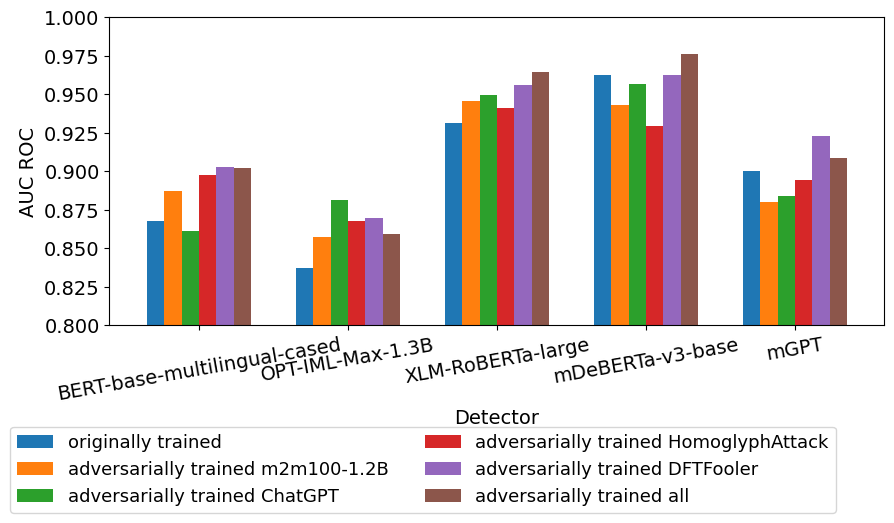

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(auc_dict_hq[model]['auc'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + rename_obfuscators[x.split('-finetuned-all-all.')[-1]] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
temp['Detector'] = [x.replace('xlm', 'XLM').replace('roberta', 'RoBERTa').replace('mdeberta', 'mDeBERTa').replace('bert', 'BERT').replace('opt-iml-max-1.3b', 'OPT-IML-Max-1.3B') for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,4], rot=10, fontsize=14, width=0.7)
chart.legend(loc='upper left', bbox_to_anchor=(-0.14, -0.3), ncol=2, fontsize=13)
chart.set_ylabel('AUC ROC', fontsize=14)
chart.set_xlabel('Detector', fontsize=14)
chart.set_ylim(0.8, 1.0)
chart.get_figure().savefig('at_ablation.pdf', bbox_inches="tight")

In [ ]:
#revision - increased quality thresholds & excluding pegasus and dipper
%%time
auc_dict_hq = {}
for model in tqdm(temp_models, total=len(temp_models)):
  temp = adversarial_detectors[model].copy()
  #temp = temp[temp.multi_label.str.contains('|'.join(selected_generators + ['human']))].reset_index(drop=True) #using only data of selected generators
  temp = temp[~temp.multi_label.str.contains('pegasus') & ~temp.multi_label.str.contains('dipper')].reset_index(drop=True) #remove obfuscators not passing the quality evaluation

  #filter high-quality data
  #language.str.contains("{test_language}") and fasttext.str.contains("{test_language}") and (diff_charlen < 5) and (diff_charlen > 0.5)')# and (editdistance > 1) and (meteor > 0.5)  and (use > 0.5) and (ngram > 0.5) and (tf > 0.5)'
  human = temp[temp.label == "human"].reset_index(drop=True)
  temp = temp[temp.label == "machine"].reset_index(drop=True)
  #temp = temp[temp.language == temp.fasttext].reset_index(drop=True)
  temp = temp[(temp.diff_charlen > 0.5) & (temp.diff_charlen < 2)].reset_index(drop=True)
  #temp = temp[(temp['ED-norm'] > 1)].reset_index(drop=True)
  temp = temp[(temp.editdistance > 1)].reset_index(drop=True)
  temp = temp[(temp.meteor > 0.5)].reset_index(drop=True)
  temp = temp[(temp.bertscore > 0.5)].reset_index(drop=True)
  temp = temp[(temp.use > 0.5)].reset_index(drop=True)
  temp = temp[(temp.ngram > 0.5)].reset_index(drop=True)
  temp = temp[(temp.tf > 0.5)].reset_index(drop=True)
  #print(temp.multi_label.value_counts())
  temp = pd.concat([human, temp], copy=False, ignore_index=True)

  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict_hq[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

CPU times: user 417 ms, sys: 241 ms, total: 658 ms
Wall time: 390 ms


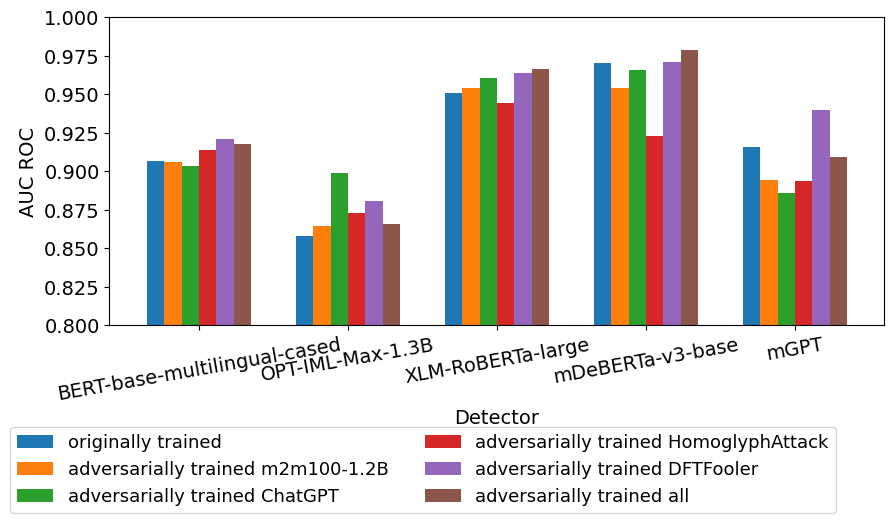

In [ ]:
%%time
metric = []
for model in temp_models:
  metric.append(auc_dict_hq[model]['auc'])

temp=pd.DataFrame({'Detector': temp_models, 'Metric': metric})
#temp['Trained'] = 'originally trained'
#temp.loc[~temp.Detector.str.contains('-balanced'), 'Trained'] = 'adversarially trained'
temp['Trained'] = ['adversarially trained ' + rename_obfuscators[x.split('-finetuned-all-all.')[-1]] if '-balanced' not in x else 'originally trained' for x in temp['Detector']]
temp['Detector'] = [x.split('-finetuned-all-all.')[0].split('-finetuned-all-all-balanced')[0] for x in temp['Detector']]
temp['Detector'] = [x.replace('xlm', 'XLM').replace('roberta', 'RoBERTa').replace('mdeberta', 'mDeBERTa').replace('bert', 'BERT').replace('opt-iml-max-1.3b', 'OPT-IML-Max-1.3B') for x in temp['Detector']]
chart = temp.set_index(['Detector', 'Trained']).unstack().sort_index(axis=1, key=lambda x: x.map(at_detectors_order))['Metric'].plot(kind='bar', figsize=[10,4], rot=10, fontsize=14, width=0.7)
chart.legend(loc='upper left', bbox_to_anchor=(-0.14, -0.3), ncol=2, fontsize=13)
chart.set_ylabel('AUC ROC', fontsize=14)
chart.set_xlabel('Detector', fontsize=14)
chart.set_ylim(0.8, 1.0)
chart.get_figure().savefig('at_ablation_hq.pdf', bbox_inches="tight")

In [ ]:
def analyze_2(results_list, filter=None):
  results = pd.DataFrame()
  for detector in tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        if len(temp.label.unique()) < 2: continue
        optimal_threshold = 0.5
        if optimize_threshold and 'prediction_probs' in temp.columns:
          labels = [label2id[x] for x in temp['label']]
          predictions = [label2id[x] for x in temp['predictions']]
          temp = temp.fillna(0.0)
          temp['prediction_probs'] = temp['prediction_probs'].astype(float)
          temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
          if (optimize_threshold):
            fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
            optimal_threshold = thresholds[np.argmax(tpr - fpr)]
            #optimal_threshold = thresholds[fpr <= 0.05][-1] #get threshold for 5% FPR
          preds = ["machine" if ((y > optimal_threshold)) else "human" for x,y in zip(temp['predictions'],temp['prediction_probs'])]
        else:
          preds = temp['predictions']
          if 'prediction_probs' in temp.columns:
            temp = temp.fillna(0.0)
            temp['prediction_probs'] = temp['prediction_probs'].astype(float)
            temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        scores = cr2df(temp['label'], preds, detector_name)
        try:
          scores['AUC_preds'] = roc_auc_score([label2id[x] for x in temp['label']], [label2id[x] for x in preds])
          scores['AUC ROC'] = roc_auc_score([label2id[x] for x in temp['label']], temp['prediction_probs'])
          scores['threshold'] = optimal_threshold
        except:
          pass
        scores['Category'] = detector_data['Category'].value_counts().index[0]
        results = pd.concat([results, scores], copy=False, ignore_index=True)
  temp = results.sort_values(by=['AUC ROC'], ascending=False).reset_index(drop=True)
  return temp

In [ ]:
%%time
results_all = pd.DataFrame()
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
    temp = analyze_2(adversarial_test_results, filter=f'language.str.contains("{test_language}") and fasttext.str.contains("{test_language}") and (diff_charlen < 5) and (diff_charlen > 0.5)')# and (editdistance > 1) and (meteor > 0.5)  and (use > 0.5) and (ngram > 0.5) and (tf > 0.5)')
    temp = temp[['Model', 'Obfuscator', 'Train Language', 'Train LLM', 'AUC ROC']]
    temp = temp.set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM'])
    temp.rename(columns={'AUC ROC': test_language}, inplace=True)
    if len(results_all) > 0: temp = temp[test_language]
    results_all = pd.concat([results_all, temp], copy=False, axis=1)

100%|██████████| 330/330 [00:38<00:00,  8.63it/s]

CPU times: user 5min 25s, sys: 1.8 s, total: 5min 26s
Wall time: 7min 56s


In [ ]:
bg_cmap = 'RdYlGn'
bg_vmin = -0.7
bg_vmax = 0.7
bg_text_color_threshold = 0.15

In [ ]:
#difference in absolute AUC ROC caused by adversarial training
filter_orig = results_all.reset_index()['Train LLM'].str.contains('-balanced')
filter_adv = ~results_all.reset_index()['Train LLM'].str.contains('-balanced')
temp = results_all.reset_index()[filter_adv].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:] - results_all.reset_index()[filter_orig].set_index(['Model', 'Obfuscator', 'Train Language', 'Train LLM']).groupby(['Obfuscator', 'Model', 'Train Language', 'Train LLM']).mean().groupby(['Obfuscator']).mean().loc[['original'] + obfuscators_order,:]
temp = pd.concat([pd.concat([temp, pd.DataFrame({'Obfuscator Average': temp.mean()}).T], axis=0), pd.DataFrame({'Language Average': temp.mean(axis=1)})], axis=1)
display(temp.style.format('{:.4f}'.format, na_rep='', precision=4).background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=bg_text_color_threshold, gmap=temp, axis=None).highlight_min(props='text-decoration: underline; font-weight: bold;', axis=None).highlight_max(props='text-decoration: overline; font-weight: bold;', axis=None))

,ar,ca,cs,de,en,es,nl,pt,ru,uk,zh,Language Average
original,0.0135,-0.0040,0.0012,-0.0104,-0.0042,-0.0057,-0.0130,-0.0071,-0.0059,-0.0126,-0.0232,-0.0065
backtranslated-m2m100-1.2B,-0.0007,0.0089,0.0171,0.0078,0.0080,-0.0006,0.0138,0.0088,-0.0004,-0.0072,-0.0250,0.0028
backtranslated-nllb-200-distilled-1.3B,0.0143,0.0084,0.0275,-0.0023,0.0046,-0.0020,-0.0021,0.0016,0.0027,-0.0049,-0.0228,0.0023
pegasus-paraphrase,-0.0605,0.1232,0.0943,0.1212,0.0098,0.0538,0.0966,0.1253,0.0093,0.0027,-0.0149,0.0510
dipper,0.0125,0.0380,0.0742,0.0392,0.0043,0.0103,0.0405,0.0387,0.0146,0.0010,0.0168,0.0264
paraphrased-ChatGPT,0.0130,-0.0020,0.0163,-0.0029,0.0001,-0.0043,-0.0038,-0.0019,0.0003,-0.0051,-0.0343,-0.0022
gptzzzs,0.0137,0.0035,0.0039,-0.0065,0.0081,0.0003,-0.0081,0.0047,-0.0059,-0.0127,-0.0232,-0.0020
gptzerobypasser,0.1112,0.1065,0.0873,0.1257,0.0474,0.0626,0.1114,0.0841,0.0726,0.0803,0.0111,0.0818
HomoglyphAttack,0.1108,0.0941,0.0714,0.1471,0.0308,0.0508,0.1030,0.0974,0.0617,0.0680,0.0147,0.0773
alison,0.0171,0.0006,0.0041,-0.0060,-0.0025,-0.0054,-0.0092,-0.0043,-0.0025,-0.0070,-0.0201,-0.0032


## Ablation

In [6]:
test_results = []
files = glob.glob(DATAPATH + "ablation/*.csv.gz")

files += glob.glob(DATAPATH + "finetuned/*original*xlm*en-all.csv.gz")
files += glob.glob(DATAPATH + "finetuned/*original*xlm*all-all.csv.gz")
files += glob.glob(DATAPATH + "zeroshot/*original*openai-detector.csv.gz")
files += glob.glob(DATAPATH + "statistical/*original*MFDMetric-threshold.csv.gz")

files += glob.glob(DATAPATH + "finetuned/*HomoglyphAttack*xlm*en-all.csv.gz")
files += glob.glob(DATAPATH + "finetuned/*HomoglyphAttack*xlm*all-all.csv.gz")
files += glob.glob(DATAPATH + "zeroshot/*HomoglyphAttack*openai-detector.csv.gz")
files += glob.glob(DATAPATH + "statistical/*HomoglyphAttack*MFDMetric-threshold.csv.gz")

files += glob.glob(DATAPATH + "finetuned/*alison*xlm*en-all.csv.gz")
files += glob.glob(DATAPATH + "finetuned/*alison*xlm*all-all.csv.gz")
files += glob.glob(DATAPATH + "zeroshot/*alison*openai-detector.csv.gz")
files += glob.glob(DATAPATH + "statistical/*alison*MFDMetric-threshold.csv.gz")

files = [x for x in files if ('alison' not in x.lower()) and ('all-all' not in x.lower()) and ('large-openai' not in x.lower())]
files

['./results/obfuscated/ablation/multitude_obfuscated_HomoglyphAttackAblation_MFDMetric-threshold.csv.gz',
 './results/obfuscated/ablation/multitude_obfuscated_HomoglyphAttackAblation_roberta-base-openai-detector.csv.gz',
 './results/obfuscated/ablation/multitude_obfuscated_HomoglyphAttackAblation_xlm-roberta-large-finetuned-en-all.csv.gz',
 './results/obfuscated/finetuned/multitude_obfuscated_original_xlm-roberta-large-finetuned-en-all.csv.gz',
 './results/obfuscated/zeroshot/multitude_obfuscated_original_roberta-base-openai-detector.csv.gz',
 './results/obfuscated/statistical/multitude_obfuscated_original_MFDMetric-threshold.csv.gz',
 './results/obfuscated/finetuned/multitude_obfuscated_HomoglyphAttack_xlm-roberta-large-finetuned-en-all.csv.gz',
 './results/obfuscated/zeroshot/multitude_obfuscated_HomoglyphAttack_roberta-base-openai-detector.csv.gz',
 './results/obfuscated/statistical/multitude_obfuscated_HomoglyphAttack_MFDMetric-threshold.csv.gz']

In [ ]:
for f in tqdm(files, total= len(files)):
   original = pd.read_csv(f.replace('/results/obfuscated/ablation/', '/dataset/').replace('/results/obfuscated/finetuned/', '/dataset/').replace('/results/obfuscated/zeroshot/', '/dataset/').replace('/results/obfuscated/statistical/', '/dataset/').replace('_' + f.split('/')[-1].split('_')[-1], '') + '.csv.gz', dtype = CAST_DICT)
   original = original[original.split == 'test'].reset_index(drop=True)
   df = pd.read_csv(f, dtype = CAST_DICT)
   original['predictions'] = df['predictions']
   original['prediction_probs'] = df['prediction_probs']
   df = original
   df = df.drop(columns=['text', 'generated'])
   df['multi_label'] = df['multi_label'] + f"_obfuscated-{f.split('/')[-1].split('_')[-2].replace('test-human-vicuna-opt-gpt4', 'backtranslated-Google-Translate')}"
   if '_obfuscated_' in f:
     df['Obfuscator'] = f.split('_obfuscated_')[-1].split('_')[0]
   df['label'] = ['human' if 'human' in x else 'machine' for x in df['multi_label']]
   df['predictions'] = ['human' if (('human' in x) or ('0' in str(x))) else 'machine' for x in df['predictions']]
   if ('MFDMetric' in f):
     df.loc[df.predictions == 'human', 'prediction_probs'] = 1 - df['prediction_probs'] #modify prediction probs of human-class predictions
   test_results.append({f.split('/')[-1].replace('.csv.gz', '') : df})
   #break

In [ ]:
models = []
for f in tqdm(test_results):
  for k,v in f.items():
    models.append(k.split('_')[-1])
models = list(set(models))
detectors = {}
for model in models:
  detectors[model] = pd.DataFrame()
for f in tqdm(test_results):
    for k,v in f.items():
      detectors[k.split('_')[-1]] = pd.concat([detectors[k.split('_')[-1]], v], copy=True, ignore_index=True)

100%|██████████| 9/9 [00:00<00:00, 64.69it/s]


In [ ]:
#remove obfuscated human samples, since they might be mislabeled
for model in tqdm(models, total=len(models)):
  temp = detectors[model]
  #temp = [x for x in temp if ('human' not in x.multi_label) or ('original' in x.multi_label)]
  temp = temp.query('~multi_label.str.contains("human") or multi_label.str.contains("original")', engine='python')
  detectors[model] = temp

for i, f in tqdm(enumerate(test_results), total=len(test_results)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  temp = detectors[detector]
  #df.loc[df.label == 'human',:] = temp[temp.label == 'human'].reset_index(drop=True).copy()
  df = pd.concat([df[df.label == 'machine'], temp[temp.label == 'human']], copy=True, ignore_index=True)
  test_results[i] = {list(f.keys())[0]: df}

100%|██████████| 9/9 [00:00<00:00, 33.13it/s]


In [ ]:
for i, f in tqdm(enumerate(test_results), total=len(test_results)):
  detector = ''
  for k,v in f.items():
    detector = k.split('_')[-1]
    df = pd.DataFrame(v)
    break
  df['Category'] = 'none'
  test_results[i] = {list(f.keys())[0]: df}

100%|██████████| 9/9 [00:00<00:00, 812.19it/s]


In [ ]:
all = analyze(test_results)

100%|██████████| 9/9 [00:01<00:00,  8.35it/s]


In [ ]:
all

,Obfuscator,Model,Train Language,Train LLM,Detector,Macro avg F1-score,Weighted avg F1-score,Recall (machine),Accuracy,FPR,FNR,Human samples,Machine samples,AUC_preds,AUC_probs,threshold,Category
0,original,xlm-roberta-large,en,all,multitude_obfuscated_original_xlm-roberta-large-finetuned-en-all,0.567428,0.860984,0.993054,0.895648,0.888752,0.006946,3236,26059,0.552151,0.779778,0.5,none
1,HomoglyphAttackAblation,xlm-roberta-large,en,all,multitude_obfuscated_HomoglyphAttackAblation_xlm-roberta-large-finetuned-en-all,0.564173,0.858837,0.989409,0.892405,0.888752,0.010591,3236,26059,0.550329,0.732027,0.5,none
2,HomoglyphAttack,xlm-roberta-large,en,all,multitude_obfuscated_HomoglyphAttack_xlm-roberta-large-finetuned-en-all,0.551662,0.850051,0.974174,0.878853,0.888752,0.025826,3236,26059,0.542711,0.449175,0.5,none
3,HomoglyphAttackAblation,MFDMetric-threshold,N/A,N/A,multitude_obfuscated_HomoglyphAttackAblation_MFDMetric-threshold,0.501856,0.820993,0.933651,0.838710,0.925834,0.066349,3236,26059,0.503908,0.723810,0.5,none
4,original,MFDMetric-threshold,N/A,N/A,multitude_obfuscated_original_MFDMetric-threshold,0.501856,0.820993,0.933651,0.838710,0.925834,0.066349,3236,26059,0.503908,0.723810,0.5,none
5,HomoglyphAttack,MFDMetric-threshold,N/A,N/A,multitude_obfuscated_HomoglyphAttack_MFDMetric-threshold,0.423596,0.716824,0.743275,0.669363,0.925834,0.256725,3236,26059,0.408720,0.359498,0.5,none
6,original,roberta-base-openai-detector,N/A,N/A,multitude_obfuscated_original_roberta-base-openai-detector,0.271164,0.311596,0.194520,0.274859,0.078183,0.805480,3236,26059,0.558169,0.582189,0.5,none
7,HomoglyphAttackAblation,roberta-base-openai-detector,N/A,N/A,multitude_obfuscated_HomoglyphAttackAblation_roberta-base-openai-detector,0.164126,0.139185,0.071415,0.165352,0.078183,0.928585,3236,26059,0.496616,0.527404,0.5,none
8,HomoglyphAttack,roberta-base-openai-detector,N/A,N/A,multitude_obfuscated_HomoglyphAttack_roberta-base-openai-detector,0.103272,0.038526,0.010284,0.110975,0.078183,0.989716,3236,26059,0.466051,0.389732,0.5,none


In [ ]:
%%time
auc_dict = {}
for model in tqdm(models, total=len(models)):
  temp = detectors[model].copy()
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_dict[model] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}
auc_original = auc_dict
for model in tqdm(models, total=len(models)):
 for test_language in sorted_languages:
  temp = detectors[model].copy()
  temp = temp[temp.multi_label.str.contains('original')].reset_index(drop=True)
  temp = temp[temp.language == test_language].reset_index(drop=True)
  temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language] = {'auc': auc(fpr, tpr), 'th_optim': thresholds[np.argmax(tpr - fpr)], 'th_optim2': thresholds[np.argmin(np.abs(fpr+tpr-1))], 'th_1%fpr': thresholds[fpr <= 0.01][-1], 'th_3%fpr': thresholds[fpr <= 0.03][-1], 'th_5%fpr': thresholds[fpr <= 0.05][-1], 'th_10%fpr': thresholds[fpr <= 0.10][-1], 'th_15%fpr': thresholds[fpr <= 0.15][-1], 'th_20%fpr': thresholds[fpr <= 0.20][-1], 'th_25%fpr': thresholds[fpr <= 0.25][-1], 'th_30%fpr': thresholds[fpr <= 0.30][-1], 'th_40%fpr': thresholds[fpr <= 0.40][-1], 'th_50%fpr': thresholds[fpr <= 0.50][-1]}

  temp = temp.groupby(['label']).sample(frac=0.1, random_state = 42).reset_index(drop=True)
  #print(temp.multi_label.value_counts())
  labels = [label2id[x] for x in temp['label']]
  fpr, tpr, thresholds = roc_curve(labels, temp['prediction_probs'])
  auc_original[model][test_language]['th_optim_valid'] = thresholds[np.argmax(tpr - fpr)]

100%|██████████| 3/3 [00:02<00:00,  1.04it/s]

CPU times: user 3.18 s, sys: 14.8 ms, total: 3.2 s
Wall time: 3.2 s


In [ ]:
bg_cmap = 'RdYlGn'
bg_vmin = -1
bg_vmax = 1
bg_text_color_threshold = 0.15

In [ ]:
def analyze_attack_success_th(results_list, model="", filter=None, threshold=0.501):
  results = pd.DataFrame()
  for detector in results_list:#tqdm(results_list, total=len(results_list)):
    for detector_name, detector_data in detector.items():
        #print(detector_name)
        if model != detector_name.split('_')[-1]: continue
        #if "TextFooler" in detector_name: continue
        temp = detector_data
        if filter is not None:
          temp = detector_data.query(filter, engine='python')
        labels = [label2id[x] for x in temp['label']]
        predictions = [label2id[x] for x in temp['predictions']]
        temp = temp.fillna(0.0)
        temp['prediction_probs'] = temp['prediction_probs'].astype(float)
        temp.loc[temp.predictions == 'human', 'prediction_probs'] = 1 - temp['prediction_probs']
        temp['predictions'] = ["machine" if x >= threshold else "human" for x in temp['prediction_probs']]
        temp['threshold'] = threshold
        temp = temp.rename(columns={'predictions': f'{detector_name}_predictions', 'threshold': f'{detector_name}_threshold', 'prediction_probs': f'{detector_name}_prediction_probs'})
        results = pd.concat([results, temp], axis=1)
  #results = results.T.drop_duplicates().T.reset_index(drop=True)
  results = results.loc[:,~results.columns.duplicated()].copy()
  return results

In [ ]:
%%time
#only originally (not adversarially) trained models with optimal per-language threshold
asr_lang = {}
for test_language in ['ar', 'ca', 'cs', 'de', 'en', 'es', 'nl', 'pt', 'ru', 'uk', 'zh']:
 attack_success = pd.DataFrame()
 for model in tqdm(models):
  results = analyze_attack_success_th(test_results, model=model, filter=f'language.str.contains("{test_language}")', threshold=auc_original[model][test_language]['th_optim'])
  original_predictions_col = list(results.columns[results.columns.str.contains('predictions') & results.columns.str.contains('original')])
  predictions_cols = list(results.columns[results.columns.str.contains('predictions')])
  predictions = results[['label'] + predictions_cols]
  temp = pd.DataFrame()
  for col in predictions_cols:
    maximum = (1 / len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")])) if len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine")]) != 0 else 0
    asr = len(predictions[(predictions.iloc[:,0] == 'machine') & predictions[original_predictions_col[0]].str.contains("machine") & predictions[col].str.contains("human")]) * maximum
    df = pd.DataFrame({'Obfuscator': col.split('_')[2], 'Attack Success Rate': asr}, index=[0])
    temp = pd.concat([temp, df], copy=False).reset_index(drop=True)
  temp['Model'] = model
  attack_success = pd.concat([attack_success, temp], copy=False).reset_index(drop=True)
 asr_lang[test_language] = attack_success

100%|██████████| 3/3 [00:00<00:00,  3.95it/s]

CPU times: user 5.81 s, sys: 46.7 ms, total: 5.85 s
Wall time: 5.99 s


In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack()
temp.style.apply(lambda x: ["background-color: yellow" if v > 0.5 else "background-color: orange" if v == 0 else "" for v in x], axis = 1).format(precision=4)

In [ ]:
temp = pd.DataFrame()
for k, v in asr_lang.items():
  df = pd.DataFrame(v)
  df['Test Language'] = k
  temp = pd.concat([temp, df], copy=False, ignore_index=True)
temp['Model'] = temp['Model'].replace(dict(rename_detectors), regex=False)
temp = temp[temp.Model.str.contains('MFD') | temp.Model.str.contains('RoBERTa-base-OpenAI-Detector') | temp.Model.str.contains('XLM-RoBERTa-large \(en\)')]
temp = temp[temp.Obfuscator.str.contains('HomoglyphAttack')]
temp = temp.set_index(['Obfuscator', 'Model', 'Test Language']).unstack()

temp = temp.style.background_gradient(cmap=bg_cmap, vmin=bg_vmin, vmax=bg_vmax, text_color_threshold=0.25, gmap=temp, axis=None).format(precision=4)
display(temp)
temp = temp.applymap_index(lambda v: "font-weight: bold;", axis=0).applymap_index(lambda v: "font-weight: bold;", axis=1).to_latex(convert_css=True)
print(temp.replace('HomoglyphAttackAblation', 'b)').replace('HomoglyphAttack', 'a)').replace('\\multirow', '\\hline\n\\multirow'))
#little hack to properly format latex table
#s = temp.replace('\\color[HTML]{F1F1F1} ', '\\textcolor{white}{').replace('\\color[HTML]{000000} ', '\\textcolor{black}{').replace(') & {\\cellcolor', ')} & {\\cellcolor').replace(' \\', '} \\').replace('&}', '&').replace('\\bfseries Obfuscator Average', '\\hline\n\\bfseries $\downarrow$ Average').replace('\\bfseries Language Average} \\\\\n', '\\bfseries $\\rightarrow$ Average \\\\\n\\hline\n').replace('}}}', '}}')
#print(s[:s.rfind('\hline')])
#print(s[s.rfind('\hline'):].replace(' &', '} &').replace('Average}', 'Average').replace('{\\cellcolor[HTML]{000000}} \\textcolor{white}{nan}', ''))

\begin{tabular}{llrrrrrrrrrrr}
 &  & \multicolumn{11}{r}{\bfseries Attack Success Rate} \\
 & Test Language & \bfseries ar & \bfseries ca & \bfseries cs & \bfseries de & \bfseries en & \bfseries es & \bfseries nl & \bfseries pt & \bfseries ru & \bfseries uk & \bfseries zh \\
Obfuscator & Model &  &  &  &  &  &  &  &  &  &  &  \\
\hline
\multirow[c]{3}{*}{\bfseries a)} & \bfseries MFD & {\cellcolor[HTML]{07753E}} \color[HTML]{F1F1F1} 0.9427 & {\cellcolor[HTML]{097940}} \color[HTML]{F1F1F1} 0.9293 & {\cellcolor[HTML]{279F53}} \color[HTML]{000000} 0.7589 & {\cellcolor[HTML]{138C4A}} \color[HTML]{F1F1F1} 0.8467 & {\cellcolor[HTML]{33A456}} \color[HTML]{000000} 0.7289 & {\cellcolor[HTML]{0E8245}} \color[HTML]{F1F1F1} 0.8888 & {\cellcolor[HTML]{148E4B}} \color[HTML]{F1F1F1} 0.8417 & {\cellcolor[HTML]{36A657}} \color[HTML]{000000} 0.7203 & {\cellcolor[HTML]{0B7D42}} \color[HTML]{F1F1F1} 0.9071 & {\cellcolor[HTML]{036E3A}} \color[HTML]{F1F1F1} 0.9699 & {\cellcolor[HTML]{BBE278}} \color[HTML]{0